In [26]:
from yahoofinancials import YahooFinancials as yfs
from datetime import datetime

current_ticker = 'JPM'
freq = 'quarterly'
current_report = 'balance'
report_dict = {'income': 'Statement', 'balance': 'Sheet', 'cash': 'flowStatement'}

data = yfs(current_ticker)
income_stat = data.get_financial_stmts(frequency = freq, statement_type = current_report)
last_date_available = sorted(pd.DataFrame(income_stat[current_report + report_dict[current_report] + 'HistoryQuarterly'][current_ticker]).columns.map(lambda x: datetime.strptime(x, '%Y-%m-%d').date()).tolist())[-1]
income_stat[current_report + report_dict[current_report] + 'HistoryQuarterly'][current_ticker][-1][last_date_available.strftime('%Y-%m-%d')]

{'payablesAndAccruedExpenses': 319788000000.0,
 'capitalStock': 31509000000.0,
 'totalCapitalization': 743724000000.0,
 'retainedEarnings': 306208000000.0,
 'netTangibleAssets': 240992000000.0,
 'treasuryStock': 109372000000.0,
 'longTermDebtAndCapitalLeaseObligation': 440642000000.0,
 'otherIntangibleAssets': 9946000000.0,
 'receivables': 174590000000.0,
 'commonStockEquity': 275678000000.0,
 'goodwill': 52144000000.0,
 'preferredStock': 27404000000.0,
 'commonStock': 4105000000.0,
 'stockholdersEquity': 303082000000.0,
 'additionalPaidInCapital': 89155000000.0,
 'totalAssets': 3744305000000.0,
 'preferredSharesNumber': 391850000.0,
 'gainsLossesNotAffectingRetainedEarnings': -14418000000.0,
 'otherPayable': 44711000000.0,
 'cashAndCashEquivalents': 546000000000.0,
 'currentDebt': 42241000000.0,
 'totalLiabilitiesNetMinorityInterest': 3441223000000.0,
 'investmentsAndAdvances': 1129693000000.0,
 'accountsPayable': 275077000000.0,
 'investedCapital': 758561000000.0,
 'payables': 319788

In [3]:
#Builds Earnings Dates Relations for Selected Stocks
#Alpha Vantage API Key: PXM1VV23X6PFVQVO

import pandas as pd
from sqlalchemy import create_engine
import math
import numpy as np
import os
import csv
import yfinance as yf
#import mysql.connector
import matplotlib.pyplot as plt
import psycopg2
import requests
import json
import tkinter as tk
import re
from datetime import datetime
from datetime import timedelta
from datetime import date
from sqlalchemy import create_engine
from sklearn.linear_model import LinearRegression

def Average(lst):
    return sum(lst) / len(lst)

def Set_DF(dframe):
    
    dframe.index = dframe[dframe.columns.values.tolist()[0]]
    dframe.index.name = dframe.columns.values.tolist()[0]
    New_df = dframe.drop(dframe.columns.values.tolist()[0], axis=1)
    
    return New_df

def DD_Index(dframe):
    
    dframe['dummy'] = dframe.index
    dframe.drop_duplicates(['dummy'], inplace=True)
    dframe.drop('dummy', axis=1, inplace=True)
    New_df = dframe
    
    return New_df

def round_down(n, decimals = 0): 
    multiplier = 10 ** decimals 
    return int(math.floor(n * multiplier) / multiplier)

def ed_VA(f_ticker, t_list, q_query):
    
    return_df = pd.DataFrame(index=['Dates'], columns=t_list)
    s_string = ''
    if (len(t_list)>0):
        s_string=t_list[0]
        if (len(t_list)>1):
            for addt in t_list[1:]:
                s_string = s_string + ',' + str(addt)

    url = 'https://app.visiblealpha.com/api2/earnings?ticker=' + f_ticker + '&tickertype=B&additionaltickers=' + s_string + '&period=' + q_query
    resp = requests.get(url,headers=headers)
    y = json.loads(resp.content)
    if (y['status']=='success') and (y['data']!=[]):
        for reply in y['data']:
            date_d = datetime.strptime(reply['earningsdate'][:10], "%Y-%m-%d").date()
            return_df.loc['Dates', reply['ticker']] = date_d
            
    
    return return_df

CSV_URL = 'https://www.alphavantage.co/query?function=EARNINGS_CALENDAR&horizon=12month&apikey=2pad0ntuACXUpAdBWtlr2PFj9p_bQ9ym'

with requests.Session() as s:
    download = s.get(CSV_URL)
    decoded_content = download.content.decode('utf-8')
    cr = csv.reader(decoded_content.splitlines(), delimiter=',')

dbase = "visiblealpha_laptop"
dbase_metrics = "metrics_laptop"

string_to_number = {'BGNE US': '6160 HK','TCEHY US': '700 HK','TSM US': '2330 TT','SONY US': '6758 JP','XPEV US': '9868 HK'}
number_to_string = {'6160 HK': 'BGNE US','700 HK': 'TCEHY US','2330 TT': 'TSM US','6758 JP': 'SONY US','9868 HK': 'XPEV US'}
clean_up = lambda x: re.sub(r'[^A-Z /^0-9]', '', str(x))
clean_up_SQL = lambda x: re.sub(r'[^A-Z ^0-9]', '', x)
clean_up_save = lambda x: re.sub(r'[^A-Z ^0-9]', '', str(x))
map_index = lambda x: key_reports_df.loc[x, 'Relevance']
map_lower = lambda x: x.lower()
int_to_str = lambda x: str(x)
str_to_int = lambda x: int(x)

conn = psycopg2.connect(host="localhost", user="postgres", password="akf7a7j5", dbname=dbase, port=5432)
cursor = conn.cursor()
cursor.execute("select relname from pg_class where relkind='r' and relname !~ '^(pg_|sql_)';")
tables_list = cursor.fetchall()
new_tables_list = list(pd.DataFrame(tables_list, columns=['Old'])['Old'])

conn = psycopg2.connect(host="localhost", user="postgres", password="akf7a7j5", dbname=dbase_metrics, port=5432)
cursor = conn.cursor()
cursor.execute("select relname from pg_class where relkind='r' and relname !~ '^(pg_|sql_)';")
tables_list = cursor.fetchall()
new_tables_list_metrics = list(pd.DataFrame(tables_list, columns=['Old'])['Old'])

cnxn_string = ("postgresql+psycopg2://{username}:{pswd}"
              "@{host}:{port}/{database}")

engine = create_engine(cnxn_string.format(
    username="postgres",
    pswd="akf7a7j5",
    host="localhost",
    port=5432,
    database=dbase))

engine_metrics = create_engine(cnxn_string.format(
    username="postgres",
    pswd="akf7a7j5",
    host="localhost",
    port=5432,
    database=dbase_metrics))

AVapi_key = 'THL7JKMG0IEOI16R' 
CSV_URL = 'https://www.alphavantage.co/query?function=EARNINGS_CALENDAR&horizon=3month&apikey=' + AVapi_key

with requests.Session() as s:
    download = s.get(CSV_URL)
    decoded_content = download.content.decode('utf-8')
    cr = csv.reader(decoded_content.splitlines(), delimiter=',')

today = date.today()
m = today.month

try:
    ub = datetime(today.year, ((today.month - 1) // 3 + 1) * 3, 31).date()
except:
    try:
        ub = datetime(today.year, ((today.month - 1) // 3 + 1) * 3, 30).date()
    except:
        try:
            ub = datetime(today.year, ((today.month - 1) // 3 + 1) * 3, 29).date()
        except:
            ub = datetime(today.year, ((today.month - 1) // 3 + 1) * 3, 28).date()
try:
    lb = datetime(today.year, ((today.month - 1) // 3) * 3, 31).date()
except:
    try:
        lb = datetime(today.year, ((today.month - 1) // 3) * 3, 30).date()
    except:
        try:
            lb = datetime(today.year, ((today.month - 1) // 3) * 3, 29).date()
        except:
            try:
                lb = datetime(today.year, ((today.month - 1) // 3) * 3, 28).date()
            except:
                lb = datetime(today.year - 1, 12, 31).date()

current_qtr = max(0, m - 1) // 3
current_year = today.year

if (current_qtr == 0):
    current_qtr = 4
    current_year = current_year - 1
    
qtr_string = str(current_qtr) + 'QCY-' + str(current_year)

stocks = pd.read_csv(r"C:\Users\Utilizador\OneDrive\Documentos\Malta\Systematic\Tickers_VA.csv")
csv_df = pd.DataFrame(stocks)

csv_df['Relations_ticker'] = csv_df['tickers'].replace(number_to_string)
csv_df['Relations_ticker'] = csv_df['Relations_ticker'].map(clean_up)
csv_df['SQL_ticker'] = csv_df['Relations_ticker'].map(clean_up_save)
csv_df['VA_tickers'] = csv_df['tickers'].map(clean_up)
csv_list = csv_df['Relations_ticker'].values.tolist()
csv_df = Set_DF(csv_df)
csv_df = DD_Index(csv_df)

query_earnings = "SELECT * FROM ed_relation"
ed_df = pd.read_sql_query(query_earnings, engine)
ed_df = Set_DF(ed_df)
ed_df = DD_Index(ed_df)

if (qtr_string not in ed_df.index):   
    ed_df.loc[qtr_string] = ''
    
ec = pd.DataFrame(cr)
ec.columns = ec.iloc[0].values
ec.drop([0], inplace = True)
ec.index = ec[ec.columns[0]]
ec.drop([ec.columns[0]], axis = 1, inplace = True)
slim_ec = ec[ec['estimate'] != ''].copy()
slim_ec['RD Code'] = slim_ec['reportDate'].map(lambda x: x.split('-')[1] + x.split('-')[2]).values.tolist()
slim_ec.drop_duplicates(subset = 'name', inplace = True)
ticker_list = ed_df.columns.values.tolist()


for idx, ticker in enumerate(ticker_list):
    if (ticker.split(' ')[0] in slim_ec.index.values.tolist()):        
        next_ed_str = slim_ec.loc[ticker.split(' ')[0], 'RD Code']
        next_ed = datetime(today.year, int(next_ed_str[:2]), int(next_ed_str[2:])).date()
        if (next_ed < lb):
            next_ed = lb
            print('ED amended for ' + ed_df.columns[idx] + ', new: ' + lb.strftime('%Y-%m-%d') + ', old: ' + next_ed_str)
        elif (next_ed > ub):
            next_ed = ub
            print('ED amended for ' + ed_df.columns[idx] + ', new: ' + ub.strftime('%Y-%m-%d') + ', old: ' + next_ed_str)                                                        
        if (ed_df.iloc[-1][ticker] == ''):
            ed_df.loc[ed_df.index[-1], ticker] = next_ed.strftime('%m%d')                        
        else:
            if (ed_df.iloc[-1][ticker] != next_ed.strftime('%m%d')) & (next_ed > today):
                ed_df.loc[ed_df.index[-1], ticker] = next_ed.strftime('%m%d') 

                
ed_df.to_sql('ed_relation', engine, index = True, if_exists = 'replace')

week = input('Current week or (N)ext? ').upper()
start_date = today - timedelta(today.weekday())
if (week == 'N'):
    start_date = start_date + timedelta(7)
ec_df = pd.DataFrame('', index = np.arange(1000), columns = pd.date_range(start_date, start_date + timedelta(4), freq = 'd').date)
last_ec = ed_df.T[ed_df.T.columns[-1]][ed_df.T[ed_df.T.columns[-1]] != '']
last_ec = last_ec.map(lambda x: datetime(today.year, int(x[:2]), int(x[2:])).date())
dates_list = ec_df.columns
for current_date in dates_list:
    cd_tickers = last_ec[last_ec == current_date].index.values.tolist()
    ec_df[current_date] = cd_tickers + [''] * (len(ec_df.index) - len(cd_tickers))        
ec_df = ec_df.replace({'': np.nan}).dropna(how = 'all').fillna('')
print('')
print(ec_df)

ed_df

ED amended for BK US, new: 2024-09-30, old: 0110
ED amended for BLK US, new: 2024-09-30, old: 0110
ED amended for SCHW US, new: 2024-09-30, old: 0115
ED amended for CAG US, new: 2024-09-30, old: 0102
ED amended for STZ US, new: 2024-09-30, old: 0103
ED amended for LW US, new: 2024-09-30, old: 0102
ED amended for WBA US, new: 2024-09-30, old: 0102
Current week or (N)ext? 

   2024-10-14 2024-10-15 2024-10-16 2024-10-17 2024-10-18
0                                        BX US     SLB US
1                                       MAN US     AXP US
2                                       TSM US     CMA US
3                                      NFLX US    FITB US
4                                       ALK US      RF US
5                                       GPC US           
6                                      HBAN US           
7                                      ISRG US           
8                                       KEY US           
9                                       MTB U

,ABST US,AMPL US,ASUR US,AXON US,BLKB US,CDAY US,DV US,EGAN US,ESMT US,EVBG US,...,SE US,HALO US,NET US,CVNA US,XPEV US,FSLY US,RDFN US,PD US,EXAS US,SG US
index,,,,,,,,,,,,,,,,,,,,,
1QCY-2012,,,,,,,,,,,...,,,,,,,,,,
2QCY-2012,,,,,,,,,,,...,,,,,,,,,,
3QCY-2012,,,,,,,,,,,...,,,,,,,,,,
4QCY-2012,,,,,,,,,,,...,,,,,,,,,,
1QCY-2013,,,,,,,,,,,...,,,,,,,,,,
2QCY-2013,,,,,,,,,,,...,,,,,,,,,,
3QCY-2013,,,,,,,,,,,...,,,,,,,,,,
4QCY-2013,,,,,,,,,,,...,,,,,,,,,,
1QCY-2014,,,,,,,,,,,...,,,,,,,,,,


Enter specific Ticker: (ALGO ticker, empty for list) 
Only US? (Y/y or empty) Y
Include ADRs? (N/n or empty) N
Check to continue? (N/n or empty) N
Bypass if EPS N/A? (Y/y or empty) Y
Edit ALL? (Y/y or empty) 
Ask for manual inputs (N/n or empty)? N
1 out of 164- HSTM US


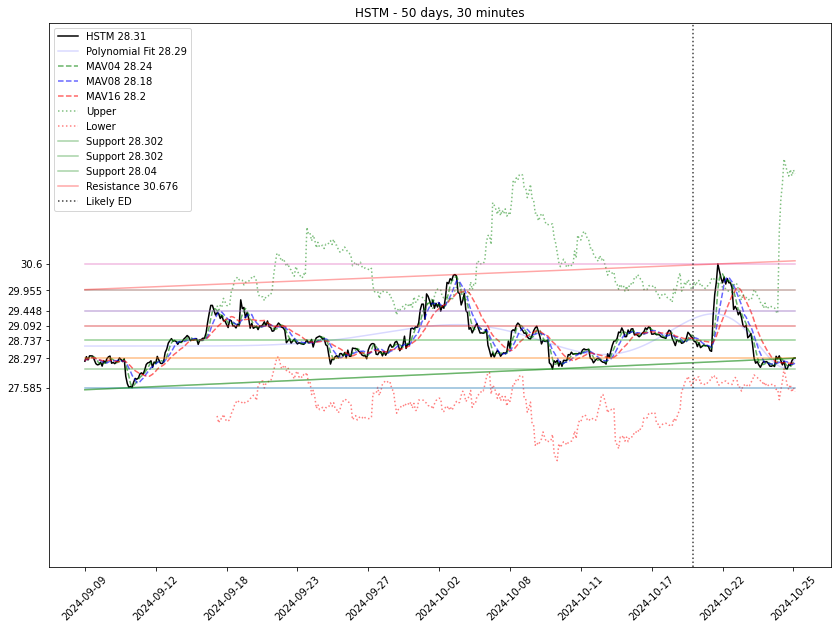

HSTM US basicAverageShares DONE

HSTM US dilutedAverageShares DONE

HSTM US totalRevenue (last yr value: 70,339,000.00, exp: 73,500,000.00)
HSTM US totalRevenue (GAAP value Suggested: 73,095,000.00)
HSTM US totalRevenue (GAAP value Suggested Ann: -141,802,000.00)
QoQ sequential: 2.15% change; QoQ YoY: 3.92% change
Cumulative Yr seq: -298.17% change; Cumulative Yr YoY: -301.6% change


In [ ]:
## Updates Stock Tables from TICKERS_VA CSV table with industry specific parameters - yahoofinancials

import pandas as pd
import numpy as np
import math
import os
import csv
import yfinance as yf
from yahoofinancials import YahooFinancials as yfs
#import mysql.connector
import psycopg2
import requests
import json
import tkinter as tk
import re
import time
import warnings
import matplotlib.pyplot as plt
from datetime import datetime
from datetime import timedelta
from datetime import date
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import PolynomialFeatures
from sqlalchemy import create_engine

def round_down(n, decimals = 0): 
    multiplier = 10 ** decimals 
    return int(math.floor(n * multiplier) / multiplier)

def Set_DF(dframe):
    
    dframe.index = dframe[dframe.columns.values.tolist()[0]]
    dframe.index.name = dframe.columns.values.tolist()[0]
    New_df = dframe.drop(dframe.columns.values.tolist()[0], axis=1)
    
    return New_df

def DD_Index(dframe):
    
    dframe['dummy'] = dframe.index
    dframe.drop_duplicates(['dummy'], inplace=True)
    dframe.drop('dummy', axis=1, inplace=True)
    New_df = dframe
    
    return New_df

def AV_Query(*args):
    
    url_1 = args[0]
    func = args[1]
    ticker = args[2]
    api_k = args[3]
    hor = args[4]
    if (hor == ''):
        url = url_1 + func + '&symbol=' + ticker + '&apikey=' + api_k
        resp = requests.get(url)
        y = json.loads(resp.content)
    else:
        url = url_1 + func + '&horizon=' + hor + '&apikey=' + api_k
        with requests.Session() as s:
            download = s.get(url)
            decoded_content = download.content.decode('utf-8')
            y = csv.reader(decoded_content.splitlines(), delimiter=',')

    return y

def YF_Query(*args):
    
    report_dict = {'income': 'Statement', 'balance': 'Sheet', 'cash': 'flowStatement'}
    
    curr_report = args[0]
    ticker = args[1]
    freq = args[2]
    cap_freq = freq.capitalize()
    
    try:
        data = yfs(ticker)
        income_stat = data.get_financial_stmts(frequency = freq, statement_type = curr_report)
        if (len(income_stat[curr_report + report_dict[curr_report] + 'History' + cap_freq][ticker]) > 0):
            last_date_available = sorted(pd.DataFrame(income_stat[curr_report + report_dict[curr_report] + 'History' + cap_freq][ticker]).columns.map(lambda x: datetime.strptime(x, '%Y-%m-%d').date()).tolist())[-1]
            for element in income_stat[curr_report + report_dict[curr_report] + 'History' + cap_freq][ticker]:
                try:
                    y = element[last_date_available.strftime('%Y-%m-%d')]
                except:
                    pass
        else:
            y = 'z'
            last_date_available = datetime(1999, 1, 1).date()
    except:
        y = 'z'
        last_date_available = datetime(1999, 1, 1).date()
        
    return y, last_date_available

def Regression(*args):
    
    lin_reg = LinearRegression()
    order = args[0]
    x_array = args[1]
    y_values = args[2]
    poly_feat = PolynomialFeatures(degree = order, include_bias = False)
    x_array_new = poly_feat.fit_transform(x_array)
    Model = lin_reg.fit(x_array_new, y_values)
    
    return Model

def InterpolateNext(*args):
    
    ticker_name = args[0]
    NewRep_df = args[1]
    q01_update = args[2]
    field_name = args[3]
    dummy_curr = args[4]
    g_ratio = args[5]
    q_curr = 0
    CRep_df = NewRep_df[:-1].copy()
    CRep_df.loc[today] = NewRep_df.iloc[-2].shift(-1)
    if (dummy_curr):
        NewRep_df['Q0'] = NewRep_df['Q1']

    Last_Series = CRep_df.iloc[-1].dropna()
    First_Q = int(Last_Series.index[0].split('Q')[1])
    Last_Q = int(Last_Series.index[-1].split('Q')[-1])
    Extra_points = 40 - Last_Q
    Last_Series.index = np.arange(len(Last_Series.index))
    features = Last_Series.index.values.reshape(-1, 1)
    targets = Last_Series.values
    model01 = Regression(1, features, targets)
    new_features = np.arange(len(features) + Extra_points).reshape(-1, 1)
    Forecasts01_df = pd.DataFrame(model01.predict(new_features), index = np.arange(len(features) + Extra_points) + First_Q, columns = ['Forecast'])
    Forecasts01_df.index = Forecasts01_df.T.columns.map(lambda x: 'Q' + str(x))
    if (Extra_points > 0):
        CRep_df.iloc[-1] = [np.nan] * (81 - len(CRep_df.iloc[-1].dropna().values.tolist()) - Extra_points) + (CRep_df.iloc[-1].dropna().values.tolist() + Forecasts01_df['Forecast'][-Extra_points:].values.tolist())
    else:
        CRep_df.iloc[-1] = [np.nan] * (len(CRep_df.iloc[-1]) - len(CRep_df.iloc[-1].dropna())) + CRep_df.iloc[-1].dropna().values.tolist()

    Last_Series = NewRep_df.iloc[-1].dropna()
    First_Q = int(Last_Series.index[0].split('Q')[1])
    Last_Q = int(Last_Series.index[-1].split('Q')[-1])
    Extra_points = 40 - Last_Q
    Last_Series.index = np.arange(len(Last_Series.index))
    features = Last_Series.index.values.reshape(-1, 1)
    targets = Last_Series.values
    model01 = Regression(1, features, targets)
    new_features = np.arange(len(features) + Extra_points).reshape(-1, 1)
    Forecasts01_df = pd.DataFrame(model01.predict(new_features), index = np.arange(len(features) + Extra_points) + First_Q, columns = ['Forecast'])
    Forecasts01_df.index = Forecasts01_df.T.columns.map(lambda x: 'Q' + str(x))
    if (Extra_points > 0):
        NewRep_df.iloc[-1] = [np.nan] * (81 - len(NewRep_df.iloc[-1].dropna().values.tolist()) - Extra_points) + (NewRep_df.iloc[-1].dropna().values.tolist() + Forecasts01_df['Forecast'][-Extra_points:].values.tolist())
    else:
        NewRep_df.iloc[-1] = [np.nan] * (len(NewRep_df.iloc[-1]) - len(NewRep_df.iloc[-1].dropna())) + NewRep_df.iloc[-1].dropna().values.tolist()
    
    if (q01_update):
        q_curr = 1 
    q_back_f = max(int(NewRep_df.iloc[-1].dropna().index[0].split('Q')[1]), q_back)
    q_back_str = 'Q' + str(q_back_f)
    q_curr_str = 'Q' + str(q_curr)
    q_fwd1_str = 'Q' + str(q_fwd1)
    q_fwd2_str = 'Q' + str(q_fwd2)
    
    slice_01 = CRep_df.iloc[-1][q_back_str: q_curr_str].fillna(method = 'bfill').values.tolist()
    slice_02 = CRep_df.iloc[-1][q_fwd1_str: q_fwd2_str].fillna(method = 'ffill').values.tolist()
    slice_01x = np.arange(len(slice_01)) + q_back_f
    slice_02x = np.arange(len(slice_02)) + q_fwd1
    x_values = np.array(list(slice_01x) + list(slice_02x)).reshape(-1, 1)
    y_values = np.array(slice_01 + slice_02)
    
    model02 = Regression(pol_order, x_values, y_values)
    full_x_values = np.arange(81) - 40
    poly_fxv = PolynomialFeatures(degree = pol_order, include_bias = False)
    full_x_values_pol = poly_fxv.fit_transform(full_x_values.reshape(-1, 1))
    Forecasts02_df = pd.DataFrame(model02.predict(full_x_values_pol), index = full_x_values, columns = ['Forecast'])
    Forecasts02_df.index = Forecasts02_df.T.columns.map(lambda x: 'Q' + str(x))
    
    slice_01 = NewRep_df.iloc[-1][q_back_str: q_curr_str].fillna(method = 'bfill').values.tolist()
    slice_02 = NewRep_df.iloc[-1][q_fwd1_str: q_fwd2_str].fillna(method = 'ffill').values.tolist()
    slice_02 = (np.array(slice_02) * (1 + g_ratio / 200)).tolist()
    slice_01x = np.arange(len(slice_01)) + q_back_f
    slice_02x = np.arange(len(slice_02)) + q_fwd1
    x_values = np.array(list(slice_01x) + list(slice_02x)).reshape(-1, 1)
    y_values = np.array(slice_01 + slice_02)
    
    model03 = Regression(pol_order, x_values, y_values)
    full_x_values = np.arange(81) - 40
    poly_fxv = PolynomialFeatures(degree = pol_order, include_bias = False)
    full_x_values_pol = poly_fxv.fit_transform(full_x_values.reshape(-1, 1))
    Forecasts03_df = pd.DataFrame(model03.predict(full_x_values_pol), index = full_x_values, columns = ['Forecast'])
    Forecasts03_df.index = Forecasts03_df.T.columns.map(lambda x: 'Q' + str(x))
    
    ChangeSummary = Forecasts02_df[-(80 - NewRep_df.columns.values.tolist().index(q_curr_str)):-(80 - NewRep_df.columns.values.tolist().index('Q11'))].join(Forecasts03_df[-(80 - NewRep_df.columns.values.tolist().index(q_curr_str)):-(80 - NewRep_df.columns.values.tolist().index(q_update_final))], rsuffix = '_NEW')
    ChangeSummary['Difference'] = (ChangeSummary['Forecast_NEW'] - ChangeSummary['Forecast']).map(lambda x: "{:,.2f}".format(x))
    ChangeSummary['% Move'] = round(100 * (ChangeSummary['Forecast_NEW'] - ChangeSummary['Forecast']) / abs(ChangeSummary['Forecast']), 2)
    
    print('')
    print(ticker_name + ' ' + field_name + ' Change Summary:')
    print(ChangeSummary)
    
    print('')
    proceed = input('Proceed w/ ' + field_name + ' change? (Q/q to quit, N/n to go again or empty) ').upper()
    
    FinalRep_df = NewRep_df.copy()
    if (proceed == ''):
        change_array = np.array([0] * (41 + q_curr) + (ChangeSummary['Forecast_NEW'] - ChangeSummary['Forecast']).values.tolist() + [0] * (40 - int(q_update_final.split('Q')[1])))
        FinalRep_df.iloc[-1] = NewRep_df.iloc[-1].values + change_array

    return FinalRep_df, proceed

            
def Update_Others(stock):
    
    my_list = []
    query_spec = "SELECT * FROM operating_metrics"
    Spec_df = pd.read_sql_query(query_spec, engine)
    Spec_df = Set_DF(Spec_df)
    Spec_df = DD_Index(Spec_df)
    ticker_sql = re.sub(r'[^a-z_^0-9]', '', stock.lower())
    if (ticker_sql in new_tables_list):
        query_rev = "SELECT * FROM " + ticker_sql
        CRev_df = pd.read_sql_query(query_rev, engine)
        CRev_df = Set_DF(CRev_df)
        CRev_df = DD_Index(CRev_df)
        mid = CRev_df.columns[0][0] + str(1)
        last_saved_date = CRev_df.index[-1]
        if (ed_df[stock].iloc[-1] != ''):
            last_earnings_date = datetime(today.year, int(ed_df[stock].iloc[-1][:2]), int(ed_df[stock].iloc[-1][2:])).date()
            reports_list = iscodes_df[iscodes_df['YahooFinancials Field'].replace({None: 'z'}) == 'z']['Line Description'].values.tolist()
            codes_list = iscodes_df[iscodes_df['YahooFinancials Field'].replace({None: 'z'}) == 'z'].index.values.tolist()
            for report in reports_list:
                shft = 0
                code = codes_list[reports_list.index(report)]
                report_query = ticker_sql + report
                if (report_query in new_tables_list):
                    query_rep = "SELECT * FROM " + report_query
                    CRep_df = pd.read_sql_query(query_rep, engine)
                    CRep_df = Set_DF(CRep_df)
                    CRep_df = DD_Index(CRep_df)
                    if (last_saved_date not in CRep_df.index) & (CRep_df.replace({np.nan: 'z', None: 'z'}).iloc[-1][mid] != 'z'):
                        if (last_earnings_date > CRep_df.index[-1]) & (last_earnings_date < last_saved_date):
                            shft = -1
                            CRep_df.loc[last_saved_date] = CRep_df.iloc[-1].shift(shft)
                            print(report_query)
                            my_list.append(code)
                            CRep_df.to_sql(report_query, engine, index = True, if_exists = 'replace')

            if (len(Spec_df.loc[stock].dropna()) > 0):
                reports_list = Spec_df.loc[stock].dropna().map(lambda x: x.split(',')[0]).values.tolist()
                for report in reports_list:
                    shft = 0
                    report_query = ticker_sql + '_om_' + report
                    if (report_query in new_tables_list):
                        try:
                            query_rep = "SELECT * FROM " + report_query
                            CRep_df = pd.read_sql_query(query_rep, engine)
                            CRep_df = Set_DF(CRep_df)
                            CRep_df = DD_Index(CRep_df)
                            if (last_saved_date not in CRep_df.index) & (CRep_df.replace({np.nan: 'z', None: 'z'}).iloc[-1][mid] != 'z'):
                                if (last_earnings_date > CRep_df.index[-1]) & (last_earnings_date < last_saved_date):
                                    shft = -1
                                    CRep_df.loc[last_saved_date] = CRep_df.iloc[-1].shift(shft)
                                    print(report_query)
                                    my_list.append(report)
                                    CRep_df.to_sql(report_query, engine, index = True, if_exists = 'replace')
                        except:
                            print(report + ' failed...')
            print('')
      
    return my_list

def on_selection_field(value):
    global choice_field
    choice_field = value
    root.destroy()
    
def plot_graph(choice_ticker, earnings_date):

    window = 42
    band_m = 2
    day_lag = 50
    choice_lag = '30'
    p_degree = 12

    fibonacci_seq = [0.00, 23.60, 38.20, 50.00, 61.80, 78.60, 100.00]
    fibonacci_list = []
    fig1 = plt.figure(figsize = (14, 10))
    ax1 = fig1.add_subplot(1, 1, 1)

    choice_ticker = choice_ticker.split(' ')[0]     
    start_date = today - timedelta(day_lag)

    ticker_data = yf.Ticker(choice_ticker)
    ticker_data_df = ticker_data.history(start = start_date - timedelta(days = 1), end = today + timedelta(days = 1), interval = choice_lag + "m")
    ticker_df = pd.DataFrame(ticker_data_df['Close'].values, index = np.arange(len(ticker_data_df.index)), columns = [choice_ticker])
    PLOTticker_df = pd.DataFrame(ticker_data_df['Close'].values, index = ticker_data_df.index, columns = [choice_ticker])
        
    first_deriv = 1
    second_deriv = 2
    lin_reg = LinearRegression()
    x_Values = ticker_df.index.values.reshape(-1, 1)
    y_Values = np.array(ticker_df)
    poly_features = PolynomialFeatures(degree = p_degree, include_bias = False)
    poly_X = poly_features.fit_transform(x_Values)
    LR_Fit = lin_reg.fit(poly_X, y_Values)
    Predictions_df = pd.DataFrame(LR_Fit.predict(poly_X), index = ticker_df.index, columns = ['Forecast'])

    upper_b = ((1 + band_m * ticker_df.pct_change().rolling(window).std() * np.sqrt(window)).shift(window) * ticker_df.shift(window)).dropna()
    lower_b = ((1 - band_m * ticker_df.pct_change().rolling(window).std() * np.sqrt(window)).shift(window) * ticker_df.shift(window)).dropna()

    mav04 = ticker_df.rolling(4, min_periods = 1).mean()
    mav08 = ticker_df.rolling(8, min_periods = 1).mean()
    mav16 = ticker_df.rolling(16, min_periods = 1).mean()

    ax1.plot(ticker_df, c = 'k', label = choice_ticker + ' ' + str(round(ticker_df.iloc[-1][choice_ticker], 2)))
    ax1.plot(Predictions_df, c = 'b', alpha = 0.15, label = 'Polynomial Fit ' + str(round(Predictions_df.iloc[-1][0], 2)))
    ax1.plot(mav04, c = 'g', alpha = 0.6, linestyle = 'dashed', label = 'MAV04' + ' ' + str(round(mav04.iloc[-1][choice_ticker], 2)))
    ax1.plot(mav08, c = 'b', alpha = 0.6, linestyle = 'dashed', label = 'MAV08' + ' ' + str(round(mav08.iloc[-1][choice_ticker], 2)))
    ax1.plot(mav16, c = 'r', alpha = 0.6, linestyle = 'dashed', label = 'MAV16' + ' ' + str(round(mav16.iloc[-1][choice_ticker], 2)))
    if (day_lag > 60):
        mav50 = ticker_df[::(ticker_df.shape[0] // day_lag) + 1].rolling(50, min_periods = 1).mean()
        ax1.plot(mav50, c = 'k', alpha = 0.6, linestyle = 'dashed', label = 'MAV50' + ' ' + str(round(mav50.iloc[-1][choice_ticker], 2)))

    ax1.plot(upper_b, c = 'g', linestyle = 'dotted', alpha = 0.5, label = 'Upper')
    ax1.plot(lower_b, c = 'r', linestyle = 'dotted', alpha = 0.5, label = 'Lower')

    local_max = ticker_df[choice_ticker].max()
    local_min = ticker_df[choice_ticker].min()
    hl_gap = (local_max - local_min)
    for f_level in fibonacci_seq:
        f_array = local_min + np.ones(len(ticker_df.index)) * (f_level / 100) * hl_gap
        f_series = pd.Series(f_array, index = ticker_df.index)
        fibonacci_list.append(round(f_series.iloc[0], 3))
        ax1.plot(f_series, alpha = 0.5)

    poly_features_1d = PolynomialFeatures(degree = (p_degree - first_deriv), include_bias = False)
    poly_dX = poly_features_1d.fit_transform(x_Values)
    n, m = poly_dX.shape
    x0 = np.ones((n, 1))
    poly_dX_base = np.c_[x0, poly_dX]
    poly_deriv = np.array(list(np.poly1d(np.array(list(LR_Fit.coef_[0][::-1]) + [1])).deriv())[::-1])

    poly_features_2d = PolynomialFeatures(degree = (p_degree - second_deriv), include_bias = False)
    poly_2dX = poly_features_2d.fit_transform(x_Values)
    n2, m2 = poly_2dX.shape
    x0_2 = np.ones((n2, 1))
    poly_2dX_base = np.c_[x0_2, poly_2dX]
    poly_2deriv = np.array(list(np.poly1d(np.array(list(poly_deriv)[::-1])).deriv())[::-1])

    deriv01_df = pd.DataFrame(poly_dX_base.dot(poly_deriv), columns = ['Deriv 01'])
    deriv02_df = pd.DataFrame(poly_2dX_base.dot(poly_2deriv), columns = ['Deriv 02'])

    d01_df = deriv01_df.copy()
    d01_df['Abs'] = abs(d01_df['Deriv 01'])
    d01_df['Original Index'] = d01_df.index

    prev = 0
    Deriv0_pts_df = pd.DataFrame(np.nan, index = [0], columns = ['Local'])
    for idx in d01_df.index[1:]:
        if (d01_df.iloc[idx]['Deriv 01'] > 0) & (d01_df.iloc[prev]['Deriv 01'] < 0):
            Deriv0_pts_df.loc[idx] = 'Min'
        if (d01_df.iloc[idx]['Deriv 01'] < 0) & (d01_df.iloc[prev]['Deriv 01'] > 0):
            Deriv0_pts_df.loc[idx] = 'Max'
        prev = idx
    Deriv0_pts_df.drop([0], inplace = True)

    if (len(Deriv0_pts_df.index) > 1):
        p = Deriv0_pts_df.index[0]
        lows_list = []
        highs_list = []
        sign = 1
        if (Deriv0_pts_df.loc[p][0] == 'Max'):
            sign = -1
            lows_list.append((ticker_df.loc[:p][choice_ticker] * sign).max() * sign)
        else:
            highs_list.append((ticker_df.loc[:p][choice_ticker] * sign).max() * sign)
        p = 0
        for i in Deriv0_pts_df.index[:-1]:
            n = Deriv0_pts_df.index[Deriv0_pts_df.index.values.tolist().index(i) + 1]
            sign = 1
            if (Deriv0_pts_df.loc[i][0] == 'Min'):
                sign = -1
                lows_list.append((ticker_df.loc[p: n][choice_ticker] * sign).max() * sign)
            else:
                highs_list.append((ticker_df.loc[p: n][choice_ticker] * sign).max() * sign)
            p = i  
        sign = 1
        p = Deriv0_pts_df.index[-2]
        if (Deriv0_pts_df.iloc[-1][-1] == 'Max'):
            highs_list.append((ticker_df.loc[p:][choice_ticker] * sign).max() * sign)
        else:
            sign = -1
            lows_list.append((ticker_df.loc[p:][choice_ticker] * sign).max() * sign)
        lows_df = pd.DataFrame(lows_list, index = np.arange(len(lows_list)), columns = ['Levels'])
        highs_df = pd.DataFrame(highs_list, index = np.arange(len(highs_list)), columns = ['Levels'])
        lows_df['Positions'] = np.nan
        highs_df['Positions'] = np.nan
        for idx in lows_df.index:
            lows_df.loc[idx, 'Positions'] = ticker_df[ticker_df[choice_ticker] == lows_list[idx]].index[0]
        for idx in highs_df.index:
            highs_df.loc[idx, 'Positions'] = ticker_df[ticker_df[choice_ticker] == highs_list[idx]].index[0]    

        if (len(lows_df.index) > 1):  
            for j in np.arange(lows_df.shape[0] - 1):
                base_x = lows_df.loc[j, 'Positions']
                base_y = lows_df.loc[j, 'Levels']
                for i, curr in enumerate(lows_df.index[(j + 1):]):
                    lx_values = np.array([base_x, lows_df.loc[curr, 'Positions']]).reshape(-1, 1)
                    ly_values = np.array([base_y, lows_df.loc[curr, 'Levels']])
                    Low_Fit = lin_reg.fit(lx_values, ly_values)
                    lx_values = np.array([ticker_df.index[0], base_x, lows_df.loc[curr, 'Positions'], ticker_df.index[-1]]).reshape(-1, 1)
                    Low_df = pd.DataFrame(Low_Fit.predict(lx_values), index = [ticker_df.index[0], base_x, lows_df.loc[curr, 'Positions'], ticker_df.index[-1]], columns = ['Low'])
                    ax1.plot(Low_df, c = 'g', alpha = 0.35, label = 'Support ' + str(round(Low_df.iloc[-1][0], 3)))

        if (len(highs_df.index) > 1):  
            for j in np.arange(highs_df.shape[0] - 1):
                base_x = highs_df.loc[j, 'Positions']
                base_y = highs_df.loc[j, 'Levels']
                for i, curr in enumerate(highs_df.index[(j + 1):]):
                    lx_values = np.array([base_x, highs_df.loc[curr, 'Positions']]).reshape(-1, 1)
                    ly_values = np.array([base_y, highs_df.loc[curr, 'Levels']])
                    High_Fit = lin_reg.fit(lx_values, ly_values)
                    lx_values = np.array([ticker_df.index[0], base_x, highs_df.loc[curr, 'Positions'], ticker_df.index[-1]]).reshape(-1, 1)
                    High_df = pd.DataFrame(High_Fit.predict(lx_values), index = [ticker_df.index[0], base_x, highs_df.loc[curr, 'Positions'], ticker_df.index[-1]], columns = ['High'])
                    ax1.plot(High_df, c = 'r', alpha = 0.35, label = 'Resistance ' + str(round(High_df.iloc[-1][0], 3)))                

    ax1.axvline(x = PLOTticker_df.index.map(lambda x: x.date()).tolist().index(earnings_date), c = '0.25', label = 'Likely ED', linestyle = 'dotted')
    ax1.set_xticks(ticker_df.index[:: int(np.floor(ticker_df.shape[0] / 10))])
    ax1.set_xticklabels(PLOTticker_df.index.map(lambda x: x.date())[:: int(np.floor(PLOTticker_df.shape[0] / 10))], rotation = 45)
    ax1.set_yticks(fibonacci_list)
    ax1.set_yticklabels(fibonacci_list)
    ax1.set_ylim([lower_b.min()[0] * 0.9, upper_b.max()[0] * 1.1])

    ax1.set_title(choice_ticker + ' - ' + str(day_lag) + ' days, ' + str(choice_lag) + ' minutes')
    ax1.legend(loc = 'best')
    plt.show()

    return

AVurl_root = 'https://www.alphavantage.co/query?function='
AVapi_key = '2pad0ntuACXUpAdBWtlr2PFj9p_bQ9ym'

dbase = "visiblealpha_laptop"
dbase_metrics = "metrics_laptop"
today = date.today()
today = today - timedelta((today.weekday() % 4) * (today.weekday() // 4))

cnxn_string = ("postgresql+psycopg2://{username}:{pswd}"
              "@{host}:{port}/{database}")
engine = create_engine(cnxn_string.format(
    username="postgres",
    pswd="akf7a7j5",
    host="localhost",
    port=5432,
    database=dbase))

conn = psycopg2.connect(host="localhost", user="postgres", password="akf7a7j5", dbname=dbase, port=5432)
cursor = conn.cursor()
cursor.execute("select relname from pg_class where relkind='r' and relname !~ '^(pg_|sql_)';")
tables_list = cursor.fetchall()
new_tables_list = pd.DataFrame(tables_list, columns=['Old'])['Old'].values.tolist()

conn = psycopg2.connect(host="localhost", user="postgres", password="akf7a7j5", dbname=dbase_metrics, port=5432)
cursor = conn.cursor()
cursor.execute("select relname from pg_class where relkind='r' and relname !~ '^(pg_|sql_)';")
tables_list = cursor.fetchall()
new_tables_list_metrics = pd.DataFrame(tables_list, columns=['Old'])['Old'].values.tolist()

query_iscode = "SELECT * FROM is_codes"
iscodes_df = pd.read_sql_query(query_iscode, engine)
iscodes_df = Set_DF(iscodes_df)
iscodes_df = DD_Index(iscodes_df)
editable_list = iscodes_df[iscodes_df['YahooFinancials URL'] != 'calc']['YahooFinancials Field'].dropna().values.tolist()
editable_list.append('ALL')

query_prices = 'SELECT * FROM prices_relation'    
Prices_df = pd.read_sql_query(query_prices, engine)
Prices_df = Set_DF(Prices_df)
Prices_df = DD_Index(Prices_df)
Prices_df.sort_index(inplace = True)

query_fx = "SELECT * FROM fx_relation"
FX_DF = pd.read_sql_query(query_fx, engine)
FX_DF = Set_DF(FX_DF)
FX_DF = DD_Index(FX_DF)

query_fxprices = 'SELECT * FROM fxprices_relation'    
FX_Prices_df = pd.read_sql_query(query_fxprices, engine)
FX_Prices_df = Set_DF(FX_Prices_df)
FX_Prices_df = DD_Index(FX_Prices_df)

query_earnings = "SELECT * FROM ed_relation"
ed_df = pd.read_sql_query(query_earnings, engine)
ed_df = Set_DF(ed_df)
ed_df = DD_Index(ed_df)
date_list = pd.date_range(datetime(int(ed_df.index[-1].split('-')[1]) - 1 + (((int(ed_df.index[-1].split('-')[0][0]) * 3 + 1) // 12) * ((int(ed_df.index[-1].split('-')[0][0]) * 3 + 1) % 12)), 
                                   int(ed_df.index[-1].split('-')[0][0]) * 3 + 1 - 12 * (((int(ed_df.index[-1].split('-')[0][0]) * 3 + 1) // 12) * ((int(ed_df.index[-1].split('-')[0][0]) * 3 + 1) % 12)), 1).date(), 
                          datetime(int(ed_df.index[-1].split('-')[1]) + (((int(ed_df.index[-1].split('-')[0][0]) * 3 + 1) // 12) * ((int(ed_df.index[-1].split('-')[0][0]) * 3 + 1) % 12)), 
                                   int(ed_df.index[-1].split('-')[0][0]) * 3 + 1 - 12 * (((int(ed_df.index[-1].split('-')[0][0]) * 3 + 1) // 12) * ((int(ed_df.index[-1].split('-')[0][0]) * 3 + 1) % 12)), 1).date(), 
                          freq = 'M').date

pol_order = 5
q_back = -15
q_fwd1 = 9
q_fwd2 = 35
q_update_final = 'Q11'
reports_target = 10
dropna_thresh = 3
frequency = 'quarterly'
today = datetime.today().date()
ADR_list = ['MOMO US', 'BILI US', 'TME US', 'BABA US', 'JD US', 'BIDU US', 'PDD US', 'NIO US', 'XPEV US', 'ZTO US', 'ZLAB US', 'TCEHY US', 'TSM US', 'OCFT US', 'VNET US', 'BGNE US', 'YY US', 'TAL US', 'EDU US', 'GOTU US', 'NTES US', 'SE US', 'PAGS US', 'STNE US']

Calc_df = iscodes_df[iscodes_df['YahooFinancials URL'] == 'calc'].copy()
Calc_df['Field 1'] = Calc_df['YahooFinancials Field'].map(lambda x: x.split(' ')[0])
Calc_df['Field 2'] = Calc_df['YahooFinancials Field'].map(lambda x: x.split(' ')[-1])

Update_df = iscodes_df.replace({None: 'z'})[(iscodes_df.replace({None: 'z'})['YahooFinancials Field'] != 'z') & (iscodes_df.replace({None: 'z'})['YahooFinancials URL'] != 'calc')]
URL_list = Update_df['YahooFinancials URL'].drop_duplicates().values.tolist()

tickers_list = ed_df.columns.values.tolist()
last_earnings_series = ed_df.T[ed_df.T.columns[-1]][ed_df.T[ed_df.T.columns[-1]] != '']
last_earnings_series = last_earnings_series.map(lambda x: datetime(today.year, int(x[:2]), int(x[2:])).date())
Tickers_Update_List = last_earnings_series[last_earnings_series < today].index.values.tolist()

MARGIN_DICT = {'operatingIncome': '_om', 'operatingExpense': '', 'eBITDA': '_ebitdam'}
ADJ_SIGNAL_DICT = {'operatingIncome': 1, 'operatingExpense': -1, 'eBITDA': 1}

if (len(Tickers_Update_List) > 0):
    stock = ''
    horizon = '12month'
    current_report = 'EARNINGS_CALENDAR'
    current_values = AV_Query(AVurl_root, current_report, stock, AVapi_key, horizon)
    eps_f = list(current_values)
    EPS_F_df = pd.DataFrame(eps_f)
    EPS_F_df.columns = EPS_F_df.iloc[0]
    EPS_F_df.index = EPS_F_df[EPS_F_df.columns[0]]
    EPS_F_df.drop(EPS_F_df.index[0], inplace = True)
    EPS_F_df.drop(EPS_F_df.columns[0], axis = 1, inplace = True)
    EPS_F_df = EPS_F_df[EPS_F_df['estimate'] != '']
    EPS_F_df.drop_duplicates(subset = 'name', inplace = True)
    
uson = False
cont_check = True
bypass = False
editall = False
ADR_in = True
spec_ticker = input('Enter specific Ticker: (ALGO ticker, empty for list) ').upper()
if (spec_ticker != ''):
    Tickers_Update_List = []
    Tickers_Update_List.append(spec_ticker)
else:
    
    uson_s = input('Only US? (Y/y or empty) ').upper()
    if (uson_s == 'Y'):
        uson = True        
        ADR_s = input('Include ADRs? (N/n or empty) ').upper()
        if (ADR_s == 'N'):
            ADR_in = False            
    
    cc_str = input('Check to continue? (N/n or empty) ').upper()
    if (cc_str == 'N'):
        cont_check = False
    
    bypass_str = input('Bypass if EPS N/A? (Y/y or empty) ').upper()
    if (bypass_str == 'Y'):
        bypass = True
    
    editall_str = input('Edit ALL? (Y/y or empty) ').upper()
    if (editall_str == 'Y'):
        editall = True
    
keep_loop = True
edit = False
ttl_count = len(Tickers_Update_List)
s_count = 0
halt = False

expedite = True
expe = input('Ask for manual inputs (N/n or empty)? ').upper()
if (expe != 'N'):
    expedite = False

exception_list = ['DOCS US', 'HZNP US', 'NOVN SW', 'K CN', 'BILI US', 'ROG SW', 'DTE GR', 'COUP US', 'ZEN US', 'ZETA US']
Tickers_Update_List = [ticker for ticker in Tickers_Update_List if ticker not in exception_list]

while (s_count < ttl_count) & (not halt):
    group_01 = ['basicAverageShares', 'dilutedAverageShares'] 
    group_02 = ['totalRevenue', 'grossProfit', 'sellingGeneralAndAdministration', 'researchAndDevelopment'] #GAAP (CR AND GM IMPLIED)
    group_03 = ['dilutedEPS', 'basicEPS'] #NON GAAP, DIRECT
    group_04 = ['operatingIncome', 'operatingExpense', 'eBITDA'] #NON GAAP, IMPLIED
    
    if (s_count < len(Tickers_Update_List)):
        current_ticker = Tickers_Update_List[s_count]
        s_count = s_count + 1 
        slim_ticker = current_ticker.split(' ')[0]
        ticker_sql = re.sub(r'[^a-z_^0-9]', '', current_ticker.lower())
        keep_ticker = True
        update_anyway = True
        add_epsd = False
        add_epsb = False
        sc_diluted = 0
        sc_basic = 0
        growth_ratio = 0
        print(str(s_count) + ' out of ' + str(ttl_count) + '- ' + current_ticker)

        if ((current_ticker[-2:] == 'US') | (not uson)) & (ticker_sql in new_tables_list) & (ADR_in | (current_ticker not in ADR_list)):
            query_revenues = "SELECT * FROM " + ticker_sql 
            CRev_df = pd.read_sql_query(query_revenues, engine)
            CRev_df = Set_DF(CRev_df)
            CRev_df = DD_Index(CRev_df)
            control_str = ticker_sql + '_records'
            query_control = "SELECT * FROM " + control_str
            Control_df = pd.read_sql_query(query_control, engine)
            Control_df = Set_DF(Control_df)
            Control_df = DD_Index(Control_df)
            lsd = CRev_df.index[-1]
            led = last_earnings_series.loc[current_ticker]
            previousq_date = date_list[-4]
            currq_date = date_list[-1]        
            CRev_df.dropna(thresh = dropna_thresh, inplace = True)
            control_date = today
            if (len(Control_df[Control_df.index >= led].index) > 0):
                control_date = Control_df.index[-1]

            control_date = control_date - timedelta((control_date.weekday() % 4) * (control_date.weekday() // 4))
            if (len(CRev_df.index) > 0) & (len(Control_df.columns) > 0):
                new_lsd = CRev_df.index[-1]
            else:
                keep_ticker = False
            if (lsd != new_lsd):
                keep_ticker = False

            if (keep_ticker):
                if (slim_ticker in EPS_F_df.index):
                    EPS_F_Slice_df = pd.DataFrame(EPS_F_df.loc[slim_ticker], index = pd.Index(EPS_F_df.loc[slim_ticker].index, name = 'Fields')).T
                    EPS_est = float(EPS_F_Slice_df['estimate'][0])                                                            
                else:
                    EPS_est = 9999
                adj_boolean = True
                if ((ticker_sql + '_eps_yf') in new_tables_list):
                    query_EPS_GAAP = "SELECT * FROM " + ticker_sql + '_eps_yf'
                    GAAP_EPS_df = pd.read_sql_query(query_EPS_GAAP, engine)
                    GAAP_EPS_df = Set_DF(GAAP_EPS_df)
                    GAAP_EPS_df = DD_Index(GAAP_EPS_df)                
                else:
                    adj_boolean = False
                    GAAP_EPS_df = pd.DataFrame(np.nan, index = pd.Index([currq_date], name = 'Dates'), columns = ['EPSB', 'EPSD'])

                last_fx = 1
                if (current_ticker[-2:] != 'US'):
                    if ((FX_DF.loc[current_ticker[-2:], 'Pair'] + 'USD') in FX_Prices_df.columns):
                        pair = (FX_DF.loc[current_ticker[-2:], 'Pair'] + 'USD')
                        exp = 1
                    else:
                        pair = ('USD' + FX_DF.loc[current_ticker[-2:], 'Pair'])
                        exp = -1
                    if (pair in FX_Prices_df.columns):
                        last_fx = FX_Prices_df.iloc[-1][pair] ** exp
                    else:
                        last_fx = Prices_df.iloc[-1][pair] ** exp

                if (led > (Control_df.index[-1] - timedelta(1 + ((Control_df.index[-1] - timedelta(1)).weekday() // 4) * ((Control_df.index[-1] - timedelta(1)).weekday() % 4)))):
                    if (control_date not in Control_df.index):
                        Control_df.loc[control_date] = 'n'

                if (editall):
                    Control_df.iloc[-1] = 'n'
                ur_number = 0
                try:
                    ur_number = Control_df.iloc[-1].value_counts().loc['y']
                except:
                    pass

                if (len(Tickers_Update_List) == 1):
                    edit_str = input('Edit? (Y/y or empty) ').upper()
                    if (edit_str == 'Y'):
                        edit = True
                        root = tk.Tk()
                        tkvar = tk.StringVar(root)
                        popupMenu = tk.OptionMenu(root, tkvar, *editable_list, command = on_selection_field)
                        tk.Label(root, text = "Choose field to edit: ").grid(row = 0, column = 0)
                        popupMenu.grid(row = 1, column = 0)
                        root.mainloop()
                        if (choice_field == 'ALL'):
                            Control_df.loc[Control_df.index[-1]] = 'n'
                        else:
                            fte_list = iscodes_df['YahooFinancials Field'].dropna()[iscodes_df['YahooFinancials Field'].dropna().map(lambda x: x.find(choice_field)) != -1].index.astype(str).values.tolist()
                            Control_df.loc[Control_df.index[-1], fte_list] = 'n'

                if ((ur_number < reports_target) | (edit)) & (keep_ticker):
                    adr_ratio = 1
                    adr_fx = 1                                            
                    current_values, lea = YF_Query('income', slim_ticker, frequency)
                    TentativeFields_list = Update_df[Update_df['YahooFinancials URL'] == 'income']['YahooFinancials Field'].values.tolist()
                    YFUpdate_df = pd.DataFrame(np.nan, index = pd.Index(TentativeFields_list, name = 'IS'), columns = ['New Values'])
                    if (lea < currq_date):
                        ua_str = 'N'
                        if (not expedite):
                            ua_str = input('YF Income Statement N/A, update anyway for ' + current_ticker + '? (Y/y or empty) ').upper()
                            if (ua_str != 'Y'):
                                update_anyway = False
                                amend_ed = ''                                
                                if (cont_check):
                                    amend_ed = str(input('New Earnings Date for ' + current_ticker + ' (LAST: ' + ed_df.loc[ed_df.index[-1], current_ticker] + ')? (MMDD or empty to continue) ').upper())
                                    if (amend_ed != ''):
                                        ed_df.loc[ed_df.index[-1], current_ticker] = amend_ed
                                        ed_df.to_sql('ed_relation', engine, index = True, if_exists = 'replace') 
                            else:
                                old_ed = datetime(today.year, int(ed_df.iloc[-1][current_ticker][:2]), int(ed_df.iloc[-1][current_ticker][2:])).date()
                                if (old_ed > today):
                                    ed_df.loc[ed_df.index[-1], current_ticker] = today.strftime('%m%d')
                                for manual_field in YFUpdate_df.index:
                                    if (manual_field in group_01) | (manual_field in group_02) | (manual_field in group_03) | (manual_field in group_04) | (manual_field == 'netIncome'):
                                        ext = iscodes_df['Line Description'].replace({None: ''}).iloc[iscodes_df['YahooFinancials Field'].values.tolist().index(manual_field)]
                                        report = ticker_sql + ext
                                        last_value = 0
                                        if (report in new_tables_list):
                                            query_report = "SELECT * FROM " + report
                                            Report_df = pd.read_sql_query(query_report, engine)
                                            Report_df = Set_DF(Report_df)
                                            Report_df = DD_Index(Report_df)
                                            freq = Report_df.columns[0][0]
                                            if (Report_df.iloc[-1][freq + '-3'] != None):
                                                if (Report_df.iloc[-1][freq + '-3'] >= 0) | (Report_df.iloc[-1][freq + '-3'] <= 0):
                                                    last_value = Report_df.iloc[-1][freq + '-3']
                                                    if (last_value == None):
                                                        last_value = Report_df.iloc[-1][freq + '-1']

                                        if (manual_field!= 'dilutedEPS') & (manual_field!= 'basicEPS'):
                                            current_input = input('Enter ' + manual_field + ' (x1000, Q Last Yr: ' + str("{:,.2f}".format(last_value)) + ', empty to skip): ')
                                        else:
                                            current_input = input('Enter ' + manual_field + ' (Q Last Yr: ' + str(last_value) + ', empty to skip): ')
                                        if (current_input != ''):
                                            current_input = float(current_input)
                                            if (manual_field!= 'dilutedEPS') & (manual_field!= 'basicEPS'):
                                                 current_input = current_input * 1000
                                            YFUpdate_df.loc[manual_field, 'New Values'] = current_input
                                        else:
                                            try:
                                                comp = iscodes_df['Line Description'].replace({None: ''}).values[iscodes_df['YahooFinancials Field'].values.tolist().index(manual_field)]
                                                query_comp = "SELECT * FROM " + ticker_sql + comp
                                                Comp_df = pd.read_sql_query(query_comp, engine)
                                                Comp_df = Set_DF(Comp_df)
                                                Comp_df = DD_Index(Comp_df)
                                                current_input = Comp_df[Comp_df.index < led].iloc[-1]['Q1']
                                                YFUpdate_df.loc[manual_field, 'New Values'] = current_input
                                            except:
                                                print(manual_field + ' missing...')

                                YFUpdate_df.dropna(inplace = True)
                        else:
                            update_anyway = False
                    elif (current_values != 'z'):
                        FinalFields_list = [field for field in TentativeFields_list if field in current_values]
                        YFUpdate_df = pd.DataFrame('', index = pd.Index(FinalFields_list, name = 'IS'), columns = ['New Values'])
                        YFUpdate_df['New Values'] = YFUpdate_df.T.columns.map(lambda x: current_values[x])                        
                        if (current_ticker in ADR_list):
                            query_revenues = "SELECT * FROM " + ticker_sql
                            CRev_df = pd.read_sql_query(query_revenues, engine)
                            CRev_df = Set_DF(CRev_df)
                            CRev_df = DD_Index(CRev_df)
                            print('Last Q Revenue: ' + str("{:,.2f}".format(CRev_df.iloc[-1]['Q0'])))
                            print('Expected Revenue: ' + str("{:,.2f}".format(CRev_df.iloc[-1]['Q1'])))
                            print('Actual Revenue: ' + str("{:,.2f}".format(YFUpdate_df.loc['totalRevenue'][0])))
                            adr_fx = float(input('Enter ' + EPS_F_Slice_df['currency'][0] + ' FX Rate: ')) ** (-1)
                            adr_ratio = float(input('Enter ADR ratio: ')) 

                    if (update_anyway) & (YFUpdate_df.shape[0] > 5):                                                                                                                        
                        if ('dilutedEPS' in YFUpdate_df.index):
                            if (YFUpdate_df.loc['dilutedEPS'][0] == None):
                                if (bypass):
                                    keep_ticker = False
                                else:
                                    manual_EPSd = input('Enter Diluted GAAP EPS (empty to skip): ')
                                    if (manual_EPSd == ''):
                                        keep_ticker = False
                                    else:
                                        YFUpdate_df.loc['dilutedEPS'] = float(manual_EPSd)
                                        if (YFUpdate_df.loc['basicEPS'][0] == None):
                                            manual_EPSb = input('Enter Basic GAAP EPS (empty to copy Diluted): ')
                                            if (manual_EPSb == ''):
                                                YFUpdate_df.loc['basicEPS'] = float(manual_EPSd)
                                            else:
                                                YFUpdate_df.loc['basicEPS'] = float(manual_EPSb) 
                        else:
                            if ('basicEPS' in YFUpdate_df.index):
                                if (YFUpdate_df.loc['basicEPS'][0] == None):
                                    if (bypass):
                                        keep_ticker = False
                                    else:
                                        manual_EPSb = input('Enter Basic GAAP EPS (empty to skip): ')
                                        if (manual_EPSb == ''):
                                            keep_ticker = False
                                        else:
                                            YFUpdate_df.loc['basicEPS'] = float(manual_EPSd)
                                            if (YFUpdate_df.loc['dilutedEPS'][0] == None):
                                                manual_EPSd = input('Enter Diluted GAAP EPS (empty to copy Basic): ')
                                                if (manual_EPSd == ''):
                                                    YFUpdate_df.loc['dilutedEPS'] = float(manual_EPSb)
                                                else:
                                                    YFUpdate_df.loc['dilutedEPS'] = float(manual_EPSd)
                            else:
                                if (bypass):
                                    keep_ticker = False
                                else:
                                    manual_EPSd = input('Enter GAAP DILUTED EPS (empty to skip): ')
                                    if (manual_EPSd != ''):
                                        YFUpdate_df.loc['dilutedEPS'] = float(manual_EPSd)
                                        add_epsd = True
                                        manual_EPSb = input('Enter GAAP BASIC EPS (empty to skip): ')
                                        if (manual_EPSb != ''):
                                            YFUpdate_df.loc['basicEPS'] = float(manual_EPSb)
                                            add_epsb = True
                                    else:
                                        print('IGNORING ' + current_ticker + '...')
                                        keep_ticker = False

                        if (keep_ticker):       
                            try:
                                plot_graph(current_ticker, datetime(today.year, int(ed_df.iloc[-1][current_ticker][:2]), int(ed_df.iloc[-1][current_ticker][2:])).date())
                            except:
                                print('Graph N/A for ' + current_ticker)                             
                            group_01 = [field for field in group_01 if field in current_values]
                            for current_field in group_01:
                                comp = iscodes_df['Line Description'].replace({None: ''}).values[iscodes_df['YahooFinancials Field'].values.tolist().index(current_field)]
                                code = str(iscodes_df.index.values[iscodes_df['YahooFinancials Field'].values.tolist().index(current_field)])
                                if (Control_df.loc[control_date, code] == 'n'):
                                    query_report = "SELECT * FROM " + ticker_sql + comp
                                    CurrRep_df = pd.read_sql_query(query_report, engine)
                                    CurrRep_df = Set_DF(CurrRep_df)
                                    CurrRep_df = DD_Index(CurrRep_df)
                                    CurrRep_df.dropna(thresh = dropna_thresh, inplace = True)
                                    if (len(CurrRep_df.index) > 0):
                                        if (CurrRep_df.replace({np.nan: 'z', None: 'z'}).loc[CurrRep_df.index[-1], 'Q0'] != 'z'):
                                            CurrRep_df.drop(CurrRep_df[CurrRep_df.index >= led].index, inplace = True)
                                            CurrRep_df.loc[control_date] = CurrRep_df.iloc[-1].shift(-1)                                            
                                            CurrRep_df.loc[CurrRep_df.index[-1], 'Q0'] = YFUpdate_df.loc[current_field][0]
                                            if (current_ticker[-2:] != 'US') | (current_ticker in ADR_list):
                                                adj_sc = input('Adjust ' + current_field + ' by ADR Ratio? sugg curr/last ratio: ' + str(round(YFUpdate_df.loc[current_field][0] / CurrRep_df.loc[CurrRep_df.index[-1], 'Q-1'], 2)) + ' (Y/y or empty)').upper()
                                                if (adj_sc == 'Y'):
                                                    CurrRep_df.loc[CurrRep_df.index[-1], 'Q0'] = YFUpdate_df.loc[current_field][0] * adr_ratio
                                            report_code = iscodes_df.index.values[iscodes_df['YahooFinancials Field'].values.tolist().index(group_01[0])]
                                            Control_df.loc[Control_df.index[-1], str(iscodes_df.index.values[iscodes_df['YahooFinancials Field'].values.tolist().index(current_field)])] = 'y'

                                            print(current_ticker + ' ' + current_field + ' DONE')
                                            CurrRep_df.to_sql(ticker_sql + comp, engine, index = True, if_exists = 'replace')
                                            if (current_field == 'dilutedAverageShares'):
                                                sc_diluted = CurrRep_df.loc[CurrRep_df.index[-1], 'Q0']
                                            else:
                                                sc_basic = CurrRep_df.loc[CurrRep_df.index[-1], 'Q0']

                                    print('')
                            proceed = True
                            group_02 = [field for field in group_02 if field in current_values]
                            for current_field in group_02:                          
                                code = str(iscodes_df.index.values[iscodes_df['YahooFinancials Field'].values.tolist().index(current_field)])
                                if (proceed) & (not halt) & (Control_df.loc[control_date, code] == 'n'):
                                    comp = iscodes_df['Line Description'].replace({None: ''}).values[iscodes_df['YahooFinancials Field'].values.tolist().index(current_field)]
                                    query_report = "SELECT * FROM " + ticker_sql + comp
                                    CurrRep_df = pd.read_sql_query(query_report, engine)
                                    CurrRep_df = Set_DF(CurrRep_df)
                                    CurrRep_df = DD_Index(CurrRep_df)
                                    CurrRep_df.dropna(thresh = dropna_thresh, inplace = True)
                                    CurrRep_df.drop(CurrRep_df[CurrRep_df.index >= led].index, inplace = True) 
                                    field_on = True
                                    next_r = False
                                    proc = 'N'
                                    if (len(CurrRep_df.index) > 0):
                                        if (CurrRep_df.replace({np.nan: 'z', None: 'z'}).loc[CurrRep_df.index[-1], 'Q0'] != 'z'):
                                            CurrRep_df.drop(CurrRep_df[CurrRep_df.index >= led].index, inplace = True)
                                            CurrRep_df.loc[control_date] = CurrRep_df.iloc[-1].shift(-1)  
                                            previous_y = CurrRep_df.loc[control_date, 'Q-4']
                                            previous = CurrRep_df.loc[control_date, 'Q-1']
                                            expected = CurrRep_df.loc[control_date, 'Q0']
                                            suggested = YFUpdate_df.loc[current_field, 'New Values'] * last_fx * adr_fx
                                            QoQ_change = 'Ignore'
                                            RYC_change = 'Ignore'
                                            try:
                                                QoQ_change = str(round(100 * (suggested / previous - 1), 2)) + '% change'
                                                QoQ_change_2 = str(round(100 * (suggested / CurrRep_df.loc[control_date, 'Q-4'] - 1), 2)) + '% change'
                                            except:
                                                pass                            
                                            try:
                                                yearly_c = CurrRep_df[['Q-3', 'Q-2', 'Q-1']].iloc[-1].sum()
                                                RYC_change = str(round(100 * ((suggested - yearly_c) / CurrRep_df.loc[control_date, 'Q-1'] - 1), 2)) + '% change'
                                                RYC_change_2 = str(round(100 * ((suggested - yearly_c) / CurrRep_df.loc[control_date, 'Q-4'] - 1), 2)) + '% change'
                                            except:
                                                pass

                                            suggested_ann = suggested - CurrRep_df[['Q-3', 'Q-2', 'Q-1']].iloc[-1].sum() 
                                            if (previous_y == None):
                                                print(current_ticker + ' ' + current_field + ' (last qtr value: ' + str("{:,.2f}".format(previous)) + ', exp: ' + str("{:,.2f}".format(expected)) + ')')
                                            else:
                                                print(current_ticker + ' ' + current_field + ' (last yr value: ' + str("{:,.2f}".format(previous_y)) + ', exp: ' + str("{:,.2f}".format(expected)) + ')')
                                            print(current_ticker + ' ' + current_field + ' (GAAP value Suggested: ' + str("{:,.2f}".format(suggested)) + ')')
                                            print(current_ticker + ' ' + current_field + ' (GAAP value Suggested Ann: ' + str("{:,.2f}".format(suggested_ann)) + ')')
                                            print('QoQ sequential: ' + QoQ_change + '; QoQ YoY: ' + QoQ_change_2)
                                            print('Cumulative Yr seq: ' + RYC_change + '; Cumulative Yr YoY: ' + RYC_change_2)
                                            
                                            if ((current_ticker[-2:] != 'US') | (current_ticker in ADR_list)) & (current_field == 'totalRevenue'):
                                                print(current_ticker + ' ' + current_field + ' (GAAP value USD Suggested: ' + str("{:,.2f}".format(suggested / last_fx)) + ')')
                                                suggested_ann = (suggested / last_fx) - CurrRep_df[['Q-3', 'Q-2', 'Q-1']].iloc[-1].sum()
                                                print(current_ticker + ' ' + current_field + ' (GAAP value USD Suggested Ann: ' + str("{:,.2f}".format(suggested_ann)) + ')')
                                                check_fx = input('Already reported in USD? (Y/y or empty) ').upper()
                                                if (check_fx == 'Y'):
                                                    last_fx = 1
                                                    suggested = YFUpdate_df.loc[current_field, 'New Values'] * last_fx * adr_fx
                                                    QoQ_change = 'Ignore'
                                                    RYC_change = 'Ignore'
                                                    try:
                                                        QoQ_change = str(round(100 * (suggested / previous - 1), 2)) + '% change'
                                                        QoQ_change_2 = str(round(100 * (suggested / CurrRep_df.loc[control_date, 'Q-4'] - 1), 2)) + '% change'
                                                    except:
                                                        pass                            
                                                    try:
                                                        yearly_c = CurrRep_df[['Q-3', 'Q-2', 'Q-1']].iloc[-1].sum()
                                                        RYC_change = str(round(100 * ((suggested - yearly_c) / CurrRep_df.loc[control_date, 'Q-1'] - 1), 2)) + '% change'
                                                        RYC_change_2 = str(round(100 * ((suggested - yearly_c) / CurrRep_df.loc[control_date, 'Q-4'] - 1), 2)) + '% change'
                                                    except:
                                                        pass
                                                    suggested_ann = suggested - CurrRep_df[['Q-3', 'Q-2', 'Q-1']].iloc[-1].sum()   
                                                    if (previous_y == None):
                                                        print(current_ticker + ' ' + current_field + ' (last qtr value: ' + str("{:,.2f}".format(previous)) + ', exp: ' + str("{:,.2f}".format(expected)) + ')')
                                                    else:
                                                        print(current_ticker + ' ' + current_field + ' (last yr value: ' + str("{:,.2f}".format(previous_y)) + ', exp: ' + str("{:,.2f}".format(expected)) + ')')
                                                    print(current_ticker + ' ' + current_field + ' (GAAP value Suggested: ' + str("{:,.2f}".format(suggested)) + ')')
                                                    print(current_ticker + ' ' + current_field + ' (GAAP value Suggested Ann: ' + str("{:,.2f}".format(suggested_ann)) + ')')
                                                    print('QoQ sequential: ' + QoQ_change + '; QoQ YoY: ' + QoQ_change_2)
                                                    print('Cumulative Yr seq: ' + RYC_change + '; Cumulative Yr YoY: ' + RYC_change_2)
                                                

                                            if (current_field == 'grossProfit'):
                                                query_GM = "SELECT * FROM " + ticker_sql + '_gm'
                                                GM_df = pd.read_sql_query(query_GM, engine)
                                                GM_df = Set_DF(GM_df)
                                                GM_df = DD_Index(GM_df)
                                                GM_df.dropna(thresh = dropna_thresh, inplace = True)
                                                gm_check = False
                                                if (len(GM_df.index) > 0):
                                                    GM_df.drop(GM_df[GM_df.index >= led].index, inplace = True)
                                                    GM_df.loc[control_date] = GM_df.iloc[-1].shift(-1)                                
                                                    last_gaap_gm = round(GM_df.loc[control_date, 'Q-1'], 2)
                                                    curr_gaap_gm_s = round(100 * suggested / CRev_df.loc[control_date, 'Q0'], 2)
                                                    curr_gaap_gm_a = round(100 * suggested_ann / CRev_df.loc[control_date, 'Q0'], 2)
                                                    print('')
                                                    print('GM Last: ' + str(last_gaap_gm))
                                                    print('GM Suggested: ' + str(curr_gaap_gm_s))
                                                    print('GM Suggested Ann: ' + str(curr_gaap_gm_a))
                                                    print('')
                                                    gm_check = True

                                            while (field_on):
                                                interpolate = False
                                                if (current_field == 'totalRevenue'):
                                                    change = input('Adjust input for quarter? (Y/y, M/m for manual, Q/q for quit, C/c for consensus, H/h to halt or empty for unadj) ').upper()                                    
                                                else:
                                                    change = input('Adjust input for quarter? (Y/y, M/m for manual, Q/q for quit, C/c for consensus or empty for unadj) ').upper()
                                                if (change == 'Y'):   
                                                    CurrRep_df.drop(control_date, inplace = True)
                                                    CurrRep_df.loc[control_date] = CurrRep_df.iloc[-1].shift(-1)                                        
                                                    CurrRep_df.loc[control_date, 'Q0'] = (suggested - CurrRep_df[['Q-3', 'Q-2', 'Q-1']].iloc[-1].sum())
                                                    interpolate = True
                                                    Control_df.loc[Control_df.index[-1], str(iscodes_df.index.values[iscodes_df['YahooFinancials Field'].values.tolist().index(current_field)])] = 'y'
                                                elif (change == 'M'):
                                                    CurrRep_df.drop(control_date, inplace = True)
                                                    CurrRep_df.loc[control_date] = CurrRep_df.iloc[-1].shift(-1)
                                                    keep = True
                                                    while (keep):
                                                        try:
                                                            CurrRep_df.loc[control_date, 'Q0'] = float(input('Manual (USD GAAP) input (k): ')) * 1000
                                                            keep = False
                                                        except:
                                                            keep = True
                                                    interpolate = True
                                                    Control_df.loc[Control_df.index[-1], str(iscodes_df.index.values[iscodes_df['YahooFinancials Field'].values.tolist().index(current_field)])] = 'y'
                                                elif (change == 'C'):
                                                    CurrRep_df.drop(control_date, inplace = True)
                                                    CurrRep_df.loc[control_date] = CurrRep_df.iloc[-1].shift(-1)
                                                    interpolate = True
                                                    Control_df.loc[Control_df.index[-1], str(iscodes_df.index.values[iscodes_df['YahooFinancials Field'].values.tolist().index(current_field)])] = 'y'
                                                elif (change == 'Q'):
                                                    CurrRep_df.drop(control_date, inplace = True)
                                                    CurrRep_df.loc[control_date] = CurrRep_df.iloc[-1].shift(-1)                                        
                                                    CurrRep_df.drop(control_date, inplace = True)
                                                    interpolate = True
                                                elif (change == ''):
                                                    CurrRep_df.drop(control_date, inplace = True)
                                                    CurrRep_df.loc[control_date] = CurrRep_df.iloc[-1].shift(-1)                                        
                                                    CurrRep_df.loc[control_date, 'Q0'] = suggested
                                                    interpolate = True
                                                    Control_df.loc[Control_df.index[-1], str(iscodes_df.index.values[iscodes_df['YahooFinancials Field'].values.tolist().index(current_field)])] = 'y'
                                                elif (change == 'H') & (current_field == 'totalRevenue'):
                                                    halt = True
                                                    CurrRep_df.drop(control_date, inplace = True)
                                                    interpolate = True                                 
                                                if (current_field == 'totalRevenue') & (change == 'Q'):
                                                    proceed = False
                                                CurrRep_df = CurrRep_df.replace({np.nan: 123456789}).astype(float).replace({123456789: np.nan})
                                                if (change != 'Q') & (change != 'H') & (interpolate):
                                                    next_value = ''
                                                    if (current_field == 'totalRevenue'):
                                                        next_value = input('Next (USD) ' + current_ticker.split(' ')[0] + current_field + ' (expected = ' + str("{:,.2f}".format(CurrRep_df.loc[control_date, 'Q1'])) + '): ')
                                                    if (next_value != ''):
                                                        try:
                                                            growth_ratio = round(100 * (float(next_value) * 1000 / CRev_df.iloc[-2]['Q2'] - 1), 2)
                                                        except:
                                                            growth_ratio = round(100 * (float(next_value) * 1000 / CRev_df.iloc[-1]['Q0'] - 1), 2)
                                                        next_r = True
                                                        CurrRep_df.loc[control_date, 'Q1'] = float(next_value) * 1000
                                                    FinalCurrRep_df, proc = InterpolateNext(current_ticker, CurrRep_df, next_r, current_field, False, growth_ratio)
                                                    if (proc == 'Q') | (proc == ''):
                                                        field_on = False
                                                else:
                                                    field_on = False

                                            if (proceed):
                                                if (proc == ''):
                                                    print(current_ticker + ' ' + current_field + ' DONE')
                                                    FinalCurrRep_df.to_sql(ticker_sql + comp, engine, index = True, if_exists = 'replace')
                                                    if (current_field == 'totalRevenue'):
                                                        CRev_df = FinalCurrRep_df.copy()
                                                        
                                                    if (current_field == 'grossProfit'):
                                                        if (gm_check):
                                                            GM_df.loc[control_date] = 100 * (FinalCurrRep_df.loc[control_date].replace({None: np.nan}).values / CRev_df.loc[control_date].replace({None: np.nan}).values)
                                                            GM_df.to_sql(ticker_sql + '_gm', engine, index = True, if_exists = 'replace')
                                                            Control_df.loc[Control_df.index[-1], str(2496)] = 'y'
                                                            print('')
                                                            print(GM_df[GM_df.columns[35:45]].loc[control_date])
                                                            print(current_ticker + ' GM DONE')
                                                            print('')
                                                        query_COGS = "SELECT * FROM " + ticker_sql + '_tcr'
                                                        COGS_df = pd.read_sql_query(query_COGS, engine)
                                                        COGS_df = Set_DF(COGS_df)
                                                        COGS_df = DD_Index(COGS_df)
                                                        COGS_df.dropna(thresh = dropna_thresh, inplace = True)
                                                        if (len(COGS_df.index) > 0):
                                                            COGS_df.drop(COGS_df[COGS_df.index >= led].index, inplace = True)
                                                            COGS_df.loc[control_date] = (CRev_df.loc[control_date].replace({None: np.nan}).values - FinalCurrRep_df.loc[control_date].replace({None: np.nan}).values)
                                                            COGS_df.to_sql(ticker_sql + '_tcr', engine, index = True, if_exists = 'replace')
                                                            print(current_ticker + ' COGS DONE, Current GAAP Value: ' + str("{:,.2f}".format(COGS_df.loc[control_date, 'Q0'])))
                                                else:
                                                    query_revenues = "SELECT * FROM " + ticker_sql
                                                    CRev_df = pd.read_sql_query(query_revenues, engine)
                                                    CRev_df = Set_DF(CRev_df)
                                                    CRev_df = DD_Index(CRev_df)                                    
                                    print('')

                            ng_adj = 0  
                            if (proceed) & (not halt):
                                print('')
                                if (currq_date not in GAAP_EPS_df.index):
                                    GAAP_EPS_df.loc[currq_date] = np.nan                        
                                eps_adj = ''
                                group_03 = [field for field in group_03 if field in current_values]
                                if (add_epsd):
                                    group_03.append('dilutedEPS')
                                if (add_epsb):
                                    group_03.append('basicEPS')                                
                                if ('dilutedEPS' in group_03):
                                    if ('dilutedEPS' in YFUpdate_df.index):
                                        if (YFUpdate_df.loc['dilutedEPS', 'New Values'] != None):
                                            GAAP_EPS_df.loc[currq_date, 'EPSD'] = YFUpdate_df.loc['dilutedEPS', 'New Values']
                                        else:
                                            GAAP_EPS_df.loc[currq_date, 'EPSD'] = YFUpdate_df.loc['basicEPS', 'New Values']
                                if ('basicEPS' in group_03):
                                    if ('basicEPS' in YFUpdate_df.index):
                                        if (YFUpdate_df.loc['basicEPS', 'New Values'] != None):
                                            GAAP_EPS_df.loc[currq_date, 'EPSB'] = YFUpdate_df.loc['basicEPS', 'New Values']
                                        else:
                                            GAAP_EPS_df.loc[currq_date, 'EPSB'] = YFUpdate_df.loc['dilutedEPS', 'New Values'] 
                                GAAP_EPS_df.to_sql(ticker_sql + '_eps_yf', engine, index = True, if_exists = 'replace')

                                for current_field in group_03:
                                    code = str(iscodes_df.index.values[iscodes_df['YahooFinancials Field'].values.tolist().index(current_field)])
                                    if (Control_df.loc[control_date, code] == 'n') & (current_field in YFUpdate_df.index):                                
                                        comp = iscodes_df['Line Description'].replace({None: ''}).values[iscodes_df['YahooFinancials Field'].values.tolist().index(current_field)]
                                        query_report = "SELECT * FROM " + ticker_sql + comp
                                        CurrRep_df = pd.read_sql_query(query_report, engine)
                                        CurrRep_df = Set_DF(CurrRep_df)
                                        CurrRep_df = DD_Index(CurrRep_df)
                                        CurrRep_df.dropna(thresh = dropna_thresh, inplace = True) 
                                        eps_cleared = False
                                        proc = 'N'
                                        if (len(CurrRep_df.index) > 0):
                                            if (CurrRep_df.replace({np.nan: 'z', None: 'z'}).loc[CurrRep_df.index[-1], 'Q0'] != 'z'):                    
                                                CurrRep_df.drop(CurrRep_df[CurrRep_df.index >= led].index, inplace = True)
                                                CurrRep_df.loc[control_date] = CurrRep_df.iloc[-1].shift(-1)                                                    
                                                previous_ng = CurrRep_df.iloc[-1]['Q-1']
                                                expected_ng = CurrRep_df.iloc[-1]['Q0']
                                                median_ng = CurrRep_df.iloc[-1][['Q-3', 'Q-2', 'Q-1']].median()
                                                previous_g = previous_ng
                                                median_g = median_ng   
                                                try:
                                                    if (adj_boolean) & (len(GAAP_EPS_df[GAAP_EPS_df.index < currq_date].index) > 0):
                                                        previous_g = GAAP_EPS_df[GAAP_EPS_df.index < currq_date].iloc[-1]['EPS' + current_field[0].upper()] * adr_fx / adr_ratio
                                                        median_g = GAAP_EPS_df[GAAP_EPS_df.index < currq_date].iloc[-3:]['EPS' + current_field[0].upper()].median() * adr_fx / adr_ratio
                                                except:
                                                    pass
                                                gaap = YFUpdate_df.loc[current_field, 'New Values'] * adr_fx / adr_ratio
                                                if (EPS_est != 9999):
                                                    nex = EPS_est
                                                else:
                                                    nex = CurrRep_df.loc[control_date, 'Q1']
                                                NG_projected_P = gaap + max(previous_ng - previous_g, 0)
                                                NG_projected_M = gaap + max(median_ng - median_g, 0)
                                                if (current_field == 'dilutedEPS'):
                                                    current_diluted = gaap
                                                print('New GAAP EPS ' + current_field.split('EPS')[0].capitalize() + ': ' + str(gaap))
                                                print(current_field.split('EPS')[0].capitalize() + ' Previous G/NG Diff: ' + str(round(previous_ng - previous_g, 3)) + ', Projected NG EPS: ' + str(round(NG_projected_P, 3)))
                                                print(current_field.split('EPS')[0].capitalize() + ' Median G/NG Diff: ' + str(round(median_ng - median_g, 3)) + ', Projected NG EPS: ' + str(round(NG_projected_M, 3)))
                                                print('Expected NG EPS: ' + str(round(expected_ng, 3)) + ', Last NG EPS: ' + str(round(previous_ng, 3)))
                                                print('NG Diluted Next: ' + str(nex))
                                                Control_df.loc[Control_df.index[-1], str(iscodes_df.index.values[iscodes_df['YahooFinancials Field'].values.tolist().index(current_field)])] = 'y'
                                                field_on = True
                                                while (field_on):
                                                    ditch_current = False
                                                    eps_adj = input('G/NG adj w/ (P)revious, (M)edian, (N)ext Diluted, (C)onsensus, (I)nput or empty (no adj)? ').upper()
                                                    if (eps_adj == 'P'):
                                                        CurrRep_df.drop(control_date, inplace = True)
                                                        CurrRep_df.loc[control_date] = CurrRep_df.iloc[-1].shift(-1)   
                                                        if ((previous_ng - previous_g) >= 0) | ((previous_ng - previous_g) <= 0):
                                                            CurrRep_df.loc[control_date, 'Q0'] = gaap + (previous_ng - previous_g)
                                                        else:
                                                            CurrRep_df.loc[control_date, 'Q0'] = gaap
                                                        eps_cleared = True
                                                    elif (eps_adj == 'M'):
                                                        CurrRep_df.drop(control_date, inplace = True)
                                                        CurrRep_df.loc[control_date] = CurrRep_df.iloc[-1].shift(-1)    
                                                        if ((median_ng - median_g) >= 0) | ((median_ng - median_g) <= 0):
                                                            CurrRep_df.loc[control_date, 'Q0'] = gaap + (median_ng - median_g)
                                                        else:
                                                            CurrRep_df.loc[control_date, 'Q0'] = gaap
                                                        eps_cleared = True
                                                    elif (eps_adj == 'N'):
                                                        CurrRep_df.drop(control_date, inplace = True)
                                                        CurrRep_df.loc[control_date] = CurrRep_df.iloc[-1].shift(-1)                                        
                                                        CurrRep_df.loc[control_date, 'Q0'] = nex + gaap - YFUpdate_df.loc['dilutedEPS', 'New Values'] * adr_fx / adr_ratio
                                                        eps_cleared = True
                                                        ditch_current = True
                                                    elif (eps_adj == 'I'):
                                                        CurrRep_df.drop(control_date, inplace = True)
                                                        CurrRep_df.loc[control_date] = CurrRep_df.iloc[-1].shift(-1)
                                                        eps_manual = float(input('Enter Non-GAAP ' + current_field + ': '))
                                                        CurrRep_df.loc[control_date, 'Q0'] = eps_manual
                                                        eps_cleared = True                                                      
                                                    elif (eps_adj == 'C'):
                                                        CurrRep_df.drop(control_date, inplace = True)
                                                        CurrRep_df.loc[control_date] = CurrRep_df.iloc[-1].shift(-1)                                        
                                                        eps_cleared = True
                                                    elif (eps_adj == ''):
                                                        CurrRep_df.drop(control_date, inplace = True)
                                                        CurrRep_df.loc[control_date] = CurrRep_df.iloc[-1].shift(-1) 
                                                        CurrRep_df.loc[control_date, 'Q0'] = gaap
                                                        eps_cleared = True                                                    
                                                    if (eps_cleared):
                                                        if (current_ticker in ADR_list):
                                                            print('')
                                                            print('Next unadjusted: ' + str(EPS_est))
                                                            print('Next ADR adj: ' + str(EPS_est / adr_ratio))
                                                            print('Next FX adj: ' + str(EPS_est * adr_fx))
                                                            print('Next FX/ADR adj: ' + str(EPS_est * adr_fx / adr_ratio))
                                                            next_adj = input('Adj next NG EPS (unadj: ' + str(nex) + ')? (F)x, (A)dr, (B)oth or empty for none').upper()
                                                            if (next_adj == 'F'):
                                                                nex = nex * adr_fx
                                                            elif (next_adj == 'A'):
                                                                nex = nex / adr_ratio
                                                            elif (next_adj == 'B'):
                                                                nex = nex * adr_fx / adr_ratio
                                                        try:
                                                            nex = nex + gaap - YFUpdate_df.loc['dilutedEPS', 'New Values'] * adr_fx / adr_ratio
                                                        except:
                                                            nex = nex
                                                        valid_next = False
                                                        while (not valid_next):
                                                            nex_s = input('Enter Next Non-GAAP ' + current_field + ' (suggested ' + str(nex) + '): (empty to use suggestion) ')
                                                            if (nex_s != ''):
                                                                try:
                                                                    nex = float(nex_s)
                                                                    valid_next = True
                                                                except:
                                                                    pass
                                                            else:
                                                                valid_next = True
                                                        CurrRep_df.loc[control_date, 'Q1'] = nex
                                                        next_r = True
                                                        CurrRep_df = CurrRep_df.replace({np.nan: 123456789}).astype(float).replace({123456789: np.nan})
                                                        FinalCurrRep_df, proc = InterpolateNext(current_ticker, CurrRep_df, next_r, current_field, ditch_current, growth_ratio)
                                                        if (proc == 'Q') | (proc == ''):
                                                            field_on = False
                                                        else:
                                                            eps_adj = ''
                                                if (eps_cleared):
                                                    if (proc == ''):
                                                        print(current_ticker + ' ' + current_field + ' DONE')
                                                        FinalCurrRep_df.to_sql(ticker_sql + comp, engine, index = True, if_exists = 'replace')
                                                        print('')
                                                        if (current_field == 'dilutedEPS') & (sc_diluted != 0):
                                                            ng_adj = (CurrRep_df.loc[control_date, 'Q0'] - gaap) * sc_diluted
                                                        elif (current_field == 'basicEPS') & (sc_basic != 0) & (sc_diluted == 0):
                                                            ng_adj = (CurrRep_df.loc[control_date, 'Q0'] - gaap) * sc_basic
                                                        ng_adj = max(0, ng_adj)

                                                    else:
                                                        Control_df.loc[Control_df.index[-1], str(iscodes_df.index.values[iscodes_df['YahooFinancials Field'].values.tolist().index(current_field)])] = 'n'

                                comp = '_nils'
                                current_field = 'netIncome'
                                code = str(iscodes_df.index.values[iscodes_df['YahooFinancials Field'].values.tolist().index(current_field)])
                                if (Control_df.loc[control_date, code] == 'n'):                            
                                    query_report = "SELECT * FROM " + ticker_sql + comp
                                    CurrRep_df = pd.read_sql_query(query_report, engine)
                                    CurrRep_df = Set_DF(CurrRep_df)
                                    CurrRep_df = DD_Index(CurrRep_df)
                                    CurrRep_df.dropna(thresh = dropna_thresh, inplace = True) 
                                    comp = '_nm'
                                    query_NM = "SELECT * FROM " + ticker_sql + comp
                                    NM_df = pd.read_sql_query(query_NM, engine)
                                    NM_df = Set_DF(NM_df)
                                    NM_df = DD_Index(NM_df)
                                    NM_df.dropna(thresh = dropna_thresh, inplace = True) 
                                    if (len(CurrRep_df.index) > 0):
                                        if (CurrRep_df.replace({np.nan: 'z', None: 'z'}).loc[CurrRep_df.index[-1], 'Q0'] != 'z'):
                                            CurrRep_df.drop(CurrRep_df[CurrRep_df.index >= led].index, inplace = True)
                                            CurrRep_df.loc[control_date] = CurrRep_df.iloc[-1].shift(-1)    
                                            NM_df.drop(NM_df[NM_df.index >= led].index, inplace = True)
                                            NM_df.loc[control_date] = NM_df.iloc[-1].shift(-1)
                                            Control_df.loc[Control_df.index[-1], str(217)] = 'y'
                                            ni_check = False
                                            try:
                                                comp = '_epsd'
                                                query_EPS = "SELECT * FROM " + ticker_sql + comp
                                                EPS_df = pd.read_sql_query(query_EPS, engine)
                                                EPS_df = Set_DF(EPS_df)
                                                EPS_df = DD_Index(EPS_df)
                                                comp = '_wasd'
                                                query_WAS = "SELECT * FROM " + ticker_sql + comp
                                                WAS_df = pd.read_sql_query(query_WAS, engine)
                                                WAS_df = Set_DF(WAS_df)
                                                WAS_df = DD_Index(WAS_df)
                                                ni_current = EPS_df.iloc[-1]['Q0'] * WAS_df.iloc[-1]['Q0']
                                                ni_next = EPS_df.iloc[-1]['Q1'] * WAS_df.iloc[-1]['Q1']
                                                ni_check = True
                                            except:
                                                try:
                                                    comp = '_epsb'
                                                    query_EPS = "SELECT * FROM " + ticker_sql + comp
                                                    EPS_df = pd.read_sql_query(query_EPS, engine)
                                                    EPS_df = Set_DF(EPS_df)
                                                    EPS_df = DD_Index(EPS_df)
                                                    comp = '_wasb'
                                                    query_WAS = "SELECT * FROM " + ticker_sql + comp
                                                    WAS_df = pd.read_sql_query(query_WAS, engine)
                                                    WAS_df = Set_DF(WAS_df)
                                                    WAS_df = DD_Index(WAS_df)
                                                    ni_current = EPS_df.iloc[-1]['Q0'] * WAS_df.iloc[-1]['Q0']
                                                    ni_next = EPS_df.iloc[-1]['Q1'] * WAS_df.iloc[-1]['Q1']     
                                                    ni_check = True
                                                except:
                                                    print('EPS Estimate for NI N/A!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!')

                                            suggested_ni = YFUpdate_df.loc['netIncome', 'New Values']
                                            suggested_nm = round(100 * suggested_ni / CRev_df.loc[control_date, 'Q0'], 2)
                                            adj_ni = suggested_ni - CurrRep_df[['Q-3', 'Q-2', 'Q-1']].iloc[-1].sum()
                                            adj_nm = round(100 * adj_ni / CRev_df.loc[control_date, 'Q0'], 2)
                                            ni_last = CurrRep_df['Q-1'].iloc[-1]
                                            last_ng_nm = round(100 * ni_last / CRev_df.loc[control_date, 'Q-1'], 2)
                                            print('')               
                                            print(current_ticker + ' Suggested G Net Income: ' + str("{:,.2f}".format(suggested_ni)))
                                            print(current_ticker + ' Current Suggested G Net Margin: ' + str(suggested_nm))
                                            print('')
                                            print(current_ticker + ' Suggested Ann G Net Income: ' + str("{:,.2f}".format(adj_ni)))                        
                                            print(current_ticker + ' Current Suggested Ann G Net Margin: ' + str(adj_nm))
                                            print('')
                                            print(current_ticker + ' Last NG Net Income: ' + str("{:,.2f}".format(ni_last)))
                                            print(current_ticker + ' Last NG Net Margin: ' + str(last_ng_nm))
                                            if (ni_check):
                                                nm_current = round(100 * ni_current / CRev_df.loc[control_date, 'Q0'], 2)
                                                nm_next = round(100 * ni_next / CRev_df.loc[control_date, 'Q1'], 2)
                                                print(current_ticker + ' Current NG Net Income from EPS: ' + str("{:,.2f}".format(ni_current)))
                                                print(current_ticker + ' Next NG Net Income from EPS: ' + str("{:,.2f}".format(ni_next)))
                                                print('')
                                                print(current_ticker + ' Current NG Net Margin from EPS: ' + str(nm_current))
                                                print(current_ticker + ' Next NG Net Margin from EPS: ' + str(nm_next))
                                            print('')
                                            ni_on = True
                                            while (ni_on):
                                                ni_choice = input('(S)uggested, (A)nnualized, EPS (I)gnoring curr or empty for EPS w/ curr: ').upper()
                                                next_r = False
                                                ditch_current = True
                                                if (ni_choice == 'S'):
                                                    CurrRep_df.drop(control_date, inplace = True)
                                                    CurrRep_df.loc[control_date] = CurrRep_df.iloc[-1].shift(-1)                                    
                                                    CurrRep_df.loc[control_date, 'Q0'] = suggested_ni
                                                elif (ni_choice == 'A'):
                                                    CurrRep_df.drop(control_date, inplace = True)
                                                    CurrRep_df.loc[control_date] = CurrRep_df.iloc[-1].shift(-1)                                    
                                                    CurrRep_df.loc[control_date, 'Q0'] = adj_ni  
                                                elif (ni_choice == 'I'):
                                                    CurrRep_df.drop(control_date, inplace = True)
                                                    CurrRep_df.loc[control_date] = CurrRep_df.iloc[-1].shift(-1)                                    
                                                    CurrRep_df.loc[control_date, 'Q0'] = ni_current
                                                    CurrRep_df.loc[control_date, 'Q1'] = ni_next
                                                    next_r = True
                                                    ditch_current = True                                        
                                                elif (ni_choice == ''):
                                                    CurrRep_df.drop(control_date, inplace = True)
                                                    CurrRep_df.loc[control_date] = CurrRep_df.iloc[-1].shift(-1)                                    
                                                    CurrRep_df.loc[control_date, 'Q0'] = ni_current
                                                    CurrRep_df.loc[control_date, 'Q1'] = ni_next
                                                    next_r = True
                                                    ditch_current = False
                                                CurrRep_df = CurrRep_df.replace({np.nan: 123456789}).astype(float).replace({123456789: np.nan})
                                                FinalCurrRep_df, proc = InterpolateNext(current_ticker, CurrRep_df, next_r, 'netIncome', ditch_current, growth_ratio)
                                                if (proc == 'Q') | (proc == ''):
                                                    ni_on = False
                                        else:
                                            proc = 'Q'
                                        if (proc == ''):
                                            print(current_ticker + ' NET INCOME DONE')
                                            NM_df.loc[control_date] = 100 * (FinalCurrRep_df.loc[control_date].replace({None: np.nan}).values / CRev_df.loc[control_date].replace({None: np.nan}).values)
                                            print(NM_df[NM_df.columns[35:45]].loc[control_date])
                                            Control_df.loc[Control_df.index[-1], str(2500)] = 'y'
                                            print(current_ticker + ' NET MARGIN DONE')
                                            FinalCurrRep_df.to_sql(ticker_sql + '_nils', engine, index = True, if_exists = 'replace')
                                            NM_df.to_sql(ticker_sql + '_nm', engine, index = True, if_exists = 'replace')
                                        else:
                                            Control_df.loc[Control_df.index[-1], str(217)] = 'n'
                                    print('')
                                group_04 = [field for field in group_04 if field in current_values]
                                for current_field in group_04:
                                    code = str(iscodes_df.index.values[iscodes_df['YahooFinancials Field'].values.tolist().index(current_field)])
                                    if (Control_df.loc[control_date, code] == 'n') & (current_field in YFUpdate_df.index):                                
                                        comp = iscodes_df['Line Description'].replace({None: ''}).values[iscodes_df['YahooFinancials Field'].values.tolist().index(current_field)]
                                        query_report = "SELECT * FROM " + ticker_sql + comp
                                        CurrRep_df = pd.read_sql_query(query_report, engine)
                                        CurrRep_df = Set_DF(CurrRep_df)
                                        CurrRep_df = DD_Index(CurrRep_df)
                                        CurrRep_df.dropna(thresh = dropna_thresh, inplace = True)                    
                                        margin_rep = MARGIN_DICT[current_field]
                                        ng_adj_signal = ADJ_SIGNAL_DICT[current_field]
                                        proc = 'N'
                                        if (len(CurrRep_df.index) > 0):
                                            if (CurrRep_df.replace({np.nan: 'z', None: 'z'}).loc[CurrRep_df.index[-1], 'Q0'] != 'z'):                    
                                                CurrRep_df.drop(CurrRep_df[CurrRep_df.index >= led].index, inplace = True)
                                                CurrRep_df.loc[control_date] = CurrRep_df.iloc[-1].shift(-1)
                                                yearly_c = CurrRep_df[['Q-3', 'Q-2', 'Q-1']].iloc[-1].sum()
                                                previous_y = CurrRep_df.loc[control_date, 'Q-4']
                                                previous = CurrRep_df.loc[control_date, 'Q-1']
                                                expected = CurrRep_df.loc[control_date, 'Q0']
                                                suggested = YFUpdate_df.loc[current_field, 'New Values'] * last_fx * adr_fx
                                                suggested_ann = suggested - yearly_c
                                                suggested_adj = suggested + ng_adj * ng_adj_signal
                                                suggested_ann_adj = suggested_ann + ng_adj * ng_adj_signal

                                                QoQ_change = 'Ignore'
                                                RYC_change = 'Ignore'
                                                try:
                                                    QoQ_change = str(round(100 * (suggested_adj / previous - 1), 2)) + '% change'
                                                    QoQ_change_2 = str(round(100 * (suggested_adj / CurrRep_df.loc[control_date, 'Q-4'] - 1), 2)) + '% change'
                                                except:
                                                    pass                            
                                                try:                                
                                                    RYC_change = str(round(100 * (suggested_ann_adj / CurrRep_df.loc[control_date, 'Q-1'] - 1), 2)) + '% change'
                                                    RYC_change_2 = str(round(100 * (suggested_ann_adj / CurrRep_df.loc[control_date, 'Q-4'] - 1), 2)) + '% change'
                                                except:
                                                    pass

                                                print(current_ticker + ' ' + current_field + ' (GAAP Suggested: ' + str("{:,.2f}".format(suggested)) + ')')
                                                print(current_ticker + ' ' + current_field + ' (GAAP Suggested Ann: ' + str("{:,.2f}".format(suggested_ann)) + ')')
                                                print('')

                                                if (previous_y == None):
                                                    print(current_ticker + ' ' + current_field + ' (last qtr NG value: ' + str("{:,.2f}".format(previous)) + ', exp: ' + str("{:,.2f}".format(expected)) + ')')
                                                else:
                                                    print(current_ticker + ' ' + current_field + ' (last yr NG value: ' + str("{:,.2f}".format(previous_y)) + ', exp: ' + str("{:,.2f}".format(expected)) + ')')
                                                print(current_ticker + ' ' + current_field + ' (NG Curr Suggested: ' + str("{:,.2f}".format(suggested_adj)) + ')')
                                                print(current_ticker + ' ' + current_field + ' (NG Curr Suggested Ann: ' + str("{:,.2f}".format(suggested_ann_adj)) + ')')
                                                print('QoQ sequential: ' + QoQ_change + '; QoQ YoY: ' + QoQ_change_2)
                                                print('Cumulative Yr seq: ' + RYC_change + '; Cumulative Yr YoY: ' + RYC_change_2) 
                                                next_r = False
                                                ditch_current = False
                                                field_on = True
                                                interpolate = True

                                                while (field_on): 
                                                    next_r = False
                                                    ditch_current = False
                                                    if (margin_rep != ''):                                
                                                        query_reportM = "SELECT * FROM " + ticker_sql + margin_rep
                                                        CurrRepM_df = pd.read_sql_query(query_reportM, engine)
                                                        CurrRepM_df = Set_DF(CurrRepM_df)
                                                        CurrRepM_df = DD_Index(CurrRepM_df)
                                                        CurrRepM_df.dropna(thresh = dropna_thresh, inplace = True)

                                                        query_report_NILS = "SELECT * FROM " + ticker_sql + '_nils'
                                                        NInc_df = pd.read_sql_query(query_report_NILS, engine)
                                                        NInc_df = Set_DF(NInc_df)
                                                        NInc_df = DD_Index(NInc_df)
                                                        NInc_df.dropna(thresh = dropna_thresh, inplace = True)
                                                        if (len(NInc_df.index) > 0):                                                            
                                                            suggested_adj_next = CurrRep_df.loc[control_date, 'Q-1'] + (NInc_df.loc[control_date, 'Q1'] - NInc_df.loc[control_date, 'Q-1'])
                                                            print(current_ticker + ' ' + current_field + ' (NG Next Suggested: ' + str("{:,.2f}".format(suggested_adj_next)) + ')')

                                                            if (len(CurrRepM_df.index) > 0):
                                                                print('')
                                                                margin_last = round(CurrRepM_df.iloc[-1]['Q0'], 2)
                                                                margin_suggested = round(100 * suggested_adj / CRev_df.loc[control_date, 'Q0'], 2)
                                                                margin_ann = round(100 * suggested_ann_adj / CRev_df.loc[control_date, 'Q0'], 2)
                                                                margin_suggested_next = round(100 * suggested_adj_next / CRev_df.loc[control_date, 'Q1'], 2)
                                                                print(current_ticker + ' Last NG ' + current_field + ' Margin: ' + str(margin_last))
                                                                print(current_ticker + ' Current NG ' + current_field + ' Margin Suggested: ' + str(margin_suggested))
                                                                print(current_ticker + ' Current NG ' + current_field + ' Margin Suggested Ann: ' + str(margin_ann))  
                                                                print(current_ticker + ' Next NG ' + current_field + ' Margin Suggested: ' + str(margin_suggested_next))
                                                                include_next = input('Include Next? (N/n, empty or number * 1000) ')
                                                                if (include_next.upper() != 'N'):
                                                                    next_r = True
                                                                    try:
                                                                        suggested_adj_next = float(include_next) * 1000
                                                                    except:
                                                                        pass
                                                                    ditch_c = input('Ditch current? (Y/y or empty) ').upper()
                                                                    if (ditch_c == 'Y'):
                                                                        ditch_current = True                                                
                                                    change = input('Adjust input for quarter? (Y/y, M/m for manual, Q/q for quit, C/c for consensus or empty for unadj) ').upper()
                                                    if (change == 'Y'): 
                                                        interpolate = True
                                                        CurrRep_df.drop(control_date, inplace = True)
                                                        CurrRep_df.loc[control_date] = CurrRep_df.iloc[-1].shift(-1)                                                       
                                                        CurrRep_df.loc[control_date, 'Q0'] = suggested_ann_adj                                                        
                                                        Control_df.loc[Control_df.index[-1], str(iscodes_df.index.values[iscodes_df['YahooFinancials Field'].values.tolist().index(current_field)])] = 'y'
                                                    elif (change == 'M'):
                                                        CurrRep_df.drop(control_date, inplace = True)
                                                        CurrRep_df.loc[control_date] = CurrRep_df.iloc[-1].shift(-1)    
                                                        keep = True
                                                        while (keep):
                                                            try:                                                                
                                                                manual = float(input('Manual (USD GAAP) input (NG adj: '+ str("{:,.2f}".format(ng_adj)) + ') (k): ')) * 1000
                                                                keep = False
                                                            except:
                                                                keep = True
                                                        manual_ng = manual + ng_adj * ng_adj_signal
                                                        accept = input('New ' + current_field + ' value reasonable? (' + str("{:,.2f}".format(manual_ng)) + ') (N/n or empty) ').upper()
                                                        if (accept != 'N'):  
                                                            interpolate = True
                                                            CurrRep_df.loc[control_date, 'Q0'] = manual_ng
                                                            Control_df.loc[Control_df.index[-1], str(iscodes_df.index.values[iscodes_df['YahooFinancials Field'].values.tolist().index(current_field)])] = 'y'
                                                        else:
                                                            interpolate = False
                                                    elif (change == 'C'):
                                                        interpolate = True
                                                        CurrRep_df.drop(control_date, inplace = True)
                                                        CurrRep_df.loc[control_date] = CurrRep_df.iloc[-1].shift(-1)                                        
                                                        Control_df.loc[Control_df.index[-1], str(iscodes_df.index.values[iscodes_df['YahooFinancials Field'].values.tolist().index(current_field)])] = 'y'
                                                    elif (change == 'Q'):
                                                        CurrRep_df.drop(control_date, inplace = True)
                                                        interpolate = False
                                                    elif (change == ''):
                                                        interpolate = True
                                                        CurrRep_df.drop(control_date, inplace = True)
                                                        CurrRep_df.loc[control_date] = CurrRep_df.iloc[-1].shift(-1)                                        
                                                        CurrRep_df.loc[control_date, 'Q0'] = suggested_adj
                                                        Control_df.loc[Control_df.index[-1], str(iscodes_df.index.values[iscodes_df['YahooFinancials Field'].values.tolist().index(current_field)])] = 'y'

                                                    if (next_r):
                                                        CurrRep_df.loc[control_date, 'Q1'] = suggested_adj_next
                                                    CurrRep_df = CurrRep_df.replace({np.nan: 123456789}).astype(float).replace({123456789: np.nan})
                                                    if (interpolate):
                                                        FinalCurrRep_df, proc = InterpolateNext(current_ticker, CurrRep_df, next_r, current_field, ditch_current, growth_ratio)
                                                        if (proc == 'Q') | (proc == ''):
                                                            field_on = False   
                                                    else:
                                                        if (change == 'Q'):
                                                            field_on = False  
                                                if (proc == ''):
                                                    print(current_ticker + ' ' + current_field + ' DONE')
                                                    FinalCurrRep_df.to_sql(ticker_sql + comp, engine, index = True, if_exists = 'replace') 
                                                    if (margin_rep != ''):
                                                        CurrRepM_df.loc[control_date] = 100 * (FinalCurrRep_df.loc[control_date].replace({None: np.nan}).values / CRev_df.loc[control_date].replace({None: np.nan}).values)
                                                        print(CurrRepM_df[CurrRepM_df.columns[35:45]].loc[control_date])
                                                        CurrRepM_df.to_sql(ticker_sql + margin_rep, engine, index = True, if_exists = 'replace')
                                                        margin_code = iscodes_df.index.values[iscodes_df['Line Description'].values.tolist().index(margin_rep)]
                                                        Control_df.loc[Control_df.index[-1], str(margin_code)] = 'y'
                                update_list = Update_Others(current_ticker)
                                final_list = [rep for rep in update_list if rep in Control_df.columns.values.tolist()]
                                Control_df.loc[Control_df.index[-1], final_list] = 'y'
                                Control_df.to_sql(control_str, engine, index = True, if_exists = 'replace')
                else:
                    if (currq_date not in GAAP_EPS_df.index):
                        save_EPS_GAAP = False
                        GAAP_EPS_df.loc[currq_date] = np.nan   
                        current_values, lea = YF_Query('income', slim_ticker, frequency)
                        TentativeFields_list = Update_df[Update_df['YahooFinancials URL'] == 'income']['YahooFinancials Field'].values.tolist()
                        if (current_values != 'z'):
                            FinalFields_list = [field for field in TentativeFields_list if field in current_values]
                            YFUpdate_df = pd.DataFrame('', index = pd.Index(FinalFields_list, name = 'IS'), columns = ['New Values'])
                            YFUpdate_df['New Values'] = YFUpdate_df.T.columns.map(lambda x: current_values[x])                                        
                            if ('dilutedEPS' in group_03):
                                if (YFUpdate_df.loc['dilutedEPS', 'New Values'] != None):
                                    GAAP_EPS_df.loc[currq_date, 'EPSD'] = YFUpdate_df.loc['dilutedEPS', 'New Values']
                                else:
                                    GAAP_EPS_df.loc[currq_date, 'EPSD'] = YFUpdate_df.loc['basicEPS', 'New Values']
                            if ('basicEPS' in group_03):
                                if (YFUpdate_df.loc['basicEPS', 'New Values'] != None):
                                    GAAP_EPS_df.loc[currq_date, 'EPSB'] = YFUpdate_df.loc['basicEPS', 'New Values']
                                else:
                                    GAAP_EPS_df.loc[currq_date, 'EPSB'] = YFUpdate_df.loc['dilutedEPS', 'New Values'] 
                            save_EPS_GAAP = True
                        else:
                            gaapEPS_d = input('Care to update GAAP EPS Diluted? (empty to pass)')
                            if (gaapEPS_d != ''):
                                GAAP_EPS_df.loc[currq_date, 'EPSD'] = float(gaapEPS_d)
                                save_EPS_GAAP = True
                            gaapEPS_b = input('Care to update GAAP EPS Basic? (empty to pass)')
                            if (gaapEPS_b != ''):
                                GAAP_EPS_df.loc[currq_date, 'EPSB'] = float(gaapEPS_b)
                                save_EPS_GAAP = True
                        if (save_EPS_GAAP):
                            GAAP_EPS_df.to_sql(ticker_sql + '_eps_yf', engine, index = True, if_exists = 'replace')
    else:
        halt = True

Enter stock to be removed: (algo ticker or Q/q to quit) BNP FP
Enter ALGO ticker (new): BLBD US
Enter LT model Gross Margin (%): 25
Enter LT model Op Margin (%): 15
Enter LT model Growth (%): (empty for implied) 10

Force YahooFinance? (Y/y or empty) 

**GAAP / NON GAAP SELECTION**


2014-03-31    26002000.0
2014-06-30   -35205000.0
2014-09-30    29149000.0
2014-12-31    19478000.0
2015-03-31    23030000.0
2015-06-30    36662000.0
2015-09-30    41225000.0
2015-12-31    18753000.0
2016-03-31    25114000.0
2016-06-30    46808000.0
2016-09-30    38681000.0
2016-12-31    18198000.0
2017-03-31    24649000.0
2017-06-30    45010000.0
2017-09-30    39511000.0
2017-12-31    20648000.0
2018-03-31    21668000.0
2018-06-30    36973000.0
2018-09-30    42699000.0
2018-12-31    19110000.0
2019-03-31    25954000.0
2019-06-30    41782000.0
2019-09-30    46628000.0
2019-12-31    21300000.0
2020-03-31    24169000.0
2020-06-30    21082000.0
2020-09-30    29649000.0
2020-12-31    14468000.0
2021-03-31    1

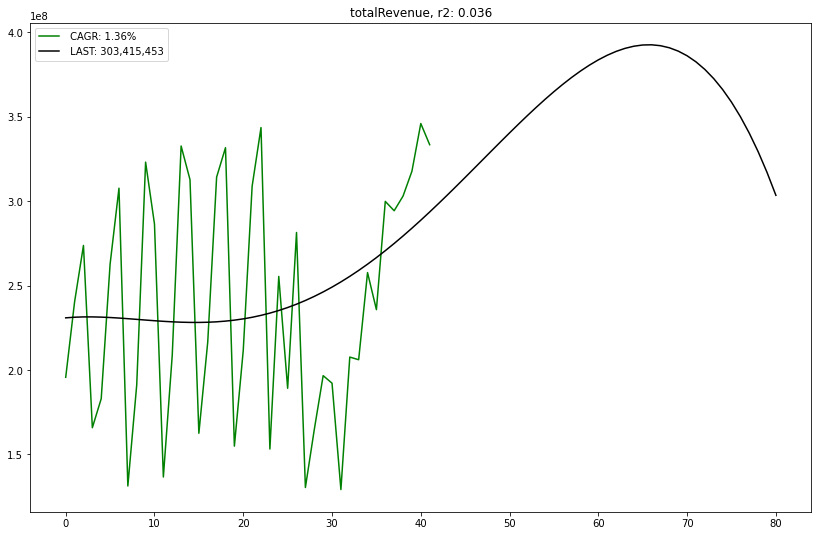

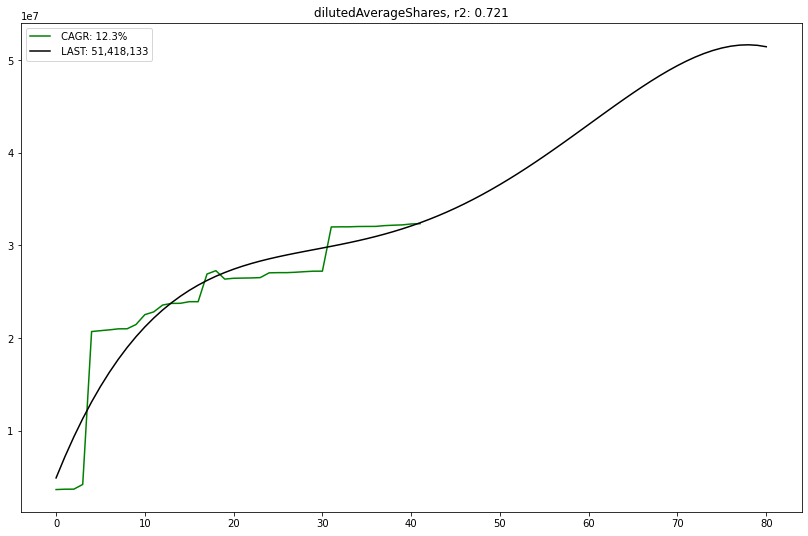

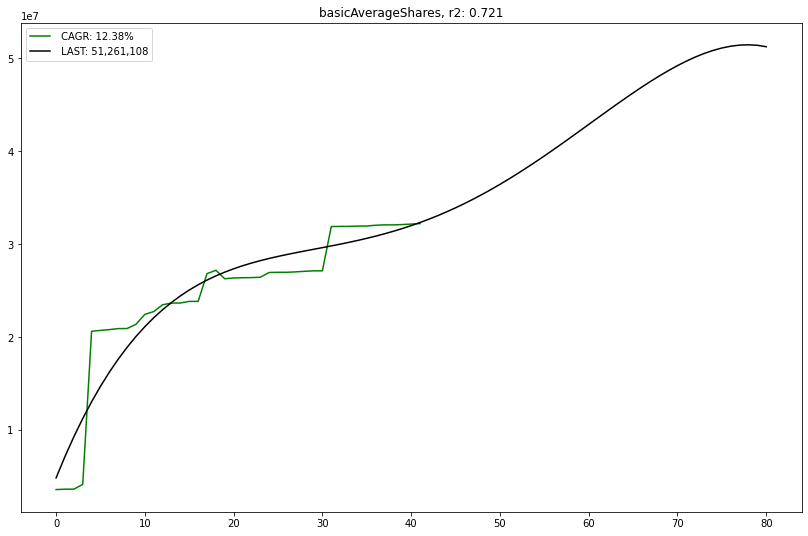

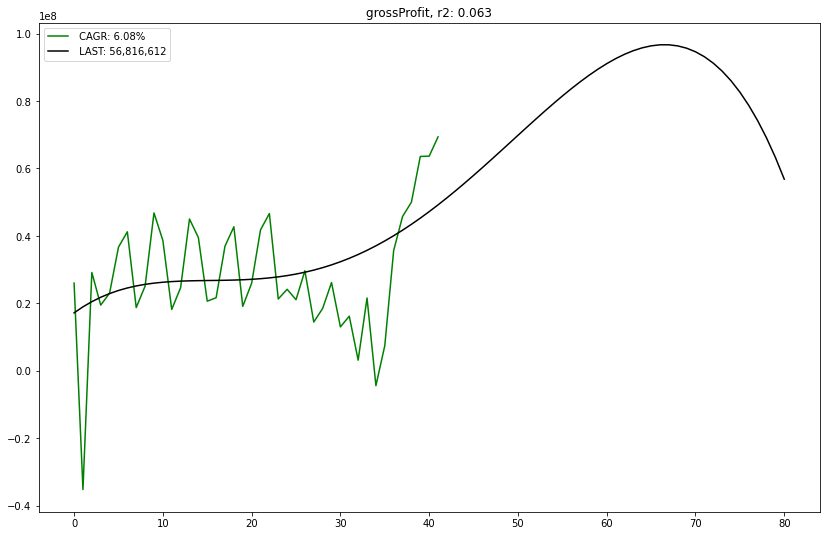

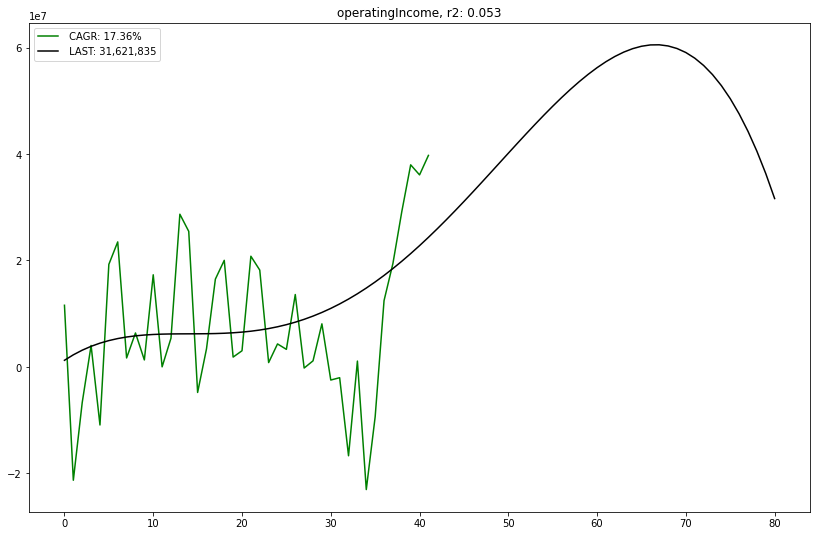

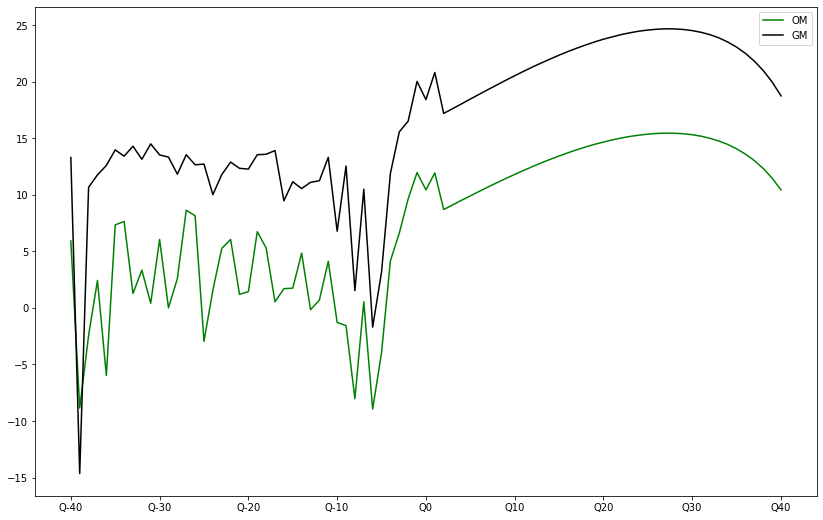

Extrapolating Previous EDs

BLBD US grossProfit / totalRevenue saved...
BLBD US operatingIncome / totalRevenue saved...
BLBD US netIncome / totalRevenue saved...
BLBD US eBITDA / totalRevenue saved...

Tweaking algo general relations....

Enter YF Ticker: (empty to derive from Algo) 
Enter reporting frequency: (Y/y empty for quarterly) 


KeyError: 'BLBD'

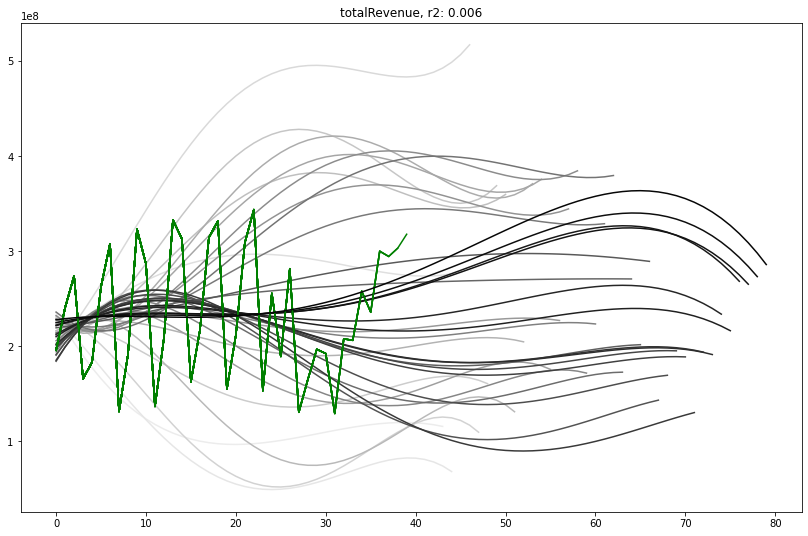

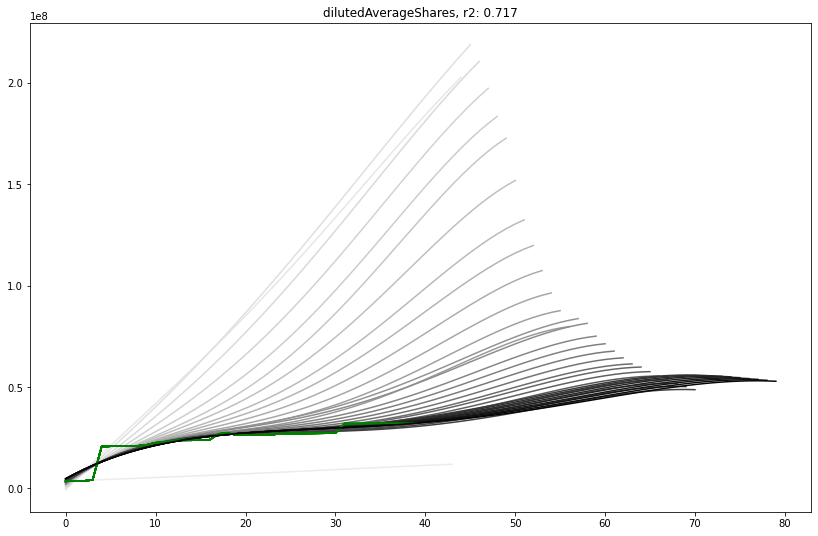

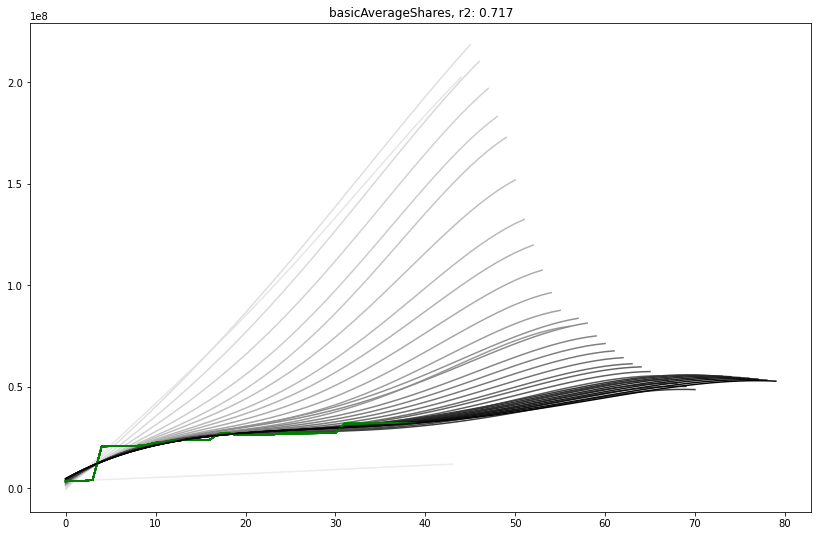

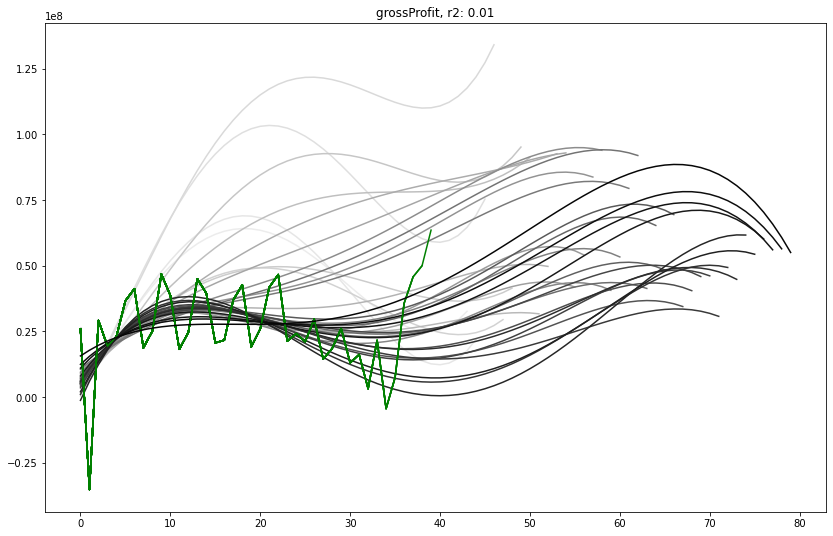

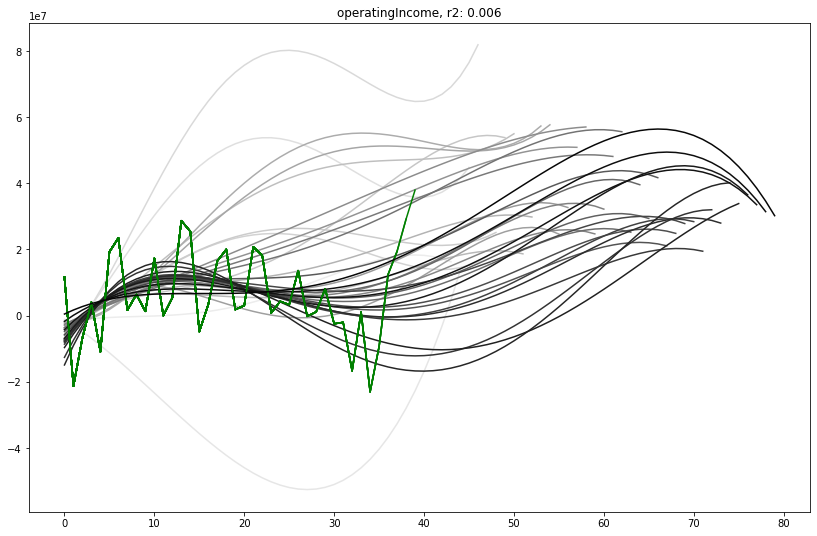

In [37]:
#REPLACES STOCK RELATIONS

#NON GAAP MEASURES: OPERATING INCOME, NET INCOME & OPERATING EXPENSES ONLY ********************

import pandas as pd
import math
import numpy as np
import os
import csv
import yfinance as yf
from yahoofinancials import YahooFinancials as yfs
#import mysql.connector
import matplotlib.pyplot as plt
import psycopg2
import requests
import json
import tkinter as tk
import re
import warnings
import joblib
from datetime import datetime
from datetime import timedelta
from datetime import date
from sqlalchemy import create_engine
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import ElasticNet
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import PolynomialFeatures
from sklearn.impute import SimpleImputer
from sklearn.pipeline import Pipeline
from sklearn.decomposition import PCA
from sklearn.ensemble import RandomForestRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score
from sklearn.base import BaseEstimator, TransformerMixin

def Average(lst):
    return sum(lst) / len(lst)

def Set_DF(dframe):
    
    dframe.index = dframe[dframe.columns.values.tolist()[0]]
    dframe.index.name = dframe.columns.values.tolist()[0]
    New_df = dframe.drop(dframe.columns.values.tolist()[0], axis=1)
    
    return New_df

def DD_Index(dframe):
    
    dframe['dummy'] = dframe.index
    dframe.drop_duplicates(['dummy'], inplace=True)
    dframe.drop('dummy', axis=1, inplace=True)
    New_df = dframe
    
    return New_df

def round_down(n, decimals = 0): 
    multiplier = 10 ** decimals 
    return int(math.floor(n * multiplier) / multiplier)

def round_up(n, decimals = 0): 
    multiplier = 10 ** decimals 
    return int(math.ceil(n * multiplier) / multiplier)

def Filter_df(tbf_df, merging_dates_list):
    
    filter_df = pd.DataFrame(merging_dates_list, columns=['Date'])
    merged_df = pd.merge(tbf_df, filter_df, on='Date')
    merged_df.index = filter_df['Date'] 
    merged_df.index.name = 'Date'
    merged_df.drop(['Date'], axis=1, inplace=True)
    
    return merged_df

def YF_Query_All(*args):
    
    report_dict = {'income': 'Statement', 'balance': 'Sheet', 'cash': 'flowStatement'}
    
    curr_report = args[0]
    ticker = args[1]
    freq = args[2]
    cap_freq = freq.capitalize()
    income_stat = ''
    
    try:
        data = yfs(ticker)
        income_stat = data.get_financial_stmts(frequency = freq, statement_type = curr_report)
    except:
        print('N/A for ' + ticker)
        
    return income_stat

def AV_Query(*args):
    
    url_1 = args[0]
    func = args[1]
    ticker = args[2]
    api_k = args[3]
    hor = args[4]
    if (hor == ''):
        url = url_1 + func + '&symbol=' + ticker + '&apikey=' + api_k
        resp = requests.get(url)
        y = json.loads(resp.content)
    else:
        url = url_1 + func + '&horizon=' + hor + '&apikey=' + api_k
        with requests.Session() as s:
            download = s.get(url)
            decoded_content = download.content.decode('utf-8')
            y = csv.reader(decoded_content.splitlines(), delimiter=',')

    return y

def on_selection(value):
    global choice
    choice = value  # store the user's choice
    root.destroy()  # close window 
    
def Inter_Feature(*args):
    
    Final_AF_df = args[0]
    reg_field = args[1]
    idx = args[2]
    margin = args[3] / 100
    last_rev = args[4]
    lt_g = args[5]
    last_q_data = args[6]
    color_code = args[7]
    
    or_len0 = len(Final_AF_df[reg_field].dropna().index)
    y_array = Final_AF_df[reg_field].dropna().values
    x_array = np.arange(or_len0).reshape(-1, 1)
    x_array_ext = np.arange(or_len0 + (40 - last_q_data)).reshape(-1, 1)

    lin_model = LinearRegression().fit(x_array, y_array)
    r_sq = lin_model.score(x_array, y_array)
    growth = lin_model.coef_[0]
    forecasts = lin_model.predict(x_array)
    adj_growth_01 = round(100 * r_sq * (growth * 4) / abs(forecasts[-1]), 2)
    adj_growth_02 = round(100 * r_sq * (growth * 4) / abs(forecasts.mean()), 2)
    lt_gr_01 = (1 / g_smooth_factor) * adj_growth_01
    lt_gr_02 = (1 / g_smooth_factor) * adj_growth_02
    if (lt_g != ''):
        lt_gr = min(float(lt_g), lt_gr_01, lt_gr_02)

    or_len0 = len(x_array)
    x_array_ext1 = (np.arange(8) + 1 + last_q_data)
    x_array_ext2 = (np.arange(10) + 31)

    y_array_ext1 = (y_array[-1] + (x_array_ext1 - last_q_data) * growth)
    y_array_ext2 = (y_array_ext1[-1] * (1 + (x_array_ext2 - x_array_ext1[-1]) * (lt_gr / 100)))

    if (margin != 0):
        last_input_anchor = last_rev * margin
        y_array_ext2 = y_array_ext2 * (last_input_anchor / y_array_ext2[-1])

    final_x_list = np.arange(or_len0).tolist() + (x_array_ext1 + or_len0 - 1 - last_q_data).tolist() + (x_array_ext2 + or_len0 - 1 - last_q_data).tolist()
    final_y_list = y_array.tolist() + y_array_ext1.tolist() + y_array_ext2.tolist()

    final_x_array = np.array(final_x_list)
    final_y_array = np.array(final_y_list)

    poly_X = poly_features.fit_transform(final_x_array.reshape(-1, 1))
    poly_X_ext = poly_features.fit_transform(x_array_ext)
    poly_model = lin_reg.fit(poly_X, final_y_array)
    final_forecasts = poly_model.predict(poly_X_ext)

    Return_df = pd.DataFrame(final_forecasts, index = np.arange(len(final_forecasts)) - or_len0 + 1 + last_q_data, columns = [reg_field])
    Return_df.index = Return_df.T.columns.map(lambda x: 'Q' + str(x))

    cagr = 0
    if (final_forecasts[-1] > final_forecasts[0]):
        cagr = ((final_forecasts[-1] - final_forecasts[0]) / abs(final_forecasts[0]) + 1) ** (4 / len(final_forecasts)) - 1    

    plt.figure(idx, figsize = (14, 9))
    plt.plot(np.arange(or_len0), Final_AF_df[reg_field].dropna(), c = 'g', label = ' CAGR: ' + str(round(100 * cagr, 2)) + '%')
    plt.plot(np.arange(len(final_forecasts)), pd.DataFrame(final_forecasts, columns = ['Forecasts'])['Forecasts'], c = str(color_code), label = ' LAST: ' + str("{:,.0f}".format(int(final_forecasts[-1]))))
    if (color_code == 0):
        plt.legend(loc = 'best')
    plt.title(reg_field + ', r2: ' + str(round(r_sq, 3)))
    
    return Return_df, r_sq

dbase = "visiblealpha_laptop"
dbase_metrics = "metrics_laptop"
AVapi_key = 'THL7JKMG0IEOI16R' 

conn = psycopg2.connect(host="localhost", user="postgres", password="akf7a7j5", dbname=dbase, port=5432)
cursor = conn.cursor()
cursor.execute("select relname from pg_class where relkind='r' and relname !~ '^(pg_|sql_)';")
tables_list = cursor.fetchall()
new_tables_list = list(pd.DataFrame(tables_list, columns=['Old'])['Old'])

conn = psycopg2.connect(host="localhost", user="postgres", password="akf7a7j5", dbname=dbase_metrics, port=5432)
cursor = conn.cursor()
cursor.execute("select relname from pg_class where relkind='r' and relname !~ '^(pg_|sql_)';")
tables_list = cursor.fetchall()
new_tables_list_metrics = list(pd.DataFrame(tables_list, columns=['Old'])['Old'])

cnxn_string = ("postgresql+psycopg2://{username}:{pswd}"
              "@{host}:{port}/{database}")

engine = create_engine(cnxn_string.format(
    username="postgres",
    pswd="akf7a7j5",
    host="localhost",
    port=5432,
    database=dbase))

engine_metrics = create_engine(cnxn_string.format(
    username="postgres",
    pswd="akf7a7j5",
    host="localhost",
    port=5432,
    database=dbase_metrics))

p_degree = 4
g_smooth_factor = 3
lin_reg = LinearRegression()
poly_features = PolynomialFeatures(degree = p_degree, include_bias = False)
today = date.today()

stock = ''
horizon = '12month'
current_report = 'EARNINGS_CALENDAR'
earnings_all = AV_Query(AVurl_root, current_report, stock, AVapi_key, horizon)
eps_f = list(earnings_all)
EPS_F_df = pd.DataFrame(eps_f)
EPS_F_df.columns = EPS_F_df.iloc[0]
EPS_F_df.index = EPS_F_df[EPS_F_df.columns[0]]
EPS_F_df.drop(EPS_F_df.index[0], inplace = True)
EPS_F_df.drop(EPS_F_df.columns[0], axis = 1, inplace = True)
EPS_F_df = EPS_F_df[EPS_F_df['estimate'] != '']
EPS_F_df.drop_duplicates(subset = 'name', inplace = True)

query_iscode = "SELECT * FROM is_codes"
iscodes_df = pd.read_sql_query(query_iscode, engine)
iscodes_df = Set_DF(iscodes_df)
iscodes_df = DD_Index(iscodes_df)

query_prices = 'SELECT * FROM prices_relation'    
Prices_df = pd.read_sql_query(query_prices, engine)
Prices_df = Set_DF(Prices_df)
Prices_df = DD_Index(Prices_df)
Prices_df.sort_index(inplace = True)
if (today not in Prices_df.index):
    Prices_df.loc[today] = Prices_df.iloc[-1]

query_port = "SELECT * FROM port_db"
Port_Select_DF = pd.read_sql_query(query_port, engine)
Port_Select_DF = Set_DF(Port_Select_DF)
Port_Select_DF = DD_Index(Port_Select_DF)

reports_list_av = iscodes_df[(iscodes_df['AlphaVantage URL'] == 'INCOME_STATEMENT') & (iscodes_df['AlphaVantage Field'].replace({None: 'z'}) != 'z' )]['AlphaVantage Field'].replace({None: ''}).values.tolist()
reports_list_yf = iscodes_df[(iscodes_df['YahooFinancials URL'] == 'income') & (iscodes_df['YahooFinancials Field'].replace({None: 'z'}) != 'z' )]['YahooFinancials Field'].replace({None: ''}).values.tolist()
reports_list_calc = iscodes_df[(iscodes_df['YahooFinancials URL'] == 'calc') & (iscodes_df['YahooFinancials Field'].replace({None: 'z'}) != 'z' )]['Line Description'].replace({None: ''}).values.tolist()
complement_av = [field for field in reports_list_yf if field not in iscodes_df[iscodes_df['AlphaVantage URL'] == 'INCOME_STATEMENT']['YahooFinancials Field'].values.tolist()]

yearly_adjustable_reports_list = ['totalRevenue', 'grossProfit', 'sellingGeneralAndAdministration', 'researchAndDevelopment', 'operatingExpense', 'operatingIncome', 'netIncome']
gng_adjustable_reports_list = ['grossProfit', 'operatingExpense', 'operatingIncome', 'netIncome']
next_reports_list01 = ['dilutedEPS', 'basicEPS']
next_reports_list02 = ['totalRevenue']
next_reports_list03 = ['operatingIncome', 'netIncome']
next_reports_list04 = ['grossProfit', 'sellingGeneralAndAdministration', 'researchAndDevelopment', 'operatingExpense']
batch_01 = ['totalRevenue', 'dilutedAverageShares', 'basicAverageShares', 'grossProfit', 'operatingIncome']
graph_count = 0

rem_ticker = ''
while (rem_ticker not in Prices_df.columns) & (rem_ticker != 'Q'):
    rem_ticker = input('Enter stock to be removed: (algo ticker or Q/q to quit) ').upper()
    if (rem_ticker in Port_Select_DF.values):
        cont = input('Stock in selection database! Continue? (Y/y or empty) ').upper()
        if (cont != 'Y'):
            rem_ticker = ''  
feu_vert = True
if (rem_ticker != 'Q'):
    check_new = True
    while (check_new):
        new_ticker = input('Enter ALGO ticker (new): ').upper()
        sql_new = re.sub(r'[^a-z_^0-9]', '', new_ticker.lower())
        if (sql_new in new_tables_list):
            dbl_check = input('New ticker already exists, override? (Y/y, Q/q to quit or empty) ').upper()
            if (dbl_check == 'Y'):
                check_new = False
            if (dbl_check == 'Q'):
                check_new = False
                feu_vert = False
        else:
            check_new = False
    
    if (feu_vert):
        sql_old = re.sub(r'[^a-z_^0-9]', '', rem_ticker.lower())    
        ticker_slim = new_ticker.split(' ')[0]    

        LT_gm = float(input('Enter LT model Gross Margin (%): '))
        LT_om = float(input('Enter LT model Op Margin (%): '))
        LT_growth = input('Enter LT model Growth (%): (empty for implied) ')
        margin_list = [0, 0, 0, LT_gm, LT_om]
        margin_dic = {'totalRevenue':0, 'dilutedAverageShares':0, 'basicAverageShares':0, 'grossProfit':LT_gm, 'operatingIncome':LT_om}
        print('')

        av_available = True
        frequency = 'quarterly'
        horizon = ''
        current_report = 'EARNINGS'
        try:
            earnings_ticker = AV_Query(AVurl_root, current_report, ticker_slim, AVapi_key, horizon)
            TickerER_df = list(earnings_ticker[frequency + 'Earnings'])
            TickerER_df = pd.DataFrame(TickerER_df)
            TickerER_df['fiscalDateEnding'] = TickerER_df['fiscalDateEnding'].map(lambda x: datetime.strptime(x, '%Y-%m-%d').date())
            TickerER_df['reportedDate'] = TickerER_df['reportedDate'].map(lambda x: datetime.strptime(x, '%Y-%m-%d').date())
            TickerER_df.index = TickerER_df['fiscalDateEnding']
            TickerER_df.index.name = ''
            for idx, rep_eps in enumerate(TickerER_df['reportedEPS'].values.tolist()):
                if (rep_eps == 'None'):
                    input_eps = input('Enter NG EPSd for ' + TickerER_df.index[idx].strftime('%Y-%B-%d') + ' QTR: ')
                    TickerER_df.loc[TickerER_df.index[idx], 'reportedEPS'] = input_eps
        except:
            av_available = False

        is_av_on = True
        is_yf_on = True
        current_report = 'INCOME_STATEMENT'
        current_values_AV = AV_Query(AVurl_root, current_report, ticker_slim, AVapi_key, horizon)
        current_values_YF = YF_Query_All('income', ticker_slim, frequency)
        yf_push = ''
        yf_push = input('Force YahooFinance? (Y/y or empty) ').upper()

        if (current_values_AV == {}) | (yf_push == 'Y'):
            is_av_on = False
        else:
            reports_list = reports_list_av.copy()
            current_values = current_values_AV.copy()
            chosen_field = 'AlphaVantage Field'

        if (current_values_YF['incomeStatementHistory' + frequency.capitalize()][ticker_slim] == []):
            is_yf_on = False
        else:
            if (not is_av_on):
                reports_list = reports_list_yf.copy()
                chosen_field = 'YahooFinancials Field'
                current_values = current_values_YF.copy()

        OpEx = 'operatingExpense'
        SGnA = 'sellingGeneralAndAdministration'
        ebitda = 'eBITDA'    
        if (is_yf_on):
            AllFields_df = pd.DataFrame(np.nan, index = pd.Index(['dummy'], name = 'Dates'), columns = reports_list)
            if (is_av_on):
                gng_adjustable_reports_list = pd.DataFrame(gng_adjustable_reports_list)[0].map(lambda x: iscodes_df['AlphaVantage Field'].iloc[iscodes_df['YahooFinancials Field'].values.tolist().index(x)]).values.tolist()
                next_reports_list04 = pd.DataFrame(next_reports_list04)[0].map(lambda x: iscodes_df['AlphaVantage Field'].iloc[iscodes_df['YahooFinancials Field'].values.tolist().index(x)]).values.tolist()            
                OpEx = 'operatingExpenses'
                SGnA = 'sellingGeneralAndAdministrative'
                ebitda = 'ebitda'
                  
                AllFields_df = pd.DataFrame(current_values['quarterlyReports'])
                AllFields_df.index = AllFields_df['fiscalDateEnding']
                AllFields_df.index = AllFields_df.T.columns.map(lambda x: datetime.strptime(x, '%Y-%m-%d').date())
                AllFields_df.sort_index(inplace = True)
                TickerER_df = TickerER_df[TickerER_df.index <= AllFields_df.dropna().index[-1]]
                
                AllFields_df_AUX = AllFields_df.join(TickerER_df['fiscalDateEnding'], rsuffix = '_aux')
                AllFields_df.index = AllFields_df_AUX['fiscalDateEnding_aux']
                AllFields_df.index.name = ''
                               
                AllFields_df = AllFields_df[reports_list_av].replace({'None': np.nan}).fillna(method = 'bfill').astype(float)
                AllFields_df.sort_index(inplace = True) 

                Complement_df = pd.DataFrame(np.nan, index = pd.Index(['dummy'], name = 'Dates'), columns = complement_av)
                for element in current_values_YF['incomeStatementHistory' + frequency.capitalize()][ticker_slim]:
                    Element_df = pd.DataFrame(element)
                    current_list_yf = [field for field in complement_av if field in Element_df.index]
                    Element_df = Element_df.loc[current_list_yf]
                    Complement_df = pd.concat([Complement_df, Element_df.T])
                Complement_df.drop(['dummy'], inplace = True)
                Complement_df.index = Complement_df.T.columns.map(lambda x: datetime.strptime(x, '%Y-%m-%d').date())
                AllFields_df = AllFields_df.join(Complement_df) 

                current_report = 'BALANCE_SHEET'
                bs_ticker = AV_Query(AVurl_root, current_report, ticker_slim, AVapi_key, horizon)
                bu_bs_df = pd.DataFrame(bs_ticker['quarterlyReports'])
                try:
                    bu_bs_df = bu_bs_df.replace({'None': np.nan}).dropna(subset = ['totalAssets'])
                except:
                    pass
                                
                bs_df = bu_bs_df.copy()                
                bs_df.index = bs_df['fiscalDateEnding'].map(lambda x: datetime.strptime(x, '%Y-%m-%d').date())
                TickerER_df = TickerER_df[TickerER_df.index >= bs_df.index[-1]]
                dt_list = [dt for dt in bs_df.index if dt in TickerER_df.index]
                bs_df = bs_df.loc[dt_list]                
                                
                bs_df.index = TickerER_df.index.values.tolist()[::-1][-len(bs_df.index):][::-1]
                bs_df.name = ''
                AllFields_df = AllFields_df.join(bs_df['commonStockSharesOutstanding'])
                AllFields_df['dilutedAverageShares'] = AllFields_df['commonStockSharesOutstanding'].astype(float)
                AllFields_df.drop(['commonStockSharesOutstanding'], axis = 1, inplace = True)
                AllFields_df.dropna(subset = ['dilutedAverageShares'], inplace = True)
                
                AllFields_df = AllFields_df.join(TickerER_df['reportedEPS'])
                AllFields_df['dilutedEPS Non-GAAP'] = np.nan
                AllFields_df['dilutedEPS Non-GAAP'] = AllFields_df['reportedEPS'].astype(float)
                AllFields_df.drop(['reportedEPS'], axis = 1, inplace = True)

                AllFields_df['dilutedEPS'] = AllFields_df['dilutedEPS'].replace({np.nan: 'z'})
                AllFields_df['basicEPS'] = AllFields_df['basicEPS'].replace({np.nan: 'z'})
                AllFields_df['basicAverageShares'] = AllFields_df['basicAverageShares'].replace({np.nan: 'z'})
                AllFields_df['sellingAndMarketingExpense'] = AllFields_df['sellingAndMarketingExpense'].replace({np.nan: 'z'})
                if (AllFields_df['dilutedEPS'].iloc[0] == 'z'):
                    geps_mean = AllFields_df['dilutedEPS'][AllFields_df['dilutedEPS'] != 'z'].mean()
                    ngeps_mean = AllFields_df['dilutedEPS Non-GAAP'][AllFields_df['dilutedEPS'] != 'z'].mean()
                    gng_adj = ngeps_mean - geps_mean
                    full_derived_gseries = AllFields_df['dilutedEPS Non-GAAP'].values - gng_adj
                    full_original_gseries = AllFields_df['dilutedEPS'].replace({'z': np.nan}).values
                    aux_vector_1 = full_original_gseries - 100000000
                    aux_vector_2 = pd.Series(aux_vector_1).replace({np.nan: 1}).clip(0, 100000000).values
                    amended_gseries = aux_vector_2 * full_derived_gseries + pd.Series(full_original_gseries).replace({np.nan: 0}).values
                    AllFields_df['dilutedEPS'] = amended_gseries.tolist()
                if (AllFields_df['basicEPS'].iloc[0] == 'z'):
                    geps_mean = AllFields_df['basicEPS'][AllFields_df['basicEPS'] != 'z'].mean()
                    ngeps_mean = AllFields_df['dilutedEPS Non-GAAP'][AllFields_df['basicEPS'] != 'z'].mean()
                    gng_adj = ngeps_mean - geps_mean
                    full_derived_gseries = AllFields_df['dilutedEPS Non-GAAP'].values - gng_adj
                    full_original_gseries = AllFields_df['basicEPS'].replace({'z': np.nan}).values
                    aux_vector_1 = full_original_gseries - 100000000
                    aux_vector_2 = pd.Series(aux_vector_1).replace({np.nan: 1}).clip(0, 100000000).values
                    amended_gseries = aux_vector_2 * full_derived_gseries + pd.Series(full_original_gseries).replace({np.nan: 0}).values
                    AllFields_df['basicEPS'] = amended_gseries.tolist()                    
                if (AllFields_df['basicAverageShares'].iloc[0] == 'z'):
                    geps_mean = AllFields_df['basicAverageShares'][AllFields_df['basicAverageShares'] != 'z'].mean()
                    ngeps_mean = AllFields_df['dilutedAverageShares'][AllFields_df['basicAverageShares'] != 'z'].mean()
                    gng_adj = ngeps_mean - geps_mean
                    full_derived_gseries = AllFields_df['dilutedAverageShares'].values - gng_adj
                    full_original_gseries = AllFields_df['basicAverageShares'].replace({'z': np.nan}).values
                    aux_vector_1 = full_original_gseries - 100000000000000
                    aux_vector_2 = pd.Series(aux_vector_1).replace({np.nan: 1}).clip(0, 100000000000000).values
                    amended_gseries = aux_vector_2 * full_derived_gseries + pd.Series(full_original_gseries).replace({np.nan: 0}).values
                    AllFields_df['basicAverageShares'] = amended_gseries.tolist()                    
                if (AllFields_df['sellingAndMarketingExpense'].value_counts()[0] < len(AllFields_df['sellingAndMarketingExpense'])):
                    if (AllFields_df['sellingAndMarketingExpense'].iloc[0] == 'z'):
                        geps_mean = AllFields_df['sellingAndMarketingExpense'][AllFields_df['sellingAndMarketingExpense'] != 'z'].mean()
                        ngeps_mean = AllFields_df['sellingGeneralAndAdministrative'][AllFields_df['sellingAndMarketingExpense'] != 'z'].mean()
                        gng_adj = ngeps_mean - geps_mean
                        full_derived_gseries = AllFields_df['sellingGeneralAndAdministrative'].values - gng_adj
                        full_original_gseries = AllFields_df['sellingAndMarketingExpense'].replace({'z': np.nan}).values
                        aux_vector_1 = full_original_gseries - 100000000
                        aux_vector_2 = pd.Series(aux_vector_1).replace({np.nan: 1}).clip(0, 100000000).values
                        amended_gseries = aux_vector_2 * full_derived_gseries + pd.Series(full_original_gseries).replace({np.nan: 0}).values
                        AllFields_df['sellingAndMarketingExpense'] = amended_gseries.tolist()                                                                          
                else:
                    AllFields_df['sellingAndMarketingExpense'] = 0
                AllFields_df['basicEPS Non-GAAP'] = np.nan
                AllFields_df['basicEPS Non-GAAP'] = AllFields_df['dilutedEPS Non-GAAP'] + (AllFields_df['basicEPS'] - AllFields_df['dilutedEPS'])            

            else:
                for element in current_values['incomeStatementHistory' + frequency.capitalize()][ticker_slim]:
                    Element_df = pd.DataFrame(element)
                    current_list_yf = [field for field in reports_list if field in Element_df.index]
                    Element_df = Element_df.loc[current_list_yf]
                    AllFields_df = pd.concat([AllFields_df, Element_df.T])
                AllFields_df.drop(['dummy'], inplace = True)
                AllFields_df.sort_index(inplace = True)

            if (chosen_field == 'YahooFinancials Field'):
                ## QUARTERLY ADJ
                for field in yearly_adjustable_reports_list:
                    Current_df = pd.DataFrame(AllFields_df[field].values, index = (np.arange(len(AllFields_df.index)) + 1 - len(AllFields_df.index)).astype(str).tolist(), columns = [field])
                    Current_df['Delta'] = round(100 * (Current_df[field] - Current_df[field].shift(1)) / abs(Current_df[field].shift(1)), 2)
                    Current_df.index = Current_df.T.columns.map(lambda x: 'Q' + x)
                    print(Current_df)
                    print('')
                    t_choice_list = Current_df.index.values.tolist()
                    t_choice_list.append('None')
                    root = tk.Tk()
                    tkvar = tk.StringVar(root)
                    popupMenu = tk.OptionMenu(root, tkvar, *t_choice_list, command = on_selection)
                    tk.Label(root, text = field + " ADJ start: ").grid(row = 0, column = 0)
                    popupMenu.grid(row = 1, column = 0)
                    root.mainloop()
                    if (choice != 'None'):
                        last_qtr = Current_df.index[0]
                        last = int(last_qtr[-1])
                        remaining = 4 - len(Current_df.loc[:choice].index)
                        while (remaining > 0):
                            last = last + 1
                            remaining = remaining - 1
                            new_qtr = 'Q-' + str(last)
                            new_input = float(input('Enter GAAP ' + field + ' for ' + new_qtr + ' : (x1000) '))
                            print('')
                            revert = False
                            if (new_input != ''):
                                Current_df.loc[new_qtr] = np.nan
                                Current_df.loc[new_qtr, field] = new_input * 1000
                                Current_df['Index'] = Current_df.index
                                Current_df['Index'] = Current_df['Index'].map(lambda x: x.split('Q')[1]).astype(int)
                                Current_df.sort_values(by = ['Index'], inplace = True)
                                Current_df.drop(['Index'], axis = 1, inplace = True)
                            else:
                                revert = True
                        if (not revert):
                            for adj_qtr in Current_df.loc[choice:].index:
                                Current_df.loc[adj_qtr, field] = Current_df.loc[adj_qtr, field] - Current_df.iloc[(Current_df.index.values.tolist().index(adj_qtr) - 3): Current_df.index.values.tolist().index(adj_qtr)][field].sum()
                            Current_df['Delta'] = round(100 * (Current_df[field] - Current_df[field].shift(1)) / abs(Current_df[field].shift(1)), 2)
                            print(Current_df)
                            print('')
                            AllFields_df[field] = Current_df[field][last_qtr:].values.tolist()

                ## GAAP / NON GAAP ADJ
                AllFields_df['dilutedEPS Non-GAAP'] = np.nan
                for idx in AllFields_df.index[:-1]:
                    ngd_eps = input('Enter Non-GAAP diluted EPS for ' + idx + ' (GAAP: ' + str(AllFields_df.loc[idx, 'dilutedEPS']) + '): (empty to copy GAAP) ')
                    if (ngd_eps == ''):
                        AllFields_df.loc[idx, 'dilutedEPS Non-GAAP'] = AllFields_df.loc[idx, 'dilutedEPS']
                    else:
                        AllFields_df.loc[idx, 'dilutedEPS Non-GAAP'] = float(ngd_eps)
                AllFields_df.index = AllFields_df.T.columns.map(lambda x: datetime.strptime(x, '%Y-%m-%d').date())

            estimate_on = False
            if (ticker_slim in EPS_F_df.index):
                try:
                    ngd_est = float(EPS_F_df.loc[ticker_slim]['estimate'])
                    AllFields_df.loc[EPS_F_df.loc[ticker_slim]['fiscalDateEnding']] = np.nan
                    ngd_f = input('Confirm Next Non-GAAP EPSd estimate (empty) or enter new: (suggested: ' + str(ngd_est) + ') ')
                    if (ngd_f != ''):
                        ngd_est = float(ngd_f)
                    estimate_on = True
                except:
                    print('No NG dEPS estimate...')
            AllFields_df.loc[AllFields_df.index[-1], 'dilutedEPS Non-GAAP'] = ngd_est

            print('')
            if (estimate_on):
                lag_last = -2
            else:
                lag_last = -1
            last_gng_adj = (AllFields_df.iloc[lag_last]['dilutedEPS Non-GAAP'] - AllFields_df.iloc[lag_last]['dilutedEPS']) * AllFields_df.iloc[lag_last]['dilutedAverageShares']   

            Final_AllFields_df = AllFields_df.copy()
            print('**GAAP / NON GAAP SELECTION**')
            print('')
            for rep_adj in gng_adjustable_reports_list:
                sig = 1
                if (rep_adj == OpEx):
                    sig = -1
                unadj = AllFields_df.loc[AllFields_df.index[lag_last], rep_adj]
                adj = unadj + sig * last_gng_adj
                print(Final_AllFields_df[rep_adj])
                print('')
                adj_s = input('Non GAAP adj for ' + rep_adj + ' ? (Y/y or empty, last raw: ' + str("{:,.2f}".format(unadj)) + ', last adj: ' + str("{:,.2f}".format(adj)) + ')').upper()
                if (adj_s == 'Y'):
                    Final_AllFields_df[rep_adj] = AllFields_df[rep_adj] + sig * (AllFields_df['dilutedEPS Non-GAAP'] - AllFields_df['dilutedEPS']) * AllFields_df['dilutedAverageShares']
                print('')

            if (estimate_on):
                print('**NEXT QUARTER FORECASTS**')
                print('')
                ng_epsd_est = Final_AllFields_df.loc[Final_AllFields_df.index[-1], 'dilutedEPS Non-GAAP']
                previous_ng_epsd = Final_AllFields_df.loc[Final_AllFields_df.index[-2], 'dilutedEPS Non-GAAP']
                last_rev = Final_AllFields_df.loc[Final_AllFields_df.index[-2], 'totalRevenue']
                try:
                    comp_qtr_rev = Final_AllFields_df.loc[Final_AllFields_df.index[-5], 'totalRevenue']
                    rev_hist_g = (last_rev / Final_AllFields_df.loc[Final_AllFields_df.index[-6], 'totalRevenue']) - 1
                except:
                    comp_qtr_rev = Final_AllFields_df.loc[Final_AllFields_df.index[-2], 'totalRevenue']
                    rev_hist_g = (last_rev / Final_AllFields_df.loc[Final_AllFields_df.index[-3], 'totalRevenue']) - 1
                try:
                    sc = Final_AllFields_df.loc[Final_AllFields_df.index[-2], 'dilutedAverageShares']
                    if (sc > 0):
                        pass
                    else:
                        sc = Final_AllFields_df.loc[Final_AllFields_df.index[-2], 'basicAverageShares']
                except:
                    sc = Final_AllFields_df.loc[Final_AllFields_df.index[-2], 'basicAverageShares']
                direct_ng_epsd_delta = (ng_epsd_est - previous_ng_epsd)
                direct_income_delta = direct_ng_epsd_delta * sc
                previous_nm = Final_AllFields_df.loc[Final_AllFields_df.index[-2], 'netIncome'] / last_rev

                ## DIRECT ADDITIVE UPDATES
                for curr_rep in next_reports_list01:
                    Final_AllFields_df.loc[Final_AllFields_df.index[-1], curr_rep] = Final_AllFields_df.loc[Final_AllFields_df.index[-2], curr_rep] + direct_ng_epsd_delta            

                ## REV SPECIFIC
                for curr_rep in next_reports_list02:
                    direct_rev_est = last_rev + direct_income_delta
                    margin_rev_est = last_rev + direct_income_delta / abs(previous_nm)
                    last_hist_est = comp_qtr_rev * (1 + rev_hist_g)

                    direct_g = round(100 * (direct_rev_est / last_rev - 1), 2)
                    margin_g = round(100 * (margin_rev_est / last_rev - 1), 2)
                    hist_g = round(100 * (last_hist_est / last_rev - 1), 2)

                    print('')
                    print('Suggested Next Rev, additive: ' + str("{:,.2f}".format(direct_rev_est)) + ', Seq Growth: ' + str(direct_g) + '%')
                    print('Suggested Next Rev, margin w: ' + str("{:,.2f}".format(margin_rev_est)) + ', Seq Growth: ' + str(margin_g) + '%')
                    print('Suggested Next Rev, hist: ' + str("{:,.2f}".format(last_hist_est)) + ', Seq Growth: ' + str(hist_g) + '%')
                    print('LAST: ' + str("{:,.2f}".format(last_rev)))
                    keep = True
                    while (keep):
                        rev_input = input('(A)dditive, (M)argin, (H)istoric or Manual Input (*1000)? ').upper()
                        if (rev_input == 'A'):
                            Final_AllFields_df.loc[Final_AllFields_df.index[-1], curr_rep] = direct_rev_est
                            keep = False
                        elif (rev_input == 'M'):
                            Final_AllFields_df.loc[Final_AllFields_df.index[-1], curr_rep] = margin_rev_est
                            keep = False
                        elif (rev_input == 'H'):
                            Final_AllFields_df.loc[Final_AllFields_df.index[-1], curr_rep] = last_hist_est
                            keep = False                    
                        else:
                            try:
                                Final_AllFields_df.loc[Final_AllFields_df.index[-1], curr_rep] = float(rev_input) * 1000                        
                                keep = False
                            except:
                                keep = True
                    final_rev_est = Final_AllFields_df.loc[Final_AllFields_df.index[-1], curr_rep]
                    seq_g = round(100 * ((float(final_rev_est) - last_rev) / abs(last_rev)), 2)
                    yoy_g = round(100 * ((float(final_rev_est) - comp_qtr_rev) / abs(comp_qtr_rev)), 2)
                    print('')
                    print('Sequential ' + curr_rep + ' Growth: ' + str(seq_g) + '%')
                    if (seq_g != yoy_g):
                        print('YoY ' + curr_rep + ' Growth: ' + str(yoy_g) + '%')

                    try:
                        base_p = Final_AllFields_df.loc[Final_AllFields_df.index[-6], curr_rep]
                        yoy_p = round(100 * ((last_rev - base_p) / abs(base_p)), 2)
                        print('YoY ' + curr_rep + ' Previous Growth: ' + str(yoy_p) + '%')
                    except:
                        pass
                    print('')

                ## INCOME ONLY
                for curr_rep in next_reports_list03:
                    last_input = Final_AllFields_df.loc[Final_AllFields_df.index[-2], curr_rep]
                    direct_est = last_input + direct_income_delta
                    direct_g = round(100 * ((direct_est - last_input) / abs(last_input)), 2)
                    previous_m = round(100 * (last_input / last_rev), 2) 
                    new_m = round(100 * (direct_est / final_rev_est), 2) 
                    print('')
                    print('Suggested ' + curr_rep + ': ' + str("{:,.2f}".format(direct_est)) + ', Seq Growth: ' + str(direct_g) + '%')
                    print('LAST: ' + str("{:,.2f}".format(last_input)))
                    print('Previous Margin: ' + str(previous_m) + '%' + ', New Margin: ' + str(new_m) + '%')
                    keep = True
                    while (keep):
                        inc_input = input('(S)uggested or Manual Input (*1000)? ').upper()
                        if (inc_input == 'S'):
                            Final_AllFields_df.loc[Final_AllFields_df.index[-1], curr_rep] = direct_est
                            keep = False
                        else:
                            try:
                                Final_AllFields_df.loc[Final_AllFields_df.index[-1], curr_rep] = float(inc_input) * 1000
                                new_m = round(100 * (float(inc_input) / final_rev_est), 2)
                                print('')
                                print('New ' + curr_rep + ' Margin: ' + str(new_m) + '%')
                                keep = False
                            except:
                                keep = True    
                    exp_ = Final_AllFields_df.loc[Final_AllFields_df.index[-1], curr_rep]
                    seq_g = round(100 * ((float(exp_) - last_input) / abs(last_input)), 2)
                    yoy_g = seq_g
                    try:
                        yoy_g = round(100 * ((float(exp_) - Final_AllFields_df.loc[Final_AllFields_df.index[-5], curr_rep]) / abs(Final_AllFields_df.loc[Final_AllFields_df.index[-5], curr_rep])), 2)
                    except:
                        pass
                    print('')
                    print('Sequential ' + curr_rep + ' Growth: ' + str(seq_g) + '%')
                    if (seq_g != yoy_g):
                        print('YoY ' + curr_rep + ' Growth: ' + str(yoy_g) + '%')

                    try:
                        base_p = Final_AllFields_df.loc[Final_AllFields_df.index[-6], curr_rep]
                        yoy_p = round(100 * ((last_input - base_p) / abs(base_p)), 2)
                        print('YoY ' + curr_rep + ' Previous Growth: ' + str(yoy_p) + '%')
                    except:
                        pass            
                    print('')            

                ## POTENTIALLY REV DEPENDENT (PROPORTIONAL OR NEW)
                for curr_rep in next_reports_list04:
                    last_input = Final_AllFields_df.loc[Final_AllFields_df.index[-2], curr_rep]
                    rev_est = last_input * (final_rev_est / last_rev)            
                    rev_g = round(100 * ((rev_est - last_input) / abs(last_input)), 2)
                    previous_m = round(100 * (last_input / last_rev ), 2) 
                    new_m = round(100 * (rev_est / final_rev_est), 2) 
                    print('')
                    print('Suggested ' + curr_rep + ': ' + str("{:,.2f}".format(rev_est)) + ', Seq Growth: ' + str(rev_g) + '%')
                    print('LAST: ' + str("{:,.2f}".format(last_input)))
                    print('Previous Margin: ' + str(previous_m) + '%' + ', New Margin: ' + str(new_m) + '%')
                    keep = True
                    while (keep):
                        inc_input = input('(S)uggested or Manual Input (*1000)? ').upper()
                        if (inc_input == 'S'):
                            Final_AllFields_df.loc[Final_AllFields_df.index[-1], curr_rep] = rev_est
                            keep = False
                        else:
                            try:
                                Final_AllFields_df.loc[Final_AllFields_df.index[-1], curr_rep] = float(inc_input) * 1000
                                new_m = round(100 * (float(inc_input) / final_rev_est), 2)
                                print('')
                                print('New ' + curr_rep + ' Margin: ' + str(new_m) + '%')
                                keep = False
                            except:
                                keep = True                          
                    exp_ = Final_AllFields_df.loc[Final_AllFields_df.index[-1], curr_rep]
                    seq_g = round(100 * ((float(exp_) - last_input) / abs(last_input)), 2)
                    yoy_g = seq_g
                    try:
                        yoy_g = round(100 * ((float(exp_) - Final_AllFields_df.loc[Final_AllFields_df.index[-5], curr_rep]) / abs(Final_AllFields_df.loc[Final_AllFields_df.index[-5], curr_rep])), 2)
                    except:
                        pass
                    print('')
                    print('Sequential ' + curr_rep + ' Growth: ' + str(seq_g) + '%')
                    if (seq_g != yoy_g):
                        print('YoY ' + curr_rep + ' Growth: ' + str(yoy_g) + '%')

                    try:
                        base_p = Final_AllFields_df.loc[Final_AllFields_df.index[-6], curr_rep]
                        yoy_p = round(100 * ((last_input - base_p) / abs(base_p)), 2)
                        print('YoY ' + curr_rep + ' Previous Growth: ' + str(yoy_p) + '%')
                    except:
                        pass                
                    print('')                         

                if ('costOfRevenue' in Final_AllFields_df.columns):
                    if (Final_AllFields_df.loc[Final_AllFields_df.index[-2], 'costOfRevenue'] >= 0) | (Final_AllFields_df.loc[Final_AllFields_df.index[-2], 'costOfRevenue'] <= 0):
                        Final_AllFields_df.loc[Final_AllFields_df.index[-1], 'costOfRevenue'] = Final_AllFields_df.loc[Final_AllFields_df.index[-1], 'totalRevenue'] - Final_AllFields_df.loc[Final_AllFields_df.index[-1], 'grossProfit']
                if (ebitda in Final_AllFields_df.columns):
                    if (Final_AllFields_df.loc[Final_AllFields_df.index[-2], ebitda] >= 0) | (Final_AllFields_df.loc[Final_AllFields_df.index[-2], ebitda] <= 0):                
                        Final_AllFields_df.loc[Final_AllFields_df.index[-1], ebitda] = Final_AllFields_df.loc[Final_AllFields_df.index[-2], ebitda] + (Final_AllFields_df.loc[Final_AllFields_df.index[-1], 'netIncome'] - Final_AllFields_df.loc[Final_AllFields_df.index[-2], 'netIncome'])
                if ('dilutedAverageShares' in Final_AllFields_df.columns):
                    if (Final_AllFields_df.loc[Final_AllFields_df.index[-2], 'dilutedAverageShares'] >= 0) | (Final_AllFields_df.loc[Final_AllFields_df.index[-2], 'dilutedAverageShares'] <= 0):                
                        Final_AllFields_df.loc[Final_AllFields_df.index[-1], 'dilutedAverageShares'] = Final_AllFields_df.loc[Final_AllFields_df.index[-2], 'dilutedAverageShares'] + (Final_AllFields_df.loc[Final_AllFields_df.index[-2], 'dilutedAverageShares'] - Final_AllFields_df.loc[Final_AllFields_df.index[-3], 'dilutedAverageShares'])
                if ('basicAverageShares' in Final_AllFields_df.columns):
                    if (Final_AllFields_df.loc[Final_AllFields_df.index[-2], 'basicAverageShares'] >= 0) | (Final_AllFields_df.loc[Final_AllFields_df.index[-2], 'basicAverageShares'] <= 0):                
                        Final_AllFields_df.loc[Final_AllFields_df.index[-1], 'basicAverageShares'] = Final_AllFields_df.loc[Final_AllFields_df.index[-2], 'basicAverageShares'] + (Final_AllFields_df.loc[Final_AllFields_df.index[-2], 'basicAverageShares'] - Final_AllFields_df.loc[Final_AllFields_df.index[-3], 'basicAverageShares'])
                if ('sellingAndMarketingExpense' in Final_AllFields_df.columns):
                    if (Final_AllFields_df.loc[Final_AllFields_df.index[-2], 'sellingAndMarketingExpense'] >= 0) | (Final_AllFields_df.loc[Final_AllFields_df.index[-2], 'sellingAndMarketingExpense'] <= 0):                
                        Final_AllFields_df.loc[Final_AllFields_df.index[-1], 'sellingAndMarketingExpense'] = Final_AllFields_df.loc[Final_AllFields_df.index[-2], 'sellingAndMarketingExpense'] * (final_rev_est / last_rev)
                try:
                    Final_AllFields_df['basicEPS Non-GAAP'] = Final_AllFields_df['basicEPS'] + (Final_AllFields_df['dilutedEPS Non-GAAP'] - Final_AllFields_df['dilutedEPS'])
                except:
                    pass

            field_list = Final_AllFields_df.columns.values.tolist()
            Final_AllFields_df.index = np.arange(len(Final_AllFields_df.index)) - len(Final_AllFields_df.index) + 2
            Final_AllFields_df.index = Final_AllFields_df.T.columns.map(lambda x: 'Q' + str(x))
            last_data_qtr = int(Final_AllFields_df.index[-1][1])

            All_FFinal_df = pd.DataFrame(np.nan, index = np.arange(81) - 40, columns = ['Dummy'])
            All_FFinal_df.index = All_FFinal_df.T.columns.map(lambda x: 'Q' + str(x))
            All_FFinal_df = All_FFinal_df.join(Final_AllFields_df)
            All_FFinal_df.drop(['Dummy'], axis = 1, inplace = True)

            batch_01 = [field for field in batch_01 if field in field_list]
            for i, reg_f in enumerate(batch_01):  
                m = margin_dic[reg_f]
                lr = All_FFinal_df.loc[All_FFinal_df.index[-1], 'totalRevenue']
                Feature_df, r2 = Inter_Feature(Final_AllFields_df, reg_f, graph_count, m, lr, LT_growth, last_data_qtr, 0)
                All_FFinal_df[reg_f] = All_FFinal_df[reg_f][:'Q1'].values.tolist() + Feature_df[reg_f]['Q2':].values.tolist() 
                graph_count = graph_count + 1

            plt.figure(graph_count, figsize = (14, 9))
            round(100 * All_FFinal_df['operatingIncome'] / All_FFinal_df['totalRevenue'], 2).plot(label = 'OM', c = 'g').legend(loc = 'best')
            round(100 * All_FFinal_df['grossProfit'] / All_FFinal_df['totalRevenue'], 2).plot(label = 'GM', c = 'k').legend(loc = 'best')        
            plt.show()
            graph_count = graph_count + 1

            if ('costOfRevenue' in field_list):
                All_FFinal_df['costOfRevenue'] = All_FFinal_df['totalRevenue'] - All_FFinal_df['grossProfit']
            if ('netIncome' in field_list):
                All_FFinal_df['netIncome'] = All_FFinal_df['netIncome'][:'Q1'].values.tolist() + (All_FFinal_df['operatingIncome']['Q2':].values + (All_FFinal_df.loc['Q1', 'netIncome'] - All_FFinal_df.loc['Q1', 'operatingIncome'])).tolist()
            if (ebitda in field_list):
                All_FFinal_df[ebitda] = All_FFinal_df[ebitda][:'Q1'].values.tolist() + (All_FFinal_df['operatingIncome']['Q2':].values + (All_FFinal_df.loc['Q1', ebitda] - All_FFinal_df.loc['Q1', 'operatingIncome'])).tolist()
            if (OpEx in field_list):
                All_FFinal_df[OpEx] = All_FFinal_df[OpEx][:'Q1'].values.tolist() + (All_FFinal_df['grossProfit']['Q2':].values - (All_FFinal_df['operatingIncome']['Q2':].values + All_FFinal_df['netIncome']['Q2':].values) / 2).tolist()
            if (SGnA in field_list):
                All_FFinal_df[SGnA] = All_FFinal_df[SGnA][:'Q1'].values.tolist() + (All_FFinal_df[OpEx]['Q2':].values * (All_FFinal_df.loc['Q1', SGnA] / All_FFinal_df.loc['Q1', OpEx])).tolist()
            if ('researchAndDevelopment' in field_list):
                All_FFinal_df['researchAndDevelopment'] = All_FFinal_df['researchAndDevelopment'][:'Q1'].values.tolist() + (All_FFinal_df[OpEx]['Q2':].values * (All_FFinal_df.loc['Q1', 'researchAndDevelopment'] / All_FFinal_df.loc['Q1', OpEx])).tolist()
            if ('sellingAndMarketingExpense' in field_list):
                All_FFinal_df['sellingAndMarketingExpense'] = All_FFinal_df['sellingAndMarketingExpense'][:'Q1'].values.tolist() + (All_FFinal_df[OpEx]['Q2':].values * (All_FFinal_df.loc['Q1', 'sellingAndMarketingExpense'] / All_FFinal_df.loc['Q1', OpEx])).tolist()
            if ('dilutedEPS Non-GAAP' in field_list):
                All_FFinal_df['dilutedEPS Non-GAAP'] = All_FFinal_df['dilutedEPS Non-GAAP'][:'Q1'].values.tolist() + (All_FFinal_df['netIncome']['Q2':].values / All_FFinal_df['dilutedAverageShares']['Q2':].values).tolist()
            if ('dilutedEPS' in field_list):
                All_FFinal_df['dilutedEPS'] = All_FFinal_df['dilutedEPS'][:'Q1'].values.tolist() + (All_FFinal_df['dilutedEPS Non-GAAP']['Q2':].values + (All_FFinal_df.loc['Q1', 'dilutedEPS'] - All_FFinal_df.loc['Q1', 'dilutedEPS Non-GAAP'])).tolist()
            if ('basicEPS' in field_list):
                All_FFinal_df['basicEPS'] = All_FFinal_df['basicEPS'][:'Q1'].values.tolist() + (All_FFinal_df['dilutedEPS Non-GAAP']['Q2':].values + (All_FFinal_df.loc['Q1', 'basicEPS'] - All_FFinal_df.loc['Q1', 'dilutedEPS Non-GAAP'])).tolist()
                if ('dilutedEPS Non-GAAP' in field_list):
                    All_FFinal_df['basicEPS Non-GAAP'] = All_FFinal_df['basicEPS'] + (All_FFinal_df['dilutedEPS Non-GAAP'] - All_FFinal_df['dilutedEPS'])

            All_FFinal_bu_df = All_FFinal_df.copy()
            if ('basicEPS Non-GAAP' in field_list):
                All_FFinal_df['basicEPS'] = All_FFinal_df['basicEPS Non-GAAP']
                All_FFinal_df.drop(['basicEPS Non-GAAP'], axis = 1, inplace = True)
            if ('dilutedEPS Non-GAAP' in field_list):
                All_FFinal_df['dilutedEPS'] = All_FFinal_df['dilutedEPS Non-GAAP']
                All_FFinal_df.drop(['dilutedEPS Non-GAAP'], axis = 1, inplace = True)  


            is_01 = pd.DataFrame(iscodes_df['AlphaVantage Field'].dropna().values, index = iscodes_df['AlphaVantage Field'].dropna().index, columns = ['Field'])
            is_02 = pd.DataFrame(iscodes_df['YahooFinancials Field'].dropna().values, index = iscodes_df['YahooFinancials Field'].dropna().index, columns = ['Field'])
            x_df = pd.concat([is_01, is_02])
            x_df.drop_duplicates(inplace = True)

            ff_list = All_FFinal_df.columns.values.tolist()
            ff_code_list = All_FFinal_df.columns.map(lambda x: x_df.index[x_df['Field'].values.tolist().index(x)]).astype(str).tolist()

            Records_df = pd.DataFrame('n', index = pd.Index(TickerER_df['reportedDate'][:(len(Final_AllFields_df.loc[:'Q0'].index) - 1)].values, name = 'Date'), columns = ff_code_list)                       
            Records_df = Records_df[Records_df.index < today]
            Records_df.sort_index(inplace = True)
            Records_df.index = Records_df.T.columns.map(lambda x: Prices_df[Prices_df.index >= x].index[1])

            for curr_field in ff_list:            
                try:
                    comp = iscodes_df['Line Description'].replace({None: ''}).iloc[iscodes_df[chosen_field].values.tolist().index(curr_field)]
                    code = str(iscodes_df.index[iscodes_df[chosen_field].values.tolist().index(curr_field)])
                except:
                    comp = iscodes_df['Line Description'].replace({None: ''}).iloc[iscodes_df['YahooFinancials Field'].values.tolist().index(curr_field)]            
                    code = str(iscodes_df.index[iscodes_df['YahooFinancials Field'].values.tolist().index(curr_field)])
                ticker_sql = re.sub(r'[^a-z^0-9]', '', new_ticker.lower())
                relation_name = ticker_sql + comp
                IS_df = pd.DataFrame(All_FFinal_df[curr_field]).T
                er_date_L = TickerER_df['reportedDate'].iloc[0]
                er_date_L = Prices_df[Prices_df.index >= er_date_L].index[1]
                IS_df = IS_df.rename(index = {curr_field: er_date_L})
                Add_lines_df = Final_AllFields_df[:'Q-1'].copy()

                for k, line in enumerate(Add_lines_df.index):
                    k = k + 1
                    er_date = TickerER_df['reportedDate'].iloc[k]
                    er_date = Prices_df[Prices_df.index >= er_date].index[1]
                    PV_list = IS_df.loc[er_date_L].shift(k)[:'Q0'].values.tolist()
                    PV_num = len(PV_list)
                    IS_df.loc[er_date] = PV_list + [np.nan] * (81 - PV_num)

                IS_df.sort_index(inplace = True)
                IS_df.to_sql(relation_name, engine, index = True, if_exists = 'replace')
                new_tables_list.append(relation_name)
                Records_df[code] = 'y'
            Records_df.to_sql(ticker_sql + '_records', engine, index = True, if_exists = 'replace')

            ## COMPLEMENTS PREVIOUS EARNINGS DATES 
            print('Extrapolating Previous EDs')
            print('')
            for idx, curr_report in enumerate(batch_01):  
                m = margin_dic[curr_report]
                report = sql_new + iscodes_df['Line Description'].replace({None: ''}).iloc[iscodes_df['YahooFinancials Field'].values.tolist().index(curr_report)]
                if (report in new_tables_list):
                    query_feature = 'SELECT * FROM ' + report
                    Feature_df = pd.read_sql_query(query_feature, engine)
                    Feature_df = Set_DF(Feature_df)
                    Feature_df = DD_Index(Feature_df)
                    if (curr_report != 'totalRevenue'):
                        query_Rev = 'SELECT * FROM ' + sql_new
                        Rev_df = pd.read_sql_query(query_Rev, engine)
                        Rev_df = Set_DF(Rev_df)
                        Rev_df = DD_Index(Rev_df)
                    else:
                        Rev_df = Feature_df.copy()
                    n_graphs = len(Feature_df.index[:-1])
                    for idx2, current_ed in enumerate(Feature_df.index[:-1]):
                        if (len(Feature_df.loc[current_ed][:'Q0'].dropna().index) > 3):
                            lr = Rev_df.loc[current_ed, 'Q40']
                            Previous_Feature_df = pd.DataFrame(Feature_df.loc[current_ed][:'Q0'].dropna().values, index = Feature_df.loc[current_ed][:'Q0'].dropna().index, columns = [curr_report])
                            Fcast_Feat_df = Inter_Feature(Previous_Feature_df, curr_report, graph_count, m, lr, LT_growth, 0, (1 - idx2 / n_graphs))[0]
                            Feature_df.loc[current_ed] = Feature_df.loc[current_ed][:'Q0'].values.tolist() + Fcast_Feat_df.loc['Q1':][curr_report].values.tolist()
                    graph_count = graph_count + 1
                Feature_df.to_sql(report, engine, index = True, if_exists = 'replace')

            comp_sc = iscodes_df['Line Description'].replace({None: ''}).iloc[iscodes_df['YahooFinancials Field'].values.tolist().index('dilutedAverageShares')]
            comp_gp = iscodes_df['Line Description'].replace({None: ''}).iloc[iscodes_df['YahooFinancials Field'].values.tolist().index('grossProfit')]
            comp_oi = iscodes_df['Line Description'].replace({None: ''}).iloc[iscodes_df['YahooFinancials Field'].values.tolist().index('operatingIncome')]
            query_sc = 'SELECT * FROM ' + sql_new + comp_sc
            SC_df = pd.read_sql_query(query_sc, engine)
            SC_df = Set_DF(SC_df)
            SC_df = DD_Index(SC_df)
            query_gp = 'SELECT * FROM ' + sql_new + comp_gp
            GP_df = pd.read_sql_query(query_gp, engine)
            GP_df = Set_DF(GP_df)
            GP_df = DD_Index(GP_df)
            query_oi = 'SELECT * FROM ' + sql_new + comp_oi
            OI_df = pd.read_sql_query(query_oi, engine)
            OI_df = Set_DF(OI_df)
            OI_df = DD_Index(OI_df)

            if ('costOfRevenue' in field_list):
                comp_cr = iscodes_df['Line Description'].replace({None: ''}).iloc[iscodes_df['YahooFinancials Field'].values.tolist().index('costOfRevenue')]
                query_cr = 'SELECT * FROM ' + sql_new + comp_cr
                CR_df = pd.read_sql_query(query_sc, engine)
                CR_df = Set_DF(CR_df)
                CR_df = DD_Index(CR_df)
                CR_df.loc[CR_df.index, 'Q1':'Q40'] = Rev_df.loc[Rev_df.index, 'Q1':'Q40'] - GP_df.loc[GP_df.index, 'Q1':'Q40']   
                CR_df.to_sql(sql_new + comp_cr, engine, index = True, if_exists = 'replace') 

            if ('netIncome' in field_list):
                comp_ni = iscodes_df['Line Description'].replace({None: ''}).iloc[iscodes_df['YahooFinancials Field'].values.tolist().index('netIncome')]
                query_ni = 'SELECT * FROM ' + sql_new + comp_ni
                NI_df = pd.read_sql_query(query_ni, engine)
                NI_df = Set_DF(NI_df)
                NI_df = DD_Index(NI_df)
                for qtr in NI_df.loc[NI_df.index, 'Q1':'Q40'].columns:
                    NI_df.loc[NI_df.index, qtr] = OI_df.loc[OI_df.index, qtr] + (NI_df.loc[NI_df.index, 'Q0'] - OI_df.loc[OI_df.index, 'Q0'])
                NI_df.to_sql(sql_new + comp_ni, engine, index = True, if_exists = 'replace')            

            if (ebitda in field_list):
                comp_ebitda = iscodes_df['Line Description'].replace({None: ''}).iloc[iscodes_df[chosen_field].values.tolist().index(ebitda)]
                query_ebitda = 'SELECT * FROM ' + sql_new + comp_ebitda
                Ebitda_df = pd.read_sql_query(query_ebitda, engine)
                Ebitda_df = Set_DF(Ebitda_df)
                Ebitda_df = DD_Index(Ebitda_df)
                for qtr in Ebitda_df.loc[Ebitda_df.index, 'Q1':'Q40'].columns:
                    Ebitda_df.loc[Ebitda_df.index, qtr] = OI_df.loc[OI_df.index, qtr] + (Ebitda_df.loc[Ebitda_df.index, 'Q0'] - OI_df.loc[OI_df.index, 'Q0'])
                Ebitda_df.to_sql(sql_new + comp_ebitda, engine, index = True, if_exists = 'replace')            

            if (OpEx in field_list):
                comp_opex = iscodes_df['Line Description'].replace({None: ''}).iloc[iscodes_df[chosen_field].values.tolist().index(OpEx)]
                query_opex = 'SELECT * FROM ' + sql_new + comp_opex
                OpEx_df = pd.read_sql_query(query_opex, engine)
                OpEx_df = Set_DF(OpEx_df)
                OpEx_df = DD_Index(OpEx_df)
                for qtr in OpEx_df.loc[OpEx_df.index, 'Q1':'Q40'].columns:
                    OpEx_df.loc[OpEx_df.index, qtr] = GP_df.loc[GP_df.index, qtr] - (NI_df.loc[NI_df.index, 'Q0'] + OI_df.loc[OI_df.index, 'Q0']) / 2
                OpEx_df.to_sql(sql_new + comp_opex, engine, index = True, if_exists = 'replace')            

            if (SGnA in field_list):
                comp_sga = iscodes_df['Line Description'].replace({None: ''}).iloc[iscodes_df[chosen_field].values.tolist().index(SGnA)]
                query_sga = 'SELECT * FROM ' + sql_new + comp_sga
                SGA_df = pd.read_sql_query(query_sga, engine)
                SGA_df = Set_DF(SGA_df)
                SGA_df = DD_Index(SGA_df)
                for qtr in SGA_df.loc[SGA_df.index, 'Q1':'Q40'].columns:
                    SGA_df.loc[SGA_df.index, qtr] = OpEx_df.loc[OpEx_df.index, qtr] * (SGA_df.loc[SGA_df.index, 'Q0'] / OpEx_df.loc[OpEx_df.index, 'Q0'])
                SGA_df.to_sql(sql_new + comp_sga, engine, index = True, if_exists = 'replace')             

            if ('researchAndDevelopment' in field_list):
                comp_rd = iscodes_df['Line Description'].replace({None: ''}).iloc[iscodes_df['YahooFinancials Field'].values.tolist().index('researchAndDevelopment')]
                query_rd = 'SELECT * FROM ' + sql_new + comp_rd
                RD_df = pd.read_sql_query(query_rd, engine)
                RD_df = Set_DF(RD_df)
                RD_df = DD_Index(RD_df)
                for qtr in RD_df.loc[RD_df.index, 'Q1':'Q40'].columns:
                    RD_df.loc[RD_df.index, qtr] = OpEx_df.loc[OpEx_df.index, qtr] * (RD_df.loc[SGA_df.index, 'Q0'] / OpEx_df.loc[OpEx_df.index, 'Q0'])
                RD_df.to_sql(sql_new + comp_rd, engine, index = True, if_exists = 'replace')            

            if ('sellingAndMarketingExpense' in field_list):
                comp_sme = iscodes_df['Line Description'].replace({None: ''}).iloc[iscodes_df['YahooFinancials Field'].values.tolist().index('sellingAndMarketingExpense')]
                query_sme = 'SELECT * FROM ' + sql_new + comp_sme
                SME_df = pd.read_sql_query(query_sme, engine)
                SME_df = Set_DF(SME_df)
                SME_df = DD_Index(SME_df)
                for qtr in SME_df.loc[SME_df.index, 'Q1':'Q40'].columns:
                    SME_df.loc[SME_df.index, qtr] = OpEx_df.loc[OpEx_df.index, qtr] * (SME_df.loc[SME_df.index, 'Q0'] / OpEx_df.loc[OpEx_df.index, 'Q0'])
                SME_df.to_sql(sql_new + comp_sme, engine, index = True, if_exists = 'replace')                        

            if ('dilutedEPS' in field_list):
                comp_epsd = iscodes_df['Line Description'].replace({None: ''}).iloc[iscodes_df['YahooFinancials Field'].values.tolist().index('dilutedEPS')]
                query_epsd = 'SELECT * FROM ' + sql_new + comp_epsd
                EPSd_df = pd.read_sql_query(query_epsd, engine)
                EPSd_df = Set_DF(EPSd_df)
                EPSd_df = DD_Index(EPSd_df)
                EPSd_df.loc[EPSd_df.index, 'Q1':'Q40'] = NI_df.loc[NI_df.index, 'Q1':'Q40'] / SC_df.loc[SC_df.index, 'Q1':'Q40']
                EPSd_df.to_sql(sql_new + comp_epsd, engine, index = True, if_exists = 'replace')                                    

            if ('basicEPS' in field_list):
                comp_epsb = iscodes_df['Line Description'].replace({None: ''}).iloc[iscodes_df['YahooFinancials Field'].values.tolist().index('basicEPS')]
                query_epsb = 'SELECT * FROM ' + sql_new + comp_epsb
                EPSb_df = pd.read_sql_query(query_epsb, engine)
                EPSb_df = Set_DF(EPSb_df)
                EPSb_df = DD_Index(EPSb_df)
                for qtr in EPSb_df.loc[EPSb_df.index, 'Q1':'Q40'].columns:
                    EPSb_df.loc[EPSb_df.index, qtr] = EPSd_df.loc[EPSd_df.index, qtr] + (EPSb_df.loc[EPSb_df.index, 'Q0'] - EPSd_df.loc[EPSd_df.index, 'Q0'])
                EPSb_df.to_sql(sql_new + comp_epsb, engine, index = True, if_exists = 'replace')                

            ## CALCULATED RELATIONS (MARGINS)

            CRev_query = "SELECT * FROM " + sql_new
            CRev_df = pd.read_sql_query(CRev_query, engine)
            CRev_df = Set_DF(CRev_df)
            for calc_field in iscodes_df[iscodes_df['YahooFinancials URL'] == 'calc']['Line Description'].values.tolist():
                try:
                    reports_field = iscodes_df['YahooFinancials Field'].iloc[iscodes_df['Line Description'].values.tolist().index(calc_field)]
                    report1 = reports_field.split(' / ')[0]
                    comp1 = iscodes_df['Line Description'].iloc[iscodes_df['YahooFinancials Field'].values.tolist().index(report1)]
                    Num_query = "SELECT * FROM " + sql_new + comp1
                    Num_df = pd.read_sql_query(Num_query, engine)
                    Num_df = Set_DF(Num_df)
                    Ratio_df = round(100 * (Num_df / CRev_df), 3)
                    Ratio_df.to_sql(sql_new + calc_field, engine, index = True, if_exists = 'replace')
                    print(new_ticker + ' ' + reports_field + ' saved...')    
                except:
                    print(new_ticker + ' ' + reports_field + ' failed!!!')   

            print('')
            if (rem_ticker != new_ticker):
                print('Tweaking algo general relations....')
                print('')            

                query_vayf = 'SELECT * FROM va_yf'    
                vayf_df = pd.read_sql_query(query_vayf, engine)
                vayf_df = Set_DF(vayf_df)
                vayf_df = DD_Index(vayf_df)
                vayf_df = vayf_df.rename(index = {rem_ticker : new_ticker})
                vayf_df.loc[new_ticker, 'Class'] = 'Stock'
                yf_new = input('Enter YF Ticker: (empty to derive from Algo) ').upper()
                if (yf_new == ''):  
                    vayf_df.loc[new_ticker, 'YF Ticker'] = ticker_slim
                else:
                    vayf_df.loc[new_ticker, 'YF Ticker'] = yf_new
                    ticker_slim = yf_new
                vayf_df.loc[new_ticker] 

                query_yq_all = 'SELECT * FROM yq_all'    
                yq_df = pd.read_sql_query(query_yq_all, engine)
                yq_df = Set_DF(yq_df)
                yq_df = DD_Index(yq_df)
                yq_df = yq_df.rename(index = {rem_ticker : new_ticker})
                yq_df.loc[new_ticker, 'Record Date'] = Records_df.index[-1]
                yq_new = input('Enter reporting frequency: (Y/y empty for quarterly) ').upper()
                if (yq_new == 'Y'):  
                    yq_df.loc[new_ticker, 'Y/Q'] = 'Y'
                else:
                    yq_df.loc[new_ticker, 'Y/Q'] = 'Q' 

                query_spec = "SELECT * FROM operating_metrics"
                Spec_df = pd.read_sql_query(query_spec, engine)
                Spec_df = Set_DF(Spec_df)
                Spec_df = DD_Index(Spec_df)
                Spec_df.loc[new_ticker] = None

                query_ed = "SELECT * FROM ed_relation"
                ed_df = pd.read_sql_query(query_ed, engine)
                ed_df = Set_DF(ed_df)
                ed_df = DD_Index(ed_df)
                ed_df['AUX'] = ed_df.index
                dum_l1 = []
                dum_l2 = []
                for dum in ed_df['AUX']:
                    dum_s = dum.split('QCY-')
                    ed_df.loc[dum, 'AUX'] = int(str(dum_s[1]) + str(dum_s[0]))
                ed_df.sort_values(by=['AUX'], inplace=True)
                ed_df.drop('AUX', axis=1, inplace=True)
                ed_df = ed_df.rename(columns = {rem_ticker : new_ticker})
                ed_df[new_ticker] = ''
                date01 = datetime.strptime(EPS_F_df.loc[ticker_slim, 'reportDate'], '%Y-%m-%d').date()
                date02 = datetime.strptime(EPS_F_df.loc[ticker_slim, 'fiscalDateEnding'], '%Y-%m-%d').date()
                if (today > date02):
                    last_ERDate = date01
                else:
                    last_ERDate = TickerER_df.iloc[0]['reportedDate']
                ed_df.loc[ed_df.index[-1], new_ticker] = last_ERDate.strftime('%y-%m-%d').split('-')[1] + last_ERDate.strftime('%y-%m-%d').split('-')[2]

                query_prices = 'SELECT * FROM prices_relation'    
                Prices_df = pd.read_sql_query(query_prices, engine)
                Prices_df = Set_DF(Prices_df)
                Prices_df = DD_Index(Prices_df)
                new_list = []
                new_list.append(ticker_slim)
                days_str = str(len(Prices_df.index)) + 'd'
                px_series = yf.download(new_list, period = days_str)['Adj Close']
                px_series.name = new_ticker
                Prices_df = Prices_df.join(px_series)
                Prices_df[rem_ticker] = Prices_df[new_ticker]
                Prices_df.drop([new_ticker], axis = 1, inplace = True)
                Prices_df = Prices_df.rename(columns = {rem_ticker : new_ticker})
                try:
                    Prices_df.index = Prices_df.T.columns.map(lambda x: x.date())
                except:
                    pass

                query_mc = 'SELECT * FROM mkt_cap_relation'    
                mc_df = pd.read_sql_query(query_mc, engine)
                mc_df = Set_DF(mc_df)
                mc_df = DD_Index(mc_df)

                query_sc = 'SELECT * FROM ' + sql_new + '_wasd'
                sc_df = pd.read_sql_query(query_sc, engine)
                sc_df = Set_DF(sc_df)
                sc_df = DD_Index(sc_df)

                sc_series = sc_df['Q0']
                sc_series.name = new_ticker
                mc_df = mc_df.join(sc_series)
                mc_df[new_ticker] = mc_df[new_ticker].fillna(method = 'bfill')
                mc_df[new_ticker] = mc_df[new_ticker].fillna(method = 'ffill')
                mc_df = mc_df.join(Prices_df[new_ticker], rsuffix = '_px')
                mc_df[new_ticker] = mc_df[new_ticker] * mc_df[new_ticker + '_px'] / 1000000
                mc_df[rem_ticker] = mc_df[new_ticker]
                mc_df.drop([new_ticker, new_ticker + '_px'], axis = 1, inplace = True)
                mc_df = mc_df.rename(columns = {rem_ticker : new_ticker}) 
                try:
                    mc_df.index = mc_df.T.columns.map(lambda x: x.date())
                except:
                    pass

                query_Val4 = "SELECT * FROM valuations_oi_relation"
                Val4_df = pd.read_sql_query(query_Val4, engine_metrics)
                Val4_df = Set_DF(Val4_df)
                Val4_df = DD_Index(Val4_df)
                Val4_df = Val4_df.rename(columns = {rem_ticker : new_ticker})
                Val4_df[new_ticker] = np.nan

                query_val3 = "SELECT * FROM valuations_ps_relation"
                Val3_df = pd.read_sql_query(query_val3, engine_metrics)
                Val3_df = Set_DF(Val3_df)
                Val3_df = DD_Index(Val3_df)
                Val3_df = Val3_df.rename(columns = {rem_ticker : new_ticker})
                Val3_df[new_ticker] = np.nan 

                query_stock_sectors = "SELECT * FROM stock_sectors"
                stock_sectors_df = pd.read_sql_query(query_stock_sectors, engine)
                stock_sectors_df = Set_DF(stock_sectors_df) 
                if (new_ticker not in stock_sectors_df.index):
                    stock_sectors_df.loc[new_ticker] = np.nan
                    keep_loop = True
                    while (keep_loop):
                        cp = input('Enter similar stock: (algo ticker, empty for manual entry) ').upper()
                        if (cp in stock_sectors_df.index):
                            print('')
                            print(stock_sectors_df.loc[cp])
                            print('')
                            cont = input('Acceptable? (N/n or empty) ').upper()
                            if (cont != 'N'):
                                stock_sectors_df.loc[new_ticker] = stock_sectors_df.loc[cp]
                                keep_loop = False
                        elif (cp == ''):
                            for input_field in stock_sectors_df.columns:
                                curr_input = input('Enter ' + input_field + ' : ')
                                stock_sectors_df.loc[new_ticker, input_field] = curr_input
                            keep_loop = False
                    stock_sectors_df.to_sql('stock_sectors', engine, index = True, if_exists = 'replace')

                save_q = input('Go ahead and save changes? (Y/y or empty)').upper()
                if (save_q == 'Y'):
                    vayf_df.to_sql('va_yf', engine, index = True, if_exists = 'replace')
                    yq_df.to_sql('yq_all', engine, index = True, if_exists = 'replace')
                    Spec_df.to_sql('operating_metrics', engine, index = True, if_exists = 'replace')
                    ed_df.to_sql('ed_relation', engine, index = True, if_exists = 'replace')
                    Prices_df.to_sql('prices_relation', engine, index = True, if_exists = 'replace')
                    mc_df.to_sql('mkt_cap_relation', engine, index = True, if_exists = 'replace')
                    Val4_df.to_sql('valuations_oi_relation', engine_metrics, index=True, if_exists='replace')
                    Val3_df.to_sql('valuations_ps_relation', engine_metrics, index=True, if_exists='replace')
                    print('')
                    print('')
                    print('*************************************')
                    print('RUN valuations_oi, valuations_ps and volatility!!')
                    print('Update CSVs!! (Custom_Segmentation, Tickers_VA)')
                    print('*************************************')

print('')
print('')
if (feu_vert):
    for ff in All_FFinal_df.columns:
        final_CAGR = round(((1 + (All_FFinal_df[ff].iloc[-4:].sum() - All_FFinal_df[ff].loc[:'Q0'].iloc[-4:].sum()) / abs(All_FFinal_df[ff].loc[:'Q0'].iloc[-4:].sum())) ** (1 / 10) - 1) * 100, 2)
        print(ff + ' 10yr CAGR: ' + str(final_CAGR) + '%')                
                            
All_FFinal_df.dropna(thresh = 5)

In [ ]:
ATRO (HCP)
ONON (MDLA)
HROW (GPS)
EXAS (EDF FP) 
CLBT (PLAN US) 
DECK (ENGI FP) 
NTNX (STMP US) 
POWL (APT AU) 
PRCT (SAE GR) 
ELF (DBK GR) 
AVAV (ORA FP)
CRS (NVTA US) x

(bnp fp, orsted dc, eoan, dte, rwe, zurn, isp, enel, inga, spwr, dnb, edp, eng, clnx, nda, ericb, csgn, rog sw, bp/ln, rya, splk)


RDDT
CCJ
SN 
BLDR
CLPT
COHR
EOLS
GTLS
KGS (ENERGY E/S, GS BUY RATED)
USAC (ENERGY E/S)
BLBD

In [ ]:
batch_01 = ['grossProfit']
for idx, curr_report in enumerate(batch_01):  
    m = margin_dic[curr_report]
    report = sql_new + iscodes_df['Line Description'].replace({None: ''}).iloc[iscodes_df['YahooFinancials Field'].values.tolist().index(curr_report)]
    if (report in new_tables_list):
        query_feature = 'SELECT * FROM ' + report
        Feature_df = pd.read_sql_query(query_feature, engine)
        Feature_df = Set_DF(Feature_df)
        Feature_df = DD_Index(Feature_df)
        if (curr_report != 'totalRevenue'):
            query_Rev = 'SELECT * FROM ' + sql_new
            Rev_df = pd.read_sql_query(query_Rev, engine)
            Rev_df = Set_DF(Rev_df)
            Rev_df = DD_Index(Rev_df)
        else:
            Rev_df = Feature_df.copy()
        for current_ed in Feature_df.index[:-1]:
            if (len(Feature_df.loc[current_ed][:'Q0'].dropna().index) > 3):
                lr = Rev_df.loc[current_ed, 'Q40']
                Previous_Feature_df = pd.DataFrame(Feature_df.loc[current_ed][:'Q0'].dropna().values, index = Feature_df.loc[current_ed][:'Q0'].dropna().index, columns = [curr_report])
                Fcast_Feat_df = Inter_Feature(Previous_Feature_df, curr_report, idx, m, lr, LT_growth, 0)[0]
                Feature_df.loc[current_ed] = Feature_df.loc[current_ed][:'Q0'].values.tolist() + Fcast_Feat_df.loc['Q1':][curr_report].values.tolist()   
Feature_df.dropna(thresh = 20).dropna(how = 'all', axis = 1).T.plot() 

In [ ]:
# Updates Stock Tables from TICKERS_VA CSV table with industry specific parameters - yahoofinancials

import pandas as pd
import numpy as np
import math
import os
import csv
import yfinance as yf
from yahoofinancials import YahooFinancials as yfs
#import mysql.connector
import psycopg2
import requests
import json
import tkinter as tk
import re
import time
import warnings
import matplotlib.pyplot as plt
from datetime import datetime
from datetime import timedelta
from datetime import date
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import PolynomialFeatures
from sqlalchemy import create_engine

def round_down(n, decimals = 0): 
    multiplier = 10 ** decimals 
    return int(math.floor(n * multiplier) / multiplier)

def Set_DF(dframe):
    
    dframe.index = dframe[dframe.columns.values.tolist()[0]]
    dframe.index.name = dframe.columns.values.tolist()[0]
    New_df = dframe.drop(dframe.columns.values.tolist()[0], axis=1)
    
    return New_df

def DD_Index(dframe):
    
    dframe['dummy'] = dframe.index
    dframe.drop_duplicates(['dummy'], inplace=True)
    dframe.drop('dummy', axis=1, inplace=True)
    New_df = dframe
    
    return New_df

def Regression(*args):
    
    lin_reg = LinearRegression()
    order = args[0]
    x_array = args[1]
    y_values = args[2]
    poly_feat = PolynomialFeatures(degree = order, include_bias = False)
    x_array_new = poly_feat.fit_transform(x_array)
    Model = lin_reg.fit(x_array_new, y_values)
    
    return Model

def YF_Query(*args):
    
    report_dict = {'income': 'Statement', 'balance': 'Sheet', 'cash': 'flowStatement'}
    
    curr_report = args[0]
    ticker = args[1]
    freq = args[2]
    cap_freq = freq.capitalize()
    
    data = yfs(ticker)
    income_stat = data.get_financial_stmts(frequency = freq, statement_type = curr_report)
    if (len(income_stat[current_report + report_dict[curr_report] + 'History' + cap_freq][ticker]) > 0):
        last_date_available = sorted(pd.DataFrame(income_stat[current_report + report_dict[curr_report] + 'History' + cap_freq][ticker]).columns.map(lambda x: datetime.strptime(x, '%Y-%m-%d').date()).tolist())[-1]
        for element in income_stat[current_report + report_dict[curr_report] + 'History' + cap_freq][ticker]:
            try:
                y = element[last_date_available.strftime('%Y-%m-%d')]
            except:
                pass
    else:
        y = np.nan
        last_date_available = datetime(1999, 1, 1).date()
        
    return y, last_date_available

def InterpolateNext(*args):
    
    ticker_name = args[0]
    NewRep_df = args[1]
    q01_update = args[2]
    field_name = args[3]
    q_curr = 0
    CRep_df = NewRep_df[:-1].copy()
    CRep_df.loc[NewRep_df.index[-1]] = NewRep_df.iloc[-2].shift(-1)
    NewRep_A_df = NewRep_df.copy()
    if (q01_update):
        NewRep_A_df['Q0'] = NewRep_A_df['Q1']

    Last_Series = CRep_df.iloc[-1].dropna()
    First_Q = int(Last_Series.index[0].split('Q')[1])
    Last_Q = int(Last_Series.index[-1].split('Q')[-1])
    Extra_points = 40 - Last_Q
    Last_Series.index = np.arange(len(Last_Series.index))
    features = Last_Series.index.values.reshape(-1, 1)
    targets = Last_Series.values
    model01 = Regression(1, features, targets)
    new_features = np.arange(len(features) + Extra_points).reshape(-1, 1)
    Forecasts01_df = pd.DataFrame(model01.predict(new_features), index = np.arange(len(features) + Extra_points) + First_Q, columns = ['Forecast'])
    Forecasts01_df.index = Forecasts01_df.T.columns.map(lambda x: 'Q' + str(x))
    if (Extra_points > 0):
        CRep_df.iloc[-1] = [np.nan] * (81 - len(CRep_df.iloc[-1].dropna().values.tolist()) - Extra_points) + (CRep_df.iloc[-1].dropna().values.tolist() + Forecasts01_df['Forecast'][-Extra_points:].values.tolist())
    else:
        CRep_df.iloc[-1] = [np.nan] * (len(CRep_df.iloc[-1]) - len(CRep_df.iloc[-1].dropna())) + CRep_df.iloc[-1].dropna().values.tolist()

    Last_Series = NewRep_A_df.iloc[-1].dropna()
    First_Q = int(Last_Series.index[0].split('Q')[1])
    Last_Q = int(Last_Series.index[-1].split('Q')[-1])
    Extra_points = 40 - Last_Q
    Last_Series.index = np.arange(len(Last_Series.index))
    features = Last_Series.index.values.reshape(-1, 1)
    targets = Last_Series.values
    model01 = Regression(1, features, targets)
    new_features = np.arange(len(features) + Extra_points).reshape(-1, 1)
    Forecasts01_df = pd.DataFrame(model01.predict(new_features), index = np.arange(len(features) + Extra_points) + First_Q, columns = ['Forecast'])
    Forecasts01_df.index = Forecasts01_df.T.columns.map(lambda x: 'Q' + str(x))
    if (Extra_points > 0):
        NewRep_A_df.iloc[-1] = [np.nan] * (81 - len(NewRep_A_df.iloc[-1].dropna().values.tolist()) - Extra_points) + (NewRep_A_df.iloc[-1].dropna().values.tolist() + Forecasts01_df['Forecast'][-Extra_points:].values.tolist())
    else:
        NewRep_A_df.iloc[-1] = [np.nan] * (len(NewRep_A_df.iloc[-1]) - len(NewRep_df.iloc[-1].dropna())) + NewRep_A_df.iloc[-1].dropna().values.tolist()

    if (q01_update):
        q_curr = 1 
    q_back_f = max(int(NewRep_df.iloc[-1].dropna().index[0].split('Q')[1]), q_back)
    q_back_str = 'Q' + str(q_back_f)
    q_curr_str = 'Q' + str(q_curr)
    q_fwd1_str = 'Q' + str(q_fwd1)
    q_fwd2_str = 'Q' + str(q_fwd2)

    slice_01 = CRep_df.iloc[-1][q_back_str: q_curr_str].fillna(method = 'bfill').values.tolist()
    slice_02 = CRep_df.iloc[-1][q_fwd1_str: q_fwd2_str].fillna(method = 'ffill').values.tolist()
    slice_01x = np.arange(len(slice_01)) + q_back_f
    slice_02x = np.arange(len(slice_02)) + q_fwd1
    x_values = np.array(list(slice_01x) + list(slice_02x)).reshape(-1, 1)
    y_values = np.array(slice_01 + slice_02)

    model02 = Regression(pol_order, x_values, y_values)
    full_x_values = np.arange(81) - 40
    poly_fxv = PolynomialFeatures(degree = pol_order, include_bias = False)
    full_x_values_pol = poly_fxv.fit_transform(full_x_values.reshape(-1, 1))
    Forecasts02_df = pd.DataFrame(model02.predict(full_x_values_pol), index = full_x_values, columns = ['Forecast'])
    Forecasts02_df.index = Forecasts02_df.T.columns.map(lambda x: 'Q' + str(x))

    slice_01 = NewRep_A_df.iloc[-1][q_back_str: q_curr_str].fillna(method = 'bfill').values.tolist()
    slice_02 = NewRep_A_df.iloc[-1][q_fwd1_str: q_fwd2_str].fillna(method = 'ffill').values.tolist()
    slice_01x = np.arange(len(slice_01)) + q_back_f
    slice_02x = np.arange(len(slice_02)) + q_fwd1
    x_values = np.array(list(slice_01x) + list(slice_02x)).reshape(-1, 1)
    y_values = np.array(slice_01 + slice_02)
    
    model03 = Regression(pol_order, x_values, y_values)
    full_x_values = np.arange(81) - 40
    poly_fxv = PolynomialFeatures(degree = pol_order, include_bias = False)
    full_x_values_pol = poly_fxv.fit_transform(full_x_values.reshape(-1, 1))
    Forecasts03_df = pd.DataFrame(model03.predict(full_x_values_pol), index = full_x_values, columns = ['Forecast'])
    Forecasts03_df.index = Forecasts03_df.T.columns.map(lambda x: 'Q' + str(x))
    
    ChangeSummary = Forecasts02_df[-(80 - NewRep_df.columns.values.tolist().index(q_curr_str)):-(80 - NewRep_df.columns.values.tolist().index('Q11'))].join(Forecasts03_df[-(80 - NewRep_df.columns.values.tolist().index(q_curr_str)):-(80 - NewRep_df.columns.values.tolist().index(q_update_final))], rsuffix = '_NEW')
    ChangeSummary['Difference'] = (ChangeSummary['Forecast_NEW'] - ChangeSummary['Forecast']).map(lambda x: "{:,.2f}".format(x))
    ChangeSummary['% Move'] = round(100 * (ChangeSummary['Forecast_NEW'] - ChangeSummary['Forecast']) / abs(ChangeSummary['Forecast']), 2)
    
    print('')
    print(ticker_name + ' ' + field_name + ' Change Summary:')
    print(ChangeSummary)
    last_change = ChangeSummary[ChangeSummary.columns[-1]][0]
    
    proceed = ''
    if (abs(last_change) > 1000000000000000):
        print('')
        proceed = input('Proceed w/ ' + field_name + ' change? (N/n or empty) ').upper()
    
    FinalRep_df = NewRep_df.copy()
    if (proceed != 'N'):
        change_array = np.array([0] * (41 + q_curr) + (ChangeSummary['Forecast_NEW'] - ChangeSummary['Forecast']).values.tolist() + [0] * (40 - int(q_update_final.split('Q')[1])))
        FinalRep_df.iloc[-1] = NewRep_df.replace({None: np.nan}).iloc[-1].values + change_array
    
    return FinalRep_df, proceed


AVurl_root = 'https://www.alphavantage.co/query?function='
AVapi_key = '2pad0ntuACXUpAdBWtlr2PFj9p_bQ9ym'

dbase = "visiblealpha_laptop"
dbase_metrics = "metrics_laptop"
today = date.today()
today = today - timedelta((today.weekday() % 4) * (today.weekday() // 4))

cnxn_string = ("postgresql+psycopg2://{username}:{pswd}"
              "@{host}:{port}/{database}")
engine = create_engine(cnxn_string.format(
    username="postgres",
    pswd="akf7a7j5",
    host="localhost",
    port=5432,
    database=dbase))

conn = psycopg2.connect(host="localhost", user="postgres", password="akf7a7j5", dbname=dbase, port=5432)
cursor = conn.cursor()
cursor.execute("select relname from pg_class where relkind='r' and relname !~ '^(pg_|sql_)';")
tables_list = cursor.fetchall()
new_tables_list = pd.DataFrame(tables_list, columns=['Old'])['Old'].values.tolist()

conn = psycopg2.connect(host="localhost", user="postgres", password="akf7a7j5", dbname=dbase_metrics, port=5432)
cursor = conn.cursor()
cursor.execute("select relname from pg_class where relkind='r' and relname !~ '^(pg_|sql_)';")
tables_list = cursor.fetchall()
new_tables_list_metrics = pd.DataFrame(tables_list, columns=['Old'])['Old'].values.tolist()

api_key = '2pad0ntuACXUpAdBWtlr2PFj9p_bQ9ym'
url_root = 'https://www.alphavantage.co/query?function='
CSV_URL = 'https://www.alphavantage.co/query?function=EARNINGS_CALENDAR&horizon=12month&apikey=' + api_key

pol_order = 5
q_back = -15
q_fwd1 = 9
q_fwd2 = 35
q_update_final = 'Q11'
reports_target = 15
dropna_thresh = 3

with requests.Session() as s:
    download = s.get(CSV_URL)
    decoded_content = download.content.decode('utf-8')
    cr = csv.reader(decoded_content.splitlines(), delimiter=',')

AVEarnings_BU_df = pd.DataFrame(cr)
if ('estimate' not in AVEarnings_BU_df.iloc[0].values.tolist()):
    print('Pausing...')
    time.sleep(60)
    download = s.get(CSV_URL)
    decoded_content = download.content.decode('utf-8')
    cr = csv.reader(decoded_content.splitlines(), delimiter=',')
    AVEarnings_BU_df = pd.DataFrame(cr)
    
AVEarnings_df = AVEarnings_BU_df.copy()
AVEarnings_df.columns = AVEarnings_df.iloc[0].values
AVEarnings_df.index = pd.Index(AVEarnings_df[AVEarnings_df.columns[0]].values, name = 'AV Ticker')
AVEarnings_df.drop(AVEarnings_df.index[0], inplace = True)
AVEarnings_df.drop(AVEarnings_df.columns[0], axis = 1, inplace = True)
AVEarnings_df = AVEarnings_df[AVEarnings_df['estimate'] != '']

query_iscode = "SELECT * FROM is_codes"
iscodes_df = pd.read_sql_query(query_iscode, engine)
iscodes_df = Set_DF(iscodes_df)
iscodes_df = DD_Index(iscodes_df)
editable_list = iscodes_df[iscodes_df['YahooFinancials URL'] != 'calc']['YahooFinancials Field'].dropna().values.tolist()
editable_list.append('ALL')

query_prices = 'SELECT * FROM prices_relation'    
Prices_df = pd.read_sql_query(query_prices, engine)
Prices_df = Set_DF(Prices_df)
Prices_df = DD_Index(Prices_df)
Prices_df.sort_index(inplace = True)

query_fx = "SELECT * FROM fx_relation"
FX_DF = pd.read_sql_query(query_fx, engine)
FX_DF = Set_DF(FX_DF)
FX_DF = DD_Index(FX_DF)

query_fxprices = 'SELECT * FROM fxprices_relation'    
FX_Prices_df = pd.read_sql_query(query_fxprices, engine)
FX_Prices_df = Set_DF(FX_Prices_df)
FX_Prices_df = DD_Index(FX_Prices_df)

query_earnings = "SELECT * FROM ed_relation"
ed_df = pd.read_sql_query(query_earnings, engine)
ed_df = Set_DF(ed_df)
ed_df = DD_Index(ed_df)
date_list = pd.date_range(datetime(int(ed_df.index[-2].split('-')[1]), 1, 1), datetime(int(ed_df.index[-2].split('-')[1]), 12, 31), freq = 'M').date

amend_list = ['operatingIncome', 'netIncome', 'eBITDA', 'basicEPS', 'dilutedEPS']
tickers_list = ed_df.columns.values.tolist()
last_earnings_series = ed_df.T[ed_df.T.columns[-1]][ed_df.T[ed_df.T.columns[-1]] != '']
last_earnings_series = last_earnings_series.map(lambda x: datetime(today.year, int(x[:2]), int(x[2:])).date())
Tickers_Update_List = last_earnings_series[last_earnings_series < today].index.values.tolist()

current_report = 'income'
frequency = 'quarterly'
Update_df = iscodes_df.replace({None: 'z'})[(iscodes_df.replace({None: 'z'})['YahooFinancials Field'] != 'z') & (iscodes_df.replace({None: 'z'})['YahooFinancials URL'] != 'calc')]
YFUpdate_df = pd.DataFrame('', index = amend_list, columns = ['New Values'])

rqd = date_list[(int(ed_df.index[-2][0]) * 3) - 1]
cqd = datetime(today.year, date_list[(int(ed_df.index[-1][0]) * 3) - 1].month, date_list[(int(ed_df.index[-1][0]) * 3) - 1].day).date()
count = 0
ttl = len(Tickers_Update_List)
#Tickers_Update_List = ['NOW US']
for current_ticker in Tickers_Update_List:
    if (current_ticker[-2:] == 'US'):
        stock = current_ticker.split(' ')[0]
        current_values = YF_Query(current_report, stock, frequency)
        for curr_field in YFUpdate_df.index:
            try:
                YFUpdate_df.loc[curr_field, 'New Values'] = current_values[0][curr_field]
            except:
                YFUpdate_df.loc[curr_field, 'New Values'] = None
                print('Field ' + curr_field + ' N/A for ' + stock)

        count = count + 1
        ticker_sql = re.sub(r'[^a-z_^0-9]', '', current_ticker.lower())
        if (ticker_sql in new_tables_list):
            contin = False
            try:
                Earnings_Slice = pd.DataFrame(AVEarnings_df.loc[current_ticker.split(' ')[0]]).T.drop_duplicates(subset = 'name')
                contin = True
            except:
                try:
                    Earnings_Slice = pd.DataFrame(AVEarnings_df.loc[current_ticker.split(' ')[0]]).drop_duplicates(subset = 'name')
                    contin = True
                except:
                    pass
            if (contin):
                next_qtr = False
                query_revenues = "SELECT * FROM " + ticker_sql
                CRev_df = pd.read_sql_query(query_revenues, engine)
                CRev_df = Set_DF(CRev_df)
                CRev_df = DD_Index(CRev_df)
                lsd = CRev_df.index[-1]
                led = datetime(today.year, int(ed_df[current_ticker].iloc[-1][:2]), int(ed_df[current_ticker].iloc[-1][2:])).date()
                if (lsd > led):
                    query_EPSAdj = "SELECT * FROM " + ticker_sql + '_eps_yf'
                    EPSAdj_df = pd.read_sql_query(query_EPSAdj, engine)
                    EPSAdj_df = Set_DF(EPSAdj_df)
                    EPSAdj_df = DD_Index(EPSAdj_df)
                    if (cqd not in EPSAdj_df.index):
                        EPSAdj_df.loc[cqd] = np.nan
                    epsd_adj = 0
                    epsb_adj = 0
                    incomed_adj = 0
                    incomeb_adj = 0
                    try:
                        query_EPSd = "SELECT * FROM " + ticker_sql + '_epsd'
                        EPSd_df = pd.read_sql_query(query_EPSd, engine)
                        EPSd_df = Set_DF(EPSd_df)
                        EPSd_df = DD_Index(EPSd_df)
                        query_WASd = "SELECT * FROM " + ticker_sql + '_wasd'
                        WASd_df = pd.read_sql_query(query_WASd, engine)
                        WASd_df = Set_DF(WASd_df)
                        WASd_df = DD_Index(WASd_df)
                        eps01d = EPSd_df[EPSd_df.index < led].iloc[-1]['Q0'] - EPSAdj_df.loc[rqd, 'EPSD']
                        eps02d = (EPSd_df[EPSd_df.index < led].iloc[-1][['Q-2', 'Q-1', 'Q0']].mean() - EPSAdj_df[EPSAdj_df.index <= rqd][-3:]['EPSD'].mean())
                        epsd_adj = min(eps01d, eps02d, 0)
                        incomed_adj = epsd_adj * WASd_df[WASd_df.index < led].iloc[-1]['Q0']
                    except:
                        print('NO EPSD ADJ POSSIBLE')
                    try:
                        query_EPSb = "SELECT * FROM " + ticker_sql + '_epsb'
                        EPSb_df = pd.read_sql_query(query_EPSb, engine)
                        EPSb_df = Set_DF(EPSb_df)
                        EPSb_df = DD_Index(EPSb_df)
                        query_WASb = "SELECT * FROM " + ticker_sql + '_wasb'
                        WASb_df = pd.read_sql_query(query_WASb, engine)
                        WASb_df = Set_DF(WASb_df)
                        WASb_df = DD_Index(WASb_df)
                        eps01b = EPSb_df[EPSb_df.index < led].iloc[-1]['Q0'] - EPSAdj_df.loc[rqd, 'EPSB']
                        eps02b = (EPSb_df[EPSb_df.index < led].iloc[-1][['Q-2', 'Q-1', 'Q0']].mean() - EPSAdj_df[EPSAdj_df.index <= rqd][-3:]['EPSB'].mean())
                        epsb_adj = min(eps01b, eps02b, 0)
                        incomeb_adj = epsb_adj * WASb_df[WASb_df.index < led].iloc[-1]['Q0']
                    except:
                        print('NO EPSB ADJ POSSIBLE')

                    if (epsd_adj != 0) | (epsb_adj != 0):
                        income_adj = incomed_adj
                        if (epsd_adj == 0):
                            income_adj = incomeb_adj

        #                amend_list = ['eBITDA']
                        for curr_report in amend_list:
                            try:
                                comp = iscodes_df['Line Description'].values[iscodes_df['YahooFinancials Field'].values.tolist().index(curr_report)]
                                report_name = ticker_sql + comp
                                query_report = "SELECT * FROM " + report_name
                                CurrRep_df = pd.read_sql_query(query_report, engine)
                                CurrRep_df = Set_DF(CurrRep_df)
                                CurrRep_df = DD_Index(CurrRep_df)
                                save = True
                                if (CurrRep_df.replace({np.nan: 'z', None: 'z'}).iloc[-1]['Q0'] != 'z'):
                                    if (curr_report == 'dilutedEPS') | (curr_report == 'basicEPS'):
                                        yf_metric = YFUpdate_df.loc[curr_report][0]
                                    elif (curr_report == 'netIncome'):
                                        yf_metric = YFUpdate_df.loc['dilutedEPS'][0] * WASd_df.iloc[-1]['Q0']
                                    else:
                                        query_nils = "SELECT * FROM " + ticker_sql + '_nils'
                                        NILS_df = pd.read_sql_query(query_nils, engine)
                                        NILS_df = Set_DF(NILS_df)
                                        NILS_df = DD_Index(NILS_df)
                                        yf_metric = YFUpdate_df.loc['dilutedEPS'][0] * WASd_df.iloc[-1]['Q0'] / NILS_df[NILS_df.index < led].iloc[-1]['Q0'] * CurrRep_df[CurrRep_df.index < led].iloc[-1]['Q0']
                                    adj = income_adj
                                    if (curr_report == 'basicEPS'):
                                        adj = epsb_adj
                                        EPSAdj_df.loc[cqd, 'EPSB'] = yf_metric
                                    elif (curr_report == 'dilutedEPS'):
                                        adj = epsd_adj
                                        EPSAdj_df.loc[cqd, 'EPSD'] = yf_metric
                                    CurrRep_df.drop(CurrRep_df[CurrRep_df.index >= led].index, inplace = True)
                                    CurrRep_df.loc[lsd] = CurrRep_df.iloc[-1].shift(-1)
                                    CurrRep_df.loc[lsd, 'Q0'] = yf_metric + adj
                                    try:
                                        Next_EPSD_NG = float(Earnings_Slice['estimate'][0])
                                        if (curr_report == 'dilutedEPS'):
                                            CurrRep_df.loc[lsd, 'Q1'] = Next_EPSD_NG
                                            next_qtr = True
                                        else:
                                            try:
                                                try:
                                                    if (curr_report == 'basicEPS'):
                                                        forecast = (Next_EPSD_NG - EPSd_df.iloc[-1]['Q0']) + CurrRep_df.iloc[-1]['Q0']
                                                        CurrRep_df.loc[lsd, 'Q1'] = forecast
                                                        next_qtr = True
                                                    elif (curr_report == 'netIncome'):
                                                        query_WASd = "SELECT * FROM " + ticker_sql + '_wasd'
                                                        WASd_df = pd.read_sql_query(query_WASd, engine)
                                                        WASd_df = Set_DF(WASd_df)
                                                        WASd_df = DD_Index(WASd_df)                                            
                                                        forecast = (Next_EPSD_NG - EPSd_df.iloc[-1]['Q0']) * WASd_df.iloc[-1]['Q0'] + CurrRep_df.iloc[-1]['Q0']
                                                        CurrRep_df.loc[lsd, 'Q1'] = forecast
                                                        next_qtr = True                                            
                                                    elif (curr_report == 'operatingIncome') | (curr_report == 'eBITDA'):
                                                        query_WASd = "SELECT * FROM " + ticker_sql + '_wasd'
                                                        WASd_df = pd.read_sql_query(query_WASd, engine)
                                                        WASd_df = Set_DF(WASd_df)
                                                        WASd_df = DD_Index(WASd_df)
                                                        query_NILs = "SELECT * FROM " + ticker_sql + '_nils'
                                                        NILs_df = pd.read_sql_query(query_NILs, engine)
                                                        NILs_df = Set_DF(NILs_df)
                                                        NILs_df = DD_Index(NILs_df)                                                                                        
                                                        forecast_delta = (Next_EPSD_NG - EPSd_df.iloc[-1]['Q0']) * WASd_df.iloc[-1]['Q0']
                                                        forecast = CurrRep_df.iloc[-1]['Q0'] + forecast_delta
                                                        CurrRep_df.loc[lsd, 'Q1'] = forecast
                                                        next_qtr = True
                                                except:
                                                    next_qtr = False
                                            except:
                                                next_qtr = False                                  
                                    except:
                                        next_qtr = False
                                else:
                                    save = False
                                if (save):
                                    var = ''
                                    proc = ''
                                    FinalCurrRep_df, proc = InterpolateNext(current_ticker, CurrRep_df, next_qtr, comp.split('_')[-1].upper())
                                    if (proc != 'N'):
                                        FinalCurrRep_df.to_sql(report_name, engine, index = True, if_exists = 'replace') 
                                        EPSAdj_df.to_sql(ticker_sql + '_eps_yf', engine, index = True, if_exists = 'replace') 
                                        print(str(count) + ' out of ' + str(ttl) + ' - ' + current_ticker + ' ' + comp.split('_')[-1] + ' SAVED')
                                        if (curr_report == 'operatingIncome'):
                                            var = 'Operating'
                                            query_OM = "SELECT * FROM " + ticker_sql + '_om'
                                            OM_df = pd.read_sql_query(query_OM, engine)
                                            OM_df = Set_DF(OM_df)
                                            OM_df = DD_Index(OM_df)
                                            OM_df.drop(OM_df[OM_df.index >= led].index, inplace = True)
                                            OM_df.loc[lsd] = 100 * CurrRep_df.replace({None: np.nan}).loc[lsd].values / CRev_df.replace({None: np.nan}).loc[lsd].values
                                            OM_df.to_sql(ticker_sql + '_om', engine, index = True, if_exists = 'replace') 
                                            print('OM Saved')
                                        elif (curr_report == 'netIncome'):
                                            var = 'Net'
                                            query_NM = "SELECT * FROM " + ticker_sql + '_nm'
                                            NM_df = pd.read_sql_query(query_NM, engine)
                                            NM_df = Set_DF(NM_df)
                                            NM_df = DD_Index(NM_df)
                                            NM_df.drop(NM_df[NM_df.index >= led].index, inplace = True)
                                            NM_df.loc[lsd] = 100 * CurrRep_df.replace({None: np.nan}).loc[lsd].values / CRev_df.replace({None: np.nan}).loc[lsd].values  
                                            NM_df.to_sql(ticker_sql + '_nm', engine, index = True, if_exists = 'replace') 
                                            print('NM Saved')
                                        elif (curr_report == 'eBITDA'):
                                            var = 'Ebitda'
                                            query_EM = "SELECT * FROM " + ticker_sql + '_ebitdam'
                                            EM_df = pd.read_sql_query(query_EM, engine)
                                            EM_df = Set_DF(EM_df)
                                            EM_df = DD_Index(EM_df)
                                            EM_df.drop(EM_df[EM_df.index >= led].index, inplace = True)
                                            EM_df.loc[lsd] = 100 * CurrRep_df.replace({None: np.nan}).loc[lsd].values / CRev_df.replace({None: np.nan}).loc[lsd].values
                                            EM_df.to_sql(ticker_sql + '_ebitdam', engine, index = True, if_exists = 'replace') 
                                            print('EbitdaM Saved')
                                else:
                                    print(var + ' Margin for ' + current_ticker + ' N/A !!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!')
                            except:
                                print(curr_report + ' for ' + current_ticker + ' N/A !!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!')

FinalCurrRep_df[FinalCurrRep_df.columns[35:50]].iloc[-5:]

In [ ]:
#### BUILDS NEW EPSD AND EPSB RELATIONS

# Updates Stock Tables from TICKERS_VA CSV table with industry specific parameters - yahoofinancials

import pandas as pd
import numpy as np
import math
import os
import csv
import yfinance as yf
from yahoofinancials import YahooFinancials as yfs
#import mysql.connector
import psycopg2
import requests
import json
import tkinter as tk
import re
import time
import warnings
import matplotlib.pyplot as plt
from datetime import datetime
from datetime import timedelta
from datetime import date
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import PolynomialFeatures
from sqlalchemy import create_engine

def round_down(n, decimals = 0): 
    multiplier = 10 ** decimals 
    return int(math.floor(n * multiplier) / multiplier)

def Set_DF(dframe):
    
    dframe.index = dframe[dframe.columns.values.tolist()[0]]
    dframe.index.name = dframe.columns.values.tolist()[0]
    New_df = dframe.drop(dframe.columns.values.tolist()[0], axis=1)
    
    return New_df

def DD_Index(dframe):
    
    dframe['dummy'] = dframe.index
    dframe.drop_duplicates(['dummy'], inplace=True)
    dframe.drop('dummy', axis=1, inplace=True)
    New_df = dframe
    
    return New_df

def YF_Query(*args):
    
    ticker = args[0]
    
    data = yfs(ticker)
    income_stat = data.get_financial_stmts(frequency = 'quarterly', statement_type = 'income')
    dates_list = sorted(pd.DataFrame(income_stat['incomeStatementHistoryQuarterly'][ticker]).columns.map(lambda x: datetime.strptime(x, '%Y-%m-%d').date()))
    Ticker_EPS_df = pd.DataFrame(np.nan, index = pd.Index(dates_list, name = 'Dates'), columns = ['EPSB', 'EPSD'])
    for curr_date in dates_list:
        for element in income_stat['incomeStatementHistoryQuarterly'][ticker]:
            try:
                Ticker_EPS_df.loc[curr_date, 'EPSB'] = round(element[curr_date.strftime('%Y-%m-%d')]['basicEPS'], 3)
                Ticker_EPS_df.loc[curr_date, 'EPSD'] = round(element[curr_date.strftime('%Y-%m-%d')]['dilutedEPS'], 3)
            except:
                pass    
        
    return Ticker_EPS_df


query_mc = 'SELECT * FROM mkt_cap_relation'    
mc_df = pd.read_sql_query(query_mc, engine)
mc_df = Set_DF(mc_df)
mc_df = DD_Index(mc_df)
ticker_list = mc_df.columns.values.tolist()

tot = len(ticker_list)
print(tot)
for idx, current_ticker in enumerate(ticker_list):
    
    try:
        ticker_sql = re.sub(r'[^a-z_^0-9]', '', current_ticker.lower())
        ticker_yf = current_ticker.split(' ')[0]
        new_eps_str = ticker_sql + '_eps_yf'
        TickerEPS_df = YF_Query(ticker_yf)
        TickerEPS_df.to_sql(new_eps_str, engine, index = True, if_exists = 'replace')
        print(str(idx) + '- ' + ticker_yf + ' SAVED')
    except:
        print('NA')
    
TickerEPS_df

In [282]:
#DELETES LINES AFTER LAST ED FPR ALL REPORTS, ALL STOCKS


query_spec = "SELECT * FROM operating_metrics"
Spec_df = pd.read_sql_query(query_spec, engine)
Spec_df = Set_DF(Spec_df)
Spec_df = DD_Index(Spec_df)
stock_list = ed_df.columns.values.tolist()
for stock in stock_list:
    print(stock)
    ticker_sql = re.sub(r'[^a-z_^0-9]', '', stock.lower())
    if (ed_df[stock].iloc[-1] != ''):
        led = datetime(today.year, int(ed_df[stock].iloc[-1][:2]), int(ed_df[stock].iloc[-1][2:])).date()
        for is_report in iscodes_df['Line Description'].replace({None: ''}):
            report = ticker_sql + is_report
            if (report in new_tables_list):
                query_rep = "SELECT * FROM " + report
                Rep_df = pd.read_sql_query(query_rep, engine)
                Rep_df = Set_DF(Rep_df)
                Rep_df = DD_Index(Rep_df)
                if (len(Rep_df[Rep_df.index >= led].index) > 0):
                    Rep_df = Rep_df[Rep_df.index < led]
                    Rep_df.to_sql(report, engine, index = True, if_exists = 'replace')  
#        report_list = Spec_df.loc[stock].dropna().map(lambda x: x.split(',')[0]).values.tolist()
#        for comp_report in report_list:
#            report = ticker_sql + '_om_' + comp_report
#            if (report in new_tables_list):
#                query_rep = "SELECT * FROM " + report
#                Rep_df = pd.read_sql_query(query_rep, engine)
#                Rep_df = Set_DF(Rep_df)
#                Rep_df = DD_Index(Rep_df)
#                Rep_df = Rep_df[Rep_df.index < led]
#                Rep_df.to_sql(report, engine, index = True, if_exists = 'replace') 
        report = ticker_sql + '_records'
        if (report in new_tables_list):
            query_rep = "SELECT * FROM " + report
            Rep_df = pd.read_sql_query(query_rep, engine)
            Rep_df = Set_DF(Rep_df)
            Rep_df = DD_Index(Rep_df)
            if (len(Rep_df[Rep_df.index >= led].index) > 0):
                Rep_df = Rep_df[Rep_df.index < led]
                Rep_df.to_sql(report, engine, index = True, if_exists = 'replace')

ABST US
AMPL US
ASUR US
AXON US
BLKB US
CDAY US
ECOM US
EGAN US
ESMT US
EVBG US
FIVN US
FRSH US
GTYH US
HSTM US
JAMF US
LAW US
LPSN US
MNTV US
MODN US
NEWR US
ONTF US
PHR US
PRO US
PYCR US
QLYS US
QTWO US
SEMR US
SPSC US
TOST US
TTGT US
TWOU US
TYL US
UPLD US
VERX US
VRNT US
WKME US
YEXT US
ZETA US
ZUO US
TASK US
RIVN US
SKLZ US
KBC BB
SIE GR
INS GR
AAPL US
Z US
U US
AFRM US
APPN US
AI US
VEEV US
MNDY US
TXG US
FTCH US
ENPH US
SEDG US
TEG GR
VNA GR
NESN SW
ROSE SW
SNAP US
MGNI US
PINS US
BILL US
PATH US
ZEN US
LEG GR
ASAN US
CSIQ US
DWNI GR
ZI US
W US
WISE LN
KNSL US
QS US
DDOG US
ORSTED DC
NOKIA FH
SPLK US
DOCS US
TWLO US
ZURN SW
BG AV
VOW GR
CSGP US
CHGG US
DBK GR
BAYN GR
SAE GR
SAP GR
EOAN GR
RWE GR
DTE GR
ISP IM
ENEL IM
NOVA US
INGA NA
SPWR US
ASM NA
ASML NA
DNB NO
NIO US
EDP PL
TEF SM
CLNX SM
ENG SM
IBE SM
NDA SS
ERICB SS
CSGN SW
NOVN SW
ROG SW
ALSN US
CZR US
COIN US
LULU US
QSR US
RH US
RYA ID
TSLA US
BP/ LN
ENB US
EQNR NO
RUN US
BX US
HSBA LN
MKL US
AGN US
AZN LN
BGNE US
BHC US


In [266]:

next_qtr = True
ticker_name = current_ticker
NewRep_df = CRev_df.copy()
q01_update = False
#field_name = comp.split('_')[-1].upper()
field_name = 'Rev'
q_curr = 0
CRep_df = NewRep_df[:-1].copy()
CRep_df.loc[CurrRep_df.index[-1]] = NewRep_df.iloc[-2].shift(-1)
NewRep_A_df = NewRep_df.copy()
if (q01_update):
    NewRep_A_df['Q0'] = NewRep_A_df['Q1']

Last_Series = CRep_df.iloc[-1].dropna()
First_Q = int(Last_Series.index[0].split('Q')[1])
Last_Q = int(Last_Series.index[-1].split('Q')[-1])
Extra_points = 40 - Last_Q
Last_Series.index = np.arange(len(Last_Series.index))
features = Last_Series.index.values.reshape(-1, 1)
targets = Last_Series.values
model01 = Regression(1, features, targets)
new_features = np.arange(len(features) + Extra_points).reshape(-1, 1)
Forecasts01_df = pd.DataFrame(model01.predict(new_features), index = np.arange(len(features) + Extra_points) + First_Q, columns = ['Forecast'])
Forecasts01_df.index = Forecasts01_df.T.columns.map(lambda x: 'Q' + str(x))
if (Extra_points > 0):
    CRep_df.iloc[-1] = [np.nan] * (81 - len(CRep_df.iloc[-1].dropna().values.tolist()) - Extra_points) + (CRep_df.iloc[-1].dropna().values.tolist() + Forecasts01_df['Forecast'][-Extra_points:].values.tolist())
else:
    CRep_df.iloc[-1] = [np.nan] * (len(CRep_df.iloc[-1]) - len(CRep_df.iloc[-1].dropna())) + CRep_df.iloc[-1].dropna().values.tolist()

Last_Series = NewRep_A_df.iloc[-1].dropna()
First_Q = int(Last_Series.index[0].split('Q')[1])
Last_Q = int(Last_Series.index[-1].split('Q')[-1])
Extra_points = 40 - Last_Q
Last_Series.index = np.arange(len(Last_Series.index))
features = Last_Series.index.values.reshape(-1, 1)
targets = Last_Series.values
model01 = Regression(1, features, targets)
new_features = np.arange(len(features) + Extra_points).reshape(-1, 1)
Forecasts01_df = pd.DataFrame(model01.predict(new_features), index = np.arange(len(features) + Extra_points) + First_Q, columns = ['Forecast'])
Forecasts01_df.index = Forecasts01_df.T.columns.map(lambda x: 'Q' + str(x))
if (Extra_points > 0):
    NewRep_A_df.iloc[-1] = [np.nan] * (81 - len(NewRep_A_df.iloc[-1].dropna().values.tolist()) - Extra_points) + (NewRep_A_df.iloc[-1].dropna().values.tolist() + Forecasts01_df['Forecast'][-Extra_points:].values.tolist())
else:
    NewRep_A_df.iloc[-1] = [np.nan] * (len(NewRep_A_df.iloc[-1]) - len(NewRep_df.iloc[-1].dropna())) + NewRep_A_df.iloc[-1].dropna().values.tolist()

if (next_qtr):
    q_curr = 1 
q_back_f = max(int(NewRep_df.iloc[-1].dropna().index[0].split('Q')[1]), q_back)
q_back_str = 'Q' + str(q_back_f)
q_curr_str = 'Q' + str(q_curr)
q_fwd1_str = 'Q' + str(q_fwd1)
q_fwd2_str = 'Q' + str(q_fwd2)

slice_01 = CRep_df.iloc[-1][q_back_str: q_curr_str].fillna(method = 'bfill').values.tolist()
slice_02 = CRep_df.iloc[-1][q_fwd1_str: q_fwd2_str].fillna(method = 'ffill').values.tolist()
slice_01x = np.arange(len(slice_01)) + q_back_f
slice_02x = np.arange(len(slice_02)) + q_fwd1
x_values = np.array(list(slice_01x) + list(slice_02x)).reshape(-1, 1)
y_values = np.array(slice_01 + slice_02)

model02 = Regression(pol_order, x_values, y_values)
full_x_values = np.arange(81) - 40
poly_fxv = PolynomialFeatures(degree = pol_order, include_bias = False)
full_x_values_pol = poly_fxv.fit_transform(full_x_values.reshape(-1, 1))
Forecasts02_df = pd.DataFrame(model02.predict(full_x_values_pol), index = full_x_values, columns = ['Forecast'])
Forecasts02_df.index = Forecasts02_df.T.columns.map(lambda x: 'Q' + str(x))

slice_01 = NewRep_A_df.iloc[-1][q_back_str: q_curr_str].fillna(method = 'bfill').values.tolist()
slice_02 = NewRep_A_df.iloc[-1][q_fwd1_str: q_fwd2_str].fillna(method = 'ffill').values.tolist()
slice_02 = (np.array(slice_02) * (1 + growth_ratio / 200)).tolist()
slice_01x = np.arange(len(slice_01)) + q_back_f
slice_02x = np.arange(len(slice_02)) + q_fwd1
x_values = np.array(list(slice_01x) + list(slice_02x)).reshape(-1, 1)
y_values = np.array(slice_01 + slice_02)

model03 = Regression(pol_order, x_values, y_values)
full_x_values = np.arange(81) - 40
poly_fxv = PolynomialFeatures(degree = pol_order, include_bias = False)
full_x_values_pol = poly_fxv.fit_transform(full_x_values.reshape(-1, 1))
Forecasts03_df = pd.DataFrame(model03.predict(full_x_values_pol), index = full_x_values, columns = ['Forecast'])
Forecasts03_df.index = Forecasts03_df.T.columns.map(lambda x: 'Q' + str(x))

ChangeSummary = Forecasts02_df[-(80 - NewRep_df.columns.values.tolist().index(q_curr_str)):-(80 - NewRep_df.columns.values.tolist().index('Q11'))].join(Forecasts03_df[-(80 - NewRep_df.columns.values.tolist().index(q_curr_str)):-(80 - NewRep_df.columns.values.tolist().index(q_update_final))], rsuffix = '_NEW')
ChangeSummary['Difference'] = (ChangeSummary['Forecast_NEW'] - ChangeSummary['Forecast']).map(lambda x: "{:,.2f}".format(x))
ChangeSummary['% Move'] = round(100 * (ChangeSummary['Forecast_NEW'] - ChangeSummary['Forecast']) / abs(ChangeSummary['Forecast']), 2)

print('')
print(ticker_name + ' ' + field_name + ' Change Summary:')
print(ChangeSummary)

FinalRep_df = NewRep_df.copy()
print('')
change_array = np.array([0] * (41 + q_curr) + (ChangeSummary['Forecast_NEW'] - ChangeSummary['Forecast']).values.tolist() + [0] * (40 - int(q_update_final.split('Q')[1])))
FinalRep_df.iloc[-1] = NewRep_df.replace({None: np.nan}).iloc[-1].values + change_array
FinalRep_df[FinalRep_df.columns[35:50]].iloc[-5:]


NVDA US Rev Change Summary:
         Forecast  Forecast_NEW        Difference  % Move
Q2   7.344437e+09  8.575459e+09  1,231,021,780.91   16.76
Q3   7.680718e+09  9.087434e+09  1,406,715,725.00   18.31
Q4   8.083176e+09  9.669323e+09  1,586,147,024.93   19.62
Q5   8.553569e+09  1.032221e+10  1,768,640,212.47   20.68
Q6   9.092166e+09  1.104576e+10  1,953,596,227.31   21.49
Q7   9.697830e+09  1.183831e+10  2,140,475,765.21   22.07
Q8   1.036809e+10  1.269688e+10  2,328,782,626.09   22.46
Q9   1.109924e+10  1.361729e+10  2,518,047,062.14   22.69
Q10  1.188639e+10  1.459420e+10  2,707,809,125.94   22.78
Q11  1.272356e+10  1.562117e+10  2,897,602,018.53   22.77



,Q-5,Q-4,Q-3,Q-2,Q-1,Q0,Q1,Q2,Q3,Q4,Q5,Q6,Q7,Q8,Q9
Date,,,,,,,,,,,,,,,
2023-03-29,7.103000e+09,7.642984e+09,8.288000e+09,6.704000e+09,5.931000e+09,6.051009e+09,6.496018e+09,7.093739e+09,7.820181e+09,8.368185e+09,8.479265e+09,9.033620e+09,9.723270e+09,1.016038e+10,1.019176e+10
2023-03-30,7.103000e+09,7.642984e+09,8.288000e+09,6.704000e+09,5.931000e+09,6.051009e+09,6.466488e+09,7.093739e+09,7.820181e+09,8.368185e+09,8.479265e+09,9.033620e+09,9.723270e+09,1.016038e+10,1.019176e+10
2023-05-09,7.103000e+09,7.642984e+09,8.288000e+09,6.704000e+09,5.931000e+09,6.051009e+09,6.466488e+09,7.719212e+09,7.912907e+09,8.460179e+09,8.568606e+09,9.118541e+09,9.802198e+09,1.023197e+10,1.025494e+10
2023-05-22,7.103000e+09,7.642984e+09,8.288000e+09,6.704000e+09,5.931000e+09,6.051009e+09,6.491128e+09,7.719212e+09,7.916356e+09,8.463572e+09,8.571875e+09,9.121623e+09,9.805041e+09,1.023453e+10,1.025717e+10
2023-05-31,7.642984e+09,8.288000e+09,6.704000e+09,5.931000e+09,6.051009e+09,7.191991e+09,1.100000e+10,9.788619e+09,1.051449e+10,1.079170e+10,1.150075e+10,1.233442e+10,1.290595e+10,1.306356e+10,1.391936e+10


In [ ]:
#BUILDS ISCODES RELATIONS FOR NEW STOCKS

def Inter_Feature(*args):
    
    reg_field = args[0]
    idx = args[1]
    margin = args[2] / 100
    last_rev = args[3]
    lt_g = args[4]
    
    or_len0 = len(Final_AllFields_df[reg_field].dropna().index)
    x_array = np.arange(or_len0).reshape(-1, 1)
    x_array_ext = np.arange(or_len0 + 39).reshape(-1, 1)
    y_array = Final_AllFields_df[reg_field].dropna().values
    
    lin_model = LinearRegression().fit(x_array, y_array)
    r_sq = lin_model.score(x_array, y_array)
    growth = lin_model.coef_[0]
    forecasts = lin_model.predict(x_array)
    adj_growth = round(100 * r_sq * (growth * 4) / forecasts[-1], 2)
    lt_gr = (1 / g_smooth_factor) * adj_growth
    if (lt_g != ''):
        lt_gr = min(float(lt_g), lt_gr)

    or_len0 = len(x_array)
    x_array_ext1 = (np.arange(8) + 2)
    x_array_ext2 = (np.arange(10) + 31)

    y_array_ext1 = (y_array[-1] + x_array_ext1 * growth)
    y_array_ext2 = (y_array[-1] * (1 + x_array_ext2 * (lt_gr / 100)))
    
    if (margin != 0):
        last_input_cap = last_rev * margin
        if (y_array_ext2[-1] > last_input_cap):
            y_array_ext2 = y_array_ext2 * (last_input_cap / y_array_ext2[-1])
    
    final_x_list = np.arange(or_len0).tolist() + (x_array_ext1 + or_len0 - 2).tolist() + (x_array_ext2 + or_len0 - 2).tolist()
    final_y_list = y_array.tolist() + y_array_ext1.tolist() + y_array_ext2.tolist()

    final_x_array = np.array(final_x_list)
    final_y_array = np.array(final_y_list)

    poly_X = poly_features.fit_transform(final_x_array.reshape(-1, 1))
    poly_X_ext = poly_features.fit_transform(x_array_ext)
    poly_model = lin_reg.fit(poly_X, final_y_array)
    final_forecasts = poly_model.predict(poly_X_ext)
    
    Return_df = pd.DataFrame(final_forecasts, index = np.arange(len(final_forecasts)) - or_len0 + 2, columns = [reg_field])
    Return_df.index = Return_df.T.columns.map(lambda x: 'Q' + str(x))
    
    cagr = 0
    if (final_forecasts[-1] > final_forecasts[0]):
        cagr = ((final_forecasts[-1] - final_forecasts[0]) / abs(final_forecasts[0]) + 1) ** (4 / len(final_forecasts)) - 1    

    plt.figure(idx, figsize = (14, 9))
    plt.plot(np.arange(or_len0), Final_AllFields_df[reg_field].dropna(), c = 'k', label = ' CAGR: ' + str(round(100 * cagr, 2)) + '%')
    plt.plot(np.arange(len(final_forecasts)), pd.DataFrame(final_forecasts, columns = ['Forecasts'])['Forecasts'], c = 'g', label = ' LAST: ' + str("{:,.0f}".format(int(final_forecasts[-1]))))
    plt.legend(loc = 'best')
    plt.title(reg_field + ', r2: ' + str(round(r_sq, 3)))
    
    return Return_df, r_sq

p_degree = 7
g_smooth_factor = 3
lin_reg = LinearRegression()
poly_features = PolynomialFeatures(degree = p_degree, include_bias = False)
field_list = Final_AllFields_df.columns.values.tolist()

LT_gm = float(input('Enter LT model Gross Margin (%): '))
LT_om = float(input('Enter LT model Op Margin (%): '))
LT_growth = input('Enter LT model Growth (%): (empty for implied) ')
margin_list = [0, 0, 0, LT_gm, LT_om]

Final_AllFields_df.index = np.arange(len(Final_AllFields_df.index)) - len(Final_AllFields_df.index) + 2
Final_AllFields_df.index = Final_AllFields_df.T.columns.map(lambda x: 'Q' + str(x))
All_FFinal_df = pd.DataFrame(np.nan, index = np.arange(81) - 40, columns = ['Dummy'])
All_FFinal_df.index = All_FFinal_df.T.columns.map(lambda x: 'Q' + str(x))
All_FFinal_df = All_FFinal_df.join(Final_AllFields_df)
All_FFinal_df.drop(['Dummy'], axis = 1, inplace = True)

batch_01 = ['totalRevenue', 'dilutedAverageShares', 'basicAverageShares', 'grossProfit', 'operatingIncome']

for i, reg_f in enumerate(batch_01):  
    m = margin_list[i]
    lr = All_FFinal_df.loc[All_FFinal_df.index[-1], 'totalRevenue']
    Feature_df, r2 = Inter_Feature(reg_f, i + fin, m, lr, LT_growth)
    All_FFinal_df[reg_f] = All_FFinal_df[reg_f][:'Q1'].values.tolist() + Feature_df[reg_f]['Q2':].values.tolist()  

All_FFinal_df['costOfRevenue'] = All_FFinal_df['totalRevenue'] - All_FFinal_df['grossProfit']
All_FFinal_df['netIncome'] = All_FFinal_df['netIncome'][:'Q1'].values.tolist() + (All_FFinal_df['operatingIncome']['Q2':].values + (All_FFinal_df.loc['Q1', 'netIncome'] - All_FFinal_df.loc['Q1', 'operatingIncome'])).tolist()
All_FFinal_df['eBITDA'] = All_FFinal_df['eBITDA'][:'Q1'].values.tolist() + (All_FFinal_df['operatingIncome']['Q2':].values + (All_FFinal_df.loc['Q1', 'eBITDA'] - All_FFinal_df.loc['Q1', 'operatingIncome'])).tolist()
All_FFinal_df['operatingExpense'] = All_FFinal_df['operatingExpense'][:'Q1'].values.tolist() + (All_FFinal_df['grossProfit']['Q2':].values - (All_FFinal_df['operatingIncome']['Q2':].values + All_FFinal_df['netIncome']['Q2':].values) / 2).tolist()
All_FFinal_df['sellingGeneralAndAdministration'] = All_FFinal_df['sellingGeneralAndAdministration'][:'Q1'].values.tolist() + (All_FFinal_df['operatingExpense']['Q2':].values * (All_FFinal_df.loc['Q1', 'sellingGeneralAndAdministration'] / All_FFinal_df.loc['Q1', 'operatingExpense'])).tolist()
All_FFinal_df['researchAndDevelopment'] = All_FFinal_df['researchAndDevelopment'][:'Q1'].values.tolist() + (All_FFinal_df['operatingExpense']['Q2':].values * (All_FFinal_df.loc['Q1', 'researchAndDevelopment'] / All_FFinal_df.loc['Q1', 'operatingExpense'])).tolist()
All_FFinal_df['sellingAndMarketingExpense'] = All_FFinal_df['sellingAndMarketingExpense'][:'Q1'].values.tolist() + (All_FFinal_df['operatingExpense']['Q2':].values * (All_FFinal_df.loc['Q1', 'sellingAndMarketingExpense'] / All_FFinal_df.loc['Q1', 'operatingExpense'])).tolist()
All_FFinal_df['dilutedEPS Non-GAAP'] = All_FFinal_df['dilutedEPS Non-GAAP'][:'Q1'].values.tolist() + (All_FFinal_df['netIncome']['Q2':].values / All_FFinal_df['dilutedAverageShares']['Q2':].values).tolist()
All_FFinal_df['dilutedEPS'] = All_FFinal_df['dilutedEPS'][:'Q1'].values.tolist() + (All_FFinal_df['dilutedEPS Non-GAAP']['Q2':].values + (All_FFinal_df.loc['Q1', 'dilutedEPS'] - All_FFinal_df.loc['Q1', 'dilutedEPS Non-GAAP'])).tolist()
All_FFinal_df['basicEPS'] = All_FFinal_df['basicEPS'][:'Q1'].values.tolist() + (All_FFinal_df['dilutedEPS Non-GAAP']['Q2':].values + (All_FFinal_df.loc['Q1', 'basicEPS'] - All_FFinal_df.loc['Q1', 'dilutedEPS Non-GAAP'])).tolist()

for curr_field in All_FFinal_df.columns.values.tolist():
    comp = iscodes_df['Line Description'].replace({None: ''}).iloc[iscodes_df['YahooFinancials Field'].values.tolist().index(curr_field)]
    ticker_sql = re.sub(r'[^a-z^0-9]', '', new_ticker.lower())
    relation_name = ticker_sql + comp
    
    IS_df = pd.DataFrame(All_FFinal_df['totalRevenue']).T
    IS_df = IS_df.rename(index = {'totalRevenue': today})
#    IS_df.to_sql(relation_name, engine, index = True, if_exists = 'replace')

plt.figure(i + 1, figsize = (14, 9))
round(100 * All_FFinal_df['operatingIncome'] / All_FFinal_df['totalRevenue'], 2).plot(label = 'OM', c = 'g').legend(loc = 'best')
round(100 * All_FFinal_df['grossProfit'] / All_FFinal_df['totalRevenue'], 2).plot(label = 'GM', c = 'k').legend(loc = 'best')

In [ ]:
#REPLACES COMPANIES ACROSS RELATIONS (NEW ONES: US ONLY)

import pandas as pd
import numpy as np
import math
import os
import csv
import yfinance as yf
from yahoofinancials import YahooFinancials as yfs
#import mysql.connector
import psycopg2
import requests
import json
import tkinter as tk
import re
import time
import warnings
import matplotlib.pyplot as plt
from datetime import datetime
from datetime import timedelta
from datetime import date
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import PolynomialFeatures
from sqlalchemy import create_engine

def round_down(n, decimals = 0): 
    multiplier = 10 ** decimals 
    return int(math.floor(n * multiplier) / multiplier)

def Set_DF(dframe):
    
    dframe.index = dframe[dframe.columns.values.tolist()[0]]
    dframe.index.name = dframe.columns.values.tolist()[0]
    New_df = dframe.drop(dframe.columns.values.tolist()[0], axis=1)
    
    return New_df

def DD_Index(dframe):
    
    dframe['dummy'] = dframe.index
    dframe.drop_duplicates(['dummy'], inplace=True)
    dframe.drop('dummy', axis=1, inplace=True)
    New_df = dframe
    
    return New_df

def AV_Query(*args):
    
    url_1 = args[0]
    func = args[1]
    ticker = args[2]
    api_k = args[3]
    hor = args[4]
    if (hor == ''):
        url = url_1 + func + '&symbol=' + ticker + '&apikey=' + api_k
        resp = requests.get(url)
        y = json.loads(resp.content)
    else:
        url = url_1 + func + '&horizon=' + hor + '&apikey=' + api_k
        with requests.Session() as s:
            download = s.get(url)
            decoded_content = download.content.decode('utf-8')
            y = csv.reader(decoded_content.splitlines(), delimiter=',')

    return y

def YF_Query_All(*args):
    
    report_dict = {'income': 'Statement', 'balance': 'Sheet', 'cash': 'flowStatement'}
    
    curr_report = args[0]
    ticker = args[1]
    freq = args[2]
    cap_freq = freq.capitalize()
    income_stat = ''
    
    try:
        data = yfs(ticker)
        income_stat = data.get_financial_stmts(frequency = freq, statement_type = curr_report)
    except:
        print('N/A for ' + ticker)
        
    return income_stat

dbase = "visiblealpha_laptop"
dbase_metrics = "metrics_laptop"

conn = psycopg2.connect(host="localhost", user="postgres", password="akf7a7j5", dbname=dbase, port=5432)
cursor = conn.cursor()
cursor.execute("select relname from pg_class where relkind='r' and relname !~ '^(pg_|sql_)';")
tables_list = cursor.fetchall()
new_tables_list = list(pd.DataFrame(tables_list, columns=['Old'])['Old'])

conn = psycopg2.connect(host="localhost", user="postgres", password="akf7a7j5", dbname=dbase_metrics, port=5432)
cursor = conn.cursor()
cursor.execute("select relname from pg_class where relkind='r' and relname !~ '^(pg_|sql_)';")
tables_list = cursor.fetchall()
new_tables_list_metrics = list(pd.DataFrame(tables_list, columns=['Old'])['Old'])

cnxn_string = ("postgresql+psycopg2://{username}:{pswd}"
              "@{host}:{port}/{database}")

engine = create_engine(cnxn_string.format(
    username="postgres",
    pswd="akf7a7j5",
    host="localhost",
    port=5432,
    database=dbase))

engine_metrics = create_engine(cnxn_string.format(
    username="postgres",
    pswd="akf7a7j5",
    host="localhost",
    port=5432,
    database=dbase_metrics))

today = date.today()
frequency = 'quarterly'

query_port = "SELECT * FROM port_db"
Port_Select_DF = pd.read_sql_query(query_port, engine)
Port_Select_DF = Set_DF(Port_Select_DF)
Port_Select_DF = DD_Index(Port_Select_DF)

rem_ticker = ''
while (rem_ticker not in Prices_df.columns) & (rem_ticker != 'Q'):
    rem_ticker = input('Enter stock to be removed: (algo ticker or Q/q to quit) ').upper()
    if (rem_ticker in Port_Select_DF.values):
        cont = input('Stock in selection database! Continue? (Y/y or empty) ').upper()
        if (cont != 'Y'):
            rem_ticker = ''
    
if (rem_ticker != 'Q'):
    new_ticker = input('Enter ALGO ticker (new): ').upper()
    sql_old = re.sub(r'[^a-z_^0-9]', '', rem_ticker.lower())
    sql_new = re.sub(r'[^a-z_^0-9]', '', new_ticker.lower())
    ticker_slim = new_ticker.split(' ')[0]
    
    query_vayf = 'SELECT * FROM va_yf'    
    vayf_df = pd.read_sql_query(query_vayf, engine)
    vayf_df = Set_DF(vayf_df)
    vayf_df = DD_Index(vayf_df)
    vayf_df = vayf_df.rename(index = {rem_ticker : new_ticker})
    vayf_df.loc[new_ticker, 'Class'] = 'Stock'
    yf_new = input('Enter YF Ticker: (empty to derive from Algo) ').upper()
    if (yf_new == ''):  
        vayf_df.loc[new_ticker, 'YF Ticker'] = ticker_slim
    else:
        vayf_df.loc[new_ticker, 'YF Ticker'] = yf_new
        ticker_slim = yf_new
    vayf_df.loc[new_ticker] 
    
    query_yq_all = 'SELECT * FROM yq_all'    
    yq_df = pd.read_sql_query(query_yq_all, engine)
    yq_df = Set_DF(yq_df)
    yq_df = DD_Index(yq_df)
    yq_df = yq_df.rename(index = {rem_ticker : new_ticker})
    yq_df.loc[new_ticker, 'Record Date'] = today
    yq_new = input('Enter reporting frequency: (Y/y empty for quarterly) ').upper()
    if (yq_new == 'Y'):  
        yq_df.loc[new_ticker, 'Y/Q'] = 'Y'
    else:
        yq_df.loc[new_ticker, 'Y/Q'] = 'Q' 
        
    query_spec = "SELECT * FROM operating_metrics"
    Spec_df = pd.read_sql_query(query_spec, engine)
    Spec_df = Set_DF(Spec_df)
    Spec_df = DD_Index(Spec_df)
    Spec_df.loc[new_ticker] = None
    
    query_ed = "SELECT * FROM ed_relation"
    ed_df = pd.read_sql_query(query_ed, engine)
    ed_df = Set_DF(ed_df)
    ed_df = DD_Index(ed_df)
    ed_df['AUX'] = ed_df.index
    dum_l1 = []
    dum_l2 = []
    for dum in ed_df['AUX']:
        dum_s = dum.split('QCY-')
        ed_df.loc[dum, 'AUX'] = int(str(dum_s[1]) + str(dum_s[0]))
    ed_df.sort_values(by=['AUX'], inplace=True)
    ed_df.drop('AUX', axis=1, inplace=True)
    ed_df = ed_df.rename(columns = {rem_ticker : new_ticker})
    ed_df[new_ticker] = ''
    date01 = datetime.strptime(EPS_F_df.loc[yf_new, 'reportDate'], '%Y-%m-%d').date()
    date02 = datetime.strptime(EPS_F_df.loc[yf_new, 'fiscalDateEnding'], '%Y-%m-%d').date()
    if (date01 > date02):
        last_ERDate = date01
    else:
        last_ERDate = datetime.strptime(TickerER_df.iloc[0]['reportedDate'], '%Y-%m-%d').date()
    ed_df.loc[ed_df.index[-1], new_ticker] = date01.strftime('%y-%m-%d').split('-')[1] + date01.strftime('%y-%m-%d').split('-')[2]
    
    query_prices = 'SELECT * FROM prices_relation'    
    Prices_df = pd.read_sql_query(query_prices, engine)
    Prices_df = Set_DF(Prices_df)
    Prices_df = DD_Index(Prices_df)
    new_list = []
    new_list.append(ticker_slim)
    days_str = str(len(Prices_df.index)) + 'd'
    px_series = yf.download(new_list, period = days_str)['Adj Close']
    px_series.name = new_ticker
    Prices_df = Prices_df.join(px_series)
    Prices_df[rem_ticker] = Prices_df[new_ticker]
    Prices_df.drop([new_ticker], axis = 1, inplace = True)
    Prices_df = Prices_df.rename(columns = {rem_ticker : new_ticker})
    
    query_mc = 'SELECT * FROM mkt_cap_relation'    
    mc_df = pd.read_sql_query(query_mc, engine)
    mc_df = Set_DF(mc_df)
    mc_df = DD_Index(mc_df)

    query_sc = 'SELECT * FROM ' + sql_new + '_wasd'
    sc_df = pd.read_sql_query(query_sc, engine)
    sc_df = Set_DF(sc_df)
    sc_df = DD_Index(sc_df)

    sc_series = sc_df['Q0']
    sc_series.name = new_ticker
    mc_df = mc_df.join(sc_series)
    mc_df[new_ticker] = mc_df[new_ticker].fillna(method = 'bfill')
    mc_df[new_ticker] = mc_df[new_ticker].fillna(method = 'ffill')
    mc_df = mc_df.join(Prices_df[new_ticker], rsuffix = '_px')
    mc_df[new_ticker] = mc_df[new_ticker] * mc_df[new_ticker + '_px']
    mc_df[rem_ticker] = mc_df[new_ticker]
    mc_df.drop([new_ticker, new_ticker + '_px'], axis = 1, inplace = True)
    mc_df = mc_df.rename(columns = {rem_ticker : new_ticker}) 
    
    query_Val4 = "SELECT * FROM valuations_oi_relation"
    Val4_df = pd.read_sql_query(query_Val4, engine_metrics)
    Val4_df = Set_DF(Val4_df)
    Val4_df = DD_Index(Val4_df)
    Val4_df = Val4_df.rename(columns = {rem_ticker : new_ticker})
    Val4_df[new_ticker] = np.nan
    
    query_val3 = "SELECT * FROM valuations_ps_relation"
    Val3_df = pd.read_sql_query(query_val3, engine_metrics)
    Val3_df = Set_DF(Val3_df)
    Val3_df = DD_Index(Val3_df)
    Val3_df = Val3_df.rename(columns = {rem_ticker : new_ticker})
    Val3_df[new_ticker] = np.nan    
    
    save_q = input('Go ahead and save changes? (Y/y or empty)').upper()
    if (save_q == 'Y'):
        vayf_df.to_sql('va_yf', engine, index = True, if_exists = 'replace')
        yq_df.to_sql('yq_all', engine, index = True, if_exists = 'replace')
        Spec_df.to_sql('operating_metrics', engine, index = True, if_exists = 'replace')
        ed_df.to_sql('ed_relation', engine, index = True, if_exists = 'replace')
        Prices_df.to_sql('prices_relation', engine, index = True, if_exists = 'replace')
        mc_df.to_sql('mkt_cap_relation', engine, index = True, if_exists = 'replace')
        Val4_df.to_sql('valuations_oi_relation', engine_metrics, index=True, if_exists='replace')
        Val3_df.to_sql('valuations_ps_relation', engine_metrics, index=True, if_exists='replace')
        print('RUN valuations_oi, valuations_ps and volatility!!')      
    
print('End')

Enter Start Date (empty for update or YY/MM/DD): 
Enter End Date (empty for last or YY/MM/DD): 
25-Sep-2024


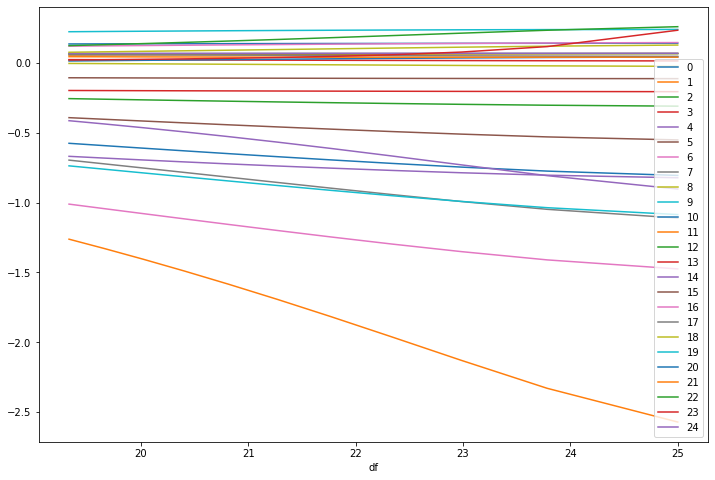

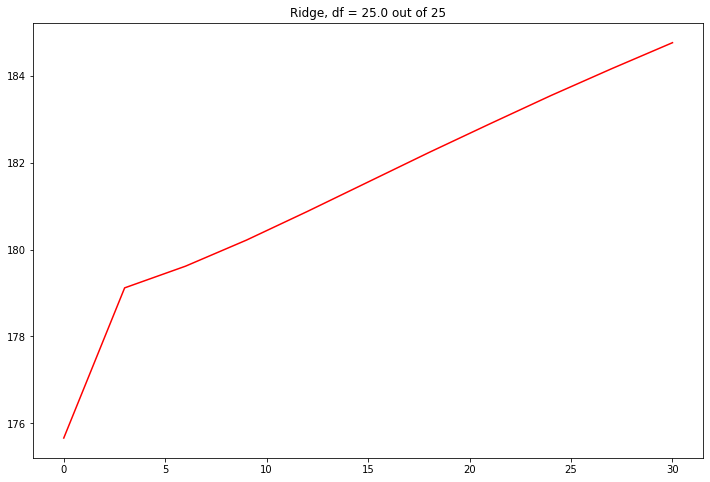

            MLR r2  Ridge r2  wMLR r2  Mix r2  Ridge Lambda
index                                                      
2024-09-12   15.29    14.642    12.69  14.833          30.0
2024-09-13   24.29    19.922    21.87  23.592           0.0
2024-09-16    8.67     8.635     6.76   8.195           0.0
2024-09-17   25.42    25.111    23.74  24.990           3.0
2024-09-18    6.78     6.274     3.06   5.744          30.0
2024-09-19   36.13    36.109    33.34  35.498           0.0
2024-09-20   22.82    22.704    21.22  22.438           3.0
2024-09-23   14.47    14.418    12.71  14.145           0.0
2024-09-24   17.35    17.262    15.04  16.782           0.0
2024-09-25   28.83    27.668    27.29  28.318           0.0

Performances:
            M2MP Velocity  T10YIE  USGG2YR   VIX  US10YR RR  Brent USD/Bbl  \
index                                                                        
2018-12-31          -2.16    1.23    -3.43  0.27       0.15          -1.12   
2019-12-31          -0.45   -0.

[7 rows x 28 columns]


Alphas SPX:
            M2MP Velocity  T10YIE  USGG2YR   VIX  US10YR RR  Brent USD/Bbl  \
index                                                                        
2018-12-31          -2.26    1.54    -3.48  0.48       0.36          -0.91   
2019-12-31           0.49   -1.59     0.15  1.17      -2.54           0.07   
2020-12-31           3.72    1.42    -0.90  2.80       2.22          -1.50   
2021-12-31          -1.27   -0.32     0.81  0.16      -2.42          -1.78   
2022-12-31          -3.79   -2.12    -0.72 -2.19       0.90           0.28   
2023-12-31           0.62    0.29    -0.16 -1.30       2.39           1.82   
2024-12-31          -1.68   -0.72     1.97  2.94      -0.86          -2.59   

            2Y IR Vol  Software  Industrials  Health Care  ...  Beta    Vol  \
index                                                      ...                
2018-12-31      -2.41     27.20        -4.25        15.19  ... -0.12  -2.30   
2019-12-31       1.32   

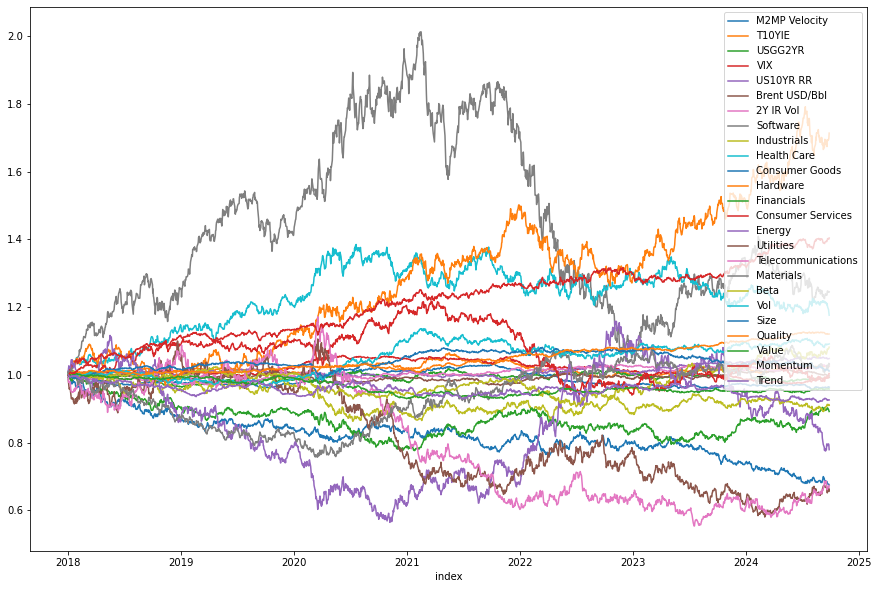

Performances:
            M2MP Velocity  T10YIE  USGG2YR   VIX  US10YR RR  Brent USD/Bbl  \
index                                                                        
2018-12-31          -1.90    1.56    -3.49  0.58      -0.33          -1.15   
2019-12-31          -0.44   -0.69     2.10  1.57      -0.72           1.71   
2020-12-31           4.12    1.46    -0.10  2.99       1.66          -1.14   
2021-12-31           0.63    1.23     0.90 -0.74      -2.36          -1.69   
2022-12-31          -4.05   -2.35     0.95 -2.65       2.08           1.42   
2023-12-31           0.27    1.80    -1.55 -2.04       3.03           1.87   
2024-12-31          -0.91    0.56     0.98  0.73       0.97          -0.63   

            2Y IR Vol  Software  Industrials  Health Care  ...  Beta    Vol  \
index                                                      ...                
2018-12-31      -2.53     10.13        -5.48        10.76  ...  0.19  -2.23   
2019-12-31       2.15     39.86        29.85  


Betas SPX:
            M2MP Velocity  T10YIE  USGG2YR   VIX  US10YR RR  Brent USD/Bbl  \
index                                                                        
2018-12-31          -0.02    0.04    -0.01  0.05       0.04           0.04   
2019-12-31          -0.03    0.02     0.06  0.02       0.06           0.05   
2020-12-31           0.00   -0.02     0.01  0.01      -0.03           0.02   
2021-12-31           0.06    0.06     0.02 -0.03       0.01           0.00   
2022-12-31           0.04    0.03    -0.08  0.03      -0.07          -0.06   
2023-12-31          -0.01    0.06    -0.05 -0.04       0.03           0.00   
2024-12-31           0.03    0.07    -0.06 -0.11       0.10           0.09   

            2Y IR Vol  Software  Industrials  Health Care  ...  Beta   Vol  \
index                                                      ...               
2018-12-31      -0.00      0.82         0.73         0.58  ...  0.07  0.03   
2019-12-31       0.02      1.14         0.86       

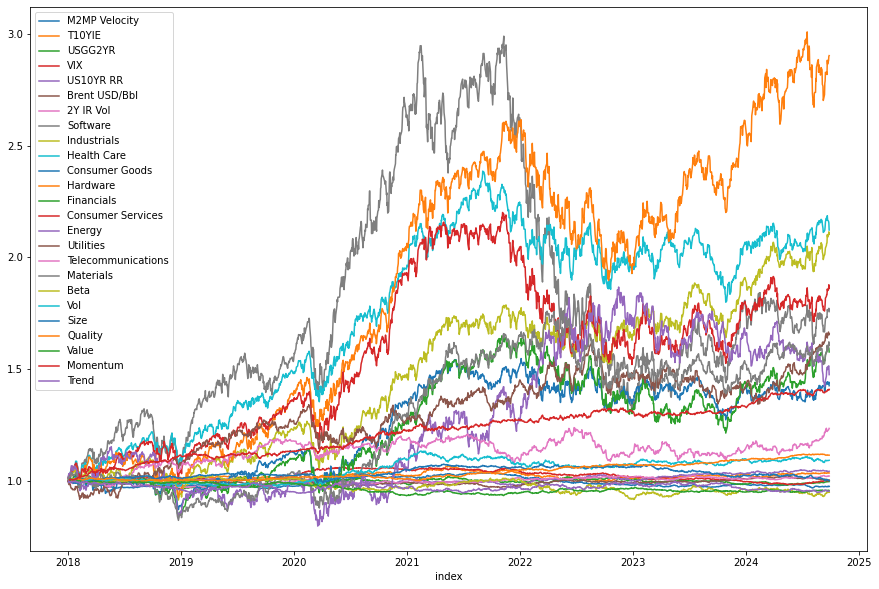

MLR Summary:
Hardware              1.713959
Momentum              1.404399
Software              1.245526
Health Care           1.176429
Quality               1.120836
Vol                   1.091603
Industrials           1.082009
US10YR RR             1.048470
Materials             1.032587
2Y IR Vol             1.027152
T10YIE                1.026094
Size                  1.011636
Consumer Services     1.004301
Brent USD/Bbl         0.997329
VIX                   0.993255
USGG2YR               0.992559
M2MP Velocity         0.963892
Value                 0.958518
Trend                 0.926095
Beta                  0.910241
Financials            0.892100
Energy                0.779490
Consumer Goods        0.675134
Telecommunications    0.674016
Utilities             0.662889
Name: 2024-09-25, dtype: float64

Ridge Summary:
Hardware              2.901866
Health Care           2.121963
Industrials           2.102462
Consumer Services     1.862435
Software              1.757157
Utilitie

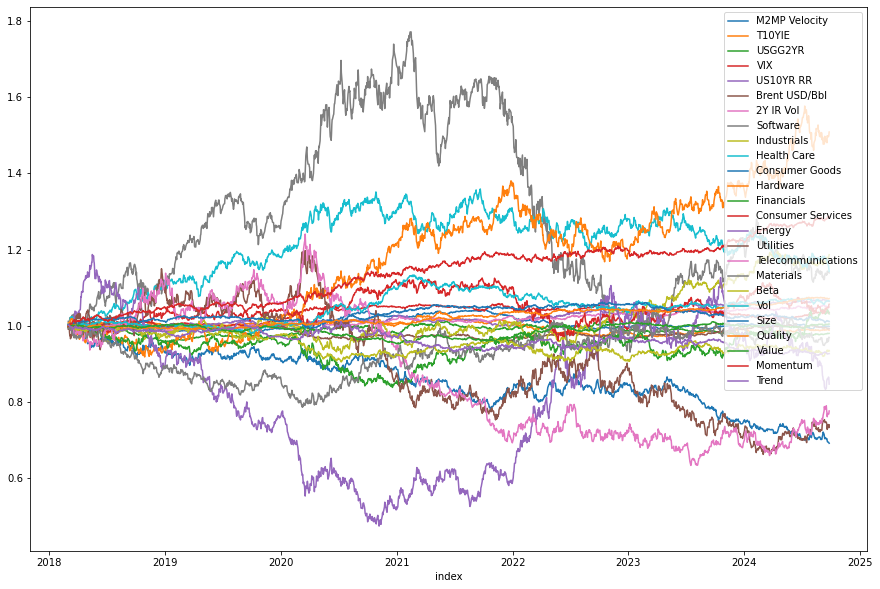

SMLR Summary:
Hardware              1.508595
Momentum              1.286798
Industrials           1.186317
Health Care           1.142670
Software              1.138413
Quality               1.071010
Vol                   1.064506
US10YR RR             1.064205
Consumer Services     1.056352
2Y IR Vol             1.048890
VIX                   1.034403
Financials            1.031000
Size                  1.010665
Value                 1.004273
M2MP Velocity         0.998110
Brent USD/Bbl         0.992161
T10YIE                0.987935
USGG2YR               0.979694
Materials             0.969218
Beta                  0.933716
Trend                 0.926667
Energy                0.846547
Telecommunications    0.775996
Utilities             0.739118
Consumer Goods        0.691228
Name: 2024-09-25, dtype: float64



In [285]:
# FACTOR MODELING OF X-SECTIONAL RETURNS - 2nd DRAFT

import pandas as pd
import math
import numpy as np
import os
import csv
import yfinance as yf
import matplotlib.pyplot as plt
import psycopg2
import requests
import json
import tkinter as tk
import re
from datetime import datetime
from datetime import timedelta
from datetime import date
from sqlalchemy import create_engine
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import Ridge
from statsmodels.tsa.arima.model import ARIMA
from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import PolynomialFeatures
from sklearn.metrics import r2_score
import warnings

def annual_reports(SummaryP_df, anchor):
        
    SummaryP_df.index = SummaryP_df.index.map(lambda x: datetime(x.year, x.month, x.day))
    SummaryPY_df = SummaryP_df.resample('Y').last()
    SummaryPY_df.loc[SummaryP_df.index[0]] = 1
    SummaryPY_df = SummaryPY_df.sort_index()
    SummaryPY_df = round(100 * SummaryPY_df.pct_change(), 2).dropna()
    print('Performances:')
    print(SummaryPY_df)
    print('')

    SummaryV_df = round(100 * SummaryP_df.pct_change().ewm(halflife = 84).std() * np.sqrt(252), 2).dropna()
    SummaryVY_df = round(SummaryV_df.resample('Y').mean(), 2)
    print('')
    print('Volatilities:')
    print(SummaryVY_df)
    print('')

    SummaryD_df = round(100 * (SummaryP_df / SummaryP_df.rolling(252, min_periods = 21).max() - 1), 2).dropna()
    SummaryDY_df = SummaryD_df.resample('Y').min()
    print('')
    print('Drawdowns:')
    print(SummaryDY_df)
    print('')

    SummaryC_df = round(100 * ((SummaryP_df[1: ].T ** (252 / SummaryP_df[1:].index.map(lambda x: (x - SummaryP_df.index[0]).days).values)).T - 1), 2)
    SummaryCY_df = SummaryC_df.resample('Y').last()
    print('')
    print('CAGR:')
    print(SummaryCY_df)
    print('')

    SummaryCDY_df = round(SummaryCY_df / abs(SummaryDY_df), 2)
    print('')
    print('CAGR/DD:')
    print(SummaryCDY_df)
    print('')

    SummarySY_df = round(SummaryPY_df / abs(SummaryVY_df), 2)
    print('')
    print('Sharpe:')
    print(SummarySY_df)
    print('')

    SummaryCorr_df = SummaryP_df.rolling(252).corr(SummaryP_df[anchor].rolling(252))
    SummaryCorrY_df = SummaryCorr_df.resample('Y').mean()
    SummaryBY_df = round(SummaryCorrY_df * (SummaryVY_df.T / SummaryVY_df[anchor]).T, 2)
    print('')
    print('Betas ' + anchor + ':')
    print(SummaryBY_df)
    print('')

    SummaryAY_df = round(SummaryPY_df - (SummaryBY_df.T * SummaryPY_df[anchor]).T, 2)
    print('')
    print('Alphas ' + anchor + ':')
    print(SummaryAY_df)    
                
    return


def predictors_to_Sfeatures(Sectors_df, stock_l):

    sector_l = pd.unique(Sectors_df.dropna(subset = ['Custom Sector 1'])['Custom Sector 1']).tolist()
    featuresS_df = pd.DataFrame(np.nan, index = stock_l, columns = sector_l)
    for c_sec in sector_l:
        eligible_l = [t for t in stock_l if t in Sectors_df[Sectors_df['Custom Sector 1'] == c_sec].index]
        featuresS_df.loc[eligible_l, c_sec] = 1    
    featuresS_df = featuresS_df.fillna(0).astype(int)  
    
    return featuresS_df

def predictors_to_Mfeatures(MacroPxs_df, SPxs_df, m_features_l, sector_s):
        
    sector_l = pd.unique(sector_s).tolist()
    MacroPxs_df['US10YR RR'] = MacroPxs_df['USGG10YR'] - MacroPxs_df['T10YIE']
    MacroPxs_df['YC'] = MacroPxs_df['USGG10YR'] - MacroPxs_df['USGG2YR']
    MacroPxs_df['2Y IR Vol'] = MacroPxs_df['USGG2YR'].ewm(halflife = hl).std() * np.sqrt(252)
    MacroPxs_df = MacroPxs_df.loc[SPxs_df.index]
    MacroPxs_df = (MacroPxs_df - MacroPxs_df.ewm(halflife = hl).mean())
    MacroPxs_df = MacroPxs_df.pct_change()

    MacroFactor_df = pd.DataFrame(np.nan, index = SPxs_df.columns, columns = m_features_l)
    for c_mf in m_features_l:
        c_mf1_s = SPxs_df.pct_change().join(MacroPxs_df[c_mf])[-hl:].cov()[c_mf].drop(c_mf)    
        c_mf2_s = SPxs_df.pct_change().join(MacroPxs_df[c_mf])[-2 * hl:].cov()[c_mf].drop(c_mf)
        c_mf3_s = SPxs_df.pct_change().join(MacroPxs_df[c_mf])[-4 * hl:].cov()[c_mf].drop(c_mf)
        featVar_s = MacroPxs_df[c_mf].ewm(halflife = hl).std().iloc[-1] ** 2
        c_mf_s = (2 * c_mf1_s + 1.5 * c_mf2_s + c_mf3_s) / 4.5
        MacroFactor_df[c_mf] = c_mf_s / featVar_s
        
    for c_sec in sector_l:
        MSec_l = [t for t in MacroFactor_df.index if t in sector_s[sector_s == c_sec].index]
        for c_mf in m_features_l:            
            MacroFactor_df.loc[MSec_l, c_mf] += MacroFactor_df.loc[MSec_l, c_mf].min()             
    for c_feat in m_features_l:  
        if (XSection_adj):
            for c_sec in sector_l:
                MSec_l = [t for t in MacroFactor_df.index if t in sector_s[sector_s == c_sec].index]
                MacroFactor_df.loc[MSec_l, c_feat] += MacroFactor_df.loc[MSec_l, c_feat].min()
                MacroFactor_df.loc[MSec_l, c_feat] = pd.qcut(MacroFactor_df.loc[MSec_l, c_feat], q = q_quant, 
                                                           labels = False, duplicates = 'drop')
        else:
            MacroFactor_df[c_feat] = pd.qcut(MacroFactor_df[c_feat], q = q_quant, labels = False, duplicates = 'drop')  
    naT_l = MacroFactor_df.isna().sum(axis = 1)[MacroFactor_df.isna().sum(axis = 1) > 0].index
    naF_l = MacroFactor_df.loc[naT_l].T[MacroFactor_df.loc[naT_l].T.isna()].index.tolist()  
    MacroFactor_df.loc[naT_l, naF_l] = MacroFactor_df.median().values
    MacroFactor_df -= MacroFactor_df.mean()
    MacroFactor_df /= MacroFactor_df.std()

    return MacroFactor_df, MacroPxs_df[m_features_l]

def predictors_to_Cfeatures(pred_df, sector_s):
    exp_g = 3
    std_p = 4    
    m_omd = 3
    value_p = 5            
        
    sector_l = pd.unique(sector_s).tolist()
    pred_df['P/Ee'][pred_df['P/Ee'] < 0] = abs(pred_df['P/Ee'][pred_df['P/Ee'] < 0]) * 100
    pred_df['P/Eo'][pred_df['P/Eo'] < 0] = abs(pred_df['P/Eo'][pred_df['P/Eo'] < 0]) * 100
    pred_df['P/GP'][pred_df['P/GP'] < 0] = abs(pred_df['P/GP'][pred_df['P/GP'] < 0]) * 100
    pred_df['P/S'][pred_df['P/S'] < 0] = abs(pred_df['P/S'][pred_df['P/S'] < 0]) * 100
    pred_df['sP/E'][pred_df['sP/E'] < 0] = abs(pred_df['sP/E'][pred_df['sP/E'] < 0]) * 100
    pred_df['sP/S'][pred_df['sP/S'] < 0] = abs(pred_df['sP/S'][pred_df['sP/S'] < 0]) * 100
    pred_df['sP/GP'][pred_df['sP/GP'] < 0] = abs(pred_df['sP/GP'][pred_df['sP/GP'] < 0]) * 100
    pred_df = fix_na(pred_df, 'r2 S', 'r2 GP')
    pred_df = fix_na(pred_df, 'GS', 'GGP')
    
    featuresC_df = pd.DataFrame(np.nan, index = pred_df.index, columns = c_features_l)
    featuresC_df['Size'] = np.log(pred_df['Size'])
    
    qual_df = pd.DataFrame(np.nan, index = pred_df.index, columns = ['GS', 'GE', 'GGP'])
    qual_df['GS'] = round(pred_df['GS'] * (pred_df['r2 S'] ** exp_g), 2)
    qual_df['GE'] = round(pred_df['GE'] * (pred_df['r2 E'] ** exp_g), 2)
    qual_df['GGP'] = round(pred_df['GGP'] * (pred_df['r2 GP'] ** exp_g), 2)
    qual_df['Score'] = round(qual_df.min(axis = 1) + qual_df.fillna(0).mean(axis = 1) - std_p * qual_df.fillna(0).std(axis = 1), 2)
    qualF_df = pd.DataFrame(qual_df['Score'])
    qualF_df['Extra Q'] = pd.qcut(pred_df['OM-t0'] + m_omd * (pred_df['OM-t0'] + pred_df['ROId'].fillna(0)), 
                                  q = q_quant, labels = False, duplicates = 'drop')        
    featuresC_df['Quality'] = qualF_df.sum(axis = 1)
    
    growth_df = pd.DataFrame(np.nan, index = pred_df.index, columns = ['GS', 'GE', 'GGP'])
    growth_df['GS'] = round(pred_df['GS'] * (pred_df['r2 S'] ** exp_g), 2)
    growth_df['GE'] = round(pred_df['GE'] * (pred_df['r2 E'] ** exp_g), 2)
    growth_df['GGP'] = round(pred_df['GGP'] * (pred_df['r2 GP'] ** exp_g), 2)
    growth_df['Score'] = round((growth_df.max(axis = 1) + growth_df.fillna(0).mean(axis = 1)) / 2, 2)  
    
    featuresC_df['Growth'] = (((pred_df['OM-t0'] / pred_df[['GS', 'GE', 'GGP']].std(axis = 1)) * pred_df['GS'] * 
                               (pred_df['r2 S'] ** 10) + pred_df['GE'] * (pred_df['r2 E'] ** 10) + 1 * pred_df['GGP'] * 
                               (pred_df['r2 GP'] ** 10) + pred_df['OM-t0'] * np.sqrt(pred_df['OMd'])) * 
                              (pred_df[['r2 S', 'r2 GP', 'r2 E']].sum(axis = 1) ** 3) / (pred_df[['S Vol', 'GP Vol', 'E Vol']].min(axis = 1) ** (1 / 5)))
    
    featuresC_df['Value S'] = (3 * pred_df['sP/E'] + pred_df['sP/GP']) / 4
        
    value_df = pd.DataFrame(np.nan, index = pred_df.index, columns = ['P/S', 'P/E'])
    value_df['P/S'] = pd.qcut(pred_df['P/S'], q = q_quant, labels = False, duplicates = 'drop')
    value_df['P/E'] = pd.qcut(pred_df['P/Ee'] + pred_df['P/Eo'] + value_p * abs(pred_df['P/Ee'] - pred_df['P/Eo']), 
                              q = q_quant, labels = False, duplicates = 'drop')
    value_df['Score'] = round((value_df['P/S'] / pred_df['r2 S'].fillna(0) + value_df['P/E'] / pred_df['r2 E'].fillna(0)) / 
                              (1 / pred_df['r2 S'].fillna(0) + 1 / pred_df['r2 E'].fillna(0)), 2)
    featuresC_df['Value F'] = value_df['Score']

    featuresC_df['Reliability'] = ((pred_df[['S Vol', 'E Vol', 'GP Vol']].median(axis = 1) * 2 + 
                                    pred_df[['S Vol', 'E Vol', 'GP Vol']].mean(axis = 1)) / 3)
    featuresC_df['Reliability'] /= pred_df[['r2 S', 'r2 E', 'r2 GP']].sum(axis = 1)
    
    for c_feat in c_features_l:
        mult = 1
        if (c_feat == 'Size') | (c_feat == 'Value S') | (c_feat == 'Value F') | (c_feat == 'Reliability'):
            mult = -1    
        if (XSection_adj):
            for c_sec in sector_l:
                MSec_l = [t for t in featuresC_df.index if t in sector_s[sector_s == c_sec].index]
                featuresC_df.loc[MSec_l, c_feat] += featuresC_df.loc[MSec_l, c_feat].min()
                featuresC_df.loc[MSec_l, c_feat] = pd.qcut(featuresC_df.loc[MSec_l, c_feat] * mult, q = q_quant, 
                                                           labels = False, duplicates = 'drop')
        else:
            featuresC_df[c_feat] = pd.qcut(featuresC_df[c_feat] * mult, q = q_quant, labels = False, duplicates = 'drop')

    featuresC_df = featuresC_df.fillna(0)
    featuresC_df -= featuresC_df.mean()
    featuresC_df /= featuresC_df.std()
    
    return featuresC_df

def predictors_to_Pfeatures(pred_df, SPxs_df, anchor_asset_s, sector_s):

    lag_M1 = -250
    lag_M2 = -125
    lag_M3 = -20
    beta_adj = True
        
    SRet_df = SPxs_df.pct_change().dropna()
    Ret_anchor_asset_s = anchor_asset_s.pct_change().dropna()
    sector_l = pd.unique(sector_s).tolist()
    
    Vol_df = SRet_df.ewm(halflife = hl).std().dropna()
    Vol_AA_s = Ret_anchor_asset_s.ewm(halflife = hl).std().dropna()
    corr_df = SRet_df.ewm(halflife = hl).corr(Ret_anchor_asset_s.ewm(halflife = hl))
    Beta_df = corr_df * (Vol_df.T / Vol_AA_s).T
    beta_s = round(Beta_df.iloc[-1], 3)
    beta_s.name = 'Beta'
    vol_s = round(100 * Vol_df.iloc[-1] * np.sqrt(252), 3)
    vol_s.name = 'Vol'
    
    momentum_df = pd.DataFrame(np.nan, index = pred_df.index, columns = ['MomCP', 'MomLP', 'MomXS', 'Autocorr'])
    momentum_df['MomCP'] = (momentum_df.index.map(lambda x: SPxs_df[x].iloc[-1]) / 
                            momentum_df.index.map(lambda x: SPxs_df[x].iloc[lag_M2]) - 1).map(lambda x: round(100 * x, 2))
    momentum_df['MomLP'] = (momentum_df.index.map(lambda x: SPxs_df[x].iloc[lag_M3]) / 
                            momentum_df.index.map(lambda x: SPxs_df[x].iloc[lag_M1]) - 1).map(lambda x: round(100 * x, 2)) 
    momentum_df['Autocorr'] = SPxs_df.pct_change()[-hl:].rolling(hl).apply(lambda x: x.autocorr(lag = 1)).iloc[-1]
    momentum_df['Autocorr'] *= (-1) * momentum_df['MomCP']
    
    for c_sec in sector_l:
        MSec_l = [t for t in momentum_df.index if t in sector_s[sector_s == c_sec].index]
        momentum_df.loc[MSec_l, 'MomXS'] = (momentum_df.loc[MSec_l].index.map(lambda x: SPxs_df[x].iloc[lag_M3]) / 
                                            momentum_df.loc[MSec_l].index.map(lambda x: SPxs_df[x].iloc[lag_M1]))
        momentum_df.loc[MSec_l, 'MomXS'] /= momentum_df.loc[MSec_l, 'MomXS'].min()
                    
    featuresP_df = momentum_df.join(beta_s).join(vol_s)
    if (beta_adj):
        featuresP_df['MomCP'] /= featuresP_df['Beta']
        featuresP_df['MomLP'] /= featuresP_df['Beta']
    for p_feat in p_features_l:
        if (XSection_adj):
            for c_sec in sector_l:
                MSec_l = [t for t in featuresP_df.index if t in sector_s[sector_s == c_sec].index]
                featuresP_df.loc[MSec_l, p_feat] = pd.qcut(featuresP_df.loc[MSec_l, p_feat], q = q_quant, labels = False, 
                                                           duplicates = 'drop')
        else:
            featuresP_df[p_feat] = pd.qcut(featuresP_df[p_feat], q = q_quant, labels = False, duplicates = 'drop')
    featuresP_df = featuresP_df.fillna(0)
    featuresP_df -= featuresP_df.mean()
    featuresP_df /= featuresP_df.std()      
    
    return featuresP_df

def factor_shrink(ALLfeatures_df, MacroFeatures_df, sector_l):

    reliab_f = 2
    qualit_f = 15
    growth_f = 25
    value_f = 5  
    ac_factor = 0.5

    qualityBasedS_s = (ALLfeatures_df['Reliability'] * reliab_f + ALLfeatures_df['Quality'] * qualit_f + 
                    ALLfeatures_df['Growth'] * growth_f + ALLfeatures_df['Value F'] * value_f)
    valueBasedS_s = ALLfeatures_df['Value S']   
    momBasedS_s = ALLfeatures_df['MomXS']
    volBasedS_s = ALLfeatures_df['Vol']
    trendBasedS_s = (ALLfeatures_df['MomCP'] + ALLfeatures_df['MomLP'] + ALLfeatures_df['Autocorr'] * ac_factor)    
    macroBasedS_df = ALLfeatures_df[MacroFeatures_df.columns]    
    qualityBasedS_s.name = 'Quality'
    valueBasedS_s.name = 'Value'
    momBasedS_s.name = 'Momentum'
    volBasedS_s.name = 'Vol'
    trendBasedS_s.name = 'Trend'    
    processedF_df = macroBasedS_df.join(qualityBasedS_s).join(valueBasedS_s).join(momBasedS_s).join(volBasedS_s).join(trendBasedS_s).join(ALLfeatures_df['Beta']).join(ALLfeatures_df['Size'])
    for c_fac in processedF_df.columns:
        processedF_df[c_fac] = winsorize(processedF_df[c_fac].values, 0.015, 0.985)
    processedF_df -= processedF_df.mean()
    processedF_df /= processedF_df.std()
    processedF_df = processedF_df.drop_duplicates()
    sectorBasedS_df = ALLfeatures_df[sector_l]
    processedF_df = processedF_df.join(sectorBasedS_df)
    processedF_df = processedF_df.dropna(axis = 1, how = 'all')
    
    return processedF_df

def round_down(n, decimals = 0): 
    multiplier = 10 ** decimals 
    return int(math.floor(n * multiplier) / multiplier)

def Set_DF(dframe):
    
    dframe.index = dframe[dframe.columns.values.tolist()[0]]
    dframe.index.name = dframe.columns.values.tolist()[0]
    New_df = dframe.drop(dframe.columns.values.tolist()[0], axis=1)
    
    return New_df

def DD_Index(dframe):
    
    dframe['dummy'] = dframe.index
    dframe.drop_duplicates(['dummy'], inplace=True)
    dframe.drop('dummy', axis=1, inplace=True)
    New_df = dframe
    
    return New_df 

def open_df(*args):
    open_str = args[0]
    
    query_open = 'SELECT * FROM ' + open_str
    opened_df = pd.read_sql_query(query_open, engine)
    opened_df = Set_DF(opened_df)
    opened_df = DD_Index(opened_df)
    opened_df = opened_df.sort_index()
    
    return opened_df

def fix_na(base_df, col_b, col_t):

    aux = base_df[[col_b, col_t]]
    aux = aux.T.fillna(method = 'ffill').T
    base_df[col_t] = aux[col_t]
    
    return base_df

def get_predictors(c_date, exclusion_l):
    
    rel_found = False
    count = 0
    attempts_cap = 30
    while (not rel_found) & (count < attempts_cap):
        try:
            pred_df = open_df('valuation_' + c_date.strftime('%Y%m%d') + selection_scope)
            rel_found = True            
        except:
            c_date = c_date - timedelta(1)
            c_date = c_date - timedelta((c_date.weekday() % 4) * (c_date.weekday() // 4))
            count += 1
    
    pred_df = pred_df.dropna(thresh = pred_df.shape[1] // 2)
    pred_df['P/Ee'][pred_df['P/Ee'] <= 0] = 100
    pred_df['P/Eo'][pred_df['P/Eo'] <= 0] = 100
    pred_df['P/S'][pred_df['P/S'] <= 0] = 100  
    exclusion_l = [t for t in exclusion_l if t in pred_df.index]
    pred_df = pred_df.drop(exclusion_l)
    
    return pred_df, c_date

def winsorize(Rt_a, floor, cap):
    
    w_s = pd.Series(Rt_a)
    w_up = np.quantile(w_s.dropna().values, q = cap)
    w_down = np.quantile(w_s.dropna().values, q = floor)    
    w_s = w_s.clip(w_down, w_up).map(lambda x: round(100 * x, 3))
    
    return w_s.values

def winsorize_df(base_df):
    
    base_df = base_df.T.dropna(how = 'all').T
    base_df = base_df.dropna(how = 'all')
    new_df = base_df.copy()
    for c_col in base_df.columns:
        new_df[c_col] = winsorize(base_df[c_col].values, 0.05, 0.95) / 100
        
    return new_df

def loadings(ret_s, res_s):
    
    Pbeta = 0
    PZ = 0      
    if (res_s.std() != 0):
        Pbeta = round(res_s.cov(ret_s) / (res_s.std() ** 2), 3)
        if (ret_s.std() != 0):        
            PZ = round(abs(Pbeta) / ((ret_s.std() ** 2) / (res_s.std() ** 2)), 3)
    
    return Pbeta, PZ

def mlr(ALLfeatures_df):
    
    model = LinearRegression()
    lr_mod = model.fit(ALLfeatures_df[all_features_l].values, ALLfeatures_df['Rt'].values)
    lr_values = lr_mod.predict(ALLfeatures_df[all_features_l].values)
    fRet_s = round(pd.Series(lr_mod.coef_, index = all_features_l), 3)
    fRet_s.name = 'MLR Factor Rets'
    fcast_s = pd.Series(lr_values, index = ALLfeatures_df.index)
    fcast_s.name = 'Ret Fcast'   
    y0 = lr_mod.intercept_
    mlr_r2 = round(100 * lr_mod.score(ALLfeatures_df[all_features_l].values, ALLfeatures_df['Rt'].values), 2)
    
    return fcast_s, fRet_s, y0, mlr_r2

def weighted_mlr(ALLfeatures_df, weights_a):
    
    model = LinearRegression()
    lr_mod = model.fit(ALLfeatures_df[all_features_l].values, ALLfeatures_df['Rt'].values, weights_a)
    lr_values = lr_mod.predict(ALLfeatures_df[all_features_l].values)
    fRet_s = round(pd.Series(lr_mod.coef_, index = all_features_l), 3)
    fRet_s.name = 'wMLR Factor Rets'
    fcast_s = pd.Series(lr_values, index = ALLfeatures_df.index)
    fcast_s.name = 'wMLR Ret Fcast'   
    y0 = lr_mod.intercept_
    mlr_r2 = round(100 * lr_mod.score(ALLfeatures_df[all_features_l].values, ALLfeatures_df['Rt'].values), 2)
    
    return fcast_s, fRet_s, y0, mlr_r2

def svr_orthogonal(ALLfeatures_df):
    
    corr_s = abs(ALLfeatures_df.corr()['Rt']).drop(['Rt']).sort_values(ascending = False)  
    residuals_l = []
    for idx, c_feat in enumerate(corr_s.index):
        b_res_l = []
        for count in np.arange(idx):
            b_res = loadings(residuals_l[count], ALLfeatures_df[c_feat] - ALLfeatures_df[c_feat].mean())[0]
            b_res_l.append(b_res)
        z = ALLfeatures_df[c_feat] - ALLfeatures_df[c_feat].mean()
        for count in np.arange(idx):
            z -= b_res_l[count] * residuals_l[count]
        residuals_l.append(z)        

    RetX_df = pd.DataFrame(np.nan, index = corr_s.index, columns = ['SVR Factor Rets', 'Z Score'])
    for idx, c_res in enumerate(residuals_l):
        Rt_res = ALLfeatures_df['Rt'].copy()
        for count in np.arange(idx):
            Rt_res -= RetX_df.iloc[count]['SVR Factor Rets'] * Rt_res
        RetX_df.loc[corr_s.index[idx]] = loadings(Rt_res, c_res)
    
    return RetX_df, corr_s

def mlr_scaled(ALLfeatures_df, idio_std_m, valid_asset_l):
    
    INVidio_std_m = pd.DataFrame(idio_std_m ** (-1)).replace({np.inf: 0}).fillna(0).values
    model = LinearRegression()
    adj_features_a = ALLfeatures_df[all_features_l].loc[valid_asset_l].values.T.dot(INVidio_std_m)
    adj_rets_a = ALLfeatures_df['Rt'].loc[valid_asset_l].values.T.dot(INVidio_std_m)

    lr_mod = model.fit(adj_features_a.T, adj_rets_a)
    fRet_s = round(pd.Series(lr_mod.coef_, index = all_features_l), 3)
    fRet_s.name = 'MLR Factor Rets'
    y0 = lr_mod.intercept_ 
    fcast_s = pd.Series(adj_features_a.T.dot(lr_mod.coef_) + y0, index = ALLfeatures_df.loc[valid_asset_l].index)
#   fcast_s = pd.Series(np.diagonal(adj_features_a.T.dot(lr_mod.coef_).dot(idio_std_m) + idio_std_m.dot(y0)), 
#                       index = ALLfeatures_df.loc[valid_asset_l].index)
    fcast_s.name = 'Ret Fcast'  
    sMLR_r2 = round(100 * fcast_s.corr(pd.Series(adj_rets_a, index = fcast_s.index)) ** 2, 2)    
    
    return fcast_s, fRet_s, y0, sMLR_r2


def svr_orthogonal_scaled(ALLfeatures_df, idio_std_m, valid_asset_l):

    ALLfeatures_df = ALLfeatures_df.loc[valid_asset_l]
    INVidio_std_m = pd.DataFrame(idio_std_m ** (-1)).replace({np.inf: 0}).fillna(0).values
    corr_s = abs(ALLfeatures_df.corr()['Rt']).drop(['Rt']).sort_values(ascending = False)  
    residuals_l = []
    for idx, c_feat in enumerate(corr_s.index):
        b_res_l = []
        for count in np.arange(idx):
            b_res = loadings(residuals_l[count],  pd.Series((ALLfeatures_df[c_feat] - ALLfeatures_df[c_feat].mean()).values.dot(INVidio_std_m), index = ALLfeatures_df.index))[0]
            b_res_l.append(b_res)
        z = pd.Series((ALLfeatures_df[c_feat] - ALLfeatures_df[c_feat].mean()).values.dot(INVidio_std_m), index = ALLfeatures_df.index)
        for count in np.arange(idx):
            z -= b_res_l[count] * residuals_l[count]
        residuals_l.append(z)        

    RetX_df = pd.DataFrame(np.nan, index = corr_s.index, columns = ['SVR Factor Rets', 'Z Score'])
    for idx, c_res in enumerate(residuals_l):
        Rt_res = pd.Series(ALLfeatures_df['Rt'].values.dot(INVidio_std_m), index = ALLfeatures_df.index)
        for count in np.arange(idx):
            Rt_res -= RetX_df.iloc[count]['SVR Factor Rets'] * Rt_res
        RetX_df.loc[corr_s.index[idx]] = loadings(Rt_res, c_res)

    return RetX_df

def ridge(ALLfeatures_df):
    
    xv_n = 10
    ridge_n = 33
    step = 3  
    lambda_penalty = 10

    x_m = ALLfeatures_df.drop(['Rt'], axis = 1).T.values
    y_a = ALLfeatures_df['Rt'].values
    
    lambda_array = np.arange(ridge_n)
    lambda_array = lambda_array[::step]
    x_df = pd.DataFrame(x_m.T)
    y_df = pd.DataFrame(y_a.T)

    cv_mse_df = pd.DataFrame(np.nan, index = lambda_array, columns = ['Train', 'Val'])
    beta_df = pd.DataFrame(np.nan, index = lambda_array, columns = np.arange(x_df.shape[1]).tolist() + ['df'])
    val_r2 = np.inf
    shift_lambda = False
    for c_lambda in lambda_array:
        if (shift_lambda):
            c_lambda += lambda_penalty
        try:        
            Rmodel = Ridge(alpha = c_lambda, normalize = False, tol = 0.001, solver = 'auto', random_state = 42)
            valRMSE_tot = 0
            trainRMSE_tot = 0
            for c in np.arange(xv_n):
                init_v = xv_n * c
                end_v = init_v + xv_n
                valX_df = x_df.iloc[init_v: end_v]
                valY_df = y_df.iloc[init_v: end_v]
                trainX_df = x_df.drop(valX_df.index)
                trainY_df = y_df.drop(valX_df.index)

                I_m = np.identity(trainX_df.shape[1])
                lambda_matrix = I_m * np.array([c_lambda] * trainX_df.shape[1])
                beta_array = np.linalg.inv((trainX_df.T.values.dot(trainX_df.values)) + lambda_matrix).dot(trainX_df.T.values.dot(trainY_df.values))
                hat_matrix = (trainX_df.values).dot(np.linalg.inv((trainX_df.T.values.dot(trainX_df.values)) + lambda_matrix)).dot(trainX_df.T.values)        

                if (c == 0):
                    edf = np.trace(hat_matrix)
                    beta_df.loc[c_lambda] = pd.DataFrame(beta_array)[0].tolist() + [edf]

                ridge_mod = Rmodel.fit(trainX_df.values, trainY_df.values)
                trainRidge_f = ridge_mod.predict(trainX_df.values)
                valRidge_f = ridge_mod.predict(valX_df.values)
                trainRidge_mse = np.sum((trainY_df.values - trainRidge_f) ** 2) / trainY_df.shape[0]
                valRidge_mse = np.sum((valY_df.values - valRidge_f) ** 2) / valY_df.shape[0]
                trainRMSE_tot += trainRidge_mse 
                valRMSE_tot += valRidge_mse 
            cv_mse_df.loc[c_lambda, 'Train'] = round(100 * trainRMSE_tot / xv_n, 2)
            cv_mse_df.loc[c_lambda, 'Val'] = round(100 * valRMSE_tot / xv_n, 2)
            if (valRMSE_tot < val_r2):
                bestRidge_f = ridge_mod.predict(x_df.values)
                bestRidge_fr = pd.DataFrame(beta_array)[0].values
                bestLambda = c_lambda
                val_r2 = valRMSE_tot
                best_edf = edf
        except:
            val_r2 = np.inf
            shift_lambda = True
            print('Ridge lambda' + str(c_lambda) + ' singular!!')            

    bestRidgeRt_s = pd.Series(pd.DataFrame(bestRidge_f)[0].values, index = ALLfeatures_df.index)
    bestRidgeFS_s = round(pd.Series(bestRidge_fr, index = ALLfeatures_df.drop(['Rt'], axis = 1).columns), 3)
    bestRidgeFS_s.name = 'Ridge Factor Rets'
    beta_df.index = beta_df['df']
    beta_df = beta_df.drop(['df'], axis = 1)
    beta_df.sort_index().plot(figsize = (12, 8))
    plt.show()
    cv_mse_df['Val'].plot(figsize = (12, 8), c = 'r')
    plt.title('Ridge, df = ' + str(round(best_edf, 2)) + ' out of ' + str(x_m.shape[0]))
    plt.show()
    Ridge_r2 = round(100 * (pd.DataFrame(bestRidge_f).join(y_df, rsuffix = '_label').corr().iloc[0, 1] ** 2), 3)

    return bestRidgeRt_s, bestRidgeFS_s, bestLambda, Ridge_r2


warnings.filterwarnings('ignore')
dbase = "visiblealpha_laptop"
conn = psycopg2.connect(host="localhost", user="postgres", password="akf7a7j5", dbname=dbase, port=5432)
cursor = conn.cursor()
cursor.execute("select relname from pg_class where relkind='r' and relname !~ '^(pg_|sql_)';")
tables_list = cursor.fetchall()
new_tables_list = list(pd.DataFrame(tables_list, columns=['Old'])['Old'])

cnxn_string = ("postgresql+psycopg2://{username}:{pswd}"
              "@{host}:{port}/{database}")

engine = create_engine(cnxn_string.format(
    username="postgres",
    pswd="akf7a7j5",
    host="localhost",
    port=5432,
    database=dbase))

today = date.today()
stocks = pd.read_csv(r"C:\Users\Utilizador\OneDrive\Documentos\Malta\Systematic\Tickers_VA.csv")
all_tickers_l = stocks['tickers'].tolist()
all_fundamentals_l = ['sP/S', 'sP/E', 'sP/GP', 'P/S', 'P/Ee', 'P/GP', 'P/Eo', 'OM-t0', 'OM', 'OMd', 'GS', 'GE', 'r2 S', 'r2 E', 
                      'GGP', 'r2 GP', 'Size', 'ROI-P', 'ROI', 'ROId','ROE-P', 'ROE', 'ROEd', 'S Vol', 'E Vol', 'GP Vol']
macroFeatures_l = ['CRB Index Index Points', 'Brent USD/Bbl', 'M2CP Velocity', 'M2MP Velocity', 'T5YIFR', 'T10YIE', 'USGG2YR', 'USGG10YR', 'VIX']
m_features_l = ['M2MP Velocity', 'T10YIE', 'USGG2YR', 'VIX', 'US10YR RR', 'Brent USD/Bbl', '2Y IR Vol']
c_features_l = ['Size', 'Value S', 'Value F', 'Reliability', 'Quality', 'Growth']
p_features_l = ['Vol', 'Beta', 'MomCP', 'MomLP', 'MomXS']

sectors = pd.read_csv(r"C:\Users\Utilizador\OneDrive\Documentos\Malta\Systematic\Custom_Segmentation.csv")
Sectors_df = pd.DataFrame(sectors)
Sectors_df = Set_DF(Sectors_df)
Sectors_df = DD_Index(Sectors_df)
sector_l = pd.unique(Sectors_df.dropna(subset = ['Custom Sector 1'])['Custom Sector 1']).tolist()
sector_s = Sectors_df[Sectors_df['Custom Sector 1'].isna() == False]['Custom Sector 1']
FULLall_features_l = c_features_l + p_features_l + m_features_l + sector_l
SLICEall_features_l = m_features_l + sector_l + ['Beta', 'Vol', 'Size', 'Quality', 'Value', 'Momentum', 'Trend']
all_features_l = SLICEall_features_l.copy()

Pxs_df = open_df('prices_relation')
last_dt = Pxs_df.index[-1]
selection_scope = '' 
beta_w = 126
long_w = 1000
quant = 10
hl = 42
vol_check_w = 10
q_quant = 30
winsor_L = 0.020
winsor_H = 0.980
ovr = False
save_files = False
XSection_adj = True
anchor_asset = 'SPX'

STdt_str = input('Enter Start Date (empty for update or YY/MM/DD): ')
try:
    st_date = datetime.strptime(STdt_str, "%y/%m/%d").date()
except:
    st_date = Pxs_df.index[-1]
    
ENdt_str = input('Enter End Date (empty for last or YY/MM/DD): ')
try:
    end_date = datetime.strptime(ENdt_str, "%y/%m/%d").date()
except:
    end_date = Pxs_df.index[-1]  
    
if (st_date != Pxs_df.index[-1]):
    oride = input('Override (Y/y or empty)? ').upper()
    if (oride == 'Y'):
        ovr = True
        
dt_range = Pxs_df[Pxs_df.index >= st_date][Pxs_df[Pxs_df.index >= st_date].index <= end_date].index.tolist() 
dt_range = pd.Series(dt_range)[pd.Series(dt_range).map(lambda x: x.strftime('%d%m').find('0101')) == -1].tolist()
dt_range = pd.Series(dt_range)[pd.Series(dt_range).map(lambda x: x.strftime('%d%m').find('2512')) == -1].tolist()
dt_range = pd.Series(dt_range)[pd.Series(dt_range).map(lambda x: x.strftime('%d%m').find('0407')) == -1].tolist()
if (ovr):
    MLRfactRets_df = pd.DataFrame(np.nan, index = dt_range, columns = all_features_l)    
    MLRidio_df = pd.DataFrame(np.nan, index = dt_range, columns = all_tickers_l)
    ScaledMLRfactRets_df = pd.DataFrame(np.nan, index = dt_range, columns = all_features_l)    
    ScaledMLRidio_df = pd.DataFrame(np.nan, index = dt_range, columns = all_tickers_l)
    RidgefactRets_df = pd.DataFrame(np.nan, index = dt_range, columns = all_features_l)
    Ridgeidio_df = pd.DataFrame(np.nan, index = dt_range, columns = all_tickers_l)  
    MIXfactRets_df = pd.DataFrame(np.nan, index = dt_range, columns = all_features_l)    
    MIXidio_df = pd.DataFrame(np.nan, index = dt_range, columns = all_tickers_l)    
    scores_df = pd.DataFrame(np.nan, index = dt_range, columns = ['MLR r2', 'Ridge r2', 'wMLR r2', 'Mix r2', 'Ridge Lambda'])
else:
    MLRfactRets_df = open_df('mlr_factor_returns')    
    MLRidio_df = open_df('mlr_idio_returns')
    ScaledMLRfactRets_df = open_df('smlr_factor_returns')    
    ScaledMLRidio_df = open_df('smlr_idio_returns')
    RidgefactRets_df = open_df('ridge_factor_returns')    
    Ridgeidio_df = open_df('ridge_idio_returns')   
    MIXfactRets_df = open_df('mix_factor_returns')    
    MIXidio_df = open_df('mix_idio_returns') 
    scores_df = open_df('lr_scores')   
    
dt_range = [dt for dt in dt_range if dt not in MLRfactRets_df.dropna(how = 'all').index.tolist()] 

valid_start = True  
if (len(dt_range) > 0):
    save_files = True
for idx, c_dt in enumerate(dt_range):    
    
    featuresS_df = predictors_to_Sfeatures(Sectors_df, Sectors_df.dropna(subset = ['Custom Sector 1']).index.tolist()) 
    anchor_asset_s = Pxs_df[Pxs_df.index < c_dt][anchor_asset][-long_w:]
    aux_pred_df, c_date = get_predictors(c_dt, exclusion_l)
    exc_ffields = [f for f in all_fundamentals_l if f not in aux_pred_df.columns]
    exc_tickers = [t for t in aux_pred_df.index if t not in featuresS_df.index]
    if (len(exc_ffields) == 0):
        pred_df = aux_pred_df.copy()
        pred_df = pred_df.drop(exc_tickers)
        if (not valid_start):
            valid_start = True
            print('New Start Date: ' + c_dt.strftime('%d-%b-%Y'))
            print('Fundamentals date: ' + c_date.strftime('%d-%b-%Y'))
    elif (idx == 0):
        valid_start = False
        
    if (valid_start):  
        print(c_dt.strftime('%d-%b-%Y'))
        MacroPxs_df = Pxs_df[Pxs_df.index < c_dt][macroFeatures_l][-long_w:]
        SPxs_df = Pxs_df[Pxs_df.index < c_dt][pred_df.index][-long_w:]        
        SRet_df = SPxs_df.pct_change().dropna()
        Check_s = SRet_df.rolling(vol_check_w).std().iloc[-1]
        exc_l = Check_s[Check_s == 0].index.tolist()
        pred_df = pred_df.drop(exc_l)
        SPxs_df = SPxs_df.drop(exc_l, axis = 1)
        inc_l = [t for t in pred_df.index if t in sector_s.index]
        pred_df = pred_df.loc[inc_l]
        SPxs_df = SPxs_df[inc_l]          

        featuresP_df = predictors_to_Pfeatures(pred_df, SPxs_df, anchor_asset_s, sector_s) 
        featuresC_df = predictors_to_Cfeatures(pred_df, sector_s)
        featuresM_df, MacroFeatures_df = predictors_to_Mfeatures(MacroPxs_df, SPxs_df, m_features_l, sector_s)
        featuresS_df = featuresS_df.loc[pred_df.index]
        ALLfeatures_df = pd.concat([featuresP_df.T, featuresC_df.T, featuresM_df.T, featuresS_df.T]).T
        ALLfeatures_df = factor_shrink(ALLfeatures_df, MacroFeatures_df, sector_l)
        Rt_a = (ALLfeatures_df.index.map(lambda x: Pxs_df.loc[c_dt, x]) / 
                ALLfeatures_df.index.map(lambda x: Pxs_df.loc[Pxs_df.index[Pxs_df.index.tolist().index(c_dt) -1], x]) - 1).values        
        ALLfeatures_df['Rt'] = winsorize(Rt_a, winsor_L, winsor_H)
        Rt_s = ALLfeatures_df['Rt']
        x_df = ALLfeatures_df.copy()

        MLRfcast_s, MLRfRet_s, MLRy0, MLRr2 = mlr(x_df)
        ALLfeatures_df['MLR Forecast'] = round(MLRfcast_s, 3)        
        ALLfeatures_df['Idio MLR'] = Rt_s - ALLfeatures_df['MLR Forecast']        
        MLRidio_df.loc[c_dt, ALLfeatures_df.index] = ALLfeatures_df['Idio MLR'].values
        MLRfactRets_df.loc[c_dt] = MLRfRet_s        
        
        try:
            Ridgefcast_s, RidgefRet_s, lambdaR, Ridger2 = ridge(x_df)             
        except:
            print('RIDGE N/A')
            Ridgefcast_s = MLRfcast_s.copy()
            RidgefRet_s = MLRfRet_s.copy()
            lambdaR = 0
            Ridger2 = MLRr2
        
        ALLfeatures_df['Ridge Forecast'] = round(Ridgefcast_s, 3)
        ALLfeatures_df['Idio Ridge'] = Rt_s - ALLfeatures_df['Ridge Forecast']
        Ridgeidio_df.loc[c_dt, ALLfeatures_df.index] = ALLfeatures_df['Idio Ridge'].values 
        RidgefactRets_df.loc[c_dt] = RidgefRet_s  
        MIXidio_df.loc[c_dt, ALLfeatures_df.index] = (MLRidio_df.loc[c_dt, ALLfeatures_df.index] + 
                                                      Ridgeidio_df.loc[c_dt, ALLfeatures_df.index]) / 2
        MIXfactRets_df.loc[c_dt] = (MLRfactRets_df.loc[c_dt] + RidgefactRets_df.loc[c_dt]) / 2      
        ALLfeatures_df['Mix Forecast'] = (ALLfeatures_df['MLR Forecast'] + ALLfeatures_df['Ridge Forecast']) / 2
        
        if (MIXfactRets_df[MIXfactRets_df.index < c_dt].shape[0] > hl):
            valid_asset_l = x_df.index.tolist()            
            SliceIdio_df = MIXidio_df[MIXidio_df.index < c_dt][valid_asset_l].dropna(how = 'all')
            idioVar_s = SliceIdio_df.ewm(halflife = hl).var().iloc[-1]
            idioVar_s = idioVar_s.fillna(idioVar_s.mean())            
            idioPA_a = (idioVar_s ** (-1)).values            
            wMLRfcast_s, wMLRfRet_s, wMLRy0, wMLRr2 = weighted_mlr(x_df, idioPA_a)
        
            ALLfeatures_df['wMLR Forecast'] = np.nan
            ALLfeatures_df.loc[valid_asset_l, 'wMLR Forecast'] = round(wMLRfcast_s, 3)
            ALLfeatures_df['Idio wMLR'] = Rt_s - ALLfeatures_df['wMLR Forecast']
            ScaledMLRidio_df.loc[c_dt, valid_asset_l] = ALLfeatures_df['Idio wMLR'].values
            ScaledMLRfactRets_df.loc[c_dt] = wMLRfRet_s 
            MIXidio_df.loc[c_dt, ALLfeatures_df.index] = (ScaledMLRidio_df.loc[c_dt, ALLfeatures_df.index] + MIXidio_df.loc[c_dt, ALLfeatures_df.index]) / 2
            MIXfactRets_df.loc[c_dt] = (ScaledMLRfactRets_df.loc[c_dt] + MIXfactRets_df.loc[c_dt]) / 2            
            
            scores_df.loc[c_dt, 'wMLR r2'] = wMLRr2                 
            ALLfeatures_df['Mix Forecast'] = (ALLfeatures_df['wMLR Forecast'] + ALLfeatures_df['Mix Forecast']) / 2
            
        MIXr2 = round(100 * (pd.DataFrame(ALLfeatures_df['Mix Forecast']).join(ALLfeatures_df['Rt']).corr().iloc[0, 1] ** 2), 3)
        scores_df.loc[c_dt, 'Mix r2'] = MIXr2             
        scores_df.loc[c_dt, 'MLR r2'] = MLRr2
        scores_df.loc[c_dt, 'Ridge r2'] = Ridger2
        scores_df.loc[c_dt, 'Ridge Lambda'] = lambdaR                                
        print(scores_df[:c_dt][-10:])
        print('')
                
MLRidio_df = winsorize_df(MLRidio_df)
RidgeMLRidio_df = winsorize_df(Ridgeidio_df)
ScaledMLRidio_df = winsorize_df(ScaledMLRidio_df)
MLRfactRets_df = winsorize_df(MLRfactRets_df)
RidgefactRets_df = winsorize_df(RidgefactRets_df)
ScaledMLRfactRets_df = winsorize_df(ScaledMLRfactRets_df)

if (save_files): 
    MLRfactRets_df.sort_index().to_sql('mlr_factor_returns', engine, index = True, if_exists = 'replace')
    MLRidio_df.sort_index().to_sql('mlr_idio_returns', engine, index = True, if_exists = 'replace')
    RidgefactRets_df.sort_index().to_sql('ridge_factor_returns', engine, index = True, if_exists = 'replace')
    RidgeMLRidio_df.sort_index().to_sql('ridge_idio_returns', engine, index = True, if_exists = 'replace')    
    ScaledMLRfactRets_df.sort_index().to_sql('smlr_factor_returns', engine, index = True, if_exists = 'replace')
    ScaledMLRidio_df.sort_index().to_sql('smlr_idio_returns', engine, index = True, if_exists = 'replace')
    MIXfactRets_df.sort_index().to_sql('mix_factor_returns', engine, index = True, if_exists = 'replace')
    MIXidio_df.sort_index().to_sql('mix_idio_returns', engine, index = True, if_exists = 'replace')    
    scores_df.to_sql('lr_scores', engine, index = True, if_exists = 'replace')

annual_reports((1 + MLRfactRets_df / 100).expanding().apply(np.prod).join(Pxs_df['SPX'].loc[MLRfactRets_df.index] / Pxs_df['SPX'].loc[MLRfactRets_df.index].iloc[0]).join(Pxs_df['QQQ US'].loc[MLRfactRets_df.index] / Pxs_df['QQQ US'].loc[MLRfactRets_df.index].iloc[0]).join(Pxs_df['ARKK US'].loc[MLRfactRets_df.index] / Pxs_df['ARKK US'].loc[MLRfactRets_df.index].iloc[0]), 'SPX')
MVRSummary_df = (1 + MLRfactRets_df / 100).expanding().apply(np.prod)
MVRSummary_df.plot(figsize = (15, 10))
plt.show()

annual_reports((1 + RidgefactRets_df / 100).expanding().apply(np.prod).join(Pxs_df['SPX'].loc[RidgefactRets_df.index] / Pxs_df['SPX'].loc[RidgefactRets_df.index].iloc[0]).join(Pxs_df['QQQ US'].loc[RidgefactRets_df.index] / Pxs_df['QQQ US'].loc[RidgefactRets_df.index].iloc[0]).join(Pxs_df['ARKK US'].loc[RidgefactRets_df.index] / Pxs_df['ARKK US'].loc[RidgefactRets_df.index].iloc[0]), 'SPX')
RidgeSummary_df = (1 + RidgefactRets_df / 100).expanding().apply(np.prod)
RidgeSummary_df.plot(figsize = (15, 10))
plt.show()

print('MLR Summary:')
print(MVRSummary_df.iloc[-1].sort_values(ascending = False))
print('')
print('Ridge Summary:')
print(RidgeSummary_df.iloc[-1].sort_values(ascending = False))
print('')

if (ScaledMLRfactRets_df.shape[0] > 0):
    annual_reports((1 + ScaledMLRfactRets_df / 100).expanding().apply(np.prod).join(Pxs_df['SPX'].loc[ScaledMLRfactRets_df.index] / Pxs_df['SPX'].loc[ScaledMLRfactRets_df.index].iloc[0]).join(Pxs_df['QQQ US'].loc[ScaledMLRfactRets_df.index] / Pxs_df['QQQ US'].loc[ScaledMLRfactRets_df.index].iloc[0]).join(Pxs_df['ARKK US'].loc[ScaledMLRfactRets_df.index] / Pxs_df['ARKK US'].loc[ScaledMLRfactRets_df.index].iloc[0]), 'SPX')
    SMVRSummary_df = (1 + ScaledMLRfactRets_df / 100).expanding().apply(np.prod)
    SMVRSummary_df.plot(figsize = (15, 10))
    plt.show()
    print('SMLR Summary:')
    print(SMVRSummary_df.iloc[-1].sort_values(ascending = False))
    print('')

In [297]:
# PORTFOLIO CONSTRUCTION W/ NAIVE INCREMENTAL MVO AND ESTIMATED ALPHAS, GENERAL AND X-SECTIONAL

import pandas as pd
import math
import numpy as np
import os
import csv
import yfinance as yf
import matplotlib.pyplot as plt
import psycopg2
import requests
import json
import tkinter as tk
import re
from datetime import datetime
from datetime import timedelta
from datetime import date
from sklearn.linear_model import Ridge
from sqlalchemy import create_engine
from sklearn.linear_model import LinearRegression
from statsmodels.tsa.arima.model import ARIMA
from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import PolynomialFeatures
from sklearn.metrics import r2_score
from scipy import optimize 
from scipy.optimize import linprog
import warnings

def annual_reports(SummaryP_df, anchor):
        
    SummaryP_df.index = SummaryP_df.index.map(lambda x: datetime(x.year, x.month, x.day))
    SummaryPY_df = SummaryP_df.resample('Y').last()
    SummaryPY_df.loc[SummaryP_df.index[0]] = 1
    SummaryPY_df = SummaryPY_df.sort_index()
    SummaryPY_df = round(100 * SummaryPY_df.pct_change(), 2).dropna()
    print('Performances:')
    print(SummaryPY_df)
    print('')

    SummaryV_df = round(100 * SummaryP_df.pct_change().ewm(halflife = 84).std() * np.sqrt(252), 2).dropna()
    SummaryVY_df = round(SummaryV_df.resample('Y').mean(), 2)
    print('')
    print('Volatilities:')
    print(SummaryVY_df)
    print('')

    SummaryD_df = round(100 * (SummaryP_df / SummaryP_df.rolling(252, min_periods = 21).max() - 1), 2).dropna()
    SummaryDY_df = SummaryD_df.resample('Y').min()
    print('')
    print('Drawdowns:')
    print(SummaryDY_df)
    print('')

    SummaryC_df = round(100 * ((SummaryP_df[1: ].T ** (252 / SummaryP_df[1:].index.map(lambda x: (x - SummaryP_df.index[0]).days).values)).T - 1), 2)
    SummaryCY_df = SummaryC_df.resample('Y').last()
    print('')
    print('CAGR:')
    print(SummaryCY_df)
    print('')

    SummaryCDY_df = round(SummaryCY_df / abs(SummaryDY_df), 2)
    print('')
    print('CAGR/DD:')
    print(SummaryCDY_df)
    print('')

    SummarySY_df = round(SummaryPY_df / abs(SummaryVY_df), 2)
    print('')
    print('Sharpe:')
    print(SummarySY_df)
    print('')

    SummaryCorr_df = SummaryP_df.rolling(252).corr(SummaryP_df[anchor].rolling(252))
    SummaryCorrY_df = SummaryCorr_df.resample('Y').mean()
    SummaryBY_df = round(SummaryCorrY_df * (SummaryVY_df.T / SummaryVY_df[anchor]).T, 2)
    print('')
    print('Betas ' + anchor + ':')
    print(SummaryBY_df)
    print('')

    SummaryAY_df = round(SummaryPY_df - (SummaryBY_df.T * SummaryPY_df[anchor]).T, 2)
    print('')
    print('Alphas ' + anchor + ':')
    print(SummaryAY_df)    
                
    return


def predictors_to_Sfeatures(Sectors_df, stock_l):

    sector_l = pd.unique(Sectors_df.dropna(subset = ['Custom Sector 1'])['Custom Sector 1']).tolist()
    featuresS_df = pd.DataFrame(0, index = stock_l, columns = sector_l)
    for c_sec in sector_l:
        eligible_l = [t for t in stock_l if t in Sectors_df[Sectors_df['Custom Sector 1'] == c_sec].index]
        featuresS_df.loc[eligible_l, c_sec] = 1     
    
    return featuresS_df

def predictors_to_Mfeatures(MacroPxs_df, SPxs_df, m_features_l, sector_s):
        
    sector_l = pd.unique(sector_s).tolist()
    MacroPxs_df['US10YR RR'] = MacroPxs_df['USGG10YR'] - MacroPxs_df['T10YIE']
    MacroPxs_df['YC'] = MacroPxs_df['USGG10YR'] - MacroPxs_df['USGG2YR']
    MacroPxs_df['2Y IR Vol'] = MacroPxs_df['USGG2YR'].ewm(halflife = hl).std() * np.sqrt(252)
    MacroPxs_df = MacroPxs_df.loc[SPxs_df.index]
    MacroPxs_df = (MacroPxs_df - MacroPxs_df.ewm(halflife = hl).mean())
    MacroPxs_df = MacroPxs_df.pct_change()

    MacroFactor_df = pd.DataFrame(np.nan, index = SPxs_df.columns, columns = m_features_l)
    for c_mf in m_features_l:
        c_mf1_s = SPxs_df.pct_change().join(MacroPxs_df[c_mf])[-hl:].cov()[c_mf].drop(c_mf)    
        c_mf2_s = SPxs_df.pct_change().join(MacroPxs_df[c_mf])[-2 * hl:].cov()[c_mf].drop(c_mf)
        c_mf3_s = SPxs_df.pct_change().join(MacroPxs_df[c_mf])[-4 * hl:].cov()[c_mf].drop(c_mf)
        featVar_s = MacroPxs_df[c_mf].ewm(halflife = hl).std().iloc[-1] ** 2
        c_mf_s = (2 * c_mf1_s + 1.5 * c_mf2_s + c_mf3_s) / 4.5
        MacroFactor_df[c_mf] = c_mf_s / featVar_s
        
    for c_sec in sector_l:
        MSec_l = [t for t in MacroFactor_df.index if t in sector_s[sector_s == c_sec].index]
        for c_mf in m_features_l:            
            MacroFactor_df.loc[MSec_l, c_mf] += MacroFactor_df.loc[MSec_l, c_mf].min()             
    for c_feat in m_features_l:  
        if (XSection_adj):
            for c_sec in sector_l:
                MSec_l = [t for t in MacroFactor_df.index if t in sector_s[sector_s == c_sec].index]
                MacroFactor_df.loc[MSec_l, c_feat] += MacroFactor_df.loc[MSec_l, c_feat].min()
                MacroFactor_df.loc[MSec_l, c_feat] = pd.qcut(MacroFactor_df.loc[MSec_l, c_feat], q = q_quant, 
                                                           labels = False, duplicates = 'drop')
        else:
            MacroFactor_df[c_feat] = pd.qcut(MacroFactor_df[c_feat], q = q_quant, labels = False, duplicates = 'drop')  
    naT_l = MacroFactor_df.isna().sum(axis = 1)[MacroFactor_df.isna().sum(axis = 1) > 0].index
    naF_l = MacroFactor_df.loc[naT_l].T[MacroFactor_df.loc[naT_l].T.isna()].index.tolist()  
    MacroFactor_df.loc[naT_l, naF_l] = MacroFactor_df.median().values
    MacroFactor_df -= MacroFactor_df.mean()
    MacroFactor_df /= MacroFactor_df.std()

    return MacroFactor_df, MacroPxs_df[m_features_l]

def predictors_to_Cfeatures(pred_df, sector_s):
    exp_g = 3
    std_p = 4    
    m_omd = 3
    value_p = 5            
        
    sector_l = pd.unique(sector_s).tolist()
    pred_df['P/Ee'][pred_df['P/Ee'] < 0] = abs(pred_df['P/Ee'][pred_df['P/Ee'] < 0]) * 100
    pred_df['P/Eo'][pred_df['P/Eo'] < 0] = abs(pred_df['P/Eo'][pred_df['P/Eo'] < 0]) * 100
    pred_df['P/GP'][pred_df['P/GP'] < 0] = abs(pred_df['P/GP'][pred_df['P/GP'] < 0]) * 100
    pred_df['P/S'][pred_df['P/S'] < 0] = abs(pred_df['P/S'][pred_df['P/S'] < 0]) * 100
    pred_df['sP/E'][pred_df['sP/E'] < 0] = abs(pred_df['sP/E'][pred_df['sP/E'] < 0]) * 100
    pred_df['sP/S'][pred_df['sP/S'] < 0] = abs(pred_df['sP/S'][pred_df['sP/S'] < 0]) * 100
    pred_df['sP/GP'][pred_df['sP/GP'] < 0] = abs(pred_df['sP/GP'][pred_df['sP/GP'] < 0]) * 100
    pred_df = fix_na(pred_df, 'r2 S', 'r2 GP')
    pred_df = fix_na(pred_df, 'GS', 'GGP')
    
    featuresC_df = pd.DataFrame(np.nan, index = pred_df.index, columns = c_features_l)
    featuresC_df['Size'] = np.log(pred_df['Size'])
    
    qual_df = pd.DataFrame(np.nan, index = pred_df.index, columns = ['GS', 'GE', 'GGP'])
    qual_df['GS'] = round(pred_df['GS'] * (pred_df['r2 S'] ** exp_g), 2)
    qual_df['GE'] = round(pred_df['GE'] * (pred_df['r2 E'] ** exp_g), 2)
    qual_df['GGP'] = round(pred_df['GGP'] * (pred_df['r2 GP'] ** exp_g), 2)
    qual_df['Score'] = round(qual_df.min(axis = 1) + qual_df.fillna(0).mean(axis = 1) - std_p * qual_df.fillna(0).std(axis = 1), 2)
    qualF_df = pd.DataFrame(qual_df['Score'])
    qualF_df['Extra Q'] = pd.qcut(pred_df['OM-t0'] + m_omd * (pred_df['OM-t0'] + pred_df['ROId'].fillna(0)), 
                                  q = q_quant, labels = False, duplicates = 'drop')        
    featuresC_df['Quality'] = qualF_df.sum(axis = 1)
    
    growth_df = pd.DataFrame(np.nan, index = pred_df.index, columns = ['GS', 'GE', 'GGP'])
    growth_df['GS'] = round(pred_df['GS'] * (pred_df['r2 S'] ** exp_g), 2)
    growth_df['GE'] = round(pred_df['GE'] * (pred_df['r2 E'] ** exp_g), 2)
    growth_df['GGP'] = round(pred_df['GGP'] * (pred_df['r2 GP'] ** exp_g), 2)
    growth_df['Score'] = round((growth_df.max(axis = 1) + growth_df.fillna(0).mean(axis = 1)) / 2, 2)  
    
    featuresC_df['Growth'] = (((pred_df['OM-t0'] / pred_df[['GS', 'GE', 'GGP']].std(axis = 1)) * pred_df['GS'] * 
                               (pred_df['r2 S'] ** 10) + pred_df['GE'] * (pred_df['r2 E'] ** 10) + 1 * pred_df['GGP'] * 
                               (pred_df['r2 GP'] ** 10) + pred_df['OM-t0'] * np.sqrt(pred_df['OMd'])) * 
                              (pred_df[['r2 S', 'r2 GP', 'r2 E']].sum(axis = 1) ** 3) / (pred_df[['S Vol', 'GP Vol', 'E Vol']].min(axis = 1) ** (1 / 5)))
    
    featuresC_df['Value S'] = (3 * pred_df['sP/E'] + pred_df['sP/GP']) / 4
        
    value_df = pd.DataFrame(np.nan, index = pred_df.index, columns = ['P/S', 'P/E'])
    value_df['P/S'] = pd.qcut(pred_df['P/S'], q = q_quant, labels = False, duplicates = 'drop')
    value_df['P/E'] = pd.qcut(pred_df['P/Ee'] + pred_df['P/Eo'] + value_p * abs(pred_df['P/Ee'] - pred_df['P/Eo']), 
                              q = q_quant, labels = False, duplicates = 'drop')
    value_df['Score'] = round((value_df['P/S'] / pred_df['r2 S'].fillna(0) + value_df['P/E'] / pred_df['r2 E'].fillna(0)) / 
                              (1 / pred_df['r2 S'].fillna(0) + 1 / pred_df['r2 E'].fillna(0)), 2)
    featuresC_df['Value F'] = value_df['Score']

    featuresC_df['Reliability'] = ((pred_df[['S Vol', 'E Vol', 'GP Vol']].median(axis = 1) * 2 + 
                                    pred_df[['S Vol', 'E Vol', 'GP Vol']].mean(axis = 1)) / 3)
    featuresC_df['Reliability'] /= pred_df[['r2 S', 'r2 E', 'r2 GP']].sum(axis = 1)
    
    for c_feat in c_features_l:
        mult = 1
        if (c_feat == 'Size') | (c_feat == 'Value S') | (c_feat == 'Value F') | (c_feat == 'Reliability'):
            mult = -1    
        if (XSection_adj):
            for c_sec in sector_l:
                MSec_l = [t for t in featuresC_df.index if t in sector_s[sector_s == c_sec].index]
                featuresC_df.loc[MSec_l, c_feat] += featuresC_df.loc[MSec_l, c_feat].min()
                featuresC_df.loc[MSec_l, c_feat] = pd.qcut(featuresC_df.loc[MSec_l, c_feat] * mult, q = q_quant, 
                                                           labels = False, duplicates = 'drop')
        else:
            featuresC_df[c_feat] = pd.qcut(featuresC_df[c_feat] * mult, q = q_quant, labels = False, duplicates = 'drop')

    featuresC_df = featuresC_df.fillna(0)
    featuresC_df -= featuresC_df.mean()
    featuresC_df /= featuresC_df.std()
    
    return featuresC_df

def predictors_to_Pfeatures(pred_df, SPxs_df, anchor_asset_s, sector_s):

    lag_M1 = -250
    lag_M2 = -125
    lag_M3 = -20
    beta_adj = True
        
    SRet_df = SPxs_df.pct_change().dropna()
    Ret_anchor_asset_s = anchor_asset_s.pct_change().dropna()
    sector_l = pd.unique(sector_s).tolist()
    
    Vol_df = SRet_df.ewm(halflife = hl).std().dropna()
    Vol_AA_s = Ret_anchor_asset_s.ewm(halflife = hl).std().dropna()
    corr_df = SRet_df.ewm(halflife = hl).corr(Ret_anchor_asset_s.ewm(halflife = hl))
    Beta_df = corr_df * (Vol_df.T / Vol_AA_s).T
    beta_s = round(Beta_df.iloc[-1], 3)
    beta_s.name = 'Beta'
    vol_s = round(100 * Vol_df.iloc[-1] * np.sqrt(252), 3)
    vol_s.name = 'Vol'
    
    momentum_df = pd.DataFrame(np.nan, index = pred_df.index, columns = ['MomCP', 'MomLP', 'MomXS', 'Autocorr'])
    momentum_df['MomCP'] = (momentum_df.index.map(lambda x: SPxs_df[x].iloc[-1]) / 
                            momentum_df.index.map(lambda x: SPxs_df[x].iloc[lag_M2]) - 1).map(lambda x: round(100 * x, 2))
    momentum_df['MomLP'] = (momentum_df.index.map(lambda x: SPxs_df[x].iloc[lag_M3]) / 
                            momentum_df.index.map(lambda x: SPxs_df[x].iloc[lag_M1]) - 1).map(lambda x: round(100 * x, 2)) 
    momentum_df['Autocorr'] = SPxs_df.pct_change()[-hl:].rolling(hl).apply(lambda x: x.autocorr(lag = 1)).iloc[-1]
    momentum_df['Autocorr'] *= (-1) * momentum_df['MomCP']
    
    for c_sec in sector_l:
        MSec_l = [t for t in momentum_df.index if t in sector_s[sector_s == c_sec].index]
        momentum_df.loc[MSec_l, 'MomXS'] = (momentum_df.loc[MSec_l].index.map(lambda x: SPxs_df[x].iloc[lag_M3]) / 
                                            momentum_df.loc[MSec_l].index.map(lambda x: SPxs_df[x].iloc[lag_M1]))
        momentum_df.loc[MSec_l, 'MomXS'] /= momentum_df.loc[MSec_l, 'MomXS'].min()
                    
    featuresP_df = momentum_df.join(beta_s).join(vol_s)
    if (beta_adj):
        featuresP_df['MomCP'] /= featuresP_df['Beta']
        featuresP_df['MomLP'] /= featuresP_df['Beta']
    for p_feat in p_features_l:
        if (XSection_adj):
            for c_sec in sector_l:
                MSec_l = [t for t in featuresP_df.index if t in sector_s[sector_s == c_sec].index]
                featuresP_df.loc[MSec_l, p_feat] = pd.qcut(featuresP_df.loc[MSec_l, p_feat], q = q_quant, labels = False, 
                                                           duplicates = 'drop')
        else:
            featuresP_df[p_feat] = pd.qcut(featuresP_df[p_feat], q = q_quant, labels = False, duplicates = 'drop')
    featuresP_df = featuresP_df.fillna(0)
    featuresP_df -= featuresP_df.mean()
    featuresP_df /= featuresP_df.std()      
    
    return featuresP_df

def factor_shrink(ALLfeatures_df, MacroFeatures_df, sector_l):

    reliab_f = 2
    qualit_f = 15
    growth_f = 25
    value_f = 5  
    ac_factor = 0.5

    qualityBasedS_s = (ALLfeatures_df['Reliability'] * reliab_f + ALLfeatures_df['Quality'] * qualit_f + 
                    ALLfeatures_df['Growth'] * growth_f + ALLfeatures_df['Value F'] * value_f)
    valueBasedS_s = ALLfeatures_df['Value S']   
    momBasedS_s = ALLfeatures_df['MomXS']
    volBasedS_s = ALLfeatures_df['Vol']
    trendBasedS_s = (ALLfeatures_df['MomCP'] + ALLfeatures_df['MomLP'] + ALLfeatures_df['Autocorr'] * ac_factor)    
    macroBasedS_df = ALLfeatures_df[MacroFeatures_df.columns]    
    qualityBasedS_s.name = 'Quality'
    valueBasedS_s.name = 'Value'
    momBasedS_s.name = 'Momentum'
    volBasedS_s.name = 'Vol'
    trendBasedS_s.name = 'Trend'    
    processedF_df = macroBasedS_df.join(qualityBasedS_s).join(valueBasedS_s).join(momBasedS_s).join(volBasedS_s).join(trendBasedS_s).join(ALLfeatures_df['Beta']).join(ALLfeatures_df['Size'])
    for c_fac in processedF_df.columns:
        processedF_df[c_fac] = winsorize(processedF_df[c_fac].values, 0.015, 0.985)
    processedF_df -= processedF_df.mean()
    processedF_df /= processedF_df.std()
    processedF_df = processedF_df.drop_duplicates()
    sectorBasedS_df = ALLfeatures_df[sector_l]
    processedF_df = processedF_df.join(sectorBasedS_df)
    processedF_df = processedF_df.dropna(axis = 1, how = 'all')
    
    return processedF_df

def round_down(n, decimals = 0): 
    multiplier = 10 ** decimals 
    return int(math.floor(n * multiplier) / multiplier)

def Set_DF(dframe):
    
    dframe.index = dframe[dframe.columns.values.tolist()[0]]
    dframe.index.name = dframe.columns.values.tolist()[0]
    New_df = dframe.drop(dframe.columns.values.tolist()[0], axis=1)
    
    return New_df

def DD_Index(dframe):
    
    dframe['dummy'] = dframe.index
    dframe.drop_duplicates(['dummy'], inplace=True)
    dframe.drop('dummy', axis=1, inplace=True)
    New_df = dframe
    
    return New_df 

def open_df(*args):
    open_str = args[0]
    
    query_open = 'SELECT * FROM ' + open_str
    opened_df = pd.read_sql_query(query_open, engine)
    opened_df = Set_DF(opened_df)
    opened_df = DD_Index(opened_df)
    opened_df = opened_df.sort_index()
    
    return opened_df

def fix_na(base_df, col_b, col_t):

    aux = base_df[[col_b, col_t]]
    aux = aux.T.fillna(method = 'ffill').T
    base_df[col_t] = aux[col_t]
    
    return base_df

def winsorize(Rt_a, floor, cap):
    
    w_s = pd.Series(Rt_a)
    w_up = np.quantile(w_s.dropna().values, q = cap)
    w_down = np.quantile(w_s.dropna().values, q = floor)    
    w_s = w_s.clip(w_down, w_up).map(lambda x: round(100 * x, 3))
    
    return w_s.values

def get_predictors(c_date, exclusion_l):
    
    rel_found = False
    count = 0
    attempts_cap = 30
    while (not rel_found) & (count < attempts_cap):
        try:
            pred_df = open_df('valuation_' + c_date.strftime('%Y%m%d') + selection_scope)
            rel_found = True            
        except:
            c_date = c_date - timedelta(1)
            c_date = c_date - timedelta((c_date.weekday() % 4) * (c_date.weekday() // 4))
            count += 1
    
    pred_df = pred_df.dropna(thresh = pred_df.shape[1] // 2)
    pred_df['P/Ee'][pred_df['P/Ee'] <= 0] = 100
    pred_df['P/Eo'][pred_df['P/Eo'] <= 0] = 100
    pred_df['P/S'][pred_df['P/S'] <= 0] = 100  
    exclusion_l = [t for t in exclusion_l if t in pred_df.index]
    pred_df = pred_df.drop(exclusion_l)
    
    return pred_df, c_date

def loadings(ret_s, res_s):
    
    Pbeta = 0
    PZ = 0      
    if (res_s.std() != 0):
        Pbeta = round(res_s.cov(ret_s) / (res_s.std() ** 2), 3)
        if (ret_s.std() != 0):        
            PZ = round(abs(Pbeta) / ((ret_s.std() ** 2) / (res_s.std() ** 2)), 3)
    
    return Pbeta, PZ

def mlr(ALLfeatures_df):
    
    model = LinearRegression()
    lr_mod = model.fit(ALLfeatures_df[all_features_l].values, ALLfeatures_df['Rt'].values)
    lr_values = lr_mod.predict(ALLfeatures_df[all_features_l].values)
    fRet_s = round(pd.Series(lr_mod.coef_, index = all_features_l), 3)
    fRet_s.name = 'MLR Factor Rets'
    fcast_s = pd.Series(lr_values, index = ALLfeatures_df.index)
    fcast_s.name = 'Ret Fcast'   
    y0 = lr_mod.intercept_
    mlr_r2 = round(100 * lr_mod.score(ALLfeatures_df[all_features_l].values, ALLfeatures_df['Rt'].values), 2)
    
    return fcast_s, fRet_s, y0, mlr_r2

def weighted_mlr(ALLfeatures_df, weights_a):
    
    model = LinearRegression()
    lr_mod = model.fit(ALLfeatures_df[all_features_l].values, ALLfeatures_df['Rt'].values, weights_a)
    lr_values = lr_mod.predict(ALLfeatures_df[all_features_l].values)
    fRet_s = round(pd.Series(lr_mod.coef_, index = all_features_l), 3)
    fRet_s.name = 'wMLR Factor Rets'
    fcast_s = pd.Series(lr_values, index = ALLfeatures_df.index)
    fcast_s.name = 'wMLR Ret Fcast'   
    y0 = lr_mod.intercept_
    mlr_r2 = round(100 * lr_mod.score(ALLfeatures_df[all_features_l].values, ALLfeatures_df['Rt'].values), 2)
    
    return fcast_s, fRet_s, y0, mlr_r2

def ridge(ALLfeatures_df):
    
    xv_n = 10
    ridge_n = 33
    step = 3  
    lambda_penalty = 10

    x_m = ALLfeatures_df.drop(['Rt'], axis = 1).T.values
    y_a = ALLfeatures_df['Rt'].values
    
    lambda_array = np.arange(ridge_n)
    lambda_array = lambda_array[::step]
    x_df = pd.DataFrame(x_m.T)
    y_df = pd.DataFrame(y_a.T)

    cv_mse_df = pd.DataFrame(np.nan, index = lambda_array, columns = ['Train', 'Val'])
    beta_df = pd.DataFrame(np.nan, index = lambda_array, columns = np.arange(x_df.shape[1]).tolist() + ['df'])
    val_r2 = np.inf
    shift_lambda = False
    for c_lambda in lambda_array:
        if (shift_lambda):
            c_lambda += lambda_penalty
        try:        
            Rmodel = Ridge(alpha = c_lambda, normalize = False, tol = 0.001, solver = 'auto', random_state = 42)
            valRMSE_tot = 0
            trainRMSE_tot = 0
            for c in np.arange(xv_n):
                init_v = xv_n * c
                end_v = init_v + xv_n
                valX_df = x_df.iloc[init_v: end_v]
                valY_df = y_df.iloc[init_v: end_v]
                trainX_df = x_df.drop(valX_df.index)
                trainY_df = y_df.drop(valX_df.index)

                I_m = np.identity(trainX_df.shape[1])
                lambda_matrix = I_m * np.array([c_lambda] * trainX_df.shape[1])
                beta_array = np.linalg.inv((trainX_df.T.values.dot(trainX_df.values)) + lambda_matrix).dot(trainX_df.T.values.dot(trainY_df.values))
                hat_matrix = (trainX_df.values).dot(np.linalg.inv((trainX_df.T.values.dot(trainX_df.values)) + lambda_matrix)).dot(trainX_df.T.values)        

                if (c == 0):
                    edf = np.trace(hat_matrix)
                    beta_df.loc[c_lambda] = pd.DataFrame(beta_array)[0].tolist() + [edf]

                ridge_mod = Rmodel.fit(trainX_df.values, trainY_df.values)
                trainRidge_f = ridge_mod.predict(trainX_df.values)
                valRidge_f = ridge_mod.predict(valX_df.values)
                trainRidge_mse = np.sum((trainY_df.values - trainRidge_f) ** 2) / trainY_df.shape[0]
                valRidge_mse = np.sum((valY_df.values - valRidge_f) ** 2) / valY_df.shape[0]
                trainRMSE_tot += trainRidge_mse 
                valRMSE_tot += valRidge_mse 
            cv_mse_df.loc[c_lambda, 'Train'] = round(100 * trainRMSE_tot / xv_n, 2)
            cv_mse_df.loc[c_lambda, 'Val'] = round(100 * valRMSE_tot / xv_n, 2)
            if (valRMSE_tot < val_r2):
                bestRidge_f = ridge_mod.predict(x_df.values)
                bestRidge_fr = pd.DataFrame(beta_array)[0].values
                bestLambda = c_lambda
                val_r2 = valRMSE_tot
                best_edf = edf
        except:
            val_r2 = np.inf
            shift_lambda = True
            print('Ridge lambda' + str(c_lambda) + ' singular!!')            

    bestRidgeRt_s = pd.Series(pd.DataFrame(bestRidge_f)[0].values, index = ALLfeatures_df.index)
    bestRidgeFS_s = round(pd.Series(bestRidge_fr, index = ALLfeatures_df.drop(['Rt'], axis = 1).columns), 3)
    bestRidgeFS_s.name = 'Ridge Factor Rets'
    beta_df.index = beta_df['df']
    beta_df = beta_df.drop(['df'], axis = 1)
    beta_df.sort_index().plot(figsize = (12, 8))
    plt.show()
    cv_mse_df['Val'].plot(figsize = (12, 8), c = 'r')
    plt.title('Ridge, df = ' + str(round(best_edf, 2)) + ' out of ' + str(x_m.shape[0]))
    plt.show()
    Ridge_r2 = round(100 * (pd.DataFrame(bestRidge_f).join(y_df, rsuffix = '_label').corr().iloc[0, 1] ** 2), 3)

    return bestRidgeRt_s, bestRidgeFS_s, bestLambda, Ridge_r2

def interest_pxs(port_s, Pxs_df):

    add_l = [t for t in port_s.index if t not in Pxs_df.columns]       
    compPx_df = pd.DataFrame(np.nan, index = Pxs_df.index[-long_w: ], columns = ['dummy'])
    for missing_t in add_l:
        try:
            ticker_s = yf.download([t_dikt[missing_t]], period = str(long_w + 200) + 'd')['Close']
            ticker_s.index = ticker_s.index.map(lambda x: x.date())
            ticker_s.name = missing_t
            compPx_df = compPx_df.join(ticker_s)
        except:
            print(missing_t + ' FAILED')
    
    compPx_df = compPx_df.fillna(method = 'bfill').fillna(method = 'ffill')
    IntPxs_df = Pxs_df.join(compPx_df)[port_s.index][-long_w:]
    IntPxs_df = IntPxs_df.fillna(method = 'bfill').fillna(method = 'ffill')
    
    return IntPxs_df

def calc_cov(port_s, cPort_s, IntPxs_df):

    missingA_l = [t for t in LJJPort_lastA_s.index if t not in cPort_s.index]
    mPort_s = pd.Series(cPort_s.median(), index = missingA_l)
    cPort_s = pd.concat([cPort_s, mPort_s]).sort_values()
    cov_df = IntPxs_df.pct_change()[-252:].ewm(halflife = hl).cov().loc[IntPxs_df.index[-1]]
    
    return cov_df, cPort_s

def annual_reports(SummaryP_df, anchor):
        
    SummaryP_df.index = SummaryP_df.index.map(lambda x: datetime(x.year, x.month, x.day))
    SummaryPY_df = SummaryP_df.resample('Y').last()
    SummaryPY_df.loc[SummaryP_df.index[0]] = 1
    SummaryPY_df = SummaryPY_df.sort_index()
    SummaryPY_df = round(100 * SummaryPY_df.pct_change(), 2).dropna()
    print('Performances:')
    print(SummaryPY_df)
    print('')

    SummaryV_df = round(100 * SummaryP_df.pct_change().ewm(halflife = 84).std() * np.sqrt(252), 2).dropna()
    SummaryVY_df = round(SummaryV_df.resample('Y').mean(), 2)
    print('')
    print('Volatilities:')
    print(SummaryVY_df)
    print('')

    SummaryD_df = round(100 * (SummaryP_df / SummaryP_df.rolling(252, min_periods = 21).max() - 1), 2).dropna()
    SummaryDY_df = SummaryD_df.resample('Y').min()
    print('')
    print('Drawdowns:')
    print(SummaryDY_df)
    print('')

    SummaryC_df = round(100 * ((SummaryP_df[1: ].T ** (252 / SummaryP_df[1:].index.map(lambda x: (x - SummaryP_df.index[0]).days).values)).T - 1), 2)
    SummaryCY_df = SummaryC_df.resample('Y').last()
    print('')
    print('CAGR:')
    print(SummaryCY_df)
    print('')

    SummaryCDY_df = round(SummaryCY_df / abs(SummaryDY_df), 2)
    print('')
    print('CAGR/DD:')
    print(SummaryCDY_df)
    print('')

    SummarySY_df = round(SummaryPY_df / abs(SummaryVY_df), 2)
    print('')
    print('Sharpe:')
    print(SummarySY_df)
    print('')

    SummaryCorr_df = SummaryP_df.rolling(252).corr(SummaryP_df[anchor].rolling(252))
    SummaryCorrY_df = SummaryCorr_df.resample('Y').mean()
    SummaryBY_df = round(SummaryCorrY_df * (SummaryVY_df.T / SummaryVY_df[anchor]).T, 2)
    print('')
    print('Betas ' + anchor + ':')
    print(SummaryBY_df)
    print('')

    SummaryAY_df = round(SummaryPY_df - (SummaryBY_df.T * SummaryPY_df[anchor]).T, 2)
    print('')
    print('Alphas ' + anchor + ':')
    print(SummaryAY_df)    
                
    return

def MaximizeReturns(MeanReturns, PortfolioSize):
    
    c = (np.multiply(-1, MeanReturns))
    A = np.ones([PortfolioSize,1]).T
    b=[1]
    res = linprog(c, A_ub = A, b_ub = b, bounds = (0,1), method = 'highs') 
    
    return res

def MinimizeRisk(CovarReturns, PortfolioSize):
    
    def  f(x, CovarReturns):
        func = np.matmul(np.matmul(x, CovarReturns), x.T) 
        return func

    def constraintEq(x):
        A=np.ones(x.shape)
        b=1
        constraintVal = np.matmul(A,x.T)-b 
        return constraintVal
    
    xinit=np.repeat(0.1, PortfolioSize)
    cons = ({'type': 'eq', 'fun':constraintEq})
    lb = 0
    ub = 1
    bnds = tuple([(lb,ub) for x in xinit])

    opt = optimize.minimize (f, x0 = xinit, args = (CovarReturns),  bounds = bnds, \
                             constraints = cons, tol = 10**-3)
    
    return opt

def MinimizeRiskConstr(MeanReturns, CovarReturns, PortfolioSize, R):
    
    def  f(x,CovarReturns):
         
        func = np.matmul(np.matmul(x,CovarReturns ), x.T)
        return func

    def constraintEq(x):
        AEq=np.ones(x.shape)
        bEq=1
        EqconstraintVal = np.matmul(AEq,x.T)-bEq 
        return EqconstraintVal
    
    def constraintIneq(x, MeanReturns, R):
        AIneq = np.array(MeanReturns)
        bIneq = R
        IneqconstraintVal = np.matmul(AIneq,x.T) - bIneq
        return IneqconstraintVal
    

    xinit=np.repeat(0.1, PortfolioSize)
    cons = ({'type': 'eq', 'fun':constraintEq},
            {'type':'ineq', 'fun':constraintIneq, 'args':(MeanReturns,R) })
    lb = 0
    ub = 1
    bnds = tuple([(lb,ub) for x in xinit])

    opt = optimize.minimize (f, args = (CovarReturns), method ='trust-constr',  \
                        x0 = xinit,   bounds = bnds, constraints = cons, tol = 10**-3)
    
    return  opt

def MaximizeSharpeRatioOptmzn(MeanReturns, CovarReturns, RiskFreeRate, PortfolioSize):
    
    # define maximization of Sharpe Ratio using principle of duality
    def  f(x, MeanReturns, CovarReturns, RiskFreeRate, PortfolioSize):
        funcDenomr = np.sqrt(np.matmul(np.matmul(x, CovarReturns), x.T) )
        funcNumer = np.matmul(np.array(MeanReturns),x.T)-RiskFreeRate
        func = -(funcNumer / funcDenomr)
        return func

    #define equality constraint representing fully invested portfolio
    def constraintEq(x):
        A=np.ones(x.shape)
        b=1
        constraintVal = np.matmul(A,x.T)-b 
        return constraintVal
    
    
    #define bounds and other parameters
    xinit=np.repeat(0.33, PortfolioSize)
    cons = ({'type': 'eq', 'fun':constraintEq})
    lb = 0
    ub = 1
    bnds = tuple([(lb,ub) for x in xinit])
    
    #invoke minimize solver
    opt = optimize.minimize (f, x0 = xinit, args = (MeanReturns, CovarReturns,\
                             RiskFreeRate, PortfolioSize), method = 'SLSQP',  \
                             bounds = bnds, constraints = cons, tol = 10**-3)
    
    return opt

def BiCriterionFunctionOptmzn(MeanReturns, CovarReturns, RiskAversParam, PortfolioSize, AllocCap, AllocFloor):
       
    def  f(x, MeanReturns, CovarReturns, RiskAversParam, PortfolioSize):
        PortfolioVariance = np.matmul(np.matmul(x, CovarReturns), x.T) 
        PortfolioExpReturn = np.matmul(np.array(MeanReturns),x.T)
        func = RiskAversParam * PortfolioVariance - (1-RiskAversParam)*PortfolioExpReturn
        return func

    def ConstraintEq(x):
        A = np.ones(x.shape)
        b = 1
        constraintVal = np.matmul(A, x.T) - b 
        return constraintVal
    
    xinit=np.repeat(0.01, PortfolioSize)
    cons = ({'type': 'eq', 'fun':ConstraintEq})
    bnds = [(AllocFloor, AllocCap)] * PortfolioSize

    opt = optimize.minimize (f, x0 = xinit, args = ( MeanReturns, CovarReturns,\
                                                    RiskAversParam, PortfolioSize), \
                             method = 'SLSQP',  bounds = bnds, constraints = cons, \
                             tol = 10**-3)
    return opt

def mvo(alphas_s, cov_m, r0, select_universe, port_size, AllocCap):
    
    alphas_a = alphas_s.values
    # MARKOWITZ, OPTIMAL EX-ANTE SHARPE
    maxSharpeRatio = 0
    result = MaximizeSharpeRatioOptmzn(alphas_a / 100, cov_m / 10000, r0 / 100, select_universe)
    markS_a = result.x
    Risk = markS_a.dot(cov_m).dot(markS_a.T) ** (1 / 2) * 100
    expReturn = alphas_a.dot(markS_a.T) * 100
    maxSharpeRatio = (np.array(expReturn) - r0) / Risk   
    markS_s = round(pd.Series(markS_a, index = alphas_s.index), 4).sort_values(ascending = False)

    # MARKOWITZ, CAPPED EX-ANTE PORTFOLIO VOL, ALLOCATION BOUNDS
    xOptimal =[]
    minRiskPoint = []
    expPortfolioReturnPoint =[]
    for points in range(0, ra_scenarios):
        ra_p = points / ra_scenarios
        result = BiCriterionFunctionOptmzn(alphas_a / 100, cov_m / 10000, ra_p, select_universe, AllocCap, AllocFloor)
        xOptimal.append(result.x)
    xOptimalArray = np.array(xOptimal)
    riskPoint = (np.diagonal(xOptimalArray.dot(cov_m).dot(xOptimalArray.T)) ** (1 / 2)) * 100
    retPoint= xOptimalArray.dot(alphas_a) * 100
    riskRet_s = pd.Series(retPoint, index = riskPoint)
    C_volP_cap = max(volP_cap, riskRet_s.index.min())
    sharpe_s = pd.Series(riskRet_s[riskRet_s.index <= C_volP_cap].values / riskRet_s[riskRet_s.index <= C_volP_cap].index.values)
    best_c = sharpe_s.argmax()
    markSC_a = xOptimalArray[best_c]  
    markSC_s = round(pd.Series(markSC_a, index = alphas_s.index), 4).sort_values(ascending = False)

    alloc_s = (((markSC_s + markS_s) / 2).sort_values()[-port_size:] / ((markSC_s + markS_s) / 2).sort_values()[-port_size:].sum()).fillna(0)
        
    return alloc_s

def cap_sn(alloc_s):

    alloc_x = alloc_s[alloc_s > AllocCap]
    while (alloc_x.shape[0] > 0):
        alloc1_s = alloc_s[alloc_s < AllocCap]
        alloc2_s = alloc_x - AllocCap
        excess = alloc2_s.sum()
        alloc1_s += (alloc1_s * excess) / alloc1_s.sum()
        alloc_x -= alloc2_s
        alloc_s = pd.concat([alloc1_s, alloc_x]).sort_values()    
        alloc_x = alloc_s[alloc_s > AllocCap]
        
    return alloc_s.sort_values(ascending = False)

def devAdj_size(SPxs_df, alloc_s):

    MAV_w = 63
    zs_cap = 3
    zs_floor = -2.0
    penalty_r = 2
    boost_r = 2

    allocPerf_s = (SPxs_df[alloc_s.index].iloc[-1] / SPxs_df[alloc_s.index][-MAV_w:].mean() - 1)
    vol_S = (SPxs_df[alloc_s.index].pct_change().ewm(halflife = MAV_w).std() * np.sqrt(10)).iloc[-1]
    MAVDev_S = round(allocPerf_s / vol_S, 3)
    penalty_s = (MAVDev_S - zs_cap).clip(0, 100)
    boost_s = (zs_floor - MAVDev_S).clip(0, 100)
    Fpenalty_s = pd.Series(np.exp(penalty_s.values / penalty_r), index = penalty_s.index)
    Fboost_s = pd.Series(np.exp(boost_s.values / boost_r), index = boost_s.index)
    Falloc_s = alloc_s / Fpenalty_s
    Falloc_s *= Fboost_s
    leaveOUT_l = Fpenalty_s[Fpenalty_s > 1].index.tolist() + Fboost_s[Fboost_s > 1].index.tolist() + Falloc_s[Falloc_s == AllocCap].index.tolist()
    adj_l = [t for t in Falloc_s.index if t not in leaveOUT_l]
    adj_size = 1 - Falloc_s.sum()
    Falloc_s.loc[adj_l] = Falloc_s.loc[adj_l] * (1 + adj_size / Falloc_s.loc[adj_l].sum())
    diff_s = round(Falloc_s - alloc_s, 2)
    Falloc_s.name = 'Alloc'
    if (abs(diff_s).sum() > 1):
        print('RELEVANT ADJUSTMENTS:')
        print(diff_s)
        print('')  
    
    return Falloc_s

def proportional_port(ALLfeatures_df, select_universe, xv_list, FactRets_df, Idio_df, dt):

    int_features_l = ['Momentum', 'Quality']
    scope_features_l = int_features_l + m_features_l + ['Beta', 'Vol', 'Value']
    concentration_f = 5
    idio_w = 5
    momentum_r = [1, 2, 4]
    quality_r = [1, 2, 4]
    hl_idio = 252

    FactRets_df = FactRets_df.dropna(how = 'all')
    Idio_df = Idio_df.dropna(how = 'all')

    best_sharpe = -np.inf
    cv_df = pd.DataFrame(np.nan, index = np.arange(len(momentum_r) + len(quality_r)) + 1, columns = xv_list)
    c = 1
    beta_adj = True
    for momentum_w in momentum_r:
        for quality_w in quality_r:
            QualMLRfExp_s = round(100 * (ALLfeatures_df['Quality'] * FactRets_df['Quality'].dropna(how = 'all').ewm(halflife = hl).mean().iloc[-1]), 2)
            MomMLRfExp_s = round(100 * (ALLfeatures_df['Momentum'] * FactRets_df['Momentum'].dropna(how = 'all').ewm(halflife = hl).mean().iloc[-1]), 2)
            IdioMLRfExp_s = round(100 * Idio_df.dropna(how = 'all')[-hl_idio:].ewm(halflife = hl_idio // 2).mean().iloc[-1].dropna() / Idio_df.dropna(how = 'all')[-hl_idio:].ewm(halflife = hl_idio // 4).std().iloc[-1].dropna(), 2)
            MacroMLRfExp_s = round(100 * (ALLfeatures_df[m_features_l] * FactRets_df.dropna(how = 'all')[m_features_l].ewm(halflife = hl).mean().iloc[-1]).sum(axis = 1), 2)
            MomMLRfExp_s.name = 'Momentum'
            QualMLRfExp_s.name = 'Quality'
            MacroMLRfExp_s.name = 'Macro Factors'
            IdioMLRfExp_s.name = 'Idio'

            expAlpha_df = pd.DataFrame(MomMLRfExp_s).join(QualMLRfExp_s).join(IdioMLRfExp_s)
            expAlpha_df /= expAlpha_df.std()
            expAlpha_df['Alloc'] = round((expAlpha_df['Momentum'] * momentum_w + expAlpha_df['Quality'] * quality_w + 
                                          expAlpha_df['Idio'] * idio_w) / (momentum_w + quality_w + idio_w), 2)

            cfLport_s = expAlpha_df.sort_values(by = ['Alloc'], ascending = False)['Alloc'].dropna()
            cLport_s = (cfLport_s[:select_universe] * 100) ** concentration_f
            cLport_s /= abs(cLport_s.sum())
            cLport_s = round(100 * cLport_s, 3)

            cLport_df = pd.DataFrame(cLport_s)
            cLport_df['Naive NMV'] = round(init_cap * cLport_s / 100, 0)
            cLport_df[scope_features_l] = round((ALLfeatures_df.loc[cLport_df.index, scope_features_l].T * cLport_df['Naive NMV']).T, 1)
            beta = 1
            if (beta_adj):        
                beta = round((cLport_s / 100 * ALLfeatures_df['Beta'].loc[cLport_s.index]).sum(), 4)
            Lcov_m = Pxs_df[cLport_df.index][-5 * hl:].pct_change().dropna().ewm(halflife = hl).cov().loc[Pxs_df.index[-1]]
            cLport_vol = round(100 * ((cLport_df['Naive NMV'] / cLport_df['Naive NMV'].sum()).values.dot(Lcov_m).dot((cLport_df['Naive NMV'] / cLport_df['Naive NMV'].sum()).values) * (252)).sum() ** (1 / 2), 2)
            expA = ((expAlpha_df.loc[cLport_s.index]['Alloc'] ** 2) / expAlpha_df.loc[cLport_s.index]['Alloc'].sum()).sum() * 252
            cexpS = expA / (np.exp(beta) * cLport_vol ** 2)
            if (cexpS > best_sharpe):
                best_sharpe = cexpS
                fLport_s = cfLport_s.copy()
                Lport_s = cLport_s.copy()
                Lport_df = cLport_df.copy()
                Lport_vol = cLport_vol
            cv_df.loc[c, 'M W'] = momentum_w
            cv_df.loc[c, 'Q W'] = quality_w
            cv_df.loc[c, 'Vol'] = cLport_vol
            cv_df.loc[c, 'Sharpe'] = round(cexpS, 3)
            cv_df.loc[c, 'Beta'] = beta
            c += 1

    return fLport_s, Lport_s, cv_df

def on_selection_models(value):
    global target_model
    target_model = value
    root.destroy()
    
def clean_dates(dt_range, exclusionDates_l):
    
    auxDt_s = pd.Series(dt_range)
    auxDt_s.index = pd.Series(dt_range).map(lambda x: x.strftime('%m%d')).tolist()
    validDT_l = [d for d in auxDt_s.index.tolist() if d not in exclusionDates_l]
    dt_range = sorted(pd.unique(auxDt_s.loc[validDT_l].tolist()).tolist())
    
    return dt_range    
    
def start_models(dt_range, Sectors_df, Pxs_df, FactRets_df, Idio_df, model_str, idioM_df):
    
    valid_start = True      
    sector_s = Sectors_df[Sectors_df['Custom Sector 1'].isna() == False]['Custom Sector 1']
    for idx, c_dt in enumerate(dt_range):    
        
        featuresS_df = predictors_to_Sfeatures(Sectors_df, Sectors_df.dropna(subset = ['Custom Sector 1']).index.tolist()) 
        anchor_asset_s = Pxs_df[Pxs_df.index < c_dt][anchor_asset][-long_w:]
        pred_dt = c_dt
        while (not valid_start):
            aux_pred_df = get_predictors(pred_dt, exclusion_l)
            exc_ffields = [f for f in all_fundamentals_l if f not in aux_pred_df.columns]
            exc_tickers = [t for t in aux_pred_df.index if t not in featuresS_df.index]
            if (len(exc_ffields) == 0):
                pred_df = aux_pred_df.copy()
                pred_df = pred_df.drop(exc_tickers)
                if (not valid_start):
                    valid_start = True
                    print('New Start Date: ' + c_dt.strftime('%d-%b-%Y'))
            else:
                pred_dt = Pxs_df[Pxs_df.index < pred_dt].index[-1]

        if (valid_start):  
            print('preliminary ' + c_dt.strftime('%d-%b-%Y'))
            MacroPxs_df = Pxs_df[Pxs_df.index < c_dt][macroFeatures_l][-long_w:]
            SPxs_df = Pxs_df[Pxs_df.index < c_dt][pred_df.index][-long_w:]        
            SRet_df = SPxs_df.pct_change().dropna()
            Check_s = SRet_df.rolling(hl).std().iloc[-1]
            exc_l = Check_s[Check_s == 0].index.tolist()
            pred_df = pred_df.drop(exc_l)
            SPxs_df = SPxs_df.drop(exc_l, axis = 1)
            inc_l = [t for t in pred_df.index if t in sector_s.index]
            pred_df = pred_df.loc[inc_l]
            SPxs_df = SPxs_df[inc_l]          

            featuresP_df = predictors_to_Pfeatures(pred_df, SPxs_df, anchor_asset_s, sector_s) 
            featuresC_df = predictors_to_Cfeatures(pred_df, sector_s)
            featuresM_df, MacroFeatures_df = predictors_to_Mfeatures(MacroPxs_df, SPxs_df, m_features_l, sector_s)
            featuresS_df = featuresS_df.loc[pred_df.index]
            ALLfeatures_df = pd.concat([featuresP_df.T, featuresC_df.T, featuresM_df.T, featuresS_df.T]).T
            ALLfeatures_df = factor_shrink(ALLfeatures_df, MacroFeatures_df, sector_l)
            Rt_a = (ALLfeatures_df.index.map(lambda x: Pxs_df.loc[c_dt, x]) / 
                    ALLfeatures_df.index.map(lambda x: Pxs_df.loc[Pxs_df.index[Pxs_df.index.tolist().index(c_dt) -1], x]) - 1).values
            ALLfeatures_df['Rt'] = winsorize(Rt_a, winsor_L, winsor_H)
            Rt_s = ALLfeatures_df['Rt']
            valid_asset_l = ALLfeatures_df.index.tolist()
            
            Idio_df.loc[c_dt] = np.nan
            FactRets_df.loc[c_dt] = np.nan
            if (model_str == 'MLR'):
                MLRfcast_s, MLRfRet_s, MLRy0, model_r2 = mlr(ALLfeatures_df)
                ALLfeatures_df['MLR Forecast'] = round(MLRfcast_s, 3)
                ALLfeatures_df['Idio MLR'] = Rt_s - ALLfeatures_df['MLR Forecast']
                Idio_df.loc[c_dt, ALLfeatures_df.index] = ALLfeatures_df['Idio MLR'].values
                FactRets_df.loc[c_dt] = MLRfRet_s
                
            if (model_str == 'Ridge'):
                try:
                    Ridgefcast_s, RidgefRet_s, lambdaR, model_r2 = ridge(ALLfeatures_df)             
                except:
                    print('RIDGE N/A')
                    Ridgefcast_s, RidgefRet_s, MLRy0, model_r2 = mlr(ALLfeatures_df)
                ALLfeatures_df['Ridge Forecast'] = round(Ridgefcast_s, 3)
                ALLfeatures_df['Idio Ridge'] = Rt_s - ALLfeatures_df['Ridge Forecast']
                Idio_df.loc[c_dt, ALLfeatures_df.index] = ALLfeatures_df['Idio Ridge'].values 
                FactRets_df.loc[c_dt] = RidgefRet_s  
                
            if (model_str == 'wMLR') & (idioM_df[idioM_df.index < c_dt].shape[0] > hl):                
                SliceIdio_df = idioM_df[idioM_df.index < c_dt][valid_asset_l].dropna(how = 'all')
                wMLRidio_df = Idio_df[idioM_df.index < c_dt][valid_asset_l].dropna(how = 'all')
                if (wMLRidio_df.shape[0] > 0):
                    comp_idx = [d for d in SliceIdio_df.index if d not in wMLRidio_df.index]
                    if (len(comp_idx) > 0):
                        comp_df = pd.DataFrame(0, index = comp_idx, columns = valid_asset_l)
                        wMLRidio_df = pd.concat([comp_df, wMLRidio_df])
                        wMLRidio_df = wMLRidio_df.sort_index()
                    SliceIdio_df = SliceIdio_df + wMLRidio_df.replace({np.nan: 0})                
                idioVar_s = SliceIdio_df.ewm(halflife = hl).var().iloc[-1]
                idioVar_s = idioVar_s.fillna(idioVar_s.mean())            
                idioPA_a = (idioVar_s ** (-1)).values            
                wMLRfcast_s, wMLRfRet_s, wMLRy0, model_r2 = weighted_mlr(ALLfeatures_df, idioPA_a)                                                                
                ALLfeatures_df['wMLR Forecast'] = np.nan
                ALLfeatures_df.loc[valid_asset_l, 'wMLR Forecast'] = round(wMLRfcast_s, 3)
                ALLfeatures_df['Idio wMLR'] = Rt_s - ALLfeatures_df['wMLR Forecast']
                Idio_df.loc[c_dt, valid_asset_l] = ALLfeatures_df['Idio wMLR'].values
                FactRets_df.loc[c_dt] = wMLRfRet_s              
                
    
    return FactRets_df.sort_index(), Idio_df.sort_index(), model_r2  

def trading_costs(a_port, p_port):
    
    trade_cost = 0.20
    
    incl_l = [t for t in p_port.index if t not in a_port.index]
    incl_s = pd.Series(0, index = incl_l)
    a_port = pd.concat([a_port, incl_s])
    a_port.name = 'Curr Port'
    p_port.name = 'Prev Port'
    trade_df = pd.DataFrame(a_port).join(p_port).fillna(0).sort_values(by = ['Curr Port'], ascending = False)
    trade_df['Delta (%)'] = trade_df['Curr Port'] - trade_df['Prev Port']    
    trade_df = round(100 * trade_df, 2)
    turnover = abs(trade_df['Delta (%)']).sum()
    t_cost = turnover * trade_cost / 100
    
    return trade_df, t_cost, turnover

def rebalancing(selectionN_df, selectionA_df):

    rebFrequency_d = 20
    averaging_period = 10
    averaging_p = True

    selectionN_df = selectionN_df.dropna(how = 'all')
    selectionA_df = selectionA_df.dropna(how = 'all')
    dt_l = selectionN_df.index[1:].tolist()
    reb_dt_l = dt_l[:: rebFrequency_d]
    perfSummary_df = pd.DataFrame(0, index = selectionN_df.index, columns = ['Gross Index', 'Net Index', 'WR Index', 'Port Turnover (%)', 'TCost (%)', 'WR PT (%)', 'WR TC (%)'])
    perfSummary_df.iloc[0]['Gross Index'] = 1
    perfSummary_df.iloc[0]['Net Index'] = 1
    perfSummary_df.iloc[0]['WR Index'] = 1
    p_dt = selectionN_df.index[0]
    wra_dt = dt_l[0]
    wrp_pt = wra_dt
    for a_dt in dt_l:    
        a_port = pd.Series(selectionA_df.loc[a_dt].dropna().values, index = selectionN_df.loc[a_dt].dropna().values)
        p_port = pd.Series(selectionA_df.loc[p_dt].dropna().values, index = selectionN_df.loc[p_dt].dropna().values)
        g_index = (((p_port.index.map(lambda x: Pxs_df.loc[a_dt, x]) / p_port.index.map(lambda x: Pxs_df.loc[p_dt, x]) - 1) * 
                   p_port).sum() + 1) * perfSummary_df.loc[p_dt, 'Gross Index']      
        DRtrade_df, t_cost, turnover = trading_costs(a_port, p_port)
        perfSummary_df.loc[a_dt, 'Port Turnover (%)'] = turnover
        perfSummary_df.loc[a_dt, 'TCost (%)'] = t_cost    
        perfSummary_df.loc[a_dt, 'Gross Index'] = g_index
        perfSummary_df.loc[a_dt, 'Net Index'] = (g_index * (perfSummary_df.loc[p_dt, 'Net Index'] / 
                                                            perfSummary_df.loc[p_dt, 'Gross Index']) - t_cost / 100) 

        wra_port = pd.Series(selectionA_df.loc[wra_dt].dropna().values, index = selectionN_df.loc[wra_dt].dropna().values)
        if (a_dt in reb_dt_l):        
            wra_dt = a_dt
            if (averaging_p):            
                for i in np.arange(averaging_period)[1:]:
                    pAvg_dt = selectionN_df.index[selectionN_df.index.tolist().index(wra_dt) - i]
                    pAvg_port = pd.Series(selectionA_df.loc[pAvg_dt].dropna().values, index = selectionN_df.loc[pAvg_dt].dropna().values)

                    incl_l = [t for t in pAvg_port.index if t not in wra_port.index]
                    incl_s = pd.Series(0, index = incl_l)
                    wra_port = pd.concat([wra_port, incl_s])
                    incl_l = [t for t in wra_port.index if t not in pAvg_port.index]
                    incl_s = pd.Series(0, index = incl_l)
                    pAvg_port = pd.concat([pAvg_port, incl_s])    
                    wra_port += pAvg_port

                wra_port = wra_port.sort_values(ascending = False)[:port_size] / wra_port.sort_values(ascending = False)[:port_size].sum()
                wra_port = cap_sn(wra_port)            
        wrp_port = pd.Series(selectionA_df.loc[wrp_pt].dropna().values, index = selectionN_df.loc[wrp_pt].dropna().values)
        wr_index = (((wrp_port.index.map(lambda x: Pxs_df.loc[a_dt, x]) / wrp_port.index.map(lambda x: Pxs_df.loc[p_dt, x]) - 1) * 
                    wrp_port).sum() + 1) * perfSummary_df.loc[p_dt, 'WR Index']      
        WRtrade_df, wrt_cost, wr_turnover = trading_costs(wra_port, wrp_port)
        perfSummary_df.loc[a_dt, 'WR PT (%)'] = wr_turnover
        perfSummary_df.loc[a_dt, 'WR TC (%)'] = wrt_cost    
        perfSummary_df.loc[a_dt, 'WR Index'] = wr_index - wrt_cost / 100    

        p_dt = a_dt
        wrp_pt = wra_dt
        
    return perfSummary_df, DRtrade_df, WRtrade_df

warnings.filterwarnings('ignore')
dbase = "visiblealpha_laptop"
conn = psycopg2.connect(host="localhost", user="postgres", password="akf7a7j5", dbname=dbase, port=5432)
cursor = conn.cursor()
cursor.execute("select relname from pg_class where relkind='r' and relname !~ '^(pg_|sql_)';")
tables_list = cursor.fetchall()
new_tables_list = list(pd.DataFrame(tables_list, columns=['Old'])['Old'])

cnxn_string = ("postgresql+psycopg2://{username}:{pswd}"
              "@{host}:{port}/{database}")

engine = create_engine(cnxn_string.format(
    username="postgres",
    pswd="akf7a7j5",
    host="localhost",
    port=5432,
    database=dbase))

today = date.today()
stocks = pd.read_csv(r"C:\Users\Utilizador\OneDrive\Documentos\Malta\Systematic\Tickers_VA.csv")
all_tickers_l = stocks['tickers'].tolist()
selection_scope = ''
init_cap = 1000000
beta_w = 126
cov_lag = 252
long_w = 1000
q_quant = 30
hl = 42
vol_check_w = 10
port_size = 20
select_universe = 75
alloc_delta = 5
AllocCap = 0.150
AllocFloor = 0.015
volP_cap = 25
ra_scenarios = 50
pastAlpha_floor = -10
mlr_w = 1
wmlr_w = 2
ridge_w = 1
winsor_L = 0.020
winsor_H = 0.980
XSection_adj = True
mvo_b = False
proportional_b = True
sizeSTD_adj = True
cap_allocations = True
anchor_asset = 'SPX'
riskFree_asset = 'USGG2YR'
t_dikt = {'CAPA US': 'QSI', 'MTTR US': 'MTTR', 'SIVB US': 'SIVB', 'ARKG US': 'ARKG', 'VKTX US': 'VKTX', 
          'CPRI US': 'CPRI', 'CLSK US': 'CLSK'}
exclusion_l = ['BABA US', 'XPEV US', 'NIO US', 'TME US', 'JD US', 'PDD US', 'VNET US', 'ZLAB US', 'WB US', 
               'OCFT US', 'BGNE US', 'MOMO US']
macroFeatures_l = ['CRB Index Index Points', 'Brent USD/Bbl', 'M2CP Velocity', 'M2MP Velocity', 'T5YIFR', 'T10YIE', 'USGG2YR', 
                   'USGG10YR', 'VIX']
all_fundamentals_l = ['sP/S', 'sP/E', 'sP/GP', 'P/S', 'P/Ee', 'P/GP', 'P/Eo', 'OM-t0', 'OM', 'OMd', 'GS', 'GE', 'r2 S', 'r2 E', 
                      'GGP', 'r2 GP', 'Size', 'ROI-P', 'ROI', 'ROId','ROE-P', 'ROE', 'ROEd', 'S Vol', 'E Vol', 'GP Vol']
xv_list = ['M W', 'Q W', 'Vol', 'Sharpe', 'Beta']
model_l = ['MLR', 'wMLR', 'Ridge', 'Mix']
exclusionDates_l = ['0704', '1225', '0101']

sectors = pd.read_csv(r"C:\Users\Utilizador\OneDrive\Documentos\Malta\Systematic\Custom_Segmentation.csv")
Sectors_df = pd.DataFrame(sectors)
Sectors_df = Set_DF(Sectors_df)
Sectors_df = DD_Index(Sectors_df)
sector_l = pd.unique(Sectors_df.dropna(subset = ['Custom Sector 1'])['Custom Sector 1']).tolist()
sector_s = Sectors_df[Sectors_df['Custom Sector 1'].isna() == False]['Custom Sector 1']
Pxs_df = open_df('prices_relation')

m_features_l = ['M2MP Velocity', 'T10YIE', 'USGG2YR', 'VIX', 'US10YR RR', 'Brent USD/Bbl', '2Y IR Vol']
c_features_l = ['Size', 'Value S', 'Value F', 'Reliability', 'Quality', 'Growth']
p_features_l = ['Vol', 'Beta', 'MomCP', 'MomLP', 'MomXS'] 
FULLall_features_l = c_features_l + p_features_l + m_features_l + sector_l
SLICEall_features_l = m_features_l + sector_l + ['Beta', 'Vol', 'Size', 'Quality', 'Value', 'Momentum', 'Trend']
all_features_l = SLICEall_features_l.copy()

STdt_str = input('Enter Start Date (empty for 23/07/01 or YY/MM/DD): ')
try:
    st_date = datetime.strptime(STdt_str, "%y/%m/%d").date()
except:
    st_date = datetime(2023, 7, 1).date()
    
ENdt_str = input('Enter End Date (empty for last or YY/MM/DD): ')
try:
    end_date = datetime.strptime(ENdt_str, "%y/%m/%d").date()
except:
    end_date = Pxs_df.index[-1]  

st_date = Pxs_df[Pxs_df.index >= st_date].index[0]
far_st_date = Pxs_df.index[Pxs_df.index.tolist().index(st_date) - (hl * 2)]
dt_range = Pxs_df[Pxs_df.index >= far_st_date][Pxs_df[Pxs_df.index >= far_st_date].index <= end_date].index.tolist() 
dt_range = clean_dates(dt_range, exclusionDates_l)
try:
    selectionN_df = open_df('idio_stock_selection')
    selectionA_df = open_df('idio_stock_allocations')
    oss = input('Override portfolio (Y/y or empty)? ').upper()
    if (oss == 'Y'):
        selectionN_df = pd.DataFrame(np.nan, index = dt_range, columns = np.arange(port_size) + 1)
        selectionA_df = pd.DataFrame(np.nan, index = dt_range, columns = np.arange(port_size) + 1)        
except:
    selectionN_df = pd.DataFrame(np.nan, index = dt_range, columns = np.arange(port_size) + 1)
    selectionA_df = pd.DataFrame(np.nan, index = dt_range, columns = np.arange(port_size) + 1)

OrfeaturesS_df = predictors_to_Sfeatures(Sectors_df, Sectors_df.dropna(subset = ['Custom Sector 1']).index.tolist())
xVal_df = pd.DataFrame(np.nan, index = dt_range, columns = xv_list)

root = tk.Tk()
tkvar = tk.StringVar(root)
popupMenu = tk.OptionMenu(root, tkvar, *model_l, command = on_selection_models)
tk.Label(root, text = "Choose a model: ").grid(row = 0, column = 0)
popupMenu.grid(row = 1, column = 0)
root.mainloop()

try:
    if (target_model == 'MLR') | (target_model == 'Mix'):
        MLRfactRets_df = open_df('mlr_factor_returns')    
        MLRidio_df = open_df('mlr_idio_returns')
        missingDates_l = [d for d in dt_range if d not in MLRfactRets_df.index]
        if (target_model == 'MLR'):
            FactRets_df = MLRfactRets_df.copy()
            Idio_df = MLRidio_df.copy()            
    if (target_model == 'wMLR') | (target_model == 'Mix'):
        ScaledMLRfactRets_df = open_df('smlr_factor_returns')    
        ScaledMLRidio_df = open_df('smlr_idio_returns')
        missingDates_l = [d for d in dt_range if d not in ScaledMLRfactRets_df.index]
        if (target_model == 'wMLR'):
            FactRets_df = ScaledMLRfactRets_df.copy()
            Idio_df = ScaledMLRidio_df.copy()            
    if (target_model == 'Ridge') | (target_model == 'Mix'):
        RidgefactRets_df = open_df('ridge_factor_returns')    
        Ridgeidio_df = open_df('ridge_idio_returns')  
        missingDates_l = [d for d in dt_range if d not in RidgefactRets_df.index]
        if (target_model == 'Ridge'):
            FactRets_df = RidgefactRets_df.copy()
            Idio_df = Ridgeidio_df.copy()            
    if (target_model == 'Mix'):
        MIXfactRets_df = open_df('mix_factor_returns')    
        MIXidio_df = open_df('mix_idio_returns')   
        FactRets_df = MIXfactRets_df.copy()
        Idio_df = MIXidio_df.copy()        
        missingDates_l = [d for d in dt_range if d not in MIXfactRets_df.index]
except:
    missingDates_l = dt_range.copy()
    if (target_model == 'MLR') | (target_model == 'Mix'):
        MLRfactRets_df = pd.DataFrame(np.nan, index = pd.unique(dt_range).tolist(), columns = all_features_l)    
        MLRidio_df = pd.DataFrame(np.nan, index = pd.unique(dt_range).tolist(), columns = all_tickers_l)
    if (target_model == 'wMLR') | (target_model == 'Mix'):
        ScaledMLRfactRets_df = pd.DataFrame(np.nan, index = pd.unique(dt_range).tolist(), columns = all_features_l)    
        ScaledMLRidio_df = pd.DataFrame(np.nan, index = pd.unique(dt_range).tolist(), columns = all_tickers_l)
    if (target_model == 'Ridge') | (target_model == 'Mix'):
        RidgefactRets_df = pd.DataFrame(np.nan, index = pd.unique(dt_range).tolist(), columns = all_features_l)
        Ridgeidio_df = pd.DataFrame(np.nan, index = pd.unique(dt_range).tolist(), columns = all_tickers_l) 
    if (target_model == 'Mix'):
        MIXfactRets_df = pd.DataFrame(np.nan, index = pd.unique(dt_range).tolist(), columns = all_features_l)    
        MIXidio_df = pd.DataFrame(np.nan, index = pd.unique(dt_range).tolist(), columns = all_tickers_l)    

if (len(missingDates_l) > 0):
    missingDates_l = sorted(missingDates_l)
    if (target_model == 'MLR') | (target_model == 'Mix') | (target_model == 'wMLR'):
        MLRfactRets_df, MLRidio_df, MLR_r2 = start_models(missingDates_l, Sectors_df, Pxs_df, MLRfactRets_df, MLRidio_df, 
                                                          'MLR', MLRidio_df)
        if (target_model == 'MLR'):
            FactRets_df = MLRfactRets_df.copy()
            Idio_df = MLRidio_df.copy()
    if (target_model == 'Ridge') | (target_model == 'Mix') | (target_model == 'wMLR'):
        RidgefactRets_df, Ridgeidio_df, Ridge_r2 = start_models(missingDates_l, Sectors_df, Pxs_df, RidgefactRets_df, 
                                                                Ridgeidio_df, 'Ridge', Ridgeidio_df)
        if (target_model == 'Ridge'):
            FactRets_df = RidgefactRets_df.copy()
            Idio_df = Ridgeidio_df.copy()                
    if (target_model == 'wMLR') | (target_model == 'Mix'):
        idioM_df = (MLRidio_df * mlr_w + Ridgeidio_df * ridge_w) / (mlr_w + ridge_w)
        ScaledMLRfactRets_df, ScaledMLRidio_df, ScaledMLR_r2 = start_models(missingDates_l, Sectors_df, Pxs_df, ScaledMLRfactRets_df, 
                                                                            ScaledMLRidio_df, 'wMLR', idioM_df)    
        if (target_model == 'wMLR'):
            FactRets_df = ScaledMLRfactRets_df.copy()
            Idio_df = ScaledMLRidio_df.copy()

    if (target_model == 'Mix'):
        FactRets_df = (MLRfactRets_df * mlr_w + RidgefactRets_df * ridge_w + ScaledMLRfactRets_df * 
                       wmlr_w) / (mlr_w + ridge_w + wmlr_w)
        Idio_df = (MLRidio_df * mlr_w + Ridgeidio_df * ridge_w + ScaledMLRidio_df * wmlr_w) / (mlr_w + ridge_w + wmlr_w)     

FactRets_df = FactRets_df.sort_index()
Idio_df = Idio_df.sort_index()

stock_dt_range = [d for d in dt_range if d not in selectionN_df.dropna(how = 'all').index]
stock_dt_range = sorted(pd.Series(stock_dt_range)[pd.Series(stock_dt_range) >= st_date].tolist())
PnLBreakdown_df = pd.DataFrame(0, index = stock_dt_range, columns = SLICEall_features_l + ['Idio'])
p_dt = stock_dt_range[0]
print(target_model)
print('')
for idx, c_dt in enumerate(stock_dt_range):    
    pred_dt = c_dt
    valid_start = False 
    while (not valid_start):
        aux_pred_df, c_date = get_predictors(pred_dt, exclusion_l)
        exc_ffields = [f for f in all_fundamentals_l if f not in aux_pred_df.columns]
        exc_tickers = [t for t in aux_pred_df.index if t not in featuresS_df.index]
        if (len(exc_ffields) == 0):
            pred_df = aux_pred_df.copy()
            pred_df = pred_df.drop(exc_tickers)
            valid_start = True
            print('Fundamentals date: ' + c_date.strftime('%d-%b-%Y'))
        else:
            pred_dt = Pxs_df[Pxs_df.index < pred_dt].index[-1]
    if (valid_start): 
        print(c_dt.strftime('%d-%b-%Y'))
        r0 = Pxs_df[riskFree_asset].loc[c_dt]
        anchor_asset_s = Pxs_df[Pxs_df.index < c_dt][anchor_asset][-long_w:]
        MacroPxs_df = Pxs_df[Pxs_df.index < c_dt][macroFeatures_l][-long_w: ]
        SPxs_df = Pxs_df[Pxs_df.index < c_dt][pred_df.index][-long_w:] 
        spx_s = Pxs_df['SPX'].loc[SPxs_df.index]
        SRet_df = SPxs_df.pct_change().dropna()
        Check_s = SRet_df.rolling(vol_check_w).std().iloc[-1]
        exc_l = Check_s[Check_s == 0].index.tolist()
        pred_df = pred_df.drop(exc_l)
        SPxs_df = SPxs_df.drop(exc_l, axis = 1)
        inc_l = [t for t in pred_df.index if t in sector_s.index]
        pred_df = pred_df.loc[inc_l]
        SPxs_df = SPxs_df[inc_l]       

        featuresP_df = predictors_to_Pfeatures(pred_df, SPxs_df, anchor_asset_s, sector_s) 
        featuresC_df = predictors_to_Cfeatures(pred_df, sector_s)
        featuresM_df, MacroFeatures_df = predictors_to_Mfeatures(MacroPxs_df, SPxs_df, m_features_l, sector_s)
        featuresS_df = OrfeaturesS_df.loc[pred_df.index].copy()
        ALLfeatures_df = pd.concat([featuresP_df.T, featuresC_df.T, featuresM_df.T, featuresS_df.T]).T
        ALLfeatures_df = factor_shrink(ALLfeatures_df, MacroFeatures_df, sector_l)
        Rt_a = (ALLfeatures_df.index.map(lambda x: Pxs_df.loc[c_dt, x]) / 
                ALLfeatures_df.index.map(lambda x: Pxs_df.loc[Pxs_df.index[Pxs_df.index.tolist().index(c_dt) -1], x]) - 1).values
        if (Rt_a.sum() != 0):
            ALLfeatures_df['Rt'] = winsorize(Rt_a, winsor_L, winsor_H)  
            cPort_s, alphas_s, c_xVal_df = proportional_port(ALLfeatures_df, select_universe, xv_list, 
                                                             FactRets_df, Idio_df, c_dt)
            iPort_s = alphas_s.copy()
            IntPxs_df = interest_pxs(iPort_s, SPxs_df)
            cov_df = IntPxs_df.pct_change()[-cov_lag:].ewm(halflife = hl).cov().loc[IntPxs_df.index[-1]]
            cov_m = (cov_df * 252 * 10000).values     

            if (mvo_b):
                try:
                    alloc_s = mvo(alphas_s, cov_m, r0, select_universe, port_size, AllocCap)
                    if (cap_allocations):
                        alloc_s = cap_sn(alloc_s)  
                    if (sizeSTD_adj):
                        alloc_s = devAdj_size(SPxs_df, alloc_s)                         
                    selectionN_df.loc[c_dt] = alloc_s.index.tolist() + [np.nan] * (selectionN_df.shape[1] - alloc_s.shape[0])
                    selectionA_df.loc[c_dt] = alloc_s.tolist() + [np.nan] * (selectionA_df.shape[1] - alloc_s.shape[0]) 
                except:
                    selectionN_df.loc[c_dt] = selectionN_df.loc[p_dt]
                    selectionA_df.loc[c_dt] = selectionA_df.loc[p_dt]
                    print('REPEAT PREVIOUS!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!')
            elif (proportional_b):
                try:
                    xVal_df.loc[c_dt] = c_xVal_df.loc[c_xVal_df.idxmax().loc['Sharpe']].values
                    alloc_s = alphas_s[:port_size] / alphas_s[:port_size].sum()                                        
                    if (cap_allocations):
                        alloc_s = cap_sn(alloc_s)   
                    if (sizeSTD_adj):
                        alloc_s = devAdj_size(SPxs_df, alloc_s) 
                    selectionN_df.loc[c_dt] = alloc_s.index.tolist() + [np.nan] * (selectionN_df.shape[1] - alloc_s.shape[0])
                    selectionA_df.loc[c_dt] = alloc_s.tolist() + [np.nan] * (selectionA_df.shape[1] - alloc_s.shape[0]) 
                    print(c_xVal_df)
                    print('')
                except:
                    selectionN_df.loc[c_dt] = selectionN_df.loc[p_dt]
                    selectionA_df.loc[c_dt] = selectionA_df.loc[p_dt]
                    print('REPEAT PREVIOUS!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!')                            
            else:
                print('Select a method')
            fwd21_s = round(pd.Series(100 * (alloc_s.index.map(lambda x: Pxs_df.loc[Pxs_df.index[Pxs_df.index.tolist().index(c_dt) + min(Pxs_df[Pxs_df.index > c_dt].shape[0], 21)], x])
                                             / alloc_s.index.map(lambda x: Pxs_df.loc[c_dt, x]) - 1), index = alloc_s.index), 2)
            fwd21_s.name = '1M Fwd Ret'
            pPort_df = pd.DataFrame(round(100 * alloc_s, 3)).join(fwd21_s)
            pPort_df['Sector'] = pPort_df.index.map(lambda x: Sectors_df.loc[x, 'Custom Sector 1'])
            print(pPort_df.sort_values(by = ['Alloc'], ascending = False))
            print('Check: ' + str(round(alloc_s.sum(), 0)))
            print('')
        else:
            if (idx > 0):
                selectionN_df.loc[c_dt] = selectionN_df.loc[p_dt]
                selectionA_df.loc[c_dt] = selectionA_df.loc[p_dt]
                print('REPEAT PREVIOUS!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!') 
            else:
                print('Skip ' + c_dt.strftime('%d-%b-%Y'))
        if (idx > 0):
            pPort_s = pd.Series(selectionA_df.loc[p_dt].values, index = selectionN_df.loc[p_dt]).dropna()
            DailyRet_s = FactRets_df.loc[c_dt]
            FactorExp_s = (pALLfeatures_df[DailyRet_s.index].loc[pPort_s.index].T * pPort_s).sum(axis = 1)
            FactorRet_s = (DailyRet_s * FactorExp_s)
            DailyPnL_s = round(((pPort_s.index.map(lambda x: Pxs_df.loc[c_dt, x]) / 
                                 pPort_s.index.map(lambda x: Pxs_df.loc[p_dt, x]) - 1) * pPort_s) * 100, 2)
            idioDaily = round(DailyPnL_s.sum() - FactorRet_s.sum(), 2)  
            PnLBreakdown_df.loc[c_dt, SLICEall_features_l] = round(FactorRet_s, 2)
            PnLBreakdown_df.loc[c_dt, 'Idio'] = idioDaily
            cumulative_s = PnLBreakdown_df[:c_dt].sum()
            cumulative_s.name = 'Cumulative'
            PnLBreakdownSum_df = pd.DataFrame(PnLBreakdown_df.loc[c_dt].fillna(0)).join(cumulative_s)
            PnLBreakdownSum_df.loc['Total'] = PnLBreakdownSum_df.sum()
            print(round(PnLBreakdownSum_df, 2)) 
            print('')            
            
        pALLfeatures_df = ALLfeatures_df.copy()
        p_dt = c_dt        
                
if (len(stock_dt_range) > 0):
    selectionN_df.sort_index().to_sql('idio_stock_selection', engine, index = True, if_exists = 'replace')
    selectionA_df.sort_index().to_sql('idio_stock_allocations', engine, index = True, if_exists = 'replace')    

pnl_s = pd.Series(np.nan, index = stock_dt_range)
pnl_s.iloc[0] = 1
pnl_s.name = 'IDIO'
for idx, c_dt in enumerate(stock_dt_range[1:]):
    p_dt = stock_dt_range[idx]
    pnl_s.loc[c_dt] = (((selectionN_df.loc[p_dt].dropna().map(lambda x: Pxs_df.loc[c_dt, x]) / 
                         selectionN_df.loc[p_dt].dropna().map(lambda x: Pxs_df.loc[p_dt, x]) - 1) * 
                        selectionA_df.loc[p_dt].dropna()).sum() + 1) * pnl_s.loc[p_dt]
    
pnl_s.plot(figsize = (12, 8), c = 'k')
(Pxs_df['QQQ US'].loc[pnl_s.index] / Pxs_df['QQQ US'].loc[pnl_s.index].iloc[0]).plot(c = 'g')
(Pxs_df['ARKK US'].loc[pnl_s.index] / Pxs_df['ARKK US'].loc[pnl_s.index].iloc[0]).plot(c = 'r')
(Pxs_df['SPX'].loc[pnl_s.index] / Pxs_df['SPX'].loc[pnl_s.index].iloc[0]).plot(c = 'b').legend(loc = 'best')
plt.grid(axis = 'y')
plt.xticks(rotation = 45)
plt.show()    

#TRANSACTION COSTS & REBALANCING STRATEGY

perfSummary_df, DRtrade_df, WRtrade_df = rebalancing(selectionN_df, selectionA_df)
perfSummary_df[['Gross Index', 'Net Index', 'WR Index']].plot(figsize = (12, 8))
plt.grid(axis = 'y')
plt.xticks(rotation = 45)
plt.show()
avg_turnover = round(perfSummary_df['Port Turnover (%)'].mean(), 2)
ttl_costs = round(perfSummary_df['TCost (%)'].sum(), 2)
wr_avg_turnover = round(perfSummary_df['WR PT (%)'].mean(), 2)
wr_ttl_costs = round(perfSummary_df['WR TC (%)'].sum(), 2)
print('')
print('Average F Daily Turnover (%): ' + str(avg_turnover))
print('Total F Costs (%): ' + str(ttl_costs))
print('Average F Annual Costs (%): ' + str(round(252 * ttl_costs / perfSummary_df.shape[0], 2)))
print('Average WR Daily Turnover (%): ' + str(wr_avg_turnover))
print('Total WR Costs (%): ' + str(wr_ttl_costs))
print('Average WR Annual Costs (%): ' + str(round(252 * wr_ttl_costs / perfSummary_df.shape[0], 2)))
print('')
print('DAILY TRADES - WR:')
print(round(WRtrade_df, 2))
print('')
print('DAILY TRADES - DR:')
print(round(DRtrade_df, 2))
print('')
print('')

print('MOST FREQUENT NAMES:')
print(selectionN_df.stack().value_counts()[:50])
print('')
print('CUMULATIVE P&L BREAKDOWN:')
print(PnLBreakdown_df.sum())
print('')
print('LAST DAY P&L BREAKDOWN:')
print(PnLBreakdown_df.iloc[-1])
print('')

qqq_s = Pxs_df[Pxs_df.index >= pnl_s.index[0]]['QQQ US']
qqq_s /= qqq_s.iloc[0]
spx_s = Pxs_df[Pxs_df.index >= pnl_s.index[0]]['SPX']
spx_s /= spx_s.iloc[0]
arkk_s = Pxs_df[Pxs_df.index >= pnl_s.index[0]]['ARKK US']
arkk_s /= arkk_s.iloc[0]
SummaryP_df = pd.DataFrame(pnl_s).join(qqq_s).join(spx_s).join(arkk_s)
annual_reports(SummaryP_df, 'SPX')

Enter Start Date (empty for 23/07/01 or YY/MM/DD): 22/01/01
Enter End Date (empty for last or YY/MM/DD): 
Override portfolio (Y/y or empty)? y
wMLR

Fundamentals date: 03-Jan-2022
03-Jan-2022
   M W  Q W    Vol  Sharpe    Beta
1  1.0  1.0  18.39   0.656  0.2972
2  1.0  2.0  18.63   0.548  0.3855
3  1.0  4.0  18.14   0.566  0.3874
4  2.0  1.0  18.47   0.557  0.4014
5  2.0  2.0  18.83   0.474  0.4705
6  2.0  4.0  18.25   0.506  0.4558
7  4.0  1.0  18.09   0.532  0.4669
8  4.0  2.0  18.39   0.478  0.4978
9  4.0  4.0  18.08   0.490  0.4923

          Alloc  1M Fwd Ret             Sector
NVR US   10.293       -6.80     Consumer Goods
PHM US    8.926       -5.17     Consumer Goods
NVDA US   8.672      -18.20           Hardware
ZETA US   8.672       11.43           Software
HCA US    7.260       -6.59        Health Care
VRT US    7.045      -13.41           Hardware
SE US     6.672      -28.83           Software
IFF US    6.039      -10.07          Materials
LEN US    5.495      -14.42     Co

   M W  Q W    Vol  Sharpe    Beta
1  1.0  1.0  18.37   0.646  0.3175
2  1.0  2.0  18.59   0.557  0.3837
3  1.0  4.0  17.92   0.616  0.3559
4  2.0  1.0  18.06   0.595  0.3788
5  2.0  2.0  18.52   0.510  0.4363
6  2.0  4.0  17.92   0.567  0.4071
7  4.0  1.0  17.55   0.596  0.4091
8  4.0  2.0  17.96   0.533  0.4383
9  4.0  4.0  17.54   0.576  0.4122

          Alloc  1M Fwd Ret             Sector
NVR US   10.268       -2.79     Consumer Goods
ZETA US  10.268       29.55           Software
SE US     9.443      -16.56           Software
NVDA US   9.171       -9.25           Hardware
HCA US    7.933       -7.85        Health Care
PHM US    6.834       -6.54     Consumer Goods
UTHR US   6.044        0.44        Health Care
VRT US    5.678       -4.12           Hardware
COST US   5.330       -3.78  Consumer Services
LEN US    4.999      -10.61     Consumer Goods
UHS US    3.581       -3.61        Health Care
PNR US    3.226      -13.33        Industrials
NOW US    3.006        1.20           

   M W  Q W    Vol  Sharpe    Beta
1  1.0  1.0  18.07   0.654  0.3343
2  1.0  2.0  18.42   0.561  0.3934
3  1.0  4.0  17.78   0.630  0.3507
4  2.0  1.0  17.78   0.599  0.3947
5  2.0  2.0  18.31   0.524  0.4287
6  2.0  4.0  17.61   0.604  0.3787
7  4.0  1.0  17.38   0.608  0.3956
8  4.0  2.0  17.71   0.567  0.3986
9  4.0  4.0  17.19   0.636  0.3560

          Alloc  1M Fwd Ret             Sector
NVR US   10.368      -11.50     Consumer Goods
NVDA US   9.795       -9.88           Hardware
ZETA US   9.519       30.37           Software
HCA US    8.474       -6.62        Health Care
PHM US    8.227      -15.93     Consumer Goods
SE US     7.816      -12.33           Software
UTHR US   6.867       -2.13        Health Care
COST US   5.339       -1.39  Consumer Services
VRT US    5.169      -11.06           Hardware
LEN US    4.685      -15.66     Consumer Goods
UHS US    3.568       -0.35        Health Care
PNR US    3.209      -14.60        Industrials
NOW US    2.777       11.98           

   M W  Q W    Vol  Sharpe    Beta
1  1.0  1.0  18.11   0.626  0.3731
2  1.0  2.0  18.39   0.539  0.4370
3  1.0  4.0  17.77   0.597  0.4063
4  2.0  1.0  17.94   0.558  0.4461
5  2.0  2.0  18.33   0.494  0.4857
6  2.0  4.0  17.70   0.559  0.4478
7  4.0  1.0  17.55   0.554  0.4745
8  4.0  2.0  17.77   0.524  0.4762
9  4.0  4.0  17.31   0.577  0.4409

          Alloc  1M Fwd Ret             Sector
NVR US   10.028       -6.60     Consumer Goods
ZETA US   9.748       41.64           Software
NVDA US   9.474       -2.23           Hardware
SE US     9.370      -17.98           Software
PHM US    7.958       -9.70     Consumer Goods
HCA US    7.060        2.23        Health Care
UTHR US   6.641       -2.52        Health Care
COST US   5.506        5.07  Consumer Services
LEN US    5.164       -7.77     Consumer Goods
VRT US    4.384       -7.59           Hardware
NOW US    3.493        8.53           Software
PNR US    3.333      -13.09        Industrials
UHS US    3.217        5.36        Hea

   M W  Q W    Vol  Sharpe    Beta
1  1.0  1.0  18.02   0.637  0.3622
2  1.0  2.0  18.30   0.544  0.4321
3  1.0  4.0  17.72   0.604  0.3964
4  2.0  1.0  17.75   0.583  0.4186
5  2.0  2.0  18.19   0.512  0.4603
6  2.0  4.0  17.57   0.582  0.4172
7  4.0  1.0  17.40   0.595  0.4199
8  4.0  2.0  17.71   0.551  0.4306
9  4.0  4.0  17.17   0.618  0.3851

          Alloc  1M Fwd Ret             Sector
NVDA US  10.576        0.28           Hardware
SE US    10.221      -16.84           Software
NVR US    9.940       -9.97     Consumer Goods
ZETA US   9.662       29.21           Software
HCA US    7.211        1.12        Health Care
UTHR US   6.583       -3.31        Health Care
PHM US    6.583      -15.37     Consumer Goods
COST US   5.815        3.76  Consumer Services
VRT US    4.345      -41.63           Hardware
LEN US    4.063      -15.95     Consumer Goods
NOW US    3.649        5.98           Software
PNR US    3.542      -12.40        Industrials
UHS US    3.189        4.19        Hea

   M W  Q W    Vol  Sharpe    Beta
1  1.0  1.0  17.75   0.626  0.4093
2  1.0  2.0  17.94   0.555  0.4527
3  1.0  4.0  17.44   0.619  0.4038
4  2.0  1.0  17.18   0.612  0.4389
5  2.0  2.0  17.54   0.552  0.4578
6  2.0  4.0  17.12   0.617  0.4103
7  4.0  1.0  16.55   0.658  0.4208
8  4.0  2.0  16.90   0.617  0.4096
9  4.0  4.0  16.46   0.693  0.3528

          Alloc  1M Fwd Ret              Sector
NVDA US  16.331       -4.12            Hardware
NVR US   10.658       -7.89      Consumer Goods
PNR US    6.925      -12.03         Industrials
RMD US    5.825        9.86         Health Care
BX US     5.593       -6.22          Financials
LEN US    5.393       -6.00      Consumer Goods
INTU US   5.272      -15.61            Software
VZ US     4.828        0.71  Telecommunications
DHI US    4.755       -3.80      Consumer Goods
PHM US    4.650       -6.81      Consumer Goods
COST US   4.478        3.52   Consumer Services
PAYX US   4.311       -0.18            Software
EOG US    3.146        4.

   M W  Q W    Vol  Sharpe    Beta
1  1.0  1.0  17.30   0.709  0.3224
2  1.0  2.0  17.44   0.646  0.3352
3  1.0  4.0  17.46   0.632  0.3334
4  2.0  1.0  16.74   0.694  0.3436
5  2.0  2.0  17.14   0.634  0.3327
6  2.0  4.0  16.85   0.681  0.2926
7  4.0  1.0  16.18   0.771  0.2825
8  4.0  2.0  16.41   0.749  0.2426
9  4.0  4.0  16.07   0.821  0.1846

          Alloc  1M Fwd Ret              Sector
NVDA US  15.000      -12.20            Hardware
META US  10.617      -20.93            Software
NVR US    6.270      -10.77      Consumer Goods
BX US     5.815      -17.55          Financials
INTU US   5.815      -19.60            Software
COST US   5.597        1.68   Consumer Services
PAYX US   5.387        2.08            Software
VZ US     5.184        2.57  Telecommunications
LEN US    5.184       -7.80      Consumer Goods
FFIV US   4.608       -3.38            Software
TT US     4.285       -8.95         Industrials
PHM US    4.254       -5.07      Consumer Goods
CMA US    4.085      -12.

   M W  Q W    Vol  Sharpe    Beta
1  1.0  1.0  17.39   0.681  0.3658
2  1.0  2.0  17.74   0.615  0.3621
3  1.0  4.0  17.88   0.598  0.3508
4  2.0  1.0  16.90   0.664  0.3922
5  2.0  2.0  17.52   0.587  0.3891
6  2.0  4.0  17.59   0.600  0.3523
7  4.0  1.0  16.43   0.718  0.3538
8  4.0  2.0  16.83   0.667  0.3402
9  4.0  4.0  16.90   0.682  0.2986

          Alloc  1M Fwd Ret             Sector
NVDA US  12.613      -14.42           Hardware
HCA US   10.854       11.25        Health Care
COST US   9.898        1.72  Consumer Services
PHM US    9.009       -4.43     Consumer Goods
LEN US    8.453       -5.88     Consumer Goods
NVR US    6.948       -8.01     Consumer Goods
INTU US   4.416      -21.21           Software
META US   4.246      -17.74           Software
BK US     4.102      -21.22         Financials
UTHR US   3.529      -15.09        Health Care
CARR US   3.529       -8.34        Industrials
DHI US    2.792       -4.79     Consumer Goods
ANET US   2.792       -5.63           

   M W  Q W    Vol  Sharpe    Beta
1  1.0  1.0  17.17   0.732  0.3072
2  1.0  2.0  17.45   0.646  0.3316
3  1.0  4.0  17.62   0.621  0.3317
4  2.0  1.0  16.28   0.769  0.3024
5  2.0  2.0  16.93   0.664  0.3183
6  2.0  4.0  17.03   0.673  0.2897
7  4.0  1.0  15.79   0.844  0.2458
8  4.0  2.0  16.06   0.808  0.2224
9  4.0  4.0  16.15   0.814  0.2001

          Alloc  1M Fwd Ret              Sector
NVDA US  15.000       -6.58            Hardware
COST US  12.273        7.88   Consumer Services
HCA US   11.535        5.94         Health Care
PHM US    7.811       -3.92      Consumer Goods
UTHR US   5.916       -9.81         Health Care
META US   5.714       -4.02            Software
INTU US   4.753      -10.30            Software
NVR US    3.780       -3.68      Consumer Goods
LEN US    3.494       -2.97      Consumer Goods
ANET US   3.356       -4.86            Hardware
BX US     2.973       -5.40          Financials
CMA US    2.973       -5.78          Financials
RMD US    2.973        9.

   M W  Q W    Vol  Sharpe    Beta
1  1.0  1.0  17.27   0.754  0.2660
2  1.0  2.0  17.59   0.656  0.2982
3  1.0  4.0  17.75   0.625  0.3073
4  2.0  1.0  16.36   0.800  0.2547
5  2.0  2.0  17.10   0.676  0.2795
6  2.0  4.0  17.23   0.674  0.2609
7  4.0  1.0  15.73   0.906  0.1862
8  4.0  2.0  16.17   0.833  0.1787
9  4.0  4.0  16.37   0.828  0.1492

          Alloc  1M Fwd Ret             Sector
NVDA US  15.000        9.59           Hardware
COST US  11.727       10.32  Consumer Services
HCA US    9.403        6.66        Health Care
UTHR US   7.981       -8.21        Health Care
INTU US   6.612       -4.51           Software
PHM US    5.261       -3.42     Consumer Goods
META US   4.425        5.63           Software
RMD US    4.212       -0.12        Health Care
CARR US   4.039        2.72        Industrials
WAB US    3.472        1.09        Industrials
ANET US   3.207        9.29           Hardware
BK US     3.207       -7.03         Financials
NVR US    2.959        0.01     Consum

   M W  Q W    Vol  Sharpe    Beta
1  1.0  1.0  17.58   0.687  0.3205
2  1.0  2.0  17.58   0.628  0.3418
3  1.0  4.0  17.73   0.603  0.3435
4  2.0  1.0  16.97   0.722  0.2800
5  2.0  2.0  17.38   0.635  0.3052
6  2.0  4.0  17.42   0.625  0.3084
7  4.0  1.0  16.55   0.801  0.2032
8  4.0  2.0  16.85   0.725  0.2282
9  4.0  4.0  16.79   0.728  0.2192

          Alloc  1M Fwd Ret              Sector
NVDA US  15.000       17.51            Hardware
COST US  13.587        9.77   Consumer Services
UTHR US   7.424        7.38         Health Care
HCA US    6.549        5.33         Health Care
NVR US    6.094       -4.23      Consumer Goods
INTU US   5.802        2.32            Software
ZETA US   5.666       -6.30            Software
PHM US    4.185       -8.98      Consumer Goods
NOW US    3.716        3.07            Software
ANET US   3.716       14.72            Hardware
BX US     3.292        3.38          Financials
CMA US    3.292       -0.15          Financials
LEN US    3.159       -4.

   M W  Q W    Vol  Sharpe    Beta
1  1.0  1.0  17.47   0.653  0.3832
2  1.0  2.0  17.23   0.668  0.3257
3  1.0  4.0  17.41   0.680  0.2748
4  2.0  1.0  17.25   0.653  0.3426
5  2.0  2.0  17.17   0.657  0.2984
6  2.0  4.0  17.12   0.695  0.2471
7  4.0  1.0  16.78   0.733  0.2557
8  4.0  2.0  16.82   0.714  0.2416
9  4.0  4.0  16.42   0.787  0.1841

          Alloc  1M Fwd Ret             Sector
NVR US   15.000       -7.55     Consumer Goods
NVDA US  15.000       19.29           Hardware
ABBV US   6.890        7.53        Health Care
INTU US   6.857        8.75           Software
BX US     5.927        7.77         Financials
CMA US    5.489       -1.05         Financials
COST US   4.689        9.44  Consumer Services
EOG US    4.154        1.75             Energy
KLAC US   3.985       10.52           Hardware
RTX US    3.666       -0.29        Industrials
PHM US    3.516      -12.56     Consumer Goods
RBLX US   3.414       18.28           Software
PAYX US   3.369       12.73           

   M W  Q W    Vol  Sharpe    Beta
1  1.0  1.0  17.91   0.682  0.3004
2  1.0  2.0  17.42   0.672  0.3027
3  1.0  4.0  17.57   0.654  0.2995
4  2.0  1.0  18.16   0.607  0.3269
5  2.0  2.0  17.64   0.609  0.3274
6  2.0  4.0  17.53   0.627  0.3058
7  4.0  1.0  17.79   0.618  0.3236
8  4.0  2.0  17.58   0.609  0.3192
9  4.0  4.0  17.26   0.631  0.3057

          Alloc  1M Fwd Ret             Sector
ZETA US  15.000       16.24           Software
NVDA US   9.583        2.03           Hardware
NVR US    9.308      -10.10     Consumer Goods
UTHR US   8.520       12.81        Health Care
RBLX US   6.645        3.93           Software
HCA US    6.269       -3.15        Health Care
COST US   5.882       12.64  Consumer Services
UHS US    4.370       -2.96        Health Care
PHM US    4.370      -13.74     Consumer Goods
SE US     4.357       15.63           Software
WAB US    3.424        0.35        Industrials
NOW US    2.961       -3.37           Software
RMD US    2.855        2.77        Hea

   M W  Q W    Vol  Sharpe    Beta
1  1.0  1.0  17.60   0.753  0.2369
2  1.0  2.0  16.76   0.753  0.2648
3  1.0  4.0  17.29   0.662  0.3083
4  2.0  1.0  17.51   0.719  0.2314
5  2.0  2.0  16.80   0.716  0.2614
6  2.0  4.0  16.90   0.681  0.2887
7  4.0  1.0  17.04   0.754  0.2188
8  4.0  2.0  16.74   0.725  0.2491
9  4.0  4.0  16.69   0.707  0.2607

          Alloc  1M Fwd Ret             Sector
ZETA US  13.995       17.54           Software
NVDA US  12.434      -13.22           Hardware
HCA US   10.354       -2.03        Health Care
COST US   9.130        8.65  Consumer Services
UTHR US   6.570        5.13        Health Care
WAB US    6.570       -4.77        Industrials
NVR US    6.349      -10.69     Consumer Goods
INTU US   3.869        1.57           Software
RTX US    3.693        8.84        Industrials
CMA US    3.288       -7.86         Financials
LYV US    3.162       -0.62  Consumer Services
ANET US   2.921        1.92           Hardware
RMD US    2.806       -8.28        Hea

   M W  Q W    Vol  Sharpe    Beta
1  1.0  1.0  18.12   0.796  0.1154
2  1.0  2.0  16.89   0.829  0.1458
3  1.0  4.0  17.13   0.754  0.1907
4  2.0  1.0  18.44   0.734  0.0982
5  2.0  2.0  17.16   0.774  0.1287
6  2.0  4.0  16.72   0.797  0.1419
7  4.0  1.0  17.81   0.785  0.0816
8  4.0  2.0  17.01   0.806  0.0994
9  4.0  4.0  16.50   0.850  0.0868

          Alloc  1M Fwd Ret             Sector
NVDA US  15.000      -19.01           Hardware
BX US     7.701       -4.55         Financials
NVR US    6.619       -8.86     Consumer Goods
EXPE US   6.619       -3.04  Consumer Services
CMA US    5.889       -9.30         Financials
INTU US   5.440        1.25           Software
CHKP US   5.226        3.12           Software
EOG US    4.436        1.54             Energy
HCA US    4.436        5.69        Health Care
COST US   4.253        7.88  Consumer Services
PAYX US   4.078        9.56           Software
TTD US    3.908       -1.23           Software
RTX US    3.908        3.54        Ind

   M W  Q W    Vol  Sharpe    Beta
1  1.0  1.0  18.57   0.752  0.1182
2  1.0  2.0  17.31   0.765  0.1737
3  1.0  4.0  17.39   0.712  0.2172
4  2.0  1.0  19.28   0.654  0.1161
5  2.0  2.0  17.61   0.710  0.1604
6  2.0  4.0  17.12   0.724  0.1895
7  4.0  1.0  18.66   0.701  0.0964
8  4.0  2.0  17.43   0.748  0.1237
9  4.0  4.0  16.69   0.792  0.1354

          Alloc  1M Fwd Ret             Sector
NVDA US  15.000      -33.42           Hardware
NVR US   10.053       -4.81     Consumer Goods
BX US     7.793      -13.85         Financials
CHKP US   6.198       -2.07           Software
CMA US    5.959      -13.71         Financials
EXPE US   5.729       -7.56  Consumer Services
TTD US    4.489      -13.53           Software
RTX US    4.489       -2.36        Industrials
COST US   4.304       -2.03  Consumer Services
PAYX US   4.127       -0.28           Software
EOG US    3.954       -7.67             Energy
HCA US    3.788      -18.71        Health Care
LYV US    3.474       -8.48  Consumer 

   M W  Q W    Vol  Sharpe    Beta
1  1.0  1.0  18.46   0.829  0.0359
2  1.0  2.0  16.83   0.889  0.0912
3  1.0  4.0  16.79   0.828  0.1490
4  2.0  1.0  18.46   0.834 -0.0314
5  2.0  2.0  16.65   0.933  0.0159
6  2.0  4.0  16.08   0.951  0.0574
7  4.0  1.0  17.32   1.012 -0.1152
8  4.0  2.0  16.20   1.078 -0.0857
9  4.0  4.0  15.32   1.179 -0.0809

          Alloc  1M Fwd Ret              Sector
NVDA US  12.798      -26.88            Hardware
NVR US   10.511       -2.18      Consumer Goods
CHKP US   7.339       -7.68            Software
BX US     6.085      -17.43          Financials
COST US   6.085       -8.10   Consumer Services
VZ US     5.857      -11.30  Telecommunications
PAYX US   5.857       -8.08            Software
CMA US    5.010       -8.59          Financials
HCA US    4.441      -15.92         Health Care
INTU US   4.263      -11.76            Software
ABBV US   4.180       -9.10         Health Care
LYV US    3.609       -8.33   Consumer Services
RMD US    3.459      -18.

   M W  Q W    Vol  Sharpe    Beta
1  1.0  1.0  18.60   0.787  0.0796
2  1.0  2.0  17.08   0.815  0.1547
3  1.0  4.0  17.21   0.733  0.2245
4  2.0  1.0  18.93   0.746  0.0369
5  2.0  2.0  17.08   0.814  0.1086
6  2.0  4.0  16.66   0.797  0.1671
7  4.0  1.0  18.17   0.841 -0.0220
8  4.0  2.0  16.82   0.900  0.0246
9  4.0  4.0  15.96   0.955  0.0541

          Alloc  1M Fwd Ret             Sector
NVDA US  13.011      -22.86           Hardware
NVR US   12.577        2.11     Consumer Goods
CHKP US   6.427      -16.58           Software
BX US     6.187      -12.24         Financials
COST US   6.187      -17.22  Consumer Services
PHM US    5.639        6.31     Consumer Goods
CMA US    5.093       -7.70         Financials
PAYX US   4.757      -11.21           Software
HCA US    4.515      -10.71        Health Care
INTU US   4.333      -20.06           Software
LYV US    3.669      -15.60  Consumer Services
RMD US    3.515      -19.85        Health Care
CF US     3.368       -5.12          M

   M W  Q W    Vol  Sharpe    Beta
1  1.0  1.0  19.42   0.691  0.1274
2  1.0  2.0  17.82   0.729  0.1918
3  1.0  4.0  17.18   0.759  0.2312
4  2.0  1.0  19.92   0.635  0.0959
5  2.0  2.0  18.22   0.682  0.1613
6  2.0  4.0  17.17   0.753  0.1971
7  4.0  1.0  19.38   0.684  0.0511
8  4.0  2.0  18.31   0.695  0.1119
9  4.0  4.0  17.16   0.775  0.1311

          Alloc  1M Fwd Ret             Sector
NVDA US  15.043      -27.15           Hardware
NVR US    9.875       -3.90     Consumer Goods
COST US   7.479      -17.75  Consumer Services
BX US     6.712      -14.62         Financials
PAYX US   6.712      -14.48           Software
ABBV US   5.744       -2.93        Health Care
CMA US    4.594      -14.69         Financials
EXPE US   4.416      -31.49  Consumer Services
INTU US   4.416      -24.77           Software
MO US     4.243       -4.80     Consumer Goods
HCA US    3.915      -17.34        Health Care
CF US     3.514       -9.52          Materials
KLAC US   3.461       -6.22           

Fundamentals date: 08-Apr-2022
19-Apr-2022
   M W  Q W    Vol  Sharpe    Beta
1  1.0  1.0  18.82   0.725  0.1374
2  1.0  2.0  17.82   0.721  0.1977
3  1.0  4.0  17.39   0.732  0.2402
4  2.0  1.0  18.93   0.683  0.1171
5  2.0  2.0  18.23   0.658  0.1915
6  2.0  4.0  17.58   0.697  0.2230
7  4.0  1.0  18.18   0.733  0.1051
8  4.0  2.0  18.28   0.651  0.1773
9  4.0  4.0  17.74   0.680  0.1970

          Alloc  1M Fwd Ret             Sector
NVDA US  14.507      -23.70           Hardware
ZETA US  14.083      -37.52           Software
COST US  12.485      -27.75  Consumer Services
HCA US    9.114      -21.06        Health Care
WAB US    5.865       -4.13        Industrials
NVR US    4.380       -6.93     Consumer Goods
LYV US    3.907      -24.93  Consumer Services
NOW US    3.907      -19.86           Software
ANET US   3.760      -20.39           Hardware
CMA US    3.616      -16.46         Financials
RTX US    3.211      -11.42        Industrials
BX US     3.086      -11.87         Financ

Fundamentals date: 08-Apr-2022
25-Apr-2022
   M W  Q W    Vol  Sharpe    Beta
1  1.0  1.0  19.30   0.601  0.2655
2  1.0  2.0  18.18   0.622  0.2963
3  1.0  4.0  17.60   0.680  0.2843
4  2.0  1.0  19.82   0.524  0.2785
5  2.0  2.0  19.03   0.525  0.3190
6  2.0  4.0  18.14   0.606  0.2907
7  4.0  1.0  19.14   0.551  0.2747
8  4.0  2.0  19.22   0.500  0.3289
9  4.0  4.0  18.66   0.548  0.3005

          Alloc  1M Fwd Ret             Sector
NVR US   14.381       -6.71     Consumer Goods
NVDA US  10.620      -18.83           Hardware
PHM US    7.192       -6.27     Consumer Goods
KLAC US   7.192       -0.34           Hardware
ALSN US   6.719        2.56        Industrials
LEN US    6.057       -9.56     Consumer Goods
BX US     4.215       -4.11         Financials
COST US   4.059      -22.97  Consumer Services
EXPE US   4.059      -37.48  Consumer Services
NOW US    4.059      -11.14           Software
INTU US   3.761      -19.68           Software
URI US    3.479      -14.54        Industr

Fundamentals date: 08-Apr-2022
29-Apr-2022
   M W  Q W    Vol  Sharpe    Beta
1  1.0  1.0  19.70   0.564  0.2886
2  1.0  2.0  18.19   0.606  0.3200
3  1.0  4.0  17.49   0.678  0.2981
4  2.0  1.0  20.48   0.484  0.2913
5  2.0  2.0  19.05   0.512  0.3369
6  2.0  4.0  17.93   0.619  0.2899
7  4.0  1.0  19.94   0.512  0.2640
8  4.0  2.0  19.44   0.491  0.3188
9  4.0  4.0  18.37   0.576  0.2760

          Alloc  1M Fwd Ret             Sector
NVR US   15.000        2.09     Consumer Goods
NVDA US  10.642        1.42           Hardware
PHM US    7.453        9.41     Consumer Goods
KLAC US   6.733       16.29           Hardware
LEN US    6.733        6.12     Consumer Goods
ALSN US   6.284        5.77        Industrials
BX US     4.224       19.17         Financials
COST US   4.067      -11.46  Consumer Services
EXPE US   4.067      -25.05  Consumer Services
NOW US    3.769       -0.38           Software
URI US    3.625       -6.02        Industrials
INTU US   3.625        0.89           Soft

   M W  Q W    Vol  Sharpe    Beta
1  1.0  1.0  20.79   0.503  0.2726
2  1.0  2.0  18.71   0.546  0.3373
3  1.0  4.0  17.21   0.662  0.3268
4  2.0  1.0  21.75   0.453  0.2137
5  2.0  2.0  19.57   0.509  0.2571
6  2.0  4.0  17.25   0.706  0.2089
7  4.0  1.0  20.82   0.527  0.1318
8  4.0  2.0  19.45   0.560  0.1640
9  4.0  4.0  17.41   0.743  0.1103

          Alloc  1M Fwd Ret             Sector
NVDA US  14.721       -0.66           Hardware
LLY US    9.584        3.17        Health Care
WAB US    8.332        3.28        Industrials
COST US   8.041       -7.94  Consumer Services
PAYX US   6.223        0.98           Software
MAR US    5.768       -1.69  Consumer Services
TTD US    5.341       -7.27           Software
ABBV US   4.383       -3.29        Health Care
MRO US    4.209       14.45             Energy
INTU US   4.041       -0.22           Software
LYV US    3.877        0.18  Consumer Services
CF US     3.721       -4.42          Materials
MO US     3.420       -3.81     Consum

   M W  Q W    Vol  Sharpe    Beta
1  1.0  1.0  20.65   0.446  0.4063
2  1.0  2.0  18.63   0.524  0.3896
3  1.0  4.0  17.20   0.669  0.3169
4  2.0  1.0  21.69   0.382  0.3900
5  2.0  2.0  19.47   0.467  0.3566
6  2.0  4.0  17.28   0.681  0.2428
7  4.0  1.0  20.77   0.441  0.3150
8  4.0  2.0  19.33   0.499  0.2904
9  4.0  4.0  17.40   0.696  0.1732

          Alloc  1M Fwd Ret             Sector
NVDA US  13.628        8.53           Hardware
LLY US    8.768        5.78        Health Care
COST US   7.320       -3.48  Consumer Services
PAYX US   6.547        3.70           Software
WAB US    6.547       10.19        Industrials
MAR US    6.070        0.41  Consumer Services
TTD US    5.240       21.16           Software
LYV US    4.535       11.64  Consumer Services
MRO US    4.429       24.16             Energy
REGN US   4.081       -6.13        Health Care
CF US     3.915       -7.01          Materials
INTU US   3.885       12.46           Software
KLAC US   3.599       12.18           

   M W  Q W    Vol  Sharpe    Beta
1  1.0  1.0  20.45   0.480  0.3581
2  1.0  2.0  18.36   0.569  0.3418
3  1.0  4.0  16.88   0.734  0.2672
4  2.0  1.0  21.19   0.425  0.3404
5  2.0  2.0  18.79   0.541  0.2916
6  2.0  4.0  16.59   0.799  0.1732
7  4.0  1.0  20.01   0.511  0.2530
8  4.0  2.0  18.24   0.620  0.2030
9  4.0  4.0  16.09   0.918  0.0686

          Alloc  1M Fwd Ret              Sector
NVDA US  12.459       -9.08            Hardware
LLY US    8.016       -2.79         Health Care
COST US   7.736       -6.46   Consumer Services
MAR US    7.464       -6.10   Consumer Services
VZ US     6.941        0.43  Telecommunications
WAB US    5.986       -1.53         Industrials
PAYX US   5.986       -3.02            Software
INTU US   4.436        1.79            Software
TTD US    4.390       -9.80            Software
MRO US    4.050       -1.02              Energy
LYV US    3.978        1.16   Consumer Services
MO US     3.888      -15.80      Consumer Goods
REGN US   3.731      -15.

   M W  Q W    Vol  Sharpe    Beta
1  1.0  1.0  20.39   0.516  0.2849
2  1.0  2.0  18.10   0.601  0.3075
3  1.0  4.0  16.80   0.736  0.2694
4  2.0  1.0  21.06   0.479  0.2199
5  2.0  2.0  18.12   0.620  0.2149
6  2.0  4.0  16.27   0.823  0.1732
7  4.0  1.0  19.67   0.595  0.1199
8  4.0  2.0  17.45   0.724  0.1198
9  4.0  4.0  15.37   1.016  0.0452

          Alloc  1M Fwd Ret             Sector
COST US  18.599        7.83  Consumer Services
MAR US    7.384      -10.37  Consumer Services
LLY US    6.867       -1.73        Health Care
PAYX US   6.867       -1.63           Software
WAB US    6.867       -3.46        Industrials
NVDA US   6.381       -1.96           Hardware
TTD US    4.343      -10.36           Software
ABBV US   4.172       -3.07        Health Care
MRO US    4.006      -11.48             Energy
REGN US   3.690      -13.82        Health Care
LYV US    3.690       -5.88  Consumer Services
CF US     3.540      -10.25          Materials
EXPE US   3.427      -18.79  Consumer 

   M W  Q W    Vol  Sharpe    Beta
1  1.0  1.0  20.48   0.475  0.3578
2  1.0  2.0  17.90   0.593  0.3445
3  1.0  4.0  16.70   0.736  0.2806
4  2.0  1.0  21.16   0.442  0.2904
5  2.0  2.0  17.98   0.602  0.2640
6  2.0  4.0  16.06   0.848  0.1717
7  4.0  1.0  20.05   0.538  0.1840
8  4.0  2.0  17.21   0.737  0.1372
9  4.0  4.0  15.05   1.088  0.0250

          Alloc  1M Fwd Ret             Sector
WAB US   10.100      -10.09        Industrials
MAR US    9.422      -18.76  Consumer Services
LLY US    8.782        1.17        Health Care
PAYX US   7.605       -1.14           Software
COST US   7.331        2.33  Consumer Services
NVDA US   5.414      -10.32           Hardware
LYV US    4.809      -10.37  Consumer Services
TTD US    4.809       -8.86           Software
MRO US    4.435      -25.59             Energy
MO US     4.259      -20.65     Consumer Goods
ABBV US   4.087        2.09        Health Care
ZETA US   4.087      -38.74           Software
CF US     3.922       -9.30          M

   M W  Q W    Vol  Sharpe    Beta
1  1.0  1.0  19.80   0.543  0.3037
2  1.0  2.0  17.57   0.696  0.2322
3  1.0  4.0  16.53   0.865  0.1223
4  2.0  1.0  19.32   0.583  0.2174
5  2.0  2.0  16.98   0.775  0.1478
6  2.0  4.0  15.56   1.048  0.0185
7  4.0  1.0  17.03   0.853  0.0693
8  4.0  2.0  15.46   1.065  0.0061
9  4.0  4.0  14.33   1.369 -0.0972

         Alloc  1M Fwd Ret             Sector
WAB US   9.594      -12.48        Industrials
PAYX US  9.261       -7.61           Software
MAR US   7.451      -20.20  Consumer Services
LLY US   6.659        7.32        Health Care
MO US    5.936      -21.98     Consumer Goods
LYV US   5.936      -14.59  Consumer Services
ZETA US  5.490      -51.64           Software
CHKP US  4.871       -4.25           Software
NVDA US  4.871      -25.87           Hardware
ALSN US  4.871       -5.58        Industrials
AVGO US  4.678      -17.15           Hardware
COST US  4.233       -0.38  Consumer Services
CMA US   4.135      -10.06         Financials
ABBV 

   M W  Q W    Vol  Sharpe    Beta
1  1.0  1.0  18.98   0.675  0.1641
2  1.0  2.0  16.93   0.859  0.0898
3  1.0  4.0  15.98   1.061 -0.0200
4  2.0  1.0  17.90   0.827  0.0059
5  2.0  2.0  15.80   1.120 -0.0904
6  2.0  4.0  14.56   1.497 -0.2156
7  4.0  1.0  14.97   1.475 -0.2398
8  4.0  2.0  13.84   1.797 -0.3152
9  4.0  4.0  12.99   2.253 -0.4150

         Alloc  1M Fwd Ret              Sector
PAYX US  9.979       -7.23            Software
MAR US   8.029      -19.93   Consumer Services
CHKP US  8.029       -2.39            Software
ALSN US  7.176       -7.68         Industrials
LLY US   7.176        4.56         Health Care
VZ US    6.396       -1.65  Telecommunications
WAB US   5.915      -11.23         Industrials
AVGO US  5.041      -11.82            Hardware
ABBV US  4.839        1.84         Health Care
COST US  4.272        5.76   Consumer Services
CF US    3.761       -5.87           Materials
UTHR US  3.761        5.01         Health Care
ZETA US  3.761      -43.86            

   M W  Q W    Vol  Sharpe    Beta
1  1.0  1.0  19.87   0.543  0.2921
2  1.0  2.0  17.49   0.754  0.1574
3  1.0  4.0  16.29   0.998  0.0029
4  2.0  1.0  19.50   0.603  0.1575
5  2.0  2.0  16.83   0.893  0.0135
6  2.0  4.0  15.16   1.299 -0.1553
7  4.0  1.0  17.07   0.967 -0.0703
8  4.0  2.0  15.27   1.308 -0.1868
9  4.0  4.0  13.80   1.846 -0.3375

         Alloc  1M Fwd Ret             Sector
PAYX US  8.257       -3.52           Software
WAB US   7.392       -6.42        Industrials
ZETA US  6.935      -18.63           Software
CHKP US  6.856        1.13           Software
LLY US   6.856       10.89        Health Care
ALSN US  6.856       -4.06        Industrials
MAR US   6.601       -7.50  Consumer Services
ABBV US  5.595       10.56        Health Care
MO US    5.186       -9.35     Consumer Goods
AVGO US  4.818       -7.39           Hardware
COST US  4.307        8.23  Consumer Services
CF US    4.258       -8.27          Materials
KLAC US  4.083       -1.06           Hardware
UTHR 

Fundamentals date: 01-Jun-2022
20-Jun-2022
   M W  Q W    Vol  Sharpe    Beta
1  1.0  1.0  19.83   0.557  0.2703
2  1.0  2.0  17.42   0.766  0.1488
3  1.0  4.0  16.17   1.013  0.0033
4  2.0  1.0  19.41   0.621  0.1368
5  2.0  2.0  16.85   0.892  0.0137
6  2.0  4.0  15.16   1.284 -0.1423
7  4.0  1.0  17.12   0.947 -0.0501
8  4.0  2.0  15.38   1.275 -0.1721
9  4.0  4.0  13.96   1.756 -0.3081

         Alloc  1M Fwd Ret             Sector
WAB US   8.891        3.54        Industrials
PAYX US  8.170        5.46           Software
ALSN US  6.905        2.50        Industrials
ZETA US  6.740       -7.41           Software
MO US    6.173       -5.19     Consumer Goods
CHKP US  6.171        3.63           Software
LLY US   6.171       12.13        Health Care
MAR US   5.941        3.92  Consumer Services
KLAC US  5.717       10.79           Hardware
LYV US   5.501        7.65  Consumer Services
UTHR US  4.515        5.49        Health Care
AVGO US  4.336        2.08           Hardware
ABBV US 

Fundamentals date: 01-Jun-2022
24-Jun-2022
   M W  Q W    Vol  Sharpe    Beta
1  1.0  1.0  20.11   0.563  0.2358
2  1.0  2.0  17.67   0.753  0.1437
3  1.0  4.0  16.40   0.962  0.0307
4  2.0  1.0  20.42   0.560  0.1450
5  2.0  2.0  17.48   0.803  0.0535
6  2.0  4.0  15.54   1.163 -0.0844
7  4.0  1.0  18.49   0.771  0.0054
8  4.0  2.0  16.54   1.005 -0.0710
9  4.0  4.0  14.77   1.407 -0.1895

         Alloc  1M Fwd Ret             Sector
ZETA US  8.896       -4.50           Software
WAB US   8.244        2.12        Industrials
MAR US   7.832        9.76  Consumer Services
MO US    7.183        0.60     Consumer Goods
KLAC US  7.146        3.27           Hardware
PAYX US  6.169       -0.74           Software
LLY US   5.721        1.80        Health Care
UTHR US  5.508       -4.59        Health Care
LYV US   5.100        6.27  Consumer Services
CHKP US  4.906        2.88           Software
BX US    4.906       -1.50         Financials
ALSN US  4.186        3.61        Industrials
AVGO US 

Fundamentals date: 01-Jun-2022
30-Jun-2022
   M W  Q W    Vol  Sharpe    Beta
1  1.0  1.0  20.49   0.506  0.3118
2  1.0  2.0  18.12   0.673  0.2114
3  1.0  4.0  16.84   0.882  0.0704
4  2.0  1.0  21.03   0.485  0.2399
5  2.0  2.0  18.15   0.690  0.1379
6  2.0  4.0  16.20   1.004 -0.0123
7  4.0  1.0  19.34   0.636  0.1176
8  4.0  2.0  17.14   0.863  0.0204
9  4.0  4.0  15.33   1.226 -0.1154

          Alloc  1M Fwd Ret             Sector
ZETA US  10.312       18.36           Software
MO US     8.164        5.05     Consumer Goods
WAB US    7.687       13.95        Industrials
MAR US    6.674       16.77  Consumer Services
KLAC US   6.664       20.20           Hardware
PAYX US   6.427       12.65           Software
LYV US    5.541       13.77  Consumer Services
ALSN US   5.337        8.82        Industrials
LLY US    5.337        1.62        Health Care
UTHR US   5.137       -1.94        Health Care
CHKP US   4.575        2.32           Software
NVDA US   3.904       19.82           Hard

   M W  Q W    Vol  Sharpe    Beta
1  1.0  1.0  20.05   0.602  0.1783
2  1.0  2.0  17.76   0.779  0.1031
3  1.0  4.0  16.63   0.946  0.0245
4  2.0  1.0  20.17   0.630  0.0579
5  2.0  2.0  17.49   0.872 -0.0273
6  2.0  4.0  15.86   1.156 -0.1176
7  4.0  1.0  17.94   0.910 -0.0935
8  4.0  2.0  16.32   1.133 -0.1589
9  4.0  4.0  14.88   1.488 -0.2603

          Alloc  1M Fwd Ret             Sector
WAB US   10.127       14.00        Industrials
ALSN US   9.149       -0.68        Industrials
ZETA US   8.052       46.28           Software
KLAC US   6.656       25.96           Hardware
LYV US    6.184       12.62  Consumer Services
LLY US    5.959       -8.08        Health Care
UTHR US   5.739       -7.72        Health Care
MAR US    5.707       13.22  Consumer Services
PAYX US   5.527       11.18           Software
CHKP US   5.527       -4.54           Software
MO US     4.437        5.40     Consumer Goods
CAT US    4.239        2.53        Industrials
CMA US    3.432        4.70         Fi

   M W  Q W    Vol  Sharpe    Beta
1  1.0  1.0  19.92   0.636  0.1278
2  1.0  2.0  17.48   0.845  0.0464
3  1.0  4.0  16.21   1.059 -0.0419
4  2.0  1.0  19.46   0.742 -0.0449
5  2.0  2.0  16.79   1.045 -0.1372
6  2.0  4.0  15.10   1.434 -0.2429
7  4.0  1.0  16.84   1.196 -0.2443
8  4.0  2.0  15.17   1.539 -0.3268
9  4.0  4.0  13.79   2.058 -0.4396

          Alloc  1M Fwd Ret              Sector
ALSN US  11.127        2.51         Industrials
WAB US    8.166       16.98         Industrials
UTHR US   7.071       -6.93         Health Care
ZETA US   6.666       54.64            Software
PAYX US   6.570       16.53            Software
LLY US    6.330       -6.60         Health Care
CHKP US   5.871       -1.60            Software
LYV US    5.653       15.82   Consumer Services
KLAC US   5.235       19.04            Hardware
VZ US     5.235      -11.34  Telecommunications
MAR US    4.654       14.44   Consumer Services
CMA US    3.646       15.54          Financials
CF US     3.496       19.

   M W  Q W    Vol  Sharpe    Beta
1  1.0  1.0  19.58   0.675  0.0962
2  1.0  2.0  17.39   0.849  0.0417
3  1.0  4.0  16.41   0.996 -0.0167
4  2.0  1.0  18.82   0.825 -0.0942
5  2.0  2.0  16.59   1.074 -0.1550
6  2.0  4.0  15.28   1.345 -0.2187
7  4.0  1.0  15.69   1.477 -0.3247
8  4.0  2.0  14.55   1.731 -0.3795
9  4.0  4.0  13.72   2.052 -0.4482

          Alloc  1M Fwd Ret             Sector
ALSN US  12.584        0.57        Industrials
UTHR US   8.891       -4.23        Health Care
WAB US    6.867        9.75        Industrials
CHKP US   6.867       -0.31           Software
PAYX US   6.362       16.32           Software
LYV US    6.122        6.91  Consumer Services
LLY US    5.888       -2.88        Health Care
ZETA US   5.023       46.20           Software
CMA US    4.264        9.80         Financials
MAR US    4.089        8.38  Consumer Services
CF US     4.089       19.20          Materials
PANW US   3.756        0.18           Software
ABBV US   3.756       -5.54        Hea

   M W  Q W    Vol  Sharpe    Beta
1  1.0  1.0  19.42   0.691  0.0845
2  1.0  2.0  17.41   0.853  0.0312
3  1.0  4.0  16.56   0.975 -0.0164
4  2.0  1.0  18.36   0.891 -0.1306
5  2.0  2.0  16.56   1.101 -0.1842
6  2.0  4.0  15.51   1.314 -0.2309
7  4.0  1.0  15.20   1.655 -0.3910
8  4.0  2.0  14.43   1.841 -0.4401
9  4.0  4.0  13.84   2.069 -0.4834

          Alloc  1M Fwd Ret             Sector
ALSN US  15.000       -4.78        Industrials
CHKP US   7.527       -4.50           Software
PAYX US   6.974       11.09           Software
UTHR US   6.454       -0.64        Health Care
WAB US    5.731        5.06        Industrials
LLY US    5.731       -4.96        Health Care
LYV US    5.076        0.62  Consumer Services
NOW US    4.481        4.54           Software
CF US     4.481       20.79          Materials
PANW US   4.118       12.71           Software
ABBV US   4.118       -7.46        Health Care
CMA US    4.118        3.91         Financials
ZETA US   3.945       19.59           

   M W  Q W    Vol  Sharpe    Beta
1  1.0  1.0  18.64   0.780  0.0452
2  1.0  2.0  16.84   0.959 -0.0196
3  1.0  4.0  16.15   1.071 -0.0597
4  2.0  1.0  17.12   1.119 -0.2162
5  2.0  2.0  15.55   1.367 -0.2728
6  2.0  4.0  14.72   1.585 -0.3133
7  4.0  1.0  13.75   2.290 -0.5124
8  4.0  2.0  13.26   2.465 -0.5588
9  4.0  4.0  12.95   2.630 -0.5894

          Alloc  1M Fwd Ret             Sector
ALSN US  15.000      -11.35        Industrials
CHKP US   8.425       -2.14           Software
UTHR US   7.529       -5.88        Health Care
LLY US    7.529       -5.87        Health Care
PAYX US   6.207       -0.91           Software
NOW US    5.289       -2.45           Software
MAR US    5.078       -1.95  Consumer Services
CF US     4.483       18.63          Materials
LYV US    4.298       -2.17  Consumer Services
PANW US   4.119       12.00           Software
ABBV US   4.119       -5.47        Health Care
WAB US    4.119       -3.67        Industrials
COST US   3.617       -1.89  Consumer 

   M W  Q W    Vol  Sharpe    Beta
1  1.0  1.0  18.81   0.671  0.1924
2  1.0  2.0  16.67   0.912  0.0746
3  1.0  4.0  15.47   1.180 -0.0472
4  2.0  1.0  18.06   0.829 -0.0136
5  2.0  2.0  16.08   1.114 -0.1180
6  2.0  4.0  14.86   1.446 -0.2217
7  4.0  1.0  15.48   1.414 -0.2682
8  4.0  2.0  14.64   1.652 -0.3521
9  4.0  4.0  13.91   1.961 -0.4300

          Alloc  1M Fwd Ret             Sector
ALSN US  13.002       -3.63        Industrials
UTHR US   8.594        0.70        Health Care
CHKP US   7.426       -1.03           Software
LYV US    6.893       -8.06  Consumer Services
WAB US    6.638       -6.34        Industrials
PAYX US   6.150       -5.97           Software
ANET US   5.917       -4.68           Hardware
LLY US    5.472       -1.46        Health Care
MAR US    4.663       -2.99  Consumer Services
PKG US    4.663       -1.18          Materials
CF US     4.121        7.88          Materials
ZETA US   3.789       -4.63           Software
NOW US    3.632      -11.86           

   M W  Q W    Vol  Sharpe    Beta
1  1.0  1.0  19.01   0.608  0.2626
2  1.0  2.0  16.93   0.741  0.2411
3  1.0  4.0  15.85   0.912  0.1566
4  2.0  1.0  18.00   0.801  0.0176
5  2.0  2.0  16.25   0.946  0.0128
6  2.0  4.0  14.97   1.195 -0.0516
7  4.0  1.0  14.87   1.610 -0.3226
8  4.0  2.0  14.45   1.622 -0.3173
9  4.0  4.0  14.03   1.757 -0.3446

         Alloc  1M Fwd Ret             Sector
PAYX US  9.965       -5.73           Software
ANET US  9.272       -3.68           Hardware
UTHR US  7.147        1.00        Health Care
MAR US   6.366       -1.14  Consumer Services
AVGO US  5.654       -6.99           Hardware
WAB US   5.654       -4.88        Industrials
CF US    5.432        0.15          Materials
CPRX US  5.065       16.15        Health Care
ZETA US  5.007        4.94           Software
COST US  4.806       -1.98  Consumer Services
PANW US  4.610        4.87           Software
PKG US   4.061       -1.20          Materials
MA US    3.892       -6.60           Software
LYV U

   M W  Q W    Vol  Sharpe    Beta
1  1.0  1.0  18.83   0.619  0.2663
2  1.0  2.0  16.88   0.744  0.2467
3  1.0  4.0  15.93   0.898  0.1667
4  2.0  1.0  17.84   0.799  0.0454
5  2.0  2.0  16.24   0.929  0.0406
6  2.0  4.0  15.20   1.131 -0.0190
7  4.0  1.0  15.10   1.447 -0.2407
8  4.0  2.0  14.80   1.444 -0.2377
9  4.0  4.0  14.33   1.615 -0.2885

          Alloc  1M Fwd Ret             Sector
ANET US  10.801       -5.89           Hardware
PAYX US  10.062      -12.41           Software
MAR US    7.217       -2.23  Consumer Services
WAB US    6.683       -7.34        Industrials
AVGO US   6.683       -7.41           Hardware
CF US     5.484       -0.14          Materials
UTHR US   5.484       -1.12        Health Care
COST US   4.852       -8.14  Consumer Services
PANW US   4.655        4.12           Software
LYV US    4.655       -6.86  Consumer Services
TSCO US   4.465       -7.68  Consumer Services
ZETA US   4.280        5.99           Software
PKG US    4.102       -9.39          M

Fundamentals date: 08-Aug-2022
22-Aug-2022
   M W  Q W    Vol  Sharpe    Beta
1  1.0  1.0  18.62   0.633  0.2704
2  1.0  2.0  16.66   0.768  0.2448
3  1.0  4.0  15.78   0.912  0.1731
4  2.0  1.0  17.51   0.834  0.0453
5  2.0  2.0  15.89   0.983  0.0346
6  2.0  4.0  14.94   1.178 -0.0209
7  4.0  1.0  14.74   1.516 -0.2332
8  4.0  2.0  14.44   1.524 -0.2346
9  4.0  4.0  14.10   1.645 -0.2696

          Alloc  1M Fwd Ret             Sector
PAYX US  10.777      -11.70           Software
ANET US  10.406      -10.30           Hardware
MAR US    8.082       -0.58  Consumer Services
PKG US    5.500      -14.94          Materials
WAB US    5.500       -4.86        Industrials
LYV US    5.283       -5.03  Consumer Services
UTHR US   5.283       -5.96        Health Care
CF US     5.283       -1.29          Materials
COST US   4.675       -8.42  Consumer Services
AVGO US   4.675       -6.75           Hardware
MRO US    4.485        4.46             Energy
PANW US   4.485        3.35           Soft

Fundamentals date: 08-Aug-2022
26-Aug-2022
   M W  Q W    Vol  Sharpe    Beta
1  1.0  1.0  18.62   0.621  0.2877
2  1.0  2.0  16.75   0.748  0.2614
3  1.0  4.0  16.02   0.874  0.1851
4  2.0  1.0  17.58   0.798  0.0760
5  2.0  2.0  16.09   0.921  0.0715
6  2.0  4.0  15.25   1.087  0.0194
7  4.0  1.0  15.12   1.377 -0.2032
8  4.0  2.0  14.73   1.414 -0.2100
9  4.0  4.0  14.42   1.517 -0.2378

          Alloc  1M Fwd Ret             Sector
PAYX US  11.264      -11.46           Software
ANET US  10.876      -11.32           Hardware
MAR US    8.446      -13.06  Consumer Services
WAB US    6.730      -10.24        Industrials
CF US     5.523      -23.61          Materials
COST US   4.886       -9.69  Consumer Services
LYV US    4.687      -19.60  Consumer Services
UTHR US   4.687       -5.57        Health Care
AVGO US   4.310      -11.25           Hardware
PHM US    4.130       -7.58     Consumer Goods
PANW US   3.957      -12.70           Software
MA US     3.957      -12.61           Soft

   M W  Q W    Vol  Sharpe    Beta
1  1.0  1.0  19.39   0.643  0.1786
2  1.0  2.0  16.38   1.010  0.0107
3  1.0  4.0  14.80   1.415 -0.1409
4  2.0  1.0  19.73   0.646  0.0660
5  2.0  2.0  16.65   1.013 -0.0818
6  2.0  4.0  14.46   1.620 -0.2724
7  4.0  1.0  18.10   0.858 -0.0841
8  4.0  2.0  16.08   1.203 -0.2121
9  4.0  4.0  14.29   1.833 -0.4006

          Alloc  1M Fwd Ret             Sector
ALSN US  10.271       -6.79        Industrials
PAYX US   9.238       -9.69           Software
CHKP US   7.702       -6.35           Software
UTHR US   7.421       -7.38        Health Care
ANET US   6.377       -3.74           Hardware
PANW US   6.137       -9.87           Software
ZETA US   6.137        5.09           Software
CPRX US   5.058       -8.23        Health Care
WAB US    4.643       -6.34        Industrials
CF US     4.455       -5.93          Materials
MAR US    4.274       -8.97  Consumer Services
MA US     3.766      -12.66           Software
COST US   3.766      -10.75  Consumer 

   M W  Q W    Vol  Sharpe    Beta
1  1.0  1.0  19.85   0.607  0.1924
2  1.0  2.0  16.58   0.978  0.0226
3  1.0  4.0  14.86   1.395 -0.1324
4  2.0  1.0  20.68   0.566  0.1098
5  2.0  2.0  16.99   0.951 -0.0524
6  2.0  4.0  14.62   1.548 -0.2449
7  4.0  1.0  19.36   0.691  0.0116
8  4.0  2.0  16.74   1.039 -0.1355
9  4.0  4.0  14.43   1.713 -0.3459

         Alloc  1M Fwd Ret             Sector
ALSN US  9.902       -2.60        Industrials
PAYX US  8.906       -9.85           Software
ZETA US  7.992        4.85           Software
CHKP US  7.425       -5.09           Software
UTHR US  7.155       -5.53        Health Care
ANET US  6.149        1.35           Hardware
PANW US  5.916       -2.92           Software
CPRX US  5.585      -16.14        Health Care
WAB US   5.053       -1.71        Industrials
MAR US   4.855       -8.59  Consumer Services
CF US    4.294        3.33          Materials
LYV US   3.631      -12.49  Consumer Services
COST US  3.631       -8.90  Consumer Services
TTD U

   M W  Q W    Vol  Sharpe    Beta
1  1.0  1.0  20.07   0.650  0.1031
2  1.0  2.0  16.83   1.002 -0.0307
3  1.0  4.0  14.97   1.404 -0.1523
4  2.0  1.0  21.27   0.593  0.0073
5  2.0  2.0  17.42   0.972 -0.1238
6  2.0  4.0  14.76   1.545 -0.2593
7  4.0  1.0  20.14   0.712 -0.0932
8  4.0  2.0  17.24   1.053 -0.2043
9  4.0  4.0  14.71   1.699 -0.3733

          Alloc  1M Fwd Ret             Sector
ALSN US  11.040        0.93        Industrials
ZETA US   8.963       -9.47           Software
PAYX US   8.649      -11.53           Software
UTHR US   8.050       -2.46        Health Care
CHKP US   7.212       -9.46           Software
ANET US   5.971      -13.50           Hardware
PANW US   5.745      -15.11           Software
MAR US    4.716      -10.14  Consumer Services
WAB US    4.347       -6.23        Industrials
CPRX US   4.225      -18.95        Health Care
CF US     4.172        2.44          Materials
AVGO US   3.680      -14.51           Hardware
TTD US    3.680      -17.59           

   M W  Q W    Vol  Sharpe    Beta
1  1.0  1.0  19.75   0.687  0.0745
2  1.0  2.0  16.54   1.039 -0.0365
3  1.0  4.0  14.77   1.437 -0.1507
4  2.0  1.0  20.29   0.690 -0.0591
5  2.0  2.0  16.88   1.068 -0.1637
6  2.0  4.0  14.45   1.636 -0.2800
7  4.0  1.0  18.84   0.889 -0.1945
8  4.0  2.0  16.47   1.240 -0.2885
9  4.0  4.0  14.27   1.890 -0.4283

         Alloc  1M Fwd Ret             Sector
UTHR US  9.886        1.15        Health Care
PAYX US  7.966       -6.68           Software
ALSN US  7.966        2.62        Industrials
ZETA US  7.677        7.29           Software
CHKP US  7.677       -3.16           Software
ANET US  6.357       -7.40           Hardware
CPRX US  6.116       -0.39        Health Care
PANW US  5.882       -6.83           Software
CF US    4.441       -3.08          Materials
COST US  4.261       -6.57  Consumer Services
QCOM US  3.753      -12.19           Hardware
PKG US   3.618       -5.98          Materials
MAR US   3.595       -4.68  Consumer Services
AVGO 

   M W  Q W    Vol  Sharpe    Beta
1  1.0  1.0  17.68   0.922  0.0033
2  1.0  2.0  15.55   1.205 -0.0604
3  1.0  4.0  14.63   1.435 -0.1294
4  2.0  1.0  16.45   1.211 -0.2020
5  2.0  2.0  14.99   1.462 -0.2394
6  2.0  4.0  14.08   1.745 -0.2918
7  4.0  1.0  14.68   1.776 -0.3903
8  4.0  2.0  14.25   1.881 -0.4153
9  4.0  4.0  13.90   2.061 -0.4595

          Alloc  1M Fwd Ret             Sector
ALSN US  12.230       14.83        Industrials
CHKP US   8.938        2.95           Software
PAYX US   8.014       -0.76           Software
UTHR US   7.442        6.97        Health Care
ANET US   6.395        0.68           Hardware
CPRX US   6.153       17.94        Health Care
PANW US   5.918       -0.14           Software
PKG US    5.053        2.04          Materials
CF US     4.468       11.04          Materials
COST US   4.287        6.55  Consumer Services
WAB US    3.777        6.79        Industrials
MAR US    3.617       12.73  Consumer Services
AVGO US   3.464       -2.59           

   M W  Q W    Vol  Sharpe    Beta
1  1.0  1.0  18.27   0.848  0.0235
2  1.0  2.0  15.86   1.147 -0.0478
3  1.0  4.0  14.58   1.437 -0.1240
4  2.0  1.0  17.60   1.031 -0.1696
5  2.0  2.0  15.47   1.362 -0.2258
6  2.0  4.0  14.03   1.763 -0.2930
7  4.0  1.0  15.52   1.553 -0.3574
8  4.0  2.0  14.44   1.834 -0.4079
9  4.0  4.0  13.56   2.194 -0.4689

          Alloc  1M Fwd Ret             Sector
ALSN US  14.336       22.33        Industrials
UTHR US  10.270       11.64        Health Care
CHKP US   8.315       13.24           Software
PAYX US   7.456        5.64           Software
PANW US   6.421        3.32           Software
ANET US   5.949        5.87           Hardware
CPRX US   5.724       11.73        Health Care
PKG US    4.424        5.67          Materials
CF US     4.156        8.70          Materials
ZETA US   3.988       26.80           Software
COST US   3.988        6.66  Consumer Services
WAB US    3.513       14.52        Industrials
MAR US    3.365       13.62  Consumer 

   M W  Q W    Vol  Sharpe    Beta
1  1.0  1.0  18.82   0.766  0.0702
2  1.0  2.0  16.07   1.087 -0.0160
3  1.0  4.0  14.54   1.421 -0.1017
4  2.0  1.0  19.00   0.832 -0.1033
5  2.0  2.0  16.10   1.205 -0.1789
6  2.0  4.0  14.06   1.726 -0.2715
7  4.0  1.0  17.23   1.188 -0.2936
8  4.0  2.0  15.42   1.548 -0.3659
9  4.0  4.0  13.89   2.088 -0.4625

          Alloc  1M Fwd Ret             Sector
ALSN US  13.181       16.79        Industrials
UTHR US   9.077       25.17        Health Care
CHKP US   7.868        9.51           Software
PAYX US   7.050       -1.35           Software
ANET US   6.543        0.73           Hardware
ZETA US   6.065       15.79           Software
CPRX US   5.616        9.73        Health Care
PKG US    5.402        3.25          Materials
PANW US   5.194      -14.77           Software
CF US     4.249        2.63          Materials
MAR US    4.077       -0.48  Consumer Services
AVGO US   3.912       -8.39           Hardware
RMD US    3.447       -9.86        Hea

   M W  Q W    Vol  Sharpe    Beta
1  1.0  1.0  20.44   0.617  0.1045
2  1.0  2.0  18.07   0.749  0.0917
3  1.0  4.0  16.22   0.947  0.0576
4  2.0  1.0  20.61   0.667 -0.0624
5  2.0  2.0  18.15   0.832 -0.0814
6  2.0  4.0  15.77   1.159 -0.1336
7  4.0  1.0  18.54   0.973 -0.2513
8  4.0  2.0  17.31   1.103 -0.2889
9  4.0  4.0  15.50   1.456 -0.3555

         Alloc  1M Fwd Ret             Sector
ANET US  9.477       14.89           Hardware
PANW US  9.477       -3.69           Software
ZETA US  8.497       16.69           Software
WAB US   8.190       12.41        Industrials
CPRX US  7.047       15.89        Health Care
PKG US   6.700        4.90          Materials
MAR US   6.034        7.77  Consumer Services
CF US    6.034        1.83          Materials
UTHR US  4.737       25.03        Health Care
COST US  4.358        3.80  Consumer Services
MA US    4.358       10.41           Software
AVGO US  4.005        8.99           Hardware
ADP US   3.365        6.24           Software
PHM U

   M W  Q W    Vol  Sharpe    Beta
1  1.0  1.0  19.43   0.661  0.1378
2  1.0  2.0  17.51   0.789  0.1015
3  1.0  4.0  16.17   0.960  0.0491
4  2.0  1.0  18.86   0.796 -0.0636
5  2.0  2.0  17.13   0.943 -0.0939
6  2.0  4.0  15.54   1.209 -0.1477
7  4.0  1.0  16.36   1.317 -0.3127
8  4.0  2.0  15.86   1.369 -0.3373
9  4.0  4.0  15.07   1.580 -0.3865

         Alloc  1M Fwd Ret             Sector
ANET US  9.451       26.87           Hardware
PANW US  9.451        2.42           Software
WAB US   8.168       15.85        Industrials
CPRX US  7.027       21.67        Health Care
PKG US   6.503       12.34          Materials
CF US    6.017        8.18          Materials
AVGO US  5.958       20.45           Hardware
ZETA US  5.558       20.11           Software
MAR US   5.128        9.41  Consumer Services
MA US    5.128       16.47           Software
UTHR US  4.725       16.73        Health Care
COST US  4.402       13.42  Consumer Services
PHM US   3.826       13.83     Consumer Goods
ADP U

   M W  Q W    Vol  Sharpe    Beta
1  1.0  1.0  19.17   0.730  0.0568
2  1.0  2.0  17.19   0.863  0.0401
3  1.0  4.0  16.04   1.011  0.0059
4  2.0  1.0  18.07   0.957 -0.1786
5  2.0  2.0  16.44   1.112 -0.1946
6  2.0  4.0  15.12   1.364 -0.2287
7  4.0  1.0  14.88   1.824 -0.4735
8  4.0  2.0  14.57   1.847 -0.4908
9  4.0  4.0  14.05   2.060 -0.5311

          Alloc  1M Fwd Ret             Sector
PANW US  11.105        5.30           Software
PKG US    9.677       12.32          Materials
CPRX US   8.257       16.03        Health Care
WAB US    8.257       15.14        Industrials
CF US     7.070       -4.28          Materials
AVGO US   5.395       15.06           Hardware
ZETA US   4.692        7.46           Software
PHM US    4.495       13.12     Consumer Goods
MA US     4.495       11.89           Software
ANET US   4.495       21.87           Hardware
COST US   4.304        9.45  Consumer Services
UTHR US   3.943       21.11        Health Care
ADP US    3.943       10.68           

   M W  Q W    Vol  Sharpe    Beta
1  1.0  1.0  19.56   0.697  0.0650
2  1.0  2.0  17.44   0.824  0.0601
3  1.0  4.0  16.13   0.967  0.0413
4  2.0  1.0  18.72   0.854 -0.1317
5  2.0  2.0  16.91   1.004 -0.1428
6  2.0  4.0  15.36   1.252 -0.1685
7  4.0  1.0  15.81   1.468 -0.3706
8  4.0  2.0  15.31   1.518 -0.3856
9  4.0  4.0  14.54   1.756 -0.4312

          Alloc  1M Fwd Ret             Sector
PANW US  10.887        2.75           Software
PKG US    9.065       11.42          Materials
CPRX US   8.095       23.06        Health Care
ANET US   7.210       13.99           Hardware
CF US     6.932        1.51          Materials
MAR US    5.908        4.02  Consumer Services
ZETA US   5.442        6.23           Software
WAB US    5.221       10.38        Industrials
AVGO US   4.601       16.36           Hardware
PHM US    4.407       13.48     Consumer Goods
COST US   4.221        7.48  Consumer Services
ADP US    3.865       12.33           Software
UTHR US   3.865       18.71        Hea

   M W  Q W    Vol  Sharpe    Beta
1  1.0  1.0  18.62   0.842  0.0014
2  1.0  2.0  16.34   1.156 -0.1042
3  1.0  4.0  15.45   1.392 -0.1863
4  2.0  1.0  18.15   0.953 -0.1441
5  2.0  2.0  15.81   1.330 -0.2353
6  2.0  4.0  14.72   1.700 -0.3315
7  4.0  1.0  15.78   1.453 -0.3236
8  4.0  2.0  14.46   1.824 -0.4046
9  4.0  4.0  13.66   2.245 -0.4949

          Alloc  1M Fwd Ret             Sector
ALSN US  13.181        7.79        Industrials
CHKP US   8.736        6.64           Software
PAYX US   7.019        9.96           Software
PANW US   6.510       10.27           Software
UTHR US   6.032        8.66        Health Care
WAB US    6.032       13.92        Industrials
ANET US   5.804       11.79           Hardware
CPRX US   5.582       22.91        Health Care
ZETA US   4.957        8.93           Software
CF US     4.573        0.46          Materials
PKG US    4.390       14.86          Materials
MAR US    3.876        7.97  Consumer Services
RSG US    3.717        7.24        Ind

   M W  Q W    Vol  Sharpe    Beta
1  1.0  1.0  18.81   0.881 -0.0626
2  1.0  2.0  16.43   1.186 -0.1396
3  1.0  4.0  15.32   1.440 -0.2047
4  2.0  1.0  18.47   0.970 -0.1934
5  2.0  2.0  15.93   1.360 -0.2697
6  2.0  4.0  14.60   1.739 -0.3380
7  4.0  1.0  16.33   1.369 -0.3245
8  4.0  2.0  14.71   1.773 -0.4051
9  4.0  4.0  13.63   2.250 -0.4911

          Alloc  1M Fwd Ret             Sector
ALSN US  14.781        2.99        Industrials
CHKP US   9.905        2.80           Software
PKG US    5.941       11.16          Materials
UTHR US   5.941        5.42        Health Care
WAB US    5.941        2.89        Industrials
PAYX US   5.941        2.90           Software
ZETA US   5.716       -2.05           Software
CPRX US   5.497        9.72        Health Care
PANW US   4.882        6.82           Software
ANET US   4.882       -1.88           Hardware
CF US     4.504       -7.54          Materials
MO US     4.324        1.00     Consumer Goods
AVGO US   3.507        7.55           

   M W  Q W    Vol  Sharpe    Beta
1  1.0  1.0  19.17   0.966 -0.1954
2  1.0  2.0  16.53   1.330 -0.2682
3  1.0  4.0  15.39   1.579 -0.3073
4  2.0  1.0  19.05   1.066 -0.3529
5  2.0  2.0  16.31   1.500 -0.4186
6  2.0  4.0  14.65   1.967 -0.4707
7  4.0  1.0  17.09   1.471 -0.4920
8  4.0  2.0  15.20   1.935 -0.5612
9  4.0  4.0  13.66   2.613 -0.6480

          Alloc  1M Fwd Ret             Sector
ALSN US  15.000        0.05        Industrials
CHKP US  10.132        4.49           Software
UTHR US   7.069        8.56        Health Care
PAYX US   7.069        1.76           Software
ZETA US   6.557        2.80           Software
WAB US    6.075        3.31        Industrials
CPRX US   5.622       13.02        Health Care
CF US     4.606       -9.25          Materials
ANET US   4.423        1.34           Hardware
MAR US    4.423        2.25  Consumer Services
PKG US    3.904        5.17          Materials
PANW US   3.588       -0.61           Software
MO US     3.291        6.48     Consum

   M W  Q W    Vol  Sharpe    Beta
1  1.0  1.0  19.89   0.984 -0.2866
2  1.0  2.0  17.02   1.307 -0.3096
3  1.0  4.0  15.65   1.518 -0.3029
4  2.0  1.0  20.55   0.990 -0.4287
5  2.0  2.0  17.22   1.379 -0.4422
6  2.0  4.0  15.14   1.785 -0.4419
7  4.0  1.0  19.03   1.230 -0.5272
8  4.0  2.0  16.55   1.620 -0.5531
9  4.0  4.0  14.39   2.221 -0.5910

          Alloc  1M Fwd Ret             Sector
ALSN US  14.933       -3.26        Industrials
CHKP US  10.007       -1.40           Software
ZETA US   8.694       -1.92           Software
PAYX US   6.002       -4.39           Software
WAB US    6.002        0.29        Industrials
UTHR US   6.002        2.66        Health Care
MAR US    6.002       -6.39  Consumer Services
CPRX US   5.553        5.26        Health Care
ANET US   4.932       -9.54           Hardware
CF US     4.550       -8.50          Materials
PANW US   4.192      -10.13           Software
CRWD US   2.978      -22.23           Software
JWN US    2.723      -23.54  Consumer 

Fundamentals date: 01-Nov-2022
24-Nov-2022
   M W  Q W    Vol  Sharpe    Beta
1  1.0  1.0  19.04   1.097 -0.3018
2  1.0  2.0  16.62   1.399 -0.3268
3  1.0  4.0  15.65   1.553 -0.3243
4  2.0  1.0  18.79   1.241 -0.4650
5  2.0  2.0  16.42   1.597 -0.4869
6  2.0  4.0  15.09   1.878 -0.4813
7  4.0  1.0  16.77   1.716 -0.5893
8  4.0  2.0  15.35   2.037 -0.6175
9  4.0  4.0  14.33   2.368 -0.6385

          Alloc  1M Fwd Ret             Sector
ALSN US  15.000       -5.03        Industrials
CHKP US   9.549       -3.43           Software
UTHR US   6.664        4.48        Health Care
WAB US    6.664        0.57        Industrials
ZETA US   6.181       -3.35           Software
PAYX US   5.727       -5.81           Software
PKG US    5.727       -3.50          Materials
ANET US   5.509      -12.71           Hardware
CPRX US   5.299       11.63        Health Care
CF US     4.342      -14.65          Materials
MAR US    4.168       -7.99  Consumer Services
PANW US   4.001      -18.39           Soft

Fundamentals date: 01-Nov-2022
30-Nov-2022
   M W  Q W    Vol  Sharpe    Beta
1  1.0  1.0  19.55   1.030 -0.2919
2  1.0  2.0  16.91   1.347 -0.3219
3  1.0  4.0  15.69   1.530 -0.3120
4  2.0  1.0  19.83   1.095 -0.4485
5  2.0  2.0  16.94   1.476 -0.4683
6  2.0  4.0  15.18   1.824 -0.4599
7  4.0  1.0  18.20   1.430 -0.5701
8  4.0  2.0  16.14   1.818 -0.6026
9  4.0  4.0  14.43   2.311 -0.6210

          Alloc  1M Fwd Ret             Sector
ALSN US  15.000       -7.30        Industrials
CHKP US   8.951       -5.07           Software
UTHR US   8.346       -1.39        Health Care
ZETA US   7.775       -2.98           Software
WAB US    7.235       -0.71        Industrials
PKG US    5.368       -5.34          Materials
PAYX US   5.368       -6.10           Software
CPRX US   4.967        9.36        Health Care
MAR US    4.592      -10.51  Consumer Services
ANET US   4.411      -12.51           Hardware
CF US     4.070      -20.96          Materials
PANW US   3.750      -17.48           Soft

   M W  Q W    Vol  Sharpe    Beta
1  1.0  1.0  18.89   1.156 -0.3381
2  1.0  2.0  16.35   1.433 -0.3125
3  1.0  4.0  15.49   1.475 -0.2419
4  2.0  1.0  19.21   1.222 -0.4900
5  2.0  2.0  16.23   1.631 -0.4798
6  2.0  4.0  14.98   1.773 -0.4025
7  4.0  1.0  17.72   1.588 -0.6143
8  4.0  2.0  15.74   1.949 -0.6181
9  4.0  4.0  14.32   2.290 -0.6000

          Alloc  1M Fwd Ret             Sector
ALSN US  15.000       -4.93        Industrials
CHKP US   9.216       -3.28           Software
UTHR US   8.301       -1.36        Health Care
WAB US    8.012        0.78        Industrials
PAYX US   5.983       -2.95           Software
ZETA US   5.546        5.56           Software
LNTH US   5.337       -8.04        Health Care
CAT US    4.388        5.74        Industrials
URI US    4.214        5.39        Industrials
CPRX US   4.214       12.70        Health Care
PANW US   3.886      -16.89           Software
KLAC US   3.729       -0.79           Hardware
ANET US   3.578      -11.79           

   M W  Q W    Vol  Sharpe    Beta
1  1.0  1.0  19.17   1.150 -0.3621
2  1.0  2.0  16.47   1.413 -0.3136
3  1.0  4.0  15.60   1.436 -0.2290
4  2.0  1.0  19.73   1.177 -0.5067
5  2.0  2.0  16.58   1.542 -0.4661
6  2.0  4.0  15.16   1.692 -0.3798
7  4.0  1.0  18.66   1.449 -0.6283
8  4.0  2.0  16.39   1.767 -0.6027
9  4.0  4.0  14.64   2.107 -0.5619

          Alloc  1M Fwd Ret             Sector
ALSN US  15.000        0.13        Industrials
CHKP US   9.320       -5.86           Software
WAB US    8.102       -1.90        Industrials
UTHR US   7.543       -5.93        Health Care
ZETA US   6.282       -7.87           Software
LNTH US   5.397      -12.11        Health Care
PAYX US   5.193       -4.60           Software
URI US    4.995        5.83        Industrials
CAT US    4.436        7.46        Industrials
CPRX US   4.263       13.33        Health Care
PKG US    3.930       -3.19          Materials
KLAC US   3.772        3.83           Hardware
CF US     3.618      -15.94          M

   M W  Q W    Vol  Sharpe    Beta
1  1.0  1.0  18.98   1.155 -0.3506
2  1.0  2.0  16.46   1.424 -0.3232
3  1.0  4.0  15.62   1.477 -0.2619
4  2.0  1.0  19.41   1.194 -0.4944
5  2.0  2.0  16.44   1.561 -0.4660
6  2.0  4.0  15.28   1.675 -0.3885
7  4.0  1.0  18.13   1.519 -0.6258
8  4.0  2.0  15.99   1.841 -0.6011
9  4.0  4.0  14.64   2.091 -0.5588

          Alloc  1M Fwd Ret             Sector
ALSN US  15.000        2.43        Industrials
CHKP US   9.477       -0.05           Software
UTHR US   7.671       -6.42        Health Care
WAB US    7.135        4.92        Industrials
ZETA US   5.704        3.14           Software
LNTH US   5.488        0.15        Health Care
URI US    5.080       11.03        Industrials
PAYX US   4.512        3.75           Software
CPRX US   4.334       31.56        Health Care
PANW US   3.996       -8.04           Software
CAT US    3.835       11.07        Industrials
KLAC US   3.835        8.95           Hardware
ANET US   3.679       -7.01           

Fundamentals date: 01-Dec-2022
22-Dec-2022
   M W  Q W    Vol  Sharpe    Beta
1  1.0  1.0  19.00   1.155 -0.3525
2  1.0  2.0  16.45   1.426 -0.3239
3  1.0  4.0  15.66   1.450 -0.2489
4  2.0  1.0  19.41   1.211 -0.5085
5  2.0  2.0  16.40   1.578 -0.4729
6  2.0  4.0  15.23   1.681 -0.3866
7  4.0  1.0  18.11   1.559 -0.6535
8  4.0  2.0  16.03   1.852 -0.6145
9  4.0  4.0  14.67   2.053 -0.5470

          Alloc  1M Fwd Ret             Sector
ALSN US  15.000       -1.21        Industrials
UTHR US   9.836       -5.61        Health Care
CHKP US   9.504        4.16           Software
ZETA US   5.720        1.76           Software
LNTH US   5.505        3.95        Health Care
WAB US    5.297        1.77        Industrials
URI US    5.094        9.40        Industrials
ANET US   4.899       -4.34           Hardware
PAYX US   4.525        5.13           Software
CPRX US   4.347        7.49        Health Care
PANW US   4.008        2.06           Software
NOW US    3.845       16.27           Soft

Fundamentals date: 01-Dec-2022
28-Dec-2022
   M W  Q W    Vol  Sharpe    Beta
1  1.0  1.0  18.54   1.229 -0.3671
2  1.0  2.0  16.11   1.517 -0.3447
3  1.0  4.0  15.50   1.523 -0.2772
4  2.0  1.0  18.24   1.385 -0.5220
5  2.0  2.0  15.93   1.705 -0.4942
6  2.0  4.0  15.08   1.756 -0.4104
7  4.0  1.0  16.47   1.923 -0.6727
8  4.0  2.0  15.13   2.109 -0.6281
9  4.0  4.0  14.36   2.203 -0.5738

          Alloc  1M Fwd Ret             Sector
ALSN US  15.000        7.55        Industrials
UTHR US   9.695       -3.34        Health Care
CHKP US   9.367        3.49           Software
WAB US    8.144        4.97        Industrials
LNTH US   5.426       14.52        Health Care
PAYX US   5.220        0.71           Software
URI US    4.285       21.97        Industrials
CPRX US   4.285      -11.80        Health Care
ANET US   4.114        3.74           Hardware
ZETA US   4.114       11.80           Software
PKG US    3.950        9.08          Materials
NOW US    3.790       22.68           Soft

   M W  Q W    Vol  Sharpe    Beta
1  1.0  1.0  19.01   1.130 -0.3395
2  1.0  2.0  16.30   1.440 -0.3251
3  1.0  4.0  15.42   1.498 -0.2605
4  2.0  1.0  19.27   1.177 -0.4793
5  2.0  2.0  16.26   1.538 -0.4427
6  2.0  4.0  14.97   1.698 -0.3744
7  4.0  1.0  17.74   1.504 -0.5889
8  4.0  2.0  15.62   1.789 -0.5429
9  4.0  4.0  14.38   1.991 -0.4891

          Alloc  1M Fwd Ret             Sector
ALSN US  10.250        9.68        Industrials
CHKP US   8.904        2.15           Software
UTHR US   7.989       -4.88        Health Care
WAB US    7.702        4.78        Industrials
URI US    7.424       27.53        Industrials
CPRX US   5.258      -15.23        Health Care
ZETA US   5.258       12.47           Software
NOW US    4.475       22.91           Software
ANET US   4.475        7.95           Hardware
CF US     4.293        4.10          Materials
KLAC US   4.293        8.82           Hardware
PANW US   4.119       15.36           Software
CPB US    3.950       -8.06     Consum

   M W  Q W    Vol  Sharpe    Beta
1  1.0  1.0  19.20   1.070 -0.3006
2  1.0  2.0  16.43   1.379 -0.2929
3  1.0  4.0  15.49   1.462 -0.2406
4  2.0  1.0  19.58   1.096 -0.4339
5  2.0  2.0  16.54   1.432 -0.3978
6  2.0  4.0  15.20   1.599 -0.3376
7  4.0  1.0  18.38   1.335 -0.5317
8  4.0  2.0  16.15   1.587 -0.4780
9  4.0  4.0  14.78   1.799 -0.4303

         Alloc  1M Fwd Ret             Sector
ALSN US  9.342        8.74        Industrials
UTHR US  8.408       -3.52        Health Care
WAB US   8.113        4.61        Industrials
CHKP US  7.281        1.66           Software
URI US   6.765       21.28        Industrials
KLAC US  6.278        2.08           Hardware
ZETA US  5.601       11.43           Software
CMG US   4.985       18.95  Consumer Services
CPB US   4.985       -8.34     Consumer Goods
CPRX US  4.791      -14.77        Health Care
AVGO US  4.605        6.51           Hardware
ANET US  4.078       17.46           Hardware
PKG US   3.308        8.26          Materials
LNTH 

   M W  Q W    Vol  Sharpe    Beta
1  1.0  1.0  18.62   1.142 -0.3019
2  1.0  2.0  16.36   1.382 -0.2861
3  1.0  4.0  15.69   1.403 -0.2272
4  2.0  1.0  18.55   1.208 -0.4186
5  2.0  2.0  16.25   1.467 -0.3866
6  2.0  4.0  15.50   1.510 -0.3234
7  4.0  1.0  16.94   1.501 -0.4811
8  4.0  2.0  15.72   1.634 -0.4538
9  4.0  4.0  15.15   1.688 -0.4224

          Alloc  1M Fwd Ret             Sector
ALSN US  11.812        5.29        Industrials
WAB US    9.316       -0.09        Industrials
UTHR US   8.386       -1.93        Health Care
KLAC US   8.092       -4.13           Hardware
CHKP US   7.262       -0.57           Software
URI US    5.804       17.18        Industrials
CPB US    5.804       -5.71     Consumer Goods
CPRX US   4.778      -26.18        Health Care
AVGO US   4.592        3.82           Hardware
CAT US    4.412       -3.98        Industrials
ZETA US   4.067        8.46           Software
PAYX US   3.590       -3.99           Software
ANET US   3.442       18.27           

   M W  Q W    Vol  Sharpe    Beta
1  1.0  1.0  19.05   0.983 -0.2145
2  1.0  2.0  16.95   1.093 -0.1386
3  1.0  4.0  16.41   1.094 -0.0535
4  2.0  1.0  18.64   1.088 -0.3451
5  2.0  2.0  16.78   1.172 -0.2498
6  2.0  4.0  16.31   1.152 -0.1463
7  4.0  1.0  16.39   1.519 -0.4442
8  4.0  2.0  15.94   1.424 -0.3627
9  4.0  4.0  16.14   1.278 -0.2734

          Alloc  1M Fwd Ret          Sector
ZETA US  15.000        9.55        Software
UTHR US  13.964       -1.64     Health Care
WAB US    5.336        5.43     Industrials
CPRX US   5.336      -23.43     Health Care
NEE US    5.336       -7.89       Utilities
KLAC US   5.336       -3.53        Hardware
MSI US    5.137        6.69        Hardware
UHS US    4.945        3.05     Health Care
CAT US    4.757        0.85     Industrials
LNTH US   3.748        9.74     Health Care
GIS US    3.600       -0.88  Consumer Goods
URI US    3.454       23.59     Industrials
ASUR US   3.454       16.77        Software
CPB US    3.313       -0.10  Cons

   M W  Q W    Vol  Sharpe    Beta
1  1.0  1.0  18.00   1.210 -0.3130
2  1.0  2.0  16.31   1.287 -0.2274
3  1.0  4.0  16.02   1.233 -0.1241
4  2.0  1.0  16.68   1.534 -0.4711
5  2.0  2.0  15.51   1.543 -0.3668
6  2.0  4.0  15.56   1.397 -0.2424
7  4.0  1.0  14.02   2.463 -0.6209
8  4.0  2.0  14.15   2.145 -0.5349
9  4.0  4.0  14.73   1.784 -0.4206

          Alloc  1M Fwd Ret             Sector
UTHR US  14.792       -6.60        Health Care
ZETA US  13.891        2.37           Software
CAT US    7.320       -7.92        Industrials
CPRX US   5.652       -8.67        Health Care
MSI US    5.442        2.10           Hardware
WAB US    4.661        0.54        Industrials
CPB US    4.305        2.67     Consumer Goods
LNTH US   3.971       28.07        Health Care
GIS US    3.813        3.11     Consumer Goods
NEE US    3.813       -4.89          Utilities
KLAC US   3.813       -8.10           Hardware
ASUR US   3.658        9.61           Software
TRV US    3.510       -2.77         Fi

   M W  Q W    Vol  Sharpe    Beta
1  1.0  1.0  17.62   1.264 -0.3119
2  1.0  2.0  16.10   1.286 -0.1993
3  1.0  4.0  16.00   1.190 -0.0859
4  2.0  1.0  15.89   1.673 -0.4585
5  2.0  2.0  15.26   1.548 -0.3371
6  2.0  4.0  15.44   1.366 -0.2041
7  4.0  1.0  13.33   2.699 -0.6107
8  4.0  2.0  13.68   2.244 -0.5111
9  4.0  4.0  14.49   1.779 -0.3843

          Alloc  1M Fwd Ret             Sector
UTHR US  15.000       -6.95        Health Care
ZETA US  10.515       12.22           Software
WAB US    5.935        1.00        Industrials
CPRX US   5.935       -0.19        Health Care
MSI US    5.713        2.49           Hardware
CAT US    5.290       -1.44        Industrials
CPB US    4.520       -0.08     Consumer Goods
LNTH US   4.169       27.10        Health Care
NEE US    4.002       -6.40          Utilities
KLAC US   4.002       -3.60           Hardware
GIS US    4.002        0.63     Consumer Goods
ASUR US   3.842       25.02           Software
URI US    3.842        6.14        Ind

   M W  Q W    Vol  Sharpe    Beta
1  1.0  1.0  17.20   1.402 -0.3565
2  1.0  2.0  15.66   1.551 -0.3173
3  1.0  4.0  15.30   1.531 -0.2597
4  2.0  1.0  15.98   1.715 -0.4841
5  2.0  2.0  15.04   1.758 -0.4216
6  2.0  4.0  14.90   1.689 -0.3551
7  4.0  1.0  13.98   2.480 -0.6140
8  4.0  2.0  13.98   2.267 -0.5548
9  4.0  4.0  14.38   1.986 -0.4785

          Alloc  1M Fwd Ret             Sector
UTHR US  15.000       -7.24        Health Care
ZETA US   9.788       17.26           Software
CAT US    7.414       -2.08        Industrials
URI US    7.153        4.77        Industrials
KLAC US   5.956       -7.44           Hardware
CPRX US   5.524       -4.54        Health Care
UHS US    4.736      -15.50        Health Care
MSI US    4.554        3.01           Hardware
APD US    4.207        2.98          Materials
LNTH US   3.726       20.58        Health Care
CPB US    3.726        0.10     Consumer Goods
HALO US   3.575      -16.28        Health Care
GIS US    3.430        2.45     Consum

   M W  Q W    Vol  Sharpe    Beta
1  1.0  1.0  16.78   1.360 -0.2702
2  1.0  2.0  15.55   1.542 -0.2926
3  1.0  4.0  15.26   1.543 -0.2611
4  2.0  1.0  15.64   1.708 -0.4251
5  2.0  2.0  14.92   1.811 -0.4275
6  2.0  4.0  14.72   1.785 -0.3837
7  4.0  1.0  14.25   2.374 -0.5964
8  4.0  2.0  13.97   2.367 -0.5866
9  4.0  4.0  13.93   2.250 -0.5346

          Alloc  1M Fwd Ret          Sector
UTHR US  15.000      -11.91     Health Care
VRT US    8.170       -4.36        Hardware
CAT US    7.348       -9.30     Industrials
URI US    5.903       -8.99     Industrials
KLAC US   5.903       -7.80        Hardware
CPRX US   5.474       -5.43     Health Care
WAB US    5.271       -4.35     Industrials
ALSN US   4.694       -3.09     Industrials
ZETA US   4.694       16.27        Software
MSI US    4.514       -3.81        Hardware
APD US    4.169       -2.36       Materials
PHM US    4.005       -3.15  Consumer Goods
CPB US    3.692        3.59  Consumer Goods
GIS US    3.400        4.86  Cons

   M W  Q W    Vol  Sharpe    Beta
1  1.0  1.0  17.22   1.217 -0.2010
2  1.0  2.0  15.61   1.489 -0.2547
3  1.0  4.0  15.05   1.589 -0.2556
4  2.0  1.0  16.52   1.359 -0.2936
5  2.0  2.0  15.28   1.602 -0.3401
6  2.0  4.0  14.70   1.721 -0.3316
7  4.0  1.0  15.71   1.598 -0.3879
8  4.0  2.0  14.72   1.865 -0.4427
9  4.0  4.0  14.18   2.024 -0.4518

          Alloc  1M Fwd Ret             Sector
UTHR US  15.000      -12.61        Health Care
KLAC US   9.564       -1.29           Hardware
URI US    8.627      -19.90        Industrials
CAT US    6.973      -12.76        Industrials
MSI US    6.483       -1.14           Hardware
LEN US    5.583        2.17     Consumer Goods
CPB US    5.583        4.88     Consumer Goods
APD US    5.173       -2.14          Materials
ALSN US   4.788      -16.64        Industrials
CPRX US   4.604        4.67        Health Care
PHM US    4.426       -0.89     Consumer Goods
CHKP US   4.426        4.19           Software
PAYX US   2.927       -6.22           

   M W  Q W    Vol  Sharpe    Beta
1  1.0  1.0  17.65   1.146 -0.1964
2  1.0  2.0  15.79   1.484 -0.2787
3  1.0  4.0  15.04   1.637 -0.2864
4  2.0  1.0  17.21   1.257 -0.3069
5  2.0  2.0  15.66   1.544 -0.3594
6  2.0  4.0  14.78   1.731 -0.3513
7  4.0  1.0  16.61   1.426 -0.3980
8  4.0  2.0  15.40   1.695 -0.4508
9  4.0  4.0  14.58   1.889 -0.4481

          Alloc  1M Fwd Ret             Sector
UTHR US  15.000      -11.38        Health Care
URI US   10.740      -13.53        Industrials
KLAC US  10.383        2.93           Hardware
ALSN US   7.037       -9.69        Industrials
MSI US    6.061        1.49           Hardware
CAT US    5.616       -7.77        Industrials
CPRX US   4.997        4.16        Health Care
PHM US    4.804        6.17     Consumer Goods
APD US    4.804       -4.15          Materials
CPB US    4.434        0.92     Consumer Goods
CHKP US   4.087        1.89           Software
LEN US    3.763        7.27     Consumer Goods
CMG US    2.548        5.16  Consumer 

   M W  Q W    Vol  Sharpe    Beta
1  1.0  1.0  17.81   1.158 -0.2207
2  1.0  2.0  16.16   1.368 -0.2422
3  1.0  4.0  15.48   1.443 -0.2194
4  2.0  1.0  17.57   1.122 -0.2263
5  2.0  2.0  16.33   1.265 -0.2418
6  2.0  4.0  15.62   1.350 -0.2178
7  4.0  1.0  17.29   1.074 -0.1894
8  4.0  2.0  16.42   1.172 -0.2074
9  4.0  4.0  15.79   1.262 -0.2077

          Alloc  1M Fwd Ret             Sector
UTHR US  14.416      -11.71        Health Care
PHM US   12.097        4.40     Consumer Goods
ALSN US  11.741       -6.25        Industrials
URI US    7.334      -18.22        Industrials
KLAC US   5.597        1.83           Hardware
LEN US    5.219        5.80     Consumer Goods
RMD US    4.690        0.42        Health Care
NVR US    4.524        5.22     Consumer Goods
NOW US    4.053        1.34           Software
RCL US    3.906       -9.40  Consumer Services
ANET US   3.106       17.71           Hardware
MSI US    2.986        5.53           Hardware
CHKP US   2.871        3.14           

   M W  Q W    Vol  Sharpe    Beta
1  1.0  1.0  19.40   0.940 -0.1799
2  1.0  2.0  17.38   1.078 -0.1537
3  1.0  4.0  16.06   1.186 -0.1111
4  2.0  1.0  19.09   0.963 -0.2359
5  2.0  2.0  17.32   1.081 -0.2009
6  2.0  4.0  16.06   1.165 -0.1323
7  4.0  1.0  17.76   1.124 -0.2797
8  4.0  2.0  16.77   1.174 -0.2465
9  4.0  4.0  15.91   1.228 -0.1936

          Alloc  1M Fwd Ret             Sector
PHM US   13.132        6.66     Consumer Goods
URI US   11.158      -24.42        Industrials
KLAC US   9.756        3.47           Hardware
UTHR US   7.921       -8.40        Health Care
ALSN US   7.921       -8.04        Industrials
CPRX US   5.078       11.13        Health Care
MSI US    4.884        6.71           Hardware
APD US    4.696       -2.71          Materials
ZETA US   4.167       -1.20           Software
LEN US    4.001        6.86     Consumer Goods
CPB US    3.687        4.54     Consumer Goods
CHKP US   3.392        4.76           Software
GWW US    3.116       -6.20        Ind

   M W  Q W    Vol  Sharpe    Beta
1  1.0  1.0  18.25   1.060 -0.1775
2  1.0  2.0  16.68   1.177 -0.1571
3  1.0  4.0  15.82   1.235 -0.1185
4  2.0  1.0  17.33   1.145 -0.2158
5  2.0  2.0  16.33   1.202 -0.1858
6  2.0  4.0  15.58   1.245 -0.1340
7  4.0  1.0  16.47   1.252 -0.2380
8  4.0  2.0  15.76   1.302 -0.2219
9  4.0  4.0  15.28   1.329 -0.1864

          Alloc  1M Fwd Ret             Sector
PHM US   14.602        9.11     Consumer Goods
URI US   10.932      -14.99        Industrials
UTHR US  10.535       -2.49        Health Care
KLAC US   7.490        4.13           Hardware
MSI US    7.226        8.51           Hardware
LEN US    5.373        5.37     Consumer Goods
ALSN US   5.170       -3.69        Industrials
CPRX US   4.974       17.90        Health Care
APD US    4.601        0.75          Materials
CHKP US   3.323        4.58           Software
GWW US    3.053       -3.91        Industrials
CAT US    2.924       -5.01        Industrials
NVR US    2.800        4.76     Consum

   M W  Q W    Vol  Sharpe    Beta
1  1.0  1.0  17.55   1.117 -0.1511
2  1.0  2.0  16.42   1.192 -0.1435
3  1.0  4.0  15.73   1.238 -0.1193
4  2.0  1.0  16.78   1.194 -0.1872
5  2.0  2.0  16.21   1.197 -0.1698
6  2.0  4.0  15.71   1.235 -0.1520
7  4.0  1.0  16.47   1.208 -0.1922
8  4.0  2.0  16.24   1.182 -0.1816
9  4.0  4.0  15.84   1.218 -0.1765

          Alloc  1M Fwd Ret             Sector
PHM US   13.249        7.45     Consumer Goods
ALSN US   9.730        6.13        Industrials
UTHR US   8.340        3.94        Health Care
URI US    8.276       -4.87        Industrials
NVR US    6.538        2.82     Consumer Goods
KLAC US   5.486       -3.81           Hardware
RMD US    4.923        6.26        Health Care
NOW US    4.923        4.64           Software
RCL US    4.406       -4.52  Consumer Services
UHS US    4.074       12.34        Health Care
COST US   3.935        0.83  Consumer Services
CHKP US   3.504        2.79           Software
ANET US   3.239        0.55           

   M W  Q W    Vol  Sharpe    Beta
1  1.0  1.0  17.41   1.119 -0.1360
2  1.0  2.0  16.33   1.172 -0.1148
3  1.0  4.0  15.74   1.200 -0.0875
4  2.0  1.0  16.61   1.192 -0.1662
5  2.0  2.0  16.08   1.193 -0.1497
6  2.0  4.0  15.70   1.202 -0.1209
7  4.0  1.0  16.35   1.198 -0.1681
8  4.0  2.0  16.04   1.198 -0.1692
9  4.0  4.0  15.72   1.206 -0.1499

          Alloc  1M Fwd Ret             Sector
PHM US   14.915       12.24     Consumer Goods
URI US   12.335       -3.49        Industrials
ALSN US  11.559        7.87        Industrials
UTHR US   8.188        5.72        Health Care
KLAC US   5.525       -1.61           Hardware
CPRX US   5.319        1.79        Health Care
NVR US    4.926        8.92     Consumer Goods
MSI US    4.041        7.63           Hardware
CHKP US   3.726        3.53           Software
HWM US    3.576        6.69          Materials
APD US    3.430        6.20          Materials
NOW US    3.023        7.92           Software
ADSK US   2.773       -1.89           

   M W  Q W    Vol  Sharpe    Beta
1  1.0  1.0  18.42   0.987 -0.1116
2  1.0  2.0  16.88   1.102 -0.1103
3  1.0  4.0  16.00   1.156 -0.0781
4  2.0  1.0  17.87   1.009 -0.1263
5  2.0  2.0  16.79   1.084 -0.1242
6  2.0  4.0  16.05   1.131 -0.0946
7  4.0  1.0  17.53   1.015 -0.1279
8  4.0  2.0  16.71   1.071 -0.1231
9  4.0  4.0  16.13   1.124 -0.1210

          Alloc  1M Fwd Ret             Sector
PHM US   12.776       12.81     Consumer Goods
ALSN US   9.966        2.44        Industrials
URI US    8.476       -0.01        Industrials
NVR US    6.697        4.93     Consumer Goods
UTHR US   6.557        3.17        Health Care
RMD US    6.469        5.08        Health Care
KLAC US   5.618       -3.68           Hardware
NOW US    5.421        5.74           Software
RCL US    5.042       -3.72  Consumer Services
COST US   3.879        1.62  Consumer Services
CHKP US   3.589       -0.64           Software
ANET US   3.207       -4.32           Hardware
TSCO US   3.063        5.96  Consumer 

   M W  Q W    Vol  Sharpe    Beta
1  1.0  1.0  19.20   0.905 -0.1021
2  1.0  2.0  17.46   1.022 -0.0979
3  1.0  4.0  16.28   1.116 -0.0764
4  2.0  1.0  18.83   0.893 -0.0978
5  2.0  2.0  17.56   0.974 -0.1009
6  2.0  4.0  16.40   1.069 -0.0803
7  4.0  1.0  18.26   0.899 -0.0704
8  4.0  2.0  17.39   0.968 -0.0925
9  4.0  4.0  16.64   1.024 -0.0866

          Alloc  1M Fwd Ret             Sector
PHM US   12.654       11.48     Consumer Goods
ALSN US   9.869        6.14        Industrials
URI US    7.857       -8.65        Industrials
NVR US    6.864        5.66     Consumer Goods
RMD US    6.864        7.68        Health Care
KLAC US   5.565       -5.15           Hardware
NOW US    5.565       -4.44           Software
RCL US    5.369        5.56  Consumer Services
UTHR US   5.179        1.54        Health Care
COST US   3.842       -0.45  Consumer Services
ZETA US   3.555      -14.60           Software
ANET US   3.555      -19.57           Hardware
MSI US    3.285        2.73           

   M W  Q W    Vol  Sharpe    Beta
1  1.0  1.0  19.18   0.897 -0.0831
2  1.0  2.0  17.52   1.019 -0.0969
3  1.0  4.0  16.26   1.130 -0.0821
4  2.0  1.0  18.95   0.856 -0.0531
5  2.0  2.0  17.70   0.945 -0.0748
6  2.0  4.0  16.56   1.054 -0.0794
7  4.0  1.0  18.19   0.857  0.0081
8  4.0  2.0  17.57   0.903 -0.0257
9  4.0  4.0  16.85   0.983 -0.0593

          Alloc  1M Fwd Ret             Sector
PHM US   12.704       17.09     Consumer Goods
ALSN US   9.598       11.77        Industrials
URI US    8.429       -4.03        Industrials
NVR US    7.131        6.98     Consumer Goods
RMD US    5.998        5.03        Health Care
KLAC US   5.391        2.19           Hardware
NOW US    5.200       -7.41           Software
UTHR US   4.833       -7.36        Health Care
ANET US   4.488      -13.54           Hardware
RCL US    4.488       27.76  Consumer Services
COST US   4.164        2.63  Consumer Services
ZETA US   3.857      -18.84           Software
CHKP US   3.433       -7.15           

   M W  Q W    Vol  Sharpe    Beta
1  1.0  1.0  18.11   1.017 -0.0969
2  1.0  2.0  16.95   1.093 -0.1034
3  1.0  4.0  16.12   1.157 -0.0909
4  2.0  1.0  17.39   1.025 -0.0655
5  2.0  2.0  16.90   1.043 -0.0854
6  2.0  4.0  16.32   1.102 -0.0978
7  4.0  1.0  16.92   1.005 -0.0125
8  4.0  2.0  16.82   1.007 -0.0520
9  4.0  4.0  16.58   1.041 -0.0893

          Alloc  1M Fwd Ret             Sector
PHM US   12.475       15.45     Consumer Goods
ALSN US   8.532        4.21        Industrials
URI US    7.723      -10.98        Industrials
NVR US    7.219        4.45     Consumer Goods
RMD US    6.976        3.08        Health Care
KLAC US   5.655        3.22           Hardware
UTHR US   5.074       -7.64        Health Care
ANET US   4.715      -15.94           Hardware
NOW US    4.715       -5.93           Software
COST US   4.375        1.21  Consumer Services
RCL US    4.214       21.55  Consumer Services
CHKP US   4.214      -10.56           Software
TSCO US   3.475        1.65  Consumer 

   M W  Q W    Vol  Sharpe    Beta
1  1.0  1.0  19.70   0.770  0.0179
2  1.0  2.0  18.12   0.822  0.0619
3  1.0  4.0  16.35   1.033  0.0371
4  2.0  1.0  19.17   0.772  0.0260
5  2.0  2.0  18.07   0.805  0.0530
6  2.0  4.0  16.48   1.000  0.0197
7  4.0  1.0  18.23   0.826  0.0373
8  4.0  2.0  17.72   0.840  0.0342
9  4.0  4.0  16.64   0.988 -0.0127

          Alloc  1M Fwd Ret             Sector
PHM US   13.301       12.47     Consumer Goods
RMD US    9.043        0.82        Health Care
URI US    8.236       -8.83        Industrials
NVR US    7.251       -0.10     Consumer Goods
COST US   7.251        0.15  Consumer Services
ANET US   5.563      -10.74           Hardware
NOW US    5.563        7.12           Software
RCL US    5.195       23.97  Consumer Services
ZETA US   4.056      -19.59           Software
CRM US    3.911        7.31           Software
NVDA US   3.771       13.13           Hardware
MSI US    3.372        2.47           Hardware
APD US    3.249       -5.45          M

   M W  Q W    Vol  Sharpe    Beta
1  1.0  1.0  20.65   0.674  0.0557
2  1.0  2.0  18.80   0.734  0.1000
3  1.0  4.0  16.71   0.945  0.0793
4  2.0  1.0  20.87   0.602  0.1044
5  2.0  2.0  19.22   0.658  0.1306
6  2.0  4.0  17.13   0.842  0.1078
7  4.0  1.0  20.40   0.578  0.1723
8  4.0  2.0  19.35   0.611  0.1763
9  4.0  4.0  17.69   0.742  0.1427

          Alloc  1M Fwd Ret             Sector
PHM US   13.598        1.17     Consumer Goods
URI US    8.183      -11.51        Industrials
RMD US    8.183       -2.55        Health Care
NVR US    7.204       -2.61     Consumer Goods
COST US   7.204       -3.95  Consumer Services
RCL US    6.751       27.60  Consumer Services
ANET US   5.528       -8.15           Hardware
NOW US    4.985       13.68           Software
ZETA US   4.649      -11.00           Software
NVDA US   3.747       16.01           Hardware
CRM US    3.351        9.74           Software
MSI US    3.351       -1.89           Hardware
TTD US    3.351       11.54           

   M W  Q W    Vol  Sharpe    Beta
1  1.0  1.0  20.17   0.755 -0.0070
2  1.0  2.0  18.26   0.876 -0.0233
3  1.0  4.0  16.61   1.042 -0.0417
4  2.0  1.0  20.60   0.654  0.0521
5  2.0  2.0  18.88   0.750  0.0300
6  2.0  4.0  17.08   0.919 -0.0084
7  4.0  1.0  20.49   0.582  0.1532
8  4.0  2.0  19.29   0.654  0.1051
9  4.0  4.0  17.73   0.792  0.0426

          Alloc  1M Fwd Ret             Sector
PHM US   13.192        1.37     Consumer Goods
NVR US    8.516       -4.25     Consumer Goods
ALSN US   7.458        0.74        Industrials
RMD US    7.458      -10.43        Health Care
URI US    7.212       -4.18        Industrials
KLAC US   5.270       19.33           Hardware
RCL US    5.270       19.84  Consumer Services
NOW US    5.083       21.92           Software
ANET US   4.555        8.90           Hardware
COST US   4.389        2.93  Consumer Services
ZETA US   4.389      -11.48           Software
UTHR US   3.918      -11.60        Health Care
MSI US    3.356       -3.21           

   M W  Q W    Vol  Sharpe    Beta
1  1.0  1.0  19.59   0.803 -0.0130
2  1.0  2.0  17.71   0.946 -0.0397
3  1.0  4.0  16.15   1.142 -0.0771
4  2.0  1.0  19.54   0.746  0.0219
5  2.0  2.0  17.94   0.869 -0.0161
6  2.0  4.0  16.26   1.080 -0.0663
7  4.0  1.0  18.91   0.737  0.0718
8  4.0  2.0  17.81   0.831  0.0266
9  4.0  4.0  16.48   1.004 -0.0400

          Alloc  1M Fwd Ret             Sector
PHM US   12.850        3.98     Consumer Goods
URI US    8.405        4.74        Industrials
NVR US    8.028       -2.84     Consumer Goods
RMD US    7.266       -4.35        Health Care
ALSN US   7.266        6.08        Industrials
NOW US    5.712       28.16           Software
COST US   4.952        3.86  Consumer Services
RCL US    4.952       15.85  Consumer Services
ANET US   4.436       18.05           Hardware
ZETA US   4.117        5.88           Software
KLAC US   3.964       18.91           Hardware
TSCO US   3.535      -13.55  Consumer Services
MSI US    3.535        0.91           

   M W  Q W    Vol  Sharpe    Beta
1  1.0  1.0  19.94   0.835 -0.0872
2  1.0  2.0  18.03   0.953 -0.0827
3  1.0  4.0  16.35   1.129 -0.0893
4  2.0  1.0  20.18   0.740 -0.0336
5  2.0  2.0  18.46   0.849 -0.0490
6  2.0  4.0  16.65   1.034 -0.0697
7  4.0  1.0  19.62   0.715  0.0312
8  4.0  2.0  18.51   0.789  0.0038
9  4.0  4.0  17.03   0.939 -0.0370

          Alloc  1M Fwd Ret             Sector
PHM US   13.365        5.78     Consumer Goods
NVR US    8.649       -0.32     Consumer Goods
ALSN US   7.840       11.52        Industrials
RMD US    7.583       -9.31        Health Care
URI US    7.092       16.56        Industrials
RCL US    5.371       19.71  Consumer Services
NOW US    4.999       18.19           Software
COST US   4.820        3.17  Consumer Services
ANET US   4.646       17.16           Hardware
ZETA US   4.157        7.60           Software
KLAC US   4.002       20.78           Hardware
TSCO US   3.568      -10.01  Consumer Services
MSI US    3.568       -3.77           

   M W  Q W    Vol  Sharpe    Beta
1  1.0  1.0  19.80   0.847 -0.0830
2  1.0  2.0  17.47   1.069 -0.1308
3  1.0  4.0  15.51   1.376 -0.1767
4  2.0  1.0  20.26   0.723 -0.0163
5  2.0  2.0  18.23   0.878 -0.0554
6  2.0  4.0  16.19   1.141 -0.1095
7  4.0  1.0  19.83   0.681  0.0634
8  4.0  2.0  18.55   0.772  0.0227
9  4.0  4.0  17.00   0.943 -0.0369

          Alloc  1M Fwd Ret             Sector
PHM US   13.369        6.53     Consumer Goods
UTHR US  11.526        6.20        Health Care
NVR US    7.666        1.76     Consumer Goods
ALSN US   6.943       11.45        Industrials
URI US    6.802       20.85        Industrials
RMD US    6.066       -2.13        Health Care
RCL US    4.918       21.25  Consumer Services
ANET US   4.414       20.70           Hardware
COST US   4.254        7.10  Consumer Services
NOW US    4.099       16.65           Software
ZETA US   3.950       11.07           Software
TSCO US   3.528       -2.21  Consumer Services
KLAC US   3.528       13.78           

   M W  Q W    Vol  Sharpe    Beta
1  1.0  1.0  19.44   0.918 -0.1245
2  1.0  2.0  17.22   1.143 -0.1651
3  1.0  4.0  15.39   1.439 -0.2015
4  2.0  1.0  19.79   0.820 -0.0929
5  2.0  2.0  17.85   0.987 -0.1267
6  2.0  4.0  16.00   1.242 -0.1646
7  4.0  1.0  19.28   0.815 -0.0582
8  4.0  2.0  18.14   0.904 -0.0861
9  4.0  4.0  16.78   1.066 -0.1267

          Alloc  1M Fwd Ret             Sector
PHM US   13.150       15.48     Consumer Goods
UTHR US  12.770        3.18        Health Care
NVR US    7.790        7.42     Consumer Goods
ALSN US   7.060       10.81        Industrials
URI US    6.173       20.75        Industrials
RMD US    5.966       -2.54        Health Care
RCL US    4.667       23.57  Consumer Services
ANET US   4.340        7.89           Hardware
COST US   4.340        7.17  Consumer Services
NOW US    4.033        9.49           Software
ZETA US   3.886       -3.85           Software
KLAC US   3.604        9.91           Hardware
AVGO US   3.470       23.23           

Fundamentals date: 15-May-2023
29-May-2023
   M W  Q W    Vol  Sharpe    Beta
1  1.0  1.0  20.21   0.780 -0.0381
2  1.0  2.0  17.95   0.933 -0.0461
3  1.0  4.0  15.91   1.174 -0.0692
4  2.0  1.0  21.22   0.621  0.0490
5  2.0  2.0  19.14   0.718  0.0520
6  2.0  4.0  16.91   0.913  0.0248
7  4.0  1.0  21.44   0.541  0.1474
8  4.0  2.0  20.07   0.581  0.1541
9  4.0  4.0  18.25   0.683  0.1419

          Alloc  1M Fwd Ret             Sector
PHM US   12.532       19.29     Consumer Goods
UTHR US  12.166        3.76        Health Care
RCL US    7.622       28.24  Consumer Services
NVR US    7.622       12.80     Consumer Goods
RMD US    6.676       -0.60        Health Care
URI US    6.456       20.65        Industrials
ALSN US   6.240       14.61        Industrials
ZETA US   4.388       -7.26           Software
ANET US   4.230       -7.88           Hardware
KLAC US   4.230        3.41           Hardware
NOW US    3.927        1.13           Software
COST US   3.784        4.71  Consumer Serv

   M W  Q W    Vol  Sharpe    Beta
1  1.0  1.0  19.71   0.798  0.0055
2  1.0  2.0  17.38   0.946  0.0285
3  1.0  4.0  15.53   1.162  0.0237
4  2.0  1.0  20.57   0.645  0.0860
5  2.0  2.0  18.41   0.746  0.1113
6  2.0  4.0  16.41   0.931  0.0995
7  4.0  1.0  20.84   0.563  0.1731
8  4.0  2.0  19.32   0.610  0.1949
9  4.0  4.0  17.60   0.715  0.1946

          Alloc  1M Fwd Ret             Sector
NVR US   13.107       10.28     Consumer Goods
RCL US   12.378       19.67  Consumer Services
UTHR US   8.138        3.01        Health Care
HCA US    7.403        8.51        Health Care
URI US    6.297       24.07        Industrials
RMD US    5.893       -2.71        Health Care
COST US   4.325        5.55  Consumer Services
ANET US   4.026       -1.60           Hardware
NOW US    4.026        2.68           Software
UHS US    3.884       14.74        Health Care
PHM US    3.745       11.42     Consumer Goods
ZETA US   3.610       -9.15           Software
MSI US    3.480        3.55           

   M W  Q W    Vol  Sharpe    Beta
1  1.0  1.0  19.67   0.762  0.0638
2  1.0  2.0  17.43   0.912  0.0673
3  1.0  4.0  15.67   1.132  0.0380
4  2.0  1.0  20.42   0.638  0.1232
5  2.0  2.0  18.42   0.732  0.1412
6  2.0  4.0  16.58   0.913  0.1079
7  4.0  1.0  20.59   0.581  0.1803
8  4.0  2.0  19.27   0.621  0.1959
9  4.0  4.0  17.74   0.725  0.1783

          Alloc  1M Fwd Ret             Sector
NVR US   13.129        4.42     Consumer Goods
RCL US   10.973       13.04  Consumer Services
UTHR US   7.654       -6.48        Health Care
HCA US    7.416        6.58        Health Care
URI US    6.518       11.28        Industrials
RMD US    5.903        0.40        Health Care
COST US   4.181        0.95  Consumer Services
ANET US   4.034       -2.66           Hardware
AVGO US   4.034        5.29           Hardware
UHS US    4.034        9.48        Health Care
NOW US    4.034        3.30           Software
PHM US    3.751        5.36     Consumer Goods
ZETA US   3.617       -9.48           

Fundamentals date: 01-Jun-2023
14-Jun-2023
   M W  Q W    Vol  Sharpe    Beta
1  1.0  1.0  19.89   0.738  0.0700
2  1.0  2.0  17.58   0.880  0.0812
3  1.0  4.0  15.69   1.094  0.0660
4  2.0  1.0  20.84   0.604  0.1336
5  2.0  2.0  18.70   0.695  0.1573
6  2.0  4.0  16.65   0.869  0.1428
7  4.0  1.0  21.19   0.541  0.1895
8  4.0  2.0  19.74   0.576  0.2157
9  4.0  4.0  17.97   0.669  0.2222

          Alloc  1M Fwd Ret             Sector
NVR US   14.381        7.53     Consumer Goods
UTHR US   8.707        1.56        Health Care
RCL US    8.530        4.81  Consumer Services
HCA US    7.678        4.16        Health Care
URI US    6.747       12.93        Industrials
RMD US    5.911        0.89        Health Care
NOW US    4.647        1.79           Software
COST US   4.176        2.13  Consumer Services
ANET US   4.028       -0.30           Hardware
ZETA US   4.028       -1.00           Software
PHM US    3.884        9.69     Consumer Goods
UHS US    3.744        4.75        Health 

   M W  Q W    Vol  Sharpe    Beta
1  1.0  1.0  19.82   0.783  0.0134
2  1.0  2.0  17.28   0.943  0.0423
3  1.0  4.0  15.41   1.149  0.0465
4  2.0  1.0  20.85   0.629  0.0857
5  2.0  2.0  18.52   0.726  0.1276
6  2.0  4.0  16.43   0.901  0.1278
7  4.0  1.0  21.35   0.537  0.1746
8  4.0  2.0  19.66   0.587  0.2014
9  4.0  4.0  17.79   0.685  0.2154

          Alloc  1M Fwd Ret             Sector
NVR US   12.404        7.75     Consumer Goods
UTHR US  10.730        8.41        Health Care
RCL US   10.439        2.91  Consumer Services
HCA US    9.816        0.39        Health Care
URI US    6.336       13.00        Industrials
UHS US    6.132        1.84        Health Care
RMD US    5.738        0.56        Health Care
NOW US    3.922        7.75           Software
ANET US   3.922       13.90           Hardware
PHM US    3.922        9.44     Consumer Goods
ZETA US   3.515        5.66           Software
COST US   3.389        6.55  Consumer Services
CMG US    3.265        4.12  Consumer 

Fundamentals date: 15-Jun-2023
26-Jun-2023
   M W  Q W    Vol  Sharpe    Beta
1  1.0  1.0  19.90   0.738  0.0644
2  1.0  2.0  17.41   0.903  0.0705
3  1.0  4.0  15.54   1.128  0.0481
4  2.0  1.0  20.96   0.590  0.1378
5  2.0  2.0  18.67   0.697  0.1506
6  2.0  4.0  16.70   0.865  0.1342
7  4.0  1.0  21.36   0.527  0.1936
8  4.0  2.0  19.72   0.578  0.2115
9  4.0  4.0  18.04   0.669  0.2097

          Alloc  1M Fwd Ret             Sector
NVR US   12.192        2.18     Consumer Goods
RCL US   10.290        3.86  Consumer Services
UTHR US   9.941       10.79        Health Care
HCA US    9.649       -3.39        Health Care
UHS US    6.863       -2.35        Health Care
URI US    6.028        8.87        Industrials
RMD US    5.641        2.44        Health Care
NOW US    4.140        8.63           Software
ANET US   3.855       16.16           Hardware
PHM US    3.718        9.18     Consumer Goods
COST US   3.585        8.03  Consumer Services
ZETA US   3.457        6.76           Soft

Fundamentals date: 15-Jun-2023
30-Jun-2023
   M W  Q W    Vol  Sharpe    Beta
1  1.0  1.0  19.76   0.753  0.0586
2  1.0  2.0  17.32   0.915  0.0669
3  1.0  4.0  15.55   1.111  0.0600
4  2.0  1.0  20.74   0.604  0.1384
5  2.0  2.0  18.57   0.700  0.1569
6  2.0  4.0  16.63   0.856  0.1508
7  4.0  1.0  21.10   0.533  0.2102
8  4.0  2.0  19.62   0.572  0.2354
9  4.0  4.0  18.06   0.646  0.2411

          Alloc  1M Fwd Ret             Sector
NVR US   12.215       -0.62     Consumer Goods
UTHR US  10.567        9.95        Health Care
HCA US    9.961      -10.09        Health Care
RCL US    9.574        5.17  Consumer Services
UHS US    7.100      -11.94        Health Care
URI US    6.038        4.32        Industrials
RMD US    5.285        1.77        Health Care
NOW US    4.609        3.75           Software
ANET US   3.862       -4.27           Hardware
PHM US    3.725        8.64     Consumer Goods
ZETA US   3.462        7.96           Software
COST US   3.337        4.14  Consumer Serv

   M W  Q W    Vol  Sharpe    Beta
1  1.0  1.0  19.52   0.815  0.0054
2  1.0  2.0  17.09   0.982  0.0250
3  1.0  4.0  15.49   1.144  0.0417
4  2.0  1.0  20.55   0.657  0.0725
5  2.0  2.0  18.36   0.754  0.1082
6  2.0  4.0  16.57   0.893  0.1195
7  4.0  1.0  21.20   0.550  0.1684
8  4.0  2.0  19.73   0.584  0.2028
9  4.0  4.0  18.15   0.660  0.2131

          Alloc  1M Fwd Ret             Sector
UTHR US  13.198       12.27        Health Care
NVR US   12.476        4.89     Consumer Goods
RCL US   10.811        5.82  Consumer Services
HCA US    8.263       -6.88        Health Care
UHS US    6.021       -9.58        Health Care
URI US    6.021       12.10        Industrials
LEN US    4.930        5.81     Consumer Goods
NOW US    4.603        0.34           Software
ANET US   4.146       13.46           Hardware
RMD US    4.002      -13.99        Health Care
ZETA US   3.220        3.69           Software
PHM US    3.102       13.73     Consumer Goods
COST US   2.878        6.25  Consumer 

   M W  Q W    Vol  Sharpe    Beta
1  1.0  1.0  19.50   0.812  0.0105
2  1.0  2.0  17.14   0.969  0.0323
3  1.0  4.0  15.51   1.145  0.0376
4  2.0  1.0  20.45   0.662  0.0731
5  2.0  2.0  18.33   0.760  0.1022
6  2.0  4.0  16.56   0.905  0.1073
7  4.0  1.0  20.93   0.573  0.1533
8  4.0  2.0  19.51   0.614  0.1777
9  4.0  4.0  18.06   0.682  0.1917

          Alloc  1M Fwd Ret             Sector
UTHR US  12.798        3.48        Health Care
NVR US   12.442       -2.80     Consumer Goods
RCL US   10.782        3.39  Consumer Services
HCA US    8.497       -8.75        Health Care
UHS US    7.052      -13.75        Health Care
URI US    5.812        6.47        Industrials
NOW US    4.917       -3.42           Software
LEN US    4.917       -4.98     Consumer Goods
ANET US   3.992        4.29           Hardware
RMD US    3.716      -17.94        Health Care
ZETA US   3.211       -8.61           Software
PHM US    3.094        3.10     Consumer Goods
AVGO US   2.870       -6.66           

   M W  Q W    Vol  Sharpe    Beta
1  1.0  1.0  20.11   0.708  0.0818
2  1.0  2.0  18.47   0.741  0.1420
3  1.0  4.0  16.89   0.855  0.1633
4  2.0  1.0  20.51   0.618  0.1373
5  2.0  2.0  19.14   0.637  0.1913
6  2.0  4.0  17.75   0.721  0.2009
7  4.0  1.0  20.51   0.574  0.1965
8  4.0  2.0  19.73   0.570  0.2320
9  4.0  4.0  18.77   0.610  0.2383

          Alloc  1M Fwd Ret             Sector
RCL US   11.766        1.65  Consumer Services
LEN US    8.751       -9.56     Consumer Goods
HCA US    8.751       -7.48        Health Care
URI US    8.230       -0.90        Industrials
NOW US    7.036       -9.64           Software
RMD US    6.389      -24.72        Health Care
PHM US    5.418       -2.71     Consumer Goods
ANET US   5.238        4.37           Hardware
AVGO US   4.728       -7.62           Hardware
COST US   3.828       -0.60  Consumer Services
MSI US    3.828       -4.36           Hardware
JPM US    3.560       -3.20         Financials
TDG US    3.431       -4.30        Ind

   M W  Q W    Vol  Sharpe    Beta
1  1.0  1.0  19.94   0.701  0.1066
2  1.0  2.0  18.40   0.733  0.1577
3  1.0  4.0  16.86   0.861  0.1578
4  2.0  1.0  20.23   0.611  0.1722
5  2.0  2.0  19.07   0.626  0.2120
6  2.0  4.0  17.83   0.708  0.2039
7  4.0  1.0  20.18   0.567  0.2380
8  4.0  2.0  19.59   0.559  0.2591
9  4.0  4.0  18.96   0.588  0.2437

          Alloc  1M Fwd Ret             Sector
RCL US   11.903        1.14  Consumer Services
HCA US    9.407       -3.13        Health Care
LEN US    8.586       -8.53     Consumer Goods
URI US    8.326       -0.71        Industrials
RMD US    6.463      -26.39        Health Care
NOW US    6.463       -3.13           Software
PHM US    5.481       -4.46     Consumer Goods
ANET US   4.951        8.42           Hardware
AVGO US   4.784       -4.87           Hardware
COST US   3.872       -4.37  Consumer Services
JPM US    3.602       -6.41         Financials
PANW US   3.472       -3.78           Software
TDG US    3.346       -2.93        Ind

   M W  Q W    Vol  Sharpe    Beta
1  1.0  1.0  19.41   0.738  0.1084
2  1.0  2.0  18.02   0.779  0.1385
3  1.0  4.0  16.62   0.916  0.1248
4  2.0  1.0  19.45   0.659  0.1747
5  2.0  2.0  18.51   0.676  0.1940
6  2.0  4.0  17.38   0.779  0.1605
7  4.0  1.0  19.50   0.603  0.2414
8  4.0  2.0  18.96   0.610  0.2373
9  4.0  4.0  18.27   0.670  0.1902

          Alloc  1M Fwd Ret             Sector
RCL US   11.639       -7.86  Consumer Services
HCA US    9.198        2.40        Health Care
LEN US    8.396       -8.09     Consumer Goods
URI US    8.396        2.13        Industrials
NOW US    6.960       -0.71           Software
RMD US    6.742      -26.27        Health Care
PHM US    5.359       -5.31     Consumer Goods
AVGO US   4.678       -0.97           Hardware
ANET US   4.678       19.58           Hardware
COST US   3.925       -3.19  Consumer Services
JPM US    3.522       -5.82         Financials
PANW US   3.395       -6.42           Software
TDG US    3.272       -0.68        Ind

   M W  Q W    Vol  Sharpe    Beta
1  1.0  1.0  19.56   0.811  0.0012
2  1.0  2.0  17.95   0.874  0.0332
3  1.0  4.0  16.48   1.022  0.0208
4  2.0  1.0  19.81   0.718  0.0576
5  2.0  2.0  18.56   0.760  0.0773
6  2.0  4.0  17.27   0.874  0.0604
7  4.0  1.0  19.99   0.636  0.1441
8  4.0  2.0  19.22   0.652  0.1534
9  4.0  4.0  18.15   0.728  0.1321

          Alloc  1M Fwd Ret             Sector
RCL US   11.044       -6.03  Consumer Services
ALSN US  10.402        4.77        Industrials
LEN US    9.790       -3.99     Consumer Goods
TT US     6.060        0.75        Industrials
BSX US    6.060        5.41        Health Care
META US   5.664       -4.44           Software
ANET US   5.473        9.68           Hardware
NFLX US   5.109        1.98  Consumer Services
AVGO US   4.598       -0.68           Hardware
TDG US    4.282        1.30        Industrials
NOW US    3.982        7.19           Software
PHM US    3.840       -2.17     Consumer Goods
CAT US    3.840        3.31        Ind

   M W  Q W    Vol  Sharpe    Beta
1  1.0  1.0  19.53   0.774  0.0536
2  1.0  2.0  18.05   0.814  0.0937
3  1.0  4.0  16.62   0.937  0.0903
4  2.0  1.0  19.70   0.687  0.1169
5  2.0  2.0  18.60   0.710  0.1445
6  2.0  4.0  17.44   0.789  0.1423
7  4.0  1.0  19.86   0.605  0.2123
8  4.0  2.0  19.24   0.607  0.2263
9  4.0  4.0  18.25   0.663  0.2154

          Alloc  1M Fwd Ret             Sector
RCL US   10.988       -6.35  Consumer Services
ALSN US  10.665        1.11        Industrials
LEN US   10.350       -3.82     Consumer Goods
TT US     6.661        1.71        Industrials
BSX US    5.636        5.94        Health Care
META US   5.636       -2.78           Software
ANET US   5.636       11.18           Hardware
NFLX US   5.084        2.96  Consumer Services
AVGO US   4.576        1.66           Hardware
TDG US    4.110       -0.77        Industrials
CAT US    3.962       -0.64        Industrials
NOW US    3.962        7.93           Software
PHM US    3.821       -2.75     Consum

Fundamentals date: 04-Aug-2023
16-Aug-2023
   M W  Q W    Vol  Sharpe    Beta
1  1.0  1.0  19.72   0.768  0.0425
2  1.0  2.0  18.27   0.815  0.0683
3  1.0  4.0  16.77   0.948  0.0603
4  2.0  1.0  20.11   0.660  0.1166
5  2.0  2.0  18.97   0.687  0.1369
6  2.0  4.0  17.70   0.776  0.1271
7  4.0  1.0  20.43   0.561  0.2321
8  4.0  2.0  19.75   0.568  0.2381
9  4.0  4.0  18.67   0.630  0.2163

          Alloc  1M Fwd Ret             Sector
RCL US   11.027       -1.42  Consumer Services
ALSN US  10.703        2.14        Industrials
LEN US   10.386       -4.50     Consumer Goods
ANET US   6.051        3.42           Hardware
TT US     5.851       -0.26        Industrials
META US   5.656        5.76           Software
BSX US    5.466        2.99        Health Care
NFLX US   5.102       -3.25  Consumer Services
AVGO US   4.592        4.79           Hardware
NOW US    4.124        7.53           Software
TDG US    4.124        2.19        Industrials
CAT US    3.977        2.84        Industr

Fundamentals date: 04-Aug-2023
22-Aug-2023
   M W  Q W    Vol  Sharpe    Beta
1  1.0  1.0  19.50   0.763  0.0700
2  1.0  2.0  18.19   0.797  0.0986
3  1.0  4.0  16.74   0.916  0.0979
4  2.0  1.0  19.85   0.650  0.1538
5  2.0  2.0  18.85   0.668  0.1752
6  2.0  4.0  17.69   0.746  0.1667
7  4.0  1.0  20.34   0.540  0.2743
8  4.0  2.0  19.77   0.540  0.2821
9  4.0  4.0  18.71   0.600  0.2588

          Alloc  1M Fwd Ret             Sector
RCL US   11.117       -2.92  Consumer Services
ALSN US  10.790        2.52        Industrials
LEN US    9.854        0.17     Consumer Goods
ANET US   6.307       -2.86           Hardware
TT US     5.701        2.11        Industrials
META US   5.701        3.72           Software
BSX US    5.511        7.20        Health Care
NFLX US   4.967       -6.56  Consumer Services
AVGO US   4.629       -2.67           Hardware
TDG US    4.157       -0.34        Industrials
NOW US    4.157        1.34           Software
CAT US    4.009        2.96        Industr

Fundamentals date: 04-Aug-2023
28-Aug-2023
   M W  Q W    Vol  Sharpe    Beta
1  1.0  1.0  19.22   0.759  0.0970
2  1.0  2.0  17.92   0.799  0.1190
3  1.0  4.0  16.52   0.920  0.1137
4  2.0  1.0  19.51   0.655  0.1717
5  2.0  2.0  18.57   0.667  0.1970
6  2.0  4.0  17.33   0.759  0.1809
7  4.0  1.0  20.06   0.547  0.2781
8  4.0  2.0  19.48   0.540  0.3002
9  4.0  4.0  18.34   0.601  0.2832

          Alloc  1M Fwd Ret             Sector
RCL US   11.308       -8.33  Consumer Services
ALSN US  10.976       -1.19        Industrials
LEN US   10.650       -1.65     Consumer Goods
TT US     6.204       -2.98        Industrials
META US   5.800        3.03           Software
BSX US    5.416       -1.83        Health Care
NFLX US   5.232       -9.59  Consumer Services
AVGO US   4.709       -5.65           Hardware
TDG US    4.228       -4.28        Industrials
CAT US    4.078       -1.97        Industrials
ANET US   4.078       -2.22           Hardware
PHM US    3.931       -5.82     Consumer G

   M W  Q W    Vol  Sharpe    Beta
1  1.0  1.0  19.07   0.768  0.1165
2  1.0  2.0  17.81   0.803  0.1486
3  1.0  4.0  16.61   0.899  0.1402
4  2.0  1.0  20.17   0.620  0.1798
5  2.0  2.0  19.26   0.616  0.2247
6  2.0  4.0  18.19   0.670  0.2216
7  4.0  1.0  20.93   0.519  0.2675
8  4.0  2.0  20.74   0.477  0.3204
9  4.0  4.0  20.01   0.491  0.3243

          Alloc  1M Fwd Ret             Sector
UTHR US  15.000       -2.59        Health Care
NVDA US  10.558       -8.39           Hardware
ALSN US   9.354       -4.33        Industrials
RCL US    7.273       -6.39  Consumer Services
LEN US    6.381       -7.92     Consumer Goods
TT US     5.034       -3.50        Industrials
BK US     4.693       -7.49         Financials
RMD US    4.276       -8.49        Health Care
META US   4.068        2.57           Software
CAT US    4.068       -5.36        Industrials
UHS US    3.923       -6.10        Health Care
NFLX US   3.923      -13.80  Consumer Services
ANET US   3.512       -5.15           

   M W  Q W    Vol  Sharpe    Beta
1  1.0  1.0  18.90   0.762  0.1395
2  1.0  2.0  17.80   0.791  0.1638
3  1.0  4.0  16.63   0.923  0.1127
4  2.0  1.0  19.83   0.609  0.2281
5  2.0  2.0  19.17   0.597  0.2627
6  2.0  4.0  18.15   0.674  0.2194
7  4.0  1.0  20.47   0.505  0.3318
8  4.0  2.0  20.44   0.464  0.3713
9  4.0  4.0  19.84   0.486  0.3493

          Alloc  1M Fwd Ret             Sector
UTHR US  15.000        5.26        Health Care
NVDA US  10.256       -1.39           Hardware
ALSN US   8.541        1.89        Industrials
RCL US    7.064       -6.39  Consumer Services
LEN US    5.996       -7.18     Consumer Goods
BK US     5.420       -5.69         Financials
TT US     5.239       -0.66        Industrials
RMD US    4.894       -2.22        Health Care
META US   4.097        5.16           Software
UHS US    3.952       -0.93        Health Care
CAT US    3.952       -4.94        Industrials
NFLX US   3.811      -13.89  Consumer Services
BSX US    3.412       -2.88        Hea

   M W  Q W    Vol  Sharpe    Beta
1  1.0  1.0  18.52   0.779  0.1558
2  1.0  2.0  17.63   0.799  0.1717
3  1.0  4.0  16.58   0.922  0.1210
4  2.0  1.0  19.36   0.624  0.2473
5  2.0  2.0  18.94   0.613  0.2612
6  2.0  4.0  18.02   0.695  0.2079
7  4.0  1.0  20.07   0.523  0.3350
8  4.0  2.0  20.19   0.485  0.3548
9  4.0  4.0  19.67   0.513  0.3179

          Alloc  1M Fwd Ret             Sector
UTHR US  15.000        4.43        Health Care
NVDA US  10.210        3.25           Hardware
ALSN US   8.771        1.29        Industrials
RCL US    7.032       -8.25  Consumer Services
LEN US    5.773       -6.44     Consumer Goods
RMD US    5.281       -7.05        Health Care
TT US     5.215       -0.16        Industrials
BK US     5.038       -8.75         Financials
META US   4.078        6.27           Software
CAT US    3.933       -2.00        Industrials
UHS US    3.933       -2.22        Health Care
NFLX US   3.794      -12.40  Consumer Services
BSX US    3.657       -8.37        Hea

Fundamentals date: 01-Sep-2023
19-Sep-2023
   M W  Q W    Vol  Sharpe    Beta
1  1.0  1.0  18.43   0.757  0.1935
2  1.0  2.0  17.56   0.781  0.2030
3  1.0  4.0  16.52   0.916  0.1355
4  2.0  1.0  19.39   0.564  0.3450
5  2.0  2.0  18.95   0.567  0.3376
6  2.0  4.0  17.93   0.674  0.2499
7  4.0  1.0  20.34   0.439  0.4830
8  4.0  2.0  20.33   0.427  0.4690
9  4.0  4.0  19.60   0.485  0.3860

          Alloc  1M Fwd Ret             Sector
UTHR US  15.000        4.37        Health Care
NVDA US  10.341       -3.00           Hardware
ALSN US   8.882       -2.02        Industrials
RCL US    7.122      -15.62  Consumer Services
LEN US    5.847       -8.80     Consumer Goods
BK US     5.465       -2.09         Financials
TT US     4.929       -3.47        Industrials
RMD US    4.751       -0.79        Health Care
META US   4.130        3.87           Software
UHS US    3.985        0.21        Health Care
NFLX US   3.842      -12.70  Consumer Services
CAT US    3.704       -7.39        Industr

KeyboardInterrupt: 

In [99]:
## STAGE-WISE MULTI-FACTOR REGRESSION

import pandas as pd
import math
import numpy as np
import os
import csv
import yfinance as yf
import matplotlib.pyplot as plt
import psycopg2
import requests
import json
import tkinter as tk
import re
from datetime import datetime
from datetime import timedelta
from datetime import date
from sklearn.linear_model import Ridge
from sqlalchemy import create_engine
from sklearn.linear_model import LinearRegression
from statsmodels.tsa.arima.model import ARIMA
from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import PolynomialFeatures
from sklearn.metrics import r2_score
from scipy import optimize 
from scipy.optimize import linprog
import warnings

def predictors_to_Cfeatures(pred_df, sector_s):
    exp_g = 3
    std_p = 4    
    m_omd = 3
    value_p = 5            
        
    sector_l = pd.unique(sector_s).tolist()
    pred_df['P/Ee'][pred_df['P/Ee'] < 0] = abs(pred_df['P/Ee'][pred_df['P/Ee'] < 0]) * 100
    pred_df['P/Eo'][pred_df['P/Eo'] < 0] = abs(pred_df['P/Eo'][pred_df['P/Eo'] < 0]) * 100
    pred_df['P/GP'][pred_df['P/GP'] < 0] = abs(pred_df['P/GP'][pred_df['P/GP'] < 0]) * 100
    pred_df['P/S'][pred_df['P/S'] < 0] = abs(pred_df['P/S'][pred_df['P/S'] < 0]) * 100
    pred_df['sP/E'][pred_df['sP/E'] < 0] = abs(pred_df['sP/E'][pred_df['sP/E'] < 0]) * 100
    pred_df['sP/S'][pred_df['sP/S'] < 0] = abs(pred_df['sP/S'][pred_df['sP/S'] < 0]) * 100
    pred_df['sP/GP'][pred_df['sP/GP'] < 0] = abs(pred_df['sP/GP'][pred_df['sP/GP'] < 0]) * 100
    pred_df = fix_na(pred_df, 'r2 S', 'r2 GP')
    pred_df = fix_na(pred_df, 'GS', 'GGP')
    aux_df = pred_df[['sP/S', 'sP/GP']]
    ratio = aux_df.median()['sP/GP'] / aux_df.median()['sP/S']
    aux_df['sP/S'] *= ratio
    aux_df = aux_df.T.fillna(method = 'ffill').T
    pred_df['sP/GP'] = aux_df['sP/GP']    
    
    
    featuresC_df = pd.DataFrame(np.nan, index = pred_df.index, columns = c_features_l)
    featuresC_df['Size'] = np.log(pred_df['Size'])
    
    qual_df = pd.DataFrame(np.nan, index = pred_df.index, columns = ['GS', 'GE', 'GGP'])
    qual_df['GS'] = round(pred_df['GS'] * (pred_df['r2 S'] ** exp_g), 2)
    qual_df['GE'] = round(pred_df['GE'] * (pred_df['r2 E'] ** exp_g), 2)
    qual_df['GGP'] = round(pred_df['GGP'] * (pred_df['r2 GP'] ** exp_g), 2)
    qual_df['Score'] = round(qual_df.min(axis = 1) + qual_df.fillna(0).mean(axis = 1) - std_p * qual_df.fillna(0).std(axis = 1), 2)
    qualF_df = pd.DataFrame(qual_df['Score'])
    qualF_df['Extra Q'] = pd.qcut(pred_df['OM-t0'] + m_omd * (pred_df['OM-t0'] + pred_df['ROId'].fillna(0)), 
                                  q = q_quant, labels = False, duplicates = 'drop')        
    featuresC_df['Quality'] = qualF_df.sum(axis = 1)
    
    growth_df = pd.DataFrame(np.nan, index = pred_df.index, columns = ['GS', 'GE', 'GGP'])
    growth_df['GS'] = round(pred_df['GS'] * (pred_df['r2 S'] ** exp_g), 2)
    growth_df['GE'] = round(pred_df['GE'] * (pred_df['r2 E'] ** exp_g), 2)
    growth_df['GGP'] = round(pred_df['GGP'] * (pred_df['r2 GP'] ** exp_g), 2)
    growth_df['Score'] = round((growth_df.max(axis = 1) + growth_df.fillna(0).mean(axis = 1)) / 2, 2)  
    
    featuresC_df['Growth'] = (((pred_df['OM-t0'] / pred_df[['GS', 'GE', 'GGP']].std(axis = 1)) * pred_df['GS'] * 
                               (pred_df['r2 S'] ** 10) + pred_df['GE'] * (pred_df['r2 E'] ** 10) + 1 * pred_df['GGP'] * 
                               (pred_df['r2 GP'] ** 10) + pred_df['OM-t0'] * np.sqrt(pred_df['OMd'])) * 
                              (pred_df[['r2 S', 'r2 GP', 'r2 E']].sum(axis = 1) ** 3) / (pred_df[['S Vol', 'GP Vol', 'E Vol']].min(axis = 1) ** (1 / 5)))
    
    featuresC_df['Value S'] = (3 * pred_df['sP/E'] + pred_df['sP/GP']) / 4
        
    value_df = pd.DataFrame(np.nan, index = pred_df.index, columns = ['P/S', 'P/E'])
    value_df['P/S'] = pd.qcut(pred_df['P/S'], q = q_quant, labels = False, duplicates = 'drop')
    value_df['P/E'] = pd.qcut(pred_df['P/Ee'] + pred_df['P/Eo'] + value_p * abs(pred_df['P/Ee'] - pred_df['P/Eo']), 
                              q = q_quant, labels = False, duplicates = 'drop')
    value_df['Score'] = round((value_df['P/S'] / pred_df['r2 S'].fillna(0) + value_df['P/E'] / pred_df['r2 E'].fillna(0)) / 
                              (1 / pred_df['r2 S'].fillna(0) + 1 / pred_df['r2 E'].fillna(0)), 2)
    featuresC_df['Value F'] = value_df['Score']

    featuresC_df['Reliability'] = ((pred_df[['S Vol', 'E Vol', 'GP Vol']].median(axis = 1) * 2 + 
                                    pred_df[['S Vol', 'E Vol', 'GP Vol']].mean(axis = 1)) / 3)
    featuresC_df['Reliability'] /= pred_df[['r2 S', 'r2 E', 'r2 GP']].sum(axis = 1)
    
    for c_feat in c_features_l:
        mult = 1
        if (c_feat == 'Size') | (c_feat == 'Value S') | (c_feat == 'Value F') | (c_feat == 'Reliability'):
            mult = -1    
        if (XSection_adj):
            for c_sec in sector_l:
                MSec_l = [t for t in featuresC_df.index if t in sector_s[sector_s == c_sec].index]
                featuresC_df.loc[MSec_l, c_feat] += featuresC_df.loc[MSec_l, c_feat].min()
                featuresC_df.loc[MSec_l, c_feat] = winsorize(featuresC_df.loc[MSec_l, c_feat] * mult, winsor_L, 
                                                             winsor_H).values     
                featuresC_df.loc[MSec_l, c_feat] = pd.qcut(featuresC_df.loc[MSec_l, c_feat] * mult, q = q_quant, 
                                                           labels = False, duplicates = 'drop')                
        else:
            featuresC_df[c_feat] = winsorize(featuresC_df[c_feat] * mult, winsor_L, winsor_H).values
            featuresC_df[c_feat] = pd.qcut(featuresC_df[c_feat] * mult, q = q_quant, labels = False, duplicates = 'drop')            

    featuresC_df = featuresC_df.fillna(0)
    featuresC_df -= featuresC_df.mean()
    featuresC_df /= featuresC_df.std()
    
    return featuresC_df

def predictors_to_Mfeatures(MacroPxs_df, sPxs_df, m_features_l, sector_s):
        
    sector_l = pd.unique(sector_s).tolist()
    MacroPxs_df['US10YR RR'] = MacroPxs_df['USGG10YR'] - MacroPxs_df['T10YIE']
    MacroPxs_df['YC'] = MacroPxs_df['USGG10YR'] - MacroPxs_df['USGG2YR']
    MacroPxs_df['2Y IR Vol'] = MacroPxs_df['USGG2YR'].ewm(halflife = hl).std() * np.sqrt(252)
    MacroPxs_df = MacroPxs_df.loc[sPxs_df.index]
    MacroPxs_df = (MacroPxs_df - MacroPxs_df.ewm(halflife = hl).mean())
    MacroPxs_df = MacroPxs_df.pct_change()

    MacroFactor_df = pd.DataFrame(np.nan, index = sPxs_df.columns, columns = m_features_l)
    for c_mf in m_features_l:
        c_mf_s = sPxs_df.pct_change().join(MacroPxs_df[c_mf])[-hl:].cov()[c_mf].drop(c_mf)    
        featVar_s = MacroPxs_df[c_mf].ewm(halflife = hl).var().iloc[-1]
        MacroFactor_df[c_mf] = c_mf_s / featVar_s
        
    for c_sec in sector_l:
        MSec_l = [t for t in MacroFactor_df.index if t in sector_s[sector_s == c_sec].index]
        for c_mf in m_features_l:            
            MacroFactor_df.loc[MSec_l, c_mf] += MacroFactor_df.loc[MSec_l, c_mf].min()             
    for c_feat in m_features_l:  
        if (XSection_adj):
            for c_sec in sector_l:
                MSec_l = [t for t in MacroFactor_df.index if t in sector_s[sector_s == c_sec].index]
                MacroFactor_df.loc[MSec_l, c_feat] += MacroFactor_df.loc[MSec_l, c_feat].min()
                MacroFactor_df.loc[MSec_l, c_feat] = winsorize(MacroFactor_df.loc[MSec_l, c_feat], winsor_L, winsor_H).values              
        else:
            MacroFactor_df[c_feat] = winsorize(MacroFactor_df[c_feat], winsor_L, winsor_H).values              
    naT_l = MacroFactor_df.isna().sum(axis = 1)[MacroFactor_df.isna().sum(axis = 1) > 0].index
    naF_l = MacroFactor_df.loc[naT_l].T[MacroFactor_df.loc[naT_l].T.isna()].index.tolist()  
    MacroFactor_df.loc[naT_l, naF_l] = MacroFactor_df.median().values
    MacroFactor_df -= MacroFactor_df.mean()
    MacroFactor_df /= MacroFactor_df.std()

    return MacroFactor_df, MacroPxs_df[m_features_l]

def predictors_to_Pfeatures(sPxs_df, p_features_l, sector_s):

    lag_M1 = -250
    lag_M2 = -125
    lag_M3 = -20
    beta_adj = True
    
    featuresP_df = pd.DataFrame(np.nan, index = sPxs_df.columns, columns = p_features_l)
    sRetPxs_df = sPxs_df.pct_change().dropna()
    sRetMkt_s = sMkt_s.pct_change().dropna()    
    sCovPxs_s = sRetPxs_df.ewm(halflife = hl).cov(sRetMkt_s.ewm(halflife = hl)).iloc[-1]
    sVarMkt = sRetMkt_s.ewm(halflife = hl).cov(sRetMkt_s.ewm(halflife = hl)).iloc[-1]
    featuresP_df['Beta'] = sCovPxs_s / sVarMkt
    featuresP_df['Vol'] = sRetPxs_df.ewm(halflife = hl).std().iloc[-1]
    for c_sec in pd.unique(sector_s):
        MSec_l = [t for t in featuresP_df.index if t in sector_s[sector_s == c_sec].index]
        featuresP_df.loc[MSec_l, 'Momentum'] = (featuresP_df.loc[MSec_l].index.map(lambda x: sPxs_df[x].iloc[lag_M3]) / 
                                                featuresP_df.loc[MSec_l].index.map(lambda x: sPxs_df[x].iloc[lag_M1]))
        featuresP_df.loc[MSec_l, 'Momentum'] /= featuresP_df.loc[MSec_l, 'Momentum'].min()     
    for c_feat in featuresP_df.columns:
        featuresP_df[c_feat] = winsorize(featuresP_df[c_feat], winsor_L, winsor_H).values
    
    return featuresP_df

def factor_shrink(style_df):

    reliab_f = 2
    qualit_f = 15
    growth_f = 25
    value_f = 5  
    ac_factor = 0.5

    qualityBasedS_s = (style_df['Reliability'] * reliab_f + style_df['Quality'] * qualit_f + 
                    style_df['Growth'] * growth_f + style_df['Value F'] * value_f)
    valueBasedS_s = style_df['Value S']   
    momBasedS_s = style_df['Momentum']
    volBasedS_s = style_df['Vol']     
    qualityBasedS_s.name = 'Quality'
    valueBasedS_s.name = 'Value'
    momBasedS_s.name = 'Momentum'
    volBasedS_s.name = 'Vol'
    processedF_df = pd.DataFrame(qualityBasedS_s).join(valueBasedS_s).join(momBasedS_s).join(volBasedS_s)
    processedF_df -= processedF_df.mean()
    processedF_df /= processedF_df.std()
    processedF_df = processedF_df.drop_duplicates()
    processedF_df = processedF_df.dropna(axis = 1, how = 'all')
    
    return processedF_df

def round_down(n, decimals = 0): 
    multiplier = 10 ** decimals 
    return int(math.floor(n * multiplier) / multiplier)

def Set_DF(dframe):
    
    dframe.index = dframe[dframe.columns.values.tolist()[0]]
    dframe.index.name = dframe.columns.values.tolist()[0]
    New_df = dframe.drop(dframe.columns.values.tolist()[0], axis=1)
    
    return New_df

def DD_Index(dframe):
    
    dframe['dummy'] = dframe.index
    dframe.drop_duplicates(['dummy'], inplace=True)
    dframe.drop('dummy', axis=1, inplace=True)
    New_df = dframe
    
    return New_df 

def open_df(*args):
    open_str = args[0]
    
    query_open = 'SELECT * FROM ' + open_str
    opened_df = pd.read_sql_query(query_open, engine)
    opened_df = Set_DF(opened_df)
    opened_df = DD_Index(opened_df)
    opened_df = opened_df.sort_index()
    
    return opened_df

def fix_na(base_df, col_b, col_t):

    aux = base_df[[col_b, col_t]]
    aux = aux.T.fillna(method = 'ffill').T
    base_df[col_t] = aux[col_t]
    
    return base_df

def clean_dates(dt_range, exclusionDates_l):
    
    auxDt_s = pd.Series(dt_range)
    auxDt_s.index = pd.Series(dt_range).map(lambda x: x.strftime('%m%d')).tolist()
    validDT_l = [d for d in auxDt_s.index.tolist() if d not in exclusionDates_l]
    dt_range = sorted(pd.unique(auxDt_s.loc[validDT_l].tolist()).tolist())
    
    return dt_range    

def winsorize(Rt_s, floor, cap):
    
    w_up = np.quantile(Rt_s.dropna().values, q = cap)
    w_down = np.quantile(Rt_s.dropna().values, q = floor)    
    w_s = Rt_s.clip(w_down, w_up)
    
    return w_s

def get_predictors(c_date, exclusion_l):
    
    rel_found = False
    count = 0
    attempts_cap = 30
    while (not rel_found) & (count < attempts_cap):
        try:
            pred_df = open_df('valuation_' + c_date.strftime('%Y%m%d') + selection_scope)
            rel_found = True            
        except:
            c_date = c_date - timedelta(1)
            c_date = c_date - timedelta((c_date.weekday() % 4) * (c_date.weekday() // 4))
            count += 1
    
    pred_df = pred_df.dropna(thresh = pred_df.shape[1] // 2)
    pred_df['P/Ee'][pred_df['P/Ee'] <= 0] = 100
    pred_df['P/Eo'][pred_df['P/Eo'] <= 0] = 100
    pred_df['P/S'][pred_df['P/S'] <= 0] = 100  
    exclusion_l = [t for t in exclusion_l if t in pred_df.index]
    pred_df = pred_df.drop(exclusion_l)
    
    return pred_df, c_date

def w_mlr(x_m, y_a, w_a, idx_l, c_l, itcp):
    
    model = LinearRegression(fit_intercept = itcp)
    lr_mod = model.fit(x_m, y_a, w_a)
    lr_values = lr_mod.predict(x_m)
    fRet_s = pd.Series(lr_mod.coef_, index = c_l)    
    fcast_s = pd.Series(lr_values, index = idx_l)
    fRet_s.name = 'wMLR Factor Rets'
    fcast_s.name = 'wMLR Ret Fcast'   
    y0 = lr_mod.intercept_
    mlr_r2 = round(100 * lr_mod.score(x_m, y_a, w_a), 2)
    
    return fcast_s, fRet_s, y0, mlr_r2

def ridge(x_m, y_a, idx_l, c_l):
    
    xv_n = 10
    ridge_n = 30
    step = 3  
    lambda_penalty = 10
    
    lambda_array = np.arange(ridge_n)
    lambda_array = lambda_array[::step]
    x_df = pd.DataFrame(x_m.T)
    y_df = pd.DataFrame(y_a.T)

    cv_mse_df = pd.DataFrame(np.nan, index = lambda_array, columns = ['Train', 'Val'])
    beta_df = pd.DataFrame(np.nan, index = lambda_array, columns = np.arange(x_df.shape[1]).tolist() + ['df'])
    val_r2 = np.inf
    shift_lambda = False
    for c_lambda in lambda_array:
        if (shift_lambda):
            c_lambda += lambda_penalty
        try:        
            Rmodel = Ridge(alpha = c_lambda, normalize = False, tol = 0.001, solver = 'auto', random_state = 42)
            valRMSE_tot = 0
            trainRMSE_tot = 0
            for c in np.arange(xv_n):
                init_v = xv_n * c
                end_v = init_v + xv_n
                valX_df = x_df.iloc[init_v: end_v]
                valY_df = y_df.iloc[init_v: end_v]
                trainX_df = x_df.drop(valX_df.index)
                trainY_df = y_df.drop(valX_df.index)

                I_m = np.identity(trainX_df.shape[1])
                lambda_matrix = I_m * np.array([c_lambda] * trainX_df.shape[1])
                beta_array = np.linalg.inv((trainX_df.T.values.dot(trainX_df.values)) + lambda_matrix).dot(trainX_df.T.values.dot(trainY_df.values))
                hat_matrix = (trainX_df.values).dot(np.linalg.inv((trainX_df.T.values.dot(trainX_df.values)) + lambda_matrix)).dot(trainX_df.T.values)        

                if (c == 0):
                    edf = np.trace(hat_matrix)
                    beta_df.loc[c_lambda] = pd.DataFrame(beta_array)[0].tolist() + [edf]

                ridge_mod = Rmodel.fit(trainX_df.values, trainY_df.values)
                trainRidge_f = ridge_mod.predict(trainX_df.values)
                valRidge_f = ridge_mod.predict(valX_df.values)
                trainRidge_mse = np.sum((trainY_df.values - trainRidge_f) ** 2)
                valRidge_mse = np.sum((valY_df.values - valRidge_f) ** 2)
                trainRMSE_tot += trainRidge_mse 
                valRMSE_tot += valRidge_mse 
            cv_mse_df.loc[c_lambda, 'Train'] = 100 * trainRMSE_tot / xv_n
            cv_mse_df.loc[c_lambda, 'Val'] = 100 * valRMSE_tot / xv_n
            if (valRMSE_tot < val_r2):
                bestRidge_f = ridge_mod.predict(x_df.values)
                bestRidge_fr = pd.DataFrame(beta_array)[0].values
                bestLambda = c_lambda
                Rintercept = ridge_mod.intercept_
                val_r2 = valRMSE_tot
                best_edf = edf
        except:
            val_r2 = np.inf
            shift_lambda = True
            print('Ridge lambda' + str(c_lambda) + ' singular!!')            

    bestRidgeRt_s = pd.Series(pd.DataFrame(bestRidge_f)[0].values, index = idx_l)
    bestRidgeFS_s = round(pd.Series(bestRidge_fr, index = c_l), 3)
    bestRidgeFS_s.name = 'Ridge Factor Rets'
    beta_df.index = beta_df['df']
    beta_df = beta_df.drop(['df'], axis = 1)
    beta_df.sort_index().plot(figsize = (12, 8))
    plt.show()
    cv_mse_df['Val'].plot(figsize = (12, 8), c = 'r')
    plt.title('Ridge, df = ' + str(round(best_edf, 2)) + ' out of ' + str(x_m.shape[0]))
    plt.show()
    Ridge_r2 = round(100 * (pd.DataFrame(bestRidge_f).join(y_df, rsuffix = '_label').corr().iloc[0, 1] ** 2), 3)

    return bestRidgeRt_s, bestRidgeFS_s, Rintercept, Ridge_r2, bestLambda

warnings.filterwarnings('ignore')
dbase = "visiblealpha_laptop"
conn = psycopg2.connect(host="localhost", user="postgres", password="akf7a7j5", dbname=dbase, port=5432)
cursor = conn.cursor()
cursor.execute("select relname from pg_class where relkind='r' and relname !~ '^(pg_|sql_)';")
tables_list = cursor.fetchall()
new_tables_list = list(pd.DataFrame(tables_list, columns=['Old'])['Old'])

cnxn_string = ("postgresql+psycopg2://{username}:{pswd}"
              "@{host}:{port}/{database}")

engine = create_engine(cnxn_string.format(
    username="postgres",
    pswd="akf7a7j5",
    host="localhost",
    port=5432,
    database=dbase))

selection_scope = ''
all_fundamentals_l = ['sP/S', 'sP/E', 'sP/GP', 'P/S', 'P/Ee', 'P/GP', 'P/Eo', 'OM-t0', 'OM', 'OMd', 'GS', 'GE', 'r2 S', 'r2 E', 
                      'GGP', 'r2 GP', 'Size', 'ROI-P', 'ROI', 'ROId','ROE-P', 'ROE', 'ROEd', 'S Vol', 'E Vol', 'GP Vol']
exclusion_l = ['BABA US', 'XPEV US', 'NIO US', 'TME US', 'JD US', 'PDD US', 'VNET US', 'ZLAB US', 'WB US', 
               'OCFT US', 'BGNE US', 'MOMO US', 'ZTO US']
macroFeatures_l = ['CRB Index Index Points', 'Brent USD/Bbl', 'M2CP Velocity', 'M2MP Velocity', 'T5YIFR', 'T10YIE', 'USGG2YR', 
                   'USGG10YR', 'VIX']
sector_ETF_map = {'Software': 'IGV US',
                 'Industrials': 'XLI US',
                 'Health Care': 'XLV US',
                 'Consumer Goods': 'XLP US',
                 'Hardware': 'SOXX US',
                 'Financials': 'XLF US',
                 'Consumer Services': 'XLY US',
                 'Energy': 'XLE US',
                 'Utilities': 'XLU US',
                 'Telecommunications': 'XLC US',
                 'Materials': 'XLB US'}

hl = 42
q_quant = 100
long_w = 1000
volCheck_w = 10
winsor_L = 0.010
winsor_H = 0.990
XSection_adj = False
anchor_asset = 'SPX'
Pxs_df = open_df('prices_relation')

stocks = pd.read_csv(r"C:\Users\Utilizador\OneDrive\Documentos\Malta\Systematic\Tickers_VA.csv")
all_tickers_l = stocks['tickers'].tolist()
sectors = pd.read_csv(r"C:\Users\Utilizador\OneDrive\Documentos\Malta\Systematic\Custom_Segmentation.csv")
Sectors_df = pd.DataFrame(sectors)
Sectors_df = Set_DF(Sectors_df)
Sectors_df = DD_Index(Sectors_df)
sector_l = pd.unique(Sectors_df.dropna(subset = ['Custom Sector 1'])['Custom Sector 1']).tolist()
sector_s = Sectors_df[Sectors_df['Custom Sector 1'].isna() == False]['Custom Sector 1']

m_features_l = ['T10YIE', 'VIX', '2Y IR Vol', 'USGG2YR', 'US10YR RR', 'Brent USD/Bbl', 'M2MP Velocity']
c_features_l = ['Size', 'Value S', 'Value F', 'Reliability', 'Quality', 'Growth']
p_features_l = ['Beta', 'Momentum', 'Vol'] 
ce_features_l = ['Size', 'Quality', 'Value']
SLICEall_features_l = ['Market'] + p_features_l + sector_l + ce_features_l + m_features_l
all_features_l = SLICEall_features_l.copy()

STdt_str = input('Enter Start Date (empty for update or YY/MM/DD): ')
try:
    st_date = datetime.strptime(STdt_str, "%y/%m/%d").date()
except:
    st_date = Pxs_df.index[-1] 
    
ENdt_str = input('Enter End Date (empty for last or YY/MM/DD): ')
try:
    end_date = datetime.strptime(ENdt_str, "%y/%m/%d").date()
except:
    end_date = Pxs_df.index[-1]  

st_date = Pxs_df[Pxs_df.index >= st_date].index[0]
ovr = False
if (st_date != Pxs_df.index[-1]):
    oride = input('Override (Y/y or empty)? ').upper()
    if (oride == 'Y'):
        ovr = True
        
dt_range = Pxs_df[Pxs_df.index >= st_date][Pxs_df[Pxs_df.index >= st_date].index <= end_date].index.tolist() 
dt_range = pd.Series(dt_range)[pd.Series(dt_range).map(lambda x: x.strftime('%d%m').find('0101')) == -1].tolist()
dt_range = pd.Series(dt_range)[pd.Series(dt_range).map(lambda x: x.strftime('%d%m').find('2512')) == -1].tolist()
dt_range = pd.Series(dt_range)[pd.Series(dt_range).map(lambda x: x.strftime('%d%m').find('0407')) == -1].tolist()
if (ovr):
    FactorRets_df = pd.DataFrame(np.nan, index = dt_range, columns = all_features_l)
    IdioRets_df = pd.DataFrame(np.nan, index = dt_range, columns = all_tickers_l)
else:
    try:
        FactorRets_df = open_df('factor_returns')    
        IdioRets_df = open_df('idio_returns')
    except:
        FactorRets_df = pd.DataFrame(np.nan, index = dt_range, columns = all_features_l)
        IdioRets_df = pd.DataFrame(np.nan, index = dt_range, columns = all_tickers_l)    

save_file = True
dt_range = [dt for dt in dt_range if dt not in FactorRets_df.dropna(how = 'all').index.tolist()] 
if (len(dt_range) == 0):
    save_file = False
    SPdt_str = input('Specific date (empty for last or YY/MM/DD): ')
    try:
        sp_date = datetime.strptime(SPdt_str, "%y/%m/%d").date()
    except:
        sp_date = Pxs_df.index[-1]         
    dt_range.append(sp_date)
    
for c_dt in dt_range:
    p_dt = Pxs_df.index[Pxs_df.index.tolist().index(c_dt) - 1]
    valid_start = False 
    pred_dt = c_dt
    while (not valid_start):
        pred_df, c_date = get_predictors(pred_dt, exclusion_l)
        exc_ffields = [f for f in all_fundamentals_l if f not in pred_df.columns]
        exc_tickers = [t for t in pred_df.index if t not in sector_s.index]
        if (len(exc_ffields) == 0):
            pred_df = pred_df.drop(exc_tickers)
            valid_start = True
            print('Fundamentals date: ' + c_date.strftime('%d-%b-%Y'))
        else:
            pred_dt = Pxs_df[Pxs_df.index < pred_dt].index[-1]
    Check_s = round(100 * Pxs_df[-long_w:][pred_df.index].pct_change().rolling(volCheck_w).std().iloc[-1], 4)
    SBweights_s = np.log(pred_df['Size'])     
    sizeExc_l = SBweights_s[SBweights_s.replace({np.inf: np.nan, -np.inf: np.nan}).isna()].index.tolist()
    zeroVol_l = Check_s[Check_s == 0].index.tolist()
    excall_l = pd.unique(sizeExc_l + zeroVol_l).tolist()
    pred_df = pred_df.drop(excall_l)
    asset_l = pred_df.index.tolist()
    
    FlatWeights_s = pd.Series(1, index = pred_df.index)       
    sIdioRets_df = IdioRets_df[IdioRets_df.index < c_dt].dropna(how = 'all')
    if (sIdioRets_df.shape[0] >= (2 * hl)):
        print('idio var weights')
        var_s = sIdioRets_df[-252:][asset_l].ewm(halflife = hl).var().iloc[-1]
        mean_var = var_s.mean()
        VBWeights_s = var_s.fillna(mean_var) ** (-1)
        VBWeights_s /= VBWeights_s.std()
        Weights_s = VBWeights_s[asset_l].copy()
    else:
        print('size weights')
        Weights_s = SBweights_s[asset_l].copy()
        
    FactorLoadings_df = pd.DataFrame(np.nan, index = asset_l, columns = SLICEall_features_l)
    MacroPxs_df = Pxs_df[Pxs_df.index < c_dt][macroFeatures_l][-long_w: ]
    sPxs_df = Pxs_df[Pxs_df.index < c_dt][-long_w: ][asset_l]
    sMkt_s = Pxs_df[Pxs_df.index < c_dt][-long_w: ][anchor_asset]

    ## LOADINGS ENGINEERING, TIME SERIES

    featuresP_df = predictors_to_Pfeatures(sPxs_df, p_features_l, sector_s)
    featuresC_df = predictors_to_Cfeatures(pred_df, sector_s)
    featuresM_df, MacroFeatures_df = predictors_to_Mfeatures(MacroPxs_df, sPxs_df, m_features_l, sector_s)
    style_df = featuresP_df.join(featuresC_df)
    XSStyleLoadings_df = factor_shrink(style_df)

    ## INTERCEPT, BETA RETURNS AND RESIDUALS, CROSS SECTION: SIMPLE LINEAR MODEL (LN(MKT CAP) AS WEIGHTS) - 1

    XSMktRet = Pxs_df[anchor_asset].loc[c_dt] / Pxs_df[anchor_asset].loc[p_dt] - 1    
    RawAssetRets_s = Pxs_df[asset_l].loc[c_dt] / Pxs_df[asset_l].loc[p_dt] - 1    
    XSAssetRets = winsorize(RawAssetRets_s, winsor_L, winsor_H)
    XSAssetRets.name = 'Rt'
    sBetas_s = featuresP_df['Beta']
    XSBetaRet = sBetas_s.cov(XSAssetRets) / sBetas_s.var()
    XSBetaRet_s = sBetas_s * XSBetaRet
    XSBetaRes_s = XSAssetRets - XSBetaRet_s    

    WXSBStockRet_s, WXSBetaRet, WBy0, WBmlr_r2 = w_mlr(sBetas_s.values.reshape(-1, 1), XSAssetRets.values, Weights_s.values, 
                                                       sBetas_s.index, [sBetas_s.name], True)
    FactorRets_df.loc[c_dt, 'Market'] = WBy0
    FactorRets_df.loc[c_dt, sBetas_s.name] = WXSBetaRet.values[0]
    WXSBetaRes_s = XSAssetRets - WXSBStockRet_s
    FactorLoadings_df['Market'] = 1
    FactorLoadings_df[sBetas_s.name] = sBetas_s

    ## CROSS SECTION SECTOR RETURNS: REGRESS BETA RESIDUALS ON SECTOR FACTORS (W/ WEIGHTS) - 11

    sectorCAP = 1000
    XSSectorLoadings_df = pd.DataFrame(0, index = asset_l, columns = sector_l)
    for c_sector in sector_l:
        stock_l = [t for t in asset_l if t in sector_s[sector_s == c_sector].index]
        XSSectorLoadings_df.loc[stock_l, c_sector] = 1   
    XSSectorLoadings_df = (XSSectorLoadings_df - XSSectorLoadings_df.mean())   
    WXSSStockRet_s, WXSSectorRet_s, WSy0, WSmlr_r2 = w_mlr(XSSectorLoadings_df.values, WXSBetaRes_s.values, Weights_s.values, 
                                                           asset_l, sector_l, True) 
    if (abs(WXSSectorRet_s).sum() > sectorCAP):
        print('SECTOR REGULARIZATION - BETA, SIZE')
        XSSectorLoadings_df = XSSectorLoadings_df.join(sBetas_s).join(featuresC_df['Size'])     
        WXSSStockRet_s, WXSSectorRet_s, WSy0, WSmlr_r2 = w_mlr(XSSectorLoadings_df.values, WXSBetaRes_s.values, 
                                                               Weights_s.values, asset_l, ['Beta', 'Size'] + sector_l, False)            
    WXSSectorRet_s += WSy0
    FactorRets_df.loc[c_dt, sector_l] = WXSSectorRet_s.loc[sector_l]  
    FactorLoadings_df[sector_l] = XSSectorLoadings_df[sector_l]
    WXSSectorRes_s = WXSBetaRes_s - WXSSStockRet_s    

    ## CROSS SECTION SIZE RETURNS: REGRESS SECTOR RESIDUALS ON SIZE (NO WEIGHTS) - 1

    sSize_s = featuresC_df['Size']
    WXSSiStockRet_s, WXSSizeRet, WSiy0, WSimlr_r2 = w_mlr(sSize_s.values.reshape(-1, 1), WXSSectorRes_s.values, FlatWeights_s.values, 
                                                          sSize_s.index, [sSize_s.name], False)
    FactorRets_df.loc[c_dt, sSize_s.name] = WXSSizeRet.values[0]
    FactorLoadings_df[sSize_s.name] = sSize_s
    WXSSizeRes_s = WXSSectorRes_s - WXSSiStockRet_s

    ## CROSS SECTION STYLE RETURNS: REGRESS SIZE RESIDUALS ON STYLE BETAS (W/ WEIGHTS) - 4
    ## STYLE FACTORS: MOMENTUM, VALUE, QUALITY, VOL

    INDFeatures_l = ['Quality', 'Vol', 'Value', 'Momentum'] # ORDER SENSITIVE
    currSResiduals_s = WXSSizeRes_s
    for c_Sfeat in INDFeatures_l:
        XSStyle_s = XSStyleLoadings_df[c_Sfeat]
        WXSStStockRet_s, WXSStRet_s, WSy0, WSmlr_r2 = w_mlr(XSStyle_s.values.reshape(-1, 1), currSResiduals_s.values, 
                                                            Weights_s.values, asset_l, [XSStyle_s.name], False)   
        FactorRets_df.loc[c_dt, XSStyle_s.name] = WXSStRet_s.values[0]   
        FactorLoadings_df[XSStyle_s.name] = XSStyle_s
        currSResiduals_s -= WXSStStockRet_s 

    ## CROSS SECTION MACRO RETURNS: REGRESS STYLE RESIDUALS ON MACRO BETAS (W/ WEIGHTS) - 6
    ## MACRO FACTORS: 'M2MP Velocity', 'USGG2YR', 'VIX', 'US10YR RR', 'Brent USD/Bbl', '2Y IR Vol'
    
    ridge_b = False
    if (ridge_b):
        XSMacroLoadings_df = featuresM_df.copy() 
        WXSMStockRet_s, WXSMacroRet_s, WMy0, WMmlr_r2, WSLambda = ridge(XSMacroLoadings_df.values.T, currSResiduals_s.values, 
                                                                        asset_l, XSMacroLoadings_df.columns)

        FactorRets_df.loc[c_dt, XSMacroLoadings_df.columns] = WXSMacroRet_s   
        FactorLoadings_df[XSMacroLoadings_df.columns] = XSMacroLoadings_df[XSMacroLoadings_df.columns]
        WXSFinalRes_s = currSResiduals_s - WXSMStockRet_s 
    else:
        for c_Mfeat in m_features_l:
            XSMacro_s = featuresM_df[c_Mfeat]
            WXSMStockRet_s, WXSMacroRet_s, WMy0, WMmlr_r2 = w_mlr(XSMacro_s.values.reshape(-1, 1), currSResiduals_s.values, 
                                                                  Weights_s.values, asset_l, [XSMacro_s.name], False)   
            FactorRets_df.loc[c_dt, XSMacro_s.name] = WXSMacroRet_s.values[0]   
            FactorLoadings_df[XSMacro_s.name] = XSMacro_s
            currSResiduals_s -= WXSMStockRet_s 
        WXSFinalRes_s = currSResiduals_s.copy()
        
    IdioRets_df.loc[c_dt, asset_l] = RawAssetRets_s - (FactorLoadings_df * FactorRets_df.loc[c_dt]).sum(axis = 1)
    modelR2 = round(100 * (FactorLoadings_df * FactorRets_df.loc[c_dt]).sum(axis = 1).corr(RawAssetRets_s) ** 2, 2)
    
    if (len(dt_range) == 1):
        print('r2: ' + str(modelR2))
        print('')
        RawAssetRets_s.hist(bins = 30)
        plt.title('Dist of Returns')
        plt.show()
        WXSFinalRes_s.hist(bins = 30)
        plt.title('Dist of Residuals')
        plt.show()        
    print('Sum of sectors: ' + str(round(100 * FactorRets_df[sector_l].iloc[-1].sum(), 2)) + '%')
    print(c_dt.strftime('%d-%b-%y') + ' r2: ' + str(modelR2))
    ETFRets_s = pd.Series(100 * (FactorRets_df[sector_l].columns.map(lambda x: Pxs_df.loc[c_dt, sector_ETF_map[x]]) / 
                      FactorRets_df[sector_l].columns.map(lambda x: Pxs_df.loc[p_dt, sector_ETF_map[x]]) - 1).values, 
                      index = sector_l)
    ETFRets_s.name = 'ETFs'
    dSummary_df = pd.DataFrame(round(100 * FactorRets_df.loc[c_dt], 2))
    dSummary_df['ETF Rets'] = np.nan
    dSummary_df.loc[sector_l, 'ETF Rets'] = round(ETFRets_s, 2)
    print('Daily Factor Rets:')
    print(dSummary_df)
    print('')
    
if (len(dt_range) > 0) & (save_file): 
    FactorRets_df.sort_index().to_sql('factor_returns', engine, index = True, if_exists = 'replace')
    IdioRets_df.sort_index().to_sql('idio_returns', engine, index = True, if_exists = 'replace')    
    
    factorSharpe_s = (round(((1 + FactorRets_df).expanding().apply(np.prod).iloc[-1] - 1) / 
                           (FactorRets_df.std() * np.sqrt(FactorRets_df.shape[0])), 2)).sort_values(ascending = False)   
    
    sIdioRets_df = IdioRets_df[-252:]
    idioSharpe_s = (round(((1 + sIdioRets_df).expanding().apply(np.prod).iloc[-1] - 1) / 
                          (sIdioRets_df.std() * np.sqrt(sIdioRets_df.shape[0])), 2)).sort_values(ascending = False)    
    print('Factor Sharpe:')
    print(factorSharpe_s)
    print('')
    print('Idio Sharpe:')
    print(idioSharpe_s[:50])    

Enter Start Date (empty for update or YY/MM/DD): 18/01/01
Enter End Date (empty for last or YY/MM/DD): 
Override (Y/y or empty)? Y
Fundamentals date: 01-Jan-2018
size weights
Sum of sectors: 0.0%
02-Jan-18 r2: 45.99
Daily Factor Rets:
                    2018-01-02  ETF Rets
Market                   -0.55       NaN
Beta                      1.42       NaN
Momentum                 -0.19       NaN
Vol                       0.25       NaN
Software                 -0.28      1.11
Industrials              -0.70      0.59
Health Care               0.68      1.12
Consumer Goods           -0.47     -0.62
Hardware                  0.33      2.71
Financials               -1.06      0.04
Consumer Services         0.77      1.52
Energy                    1.26      1.65
Utilities                -0.55     -0.93
Telecommunications       -0.62      2.08
Materials                 0.64      1.42
Size                      0.08       NaN
Quality                  -0.10       NaN
Value                    -0

Sum of sectors: 0.0%
11-Jan-18 r2: 45.84
Daily Factor Rets:
                    2018-01-11  ETF Rets
Market                   -0.39       NaN
Beta                      1.17       NaN
Momentum                  0.01       NaN
Vol                      -0.02       NaN
Software                 -0.55      0.98
Industrials               0.75      1.28
Health Care              -0.86      0.43
Consumer Goods           -0.47     -0.14
Hardware                 -0.04      0.60
Financials               -0.46      0.49
Consumer Services         0.36      1.63
Energy                    1.62      2.05
Utilities                -0.07     -0.37
Telecommunications       -0.63      0.68
Materials                 0.38      1.31
Size                     -0.04       NaN
Quality                  -0.13       NaN
Value                    -0.24       NaN
T10YIE                    0.07       NaN
VIX                       0.08       NaN
2Y IR Vol                -0.05       NaN
USGG2YR                   0.06       N

Sum of sectors: 0.0%
22-Jan-18 r2: 16.5
Daily Factor Rets:
                    2018-01-22  ETF Rets
Market                    0.47       NaN
Beta                      0.25       NaN
Momentum                 -0.05       NaN
Vol                       0.05       NaN
Software                  0.19      0.83
Industrials              -0.59      0.00
Health Care              -0.21      0.66
Consumer Goods           -0.26      0.76
Hardware                 -0.07      0.74
Financials               -0.02      0.81
Consumer Services         0.13      1.11
Energy                    1.50      2.16
Utilities                -0.50      0.14
Telecommunications        0.99      1.87
Materials                -1.25     -0.24
Size                      0.12       NaN
Quality                   0.02       NaN
Value                    -0.03       NaN
T10YIE                    0.07       NaN
VIX                       0.01       NaN
2Y IR Vol                -0.12       NaN
USGG2YR                   0.04       Na

Sum of sectors: 0.0%
31-Jan-18 r2: 20.89
Daily Factor Rets:
                    2018-01-31  ETF Rets
Market                    0.39       NaN
Beta                     -0.44       NaN
Momentum                 -0.03       NaN
Vol                       0.13       NaN
Software                  0.98      1.65
Industrials              -0.03      0.30
Health Care              -1.39     -1.42
Consumer Goods           -0.39     -0.46
Hardware                  0.15      0.81
Financials                0.54      0.27
Consumer Services        -0.71     -0.32
Energy                    0.06      0.07
Utilities                 0.53      1.11
Telecommunications        0.16      0.06
Materials                 0.05      0.08
Size                      0.00       NaN
Quality                  -0.08       NaN
Value                     0.26       NaN
T10YIE                   -0.13       NaN
VIX                      -0.05       NaN
2Y IR Vol                 0.01       NaN
USGG2YR                   0.02       N

Sum of sectors: 0.0%
09-Feb-18 r2: 17.21
Daily Factor Rets:
                    2018-02-09  ETF Rets
Market                    1.41       NaN
Beta                     -0.27       NaN
Momentum                  0.20       NaN
Vol                      -0.07       NaN
Software                  0.85      2.03
Industrials              -0.79      1.08
Health Care               0.27      1.42
Consumer Goods           -0.26      0.21
Hardware                  0.58      2.88
Financials                0.48      1.91
Consumer Services        -0.80      0.67
Energy                   -1.47     -0.07
Utilities                 0.86      2.10
Telecommunications        0.04      2.23
Materials                 0.26      1.74
Size                      0.13       NaN
Quality                   0.09       NaN
Value                    -0.01       NaN
T10YIE                    0.09       NaN
VIX                       0.19       NaN
2Y IR Vol                 0.05       NaN
USGG2YR                   0.10       N

Sum of sectors: 0.0%
20-Feb-18 r2: 21.27
Daily Factor Rets:
                    2018-02-20  ETF Rets
Market                   -1.95       NaN
Beta                      1.52       NaN
Momentum                 -0.05       NaN
Vol                      -0.04       NaN
Software                  0.51      0.54
Industrials              -0.18     -1.01
Health Care              -0.39     -1.10
Consumer Goods           -0.59     -2.27
Hardware                  0.31      1.77
Financials               -0.01     -0.31
Consumer Services        -0.07     -0.31
Energy                   -0.06     -0.54
Utilities                 0.19     -1.30
Telecommunications       -0.32     -0.26
Materials                 0.64     -0.45
Size                     -0.09       NaN
Quality                   0.11       NaN
Value                     0.10       NaN
T10YIE                    0.07       NaN
VIX                       0.06       NaN
2Y IR Vol                 0.04       NaN
USGG2YR                  -0.08       N

Sum of sectors: 0.0%
01-Mar-18 r2: 16.55
Daily Factor Rets:
                    2018-03-01  ETF Rets
Market                   -0.36       NaN
Beta                     -0.67       NaN
Momentum                 -0.06       NaN
Vol                       0.07       NaN
Software                 -0.06     -0.85
Industrials              -1.06     -1.96
Health Care              -1.05     -1.59
Consumer Goods            0.17     -0.22
Hardware                 -0.56     -1.58
Financials               -0.44     -1.73
Consumer Services        -0.26     -1.08
Energy                    1.14     -0.15
Utilities                 0.46      0.02
Telecommunications        1.23     -1.40
Materials                 0.41     -1.02
Size                     -0.17       NaN
Quality                  -0.11       NaN
Value                    -0.12       NaN
T10YIE                    0.09       NaN
VIX                      -0.07       NaN
2Y IR Vol                -0.03       NaN
USGG2YR                   0.03       N

SECTOR REGULARIZATION - BETA, SIZE
Sum of sectors: 0.0%
12-Mar-18 r2: 4.53
Daily Factor Rets:
                    2018-03-12  ETF Rets
Market                    0.45       NaN
Beta                     -0.57       NaN
Momentum                 -0.18       NaN
Vol                       0.28       NaN
Software                  0.21     -0.16
Industrials               0.10     -1.24
Health Care               0.49     -0.43
Consumer Goods           -0.14     -0.18
Hardware                 -0.01      1.06
Financials               -0.14     -0.34
Consumer Services         0.22      0.33
Energy                    0.01     -0.03
Utilities                -0.08      0.43
Telecommunications        0.03      0.08
Materials                -0.17     -0.24
Size                     -0.03       NaN
Quality                  -0.08       NaN
Value                     0.06       NaN
T10YIE                   -0.05       NaN
VIX                      -0.10       NaN
2Y IR Vol                 0.04       NaN
USGG

Fundamentals date: 08-Mar-2018
size weights
SECTOR REGULARIZATION - BETA, SIZE
Sum of sectors: 0.0%
21-Mar-18 r2: 3.15
Daily Factor Rets:
                    2018-03-21  ETF Rets
Market                   -0.83       NaN
Beta                      0.97       NaN
Momentum                 -0.24       NaN
Vol                       0.08       NaN
Software                 -0.55     -0.37
Industrials              -0.96      0.12
Health Care              -0.66     -0.43
Consumer Goods           -0.39     -1.24
Hardware                 -0.37      0.19
Financials                2.89     -0.03
Consumer Services         0.00     -0.08
Energy                   -0.50      2.62
Utilities                 1.21     -0.34
Telecommunications        0.02     -0.14
Materials                -0.22      1.13
Size                     -0.03       NaN
Quality                  -0.05       NaN
Value                    -0.00       NaN
T10YIE                    0.09       NaN
VIX                       0.06       NaN
2

Fundamentals date: 08-Mar-2018
size weights
Sum of sectors: 0.0%
30-Mar-18 r2: nan
Daily Factor Rets:
                    2018-03-30  ETF Rets
Market                     0.0       NaN
Beta                      -0.0       NaN
Momentum                  -0.0       NaN
Vol                        0.0       NaN
Software                   0.0       0.0
Industrials                0.0       0.0
Health Care                0.0       0.0
Consumer Goods             0.0       0.0
Hardware                   0.0       0.0
Financials                 0.0       0.0
Consumer Services          0.0       0.0
Energy                     0.0       0.0
Utilities                  0.0       0.0
Telecommunications         0.0       0.0
Materials                  0.0       0.0
Size                      -0.0       NaN
Quality                   -0.0       NaN
Value                     -0.0       NaN
T10YIE                    -0.0       NaN
VIX                        0.0       NaN
2Y IR Vol                  0.0       

SECTOR REGULARIZATION - BETA, SIZE
Sum of sectors: 0.0%
10-Apr-18 r2: 19.02
Daily Factor Rets:
                    2018-04-10  ETF Rets
Market                   -1.22       NaN
Beta                      3.06       NaN
Momentum                 -0.15       NaN
Vol                      -0.10       NaN
Software                  0.09      2.09
Industrials              -0.89      1.53
Health Care               0.24      1.69
Consumer Goods           -1.18      0.23
Hardware                 -0.89      3.20
Financials                1.24      1.50
Consumer Services        -0.82      1.21
Energy                    2.46      3.31
Utilities                 0.28     -0.77
Telecommunications       -0.04      2.25
Materials                -0.17      2.06
Size                     -0.01       NaN
Quality                  -0.09       NaN
Value                     0.06       NaN
T10YIE                    0.00       NaN
VIX                      -0.07       NaN
2Y IR Vol                -0.08       NaN
USG

SECTOR REGULARIZATION - BETA, SIZE
Sum of sectors: 0.0%
19-Apr-18 r2: 0.03
Daily Factor Rets:
                    2018-04-19  ETF Rets
Market                   -0.19       NaN
Beta                     -0.65       NaN
Momentum                 -0.00       NaN
Vol                      -0.01       NaN
Software                 -0.19     -0.87
Industrials              -1.39     -0.28
Health Care              -1.45     -0.84
Consumer Goods            0.51     -2.89
Hardware                  0.32     -4.33
Financials                0.70      1.53
Consumer Services         0.27     -0.32
Energy                    0.17      0.12
Utilities                 0.37     -0.06
Telecommunications        0.02      0.44
Materials                 0.06     -1.12
Size                     -0.00       NaN
Quality                   0.01       NaN
Value                    -0.02       NaN
T10YIE                    0.11       NaN
VIX                      -0.02       NaN
2Y IR Vol                -0.13       NaN
USGG

Sum of sectors: 0.0%
30-Apr-18 r2: 16.74
Daily Factor Rets:
                    2018-04-30  ETF Rets
Market                   -0.50       NaN
Beta                     -0.39       NaN
Momentum                 -0.04       NaN
Vol                      -0.01       NaN
Software                  1.17     -0.13
Industrials              -0.17     -1.33
Health Care              -0.22     -1.53
Consumer Goods           -0.23     -0.63
Hardware                  0.50     -1.10
Financials                0.33     -0.90
Consumer Services         0.59     -0.39
Energy                    0.78     -0.01
Utilities                 0.50     -0.29
Telecommunications       -2.84     -1.49
Materials                -0.08     -1.30
Size                      0.06       NaN
Quality                   0.04       NaN
Value                     0.16       NaN
T10YIE                   -0.02       NaN
VIX                      -0.01       NaN
2Y IR Vol                -0.12       NaN
USGG2YR                  -0.00       N

Sum of sectors: 0.0%
09-May-18 r2: 17.39
Daily Factor Rets:
                    2018-05-09  ETF Rets
Market                   -0.96       NaN
Beta                      1.78       NaN
Momentum                  0.01       NaN
Vol                      -0.10       NaN
Software                  0.73      1.63
Industrials              -0.16      1.08
Health Care              -0.23      0.57
Consumer Goods            0.04      0.14
Hardware                  0.31      1.52
Financials               -0.13      1.48
Consumer Services        -0.15      0.35
Energy                    1.53      2.04
Utilities                -0.19     -0.70
Telecommunications       -1.57      1.20
Materials                 0.51      1.44
Size                      0.01       NaN
Quality                   0.09       NaN
Value                     0.10       NaN
T10YIE                   -0.04       NaN
VIX                       0.04       NaN
2Y IR Vol                 0.03       NaN
USGG2YR                  -0.01       N

SECTOR REGULARIZATION - BETA, SIZE
Sum of sectors: 0.0%
18-May-18 r2: 0.99
Daily Factor Rets:
                    2018-05-18  ETF Rets
Market                   -0.31       NaN
Beta                      0.45       NaN
Momentum                  0.10       NaN
Vol                      -0.12       NaN
Software                  0.67      0.67
Industrials              -0.57      0.59
Health Care              -0.86      0.25
Consumer Goods            0.18     -0.62
Hardware                 -0.37     -1.43
Financials               -0.71     -0.82
Consumer Services         0.04     -0.12
Energy                    0.22     -0.77
Utilities                 0.51      0.02
Telecommunications       -0.07     -0.38
Materials                -0.12      0.13
Size                      0.03       NaN
Quality                   0.03       NaN
Value                     0.21       NaN
T10YIE                   -0.06       NaN
VIX                      -0.02       NaN
2Y IR Vol                -0.07       NaN
USGG

Sum of sectors: 0.0%
29-May-18 r2: 19.46
Daily Factor Rets:
                    2018-05-29  ETF Rets
Market                    0.46       NaN
Beta                     -1.50       NaN
Momentum                  0.03       NaN
Vol                       0.14       NaN
Software                  0.48     -0.66
Industrials              -0.39     -1.60
Health Care               0.11     -1.02
Consumer Goods            0.25     -0.22
Hardware                  0.35     -0.60
Financials               -1.20     -3.34
Consumer Services        -0.33     -0.77
Energy                    0.82     -0.31
Utilities                 0.15      0.00
Telecommunications        0.28     -0.81
Materials                -0.46     -1.73
Size                     -0.26       NaN
Quality                   0.05       NaN
Value                     0.25       NaN
T10YIE                   -0.11       NaN
VIX                       0.05       NaN
2Y IR Vol                -0.03       NaN
USGG2YR                  -0.01       N

SECTOR REGULARIZATION - BETA, SIZE
Sum of sectors: 0.0%
07-Jun-18 r2: 7.86
Daily Factor Rets:
                    2018-06-07  ETF Rets
Market                    0.68       NaN
Beta                     -0.93       NaN
Momentum                 -0.06       NaN
Vol                      -0.11       NaN
Software                 -0.24     -1.69
Industrials               0.11      0.42
Health Care              -0.71      0.13
Consumer Goods            0.04      0.62
Hardware                  0.23     -0.89
Financials                1.39      0.32
Consumer Services        -0.22      0.29
Energy                    0.73      1.52
Utilities                -0.25      0.70
Telecommunications        0.05     -0.63
Materials                 0.07     -0.51
Size                      0.12       NaN
Quality                  -0.07       NaN
Value                    -0.12       NaN
T10YIE                   -0.07       NaN
VIX                      -0.02       NaN
2Y IR Vol                 0.00       NaN
USGG

idio var weights
SECTOR REGULARIZATION - BETA, SIZE
Sum of sectors: 0.0%
18-Jun-18 r2: 2.37
Daily Factor Rets:
                    2018-06-18  ETF Rets
Market                   -0.37       NaN
Beta                      0.10       NaN
Momentum                  0.13       NaN
Vol                       0.01       NaN
Software                 -0.48      0.61
Industrials              -0.90     -0.41
Health Care              -0.30     -0.96
Consumer Goods            0.01     -1.46
Hardware                 -0.62     -0.96
Financials                1.42     -0.18
Consumer Services         0.73     -0.17
Energy                   -0.25      1.00
Utilities                -0.17      0.32
Telecommunications        0.10      0.25
Materials                -0.09     -0.25
Size                     -0.16       NaN
Quality                   0.12       NaN
Value                     0.16       NaN
T10YIE                    0.03       NaN
VIX                      -0.00       NaN
2Y IR Vol                -0.

Fundamentals date: 08-Jun-2018
idio var weights
Sum of sectors: 0.0%
27-Jun-18 r2: 37.69
Daily Factor Rets:
                    2018-06-27  ETF Rets
Market                    0.60       NaN
Beta                     -1.65       NaN
Momentum                 -0.11       NaN
Vol                       0.03       NaN
Software                 -0.89     -2.25
Industrials               0.07     -0.81
Health Care              -0.37     -0.85
Consumer Goods           -0.41     -0.21
Hardware                 -0.26     -2.39
Financials               -0.32     -1.24
Consumer Services        -0.35     -1.29
Energy                    1.90      1.34
Utilities                 0.15      0.48
Telecommunications        0.27     -0.87
Materials                 0.34     -0.31
Size                      0.26       NaN
Quality                   0.01       NaN
Value                     0.00       NaN
T10YIE                    0.02       NaN
VIX                      -0.00       NaN
2Y IR Vol                 0.00 

Sum of sectors: 0.0%
09-Jul-18 r2: 50.6
Daily Factor Rets:
                    2018-07-09  ETF Rets
Market                   -3.04       NaN
Beta                      4.03       NaN
Momentum                  0.00       NaN
Vol                      -0.15       NaN
Software                 -0.63      0.51
Industrials               0.71      1.86
Health Care              -0.23      0.73
Consumer Goods            0.19     -0.38
Hardware                 -0.78      0.64
Financials                0.86      2.29
Consumer Services         0.53      1.20
Energy                    1.09      1.49
Utilities                -0.74     -3.08
Telecommunications       -0.72      0.57
Materials                -0.04      0.89
Size                     -0.11       NaN
Quality                  -0.16       NaN
Value                    -0.11       NaN
T10YIE                   -0.09       NaN
VIX                      -0.04       NaN
2Y IR Vol                 0.01       NaN
USGG2YR                  -0.01       Na

Sum of sectors: 0.0%
18-Jul-18 r2: 22.24
Daily Factor Rets:
                    2018-07-18  ETF Rets
Market                   -0.65       NaN
Beta                      1.03       NaN
Momentum                  0.07       NaN
Vol                       0.08       NaN
Software                 -0.20      0.16
Industrials               0.68      1.10
Health Care              -0.03      0.08
Consumer Goods           -0.90     -0.81
Hardware                 -0.15      0.77
Financials                0.80      1.60
Consumer Services         0.16     -0.06
Energy                   -0.33      0.07
Utilities                 0.26     -0.51
Telecommunications       -0.78     -0.29
Materials                 0.05     -0.93
Size                      0.09       NaN
Quality                   0.03       NaN
Value                    -0.12       NaN
T10YIE                    0.03       NaN
VIX                       0.04       NaN
2Y IR Vol                 0.00       NaN
USGG2YR                  -0.00       N

SECTOR REGULARIZATION - BETA, SIZE
Sum of sectors: 0.0%
27-Jul-18 r2: 13.07
Daily Factor Rets:
                    2018-07-27  ETF Rets
Market                   -0.09       NaN
Beta                     -0.80       NaN
Momentum                 -0.20       NaN
Vol                       0.07       NaN
Software                 -0.35     -2.56
Industrials               0.18      0.01
Health Care              -0.94     -0.72
Consumer Goods            0.07      0.13
Hardware                 -0.21     -0.44
Financials                0.23      0.21
Consumer Services        -0.23     -0.26
Energy                    1.39     -0.43
Utilities                 0.49     -0.32
Telecommunications       -0.07     -1.90
Materials                 0.27     -0.37
Size                      0.17       NaN
Quality                  -0.11       NaN
Value                    -0.21       NaN
T10YIE                   -0.06       NaN
VIX                       0.02       NaN
2Y IR Vol                -0.08       NaN
USG

Sum of sectors: 0.0%
07-Aug-18 r2: 5.53
Daily Factor Rets:
                    2018-08-07  ETF Rets
Market                   -0.46       NaN
Beta                      0.81       NaN
Momentum                  0.06       NaN
Vol                      -0.01       NaN
Software                  0.05      0.28
Industrials               0.32      0.71
Health Care              -0.30      0.01
Consumer Goods           -0.48     -0.61
Hardware                 -0.10      0.80
Financials               -0.05      0.46
Consumer Services        -0.12      0.46
Energy                    0.44      0.74
Utilities                 0.17     -0.15
Telecommunications       -0.02      0.12
Materials                -0.23      0.34
Size                      0.05       NaN
Quality                   0.01       NaN
Value                    -0.02       NaN
T10YIE                    0.02       NaN
VIX                       0.00       NaN
2Y IR Vol                 0.03       NaN
USGG2YR                  -0.00       Na

Sum of sectors: 0.0%
16-Aug-18 r2: 5.68
Daily Factor Rets:
                    2018-08-16  ETF Rets
Market                    0.85       NaN
Beta                     -0.11       NaN
Momentum                 -0.02       NaN
Vol                      -0.00       NaN
Software                 -0.36      0.46
Industrials              -0.04      1.27
Health Care              -0.17      0.98
Consumer Goods           -0.22      1.43
Hardware                 -0.06     -0.13
Financials                0.23      1.33
Consumer Services        -0.10      0.49
Energy                   -0.32      0.72
Utilities                 0.02      1.08
Telecommunications        0.91     -0.04
Materials                -0.14      0.61
Size                     -0.05       NaN
Quality                  -0.04       NaN
Value                    -0.12       NaN
T10YIE                   -0.01       NaN
VIX                       0.05       NaN
2Y IR Vol                -0.04       NaN
USGG2YR                  -0.02       Na

Sum of sectors: 0.0%
27-Aug-18 r2: 21.91
Daily Factor Rets:
                    2018-08-27  ETF Rets
Market                   -0.89       NaN
Beta                      1.57       NaN
Momentum                 -0.12       NaN
Vol                       0.03       NaN
Software                 -0.64     -0.04
Industrials               0.34      1.26
Health Care              -0.24      0.36
Consumer Goods            0.24      0.06
Hardware                 -0.05      1.59
Financials                0.13      1.35
Consumer Services        -0.46      0.64
Energy                   -0.01      0.74
Utilities                -0.07     -0.61
Telecommunications        0.27      0.97
Materials                 0.15      1.37
Size                      0.04       NaN
Quality                   0.05       NaN
Value                    -0.06       NaN
T10YIE                   -0.04       NaN
VIX                       0.04       NaN
2Y IR Vol                -0.04       NaN
USGG2YR                   0.01       N

idio var weights
SECTOR REGULARIZATION - BETA, SIZE
Sum of sectors: 0.0%
05-Sep-18 r2: 13.04
Daily Factor Rets:
                    2018-09-05  ETF Rets
Market                    1.40       NaN
Beta                     -1.56       NaN
Momentum                 -0.17       NaN
Vol                      -0.06       NaN
Software                 -0.10     -2.67
Industrials               0.79      0.71
Health Care              -0.12      0.40
Consumer Goods            0.06      1.15
Hardware                 -0.89     -0.48
Financials               -0.35      0.07
Consumer Services        -0.04     -1.08
Energy                    0.22     -0.13
Utilities                 0.94      1.40
Telecommunications       -0.09     -1.30
Materials                 0.05      0.66
Size                      0.09       NaN
Quality                  -0.05       NaN
Value                    -0.24       NaN
T10YIE                   -0.06       NaN
VIX                      -0.06       NaN
2Y IR Vol                -0

Sum of sectors: 0.0%
14-Sep-18 r2: 7.59
Daily Factor Rets:
                    2018-09-14  ETF Rets
Market                   -0.55       NaN
Beta                      0.67       NaN
Momentum                  0.03       NaN
Vol                       0.01       NaN
Software                 -0.06      0.52
Industrials               0.09      0.50
Health Care              -0.22     -0.33
Consumer Goods            0.23     -0.27
Hardware                  0.03      1.12
Financials                0.30      0.71
Consumer Services        -0.38     -0.37
Energy                    0.28      0.53
Utilities                 0.01     -0.53
Telecommunications       -0.31     -0.19
Materials                -0.15     -0.03
Size                      0.03       NaN
Quality                   0.05       NaN
Value                    -0.11       NaN
T10YIE                   -0.00       NaN
VIX                       0.04       NaN
2Y IR Vol                 0.00       NaN
USGG2YR                   0.02       Na

Sum of sectors: 0.0%
25-Sep-18 r2: 18.55
Daily Factor Rets:
                    2018-09-25  ETF Rets
Market                   -0.91       NaN
Beta                      0.75       NaN
Momentum                  0.15       NaN
Vol                      -0.07       NaN
Software                  0.80      0.81
Industrials              -0.14     -0.31
Health Care               0.42     -0.31
Consumer Goods           -0.31     -0.59
Hardware                 -0.58     -1.59
Financials               -0.22     -0.39
Consumer Services         0.47      0.42
Energy                    0.91      0.64
Utilities                -0.33     -1.37
Telecommunications        0.03      0.04
Materials                -0.08     -0.52
Size                     -0.07       NaN
Quality                  -0.05       NaN
Value                     0.27       NaN
T10YIE                    0.09       NaN
VIX                       0.05       NaN
2Y IR Vol                 0.03       NaN
USGG2YR                  -0.00       N

Sum of sectors: 0.0%
04-Oct-18 r2: 23.27
Daily Factor Rets:
                    2018-10-04  ETF Rets
Market                    0.64       NaN
Beta                     -1.53       NaN
Momentum                 -0.04       NaN
Vol                      -0.03       NaN
Software                 -1.33     -2.20
Industrials               0.27     -0.33
Health Care              -0.70     -0.98
Consumer Goods           -0.62     -0.24
Hardware                 -0.68     -1.77
Financials                0.78      0.68
Consumer Services        -0.65     -1.57
Energy                    0.23     -0.41
Utilities                -0.03      0.53
Telecommunications        0.94     -1.43
Materials                 0.52     -0.46
Size                      0.29       NaN
Quality                   0.04       NaN
Value                    -0.21       NaN
T10YIE                   -0.04       NaN
VIX                      -0.11       NaN
2Y IR Vol                 0.04       NaN
USGG2YR                   0.03       N

Sum of sectors: 0.0%
15-Oct-18 r2: 18.3
Daily Factor Rets:
                    2018-10-15  ETF Rets
Market                    0.75       NaN
Beta                     -1.15       NaN
Momentum                 -0.03       NaN
Vol                      -0.05       NaN
Software                 -0.37     -1.50
Industrials               0.59      0.19
Health Care              -0.35     -0.69
Consumer Goods            0.70      0.61
Hardware                  0.12     -0.82
Financials               -0.01     -0.45
Consumer Services         0.48     -0.23
Energy                   -0.25     -0.84
Utilities                -0.14      0.47
Telecommunications       -0.15     -0.39
Materials                -0.35     -0.33
Size                     -0.39       NaN
Quality                  -0.07       NaN
Value                    -0.06       NaN
T10YIE                   -0.04       NaN
VIX                      -0.04       NaN
2Y IR Vol                -0.11       NaN
USGG2YR                   0.04       Na

Sum of sectors: 0.0%
24-Oct-18 r2: 49.53
Daily Factor Rets:
                    2018-10-24  ETF Rets
Market                    2.31       NaN
Beta                     -5.26       NaN
Momentum                  0.08       NaN
Vol                      -0.01       NaN
Software                  0.70     -4.45
Industrials              -0.31     -3.39
Health Care               0.14     -3.30
Consumer Goods            1.08      0.42
Hardware                 -0.00     -6.56
Financials                0.31     -2.51
Consumer Services        -0.50     -2.99
Energy                   -0.90     -3.95
Utilities                 1.45      2.43
Telecommunications       -2.97     -4.76
Materials                -0.61     -3.16
Size                      0.06       NaN
Quality                   0.11       NaN
Value                     0.39       NaN
T10YIE                   -0.10       NaN
VIX                       0.09       NaN
2Y IR Vol                -0.02       NaN
USGG2YR                  -0.05       N

SECTOR REGULARIZATION - BETA, SIZE
Sum of sectors: 0.0%
02-Nov-18 r2: 0.02
Daily Factor Rets:
                    2018-11-02  ETF Rets
Market                   -0.49       NaN
Beta                      0.26       NaN
Momentum                 -0.02       NaN
Vol                      -0.26       NaN
Software                 -0.20     -1.05
Industrials              -0.16     -0.17
Health Care               0.65     -0.62
Consumer Goods           -0.18     -0.52
Hardware                  0.29     -1.51
Financials               -0.49     -0.08
Consumer Services        -0.38      0.41
Energy                    0.76     -0.25
Utilities                 0.35     -0.56
Telecommunications        0.00     -1.01
Materials                -0.05     -0.24
Size                     -0.05       NaN
Quality                  -0.05       NaN
Value                     0.16       NaN
T10YIE                    0.01       NaN
VIX                      -0.11       NaN
2Y IR Vol                 0.07       NaN
USGG

Fundamentals date: 02-Nov-2018
idio var weights
Sum of sectors: 0.0%
13-Nov-18 r2: 16.19
Daily Factor Rets:
                    2018-11-13  ETF Rets
Market                   -0.12       NaN
Beta                      0.01       NaN
Momentum                 -0.02       NaN
Vol                       0.16       NaN
Software                  0.08      0.28
Industrials               0.44      0.45
Health Care              -0.42     -0.70
Consumer Goods            0.09     -0.23
Hardware                  0.65      1.38
Financials                0.38      0.56
Consumer Services         0.29     -0.05
Energy                   -2.36     -2.30
Utilities                 0.36      0.42
Telecommunications       -0.19     -0.31
Materials                 0.08     -0.30
Size                      0.03       NaN
Quality                   0.06       NaN
Value                    -0.11       NaN
T10YIE                    0.04       NaN
VIX                       0.06       NaN
2Y IR Vol                 0.02 

Fundamentals date: 02-Nov-2018
idio var weights
Sum of sectors: 0.0%
22-Nov-18 r2: nan
Daily Factor Rets:
                    2018-11-22  ETF Rets
Market                     0.0       NaN
Beta                      -0.0       NaN
Momentum                   0.0       NaN
Vol                        0.0       NaN
Software                   0.0       0.0
Industrials                0.0       0.0
Health Care                0.0       0.0
Consumer Goods             0.0       0.0
Hardware                   0.0       0.0
Financials                 0.0       0.0
Consumer Services          0.0       0.0
Energy                     0.0       0.0
Utilities                  0.0       0.0
Telecommunications         0.0       0.0
Materials                  0.0       0.0
Size                      -0.0       NaN
Quality                   -0.0       NaN
Value                     -0.0       NaN
T10YIE                     0.0       NaN
VIX                       -0.0       NaN
2Y IR Vol                 -0.0   

Fundamentals date: 02-Nov-2018
idio var weights
Sum of sectors: 0.0%
03-Dec-18 r2: 19.66
Daily Factor Rets:
                    2018-12-03  ETF Rets
Market                    0.01       NaN
Beta                      1.12       NaN
Momentum                  0.03       NaN
Vol                       0.11       NaN
Software                 -0.18      0.69
Industrials              -0.44      1.16
Health Care              -0.35     -0.48
Consumer Goods           -0.05      0.09
Hardware                  0.63      2.63
Financials               -0.50      0.63
Consumer Services        -0.27      1.87
Energy                    1.43      2.22
Utilities                 0.75      1.01
Telecommunications       -1.93      0.16
Materials                 0.59      1.76
Size                     -0.10       NaN
Quality                   0.04       NaN
Value                     0.09       NaN
T10YIE                   -0.02       NaN
VIX                       0.01       NaN
2Y IR Vol                 0.05 

Fundamentals date: 02-Nov-2018
idio var weights
Sum of sectors: 0.0%
12-Dec-18 r2: 24.06
Daily Factor Rets:
                    2018-12-12  ETF Rets
Market                   -0.68       NaN
Beta                      1.42       NaN
Momentum                  0.01       NaN
Vol                      -0.02       NaN
Software                  0.11      1.37
Industrials              -0.16      0.56
Health Care               0.17      0.86
Consumer Goods            0.11     -0.13
Hardware                 -0.14      1.42
Financials               -0.10      0.57
Consumer Services         0.59      1.05
Energy                    0.20      0.40
Utilities                 0.06     -0.63
Telecommunications       -0.53      1.07
Materials                -0.05      0.87
Size                     -0.12       NaN
Quality                   0.02       NaN
Value                    -0.08       NaN
T10YIE                   -0.00       NaN
VIX                      -0.03       NaN
2Y IR Vol                 0.00 

Fundamentals date: 02-Nov-2018
idio var weights
Sum of sectors: 0.0%
21-Dec-18 r2: 26.29
Daily Factor Rets:
                    2018-12-21  ETF Rets
Market                   -0.27       NaN
Beta                     -1.57       NaN
Momentum                 -0.02       NaN
Vol                      -0.04       NaN
Software                 -1.00     -3.63
Industrials               0.19     -2.49
Health Care               0.34     -1.69
Consumer Goods            0.10     -1.93
Hardware                  0.11     -1.70
Financials               -0.43     -2.61
Consumer Services        -0.42     -2.65
Energy                    0.62     -1.89
Utilities                -0.25     -1.27
Telecommunications       -0.36     -3.58
Materials                 0.93     -1.54
Size                      0.17       NaN
Quality                  -0.04       NaN
Value                     0.05       NaN
T10YIE                   -0.02       NaN
VIX                       0.07       NaN
2Y IR Vol                -0.03 

Sum of sectors: 0.0%
03-Jan-19 r2: 45.31
Daily Factor Rets:
                    2019-01-03  ETF Rets
Market                    0.91       NaN
Beta                     -3.31       NaN
Momentum                 -0.06       NaN
Vol                       0.14       NaN
Software                 -0.09     -3.15
Industrials              -0.63     -3.04
Health Care              -0.46     -2.03
Consumer Goods            0.18     -0.57
Hardware                 -1.76     -5.83
Financials                0.35     -2.25
Consumer Services         0.41     -2.17
Energy                    1.68     -0.99
Utilities                -0.02     -0.02
Telecommunications        0.97     -1.67
Materials                -0.59     -2.84
Size                     -0.17       NaN
Quality                  -0.06       NaN
Value                     0.01       NaN
T10YIE                    0.05       NaN
VIX                      -0.01       NaN
2Y IR Vol                -0.03       NaN
USGG2YR                   0.02       N

SECTOR REGULARIZATION - BETA, SIZE
Sum of sectors: 0.0%
14-Jan-19 r2: 6.29
Daily Factor Rets:
                    2019-01-14  ETF Rets
Market                   -0.76       NaN
Beta                      0.32       NaN
Momentum                 -0.08       NaN
Vol                      -0.03       NaN
Software                 -0.75     -1.07
Industrials               0.36     -0.01
Health Care              -0.87     -1.10
Consumer Goods            1.18     -0.48
Hardware                  0.01     -1.63
Financials                0.34      0.69
Consumer Services        -0.62     -0.61
Energy                   -0.00     -0.24
Utilities                 0.04     -2.25
Telecommunications       -0.05     -0.36
Materials                 0.04     -0.77
Size                      0.10       NaN
Quality                  -0.10       NaN
Value                    -0.16       NaN
T10YIE                   -0.06       NaN
VIX                       0.01       NaN
2Y IR Vol                -0.01       NaN
USGG

Fundamentals date: 08-Jan-2019
idio var weights
Sum of sectors: 0.0%
23-Jan-19 r2: 7.53
Daily Factor Rets:
                    2019-01-23  ETF Rets
Market                    1.12       NaN
Beta                     -1.16       NaN
Momentum                  0.06       NaN
Vol                       0.01       NaN
Software                  0.62     -0.03
Industrials              -0.22      0.15
Health Care               0.23      0.11
Consumer Goods           -0.10      1.19
Hardware                  0.00     -0.70
Financials               -0.15      0.12
Consumer Services         0.38      0.20
Energy                   -0.90     -1.02
Utilities                 0.34      1.01
Telecommunications        0.77     -0.45
Materials                -1.00     -0.68
Size                     -0.07       NaN
Quality                   0.05       NaN
Value                     0.04       NaN
T10YIE                    0.02       NaN
VIX                      -0.07       NaN
2Y IR Vol                 0.03  

SECTOR REGULARIZATION - BETA, SIZE
Sum of sectors: 0.0%
01-Feb-19 r2: 0.83
Daily Factor Rets:
                    2019-02-01  ETF Rets
Market                   -0.41       NaN
Beta                      0.82       NaN
Momentum                  0.02       NaN
Vol                      -0.16       NaN
Software                 -0.43      0.91
Industrials              -0.27      0.15
Health Care               0.29      0.09
Consumer Goods            0.22     -0.32
Hardware                 -0.61      1.20
Financials                0.16      0.42
Consumer Services        -0.26     -1.46
Energy                   -0.55      1.74
Utilities                 1.15     -0.38
Telecommunications       -0.04     -0.35
Materials                 0.06      0.30
Size                      0.03       NaN
Quality                   0.01       NaN
Value                    -0.09       NaN
T10YIE                   -0.05       NaN
VIX                       0.04       NaN
2Y IR Vol                -0.04       NaN
USGG

SECTOR REGULARIZATION - BETA, SIZE
Sum of sectors: 0.0%
12-Feb-19 r2: 8.66
Daily Factor Rets:
                    2019-02-12  ETF Rets
Market                   -0.17       NaN
Beta                      1.52       NaN
Momentum                 -0.05       NaN
Vol                      -0.02       NaN
Software                 -0.04      1.63
Industrials               0.40      1.55
Health Care               0.12      1.37
Consumer Goods           -0.07      0.78
Hardware                 -0.10      2.11
Financials               -0.78      1.48
Consumer Services        -0.18      1.54
Energy                    0.21      1.27
Utilities                 0.65      0.23
Telecommunications        0.00      1.15
Materials                -0.00      2.24
Size                     -0.13       NaN
Quality                   0.02       NaN
Value                    -0.22       NaN
T10YIE                   -0.01       NaN
VIX                      -0.03       NaN
2Y IR Vol                 0.02       NaN
USGG

Sum of sectors: 0.0%
21-Feb-19 r2: 8.24
Daily Factor Rets:
                    2019-02-21  ETF Rets
Market                    0.45       NaN
Beta                     -0.71       NaN
Momentum                  0.05       NaN
Vol                       0.07       NaN
Software                 -0.24      0.13
Industrials               0.25     -0.41
Health Care              -0.39     -0.88
Consumer Goods            0.15      0.29
Hardware                 -0.21     -0.74
Financials               -0.28     -0.53
Consumer Services        -0.06     -0.20
Energy                   -1.08     -1.55
Utilities                 0.58      0.73
Telecommunications        0.38     -0.93
Materials                -0.25     -0.39
Size                     -0.18       NaN
Quality                   0.08       NaN
Value                     0.30       NaN
T10YIE                    0.02       NaN
VIX                      -0.07       NaN
2Y IR Vol                 0.03       NaN
USGG2YR                   0.05       Na

Sum of sectors: 0.0%
04-Mar-19 r2: 23.69
Daily Factor Rets:
                    2019-03-04  ETF Rets
Market                    0.36       NaN
Beta                     -1.07       NaN
Momentum                 -0.09       NaN
Vol                       0.00       NaN
Software                 -0.19     -1.87
Industrials               0.10     -0.44
Health Care              -0.50     -1.36
Consumer Goods            0.08     -0.17
Hardware                  0.64      0.01
Financials               -0.07     -0.64
Consumer Services        -0.09     -0.32
Energy                    0.82      0.18
Utilities                 0.08      0.18
Telecommunications       -1.46      0.13
Materials                 0.86      0.45
Size                      0.20       NaN
Quality                   0.03       NaN
Value                    -0.02       NaN
T10YIE                   -0.04       NaN
VIX                       0.09       NaN
2Y IR Vol                -0.04       NaN
USGG2YR                   0.00       N

Sum of sectors: 0.0%
13-Mar-19 r2: 3.87
Daily Factor Rets:
                    2019-03-13  ETF Rets
Market                    0.13       NaN
Beta                      0.51       NaN
Momentum                 -0.02       NaN
Vol                       0.04       NaN
Software                 -0.17      0.60
Industrials               0.21      0.88
Health Care               0.34      1.08
Consumer Goods           -0.14      0.57
Hardware                 -0.37      0.40
Financials                0.15      0.68
Consumer Services        -0.26      0.35
Energy                    0.57      1.01
Utilities                -0.09      0.10
Telecommunications       -0.42      0.30
Materials                -0.23      0.48
Size                      0.12       NaN
Quality                  -0.08       NaN
Value                    -0.08       NaN
T10YIE                    0.01       NaN
VIX                      -0.03       NaN
2Y IR Vol                 0.02       NaN
USGG2YR                  -0.01       Na

Sum of sectors: 0.0%
22-Mar-19 r2: 48.8
Daily Factor Rets:
                    2019-03-22  ETF Rets
Market                    1.45       NaN
Beta                     -3.55       NaN
Momentum                 -0.02       NaN
Vol                       0.02       NaN
Software                  0.41     -2.95
Industrials               0.12     -2.26
Health Care               0.03     -1.82
Consumer Goods            0.19     -0.13
Hardware                  0.17     -2.82
Financials               -0.69     -2.76
Consumer Services         0.22     -1.98
Energy                   -0.61     -2.70
Utilities                 0.26      0.72
Telecommunications        0.90     -1.61
Materials                -1.17     -2.98
Size                      0.24       NaN
Quality                   0.08       NaN
Value                     0.29       NaN
T10YIE                   -0.03       NaN
VIX                      -0.06       NaN
2Y IR Vol                -0.10       NaN
USGG2YR                   0.09       Na

Sum of sectors: 0.0%
02-Apr-19 r2: 8.32
Daily Factor Rets:
                    2019-04-02  ETF Rets
Market                   -0.15       NaN
Beta                      0.13       NaN
Momentum                  0.05       NaN
Vol                      -0.02       NaN
Software                  0.56      0.07
Industrials              -0.00     -0.04
Health Care               0.06     -0.23
Consumer Goods           -0.06     -0.82
Hardware                  0.20      0.15
Financials                0.22     -0.08
Consumer Services        -0.03     -0.02
Energy                   -0.69     -0.69
Utilities                 0.25      0.14
Telecommunications       -0.62      0.53
Materials                 0.04      0.34
Size                     -0.11       NaN
Quality                   0.09       NaN
Value                     0.11       NaN
T10YIE                    0.00       NaN
VIX                       0.01       NaN
2Y IR Vol                 0.06       NaN
USGG2YR                   0.02       Na

Sum of sectors: 0.0%
11-Apr-19 r2: 10.62
Daily Factor Rets:
                    2019-04-11  ETF Rets
Market                    0.39       NaN
Beta                     -0.07       NaN
Momentum                 -0.03       NaN
Vol                       0.00       NaN
Software                 -0.06      0.23
Industrials               0.53      0.86
Health Care              -0.93     -1.23
Consumer Goods           -0.12      0.20
Hardware                 -0.26     -0.08
Financials               -0.00      0.60
Consumer Services        -0.14      0.13
Energy                   -0.48      0.07
Utilities                 0.21      0.50
Telecommunications        0.25      0.06
Materials                -0.33     -0.05
Size                     -0.09       NaN
Quality                   0.02       NaN
Value                    -0.07       NaN
T10YIE                   -0.01       NaN
VIX                       0.03       NaN
2Y IR Vol                -0.02       NaN
USGG2YR                  -0.01       N

Sum of sectors: 0.0%
22-Apr-19 r2: 29.01
Daily Factor Rets:
                    2019-04-22  ETF Rets
Market                   -0.42       NaN
Beta                      0.42       NaN
Momentum                  0.03       NaN
Vol                       0.03       NaN
Software                  0.55      1.00
Industrials              -0.29     -0.31
Health Care              -0.21      0.06
Consumer Goods           -0.03      0.04
Hardware                 -0.77     -0.08
Financials               -0.45     -0.29
Consumer Services        -0.79     -0.38
Energy                    1.98      2.11
Utilities                 0.06     -0.09
Telecommunications        0.34      0.45
Materials                -0.56     -0.67
Size                      0.06       NaN
Quality                   0.18       NaN
Value                     0.17       NaN
T10YIE                    0.00       NaN
VIX                       0.00       NaN
2Y IR Vol                 0.09       NaN
USGG2YR                   0.04       N

Sum of sectors: 0.0%
01-May-19 r2: 1.86
Daily Factor Rets:
                    2019-05-01  ETF Rets
Market                   -0.94       NaN
Beta                     -0.10       NaN
Momentum                 -0.05       NaN
Vol                       0.04       NaN
Software                 -0.58     -1.57
Industrials               0.39     -0.65
Health Care               0.29     -0.18
Consumer Goods           -0.23     -1.23
Hardware                 -0.04     -0.80
Financials                0.23     -0.82
Consumer Services         0.33     -1.22
Energy                   -0.91     -2.00
Utilities                -0.00     -1.02
Telecommunications        0.62     -0.52
Materials                -0.57     -1.81
Size                      0.02       NaN
Quality                  -0.13       NaN
Value                    -0.06       NaN
T10YIE                   -0.01       NaN
VIX                      -0.04       NaN
2Y IR Vol                -0.01       NaN
USGG2YR                  -0.05       Na

Fundamentals date: 16-Apr-2019
idio var weights
Sum of sectors: 0.0%
10-May-19 r2: 6.97
Daily Factor Rets:
                    2019-05-10  ETF Rets
Market                    1.81       NaN
Beta                     -1.25       NaN
Momentum                  0.01       NaN
Vol                      -0.00       NaN
Software                  0.49      0.60
Industrials               0.11      0.39
Health Care              -0.65      0.03
Consumer Goods           -0.33      1.22
Hardware                 -0.15      0.14
Financials                0.10      0.66
Consumer Services        -0.35      0.15
Energy                   -0.47      0.47
Utilities                 0.40      1.79
Telecommunications       -0.23      0.29
Materials                -0.04      1.36
Size                     -0.05       NaN
Quality                   0.05       NaN
Value                     0.11       NaN
T10YIE                   -0.01       NaN
VIX                       0.00       NaN
2Y IR Vol                 0.09  

Sum of sectors: 0.0%
21-May-19 r2: 17.31
Daily Factor Rets:
                    2019-05-21  ETF Rets
Market                   -0.15       NaN
Beta                      1.28       NaN
Momentum                  0.04       NaN
Vol                      -0.06       NaN
Software                 -0.31      1.15
Industrials               0.18      1.18
Health Care              -0.42      0.94
Consumer Goods           -0.31     -0.21
Hardware                  0.32      2.05
Financials                0.24      1.04
Consumer Services        -0.01      0.70
Energy                    0.07      1.16
Utilities                -0.14      0.19
Telecommunications       -0.20      1.10
Materials                 0.37      1.54
Size                     -0.11       NaN
Quality                  -0.10       NaN
Value                    -0.05       NaN
T10YIE                   -0.00       NaN
VIX                      -0.00       NaN
2Y IR Vol                -0.04       NaN
USGG2YR                   0.02       N

Sum of sectors: 0.0%
30-May-19 r2: 17.66
Daily Factor Rets:
                    2019-05-30  ETF Rets
Market                    0.17       NaN
Beta                      0.03       NaN
Momentum                  0.20       NaN
Vol                      -0.06       NaN
Software                  0.48      0.36
Industrials               0.52      0.38
Health Care               0.62      0.55
Consumer Goods            0.43      0.43
Hardware                  0.45      0.84
Financials               -0.18     -0.34
Consumer Services         0.58      0.65
Energy                   -0.86     -1.27
Utilities                -0.11     -0.15
Telecommunications       -0.95      0.23
Materials                -0.09      0.17
Size                      0.13       NaN
Quality                   0.09       NaN
Value                     0.33       NaN
T10YIE                    0.06       NaN
VIX                       0.04       NaN
2Y IR Vol                 0.02       NaN
USGG2YR                   0.01       N

Sum of sectors: 0.0%
10-Jun-19 r2: 16.83
Daily Factor Rets:
                    2019-06-10  ETF Rets
Market                   -0.77       NaN
Beta                      1.26       NaN
Momentum                 -0.04       NaN
Vol                      -0.01       NaN
Software                  0.07      0.73
Industrials              -0.08      0.13
Health Care               0.55      0.30
Consumer Goods           -0.13      0.03
Hardware                  0.89      2.44
Financials                0.30      0.85
Consumer Services        -0.04      0.85
Energy                   -0.16      0.29
Utilities                 0.21     -0.68
Telecommunications       -1.30     -0.08
Materials                -0.13      0.17
Size                     -0.01       NaN
Quality                  -0.01       NaN
Value                     0.03       NaN
T10YIE                   -0.02       NaN
VIX                       0.00       NaN
2Y IR Vol                 0.00       NaN
USGG2YR                  -0.03       N

Sum of sectors: 0.0%
19-Jun-19 r2: 17.27
Daily Factor Rets:
                    2019-06-19  ETF Rets
Market                    0.72       NaN
Beta                     -0.23       NaN
Momentum                  0.06       NaN
Vol                      -0.01       NaN
Software                  0.54      1.52
Industrials              -0.28     -0.08
Health Care               0.86      0.90
Consumer Goods           -0.35      0.41
Hardware                  0.01      0.20
Financials               -0.35     -0.18
Consumer Services        -0.04      0.18
Energy                   -0.49     -0.11
Utilities                 0.26      0.76
Telecommunications        0.10      0.12
Materials                -0.15     -0.55
Size                     -0.11       NaN
Quality                   0.03       NaN
Value                     0.23       NaN
T10YIE                    0.05       NaN
VIX                      -0.01       NaN
2Y IR Vol                 0.03       NaN
USGG2YR                   0.03       N

Sum of sectors: 0.0%
28-Jun-19 r2: 9.58
Daily Factor Rets:
                    2019-06-28  ETF Rets
Market                    0.37       NaN
Beta                      0.49       NaN
Momentum                 -0.05       NaN
Vol                      -0.06       NaN
Software                 -0.41      0.49
Industrials               0.26      1.06
Health Care               0.15      0.34
Consumer Goods           -0.61     -0.07
Hardware                 -0.71      0.13
Financials                0.15      1.43
Consumer Services        -0.25      0.29
Energy                    0.31      1.16
Utilities                 0.01      0.39
Telecommunications        0.23      0.96
Materials                 0.16      0.84
Size                     -0.18       NaN
Quality                   0.06       NaN
Value                    -0.12       NaN
T10YIE                   -0.02       NaN
VIX                      -0.01       NaN
2Y IR Vol                -0.02       NaN
USGG2YR                  -0.01       Na

SECTOR REGULARIZATION - BETA, SIZE
Sum of sectors: 0.0%
10-Jul-19 r2: 0.0
Daily Factor Rets:
                    2019-07-10  ETF Rets
Market                    0.35       NaN
Beta                     -0.25       NaN
Momentum                  0.03       NaN
Vol                       0.03       NaN
Software                 -0.26      0.90
Industrials               0.10     -0.23
Health Care               0.20      0.34
Consumer Goods           -0.55      0.64
Hardware                 -0.04      0.81
Financials                0.85     -0.36
Consumer Services        -0.16      0.36
Energy                    0.85      1.28
Utilities                -0.57      0.23
Telecommunications        0.03      1.13
Materials                 0.18     -0.21
Size                     -0.06       NaN
Quality                   0.01       NaN
Value                     0.21       NaN
T10YIE                    0.06       NaN
VIX                      -0.00       NaN
2Y IR Vol                 0.01       NaN
USGG2

Fundamentals date: 08-Jul-2019
idio var weights
Sum of sectors: 0.0%
19-Jul-19 r2: 20.16
Daily Factor Rets:
                    2019-07-19  ETF Rets
Market                   -1.55       NaN
Beta                      1.01       NaN
Momentum                 -0.07       NaN
Vol                      -0.02       NaN
Software                 -0.69     -0.98
Industrials               0.37      0.55
Health Care              -0.51     -1.04
Consumer Goods            0.01     -0.63
Hardware                 -0.22     -0.12
Financials               -0.08     -0.43
Consumer Services        -0.25     -0.66
Energy                    0.87      0.46
Utilities                -0.27     -1.45
Telecommunications       -0.03     -1.29
Materials                 0.91      0.22
Size                     -0.00       NaN
Quality                   0.00       NaN
Value                    -0.23       NaN
T10YIE                   -0.03       NaN
VIX                      -0.03       NaN
2Y IR Vol                -0.02 

Fundamentals date: 08-Jul-2019
idio var weights
SECTOR REGULARIZATION - BETA, SIZE
Sum of sectors: 0.0%
30-Jul-19 r2: 0.01
Daily Factor Rets:
                    2019-07-30  ETF Rets
Market                   -0.63       NaN
Beta                      0.64       NaN
Momentum                 -0.10       NaN
Vol                      -0.04       NaN
Software                  0.13     -0.71
Industrials               0.19      0.43
Health Care              -0.84     -0.43
Consumer Goods            0.08      0.30
Hardware                 -0.48     -0.23
Financials                1.45     -0.28
Consumer Services        -0.34     -0.68
Energy                   -0.42      1.13
Utilities                 0.93     -0.76
Telecommunications        0.04     -0.47
Materials                -0.20      0.66
Size                     -0.11       NaN
Quality                   0.05       NaN
Value                     0.20       NaN
T10YIE                   -0.01       NaN
VIX                      -0.01       N

Sum of sectors: 0.0%
08-Aug-19 r2: 11.77
Daily Factor Rets:
                    2019-08-08  ETF Rets
Market                    0.72       NaN
Beta                      1.29       NaN
Momentum                  0.01       NaN
Vol                      -0.05       NaN
Software                  0.54      3.24
Industrials              -0.03      1.70
Health Care              -0.23      1.33
Consumer Goods            0.09      1.29
Hardware                 -0.01      2.77
Financials               -0.21      1.91
Consumer Services        -0.38      1.93
Energy                    0.47      2.87
Utilities                -0.11      1.03
Telecommunications       -0.02      2.01
Materials                 0.41      1.91
Size                      0.08       NaN
Quality                   0.12       NaN
Value                     0.19       NaN
T10YIE                    0.03       NaN
VIX                       0.01       NaN
2Y IR Vol                 0.02       NaN
USGG2YR                  -0.02       N

Sum of sectors: 0.0%
19-Aug-19 r2: 15.35
Daily Factor Rets:
                    2019-08-19  ETF Rets
Market                    0.51       NaN
Beta                      0.55       NaN
Momentum                 -0.08       NaN
Vol                       0.04       NaN
Software                 -0.62      0.52
Industrials              -0.04      0.94
Health Care              -0.16      0.96
Consumer Goods            0.08      1.00
Hardware                  0.23      1.84
Financials               -0.23      1.02
Consumer Services         0.13      1.26
Energy                    1.06      2.21
Utilities                -0.05      0.64
Telecommunications       -0.01      1.56
Materials                -0.16      0.79
Size                      0.04       NaN
Quality                   0.06       NaN
Value                    -0.06       NaN
T10YIE                   -0.05       NaN
VIX                      -0.04       NaN
2Y IR Vol                 0.01       NaN
USGG2YR                  -0.00       N

Sum of sectors: 0.0%
28-Aug-19 r2: 31.75
Daily Factor Rets:
                    2019-08-28  ETF Rets
Market                   -0.14       NaN
Beta                      0.80       NaN
Momentum                 -0.05       NaN
Vol                      -0.00       NaN
Software                 -1.28     -1.18
Industrials               0.17      1.23
Health Care              -0.17      0.73
Consumer Goods            0.38      0.96
Hardware                 -0.51      0.63
Financials               -0.06      0.92
Consumer Services         0.26      1.25
Energy                    0.79      1.43
Utilities                -0.34     -0.27
Telecommunications        0.38      0.25
Materials                 0.33      0.78
Size                     -0.08       NaN
Quality                   0.03       NaN
Value                    -0.16       NaN
T10YIE                   -0.01       NaN
VIX                      -0.04       NaN
2Y IR Vol                -0.02       NaN
USGG2YR                   0.03       N

Sum of sectors: 0.0%
06-Sep-19 r2: 8.59
Daily Factor Rets:
                    2019-09-06  ETF Rets
Market                   -0.05       NaN
Beta                      0.09       NaN
Momentum                 -0.03       NaN
Vol                      -0.26       NaN
Software                 -1.36     -0.58
Industrials              -0.01      0.21
Health Care               0.38      0.27
Consumer Goods            0.18      0.33
Hardware                 -0.09      0.27
Financials                0.08     -0.04
Consumer Services         0.19      0.24
Energy                    0.22      0.53
Utilities                -0.57     -0.40
Telecommunications        0.91     -0.22
Materials                 0.37      0.39
Size                      0.15       NaN
Quality                  -0.01       NaN
Value                    -0.14       NaN
T10YIE                   -0.01       NaN
VIX                      -0.11       NaN
2Y IR Vol                 0.02       NaN
USGG2YR                  -0.01       Na

SECTOR REGULARIZATION - BETA, SIZE
Sum of sectors: 0.0%
17-Sep-19 r2: 9.94
Daily Factor Rets:
                    2019-09-17  ETF Rets
Market                    1.52       NaN
Beta                     -1.22       NaN
Momentum                  0.13       NaN
Vol                      -0.08       NaN
Software                  0.26      0.63
Industrials              -0.25     -0.05
Health Care               0.08      0.15
Consumer Goods            0.17      0.55
Hardware                  0.34      0.22
Financials               -1.17      0.11
Consumer Services        -0.13      0.61
Energy                   -0.66     -1.39
Utilities                 0.28      0.87
Telecommunications       -0.06      0.10
Materials                 0.19      0.81
Size                     -0.10       NaN
Quality                   0.20       NaN
Value                     0.39       NaN
T10YIE                    0.10       NaN
VIX                       0.11       NaN
2Y IR Vol                 0.06       NaN
USGG

SECTOR REGULARIZATION - BETA, SIZE
Sum of sectors: 0.0%
26-Sep-19 r2: 0.19
Daily Factor Rets:
                    2019-09-26  ETF Rets
Market                    0.62       NaN
Beta                     -0.74       NaN
Momentum                  0.04       NaN
Vol                      -0.04       NaN
Software                 -0.47      0.27
Industrials               0.65      0.14
Health Care               0.59     -0.55
Consumer Goods            0.08      0.56
Hardware                 -0.65      0.13
Financials               -0.97     -0.46
Consumer Services         0.08     -0.43
Energy                   -0.33     -1.31
Utilities                -0.11      0.53
Telecommunications       -0.05     -0.97
Materials                 0.11     -0.22
Size                      0.06       NaN
Quality                  -0.02       NaN
Value                     0.14       NaN
T10YIE                   -0.01       NaN
VIX                       0.01       NaN
2Y IR Vol                 0.02       NaN
USGG

SECTOR REGULARIZATION - BETA, SIZE
Sum of sectors: 0.0%
07-Oct-19 r2: 0.61
Daily Factor Rets:
                    2019-10-07  ETF Rets
Market                   -0.38       NaN
Beta                     -0.11       NaN
Momentum                 -0.02       NaN
Vol                       0.03       NaN
Software                 -0.16      0.22
Industrials              -0.27     -0.50
Health Care              -0.16     -0.33
Consumer Goods            0.03     -0.81
Hardware                 -0.01     -0.59
Financials               -0.59     -0.51
Consumer Services        -0.12     -0.44
Energy                    1.04     -0.89
Utilities                 0.22     -0.39
Telecommunications        0.02      0.00
Materials                -0.09     -0.36
Size                     -0.03       NaN
Quality                   0.05       NaN
Value                    -0.05       NaN
T10YIE                    0.04       NaN
VIX                       0.01       NaN
2Y IR Vol                -0.02       NaN
USGG

SECTOR REGULARIZATION - BETA, SIZE
Sum of sectors: 0.0%
16-Oct-19 r2: 7.23
Daily Factor Rets:
                    2019-10-16  ETF Rets
Market                    0.60       NaN
Beta                     -0.87       NaN
Momentum                 -0.03       NaN
Vol                      -0.04       NaN
Software                  0.11     -2.30
Industrials               0.32     -0.05
Health Care               0.01     -0.13
Consumer Goods            0.12      0.10
Hardware                  0.45     -1.42
Financials               -0.86     -0.25
Consumer Services         0.04      0.41
Energy                   -0.23     -1.39
Utilities                 0.50      0.22
Telecommunications       -0.03      0.18
Materials                -0.02      0.21
Size                      0.07       NaN
Quality                  -0.02       NaN
Value                    -0.15       NaN
T10YIE                   -0.07       NaN
VIX                      -0.01       NaN
2Y IR Vol                -0.03       NaN
USGG

Sum of sectors: 0.0%
25-Oct-19 r2: 10.99
Daily Factor Rets:
                    2019-10-25  ETF Rets
Market                   -1.38       NaN
Beta                      1.79       NaN
Momentum                 -0.03       NaN
Vol                      -0.03       NaN
Software                 -0.54      0.43
Industrials               0.47      0.63
Health Care              -0.08      0.11
Consumer Goods           -0.55     -0.59
Hardware                  0.29      2.09
Financials               -0.46      0.49
Consumer Services         0.30     -0.12
Energy                   -0.13      0.81
Utilities                -0.15     -1.02
Telecommunications        0.28      0.78
Materials                 0.49      1.09
Size                     -0.08       NaN
Quality                  -0.00       NaN
Value                    -0.08       NaN
T10YIE                   -0.02       NaN
VIX                      -0.01       NaN
2Y IR Vol                 0.04       NaN
USGG2YR                  -0.01       N

Sum of sectors: 0.0%
05-Nov-19 r2: 7.02
Daily Factor Rets:
                    2019-11-05  ETF Rets
Market                   -0.96       NaN
Beta                      0.85       NaN
Momentum                 -0.11       NaN
Vol                      -0.14       NaN
Software                 -0.64      0.42
Industrials              -0.04      0.21
Health Care              -0.75     -0.71
Consumer Goods            0.44      0.33
Hardware                  0.03      0.06
Financials                0.17      0.37
Consumer Services         0.73      0.15
Energy                   -0.25      0.13
Utilities                -0.34     -1.03
Telecommunications        0.43      0.04
Materials                 0.35      0.17
Size                     -0.12       NaN
Quality                  -0.17       NaN
Value                    -0.19       NaN
T10YIE                   -0.02       NaN
VIX                      -0.17       NaN
2Y IR Vol                 0.03       NaN
USGG2YR                   0.04       Na

Sum of sectors: 0.0%
14-Nov-19 r2: 3.14
Daily Factor Rets:
                    2019-11-14  ETF Rets
Market                    0.32       NaN
Beta                     -0.12       NaN
Momentum                  0.03       NaN
Vol                      -0.05       NaN
Software                  0.38      0.16
Industrials               0.14      0.32
Health Care               0.02      0.01
Consumer Goods           -0.18     -0.03
Hardware                 -0.18     -0.33
Financials                0.17      0.20
Consumer Services         0.26      0.43
Energy                   -0.21     -0.27
Utilities                 0.05      0.35
Telecommunications       -0.67      0.45
Materials                 0.30      0.62
Size                     -0.13       NaN
Quality                   0.06       NaN
Value                     0.10       NaN
T10YIE                    0.02       NaN
VIX                       0.03       NaN
2Y IR Vol                -0.01       NaN
USGG2YR                  -0.00       Na

Sum of sectors: 0.0%
25-Nov-19 r2: 9.15
Daily Factor Rets:
                    2019-11-25  ETF Rets
Market                   -0.64       NaN
Beta                      1.42       NaN
Momentum                 -0.01       NaN
Vol                      -0.09       NaN
Software                  0.00      1.03
Industrials              -0.11      0.72
Health Care               0.63      1.17
Consumer Goods            0.23      0.11
Hardware                  0.42      2.40
Financials               -0.02      0.64
Consumer Services         0.26      0.88
Energy                   -0.44      0.10
Utilities                -0.02     -0.33
Telecommunications       -0.84      0.31
Materials                 0.26      0.66
Size                     -0.24       NaN
Quality                  -0.01       NaN
Value                     0.00       NaN
T10YIE                   -0.03       NaN
VIX                       0.03       NaN
2Y IR Vol                -0.02       NaN
USGG2YR                  -0.00       Na

SECTOR REGULARIZATION - BETA, SIZE
Sum of sectors: 0.0%
04-Dec-19 r2: 0.0
Daily Factor Rets:
                    2019-12-04  ETF Rets
Market                    0.63       NaN
Beta                     -0.02       NaN
Momentum                 -0.01       NaN
Vol                       0.09       NaN
Software                  0.33     -0.58
Industrials               0.26      0.39
Health Care               0.18      0.93
Consumer Goods            0.20      0.66
Hardware                 -0.21      1.58
Financials                0.69      0.95
Consumer Services         0.16      0.56
Energy                    0.13      1.50
Utilities                -0.73      0.76
Telecommunications        0.04      0.52
Materials                -0.03      0.22
Size                      0.02       NaN
Quality                  -0.02       NaN
Value                    -0.04       NaN
T10YIE                   -0.03       NaN
VIX                      -0.01       NaN
2Y IR Vol                 0.01       NaN
USGG2

Sum of sectors: 0.0%
13-Dec-19 r2: 21.43
Daily Factor Rets:
                    2019-12-13  ETF Rets
Market                    0.74       NaN
Beta                     -0.87       NaN
Momentum                  0.10       NaN
Vol                       0.05       NaN
Software                  1.21      0.82
Industrials              -0.02     -0.27
Health Care               0.01     -0.07
Consumer Goods            0.01      0.35
Hardware                  0.28     -0.44
Financials               -0.18     -0.36
Consumer Services         0.01      0.09
Energy                   -0.30     -0.76
Utilities                 0.29      0.78
Telecommunications       -0.41     -0.23
Materials                -0.48     -0.77
Size                     -0.00       NaN
Quality                   0.17       NaN
Value                     0.19       NaN
T10YIE                    0.08       NaN
VIX                      -0.03       NaN
2Y IR Vol                 0.03       NaN
USGG2YR                   0.01       N

Sum of sectors: 0.0%
24-Dec-19 r2: 6.89
Daily Factor Rets:
                    2019-12-24  ETF Rets
Market                    0.13       NaN
Beta                     -0.14       NaN
Momentum                  0.04       NaN
Vol                       0.04       NaN
Software                 -0.01     -0.06
Industrials              -0.25     -0.40
Health Care               0.03     -0.13
Consumer Goods            0.01      0.13
Hardware                  0.02      0.16
Financials                0.12      0.23
Consumer Services         0.22      0.23
Energy                    0.03     -0.05
Utilities                -0.04      0.14
Telecommunications       -0.13     -0.02
Materials                 0.19      0.11
Size                     -0.01       NaN
Quality                   0.03       NaN
Value                     0.04       NaN
T10YIE                    0.03       NaN
VIX                      -0.00       NaN
2Y IR Vol                -0.00       NaN
USGG2YR                  -0.00       Na

Sum of sectors: 0.0%
06-Jan-20 r2: 23.66
Daily Factor Rets:
                    2020-01-06  ETF Rets
Market                    0.24       NaN
Beta                     -0.21       NaN
Momentum                 -0.08       NaN
Vol                       0.09       NaN
Software                  0.91      1.17
Industrials              -0.22      0.04
Health Care               0.65      0.62
Consumer Goods            0.21      0.21
Hardware                 -0.42     -1.04
Financials               -0.16     -0.07
Consumer Services        -0.15      0.28
Energy                    0.65      0.78
Utilities                -0.06      0.09
Telecommunications       -0.08      1.34
Materials                -0.67     -0.44
Size                     -0.09       NaN
Quality                  -0.03       NaN
Value                     0.10       NaN
T10YIE                    0.03       NaN
VIX                      -0.00       NaN
2Y IR Vol                 0.01       NaN
USGG2YR                   0.01       N

Sum of sectors: 0.0%
15-Jan-20 r2: 16.55
Daily Factor Rets:
                    2020-01-15  ETF Rets
Market                    1.28       NaN
Beta                     -1.11       NaN
Momentum                  0.04       NaN
Vol                       0.02       NaN
Software                  0.81      0.28
Industrials               0.21      0.16
Health Care               0.21      0.86
Consumer Goods           -0.02      0.71
Hardware                 -0.05     -1.06
Financials               -0.35     -0.55
Consumer Services        -0.17     -0.23
Energy                   -0.83     -0.74
Utilities                 0.38      1.40
Telecommunications       -0.61      0.49
Materials                 0.26      0.68
Size                     -0.10       NaN
Quality                   0.08       NaN
Value                     0.14       NaN
T10YIE                    0.04       NaN
VIX                      -0.01       NaN
2Y IR Vol                -0.01       NaN
USGG2YR                   0.01       N

SECTOR REGULARIZATION - BETA, SIZE
Sum of sectors: 0.0%
24-Jan-20 r2: 4.56
Daily Factor Rets:
                    2020-01-24  ETF Rets
Market                    0.29       NaN
Beta                     -1.25       NaN
Momentum                  0.01       NaN
Vol                      -0.00       NaN
Software                 -0.29     -0.65
Industrials              -0.20     -0.46
Health Care               0.39     -1.67
Consumer Goods           -0.13     -0.69
Hardware                 -0.63     -1.06
Financials               -0.21     -1.27
Consumer Services         0.35     -1.39
Energy                   -0.18     -1.15
Utilities                 0.06      0.26
Telecommunications       -0.04     -1.21
Materials                 0.07     -0.71
Size                     -0.02       NaN
Quality                   0.06       NaN
Value                     0.16       NaN
T10YIE                    0.00       NaN
VIX                      -0.01       NaN
2Y IR Vol                -0.10       NaN
USGG

SECTOR REGULARIZATION - BETA, SIZE
Sum of sectors: 0.0%
04-Feb-20 r2: 21.83
Daily Factor Rets:
                    2020-02-04  ETF Rets
Market                   -0.86       NaN
Beta                      2.36       NaN
Momentum                  0.02       NaN
Vol                      -0.08       NaN
Software                  0.36      2.56
Industrials               0.25      1.89
Health Care               0.08      1.76
Consumer Goods           -0.17      0.60
Hardware                  0.22      3.12
Financials               -1.06      0.96
Consumer Services        -0.73      1.82
Energy                    1.01      0.36
Utilities                 0.02     -1.00
Telecommunications       -0.01      1.04
Materials                -0.01      1.77
Size                     -0.11       NaN
Quality                   0.05       NaN
Value                     0.17       NaN
T10YIE                    0.04       NaN
VIX                      -0.01       NaN
2Y IR Vol                -0.03       NaN
USG

SECTOR REGULARIZATION - BETA, SIZE
Sum of sectors: 0.0%
13-Feb-20 r2: 6.64
Daily Factor Rets:
                    2020-02-13  ETF Rets
Market                    0.99       NaN
Beta                     -1.01       NaN
Momentum                  0.10       NaN
Vol                       0.02       NaN
Software                  0.19      0.24
Industrials              -0.15     -0.56
Health Care               0.12     -0.47
Consumer Goods            0.42      0.59
Hardware                 -0.12      0.11
Financials               -0.26     -0.03
Consumer Services         0.16     -0.17
Energy                    0.02     -0.31
Utilities                -0.51      1.11
Telecommunications        0.03      0.02
Materials                 0.03     -0.36
Size                      0.00       NaN
Quality                   0.11       NaN
Value                     0.14       NaN
T10YIE                    0.03       NaN
VIX                      -0.06       NaN
2Y IR Vol                 0.03       NaN
USGG

Sum of sectors: 0.0%
24-Feb-20 r2: 30.0
Daily Factor Rets:
                    2020-02-24  ETF Rets
Market                   -0.68       NaN
Beta                     -2.39       NaN
Momentum                  0.09       NaN
Vol                      -0.09       NaN
Software                  0.20     -3.09
Industrials               0.36     -2.85
Health Care               0.06     -3.15
Consumer Goods           -0.19     -2.30
Hardware                  0.32     -4.79
Financials               -0.20     -3.25
Consumer Services        -0.37     -3.44
Energy                   -1.05     -4.62
Utilities                -0.19     -1.17
Telecommunications        0.72     -3.35
Materials                 0.27     -2.82
Size                     -0.17       NaN
Quality                   0.08       NaN
Value                     0.08       NaN
T10YIE                    0.09       NaN
VIX                       0.00       NaN
2Y IR Vol                -0.07       NaN
USGG2YR                  -0.04       Na

Sum of sectors: 0.0%
04-Mar-20 r2: 16.64
Daily Factor Rets:
                    2020-03-04  ETF Rets
Market                    4.73       NaN
Beta                     -0.92       NaN
Momentum                  0.20       NaN
Vol                      -0.01       NaN
Software                 -0.68      3.88
Industrials               0.29      4.13
Health Care               0.43      5.76
Consumer Goods            0.28      4.91
Hardware                  0.08      5.11
Financials               -0.71      3.31
Consumer Services        -1.00      3.46
Energy                   -2.04      2.37
Utilities                 1.47      5.67
Telecommunications        0.49      3.60
Materials                -0.23      4.15
Size                      0.59       NaN
Quality                   0.25       NaN
Value                     0.17       NaN
T10YIE                   -0.02       NaN
VIX                       0.04       NaN
2Y IR Vol                -0.13       NaN
USGG2YR                  -0.06       N

Sum of sectors: 0.0%
13-Mar-20 r2: 19.22
Daily Factor Rets:
                    2020-03-13  ETF Rets
Market                    0.45       NaN
Beta                      7.52       NaN
Momentum                 -0.24       NaN
Vol                      -0.07       NaN
Software                  0.79      9.77
Industrials               0.07      7.81
Health Care              -0.80      6.94
Consumer Goods           -0.35      8.51
Hardware                  0.08     10.73
Financials                1.81     13.16
Consumer Services        -0.57      6.19
Energy                   -0.97      9.23
Utilities                -1.42      5.45
Telecommunications        2.38      8.99
Materials                 0.06      7.02
Size                      0.99       NaN
Quality                   0.10       NaN
Value                    -0.46       NaN
T10YIE                   -0.18       NaN
VIX                      -0.06       NaN
2Y IR Vol                 0.33       NaN
USGG2YR                  -0.18       N

Sum of sectors: 0.0%
24-Mar-20 r2: 36.72
Daily Factor Rets:
                    2020-03-24  ETF Rets
Market                   -2.13       NaN
Beta                     12.63       NaN
Momentum                  0.03       NaN
Vol                      -0.02       NaN
Software                  0.28      7.62
Industrials               1.42     12.65
Health Care               0.22      7.71
Consumer Goods            0.74      5.10
Hardware                  0.17     10.82
Financials               -0.44     12.40
Consumer Services         0.26      9.38
Energy                    2.18     16.04
Utilities                 0.73     10.75
Telecommunications       -5.23      6.15
Materials                 0.02     11.76
Size                     -0.54       NaN
Quality                   0.20       NaN
Value                    -0.39       NaN
T10YIE                    0.10       NaN
VIX                      -0.07       NaN
2Y IR Vol                -0.31       NaN
USGG2YR                   0.25       N

Sum of sectors: 0.0%
02-Apr-20 r2: 31.96
Daily Factor Rets:
                    2020-04-02  ETF Rets
Market                    3.06       NaN
Beta                     -1.36       NaN
Momentum                 -0.02       NaN
Vol                       0.02       NaN
Software                 -1.64      0.47
Industrials              -0.34      1.33
Health Care               0.47      2.77
Consumer Goods           -0.93      2.56
Hardware                  0.00      2.98
Financials               -0.39      2.51
Consumer Services        -1.98      0.37
Energy                    5.85      9.16
Utilities                 0.71      3.13
Telecommunications        0.48      1.27
Materials                -1.63      1.51
Size                      0.75       NaN
Quality                   0.32       NaN
Value                     0.23       NaN
T10YIE                   -0.15       NaN
VIX                       0.06       NaN
2Y IR Vol                -0.15       NaN
USGG2YR                  -0.19       N

Sum of sectors: 0.0%
13-Apr-20 r2: 30.77
Daily Factor Rets:
                    2020-04-13  ETF Rets
Market                    1.43       NaN
Beta                     -3.10       NaN
Momentum                  0.06       NaN
Vol                       0.13       NaN
Software                  1.26      0.15
Industrials              -1.04     -2.93
Health Care               0.16     -0.88
Consumer Goods           -0.71     -0.74
Hardware                  1.85      1.13
Financials               -0.91     -3.64
Consumer Services         1.23     -0.03
Energy                    1.97     -0.32
Utilities                -1.13     -3.17
Telecommunications       -0.43      0.15
Materials                -0.58     -2.20
Size                      0.22       NaN
Quality                  -0.04       NaN
Value                     0.30       NaN
T10YIE                    0.08       NaN
VIX                       0.01       NaN
2Y IR Vol                 0.11       NaN
USGG2YR                  -0.14       N

Sum of sectors: 0.0%
22-Apr-20 r2: 21.44
Daily Factor Rets:
                    2020-04-22  ETF Rets
Market                    0.52       NaN
Beta                      1.61       NaN
Momentum                  0.17       NaN
Vol                       0.10       NaN
Software                  1.54      3.37
Industrials              -0.57      1.05
Health Care              -0.24      1.53
Consumer Goods           -1.05      0.96
Hardware                  1.62      6.05
Financials               -1.19      1.08
Consumer Services        -0.46      2.16
Energy                    1.03      3.56
Utilities                 0.37      2.92
Telecommunications       -0.56      2.69
Materials                -0.40      1.97
Size                      0.21       NaN
Quality                   0.17       NaN
Value                     0.36       NaN
T10YIE                   -0.03       NaN
VIX                       0.06       NaN
2Y IR Vol                -0.12       NaN
USGG2YR                   0.03       N

SECTOR REGULARIZATION - BETA, SIZE
Sum of sectors: 0.0%
01-May-20 r2: 18.59
Daily Factor Rets:
                    2020-05-01  ETF Rets
Market                    1.58       NaN
Beta                     -4.23       NaN
Momentum                  0.14       NaN
Vol                       0.05       NaN
Software                  0.13     -3.10
Industrials               0.31     -3.02
Health Care              -0.85     -1.91
Consumer Goods            0.52     -1.10
Hardware                  0.50     -4.88
Financials               -2.12     -3.20
Consumer Services         0.65     -3.74
Energy                   -0.35     -5.66
Utilities                 1.03     -2.41
Telecommunications       -0.12     -1.39
Materials                 0.34     -2.10
Size                      0.01       NaN
Quality                   0.20       NaN
Value                     0.17       NaN
T10YIE                   -0.02       NaN
VIX                       0.12       NaN
2Y IR Vol                 0.02       NaN
USG

Sum of sectors: 0.0%
12-May-20 r2: 15.12
Daily Factor Rets:
                    2020-05-12  ETF Rets
Market                    0.37       NaN
Beta                     -2.52       NaN
Momentum                  0.11       NaN
Vol                       0.12       NaN
Software                  0.05     -2.39
Industrials              -0.82     -2.81
Health Care              -0.56     -1.52
Consumer Goods            0.58     -0.84
Hardware                  0.01     -2.65
Financials               -0.52     -2.61
Consumer Services        -0.05     -2.19
Energy                    0.79     -1.76
Utilities                 1.10     -0.88
Telecommunications       -0.41     -1.95
Materials                 0.09     -1.53
Size                      0.18       NaN
Quality                   0.12       NaN
Value                     0.06       NaN
T10YIE                    0.09       NaN
VIX                       0.05       NaN
2Y IR Vol                -0.03       NaN
USGG2YR                   0.01       N

SECTOR REGULARIZATION - BETA, SIZE
Sum of sectors: 0.0%
21-May-20 r2: 0.28
Daily Factor Rets:
                    2020-05-21  ETF Rets
Market                   -1.51       NaN
Beta                      0.84       NaN
Momentum                 -0.06       NaN
Vol                       0.01       NaN
Software                 -0.17     -0.79
Industrials               0.25      0.24
Health Care              -0.90     -0.74
Consumer Goods            0.40     -1.11
Hardware                  1.11     -2.52
Financials               -1.25     -0.32
Consumer Services        -0.21      0.36
Energy                    0.82     -1.60
Utilities                -0.31     -1.01
Telecommunications        0.07     -0.71
Materials                -0.23     -0.95
Size                     -0.04       NaN
Quality                  -0.16       NaN
Value                    -0.02       NaN
T10YIE                    0.06       NaN
VIX                      -0.17       NaN
2Y IR Vol                 0.10       NaN
USGG

Sum of sectors: 0.0%
01-Jun-20 r2: 18.7
Daily Factor Rets:
                    2020-06-01  ETF Rets
Market                   -1.04       NaN
Beta                      1.62       NaN
Momentum                 -0.11       NaN
Vol                      -0.00       NaN
Software                  0.61      1.08
Industrials              -0.48      0.22
Health Care              -0.51     -0.99
Consumer Goods            0.82      0.69
Hardware                 -0.31     -0.54
Financials                0.53      1.15
Consumer Services         0.29      0.95
Energy                    1.08      1.75
Utilities                 0.53      1.19
Telecommunications       -1.49      1.15
Materials                 0.02      0.69
Size                     -0.58       NaN
Quality                   0.04       NaN
Value                     0.18       NaN
T10YIE                    0.06       NaN
VIX                       0.03       NaN
2Y IR Vol                 0.03       NaN
USGG2YR                   0.18       Na

SECTOR REGULARIZATION - BETA, SIZE
Sum of sectors: 0.0%
10-Jun-20 r2: 28.11
Daily Factor Rets:
                    2020-06-10  ETF Rets
Market                    3.40       NaN
Beta                     -4.27       NaN
Momentum                  0.44       NaN
Vol                       0.27       NaN
Software                  0.30      1.75
Industrials              -0.19     -2.39
Health Care               1.50     -0.16
Consumer Goods           -0.73     -0.28
Hardware                 -0.42      0.35
Financials               -1.52     -3.74
Consumer Services         0.55     -0.94
Energy                   -0.83     -4.92
Utilities                 0.20     -0.58
Telecommunications       -0.11     -0.30
Materials                 0.46     -1.13
Size                     -0.04       NaN
Quality                   0.34       NaN
Value                     0.58       NaN
T10YIE                    0.29       NaN
VIX                       0.11       NaN
2Y IR Vol                 0.12       NaN
USG

Fundamentals date: 03-Jun-2020
idio var weights
Sum of sectors: 0.0%
19-Jun-20 r2: 26.81
Daily Factor Rets:
                    2020-06-19  ETF Rets
Market                    0.91       NaN
Beta                     -1.54       NaN
Momentum                  0.34       NaN
Vol                       0.02       NaN
Software                 -0.20     -0.09
Industrials               0.02     -1.23
Health Care               1.53      0.96
Consumer Goods           -0.32     -0.52
Hardware                  0.82     -0.48
Financials                0.69     -0.66
Consumer Services        -0.17     -0.78
Energy                    0.12     -1.52
Utilities                -2.11     -2.81
Telecommunications       -0.34     -0.27
Materials                 0.45     -0.30
Size                     -0.12       NaN
Quality                   0.14       NaN
Value                    -0.14       NaN
T10YIE                    0.12       NaN
VIX                      -0.07       NaN
2Y IR Vol                 0.02 

Fundamentals date: 03-Jun-2020
idio var weights
Sum of sectors: 0.0%
30-Jun-20 r2: 14.32
Daily Factor Rets:
                    2020-06-30  ETF Rets
Market                    1.13       NaN
Beta                      0.33       NaN
Momentum                  0.20       NaN
Vol                      -0.05       NaN
Software                  0.84      1.99
Industrials              -0.26      0.57
Health Care               0.84      1.71
Consumer Goods           -0.31      0.74
Hardware                  0.61      2.59
Financials                0.49      1.36
Consumer Services        -0.70      1.28
Energy                    0.81      2.30
Utilities                -0.89      0.37
Telecommunications       -0.60      1.12
Materials                -0.18      1.44
Size                      0.02       NaN
Quality                   0.09       NaN
Value                     0.11       NaN
T10YIE                   -0.01       NaN
VIX                       0.04       NaN
2Y IR Vol                 0.09 

Sum of sectors: 0.0%
09-Jul-20 r2: 51.18
Daily Factor Rets:
                    2020-07-09  ETF Rets
Market                    2.32       NaN
Beta                     -3.23       NaN
Momentum                  0.18       NaN
Vol                       0.06       NaN
Software                  1.59      0.92
Industrials               0.05     -2.17
Health Care               0.62     -0.79
Consumer Goods           -0.78     -0.79
Hardware                  2.04      1.33
Financials                0.01     -2.11
Consumer Services         0.46     -0.11
Energy                   -1.88     -4.94
Utilities                -0.13     -1.34
Telecommunications       -2.11      0.12
Materials                 0.33     -0.94
Size                      0.06       NaN
Quality                   0.10       NaN
Value                     0.55       NaN
T10YIE                   -0.06       NaN
VIX                       0.19       NaN
2Y IR Vol                 0.02       NaN
USGG2YR                   0.05       N

Fundamentals date: 10-Jul-2020
idio var weights
SECTOR REGULARIZATION - BETA, SIZE
Sum of sectors: 0.0%
20-Jul-20 r2: 25.56
Daily Factor Rets:
                    2020-07-20  ETF Rets
Market                    1.60       NaN
Beta                     -1.50       NaN
Momentum                  0.38       NaN
Vol                       0.22       NaN
Software                  0.34      3.74
Industrials              -1.13     -1.22
Health Care               1.64     -0.02
Consumer Goods            0.02     -1.01
Hardware                  0.16      1.98
Financials               -0.18     -0.46
Consumer Services        -1.43      1.60
Energy                   -1.03     -1.66
Utilities                -0.89     -1.31
Telecommunications        0.12      1.20
Materials                 0.01     -0.87
Size                      0.06       NaN
Quality                   0.22       NaN
Value                     0.50       NaN
T10YIE                   -0.02       NaN
VIX                      -0.09       

Fundamentals date: 10-Jul-2020
idio var weights
Sum of sectors: 0.0%
29-Jul-20 r2: 8.38
Daily Factor Rets:
                    2020-07-29  ETF Rets
Market                    0.07       NaN
Beta                      1.46       NaN
Momentum                  0.20       NaN
Vol                      -0.05       NaN
Software                  0.90      1.95
Industrials               0.77      1.52
Health Care               0.07      1.05
Consumer Goods           -0.35      0.14
Hardware                 -0.03      2.06
Financials                0.52      1.87
Consumer Services        -0.01      1.01
Energy                    0.24      2.09
Utilities                -0.69      0.46
Telecommunications       -0.94      0.92
Materials                -0.22      0.82
Size                     -0.15       NaN
Quality                   0.07       NaN
Value                     0.15       NaN
T10YIE                    0.05       NaN
VIX                       0.05       NaN
2Y IR Vol                -0.06  

Fundamentals date: 10-Jul-2020
idio var weights
Sum of sectors: 0.0%
07-Aug-20 r2: 32.13
Daily Factor Rets:
                    2020-08-07  ETF Rets
Market                   -0.83       NaN
Beta                      1.39       NaN
Momentum                 -0.33       NaN
Vol                      -0.22       NaN
Software                 -2.38     -2.25
Industrials               0.58      1.71
Health Care              -0.53      0.32
Consumer Goods            0.04      0.54
Hardware                 -1.54     -1.11
Financials                1.05      2.14
Consumer Services        -0.27      0.15
Energy                   -0.84      0.13
Utilities                 1.18      1.80
Telecommunications        1.23     -0.12
Materials                -0.09      0.34
Size                      0.03       NaN
Quality                  -0.12       NaN
Value                    -0.43       NaN
T10YIE                   -0.01       NaN
VIX                       0.07       NaN
2Y IR Vol                 0.02 

Sum of sectors: 0.0%
18-Aug-20 r2: 17.91
Daily Factor Rets:
                    2020-08-18  ETF Rets
Market                    1.52       NaN
Beta                     -1.63       NaN
Momentum                  0.12       NaN
Vol                       0.05       NaN
Software                  1.08      1.19
Industrials              -0.21     -0.54
Health Care               0.14     -0.03
Consumer Goods            0.14      0.40
Hardware                  0.06     -0.53
Financials               -0.02     -0.65
Consumer Services         0.20      0.62
Energy                   -0.52     -1.26
Utilities                -0.45     -0.45
Telecommunications       -0.05      0.90
Materials                 0.06     -0.41
Size                      0.06       NaN
Quality                  -0.04       NaN
Value                     0.15       NaN
T10YIE                    0.03       NaN
VIX                       0.02       NaN
2Y IR Vol                 0.01       NaN
USGG2YR                   0.04       N

SECTOR REGULARIZATION - BETA, SIZE
Sum of sectors: 0.0%
27-Aug-20 r2: 2.37
Daily Factor Rets:
                    2020-08-27  ETF Rets
Market                   -1.02       NaN
Beta                      1.28       NaN
Momentum                 -0.32       NaN
Vol                      -0.04       NaN
Software                  0.60     -0.45
Industrials               0.18      0.36
Health Care              -1.00      0.79
Consumer Goods            1.20      0.62
Hardware                  0.16     -1.14
Financials               -0.52      1.69
Consumer Services         0.30     -0.54
Energy                    0.03      0.20
Utilities                -0.33      0.32
Telecommunications       -0.03     -1.22
Materials                -0.02     -0.27
Size                     -0.05       NaN
Quality                  -0.20       NaN
Value                    -0.06       NaN
T10YIE                   -0.12       NaN
VIX                      -0.12       NaN
2Y IR Vol                -0.07       NaN
USGG

Fundamentals date: 17-Aug-2020
idio var weights
Sum of sectors: 0.0%
07-Sep-20 r2: nan
Daily Factor Rets:
                    2020-09-07  ETF Rets
Market                     0.0       NaN
Beta                       0.0       NaN
Momentum                   0.0       NaN
Vol                        0.0       NaN
Software                   0.0       0.0
Industrials                0.0       0.0
Health Care                0.0       0.0
Consumer Goods             0.0       0.0
Hardware                   0.0       0.0
Financials                 0.0       0.0
Consumer Services          0.0       0.0
Energy                     0.0       0.0
Utilities                  0.0       0.0
Telecommunications         0.0       0.0
Materials                  0.0       0.0
Size                      -0.0       NaN
Quality                    0.0       NaN
Value                     -0.0       NaN
T10YIE                     0.0       NaN
VIX                        0.0       NaN
2Y IR Vol                 -0.0   

Sum of sectors: 0.0%
16-Sep-20 r2: 33.77
Daily Factor Rets:
                    2020-09-16  ETF Rets
Market                   -1.65       NaN
Beta                      1.87       NaN
Momentum                 -0.41       NaN
Vol                      -0.15       NaN
Software                 -1.44     -1.52
Industrials              -0.05      1.02
Health Care              -0.34     -0.17
Consumer Goods           -0.44     -0.45
Hardware                 -0.95     -0.94
Financials                0.22      1.13
Consumer Services        -0.29     -0.56
Energy                    2.83      4.01
Utilities                 0.51     -0.13
Telecommunications       -0.04     -1.08
Materials                -0.00      0.08
Size                     -0.26       NaN
Quality                  -0.29       NaN
Value                    -0.21       NaN
T10YIE                   -0.18       NaN
VIX                      -0.01       NaN
2Y IR Vol                 0.01       NaN
USGG2YR                  -0.14       N

Fundamentals date: 08-Sep-2020
idio var weights
Sum of sectors: 0.0%
25-Sep-20 r2: 24.42
Daily Factor Rets:
                    2020-09-25  ETF Rets
Market                    1.17       NaN
Beta                      0.19       NaN
Momentum                  0.18       NaN
Vol                       0.15       NaN
Software                  1.36      2.82
Industrials              -0.11      1.50
Health Care               0.50      1.61
Consumer Goods           -0.54      0.53
Hardware                  0.09      1.37
Financials                0.35      1.03
Consumer Services         0.03      1.30
Energy                   -1.14     -0.07
Utilities                 0.68      1.64
Telecommunications       -0.75      1.33
Materials                -0.07      0.89
Size                     -0.02       NaN
Quality                   0.11       NaN
Value                     0.20       NaN
T10YIE                   -0.06       NaN
VIX                      -0.02       NaN
2Y IR Vol                 0.04 

Sum of sectors: 0.0%
06-Oct-20 r2: 17.69
Daily Factor Rets:
                    2020-10-06  ETF Rets
Market                    0.10       NaN
Beta                     -0.88       NaN
Momentum                  0.01       NaN
Vol                      -0.11       NaN
Software                  0.40     -0.77
Industrials               0.01     -1.22
Health Care              -0.46     -1.33
Consumer Goods           -0.38     -0.65
Hardware                 -0.00     -0.48
Financials               -0.11     -1.01
Consumer Services        -0.74     -1.85
Energy                   -0.82     -1.49
Utilities                 1.70      0.85
Telecommunications        0.04     -2.10
Materials                -0.27     -1.26
Size                     -0.22       NaN
Quality                  -0.07       NaN
Value                     0.07       NaN
T10YIE                    0.02       NaN
VIX                      -0.04       NaN
2Y IR Vol                 0.00       NaN
USGG2YR                  -0.02       N

Sum of sectors: 0.0%
15-Oct-20 r2: 4.65
Daily Factor Rets:
                    2020-10-15  ETF Rets
Market                   -0.59       NaN
Beta                      0.82       NaN
Momentum                 -0.02       NaN
Vol                      -0.05       NaN
Software                 -0.39     -0.36
Industrials               0.07      0.36
Health Care              -0.53     -0.72
Consumer Goods            0.33      0.06
Hardware                 -0.21     -0.27
Financials                0.46      0.77
Consumer Services         0.34      0.37
Energy                    0.59      1.21
Utilities                 0.09     -0.06
Telecommunications       -0.31     -0.77
Materials                -0.34     -0.29
Size                     -0.07       NaN
Quality                  -0.10       NaN
Value                    -0.12       NaN
T10YIE                   -0.02       NaN
VIX                       0.05       NaN
2Y IR Vol                -0.07       NaN
USGG2YR                  -0.05       Na

Sum of sectors: 0.0%
26-Oct-20 r2: 36.31
Daily Factor Rets:
                    2020-10-26  ETF Rets
Market                    1.16       NaN
Beta                     -3.28       NaN
Momentum                  0.16       NaN
Vol                       0.16       NaN
Software                 -0.47     -2.47
Industrials              -0.36     -2.50
Health Care               0.38     -1.11
Consumer Goods           -0.32     -1.28
Hardware                 -0.07     -2.17
Financials                0.36     -2.26
Consumer Services        -0.61     -1.92
Energy                   -0.59     -3.59
Utilities                 1.28     -0.03
Telecommunications        0.06     -2.19
Materials                -0.33     -2.50
Size                      0.27       NaN
Quality                   0.08       NaN
Value                     0.12       NaN
T10YIE                    0.02       NaN
VIX                       0.03       NaN
2Y IR Vol                -0.03       NaN
USGG2YR                   0.00       N

SECTOR REGULARIZATION - BETA, SIZE
Sum of sectors: 0.0%
04-Nov-20 r2: 26.07
Daily Factor Rets:
                    2020-11-04  ETF Rets
Market                    2.17       NaN
Beta                     -1.76       NaN
Momentum                  0.53       NaN
Vol                       0.20       NaN
Software                  2.23      4.83
Industrials              -0.47     -1.03
Health Care               1.67      4.44
Consumer Goods           -0.85      0.05
Hardware                  0.67      3.50
Financials                0.52     -1.17
Consumer Services        -1.84      2.13
Energy                   -2.20      0.14
Utilities                -2.25     -1.50
Telecommunications        0.17      4.31
Materials                 0.67     -1.70
Size                     -0.08       NaN
Quality                   0.78       NaN
Value                     0.69       NaN
T10YIE                   -0.19       NaN
VIX                      -0.29       NaN
2Y IR Vol                 0.57       NaN
USG

Fundamentals date: 15-Oct-2020
idio var weights
Sum of sectors: 0.0%
13-Nov-20 r2: 44.94
Daily Factor Rets:
                    2020-11-13  ETF Rets
Market                   -0.64       NaN
Beta                      2.52       NaN
Momentum                 -0.39       NaN
Vol                      -0.21       NaN
Software                 -1.09      0.38
Industrials               0.13      2.22
Health Care              -0.11      1.26
Consumer Goods            0.30      1.38
Hardware                 -0.20      1.23
Financials               -0.28      1.65
Consumer Services        -0.01      1.62
Energy                    1.09      3.64
Utilities                -0.19      0.99
Telecommunications       -0.01      1.49
Materials                -0.02      1.72
Size                     -0.41       NaN
Quality                  -0.28       NaN
Value                    -0.32       NaN
T10YIE                   -0.01       NaN
VIX                       0.00       NaN
2Y IR Vol                -0.28 

Sum of sectors: 0.0%
24-Nov-20 r2: 39.82
Daily Factor Rets:
                    2020-11-24  ETF Rets
Market                   -2.34       NaN
Beta                      4.05       NaN
Momentum                 -0.39       NaN
Vol                      -0.11       NaN
Software                 -1.60      0.26
Industrials              -0.07      1.75
Health Care              -1.00      0.29
Consumer Goods           -0.30      0.68
Hardware                 -0.80      0.54
Financials                0.09      3.50
Consumer Services         0.07      1.49
Energy                    0.88      5.14
Utilities                 0.27      1.07
Telecommunications        0.85      2.05
Materials                 0.90      2.49
Size                     -0.08       NaN
Quality                  -0.41       NaN
Value                    -0.52       NaN
T10YIE                    0.05       NaN
VIX                       0.03       NaN
2Y IR Vol                -0.15       NaN
USGG2YR                  -0.11       N

Sum of sectors: 0.0%
03-Dec-20 r2: 14.11
Daily Factor Rets:
                    2020-12-03  ETF Rets
Market                   -0.68       NaN
Beta                      0.90       NaN
Momentum                 -0.07       NaN
Vol                       0.20       NaN
Software                  0.83      0.53
Industrials              -0.27      0.26
Health Care              -0.37     -0.13
Consumer Goods            0.76      0.25
Hardware                  0.12      0.13
Financials               -0.04      0.03
Consumer Services         0.40      0.28
Energy                    0.75      1.05
Utilities                -1.05     -1.04
Telecommunications        0.49     -0.45
Materials                -0.67     -0.69
Size                     -0.32       NaN
Quality                  -0.13       NaN
Value                    -0.14       NaN
T10YIE                   -0.12       NaN
VIX                       0.09       NaN
2Y IR Vol                -0.01       NaN
USGG2YR                   0.09       N

Sum of sectors: 0.0%
14-Dec-20 r2: 17.98
Daily Factor Rets:
                    2020-12-14  ETF Rets
Market                    0.44       NaN
Beta                     -1.04       NaN
Momentum                  0.16       NaN
Vol                      -0.02       NaN
Software                  1.51      0.64
Industrials              -0.25     -1.30
Health Care               0.30     -0.75
Consumer Goods            0.32     -0.39
Hardware                  1.36      0.91
Financials               -0.19     -1.16
Consumer Services         0.56      0.15
Energy                   -2.06     -3.50
Utilities                 0.01     -0.51
Telecommunications       -0.62     -0.31
Materials                -0.35     -1.27
Size                     -0.19       NaN
Quality                   0.21       NaN
Value                     0.15       NaN
T10YIE                   -0.02       NaN
VIX                      -0.06       NaN
2Y IR Vol                 0.08       NaN
USGG2YR                   0.09       N

Fundamentals date: 01-Dec-2020
idio var weights
Sum of sectors: 0.0%
23-Dec-20 r2: 26.87
Daily Factor Rets:
                    2020-12-23  ETF Rets
Market                   -1.49       NaN
Beta                      1.84       NaN
Momentum                 -0.29       NaN
Vol                      -0.05       NaN
Software                 -1.26     -1.34
Industrials              -0.07      0.53
Health Care              -0.20      0.07
Consumer Goods            0.72      0.33
Hardware                 -0.74     -0.75
Financials                0.22      1.65
Consumer Services        -0.06      0.22
Energy                    0.79      2.21
Utilities                -0.16     -0.20
Telecommunications        0.69      0.58
Materials                -0.66      0.14
Size                     -0.24       NaN
Quality                  -0.19       NaN
Value                    -0.27       NaN
T10YIE                    0.01       NaN
VIX                      -0.02       NaN
2Y IR Vol                 0.02 

Sum of sectors: 0.0%
05-Jan-21 r2: 34.87
Daily Factor Rets:
                    2021-01-05  ETF Rets
Market                   -1.25       NaN
Beta                      2.08       NaN
Momentum                  0.19       NaN
Vol                       0.13       NaN
Software                 -0.77      0.39
Industrials              -0.18      0.98
Health Care               0.29      0.73
Consumer Goods           -0.23      0.00
Hardware                  0.24      2.04
Financials               -1.12      0.45
Consumer Services        -0.48      0.75
Energy                    2.56      4.48
Utilities                -0.89     -0.02
Telecommunications       -0.64      0.36
Materials                 1.44      2.25
Size                     -0.08       NaN
Quality                   0.02       NaN
Value                     0.02       NaN
T10YIE                   -0.05       NaN
VIX                       0.02       NaN
2Y IR Vol                 0.05       NaN
USGG2YR                   0.16       N

Sum of sectors: 0.0%
14-Jan-21 r2: 21.41
Daily Factor Rets:
                    2021-01-14  ETF Rets
Market                   -1.74       NaN
Beta                      1.84       NaN
Momentum                  0.05       NaN
Vol                       0.06       NaN
Software                 -1.13     -0.47
Industrials              -0.18      0.35
Health Care              -0.60     -0.32
Consumer Goods            0.04     -0.53
Hardware                  0.57      2.12
Financials               -0.10      0.45
Consumer Services        -0.25     -0.64
Energy                    1.74      2.96
Utilities                -0.54     -0.38
Telecommunications        0.86     -0.57
Materials                -0.67     -0.34
Size                     -0.37       NaN
Quality                  -0.02       NaN
Value                    -0.30       NaN
T10YIE                   -0.10       NaN
VIX                      -0.23       NaN
2Y IR Vol                 0.17       NaN
USGG2YR                   0.04       N

Sum of sectors: 0.0%
25-Jan-21 r2: 24.62
Daily Factor Rets:
                    2021-01-25  ETF Rets
Market                    2.63       NaN
Beta                     -2.74       NaN
Momentum                 -0.28       NaN
Vol                       0.00       NaN
Software                 -0.41     -0.31
Industrials              -0.67     -0.68
Health Care              -0.00      0.65
Consumer Goods            0.43      1.00
Hardware                  0.65      0.14
Financials               -0.00     -0.73
Consumer Services        -0.64      0.37
Energy                   -0.25     -1.02
Utilities                 0.86      2.01
Telecommunications       -0.19      0.58
Materials                -0.28     -0.52
Size                     -0.03       NaN
Quality                  -0.04       NaN
Value                    -0.09       NaN
T10YIE                   -0.11       NaN
VIX                       0.07       NaN
2Y IR Vol                -0.01       NaN
USGG2YR                   0.01       N

SECTOR REGULARIZATION - BETA, SIZE
Sum of sectors: 0.0%
03-Feb-21 r2: 4.83
Daily Factor Rets:
                    2021-02-03  ETF Rets
Market                   -1.52       NaN
Beta                      1.62       NaN
Momentum                 -0.18       NaN
Vol                       0.00       NaN
Software                 -0.92     -0.51
Industrials               0.15      0.07
Health Care              -1.25     -0.71
Consumer Goods           -0.37      0.15
Hardware                 -0.00     -2.03
Financials                3.33      0.57
Consumer Services        -0.37     -0.56
Energy                    0.59      4.27
Utilities                -0.04     -0.32
Telecommunications        0.06      1.34
Materials                -0.23      0.19
Size                     -0.12       NaN
Quality                  -0.17       NaN
Value                    -0.33       NaN
T10YIE                   -0.15       NaN
VIX                      -0.08       NaN
2Y IR Vol                 0.10       NaN
USGG

Sum of sectors: 0.0%
12-Feb-21 r2: 5.16
Daily Factor Rets:
                    2021-02-12  ETF Rets
Market                   -0.33       NaN
Beta                      0.75       NaN
Momentum                  0.18       NaN
Vol                       0.09       NaN
Software                  0.10      0.76
Industrials               0.12      0.73
Health Care               0.17      0.75
Consumer Goods           -0.20      0.15
Hardware                  0.21      1.24
Financials               -0.10      1.03
Consumer Services        -0.15      0.14
Energy                    0.93      1.48
Utilities                -0.86     -0.73
Telecommunications       -0.44      0.43
Materials                 0.79      1.03
Size                      0.05       NaN
Quality                   0.16       NaN
Value                    -0.03       NaN
T10YIE                    0.04       NaN
VIX                       0.01       NaN
2Y IR Vol                 0.06       NaN
USGG2YR                   0.03       Na

Fundamentals date: 08-Feb-2021
idio var weights
Sum of sectors: 0.0%
23-Feb-21 r2: 13.58
Daily Factor Rets:
                    2021-02-23  ETF Rets
Market                    0.01       NaN
Beta                      0.13       NaN
Momentum                 -0.31       NaN
Vol                       0.13       NaN
Software                 -1.13     -1.06
Industrials              -0.10      0.31
Health Care              -0.50     -0.17
Consumer Goods           -0.02      0.14
Hardware                 -0.94     -0.75
Financials                0.16      0.61
Consumer Services        -0.63     -0.66
Energy                    1.00      1.65
Utilities                 0.94      0.83
Telecommunications        0.20      0.78
Materials                -0.02      0.35
Size                      0.26       NaN
Quality                  -0.11       NaN
Value                    -0.11       NaN
T10YIE                    0.03       NaN
VIX                      -0.07       NaN
2Y IR Vol                -0.11 

SECTOR REGULARIZATION - BETA, SIZE
Sum of sectors: 0.0%
04-Mar-21 r2: 11.47
Daily Factor Rets:
                    2021-03-04  ETF Rets
Market                    0.70       NaN
Beta                     -2.38       NaN
Momentum                 -0.17       NaN
Vol                      -0.03       NaN
Software                 -0.84     -2.76
Industrials              -0.06     -1.60
Health Care              -1.38     -1.34
Consumer Goods            0.34     -0.36
Hardware                 -0.31     -4.81
Financials                3.76     -1.14
Consumer Services         0.90     -2.12
Energy                   -0.14      2.39
Utilities                -0.72     -0.09
Telecommunications       -0.02     -0.18
Materials                 0.09     -1.94
Size                      0.14       NaN
Quality                  -0.09       NaN
Value                    -0.20       NaN
T10YIE                    0.11       NaN
VIX                      -0.12       NaN
2Y IR Vol                 0.02       NaN
USG

Sum of sectors: 0.0%
15-Mar-21 r2: 8.43
Daily Factor Rets:
                    2021-03-15  ETF Rets
Market                    0.89       NaN
Beta                      0.02       NaN
Momentum                 -0.09       NaN
Vol                      -0.04       NaN
Software                  0.30      0.87
Industrials               0.07      0.84
Health Care               0.58      0.69
Consumer Goods           -0.06      0.44
Hardware                  0.94      2.11
Financials               -0.50     -0.58
Consumer Services         0.57      1.34
Energy                   -1.33     -1.14
Utilities                 1.00      1.28
Telecommunications       -0.81      0.71
Materials                -1.00      0.11
Size                     -0.23       NaN
Quality                   0.11       NaN
Value                     0.11       NaN
T10YIE                   -0.04       NaN
VIX                       0.04       NaN
2Y IR Vol                 0.05       NaN
USGG2YR                  -0.05       Na

Sum of sectors: 0.0%
24-Mar-21 r2: 51.2
Daily Factor Rets:
                    2021-03-24  ETF Rets
Market                    0.93       NaN
Beta                     -1.18       NaN
Momentum                 -0.09       NaN
Vol                      -0.23       NaN
Software                 -1.65     -2.71
Industrials               0.80      0.73
Health Care              -0.41     -0.11
Consumer Goods           -1.30     -0.39
Hardware                 -0.33     -1.37
Financials                0.32      0.36
Consumer Services        -1.10     -1.48
Energy                    2.61      2.51
Utilities                -0.15      0.03
Telecommunications       -0.82     -2.52
Materials                 1.11      0.72
Size                      0.45       NaN
Quality                  -0.18       NaN
Value                    -0.02       NaN
T10YIE                    0.17       NaN
VIX                      -0.09       NaN
2Y IR Vol                -0.12       NaN
USGG2YR                   0.06       Na

Sum of sectors: 0.0%
02-Apr-21 r2: nan
Daily Factor Rets:
                    2021-04-02  ETF Rets
Market                     0.0       NaN
Beta                      -0.0       NaN
Momentum                   0.0       NaN
Vol                        0.0       NaN
Software                   0.0       0.0
Industrials                0.0       0.0
Health Care                0.0       0.0
Consumer Goods             0.0       0.0
Hardware                   0.0       0.0
Financials                 0.0       0.0
Consumer Services          0.0       0.0
Energy                     0.0       0.0
Utilities                  0.0       0.0
Telecommunications         0.0       0.0
Materials                  0.0       0.0
Size                      -0.0       NaN
Quality                   -0.0       NaN
Value                     -0.0       NaN
T10YIE                    -0.0       NaN
VIX                        0.0       NaN
2Y IR Vol                  0.0       NaN
USGG2YR                    0.0       NaN

Sum of sectors: 0.0%
13-Apr-21 r2: 30.67
Daily Factor Rets:
                    2021-04-13  ETF Rets
Market                   -0.26       NaN
Beta                      0.26       NaN
Momentum                 -0.14       NaN
Vol                       0.08       NaN
Software                  1.26      1.61
Industrials              -0.60     -0.49
Health Care               0.70      0.42
Consumer Goods           -0.43     -0.53
Hardware                 -0.05     -0.16
Financials               -0.41     -0.93
Consumer Services        -0.06      1.06
Energy                   -0.10      0.10
Utilities                 1.18      1.19
Telecommunications       -0.11      0.13
Materials                -0.60     -0.24
Size                      0.10       NaN
Quality                   0.13       NaN
Value                     0.22       NaN
T10YIE                   -0.05       NaN
VIX                       0.11       NaN
2Y IR Vol                -0.05       NaN
USGG2YR                   0.02       N

Fundamentals date: 08-Apr-2021
idio var weights
Sum of sectors: 0.0%
22-Apr-21 r2: 12.05
Daily Factor Rets:
                    2021-04-22  ETF Rets
Market                   -0.40       NaN
Beta                     -0.14       NaN
Momentum                 -0.08       NaN
Vol                      -0.12       NaN
Software                  0.69     -0.15
Industrials               0.24     -0.51
Health Care               0.56     -0.45
Consumer Goods           -0.05     -0.74
Hardware                 -0.36     -2.18
Financials               -0.30     -1.11
Consumer Services         0.23     -1.11
Energy                   -0.49     -1.17
Utilities                -0.30     -0.71
Telecommunications        1.24     -0.74
Materials                -1.33     -1.69
Size                     -0.24       NaN
Quality                   0.05       NaN
Value                     0.31       NaN
T10YIE                   -0.08       NaN
VIX                       0.03       NaN
2Y IR Vol                 0.01 

Sum of sectors: 0.0%
03-May-21 r2: 39.74
Daily Factor Rets:
                    2021-05-03  ETF Rets
Market                    1.64       NaN
Beta                     -1.21       NaN
Momentum                  0.27       NaN
Vol                      -0.10       NaN
Software                 -1.24     -1.53
Industrials               0.21      1.03
Health Care               0.02      1.14
Consumer Goods            0.03      0.82
Hardware                 -0.35     -1.04
Financials               -0.11      0.50
Consumer Services         0.04     -0.48
Energy                    2.42      2.75
Utilities                -1.00     -0.01
Telecommunications       -1.13     -0.53
Materials                 1.14      1.49
Size                      0.07       NaN
Quality                  -0.15       NaN
Value                    -0.29       NaN
T10YIE                    0.06       NaN
VIX                      -0.17       NaN
2Y IR Vol                 0.01       NaN
USGG2YR                   0.04       N

Sum of sectors: 0.0%
12-May-21 r2: 30.81
Daily Factor Rets:
                    2021-05-12  ETF Rets
Market                   -0.75       NaN
Beta                     -1.63       NaN
Momentum                 -0.14       NaN
Vol                      -0.04       NaN
Software                 -0.06     -2.52
Industrials              -0.56     -2.40
Health Care               0.65     -0.94
Consumer Goods           -0.07     -1.33
Hardware                 -0.54     -4.07
Financials                0.34     -1.02
Consumer Services        -0.78     -3.39
Energy                    2.56      0.48
Utilities                -0.78     -2.34
Telecommunications        0.69     -1.96
Materials                -0.25     -2.52
Size                      0.28       NaN
Quality                  -0.03       NaN
Value                    -0.06       NaN
T10YIE                    0.01       NaN
VIX                       0.05       NaN
2Y IR Vol                -0.04       NaN
USGG2YR                  -0.09       N

SECTOR REGULARIZATION - BETA, SIZE
Sum of sectors: 0.0%
21-May-21 r2: 1.0
Daily Factor Rets:
                    2021-05-21  ETF Rets
Market                    0.40       NaN
Beta                     -0.23       NaN
Momentum                  0.06       NaN
Vol                       0.01       NaN
Software                 -0.23     -0.35
Industrials              -0.12      0.49
Health Care              -0.39      0.02
Consumer Goods            0.44      0.01
Hardware                 -0.42     -0.55
Financials                0.01      0.99
Consumer Services         0.27     -0.50
Energy                    0.22      0.21
Utilities                 0.29      0.52
Telecommunications        0.02     -0.34
Materials                -0.10      0.22
Size                     -0.06       NaN
Quality                  -0.03       NaN
Value                    -0.06       NaN
T10YIE                    0.04       NaN
VIX                       0.00       NaN
2Y IR Vol                -0.03       NaN
USGG2

SECTOR REGULARIZATION - BETA, SIZE
Sum of sectors: 0.0%
01-Jun-21 r2: 4.69
Daily Factor Rets:
                    2021-06-01  ETF Rets
Market                   -0.47       NaN
Beta                      0.63       NaN
Momentum                  0.10       NaN
Vol                       0.03       NaN
Software                 -1.36     -0.59
Industrials              -0.28      0.39
Health Care              -0.55     -1.64
Consumer Goods            0.14     -0.34
Hardware                 -0.40     -0.28
Financials                2.91      0.61
Consumer Services        -0.70     -0.19
Energy                    0.01      3.85
Utilities                 1.24     -0.61
Telecommunications        0.03      0.06
Materials                -0.18      1.40
Size                      0.09       NaN
Quality                  -0.23       NaN
Value                    -0.11       NaN
T10YIE                    0.22       NaN
VIX                      -0.06       NaN
2Y IR Vol                 0.02       NaN
USGG

Sum of sectors: 0.0%
10-Jun-21 r2: 29.31
Daily Factor Rets:
                    2021-06-10  ETF Rets
Market                    0.28       NaN
Beta                      0.01       NaN
Momentum                 -0.27       NaN
Vol                      -0.01       NaN
Software                  1.14      1.76
Industrials              -0.52     -0.49
Health Care               1.60      1.71
Consumer Goods           -0.17      0.62
Hardware                  0.63      1.03
Financials               -0.93     -1.17
Consumer Services         0.09      0.47
Energy                   -0.29     -0.13
Utilities                 0.37      0.66
Telecommunications        0.14      0.54
Materials                -1.05     -0.60
Size                      0.26       NaN
Quality                  -0.02       NaN
Value                     0.24       NaN
T10YIE                   -0.29       NaN
VIX                       0.02       NaN
2Y IR Vol                -0.03       NaN
USGG2YR                  -0.06       N

Fundamentals date: 04-Jun-2021
idio var weights
Sum of sectors: 0.0%
21-Jun-21 r2: 29.44
Daily Factor Rets:
                    2021-06-21  ETF Rets
Market                    1.32       NaN
Beta                      0.43       NaN
Momentum                  0.25       NaN
Vol                      -0.10       NaN
Software                 -1.06      0.38
Industrials               0.33      1.88
Health Care              -0.46      0.81
Consumer Goods           -0.62      0.49
Hardware                 -0.62      0.37
Financials                0.69      1.93
Consumer Services        -0.06      0.62
Energy                    2.25      3.21
Utilities                -0.34      0.51
Telecommunications       -0.66      0.79
Materials                 0.49      1.63
Size                     -0.07       NaN
Quality                  -0.08       NaN
Value                    -0.12       NaN
T10YIE                    0.23       NaN
VIX                      -0.04       NaN
2Y IR Vol                 0.00 

Fundamentals date: 04-Jun-2021
idio var weights
SECTOR REGULARIZATION - BETA, SIZE
Sum of sectors: 0.0%
30-Jun-21 r2: 2.65
Daily Factor Rets:
                    2021-06-30  ETF Rets
Market                    0.42       NaN
Beta                     -0.33       NaN
Momentum                  0.15       NaN
Vol                       0.09       NaN
Software                 -0.58     -1.29
Industrials               0.22      0.78
Health Care              -0.20     -0.06
Consumer Goods           -0.06      0.78
Hardware                  0.27      0.08
Financials                1.18      0.44
Consumer Services        -0.35      0.08
Energy                   -0.24      1.24
Utilities                 0.61     -0.19
Telecommunications       -0.09     -0.18
Materials                 0.11      0.27
Size                      0.03       NaN
Quality                  -0.00       NaN
Value                    -0.18       NaN
T10YIE                    0.05       NaN
VIX                       0.02       N

Sum of sectors: 0.0%
09-Jul-21 r2: 26.71
Daily Factor Rets:
                    2021-07-09  ETF Rets
Market                   -0.18       NaN
Beta                      1.67       NaN
Momentum                  0.21       NaN
Vol                       0.02       NaN
Software                 -0.64      0.63
Industrials               0.19      1.58
Health Care              -0.68      0.34
Consumer Goods           -0.17      0.57
Hardware                 -0.60      1.63
Financials                1.22      2.89
Consumer Services         0.21      0.93
Energy                    0.64      2.13
Utilities                -0.54      0.12
Telecommunications       -0.18      0.89
Materials                 0.69      1.97
Size                     -0.13       NaN
Quality                  -0.06       NaN
Value                    -0.28       NaN
T10YIE                    0.00       NaN
VIX                       0.02       NaN
2Y IR Vol                -0.03       NaN
USGG2YR                   0.05       N

idio var weights
Sum of sectors: 0.0%
20-Jul-21 r2: 33.58
Daily Factor Rets:
                    2021-07-20  ETF Rets
Market                   -0.73       NaN
Beta                      2.64       NaN
Momentum                  0.09       NaN
Vol                      -0.02       NaN
Software                  0.08      1.91
Industrials               1.01      2.80
Health Care               0.45      1.22
Consumer Goods           -0.13      0.03
Hardware                 -1.00      1.36
Financials                0.66      2.48
Consumer Services         0.29      1.85
Energy                   -0.70      1.34
Utilities                -0.14      0.43
Telecommunications       -0.66      1.13
Materials                -0.39      1.13
Size                     -0.21       NaN
Quality                  -0.15       NaN
Value                     0.05       NaN
T10YIE                    0.02       NaN
VIX                       0.02       NaN
2Y IR Vol                 0.04       NaN
USGG2YR              

Fundamentals date: 01-Jul-2021
idio var weights
Sum of sectors: 0.0%
29-Jul-21 r2: 11.92
Daily Factor Rets:
                    2021-07-29  ETF Rets
Market                   -0.17       NaN
Beta                      0.90       NaN
Momentum                  0.09       NaN
Vol                      -0.08       NaN
Software                 -0.73      0.11
Industrials               0.26      0.79
Health Care              -0.25      0.24
Consumer Goods            0.33      0.49
Hardware                  0.43      2.04
Financials                0.02      1.10
Consumer Services        -0.35      1.13
Energy                   -0.37      0.97
Utilities                -0.28      0.27
Telecommunications        0.11     -1.08
Materials                -0.01      1.10
Size                      0.06       NaN
Quality                   0.06       NaN
Value                    -0.09       NaN
T10YIE                    0.01       NaN
VIX                      -0.01       NaN
2Y IR Vol                -0.03 

SECTOR REGULARIZATION - BETA, SIZE
Sum of sectors: 0.0%
09-Aug-21 r2: 1.95
Daily Factor Rets:
                    2021-08-09  ETF Rets
Market                    0.28       NaN
Beta                     -0.51       NaN
Momentum                  0.07       NaN
Vol                       0.12       NaN
Software                 -0.23      0.05
Industrials               0.42     -0.40
Health Care               0.10      0.38
Consumer Goods            0.26      0.37
Hardware                 -0.30     -0.34
Financials               -0.69      0.26
Consumer Services        -0.06     -0.14
Energy                   -0.09     -1.41
Utilities                 0.55     -0.03
Telecommunications        0.00     -0.18
Materials                -0.00     -0.12
Size                      0.02       NaN
Quality                  -0.02       NaN
Value                    -0.09       NaN
T10YIE                   -0.00       NaN
VIX                      -0.02       NaN
2Y IR Vol                 0.03       NaN
USGG

SECTOR REGULARIZATION - BETA, SIZE
Sum of sectors: 0.0%
18-Aug-21 r2: 2.03
Daily Factor Rets:
                    2021-08-18  ETF Rets
Market                   -1.50       NaN
Beta                      0.51       NaN
Momentum                 -0.06       NaN
Vol                       0.06       NaN
Software                 -0.08     -0.45
Industrials              -0.32     -1.09
Health Care              -0.06     -1.52
Consumer Goods           -0.16     -1.25
Hardware                  0.87     -1.32
Financials               -1.26     -1.23
Consumer Services         0.65      0.36
Energy                    0.19     -2.08
Utilities                -0.03     -0.51
Telecommunications        0.02     -0.76
Materials                -0.02     -1.16
Size                     -0.11       NaN
Quality                   0.06       NaN
Value                     0.08       NaN
T10YIE                    0.01       NaN
VIX                       0.03       NaN
2Y IR Vol                 0.01       NaN
USGG

SECTOR REGULARIZATION - BETA, SIZE
Sum of sectors: 0.0%
27-Aug-21 r2: 14.05
Daily Factor Rets:
                    2021-08-27  ETF Rets
Market                   -0.74       NaN
Beta                      1.75       NaN
Momentum                 -0.05       NaN
Vol                      -0.04       NaN
Software                 -0.28      1.53
Industrials               0.19      0.69
Health Care              -0.36     -0.11
Consumer Goods            0.14      0.35
Hardware                 -0.54      1.91
Financials                0.94      1.33
Consumer Services        -0.20      0.91
Energy                    0.44      2.67
Utilities                -0.04     -0.03
Telecommunications        0.08      1.58
Materials                -0.23      1.32
Size                     -0.12       NaN
Quality                   0.02       NaN
Value                     0.07       NaN
T10YIE                   -0.03       NaN
VIX                      -0.01       NaN
2Y IR Vol                 0.02       NaN
USG

Sum of sectors: 0.0%
07-Sep-21 r2: 12.76
Daily Factor Rets:
                    2021-09-07  ETF Rets
Market                   -1.83       NaN
Beta                      0.80       NaN
Momentum                 -0.09       NaN
Vol                       0.11       NaN
Software                  0.23     -1.07
Industrials              -0.74     -1.73
Health Care               0.65     -0.58
Consumer Goods           -0.09     -1.15
Hardware                  0.07     -0.37
Financials                0.10     -0.60
Consumer Services         0.47      0.29
Energy                    0.10     -0.60
Utilities                -0.14     -1.32
Telecommunications        0.49      0.23
Materials                 0.03     -0.66
Size                      0.18       NaN
Quality                  -0.08       NaN
Value                     0.13       NaN
T10YIE                    0.02       NaN
VIX                      -0.00       NaN
2Y IR Vol                -0.00       NaN
USGG2YR                  -0.00       N

SECTOR REGULARIZATION - BETA, SIZE
Sum of sectors: 0.0%
16-Sep-21 r2: 0.69
Daily Factor Rets:
                    2021-09-16  ETF Rets
Market                   -0.45       NaN
Beta                      0.20       NaN
Momentum                 -0.13       NaN
Vol                       0.07       NaN
Software                  0.09      0.61
Industrials               0.10     -0.69
Health Care               0.19     -0.26
Consumer Goods           -0.00     -0.33
Hardware                  0.79      0.19
Financials               -1.06     -0.29
Consumer Services        -0.37      0.46
Energy                    0.63     -1.13
Utilities                -0.52     -0.84
Telecommunications        0.13     -0.10
Materials                -0.06     -1.08
Size                     -0.05       NaN
Quality                   0.05       NaN
Value                     0.14       NaN
T10YIE                    0.02       NaN
VIX                      -0.00       NaN
2Y IR Vol                 0.05       NaN
USGG

Sum of sectors: 0.0%
27-Sep-21 r2: 45.04
Daily Factor Rets:
                    2021-09-27  ETF Rets
Market                   -2.38       NaN
Beta                      2.45       NaN
Momentum                  0.03       NaN
Vol                      -0.12       NaN
Software                 -1.78     -1.68
Industrials              -0.52      0.10
Health Care              -1.49     -1.42
Consumer Goods            0.29     -0.45
Hardware                 -1.09     -0.24
Financials                0.26      1.36
Consumer Services         0.05      0.54
Energy                    1.45      3.56
Utilities                -0.16     -1.18
Telecommunications        0.95     -0.01
Materials                 0.81      0.78
Size                     -0.21       NaN
Quality                  -0.20       NaN
Value                    -0.65       NaN
T10YIE                   -0.16       NaN
VIX                      -0.19       NaN
2Y IR Vol                -0.16       NaN
USGG2YR                   0.18       N

Sum of sectors: 0.0%
06-Oct-21 r2: 13.47
Daily Factor Rets:
                    2021-10-06  ETF Rets
Market                    1.54       NaN
Beta                     -1.32       NaN
Momentum                 -0.12       NaN
Vol                       0.05       NaN
Software                  0.95      0.62
Industrials               0.40      0.44
Health Care              -0.09     -0.18
Consumer Goods            0.24      0.97
Hardware                 -0.25      0.39
Financials                0.32      0.10
Consumer Services        -0.18      0.32
Energy                   -0.47     -1.05
Utilities                 0.54      1.55
Telecommunications       -0.87      0.17
Materials                -0.47     -0.19
Size                      0.07       NaN
Quality                   0.12       NaN
Value                     0.19       NaN
T10YIE                    0.00       NaN
VIX                       0.07       NaN
2Y IR Vol                 0.07       NaN
USGG2YR                  -0.05       N

Sum of sectors: 0.0%
15-Oct-21 r2: 8.23
Daily Factor Rets:
                    2021-10-15  ETF Rets
Market                   -0.40       NaN
Beta                      0.76       NaN
Momentum                 -0.01       NaN
Vol                       0.04       NaN
Software                  0.06      0.26
Industrials               0.36      0.96
Health Care               0.09      0.49
Consumer Goods           -0.40     -0.24
Hardware                 -0.17      0.67
Financials                0.27      1.49
Consumer Services        -0.08      1.53
Energy                    0.03      0.49
Utilities                -0.15     -0.29
Telecommunications        0.23     -0.24
Materials                -0.30      0.30
Size                      0.40       NaN
Quality                  -0.14       NaN
Value                    -0.03       NaN
T10YIE                   -0.07       NaN
VIX                      -0.08       NaN
2Y IR Vol                -0.06       NaN
USGG2YR                   0.00       Na

SECTOR REGULARIZATION - BETA, SIZE
Sum of sectors: 0.0%
26-Oct-21 r2: 2.96
Daily Factor Rets:
                    2021-10-26  ETF Rets
Market                    0.62       NaN
Beta                     -0.93       NaN
Momentum                 -0.11       NaN
Vol                       0.03       NaN
Software                 -0.04     -0.25
Industrials               0.33     -0.62
Health Care              -0.64      0.49
Consumer Goods            0.24      0.35
Hardware                 -0.09      0.08
Financials                0.68      0.07
Consumer Services         0.14      0.02
Energy                   -0.37      0.58
Utilities                 0.28      0.54
Telecommunications        0.01     -0.89
Materials                 0.29      0.28
Size                     -0.05       NaN
Quality                   0.07       NaN
Value                     0.23       NaN
T10YIE                    0.05       NaN
VIX                       0.03       NaN
2Y IR Vol                 0.03       NaN
USGG

Sum of sectors: 0.0%
04-Nov-21 r2: 8.3
Daily Factor Rets:
                    2021-11-04  ETF Rets
Market                   -0.78       NaN
Beta                      0.82       NaN
Momentum                 -0.11       NaN
Vol                      -0.01       NaN
Software                  1.29      1.02
Industrials               0.68      0.40
Health Care              -0.13     -0.69
Consumer Goods            0.20      0.10
Hardware                  1.10      3.36
Financials               -1.41     -1.31
Consumer Services         0.58      1.35
Energy                    0.13      0.14
Utilities                 0.05     -0.55
Telecommunications       -1.04      0.40
Materials                -0.13     -0.06
Size                      0.20       NaN
Quality                  -0.00       NaN
Value                     0.43       NaN
T10YIE                    0.01       NaN
VIX                       0.29       NaN
2Y IR Vol                 0.11       NaN
USGG2YR                  -0.06       NaN

Sum of sectors: 0.0%
15-Nov-21 r2: 6.48
Daily Factor Rets:
                    2021-11-15  ETF Rets
Market                    0.86       NaN
Beta                     -0.77       NaN
Momentum                 -0.10       NaN
Vol                       0.13       NaN
Software                 -0.25     -0.54
Industrials              -0.13      0.19
Health Care              -1.16     -0.62
Consumer Goods            0.15      0.48
Hardware                 -0.09     -0.07
Financials                0.18      0.00
Consumer Services         0.09     -0.08
Energy                    0.59      0.83
Utilities                 0.85      1.32
Telecommunications       -0.70      0.28
Materials                -0.42     -0.46
Size                      0.15       NaN
Quality                  -0.02       NaN
Value                     0.01       NaN
T10YIE                   -0.05       NaN
VIX                       0.01       NaN
2Y IR Vol                 0.01       NaN
USGG2YR                   0.01       Na

SECTOR REGULARIZATION - BETA, SIZE
Sum of sectors: 0.0%
24-Nov-21 r2: 3.07
Daily Factor Rets:
                    2021-11-24  ETF Rets
Market                   -0.57       NaN
Beta                      0.64       NaN
Momentum                 -0.07       NaN
Vol                       0.05       NaN
Software                 -0.04      0.46
Industrials              -0.29     -0.11
Health Care               0.45     -0.04
Consumer Goods           -0.02     -0.30
Hardware                 -0.09      1.10
Financials                0.77     -0.22
Consumer Services         0.28      0.21
Energy                   -0.41      0.98
Utilities                -0.92      0.06
Telecommunications        0.03      0.14
Materials                 0.08     -0.71
Size                     -0.06       NaN
Quality                  -0.00       NaN
Value                     0.21       NaN
T10YIE                   -0.00       NaN
VIX                       0.02       NaN
2Y IR Vol                 0.04       NaN
USGG

Sum of sectors: 0.0%
03-Dec-21 r2: 28.5
Daily Factor Rets:
                    2021-12-03  ETF Rets
Market                    2.48       NaN
Beta                     -2.84       NaN
Momentum                  0.09       NaN
Vol                      -0.05       NaN
Software                 -1.89     -3.37
Industrials               0.37     -0.12
Health Care              -0.92      0.18
Consumer Goods            0.02      1.24
Hardware                  0.24     -0.25
Financials               -0.87     -1.63
Consumer Services        -0.55     -1.94
Energy                   -0.18     -0.79
Utilities                 0.17      1.00
Telecommunications        0.54     -0.23
Materials                 0.26     -0.22
Size                      0.14       NaN
Quality                  -0.02       NaN
Value                    -0.27       NaN
T10YIE                   -0.12       NaN
VIX                      -0.08       NaN
2Y IR Vol                -0.00       NaN
USGG2YR                  -0.03       Na

SECTOR REGULARIZATION - BETA, SIZE
Sum of sectors: 0.0%
14-Dec-21 r2: 16.67
Daily Factor Rets:
                    2021-12-14  ETF Rets
Market                    0.02       NaN
Beta                     -0.67       NaN
Momentum                  0.09       NaN
Vol                       0.07       NaN
Software                 -0.59     -3.29
Industrials               0.20     -0.95
Health Care              -0.13     -0.40
Consumer Goods            0.94      0.07
Hardware                  0.25     -0.48
Financials                0.05      0.60
Consumer Services        -0.23     -0.58
Energy                    0.73     -0.41
Utilities                 0.61     -0.60
Telecommunications       -0.09     -0.26
Materials                -0.12     -0.10
Size                      0.09       NaN
Quality                  -0.03       NaN
Value                    -0.51       NaN
T10YIE                   -0.08       NaN
VIX                      -0.06       NaN
2Y IR Vol                -0.08       NaN
USG

Fundamentals date: 01-Dec-2021
idio var weights
Sum of sectors: 0.0%
23-Dec-21 r2: 11.83
Daily Factor Rets:
                    2021-12-23  ETF Rets
Market                   -0.00       NaN
Beta                      0.68       NaN
Momentum                 -0.00       NaN
Vol                      -0.01       NaN
Software                 -0.38      0.66
Industrials               0.45      1.18
Health Care               0.14      0.41
Consumer Goods           -0.03      0.23
Hardware                  0.21      0.97
Financials               -0.11      0.52
Consumer Services         0.07      1.39
Energy                   -0.71      0.05
Utilities                -0.29     -0.01
Telecommunications       -0.23      0.89
Materials                 0.42      1.01
Size                     -0.06       NaN
Quality                  -0.00       NaN
Value                    -0.13       NaN
T10YIE                   -0.00       NaN
VIX                      -0.03       NaN
2Y IR Vol                -0.02 

Sum of sectors: 0.0%
03-Jan-22 r2: 19.97
Daily Factor Rets:
                    2022-01-03  ETF Rets
Market                   -0.87       NaN
Beta                      0.68       NaN
Momentum                 -0.17       NaN
Vol                       0.06       NaN
Software                 -0.97     -1.15
Industrials              -1.57     -0.82
Health Care              -0.61     -1.03
Consumer Goods            0.19     -0.01
Hardware                  0.40      1.99
Financials                0.51      1.23
Consumer Services        -0.27      2.87
Energy                    2.92      3.10
Utilities                -0.48     -0.99
Telecommunications        1.64      0.70
Materials                -1.07     -1.30
Size                     -0.39       NaN
Quality                  -0.08       NaN
Value                    -0.52       NaN
T10YIE                   -0.05       NaN
VIX                      -0.21       NaN
2Y IR Vol                -0.18       NaN
USGG2YR                   0.08       N

SECTOR REGULARIZATION - BETA, SIZE
Sum of sectors: 0.0%
12-Jan-22 r2: 5.62
Daily Factor Rets:
                    2022-01-12  ETF Rets
Market                    0.13       NaN
Beta                     -0.09       NaN
Momentum                  0.10       NaN
Vol                       0.04       NaN
Software                 -0.60     -0.30
Industrials              -0.28      0.32
Health Care               0.41     -0.29
Consumer Goods            0.12      0.04
Hardware                 -0.21      0.73
Financials                0.30      0.07
Consumer Services         0.23      0.66
Energy                   -0.45      0.19
Utilities                 0.53      0.32
Telecommunications       -0.12      0.13
Materials                 0.21      1.01
Size                      0.19       NaN
Quality                   0.04       NaN
Value                     0.02       NaN
T10YIE                   -0.01       NaN
VIX                       0.00       NaN
2Y IR Vol                 0.07       NaN
USGG

Sum of sectors: 0.0%
21-Jan-22 r2: 31.74
Daily Factor Rets:
                    2022-01-21  ETF Rets
Market                    0.55       NaN
Beta                     -2.05       NaN
Momentum                  0.11       NaN
Vol                      -0.19       NaN
Software                 -0.35     -2.82
Industrials               0.58     -0.92
Health Care               0.24     -1.01
Consumer Goods            0.57      0.08
Hardware                  0.28     -1.66
Financials               -0.43     -2.05
Consumer Services         0.07     -2.93
Energy                   -0.08     -1.98
Utilities                 0.11     -0.19
Telecommunications       -1.20     -3.38
Materials                -0.63     -2.44
Size                     -0.13       NaN
Quality                   0.07       NaN
Value                     0.14       NaN
T10YIE                   -0.03       NaN
VIX                       0.03       NaN
2Y IR Vol                 0.05       NaN
USGG2YR                  -0.01       N

SECTOR REGULARIZATION - BETA, SIZE
Sum of sectors: 0.0%
01-Feb-22 r2: 4.24
Daily Factor Rets:
                    2022-02-01  ETF Rets
Market                   -0.70       NaN
Beta                      1.39       NaN
Momentum                 -0.01       NaN
Vol                       0.05       NaN
Software                 -0.03      0.58
Industrials               0.04      1.38
Health Care              -0.67      0.27
Consumer Goods            0.25     -0.09
Hardware                  0.27      0.83
Financials                2.14      1.38
Consumer Services        -1.15      0.61
Energy                   -0.64      3.56
Utilities                 0.78     -1.33
Telecommunications        0.03      0.87
Materials                 0.02      1.54
Size                     -0.05       NaN
Quality                   0.09       NaN
Value                    -0.32       NaN
T10YIE                   -0.04       NaN
VIX                      -0.06       NaN
2Y IR Vol                -0.07       NaN
USGG

Sum of sectors: 0.0%
10-Feb-22 r2: 4.46
Daily Factor Rets:
                    2022-02-10  ETF Rets
Market                   -1.67       NaN
Beta                     -0.01       NaN
Momentum                 -0.04       NaN
Vol                       0.04       NaN
Software                 -0.32     -1.58
Industrials              -0.41     -1.64
Health Care              -0.01     -1.57
Consumer Goods            0.38     -1.07
Hardware                 -0.87     -3.12
Financials                0.62     -0.88
Consumer Services         0.14     -1.72
Energy                    0.96     -0.62
Utilities                -1.24     -2.53
Telecommunications        0.57     -1.43
Materials                 1.00     -0.58
Size                     -0.06       NaN
Quality                   0.03       NaN
Value                    -0.10       NaN
T10YIE                   -0.11       NaN
VIX                      -0.02       NaN
2Y IR Vol                 0.11       NaN
USGG2YR                   0.11       Na

Sum of sectors: 0.0%
21-Feb-22 r2: nan
Daily Factor Rets:
                    2022-02-21  ETF Rets
Market                     0.0       NaN
Beta                      -0.0       NaN
Momentum                  -0.0       NaN
Vol                        0.0       NaN
Software                   0.0       0.0
Industrials                0.0       0.0
Health Care                0.0       0.0
Consumer Goods             0.0       0.0
Hardware                   0.0       0.0
Financials                 0.0       0.0
Consumer Services          0.0       0.0
Energy                     0.0       0.0
Utilities                  0.0       0.0
Telecommunications         0.0       0.0
Materials                  0.0       0.0
Size                      -0.0       NaN
Quality                   -0.0       NaN
Value                     -0.0       NaN
T10YIE                    -0.0       NaN
VIX                       -0.0       NaN
2Y IR Vol                 -0.0       NaN
USGG2YR                   -0.0       NaN

SECTOR REGULARIZATION - BETA, SIZE
Sum of sectors: 0.0%
02-Mar-22 r2: 3.26
Daily Factor Rets:
                    2022-03-02  ETF Rets
Market                    1.71       NaN
Beta                      0.49       NaN
Momentum                  0.22       NaN
Vol                      -0.12       NaN
Software                 -0.76      1.52
Industrials              -0.37      2.13
Health Care               0.94      1.51
Consumer Goods            0.64      1.06
Hardware                  0.06      3.18
Financials                0.30      2.59
Consumer Services        -0.52      2.10
Energy                   -0.42      2.29
Utilities                 0.63      1.22
Telecommunications       -0.06      0.86
Materials                -0.22      2.20
Size                      0.13       NaN
Quality                   0.04       NaN
Value                    -0.47       NaN
T10YIE                   -0.10       NaN
VIX                       0.04       NaN
2Y IR Vol                 0.15       NaN
USGG

SECTOR REGULARIZATION - BETA, SIZE
Sum of sectors: 0.0%
11-Mar-22 r2: 32.03
Daily Factor Rets:
                    2022-03-11  ETF Rets
Market                    0.18       NaN
Beta                     -1.50       NaN
Momentum                  0.19       NaN
Vol                      -0.06       NaN
Software                 -0.32     -3.06
Industrials              -0.42     -0.80
Health Care               0.81     -0.75
Consumer Goods            0.64     -1.16
Hardware                  0.06     -2.15
Financials               -0.99     -0.71
Consumer Services        -0.06     -1.92
Energy                    0.08     -0.80
Utilities                 0.75     -0.34
Telecommunications       -0.09     -1.80
Materials                 0.02     -0.74
Size                      0.23       NaN
Quality                   0.03       NaN
Value                    -0.28       NaN
T10YIE                   -0.03       NaN
VIX                      -0.02       NaN
2Y IR Vol                -0.02       NaN
USG

Sum of sectors: 0.0%
22-Mar-22 r2: 44.41
Daily Factor Rets:
                    2022-03-22  ETF Rets
Market                   -0.54       NaN
Beta                      1.41       NaN
Momentum                 -0.07       NaN
Vol                       0.06       NaN
Software                  0.68      2.48
Industrials              -0.42      0.55
Health Care              -0.04      0.02
Consumer Goods            0.59      0.74
Hardware                 -0.19      0.55
Financials                0.66      1.62
Consumer Services         0.01      2.48
Energy                   -0.56     -0.74
Utilities                -0.03      0.14
Telecommunications        0.20      1.87
Materials                -0.13      0.54
Size                     -0.04       NaN
Quality                  -0.03       NaN
Value                     0.04       NaN
T10YIE                   -0.02       NaN
VIX                      -0.02       NaN
2Y IR Vol                 0.08       NaN
USGG2YR                  -0.03       N

Sum of sectors: 0.0%
31-Mar-22 r2: 12.11
Daily Factor Rets:
                    2022-03-31  ETF Rets
Market                   -0.58       NaN
Beta                     -0.83       NaN
Momentum                  0.02       NaN
Vol                      -0.00       NaN
Software                  0.82     -0.75
Industrials              -0.44     -1.54
Health Care               0.40     -0.98
Consumer Goods            0.14     -0.24
Hardware                  0.05     -2.28
Financials               -0.45     -2.29
Consumer Services        -0.31     -1.92
Energy                   -0.14     -1.36
Utilities                 0.78     -0.11
Telecommunications       -0.59     -1.90
Materials                 0.03     -1.33
Size                     -0.06       NaN
Quality                   0.01       NaN
Value                     0.36       NaN
T10YIE                    0.09       NaN
VIX                       0.06       NaN
2Y IR Vol                 0.05       NaN
USGG2YR                  -0.02       N

Sum of sectors: 0.0%
11-Apr-22 r2: 19.99
Daily Factor Rets:
                    2022-04-11  ETF Rets
Market                   -0.86       NaN
Beta                     -0.01       NaN
Momentum                 -0.05       NaN
Vol                      -0.08       NaN
Software                  0.17     -1.13
Industrials               0.35     -0.32
Health Care              -1.01     -1.99
Consumer Goods            1.44     -0.41
Hardware                 -0.75     -2.05
Financials                0.38     -0.45
Consumer Services         0.33     -1.86
Energy                   -1.51     -3.01
Utilities                 0.02     -1.36
Telecommunications       -0.75     -1.29
Materials                 0.70     -0.50
Size                     -0.44       NaN
Quality                   0.01       NaN
Value                    -0.20       NaN
T10YIE                   -0.05       NaN
VIX                      -0.05       NaN
2Y IR Vol                 0.10       NaN
USGG2YR                  -0.06       N

Fundamentals date: 08-Apr-2022
idio var weights
Sum of sectors: 0.0%
20-Apr-22 r2: 44.95
Daily Factor Rets:
                    2022-04-20  ETF Rets
Market                    2.02       NaN
Beta                     -1.46       NaN
Momentum                  0.22       NaN
Vol                      -0.23       NaN
Software                 -1.24     -1.49
Industrials               0.55      0.54
Health Care               0.90      1.34
Consumer Goods           -0.04      1.50
Hardware                  0.74     -0.22
Financials                0.40      0.69
Consumer Services        -0.20     -1.29
Energy                   -1.47      0.39
Utilities                -0.44      0.81
Telecommunications       -0.76     -4.34
Materials                 0.35      0.63
Size                      0.07       NaN
Quality                   0.07       NaN
Value                    -0.08       NaN
T10YIE                   -0.00       NaN
VIX                       0.04       NaN
2Y IR Vol                 0.01 

Fundamentals date: 08-Apr-2022
idio var weights
SECTOR REGULARIZATION - BETA, SIZE
Sum of sectors: 0.0%
29-Apr-22 r2: 0.8
Daily Factor Rets:
                    2022-04-29  ETF Rets
Market                   -2.36       NaN
Beta                     -0.76       NaN
Momentum                 -0.04       NaN
Vol                      -0.00       NaN
Software                  0.87     -3.90
Industrials               0.50     -2.65
Health Care               0.22     -2.57
Consumer Goods           -0.49     -2.72
Hardware                 -0.41     -4.27
Financials                0.53     -3.47
Consumer Services        -0.39     -5.08
Energy                   -1.79     -2.54
Utilities                 1.12     -2.99
Telecommunications        0.02     -3.39
Materials                -0.21     -2.04
Size                      0.05       NaN
Quality                   0.06       NaN
Value                    -0.10       NaN
T10YIE                   -0.01       NaN
VIX                      -0.00       Na

SECTOR REGULARIZATION - BETA, SIZE
Sum of sectors: 0.0%
10-May-22 r2: 0.32
Daily Factor Rets:
                    2022-05-10  ETF Rets
Market                   -1.45       NaN
Beta                      1.39       NaN
Momentum                  0.22       NaN
Vol                      -0.08       NaN
Software                  0.89      1.30
Industrials              -0.51     -0.27
Health Care               1.41      0.40
Consumer Goods           -0.76     -0.64
Hardware                 -0.13      2.27
Financials                0.52     -0.71
Consumer Services        -0.61      0.15
Energy                   -0.74      0.46
Utilities                -0.01     -1.21
Telecommunications       -0.09      0.45
Materials                 0.42     -0.15
Size                      0.30       NaN
Quality                   0.05       NaN
Value                     0.17       NaN
T10YIE                    0.09       NaN
VIX                       0.06       NaN
2Y IR Vol                -0.04       NaN
USGG

SECTOR REGULARIZATION - BETA, SIZE
Sum of sectors: 0.0%
19-May-22 r2: 30.17
Daily Factor Rets:
                    2022-05-19  ETF Rets
Market                   -1.69       NaN
Beta                      1.93       NaN
Momentum                 -0.13       NaN
Vol                       0.11       NaN
Software                  0.59      1.73
Industrials              -0.99     -0.90
Health Care              -1.63      0.22
Consumer Goods           -0.59     -1.78
Hardware                 -0.08     -0.61
Financials               -0.06     -0.66
Consumer Services         0.96      0.07
Energy                    1.34     -0.37
Utilities                 0.20     -0.21
Telecommunications        0.11     -0.14
Materials                -0.19      0.71
Size                     -0.05       NaN
Quality                   0.09       NaN
Value                     0.30       NaN
T10YIE                   -0.00       NaN
VIX                       0.04       NaN
2Y IR Vol                 0.10       NaN
USG

Sum of sectors: 0.0%
30-May-22 r2: nan
Daily Factor Rets:
                    2022-05-30  ETF Rets
Market                     0.0       NaN
Beta                      -0.0       NaN
Momentum                   0.0       NaN
Vol                        0.0       NaN
Software                   0.0       0.0
Industrials                0.0       0.0
Health Care                0.0       0.0
Consumer Goods             0.0       0.0
Hardware                   0.0       0.0
Financials                 0.0       0.0
Consumer Services          0.0       0.0
Energy                     0.0       0.0
Utilities                  0.0       0.0
Telecommunications         0.0       0.0
Materials                  0.0       0.0
Size                      -0.0       NaN
Quality                   -0.0       NaN
Value                     -0.0       NaN
T10YIE                    -0.0       NaN
VIX                       -0.0       NaN
2Y IR Vol                 -0.0       NaN
USGG2YR                    0.0       NaN

SECTOR REGULARIZATION - BETA, SIZE
Sum of sectors: 0.0%
08-Jun-22 r2: 0.01
Daily Factor Rets:
                    2022-06-08  ETF Rets
Market                   -1.65       NaN
Beta                      0.35       NaN
Momentum                 -0.05       NaN
Vol                      -0.06       NaN
Software                  0.36     -0.67
Industrials               0.59     -1.81
Health Care              -0.80     -0.79
Consumer Goods           -0.47     -1.23
Hardware                  0.47     -2.13
Financials                0.84     -1.76
Consumer Services        -0.66     -0.53
Energy                    0.54      0.22
Utilities                -0.74     -1.96
Telecommunications        0.05     -0.27
Materials                 0.07     -2.08
Size                     -0.12       NaN
Quality                  -0.04       NaN
Value                     0.09       NaN
T10YIE                   -0.03       NaN
VIX                       0.01       NaN
2Y IR Vol                -0.01       NaN
USGG

idio var weights
Sum of sectors: 0.0%
17-Jun-22 r2: 46.65
Daily Factor Rets:
                    2022-06-17  ETF Rets
Market                   -1.84       NaN
Beta                      2.49       NaN
Momentum                 -0.03       NaN
Vol                      -0.25       NaN
Software                  0.86      1.97
Industrials              -0.46     -0.26
Health Care               0.81     -0.06
Consumer Goods            0.88     -0.36
Hardware                 -0.20      0.41
Financials                0.37      0.29
Consumer Services         0.60      1.09
Energy                   -3.91     -5.47
Utilities                -0.12     -0.93
Telecommunications        2.12      1.43
Materials                -0.47     -0.17
Size                     -0.58       NaN
Quality                  -0.12       NaN
Value                     0.10       NaN
T10YIE                   -0.02       NaN
VIX                      -0.00       NaN
2Y IR Vol                 0.05       NaN
USGG2YR              

Fundamentals date: 01-Jun-2022
idio var weights
SECTOR REGULARIZATION - BETA, SIZE
Sum of sectors: 0.0%
28-Jun-22 r2: 33.15
Daily Factor Rets:
                    2022-06-28  ETF Rets
Market                    0.44       NaN
Beta                     -2.27       NaN
Momentum                  0.01       NaN
Vol                       0.17       NaN
Software                 -0.90     -3.71
Industrials              -0.44     -1.16
Health Care              -0.22     -1.74
Consumer Goods            0.63     -1.34
Hardware                 -0.92     -2.44
Financials                3.33     -0.99
Consumer Services         0.27     -3.99
Energy                   -0.81      2.70
Utilities                 0.34     -0.37
Telecommunications        0.07     -2.91
Materials                -0.10     -1.07
Size                      0.13       NaN
Quality                  -0.02       NaN
Value                    -0.18       NaN
T10YIE                    0.02       NaN
VIX                       0.00       

Sum of sectors: 0.0%
08-Jul-22 r2: 4.19
Daily Factor Rets:
                    2022-07-08  ETF Rets
Market                   -0.24       NaN
Beta                     -0.10       NaN
Momentum                  0.07       NaN
Vol                      -0.01       NaN
Software                  0.13     -0.35
Industrials              -0.37     -0.44
Health Care               0.39      0.30
Consumer Goods            0.10     -0.18
Hardware                  0.58      0.48
Financials               -0.03     -0.23
Consumer Services        -0.02      0.05
Energy                    0.81      0.01
Utilities                -0.03     -0.33
Telecommunications       -0.37     -0.47
Materials                -0.56     -0.98
Size                      0.03       NaN
Quality                   0.01       NaN
Value                    -0.01       NaN
T10YIE                    0.03       NaN
VIX                       0.03       NaN
2Y IR Vol                 0.03       NaN
USGG2YR                  -0.00       Na

SECTOR REGULARIZATION - BETA, SIZE
Sum of sectors: 0.0%
19-Jul-22 r2: 11.24
Daily Factor Rets:
                    2022-07-19  ETF Rets
Market                    0.78       NaN
Beta                      2.16       NaN
Momentum                  0.00       NaN
Vol                      -0.11       NaN
Software                 -0.04      2.89
Industrials              -0.37      3.57
Health Care               0.55      1.70
Consumer Goods            0.18      1.05
Hardware                 -0.11      4.41
Financials                0.58      3.00
Consumer Services        -1.18      3.06
Energy                   -0.62      3.08
Utilities                 0.71      0.64
Telecommunications       -0.02      3.56
Materials                -0.07      3.05
Size                      0.19       NaN
Quality                   0.07       NaN
Value                    -0.15       NaN
T10YIE                   -0.09       NaN
VIX                      -0.11       NaN
2Y IR Vol                -0.05       NaN
USG

Sum of sectors: 0.0%
28-Jul-22 r2: 6.34
Daily Factor Rets:
                    2022-07-28  ETF Rets
Market                    1.36       NaN
Beta                      0.26       NaN
Momentum                 -0.03       NaN
Vol                       0.07       NaN
Software                 -0.12      1.86
Industrials               0.56      2.09
Health Care              -0.98      0.64
Consumer Goods            0.34      1.60
Hardware                 -0.41      1.23
Financials               -0.84      0.73
Consumer Services        -0.49      1.72
Energy                   -0.59      0.56
Utilities                 1.40      3.59
Telecommunications       -0.59     -1.14
Materials                -0.15      1.77
Size                     -0.06       NaN
Quality                   0.04       NaN
Value                     0.54       NaN
T10YIE                    0.13       NaN
VIX                       0.05       NaN
2Y IR Vol                -0.00       NaN
USGG2YR                   0.01       Na

Sum of sectors: 0.0%
08-Aug-22 r2: 16.92
Daily Factor Rets:
                    2022-08-08  ETF Rets
Market                   -0.17       NaN
Beta                      0.49       NaN
Momentum                 -0.04       NaN
Vol                      -0.07       NaN
Software                  0.03      0.01
Industrials              -0.16     -0.03
Health Care               0.08      0.24
Consumer Goods            0.04     -0.05
Hardware                 -0.94     -1.51
Financials                0.20     -0.09
Consumer Services         0.35      0.45
Energy                    0.43      0.52
Utilities                 0.39      0.15
Telecommunications       -0.84      0.58
Materials                 0.52      0.56
Size                     -0.53       NaN
Quality                  -0.04       NaN
Value                    -0.04       NaN
T10YIE                    0.05       NaN
VIX                      -0.02       NaN
2Y IR Vol                 0.06       NaN
USGG2YR                  -0.02       N

Fundamentals date: 08-Aug-2022
idio var weights
Sum of sectors: 0.0%
17-Aug-22 r2: 49.16
Daily Factor Rets:
                    2022-08-17  ETF Rets
Market                    0.58       NaN
Beta                     -1.70       NaN
Momentum                  0.08       NaN
Vol                       0.03       NaN
Software                 -0.18     -1.66
Industrials               0.19     -0.80
Health Care              -0.39     -0.58
Consumer Goods           -0.08     -0.29
Hardware                 -0.11     -2.42
Financials                0.42     -0.50
Consumer Services         0.02     -1.08
Energy                    1.24      0.83
Utilities                -0.06     -0.17
Telecommunications       -0.46     -1.94
Materials                -0.34     -1.37
Size                      0.25       NaN
Quality                   0.07       NaN
Value                     0.18       NaN
T10YIE                   -0.03       NaN
VIX                       0.16       NaN
2Y IR Vol                -0.04 

Fundamentals date: 08-Aug-2022
idio var weights
SECTOR REGULARIZATION - BETA, SIZE
Sum of sectors: 0.0%
26-Aug-22 r2: 23.92
Daily Factor Rets:
                    2022-08-26  ETF Rets
Market                   -1.32       NaN
Beta                     -2.08       NaN
Momentum                  0.03       NaN
Vol                       0.03       NaN
Software                 -0.79     -3.55
Industrials              -0.22     -3.48
Health Care              -0.77     -2.79
Consumer Goods            0.18     -2.46
Hardware                 -0.06     -5.67
Financials                1.25     -3.02
Consumer Services         0.54     -3.81
Energy                    0.52     -1.16
Utilities                -0.18     -1.53
Telecommunications        0.08     -3.19
Materials                -0.04     -3.08
Size                      0.00       NaN
Quality                   0.03       NaN
Value                     0.13       NaN
T10YIE                    0.07       NaN
VIX                       0.07       

Sum of sectors: 0.0%
06-Sep-22 r2: 8.66
Daily Factor Rets:
                    2022-09-06  ETF Rets
Market                   -0.21       NaN
Beta                     -0.09       NaN
Momentum                  0.05       NaN
Vol                      -0.04       NaN
Software                  0.37     -0.79
Industrials               0.76      0.16
Health Care               0.33      0.10
Consumer Goods           -0.53     -0.66
Hardware                 -0.28     -1.15
Financials                0.33     -0.39
Consumer Services        -0.25     -0.21
Energy                   -0.59     -1.07
Utilities                 0.09      0.25
Telecommunications       -0.37     -1.24
Materials                -0.04     -0.31
Size                      0.11       NaN
Quality                   0.11       NaN
Value                     0.39       NaN
T10YIE                    0.10       NaN
VIX                       0.05       NaN
2Y IR Vol                -0.08       NaN
USGG2YR                  -0.01       Na

SECTOR REGULARIZATION - BETA, SIZE
Sum of sectors: 0.0%
15-Sep-22 r2: 4.07
Daily Factor Rets:
                    2022-09-15  ETF Rets
Market                   -1.34       NaN
Beta                      0.43       NaN
Momentum                  0.00       NaN
Vol                      -0.06       NaN
Software                  0.89     -3.22
Industrials               0.50     -1.04
Health Care              -0.43      0.56
Consumer Goods            1.06     -0.84
Hardware                  0.79     -1.66
Financials               -1.46      0.33
Consumer Services        -1.33     -0.51
Energy                    0.92     -2.58
Utilities                 0.03     -2.49
Telecommunications        0.07     -0.43
Materials                -0.22     -1.32
Size                      0.02       NaN
Quality                  -0.12       NaN
Value                    -0.13       NaN
T10YIE                   -0.07       NaN
VIX                      -0.01       NaN
2Y IR Vol                 0.03       NaN
USGG

SECTOR REGULARIZATION - BETA, SIZE
Sum of sectors: 0.0%
26-Sep-22 r2: 1.13
Daily Factor Rets:
                    2022-09-26  ETF Rets
Market                   -1.35       NaN
Beta                      0.03       NaN
Momentum                  0.07       NaN
Vol                      -0.15       NaN
Software                  0.47     -0.62
Industrials               0.72     -1.06
Health Care               0.32     -0.95
Consumer Goods           -0.46      0.09
Hardware                  0.54     -2.03
Financials               -1.67     -1.63
Consumer Services        -1.05     -0.25
Energy                    0.27     -2.50
Utilities                -0.11     -2.41
Telecommunications       -0.08     -1.63
Materials                 0.19     -1.64
Size                      0.02       NaN
Quality                  -0.01       NaN
Value                     0.23       NaN
T10YIE                   -0.00       NaN
VIX                      -0.08       NaN
2Y IR Vol                 0.02       NaN
USGG

Sum of sectors: 0.0%
05-Oct-22 r2: 9.48
Daily Factor Rets:
                    2022-10-05  ETF Rets
Market                   -1.46       NaN
Beta                      1.00       NaN
Momentum                  0.11       NaN
Vol                      -0.07       NaN
Software                  0.44      0.40
Industrials               0.24     -0.53
Health Care               0.78      0.33
Consumer Goods            0.28     -0.55
Hardware                  0.65      0.82
Financials               -0.31     -0.68
Consumer Services         0.46     -0.57
Energy                    1.62      2.13
Utilities                -1.69     -2.22
Telecommunications       -0.08     -0.77
Materials                -0.39     -1.07
Size                      0.41       NaN
Quality                  -0.05       NaN
Value                    -0.03       NaN
T10YIE                   -0.12       NaN
VIX                      -0.08       NaN
2Y IR Vol                 0.07       NaN
USGG2YR                  -0.03       Na

Sum of sectors: 0.0%
14-Oct-22 r2: 33.88
Daily Factor Rets:
                    2022-10-14  ETF Rets
Market                   -0.12       NaN
Beta                     -2.10       NaN
Momentum                 -0.03       NaN
Vol                      -0.07       NaN
Software                  0.12     -2.62
Industrials              -0.01     -2.19
Health Care               0.62     -0.67
Consumer Goods            0.08     -1.80
Hardware                 -0.40     -4.17
Financials                0.08     -1.68
Consumer Services         0.24     -3.74
Energy                   -1.70     -3.73
Utilities                 0.25     -1.44
Telecommunications        0.84     -1.64
Materials                -0.54     -3.37
Size                     -0.02       NaN
Quality                  -0.13       NaN
Value                    -0.35       NaN
T10YIE                   -0.14       NaN
VIX                       0.04       NaN
2Y IR Vol                -0.06       NaN
USGG2YR                   0.01       N

Sum of sectors: 0.0%
25-Oct-22 r2: 43.2
Daily Factor Rets:
                    2022-10-25  ETF Rets
Market                   -0.63       NaN
Beta                      2.89       NaN
Momentum                 -0.14       NaN
Vol                      -0.01       NaN
Software                  0.42      2.49
Industrials              -0.28      1.31
Health Care               0.39      0.74
Consumer Goods            0.85      1.31
Hardware                 -0.91      2.28
Financials               -0.02      1.16
Consumer Services        -0.10      2.50
Energy                   -1.30      0.08
Utilities                 0.50      1.99
Telecommunications       -0.15      2.65
Materials                 0.13      2.45
Size                     -0.57       NaN
Quality                   0.15       NaN
Value                     0.19       NaN
T10YIE                    0.16       NaN
VIX                       0.11       NaN
2Y IR Vol                -0.07       NaN
USGG2YR                   0.01       Na

Sum of sectors: 0.0%
03-Nov-22 r2: 13.53
Daily Factor Rets:
                    2022-11-03  ETF Rets
Market                   -0.21       NaN
Beta                     -0.26       NaN
Momentum                 -0.03       NaN
Vol                       0.17       NaN
Software                 -2.14     -2.51
Industrials               0.82      1.07
Health Care              -0.81     -0.41
Consumer Goods           -0.67     -0.35
Hardware                 -1.57     -1.34
Financials               -0.90     -1.25
Consumer Services         0.21     -0.63
Energy                    2.56      1.65
Utilities                 0.37      0.42
Telecommunications       -1.32     -2.45
Materials                 1.33      0.80
Size                     -0.28       NaN
Quality                  -0.01       NaN
Value                     0.43       NaN
T10YIE                   -0.01       NaN
VIX                       0.10       NaN
2Y IR Vol                 0.07       NaN
USGG2YR                   0.01       N

Sum of sectors: 0.0%
14-Nov-22 r2: 20.46
Daily Factor Rets:
                    2022-11-14  ETF Rets
Market                    0.52       NaN
Beta                     -1.72       NaN
Momentum                  0.06       NaN
Vol                       0.05       NaN
Software                  0.29     -1.23
Industrials               0.30     -0.65
Health Care               0.08      0.20
Consumer Goods           -0.69     -0.78
Hardware                  0.73     -1.09
Financials               -0.94     -1.53
Consumer Services         0.33     -1.61
Energy                    0.22     -0.12
Utilities                -0.45     -1.22
Telecommunications        0.29     -0.40
Materials                 0.35     -0.17
Size                      0.31       NaN
Quality                   0.06       NaN
Value                     0.01       NaN
T10YIE                    0.07       NaN
VIX                      -0.09       NaN
2Y IR Vol                 0.03       NaN
USGG2YR                   0.00       N

Fundamentals date: 01-Nov-2022
idio var weights
Sum of sectors: 0.0%
23-Nov-22 r2: 29.0
Daily Factor Rets:
                    2022-11-23  ETF Rets
Market                   -0.52       NaN
Beta                      1.12       NaN
Momentum                 -0.04       NaN
Vol                       0.02       NaN
Software                  0.69      1.47
Industrials              -0.17      0.38
Health Care               0.22      0.40
Consumer Goods            0.26      0.34
Hardware                  0.16      1.21
Financials               -0.13      0.42
Consumer Services        -0.08      1.44
Energy                   -1.48     -1.08
Utilities                 0.86      1.12
Telecommunications       -0.50      1.26
Materials                -0.16      0.39
Size                     -0.13       NaN
Quality                  -0.02       NaN
Value                     0.18       NaN
T10YIE                    0.05       NaN
VIX                       0.03       NaN
2Y IR Vol                -0.01  

Sum of sectors: 0.0%
02-Dec-22 r2: 4.78
Daily Factor Rets:
                    2022-12-02  ETF Rets
Market                    0.65       NaN
Beta                     -0.78       NaN
Momentum                  0.01       NaN
Vol                      -0.04       NaN
Software                 -0.39     -1.11
Industrials               0.35      0.57
Health Care               0.15      0.26
Consumer Goods            0.38      0.46
Hardware                 -0.47     -1.13
Financials               -0.35     -0.47
Consumer Services         0.05     -0.13
Energy                   -0.04     -0.59
Utilities                -0.74     -0.48
Telecommunications       -0.42      0.25
Materials                 1.20      1.10
Size                     -0.30       NaN
Quality                  -0.03       NaN
Value                     0.20       NaN
T10YIE                    0.02       NaN
VIX                      -0.01       NaN
2Y IR Vol                 0.09       NaN
USGG2YR                  -0.02       Na

Sum of sectors: 0.0%
13-Dec-22 r2: 10.28
Daily Factor Rets:
                    2022-12-13  ETF Rets
Market                   -0.93       NaN
Beta                      1.72       NaN
Momentum                 -0.06       NaN
Vol                      -0.05       NaN
Software                 -0.08      1.63
Industrials              -0.04      0.39
Health Care               0.48      0.32
Consumer Goods           -0.23     -0.14
Hardware                 -0.26      1.44
Financials               -0.17      0.41
Consumer Services        -0.51      0.03
Energy                    1.46      1.92
Utilities                -0.04      0.33
Telecommunications       -0.91      1.69
Materials                 0.62      1.37
Size                      0.04       NaN
Quality                  -0.05       NaN
Value                     0.12       NaN
T10YIE                   -0.12       NaN
VIX                       0.08       NaN
2Y IR Vol                -0.01       NaN
USGG2YR                  -0.00       N

Fundamentals date: 01-Dec-2022
idio var weights
Sum of sectors: 0.0%
22-Dec-22 r2: 44.84
Daily Factor Rets:
                    2022-12-22  ETF Rets
Market                    0.68       NaN
Beta                     -1.86       NaN
Momentum                 -0.03       NaN
Vol                      -0.05       NaN
Software                 -0.16     -1.92
Industrials              -0.20     -1.27
Health Care               0.71     -0.14
Consumer Goods            0.25     -0.24
Hardware                 -0.56     -4.04
Financials                0.60     -0.94
Consumer Services         0.02     -2.58
Energy                   -1.57     -2.32
Utilities                 0.06     -0.62
Telecommunications        0.43     -0.86
Materials                 0.19     -0.94
Size                     -0.14       NaN
Quality                  -0.02       NaN
Value                    -0.09       NaN
T10YIE                   -0.05       NaN
VIX                       0.05       NaN
2Y IR Vol                 0.02 

Sum of sectors: 0.0%
02-Jan-23 r2: 0.25
Daily Factor Rets:
                    2023-01-02  ETF Rets
Market                    0.00       NaN
Beta                     -0.00       NaN
Momentum                 -0.00       NaN
Vol                       0.00       NaN
Software                  0.00      0.00
Industrials              -0.00     -0.06
Health Care              -0.00      0.01
Consumer Goods           -0.00      0.03
Hardware                 -0.00      0.00
Financials                0.00      0.00
Consumer Services        -0.00      0.00
Energy                    0.01      0.05
Utilities                 0.00      0.01
Telecommunications       -0.02      0.00
Materials                 0.01      0.01
Size                      0.00       NaN
Quality                  -0.00       NaN
Value                    -0.00       NaN
T10YIE                   -0.00       NaN
VIX                      -0.00       NaN
2Y IR Vol                -0.00       NaN
USGG2YR                   0.00       Na

Sum of sectors: 0.0%
11-Jan-23 r2: 26.58
Daily Factor Rets:
                    2023-01-11  ETF Rets
Market                   -0.49       NaN
Beta                      1.67       NaN
Momentum                 -0.02       NaN
Vol                      -0.07       NaN
Software                  0.42      1.60
Industrials               0.19      0.90
Health Care              -0.12      0.51
Consumer Goods           -0.12     -0.07
Hardware                 -0.52      1.29
Financials                0.63      0.80
Consumer Services         0.12      2.60
Energy                   -0.19      0.26
Utilities                 0.43      0.85
Telecommunications       -1.17      0.72
Materials                 0.43      1.52
Size                     -0.15       NaN
Quality                   0.02       NaN
Value                     0.17       NaN
T10YIE                    0.01       NaN
VIX                       0.02       NaN
2Y IR Vol                -0.10       NaN
USGG2YR                   0.04       N

SECTOR REGULARIZATION - BETA, SIZE
Sum of sectors: 0.0%
20-Jan-23 r2: 42.61
Daily Factor Rets:
                    2023-01-20  ETF Rets
Market                   -0.89       NaN
Beta                      2.68       NaN
Momentum                 -0.02       NaN
Vol                       0.04       NaN
Software                 -0.20      3.22
Industrials              -0.03      1.38
Health Care              -0.40      0.53
Consumer Goods            0.24      0.79
Hardware                  0.25      3.13
Financials               -0.28      1.64
Consumer Services        -0.16      2.39
Energy                   -0.14      1.13
Utilities                 0.26      0.58
Telecommunications        0.02      3.13
Materials                 0.01      2.01
Size                      0.16       NaN
Quality                  -0.01       NaN
Value                    -0.12       NaN
T10YIE                   -0.03       NaN
VIX                      -0.06       NaN
2Y IR Vol                 0.05       NaN
USG

Sum of sectors: 0.0%
31-Jan-23 r2: 20.67
Daily Factor Rets:
                    2023-01-31  ETF Rets
Market                    0.22       NaN
Beta                      1.52       NaN
Momentum                 -0.00       NaN
Vol                      -0.02       NaN
Software                 -0.51      1.66
Industrials               0.61      1.70
Health Care              -0.35      1.28
Consumer Goods            0.34      1.08
Hardware                 -0.86      1.86
Financials                0.12      1.39
Consumer Services        -0.49      2.26
Energy                   -0.53      0.80
Utilities                -0.49      0.76
Telecommunications        0.33      1.21
Materials                 0.82      2.22
Size                     -0.23       NaN
Quality                  -0.07       NaN
Value                    -0.10       NaN
T10YIE                    0.01       NaN
VIX                       0.02       NaN
2Y IR Vol                -0.02       NaN
USGG2YR                  -0.03       N

SECTOR REGULARIZATION - BETA, SIZE
Sum of sectors: 0.0%
09-Feb-23 r2: 2.95
Daily Factor Rets:
                    2023-02-09  ETF Rets
Market                   -0.47       NaN
Beta                     -0.48       NaN
Momentum                  0.07       NaN
Vol                      -0.04       NaN
Software                 -0.68     -0.08
Industrials               0.33     -0.86
Health Care               1.01     -0.85
Consumer Goods           -0.17     -0.40
Hardware                  0.62      0.26
Financials               -0.73     -1.20
Consumer Services        -0.30     -0.17
Energy                   -0.55     -0.81
Utilities                -0.11     -1.34
Telecommunications       -0.06     -2.19
Materials                 0.20     -1.41
Size                      0.26       NaN
Quality                   0.03       NaN
Value                     0.02       NaN
T10YIE                    0.10       NaN
VIX                      -0.04       NaN
2Y IR Vol                 0.04       NaN
USGG

SECTOR REGULARIZATION - BETA, SIZE
Sum of sectors: 0.0%
20-Feb-23 r2: 0.13
Daily Factor Rets:
                    2023-02-20  ETF Rets
Market                     0.0       NaN
Beta                      -0.0       NaN
Momentum                  -0.0       NaN
Vol                        0.0       NaN
Software                   0.0       0.0
Industrials                0.0       0.0
Health Care               -0.0       0.0
Consumer Goods             0.0       0.0
Hardware                   0.0       0.0
Financials                 0.0       0.0
Consumer Services          0.0       0.0
Energy                     0.0       0.0
Utilities                  0.0       0.0
Telecommunications        -0.0       0.0
Materials                 -0.0       0.0
Size                      -0.0       NaN
Quality                   -0.0       NaN
Value                     -0.0       NaN
T10YIE                     0.0       NaN
VIX                       -0.0       NaN
2Y IR Vol                  0.0       NaN
USGG

SECTOR REGULARIZATION - BETA, SIZE
Sum of sectors: 0.0%
01-Mar-23 r2: 0.56
Daily Factor Rets:
                    2023-03-01  ETF Rets
Market                   -0.56       NaN
Beta                      0.09       NaN
Momentum                  0.07       NaN
Vol                      -0.07       NaN
Software                  0.05     -0.81
Industrials              -0.49      0.44
Health Care               0.02     -0.16
Consumer Goods           -0.22     -0.72
Hardware                 -0.51      0.03
Financials                2.33     -0.29
Consumer Services        -1.49     -1.26
Energy                   -0.75      2.08
Utilities                 0.97     -1.65
Telecommunications        0.06     -0.77
Materials                 0.06      0.81
Size                      0.15       NaN
Quality                  -0.05       NaN
Value                    -0.16       NaN
T10YIE                   -0.00       NaN
VIX                      -0.04       NaN
2Y IR Vol                 0.04       NaN
USGG

Sum of sectors: 0.0%
10-Mar-23 r2: 46.48
Daily Factor Rets:
                    2023-03-10  ETF Rets
Market                    0.29       NaN
Beta                     -2.35       NaN
Momentum                 -0.04       NaN
Vol                       0.19       NaN
Software                 -0.53     -2.71
Industrials              -0.21     -1.87
Health Care               0.17     -0.74
Consumer Goods            0.28     -0.50
Hardware                  0.62     -1.93
Financials               -0.31     -1.79
Consumer Services         0.62     -1.05
Energy                   -0.50     -1.31
Utilities                -0.43     -1.57
Telecommunications        0.59     -1.41
Materials                -0.40     -2.14
Size                      0.41       NaN
Quality                  -0.11       NaN
Value                     0.01       NaN
T10YIE                    0.06       NaN
VIX                      -0.04       NaN
2Y IR Vol                -0.05       NaN
USGG2YR                  -0.02       N

SECTOR REGULARIZATION - BETA, SIZE
Sum of sectors: 0.0%
21-Mar-23 r2: 28.66
Daily Factor Rets:
                    2023-03-21  ETF Rets
Market                   -1.50       NaN
Beta                      2.69       NaN
Momentum                  0.04       NaN
Vol                      -0.05       NaN
Software                  0.33      1.83
Industrials               0.06      1.13
Health Care              -1.08      0.61
Consumer Goods            0.99     -0.08
Hardware                  0.17      0.20
Financials                2.31      2.53
Consumer Services        -2.87      2.76
Energy                    0.49      3.38
Utilities                -0.00     -2.01
Telecommunications        0.21      2.13
Materials                -0.18      1.23
Size                     -0.07       NaN
Quality                   0.09       NaN
Value                    -0.25       NaN
T10YIE                   -0.03       NaN
VIX                      -0.08       NaN
2Y IR Vol                 0.00       NaN
USG

idio var weights
Sum of sectors: 0.0%
30-Mar-23 r2: 9.0
Daily Factor Rets:
                    2023-03-30  ETF Rets
Market                    0.17       NaN
Beta                      0.27       NaN
Momentum                 -0.02       NaN
Vol                       0.02       NaN
Software                 -0.10      0.67
Industrials              -0.09      0.24
Health Care               0.09      0.54
Consumer Goods           -0.21      0.40
Hardware                  0.56      1.65
Financials               -0.50     -0.20
Consumer Services         0.28      0.88
Energy                   -0.32      0.36
Utilities                 0.02      0.40
Telecommunications        0.14      0.48
Materials                 0.01      0.70
Size                      0.10       NaN
Quality                  -0.04       NaN
Value                     0.12       NaN
T10YIE                   -0.04       NaN
VIX                      -0.00       NaN
2Y IR Vol                -0.02       NaN
USGG2YR                

Sum of sectors: 0.0%
10-Apr-23 r2: 20.52
Daily Factor Rets:
                    2023-04-10  ETF Rets
Market                   -0.41       NaN
Beta                      0.99       NaN
Momentum                  0.05       NaN
Vol                      -0.04       NaN
Software                 -0.83     -0.11
Industrials               0.41      0.91
Health Care              -0.53     -0.02
Consumer Goods           -0.12      0.03
Hardware                  0.56      1.77
Financials               -0.35      0.22
Consumer Services         0.17      0.48
Energy                    0.39      0.80
Utilities                -0.45     -0.17
Telecommunications       -0.26     -0.22
Materials                 0.16      0.48
Size                     -0.17       NaN
Quality                  -0.02       NaN
Value                    -0.17       NaN
T10YIE                    0.05       NaN
VIX                      -0.03       NaN
2Y IR Vol                -0.08       NaN
USGG2YR                   0.05       N

SECTOR REGULARIZATION - BETA, SIZE
Sum of sectors: 0.0%
19-Apr-23 r2: 1.99
Daily Factor Rets:
                    2023-04-19  ETF Rets
Market                    0.09       NaN
Beta                     -0.24       NaN
Momentum                 -0.08       NaN
Vol                       0.14       NaN
Software                  1.11     -0.21
Industrials              -0.03     -0.04
Health Care              -1.51      0.28
Consumer Goods            0.84     -0.06
Hardware                 -0.13     -1.09
Financials               -0.00      0.28
Consumer Services         0.99     -0.08
Energy                   -0.80     -0.30
Utilities                -0.02      0.80
Telecommunications        0.04     -0.75
Materials                 0.01     -0.29
Size                     -0.04       NaN
Quality                   0.06       NaN
Value                     0.12       NaN
T10YIE                    0.02       NaN
VIX                       0.04       NaN
2Y IR Vol                 0.01       NaN
USGG

idio var weights
SECTOR REGULARIZATION - BETA, SIZE
Sum of sectors: 0.0%
28-Apr-23 r2: 0.18
Daily Factor Rets:
                    2023-04-28  ETF Rets
Market                    0.30       NaN
Beta                      0.56       NaN
Momentum                 -0.03       NaN
Vol                       0.01       NaN
Software                  0.31      0.38
Industrials               0.33      0.90
Health Care               0.37      0.71
Consumer Goods            0.43      0.53
Hardware                  0.39      1.80
Financials                0.55      1.20
Consumer Services        -0.85      0.19
Energy                   -2.30      1.60
Utilities                 1.04     -0.04
Telecommunications       -0.01      0.86
Materials                 0.01      1.24
Size                      0.10       NaN
Quality                  -0.01       NaN
Value                    -0.22       NaN
T10YIE                   -0.05       NaN
VIX                      -0.00       NaN
2Y IR Vol                -0.

Sum of sectors: 0.0%
09-May-23 r2: 2.9
Daily Factor Rets:
                    2023-05-09  ETF Rets
Market                    0.13       NaN
Beta                     -0.45       NaN
Momentum                  0.02       NaN
Vol                       0.02       NaN
Software                  0.30      0.32
Industrials               0.45      0.25
Health Care              -0.39     -0.61
Consumer Goods           -0.22     -0.18
Hardware                 -0.44     -1.70
Financials                0.32     -0.32
Consumer Services         0.39     -0.03
Energy                    0.77      0.27
Utilities                 0.32      0.01
Telecommunications       -0.78     -0.63
Materials                -0.40     -0.82
Size                      0.00       NaN
Quality                   0.08       NaN
Value                     0.01       NaN
T10YIE                    0.01       NaN
VIX                       0.01       NaN
2Y IR Vol                -0.01       NaN
USGG2YR                   0.03       NaN

Sum of sectors: 0.0%
18-May-23 r2: 20.61
Daily Factor Rets:
                    2023-05-18  ETF Rets
Market                   -1.18       NaN
Beta                      2.01       NaN
Momentum                  0.04       NaN
Vol                       0.03       NaN
Software                  0.60      2.41
Industrials               0.10      0.75
Health Care              -0.01     -0.09
Consumer Goods           -0.08     -0.49
Hardware                  1.31      3.16
Financials               -0.38      0.74
Consumer Services         0.34      1.35
Energy                   -0.11      0.76
Utilities                -0.13     -0.11
Telecommunications       -1.13      1.80
Materials                 0.10      0.64
Size                      0.20       NaN
Quality                   0.05       NaN
Value                     0.06       NaN
T10YIE                   -0.01       NaN
VIX                      -0.02       NaN
2Y IR Vol                -0.01       NaN
USGG2YR                   0.07       N

Fundamentals date: 15-May-2023
idio var weights
Sum of sectors: 0.0%
29-May-23 r2: 3.11
Daily Factor Rets:
                    2023-05-29  ETF Rets
Market                   -0.00       NaN
Beta                      0.00       NaN
Momentum                  0.00       NaN
Vol                      -0.00       NaN
Software                  0.00      0.00
Industrials              -0.00      0.00
Health Care              -0.00      0.00
Consumer Goods            0.00      0.00
Hardware                 -0.01      0.00
Financials                0.00     -0.06
Consumer Services        -0.00     -0.07
Energy                    0.00     -0.04
Utilities                -0.00     -0.02
Telecommunications       -0.01      0.00
Materials                 0.02     -0.04
Size                      0.00       NaN
Quality                  -0.00       NaN
Value                    -0.00       NaN
T10YIE                   -0.00       NaN
VIX                      -0.00       NaN
2Y IR Vol                 0.00  

idio var weights
Sum of sectors: 0.0%
07-Jun-23 r2: 26.76
Daily Factor Rets:
                    2023-06-07  ETF Rets
Market                    0.18       NaN
Beta                      0.45       NaN
Momentum                  0.09       NaN
Vol                      -0.28       NaN
Software                 -2.86     -3.04
Industrials               0.48      1.50
Health Care              -1.20     -0.46
Consumer Goods           -1.04     -0.43
Hardware                 -0.21     -0.28
Financials               -0.36      0.26
Consumer Services        -1.04     -0.71
Energy                    1.57      2.74
Utilities                 0.76      1.49
Telecommunications       -0.15     -1.12
Materials                 0.49      1.02
Size                     -0.37       NaN
Quality                  -0.25       NaN
Value                    -0.58       NaN
T10YIE                   -0.06       NaN
VIX                      -0.15       NaN
2Y IR Vol                -0.08       NaN
USGG2YR              

SECTOR REGULARIZATION - BETA, SIZE
Sum of sectors: 0.0%
16-Jun-23 r2: 10.7
Daily Factor Rets:
                    2023-06-16  ETF Rets
Market                    0.83       NaN
Beta                     -1.04       NaN
Momentum                  0.01       NaN
Vol                      -0.09       NaN
Software                  0.51     -0.60
Industrials               0.05     -0.09
Health Care               0.14      0.08
Consumer Goods           -0.07      0.12
Hardware                 -0.39     -0.92
Financials                0.08     -0.22
Consumer Services        -0.05     -0.11
Energy                   -0.49     -0.23
Utilities                 0.24      0.63
Telecommunications       -0.01     -0.83
Materials                -0.12      0.18
Size                      0.04       NaN
Quality                  -0.19       NaN
Value                    -0.13       NaN
T10YIE                   -0.01       NaN
VIX                      -0.03       NaN
2Y IR Vol                -0.06       NaN
USGG

Fundamentals date: 15-Jun-2023
idio var weights
SECTOR REGULARIZATION - BETA, SIZE
Sum of sectors: 0.0%
27-Jun-23 r2: 9.68
Daily Factor Rets:
                    2023-06-27  ETF Rets
Market                   -0.14       NaN
Beta                      1.31       NaN
Momentum                  0.02       NaN
Vol                      -0.02       NaN
Software                 -0.98      1.94
Industrials               0.22      1.05
Health Care               0.37     -0.43
Consumer Goods           -0.47      0.33
Hardware                  0.31      3.49
Financials               -0.96      0.41
Consumer Services         0.15      1.47
Energy                    1.14     -0.16
Utilities                 0.08      0.41
Telecommunications       -0.03      1.69
Materials                -0.19      1.32
Size                     -0.03       NaN
Quality                   0.03       NaN
Value                     0.07       NaN
T10YIE                   -0.00       NaN
VIX                       0.02       N

SECTOR REGULARIZATION - BETA, SIZE
Sum of sectors: 0.0%
07-Jul-23 r2: 8.26
Daily Factor Rets:
                    2023-07-07  ETF Rets
Market                   -1.51       NaN
Beta                      1.71       NaN
Momentum                  0.07       NaN
Vol                      -0.07       NaN
Software                 -0.55     -0.21
Industrials              -0.35      0.23
Health Care              -0.67     -1.16
Consumer Goods            0.01     -1.25
Hardware                 -0.20      0.04
Financials                2.84      0.18
Consumer Services        -0.38      0.11
Energy                   -0.51      2.14
Utilities                 0.70     -0.73
Telecommunications        0.05     -0.35
Materials                -0.33      0.89
Size                      0.04       NaN
Quality                  -0.06       NaN
Value                    -0.26       NaN
T10YIE                   -0.04       NaN
VIX                      -0.08       NaN
2Y IR Vol                 0.01       NaN
USGG

Sum of sectors: 0.0%
18-Jul-23 r2: 4.76
Daily Factor Rets:
                    2023-07-18  ETF Rets
Market                   -0.62       NaN
Beta                      1.18       NaN
Momentum                  0.08       NaN
Vol                       0.02       NaN
Software                 -0.40      0.93
Industrials              -0.17      0.56
Health Care              -0.03      0.74
Consumer Goods           -0.05     -0.11
Hardware                 -0.59      0.18
Financials                0.69      1.13
Consumer Services         0.10      0.41
Energy                    0.82      1.01
Utilities                -0.87     -0.77
Telecommunications        1.06      0.69
Materials                -0.08      0.78
Size                      0.01       NaN
Quality                  -0.05       NaN
Value                    -0.34       NaN
T10YIE                    0.04       NaN
VIX                      -0.07       NaN
2Y IR Vol                -0.01       NaN
USGG2YR                   0.03       Na

SECTOR REGULARIZATION - BETA, SIZE
Sum of sectors: 0.0%
27-Jul-23 r2: 0.37
Daily Factor Rets:
                    2023-07-27  ETF Rets
Market                   -0.88       NaN
Beta                      0.36       NaN
Momentum                  0.07       NaN
Vol                       0.10       NaN
Software                 -0.19     -0.78
Industrials              -0.07     -0.66
Health Care               1.28     -0.48
Consumer Goods           -0.44     -0.52
Hardware                  0.35      1.88
Financials                0.08     -1.06
Consumer Services        -0.85     -0.58
Energy                   -0.70     -0.16
Utilities                 0.92     -1.47
Telecommunications       -0.08      0.84
Materials                 0.11     -0.12
Size                      0.34       NaN
Quality                  -0.05       NaN
Value                    -0.15       NaN
T10YIE                    0.05       NaN
VIX                      -0.03       NaN
2Y IR Vol                -0.01       NaN
USGG

Sum of sectors: 0.0%
07-Aug-23 r2: 12.51
Daily Factor Rets:
                    2023-08-07  ETF Rets
Market                    0.66       NaN
Beta                     -0.08       NaN
Momentum                  0.17       NaN
Vol                       0.09       NaN
Software                 -0.04      0.64
Industrials               0.50      1.09
Health Care              -0.07      1.07
Consumer Goods           -0.32      0.69
Hardware                  0.15      1.05
Financials                0.50      1.30
Consumer Services         0.26      0.74
Energy                   -0.57      0.13
Utilities                -0.41      0.16
Telecommunications       -0.06      1.55
Materials                 0.17      0.54
Size                      0.46       NaN
Quality                   0.03       NaN
Value                    -0.04       NaN
T10YIE                    0.09       NaN
VIX                      -0.08       NaN
2Y IR Vol                 0.02       NaN
USGG2YR                   0.03       N

Fundamentals date: 04-Aug-2023
idio var weights
SECTOR REGULARIZATION - BETA, SIZE
Sum of sectors: 0.0%
16-Aug-23 r2: 4.95
Daily Factor Rets:
                    2023-08-16  ETF Rets
Market                    0.17       NaN
Beta                     -0.86       NaN
Momentum                 -0.05       NaN
Vol                      -0.03       NaN
Software                 -0.67     -0.86
Industrials              -0.42     -0.56
Health Care              -0.24     -0.77
Consumer Goods            0.12     -0.29
Hardware                  0.28     -1.94
Financials               -0.30     -0.20
Consumer Services         0.89     -1.24
Energy                   -0.07     -0.86
Utilities                -0.00      0.46
Telecommunications       -0.05     -1.19
Materials                 0.10     -0.67
Size                     -0.03       NaN
Quality                  -0.05       NaN
Value                     0.07       NaN
T10YIE                   -0.03       NaN
VIX                       0.06       N

Fundamentals date: 04-Aug-2023
idio var weights
Sum of sectors: 0.0%
25-Aug-23 r2: 4.44
Daily Factor Rets:
                    2023-08-25  ETF Rets
Market                    0.49       NaN
Beta                      0.24       NaN
Momentum                 -0.06       NaN
Vol                       0.01       NaN
Software                  0.76      1.98
Industrials               0.23      0.84
Health Care               0.22      0.73
Consumer Goods            0.20      0.56
Hardware                  0.08      0.43
Financials               -0.53      0.47
Consumer Services        -0.37      1.12
Energy                    0.39      0.97
Utilities                 0.31      0.76
Telecommunications       -0.56      0.11
Materials                -0.37      0.30
Size                      0.17       NaN
Quality                   0.04       NaN
Value                     0.17       NaN
T10YIE                   -0.00       NaN
VIX                       0.01       NaN
2Y IR Vol                 0.01  

Sum of sectors: 0.0%
05-Sep-23 r2: 21.33
Daily Factor Rets:
                    2023-09-05  ETF Rets
Market                   -1.09       NaN
Beta                      0.13       NaN
Momentum                 -0.11       NaN
Vol                       0.19       NaN
Software                  0.81      0.49
Industrials              -0.64     -1.36
Health Care              -0.41     -0.61
Consumer Goods            0.22     -0.66
Hardware                  0.72     -0.03
Financials                0.41     -0.72
Consumer Services         0.23      0.47
Energy                    1.69      0.70
Utilities                -0.14     -1.06
Telecommunications        0.17     -0.01
Materials                -1.24     -1.73
Size                      0.38       NaN
Quality                   0.07       NaN
Value                     0.07       NaN
T10YIE                   -0.06       NaN
VIX                      -0.00       NaN
2Y IR Vol                 0.02       NaN
USGG2YR                   0.02       N

idio var weights
SECTOR REGULARIZATION - BETA, SIZE
Sum of sectors: 0.0%
14-Sep-23 r2: 5.59
Daily Factor Rets:
                    2023-09-14  ETF Rets
Market                    0.97       NaN
Beta                      0.02       NaN
Momentum                  0.00       NaN
Vol                       0.01       NaN
Software                 -0.74      0.49
Industrials              -0.09      0.94
Health Care              -0.24      0.29
Consumer Goods            0.44      1.06
Hardware                  0.16      0.72
Financials                0.35      0.97
Consumer Services         0.08      1.17
Energy                    0.54      1.22
Utilities                 0.46      1.50
Telecommunications        0.01      1.39
Materials                -0.17      1.53
Size                      0.02       NaN
Quality                  -0.10       NaN
Value                    -0.11       NaN
T10YIE                   -0.01       NaN
VIX                       0.01       NaN
2Y IR Vol                -0.

Fundamentals date: 01-Sep-2023
idio var weights
Sum of sectors: 0.0%
25-Sep-23 r2: 4.37
Daily Factor Rets:
                    2023-09-25  ETF Rets
Market                   -0.60       NaN
Beta                      0.35       NaN
Momentum                  0.02       NaN
Vol                       0.01       NaN
Software                 -0.23     -0.02
Industrials               0.16      0.02
Health Care               0.40      0.11
Consumer Goods           -0.60     -0.87
Hardware                 -0.18      0.73
Financials                0.00     -0.37
Consumer Services        -0.25      0.01
Energy                    0.87      0.70
Utilities                -0.36     -0.61
Telecommunications       -0.23      0.24
Materials                 0.63      0.36
Size                      0.09       NaN
Quality                  -0.04       NaN
Value                    -0.09       NaN
T10YIE                   -0.04       NaN
VIX                      -0.05       NaN
2Y IR Vol                 0.02  

Sum of sectors: 0.0%
04-Oct-23 r2: 23.79
Daily Factor Rets:
                    2023-10-04  ETF Rets
Market                   -0.04       NaN
Beta                      0.81       NaN
Momentum                  0.04       NaN
Vol                       0.01       NaN
Software                  0.69      1.62
Industrials               0.21      0.30
Health Care               0.29      0.40
Consumer Goods            0.47      0.71
Hardware                  0.29      1.33
Financials                0.57      0.88
Consumer Services         0.49      2.04
Energy                   -3.54     -3.09
Utilities                 0.32     -0.11
Telecommunications       -0.47      0.95
Materials                 0.59      0.99
Size                      0.21       NaN
Quality                   0.07       NaN
Value                     0.24       NaN
T10YIE                    0.06       NaN
VIX                      -0.04       NaN
2Y IR Vol                 0.00       NaN
USGG2YR                   0.05       N

idio var weights
Sum of sectors: 0.0%
13-Oct-23 r2: 43.01
Daily Factor Rets:
                    2023-10-13  ETF Rets
Market                    1.73       NaN
Beta                     -2.29       NaN
Momentum                 -0.08       NaN
Vol                       0.09       NaN
Software                 -0.14     -1.10
Industrials              -0.71     -0.85
Health Care               0.44      0.61
Consumer Goods            0.41      0.92
Hardware                 -0.71     -2.72
Financials                0.20      0.21
Consumer Services        -0.25     -1.43
Energy                    1.86      2.18
Utilities                 0.34      1.09
Telecommunications       -1.06     -1.12
Materials                -0.10     -0.36
Size                     -0.10       NaN
Quality                   0.16       NaN
Value                     0.02       NaN
T10YIE                   -0.01       NaN
VIX                      -0.03       NaN
2Y IR Vol                 0.04       NaN
USGG2YR              

Fundamentals date: 06-Oct-2023
idio var weights
SECTOR REGULARIZATION - BETA, SIZE
Sum of sectors: 0.0%
24-Oct-23 r2: 0.06
Daily Factor Rets:
                    2023-10-24  ETF Rets
Market                    0.36       NaN
Beta                     -0.11       NaN
Momentum                  0.01       NaN
Vol                       0.12       NaN
Software                 -0.38      0.91
Industrials              -0.34      0.09
Health Care              -0.35     -0.02
Consumer Goods           -0.57      0.58
Hardware                 -0.52      1.36
Financials               -1.53      0.15
Consumer Services         0.80      0.35
Energy                    3.57     -1.24
Utilities                 0.11      2.29
Telecommunications        0.02      1.18
Materials                -0.09      0.75
Size                     -0.11       NaN
Quality                   0.07       NaN
Value                     0.17       NaN
T10YIE                    0.09       NaN
VIX                       0.03       N

SECTOR REGULARIZATION - BETA, SIZE
Sum of sectors: 0.0%
02-Nov-23 r2: 10.23
Daily Factor Rets:
                    2023-11-02  ETF Rets
Market                    0.56       NaN
Beta                      1.72       NaN
Momentum                 -0.17       NaN
Vol                      -0.02       NaN
Software                 -0.51      1.74
Industrials               0.04      1.95
Health Care              -0.20      1.36
Consumer Goods            0.80      1.10
Hardware                 -0.00      2.27
Financials                0.87      2.32
Consumer Services        -0.04      2.73
Energy                   -0.56      2.65
Utilities                -0.09      1.59
Telecommunications        0.02      1.32
Materials                -0.11      1.97
Size                     -0.37       NaN
Quality                   0.22       NaN
Value                    -0.19       NaN
T10YIE                    0.06       NaN
VIX                      -0.10       NaN
2Y IR Vol                -0.08       NaN
USG

Fundamentals date: 01-Nov-2023
idio var weights
SECTOR REGULARIZATION - BETA, SIZE
Sum of sectors: 0.0%
13-Nov-23 r2: 1.44
Daily Factor Rets:
                    2023-11-13  ETF Rets
Market                   -0.00       NaN
Beta                     -0.15       NaN
Momentum                  0.01       NaN
Vol                       0.01       NaN
Software                  0.72      0.10
Industrials               0.26      0.15
Health Care              -0.34      0.55
Consumer Goods           -0.14      0.35
Hardware                 -0.11     -0.97
Financials                0.35     -0.25
Consumer Services        -1.11      0.33
Energy                   -0.22      0.50
Utilities                 0.07     -1.14
Telecommunications        0.02     -0.22
Materials                 0.16     -0.04
Size                     -0.02       NaN
Quality                   0.12       NaN
Value                     0.09       NaN
T10YIE                   -0.05       NaN
VIX                       0.06       N

SECTOR REGULARIZATION - BETA, SIZE
Sum of sectors: 0.0%
22-Nov-23 r2: 0.41
Daily Factor Rets:
                    2023-11-22  ETF Rets
Market                    0.49       NaN
Beta                     -0.05       NaN
Momentum                 -0.01       NaN
Vol                      -0.02       NaN
Software                  0.14     -0.02
Industrials               0.35      0.16
Health Care               0.09      0.45
Consumer Goods            0.02      0.74
Hardware                  0.35      0.32
Financials               -0.43      0.30
Consumer Services         0.33      0.37
Energy                   -0.26     -0.07
Utilities                -0.30      0.55
Telecommunications        0.03      0.82
Materials                -0.08     -0.04
Size                     -0.08       NaN
Quality                  -0.07       NaN
Value                     0.02       NaN
T10YIE                   -0.02       NaN
VIX                      -0.01       NaN
2Y IR Vol                 0.02       NaN
USGG

SECTOR REGULARIZATION - BETA, SIZE
Sum of sectors: 0.0%
01-Dec-23 r2: 22.94
Daily Factor Rets:
                    2023-12-01  ETF Rets
Market                   -0.00       NaN
Beta                      1.62       NaN
Momentum                 -0.14       NaN
Vol                      -0.06       NaN
Software                 -0.17      1.39
Industrials               0.42      1.58
Health Care              -1.02      0.39
Consumer Goods            0.11      0.44
Hardware                  0.42      0.47
Financials               -0.19      0.77
Consumer Services         0.47      1.36
Energy                    0.76      0.54
Utilities                -0.49      1.24
Telecommunications        0.10      0.20
Materials                -0.54      1.17
Size                     -0.27       NaN
Quality                   0.00       NaN
Value                    -0.15       NaN
T10YIE                   -0.05       NaN
VIX                      -0.05       NaN
2Y IR Vol                -0.13       NaN
USG

Fundamentals date: 01-Dec-2023
idio var weights
SECTOR REGULARIZATION - BETA, SIZE
Sum of sectors: 0.0%
12-Dec-23 r2: 2.72
Daily Factor Rets:
                    2023-12-12  ETF Rets
Market                    0.46       NaN
Beta                     -0.15       NaN
Momentum                  0.12       NaN
Vol                      -0.03       NaN
Software                  0.76      0.18
Industrials               0.19      0.55
Health Care               0.28      0.51
Consumer Goods            0.40      0.23
Hardware                 -0.09      0.72
Financials               -1.55      0.63
Consumer Services        -0.50      0.29
Energy                   -0.55     -1.17
Utilities                -0.11     -0.34
Telecommunications       -0.05      0.41
Materials                 0.19      0.64
Size                      0.12       NaN
Quality                   0.08       NaN
Value                     0.13       NaN
T10YIE                    0.04       NaN
VIX                       0.05       N

Fundamentals date: 01-Dec-2023
idio var weights
SECTOR REGULARIZATION - BETA, SIZE
Sum of sectors: 0.0%
21-Dec-23 r2: 15.08
Daily Factor Rets:
                    2023-12-21  ETF Rets
Market                   -0.52       NaN
Beta                      1.14       NaN
Momentum                 -0.09       NaN
Vol                      -0.07       NaN
Software                  0.59      1.36
Industrials               0.12      0.52
Health Care               0.44      0.72
Consumer Goods           -0.43      0.29
Hardware                  0.25      2.77
Financials               -0.16      0.46
Consumer Services        -1.05      1.12
Energy                    0.19     -0.02
Utilities                 0.08     -0.74
Telecommunications        0.04      0.99
Materials                -0.04      0.63
Size                     -0.19       NaN
Quality                   0.06       NaN
Value                     0.16       NaN
T10YIE                   -0.02       NaN
VIX                       0.01       

SECTOR REGULARIZATION - BETA, SIZE
Sum of sectors: 0.0%
03-Jan-24 r2: 39.86
Daily Factor Rets:
                    2024-01-03  ETF Rets
Market                    1.04       NaN
Beta                     -2.29       NaN
Momentum                  0.19       NaN
Vol                       0.06       NaN
Software                 -0.69     -1.61
Industrials              -0.70     -1.22
Health Care              -0.03      0.07
Consumer Goods            0.17     -0.71
Hardware                 -0.24     -2.15
Financials                1.60     -0.29
Consumer Services         0.46     -1.71
Energy                   -0.30      1.57
Utilities                 0.04      0.02
Telecommunications       -0.06     -0.37
Materials                 0.40     -0.88
Size                      0.10       NaN
Quality                  -0.01       NaN
Value                    -0.09       NaN
T10YIE                    0.06       NaN
VIX                       0.07       NaN
2Y IR Vol                 0.04       NaN
USG

SECTOR REGULARIZATION - BETA, SIZE
Sum of sectors: 0.0%
12-Jan-24 r2: 13.32
Daily Factor Rets:
                    2024-01-12  ETF Rets
Market                    0.96       NaN
Beta                     -0.99       NaN
Momentum                 -0.02       NaN
Vol                      -0.10       NaN
Software                 -0.18      0.30
Industrials              -0.54     -0.04
Health Care               0.19     -0.22
Consumer Goods           -0.36      0.34
Hardware                 -0.47     -0.44
Financials                0.59     -0.15
Consumer Services         0.31     -1.21
Energy                    0.10      1.21
Utilities                -0.15      0.60
Telecommunications       -0.01      0.50
Materials                 0.16      0.10
Size                     -0.01       NaN
Quality                   0.07       NaN
Value                     0.24       NaN
T10YIE                   -0.04       NaN
VIX                      -0.02       NaN
2Y IR Vol                -0.02       NaN
USG

Sum of sectors: 0.0%
23-Jan-24 r2: 3.04
Daily Factor Rets:
                    2024-01-23  ETF Rets
Market                    0.54       NaN
Beta                     -0.44       NaN
Momentum                 -0.16       NaN
Vol                       0.06       NaN
Software                  0.17      0.19
Industrials              -0.22     -0.08
Health Care              -0.70     -0.07
Consumer Goods            0.35      1.09
Hardware                  0.37      0.66
Financials               -0.53      0.10
Consumer Services        -0.23     -0.24
Energy                   -0.04      0.21
Utilities                -0.24      0.18
Telecommunications        1.24      0.99
Materials                -0.08      0.33
Size                     -0.13       NaN
Quality                   0.15       NaN
Value                    -0.03       NaN
T10YIE                   -0.02       NaN
VIX                      -0.05       NaN
2Y IR Vol                -0.03       NaN
USGG2YR                  -0.14       Na

Sum of sectors: 0.0%
01-Feb-24 r2: 7.67
Daily Factor Rets:
                    2024-02-01  ETF Rets
Market                    1.09       NaN
Beta                     -0.12       NaN
Momentum                 -0.08       NaN
Vol                       0.07       NaN
Software                 -0.04      1.39
Industrials               0.60      1.45
Health Care               0.06      1.04
Consumer Goods            0.88      1.85
Hardware                 -0.30      0.49
Financials               -1.36     -0.27
Consumer Services         0.47      1.47
Energy                   -1.56     -0.61
Utilities                 0.66      1.66
Telecommunications       -0.12      0.68
Materials                -0.23      1.40
Size                     -0.05       NaN
Quality                   0.05       NaN
Value                     0.34       NaN
T10YIE                   -0.08       NaN
VIX                       0.04       NaN
2Y IR Vol                -0.10       NaN
USGG2YR                  -0.01       Na

Sum of sectors: 0.0%
12-Feb-24 r2: 18.91
Daily Factor Rets:
                    2024-02-12  ETF Rets
Market                    0.58       NaN
Beta                      0.01       NaN
Momentum                 -0.11       NaN
Vol                      -0.10       NaN
Software                 -1.16     -1.04
Industrials              -0.53      0.16
Health Care              -0.17      0.14
Consumer Goods            0.59      0.70
Hardware                 -0.97     -0.18
Financials                0.22      0.46
Consumer Services         0.16     -0.14
Energy                    0.63      0.84
Utilities                 0.32      1.04
Telecommunications       -0.48      0.14
Materials                 0.39      0.96
Size                     -0.73       NaN
Quality                  -0.06       NaN
Value                    -0.38       NaN
T10YIE                   -0.11       NaN
VIX                      -0.04       NaN
2Y IR Vol                -0.01       NaN
USGG2YR                  -0.07       N

Sum of sectors: 0.0%
21-Feb-24 r2: 9.04
Daily Factor Rets:
                    2024-02-21  ETF Rets
Market                    0.90       NaN
Beta                     -1.17       NaN
Momentum                  0.01       NaN
Vol                       0.05       NaN
Software                 -1.34     -2.80
Industrials              -0.00     -0.03
Health Care              -0.55     -0.44
Consumer Goods           -0.31     -0.03
Hardware                 -0.19     -0.23
Financials               -0.06     -0.25
Consumer Services        -0.14      0.64
Energy                    0.91      1.62
Utilities                 0.20      0.64
Telecommunications        0.10     -0.29
Materials                -0.01      0.05
Size                      0.14       NaN
Quality                  -0.01       NaN
Value                    -0.13       NaN
T10YIE                    0.02       NaN
VIX                      -0.02       NaN
2Y IR Vol                 0.03       NaN
USGG2YR                  -0.05       Na

Sum of sectors: 0.0%
01-Mar-24 r2: 12.0
Daily Factor Rets:
                    2024-03-01  ETF Rets
Market                   -0.59       NaN
Beta                      1.03       NaN
Momentum                  0.03       NaN
Vol                       0.03       NaN
Software                 -0.38      1.00
Industrials              -0.19      0.14
Health Care               0.59      0.69
Consumer Goods           -0.14     -0.12
Hardware                  1.63      4.26
Financials               -0.65     -0.33
Consumer Services        -0.73      0.20
Energy                    1.33      1.13
Utilities                -1.00     -1.21
Telecommunications        0.37      0.89
Materials                -0.30      0.33
Size                      0.07       NaN
Quality                  -0.03       NaN
Value                     0.03       NaN
T10YIE                    0.07       NaN
VIX                      -0.00       NaN
2Y IR Vol                -0.08       NaN
USGG2YR                  -0.08       Na

Sum of sectors: 0.0%
12-Mar-24 r2: 16.26
Daily Factor Rets:
                    2024-03-12  ETF Rets
Market                   -0.10       NaN
Beta                      0.52       NaN
Momentum                  0.31       NaN
Vol                       0.08       NaN
Software                  0.37      2.29
Industrials               0.44      0.41
Health Care               0.08      0.58
Consumer Goods            0.25      0.73
Hardware                  0.38      1.52
Financials               -0.12      0.57
Consumer Services         0.49      1.08
Energy                    0.18      0.15
Utilities                -0.85     -0.79
Telecommunications       -0.20      0.97
Materials                -0.18     -0.04
Size                      0.51       NaN
Quality                   0.07       NaN
Value                     0.02       NaN
T10YIE                    0.17       NaN
VIX                      -0.03       NaN
2Y IR Vol                -0.07       NaN
USGG2YR                  -0.05       N

SECTOR REGULARIZATION - BETA, SIZE
Sum of sectors: 0.0%
21-Mar-24 r2: 7.24
Daily Factor Rets:
                    2024-03-21  ETF Rets
Market                   -0.03       NaN
Beta                      1.01       NaN
Momentum                  0.08       NaN
Vol                       0.05       NaN
Software                 -0.10      0.73
Industrials               0.06      1.02
Health Care               0.23      0.49
Consumer Goods            0.45      0.38
Hardware                  0.10      2.39
Financials               -0.02      0.94
Consumer Services        -0.14      0.72
Energy                   -0.09      0.37
Utilities                -0.29      0.10
Telecommunications       -0.03      0.06
Materials                -0.08      0.19
Size                      0.15       NaN
Quality                  -0.08       NaN
Value                    -0.06       NaN
T10YIE                   -0.04       NaN
VIX                       0.05       NaN
2Y IR Vol                 0.07       NaN
USGG

SECTOR REGULARIZATION - BETA, SIZE
Sum of sectors: 0.0%
01-Apr-24 r2: 0.04
Daily Factor Rets:
                    2024-04-01  ETF Rets
Market                   -0.45       NaN
Beta                     -0.29       NaN
Momentum                  0.01       NaN
Vol                       0.10       NaN
Software                 -0.38     -0.32
Industrials              -0.22     -0.79
Health Care               0.53     -0.88
Consumer Goods           -0.57     -0.78
Hardware                 -0.13      1.05
Financials                1.30     -0.64
Consumer Services        -0.25     -0.79
Energy                    0.11      0.76
Utilities                 0.04     -0.64
Telecommunications        0.02      0.73
Materials                 0.08     -0.25
Size                      0.10       NaN
Quality                   0.06       NaN
Value                    -0.00       NaN
T10YIE                    0.04       NaN
VIX                       0.01       NaN
2Y IR Vol                -0.01       NaN
USGG

Sum of sectors: 0.0%
10-Apr-24 r2: 39.0
Daily Factor Rets:
                    2024-04-10  ETF Rets
Market                   -0.73       NaN
Beta                     -1.39       NaN
Momentum                  0.12       NaN
Vol                       0.20       NaN
Software                  0.32     -1.56
Industrials               0.73     -0.99
Health Care               0.21     -1.24
Consumer Goods           -0.22     -0.63
Hardware                  0.25     -2.13
Financials               -0.82     -1.57
Consumer Services         0.34     -1.84
Energy                    1.29      0.23
Utilities                -1.08     -2.05
Telecommunications       -0.07     -1.05
Materials                -0.02     -1.73
Size                      0.54       NaN
Quality                   0.14       NaN
Value                     0.18       NaN
T10YIE                    0.10       NaN
VIX                       0.06       NaN
2Y IR Vol                 0.10       NaN
USGG2YR                   0.14       Na

SECTOR REGULARIZATION - BETA, SIZE
Sum of sectors: 0.0%
19-Apr-24 r2: 28.35
Daily Factor Rets:
                    2024-04-19  ETF Rets
Market                    1.98       NaN
Beta                     -1.87       NaN
Momentum                  0.01       NaN
Vol                      -0.04       NaN
Software                 -0.19     -1.12
Industrials               0.16     -0.17
Health Care              -0.59      0.25
Consumer Goods            0.85      1.03
Hardware                 -0.13     -3.76
Financials                0.26      1.26
Consumer Services         0.77     -0.99
Energy                   -0.10      1.28
Utilities                -0.42      1.59
Telecommunications        0.06     -1.20
Materials                -0.26      0.11
Size                     -0.12       NaN
Quality                  -0.08       NaN
Value                    -0.19       NaN
T10YIE                   -0.05       NaN
VIX                      -0.05       NaN
2Y IR Vol                 0.03       NaN
USG

Fundamentals date: 15-Apr-2024
idio var weights
SECTOR REGULARIZATION - BETA, SIZE
Sum of sectors: 0.0%
30-Apr-24 r2: 1.29
Daily Factor Rets:
                    2024-04-30  ETF Rets
Market                   -0.24       NaN
Beta                     -0.62       NaN
Momentum                 -0.09       NaN
Vol                       0.03       NaN
Software                  0.33     -1.41
Industrials               0.35     -1.06
Health Care               0.80      0.27
Consumer Goods            0.17     -0.07
Hardware                 -0.09     -0.79
Financials               -1.63     -0.43
Consumer Services         0.80     -1.30
Energy                   -0.22     -1.94
Utilities                -0.30      0.11
Telecommunications       -0.06     -1.03
Materials                 0.09     -1.12
Size                     -0.01       NaN
Quality                  -0.03       NaN
Value                     0.21       NaN
T10YIE                    0.08       NaN
VIX                       0.04       N

idio var weights
Sum of sectors: 0.0%
09-May-24 r2: 6.56
Daily Factor Rets:
                    2024-05-09  ETF Rets
Market                    0.77       NaN
Beta                      0.18       NaN
Momentum                 -0.05       NaN
Vol                      -0.05       NaN
Software                 -0.55      0.15
Industrials              -0.02      1.10
Health Care               0.49      0.92
Consumer Goods           -0.27      0.90
Hardware                 -0.82      0.18
Financials                0.25      0.80
Consumer Services         0.11      0.84
Energy                    0.18      1.37
Utilities                 0.16      1.74
Telecommunications       -0.01      0.38
Materials                -0.14      1.14
Size                     -0.30       NaN
Quality                   0.09       NaN
Value                     0.17       NaN
T10YIE                    0.02       NaN
VIX                       0.10       NaN
2Y IR Vol                 0.04       NaN
USGG2YR               

Sum of sectors: 0.0%
20-May-24 r2: 9.55
Daily Factor Rets:
                    2024-05-20  ETF Rets
Market                   -0.59       NaN
Beta                      0.70       NaN
Momentum                 -0.01       NaN
Vol                       0.03       NaN
Software                 -0.06      0.93
Industrials               0.28      0.36
Health Care              -0.15     -0.06
Consumer Goods           -0.31     -0.63
Hardware                  0.74      2.23
Financials               -1.01     -1.07
Consumer Services        -0.31     -0.52
Energy                   -0.41     -0.82
Utilities                 0.12     -0.06
Telecommunications        0.72      0.41
Materials                 0.13      0.27
Size                      0.03       NaN
Quality                   0.09       NaN
Value                     0.11       NaN
T10YIE                    0.05       NaN
VIX                       0.01       NaN
2Y IR Vol                -0.02       NaN
USGG2YR                   0.04       Na

Fundamentals date: 15-May-2024
idio var weights
SECTOR REGULARIZATION - BETA, SIZE
Sum of sectors: 0.0%
29-May-24 r2: 0.04
Daily Factor Rets:
                    2024-05-29  ETF Rets
Market                   -0.91       NaN
Beta                     -0.00       NaN
Momentum                  0.04       NaN
Vol                      -0.09       NaN
Software                  0.32     -0.12
Industrials               0.25     -1.04
Health Care               0.20     -0.77
Consumer Goods           -0.19     -0.44
Hardware                  0.06     -1.18
Financials               -1.13     -0.44
Consumer Services        -0.32     -0.22
Energy                    0.90     -1.99
Utilities                -0.40     -1.43
Telecommunications       -0.03     -0.11
Materials                 0.24     -1.19
Size                     -0.04       NaN
Quality                   0.11       NaN
Value                     0.04       NaN
T10YIE                    0.02       NaN
VIX                       0.03       N

Sum of sectors: 0.0%
07-Jun-24 r2: 20.79
Daily Factor Rets:
                    2024-06-07  ETF Rets
Market                    0.05       NaN
Beta                     -0.41       NaN
Momentum                  0.15       NaN
Vol                       0.09       NaN
Software                  0.45     -0.12
Industrials               0.41      0.43
Health Care               0.41      0.35
Consumer Goods           -0.17     -0.39
Hardware                  0.33     -0.66
Financials                0.24      0.70
Consumer Services        -0.01     -0.18
Energy                    0.04      0.06
Utilities                -0.52     -0.71
Telecommunications       -0.36     -0.52
Materials                -0.01     -0.67
Size                      0.43       NaN
Quality                   0.00       NaN
Value                    -0.16       NaN
T10YIE                   -0.01       NaN
VIX                       0.00       NaN
2Y IR Vol                -0.07       NaN
USGG2YR                   0.09       N

Sum of sectors: 0.0%
18-Jun-24 r2: 10.51
Daily Factor Rets:
                    2024-06-18  ETF Rets
Market                   -0.06       NaN
Beta                      0.21       NaN
Momentum                  0.16       NaN
Vol                      -0.04       NaN
Software                 -0.61      0.19
Industrials               0.36      0.51
Health Care               0.03      0.01
Consumer Goods           -0.44      0.04
Hardware                  0.47      1.40
Financials                0.50      0.76
Consumer Services         0.09     -0.23
Energy                   -0.14      0.03
Utilities                -0.88     -0.71
Telecommunications        0.86     -0.83
Materials                -0.25     -0.13
Size                      0.23       NaN
Quality                  -0.05       NaN
Value                    -0.03       NaN
T10YIE                    0.02       NaN
VIX                       0.03       NaN
2Y IR Vol                -0.02       NaN
USGG2YR                  -0.02       N

Fundamentals date: 17-Jun-2024
idio var weights
Sum of sectors: 0.0%
27-Jun-24 r2: 23.41
Daily Factor Rets:
                    2024-06-27  ETF Rets
Market                   -0.46       NaN
Beta                      0.65       NaN
Momentum                 -0.12       NaN
Vol                      -0.02       NaN
Software                  0.79      2.31
Industrials              -0.08     -0.14
Health Care              -0.18     -0.47
Consumer Goods           -0.35     -0.69
Hardware                 -0.12     -0.13
Financials                0.01     -0.39
Consumer Services        -0.20      0.39
Energy                    0.23     -0.14
Utilities                 0.45     -0.03
Telecommunications        0.27      0.45
Materials                -0.38     -0.30
Size                     -0.26       NaN
Quality                   0.09       NaN
Value                     0.06       NaN
T10YIE                   -0.02       NaN
VIX                      -0.01       NaN
2Y IR Vol                -0.05 

Sum of sectors: 0.0%
09-Jul-24 r2: 18.58
Daily Factor Rets:
                    2024-07-09  ETF Rets
Market                    0.11       NaN
Beta                     -0.35       NaN
Momentum                  0.15       NaN
Vol                       0.12       NaN
Software                 -0.76     -1.49
Industrials              -0.38     -0.21
Health Care              -0.29      0.15
Consumer Goods           -0.38     -0.13
Hardware                  0.23      0.01
Financials                0.98      0.86
Consumer Services        -0.20      0.72
Energy                   -0.04     -0.14
Utilities                 0.38      0.47
Telecommunications        0.16      0.45
Materials                -0.67     -0.55
Size                      0.23       NaN
Quality                   0.05       NaN
Value                    -0.17       NaN
T10YIE                    0.00       NaN
VIX                       0.02       NaN
2Y IR Vol                -0.04       NaN
USGG2YR                   0.07       N

Fundamentals date: 08-Jul-2024
idio var weights
SECTOR REGULARIZATION - BETA, SIZE
Sum of sectors: 0.0%
18-Jul-24 r2: 2.64
Daily Factor Rets:
                    2024-07-18  ETF Rets
Market                   -0.54       NaN
Beta                     -0.63       NaN
Momentum                  0.11       NaN
Vol                       0.09       NaN
Software                 -0.84     -1.49
Industrials               0.33     -0.74
Health Care               0.80     -2.32
Consumer Goods           -0.45     -0.44
Hardware                 -0.51      0.09
Financials                0.47     -1.21
Consumer Services         0.22     -1.02
Energy                   -0.16      0.27
Utilities                 0.31     -0.10
Telecommunications       -0.11     -0.12
Materials                 0.21     -0.96
Size                      0.24       NaN
Quality                  -0.10       NaN
Value                    -0.03       NaN
T10YIE                   -0.01       NaN
VIX                       0.03       N

Fundamentals date: 08-Jul-2024
idio var weights
Sum of sectors: 0.0%
29-Jul-24 r2: 18.04
Daily Factor Rets:
                    2024-07-29  ETF Rets
Market                    0.20       NaN
Beta                     -0.16       NaN
Momentum                  0.04       NaN
Vol                      -0.04       NaN
Software                 -0.10     -0.59
Industrials              -0.04     -0.17
Health Care               0.08      0.06
Consumer Goods           -0.00      0.04
Hardware                  0.20     -0.21
Financials               -0.39     -0.14
Consumer Services         0.81      1.67
Energy                   -1.13     -0.86
Utilities                 0.39      0.45
Telecommunications       -0.09      0.90
Materials                 0.11      0.18
Size                      0.20       NaN
Quality                   0.03       NaN
Value                     0.07       NaN
T10YIE                   -0.00       NaN
VIX                      -0.04       NaN
2Y IR Vol                 0.03 

SECTOR REGULARIZATION - BETA, SIZE
Sum of sectors: 0.0%
07-Aug-24 r2: 3.69
Daily Factor Rets:
                    2024-08-07  ETF Rets
Market                    0.05       NaN
Beta                     -1.14       NaN
Momentum                  0.01       NaN
Vol                      -0.07       NaN
Software                 -0.68     -0.30
Industrials              -0.09     -0.67
Health Care              -0.22     -1.46
Consumer Goods            0.01     -0.24
Hardware                 -0.55     -2.93
Financials                0.72     -0.08
Consumer Services         0.20     -2.11
Energy                    0.15      0.05
Utilities                -0.61      0.12
Telecommunications        0.01     -0.53
Materials                 0.07     -1.40
Size                      0.09       NaN
Quality                   0.09       NaN
Value                     0.01       NaN
T10YIE                   -0.09       NaN
VIX                       0.01       NaN
2Y IR Vol                -0.01       NaN
USGG

SECTOR REGULARIZATION - BETA, SIZE
Sum of sectors: 0.0%
16-Aug-24 r2: 0.0
Daily Factor Rets:
                    2024-08-16  ETF Rets
Market                    0.47       NaN
Beta                     -0.31       NaN
Momentum                  0.01       NaN
Vol                      -0.03       NaN
Software                  0.26      0.16
Industrials              -0.25     -0.09
Health Care               0.10      0.31
Consumer Goods            0.11      0.11
Hardware                  0.09     -0.20
Financials               -0.28      0.54
Consumer Services         0.01      0.45
Energy                    0.64      0.01
Utilities                -0.38      0.44
Telecommunications        0.02      0.41
Materials                -0.03     -0.09
Size                     -0.04       NaN
Quality                  -0.01       NaN
Value                    -0.11       NaN
T10YIE                   -0.04       NaN
VIX                      -0.01       NaN
2Y IR Vol                 0.03       NaN
USGG2

SECTOR REGULARIZATION - BETA, SIZE
Sum of sectors: 0.0%
27-Aug-24 r2: 1.3
Daily Factor Rets:
                    2024-08-27  ETF Rets
Market                   -0.20       NaN
Beta                      0.12       NaN
Momentum                  0.05       NaN
Vol                      -0.07       NaN
Software                  0.31      0.27
Industrials              -0.08      0.06
Health Care               0.36      0.15
Consumer Goods            0.09      0.24
Hardware                  0.18      1.11
Financials               -0.80      0.47
Consumer Services        -0.50     -0.26
Energy                    0.37     -0.93
Utilities                -0.09     -0.79
Telecommunications       -0.06     -0.23
Materials                 0.25      0.01
Size                      0.08       NaN
Quality                   0.09       NaN
Value                     0.06       NaN
T10YIE                   -0.02       NaN
VIX                       0.02       NaN
2Y IR Vol                -0.01       NaN
USGG2

Sum of sectors: 0.0%
05-Sep-24 r2: 3.98
Daily Factor Rets:
                    2024-09-05  ETF Rets
Market                   -0.35       NaN
Beta                     -0.04       NaN
Momentum                 -0.01       NaN
Vol                       0.05       NaN
Software                  0.12     -0.25
Industrials              -0.35     -0.99
Health Care              -0.55     -1.23
Consumer Goods            0.49     -0.08
Hardware                  0.06     -0.18
Financials                0.13     -0.79
Consumer Services         0.39      1.50
Energy                   -0.23     -0.62
Utilities                 0.36     -0.15
Telecommunications        0.10      0.15
Materials                -0.56     -0.73
Size                     -0.06       NaN
Quality                   0.06       NaN
Value                     0.08       NaN
T10YIE                    0.06       NaN
VIX                      -0.00       NaN
2Y IR Vol                 0.03       NaN
USGG2YR                   0.00       Na

Sum of sectors: 0.0%
16-Sep-24 r2: 4.05
Daily Factor Rets:
                    2024-09-16  ETF Rets
Market                    0.75       NaN
Beta                     -0.18       NaN
Momentum                  0.00       NaN
Vol                       0.04       NaN
Software                 -0.43      0.88
Industrials              -0.15      0.46
Health Care              -0.02      0.61
Consumer Goods           -0.28      0.34
Hardware                 -0.74     -1.32
Financials                0.40      1.21
Consumer Services        -0.41     -0.07
Energy                    0.24      0.98
Utilities                -0.17      0.72
Telecommunications        0.99      0.76
Materials                 0.07      0.82
Size                     -0.01       NaN
Quality                  -0.00       NaN
Value                    -0.02       NaN
T10YIE                    0.00       NaN
VIX                       0.01       NaN
2Y IR Vol                 0.03       NaN
USGG2YR                  -0.02       Na

SECTOR REGULARIZATION - BETA, SIZE
Sum of sectors: 0.0%
25-Sep-24 r2: 0.23
Daily Factor Rets:
                    2024-09-25  ETF Rets
Market                   -0.40       NaN
Beta                     -0.33       NaN
Momentum                  0.11       NaN
Vol                       0.09       NaN
Software                 -0.58     -0.41
Industrials              -0.34     -0.40
Health Care               0.81     -0.89
Consumer Goods           -0.19     -0.15
Hardware                  0.34      0.48
Financials               -1.59     -0.61
Consumer Services         0.59     -0.33
Energy                    0.30     -1.96
Utilities                 0.08      0.64
Telecommunications       -0.14     -0.22
Materials                 0.30     -0.63
Size                      0.09       NaN
Quality                   0.05       NaN
Value                     0.06       NaN
T10YIE                    0.02       NaN
VIX                       0.07       NaN
2Y IR Vol                 0.06       NaN
USGG

Enter Start Date (empty for 23/07/01 or YY/MM/DD): 18/07/01
Enter End Date (empty for last or YY/MM/DD): 
Override portfolio (Y/y or empty)? Y
02-Jul-18
Fundamentals date: 02-Jul-2018
   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  21.10   9.393  1.016        3.922
2  1.0  3.0  21.26   8.255  1.016        3.922
3  1.0  4.0  21.39   7.925  1.016        4.545
4  2.0  2.0  21.83   9.455  1.059        4.878
5  2.0  3.0  21.93   8.141  1.059        4.545
6  2.0  4.0  21.96   7.782  1.054        5.000
7  4.0  2.0  24.29   9.946  1.138        5.128
8  4.0  3.0  24.77   8.521  1.127        4.651
9  4.0  4.0  24.79   7.818  1.130        4.651

          Alloc  1M Fwd Ret             Sector
VCEL US  15.000        4.50        Health Care
RL US    15.000        7.28     Consumer Goods
ALGN US  14.921        4.81        Health Care
SAM US   11.411       -9.06     Consumer Goods
CVNA US   5.879        0.82  Consumer Services
GWW US    5.431       13.14        Industrials
NFLX US   5.218 

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  27.63   6.525  1.122        3.922
2  1.0  3.0  27.87   5.716  1.124        3.922
3  1.0  4.0  28.19   5.444  1.127        4.545
4  2.0  2.0  33.87   5.496  1.224        5.263
5  2.0  3.0  34.09   4.877  1.226        5.263
6  2.0  4.0  34.26   4.413  1.228        5.263
7  4.0  2.0  29.25   7.114  1.244        4.878
8  4.0  3.0  29.55   6.446  1.236        4.878
9  4.0  4.0  29.69   5.893  1.237        4.878

          Alloc  1M Fwd Ret             Sector
RL US    15.934        5.08     Consumer Goods
CVNA US  11.140        5.20  Consumer Services
ISRG US   8.111        3.70        Health Care
SAM US    7.985      -12.69     Consumer Goods
VCEL US   7.230       20.28        Health Care
GWW US    6.427       14.29        Industrials
ALGN US   6.176        4.76        Health Care
HALO US   5.935        2.38        Health Care
RH US     4.630        2.21  Consumer Services
ILMN US   4.630       16.76        Health Care
KSS US    4.

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  35.53   5.123  1.154        4.000
2  1.0  3.0  36.09   4.459  1.156        4.000
3  1.0  4.0  36.11   4.175  1.155        4.348
4  2.0  2.0  48.14   3.769  1.261        4.651
5  2.0  3.0  48.31   3.372  1.262        4.651
6  2.0  4.0  48.36   3.260  1.260        5.263
7  4.0  2.0  47.72   4.575  1.294        4.878
8  4.0  3.0  48.47   4.116  1.286        4.878
9  4.0  4.0  48.89   3.750  1.284        4.878

          Alloc  1M Fwd Ret             Sector
CVNA US  15.000       21.63  Consumer Services
CBRE US  12.003       -6.17         Financials
BK US    12.003       -5.45         Financials
WAB US   11.566        6.83        Industrials
SE US    10.728      -10.81           Software
VNO US    6.388       -1.98         Financials
GDDY US   6.123       -1.95           Software
RL US     4.312        7.10     Consumer Goods
TT US     2.813        5.48        Industrials
RH US     2.813        5.88  Consumer Services
ASPN US   2.

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  37.22   5.324  1.180        4.878
2  1.0  3.0  37.31   4.811  1.182        5.128
3  1.0  4.0  37.47   4.208  1.180        4.878
4  2.0  2.0  50.72   3.504  1.288        4.545
5  2.0  3.0  50.88   3.382  1.285        5.263
6  2.0  4.0  50.93   3.064  1.286        5.263
7  4.0  2.0  49.80   4.401  1.306        4.651
8  4.0  3.0  51.10   3.913  1.300        4.651
9  4.0  4.0  51.38   3.570  1.296        4.651

          Alloc  1M Fwd Ret             Sector
CVNA US  15.000       22.23  Consumer Services
BK US    12.015       -1.97         Financials
CBRE US  12.015       -4.27         Financials
WAB US   10.746        4.94        Industrials
SE US    10.348      -13.78           Software
GDDY US   7.270       -5.71           Software
VNO US    6.425        5.39         Financials
RH US     3.456        8.89  Consumer Services
RL US     3.456        0.17     Consumer Goods
HWM US    3.142        8.92          Materials
TT US     2.

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  37.81   4.719  1.203        4.167
2  1.0  3.0  37.86   4.511  1.204        4.878
3  1.0  4.0  38.02   4.040  1.204        4.878
4  2.0  2.0  52.56   3.480  1.323        5.263
5  2.0  3.0  52.76   3.202  1.322        5.556
6  2.0  4.0  52.72   2.912  1.323        5.556
7  4.0  2.0  52.05   4.220  1.350        5.128
8  4.0  3.0  53.36   3.750  1.343        5.128
9  4.0  4.0  54.00   3.399  1.341        5.128

          Alloc  1M Fwd Ret             Sector
CVNA US  15.000       26.68  Consumer Services
BK US    12.185       -1.82         Financials
CBRE US  12.185       -3.49         Financials
WAB US   11.743       -0.78        Industrials
SE US    10.495       -0.76           Software
GDDY US   7.373       -3.86           Software
VNO US    6.517        5.86         Financials
RH US     3.673       15.54  Consumer Services
HWM US    3.186       10.23          Materials
TT US     2.249        3.44        Industrials
ASPN US   2.

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  37.33   4.345  1.302        4.167
2  1.0  3.0  37.86   4.087  1.307        4.878
3  1.0  4.0  38.03   3.653  1.309        4.878
4  2.0  2.0  52.20   3.128  1.471        5.556
5  2.0  3.0  52.44   2.724  1.470        5.263
6  2.0  4.0  52.42   2.476  1.470        5.263
7  4.0  2.0  52.24   3.661  1.492        5.128
8  4.0  3.0  53.58   3.249  1.486        5.128
9  4.0  4.0  54.06   2.953  1.483        5.128

          Alloc  1M Fwd Ret             Sector
CVNA US  15.000       46.60  Consumer Services
CBRE US  12.264       -3.71         Financials
BK US    11.822       -1.81         Financials
WAB US   11.394       -1.21        Industrials
SE US    10.183        5.74           Software
GDDY US   9.435        9.67           Software
VNO US    6.323        6.88         Financials
RH US     3.733       16.99  Consumer Services
HWM US    3.092        2.21          Materials
TT US     2.181        3.29        Industrials
PNR US    1.

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  40.06   4.199  1.339        4.878
2  1.0  3.0  40.31   3.695  1.340        4.878
3  1.0  4.0  40.93   3.241  1.347        4.878
4  2.0  2.0  53.09   3.032  1.509        5.556
5  2.0  3.0  53.44   2.815  1.509        6.061
6  2.0  4.0  53.48   2.555  1.506        6.061
7  4.0  2.0  51.37   3.924  1.530        5.556
8  4.0  3.0  52.83   3.512  1.526        5.714
9  4.0  4.0  53.48   3.183  1.524        5.714

          Alloc  1M Fwd Ret             Sector
CVNA US  15.000       43.58  Consumer Services
CBRE US  14.159       -3.79         Financials
GDDY US  11.356        7.40           Software
SE US    10.936       -6.17           Software
WAB US   10.936       -3.50        Industrials
VNO US    6.512        4.00         Financials
RH US     4.809        9.24  Consumer Services
BK US     4.809       -1.19         Financials
HWM US    3.320        4.30          Materials
Z US      2.729      -17.99         Financials
ASPN US   2.

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  39.82   4.427  1.293        4.762
2  1.0  3.0  40.09   3.891  1.297        4.762
3  1.0  4.0  40.05   3.507  1.296        4.762
4  2.0  2.0  54.35   3.350  1.476        6.667
5  2.0  3.0  54.47   3.011  1.476        6.667
6  2.0  4.0  54.47   2.733  1.477        6.667
7  4.0  2.0  53.12   4.129  1.499        6.250
8  4.0  3.0  54.30   3.665  1.497        6.250
9  4.0  4.0  54.76   3.329  1.496        6.250

          Alloc  1M Fwd Ret             Sector
CVNA US  15.000       26.30  Consumer Services
CBRE US  13.609       -1.36         Financials
WAB US   12.213        1.91        Industrials
BK US    11.773        1.98         Financials
SE US    10.531       -7.73           Software
MSI US    6.563        5.06           Hardware
VNO US    6.297        4.60         Financials
RH US     4.873      -12.74  Consumer Services
HWM US    3.078        5.67          Materials
ASPN US   2.172       -4.16          Materials
MHK US    1.

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  37.99   4.756  1.256        4.762
2  1.0  3.0  37.96   4.224  1.256        4.762
3  1.0  4.0  38.17   3.769  1.259        4.762
4  2.0  2.0  52.79   3.562  1.418        6.667
5  2.0  3.0  52.95   3.188  1.420        6.667
6  2.0  4.0  52.72   2.779  1.417        6.061
7  4.0  2.0  53.39   3.481  1.459        4.545
8  4.0  3.0  53.89   3.144  1.458        4.545
9  4.0  4.0  53.90   3.008  1.456        4.878

          Alloc  1M Fwd Ret             Sector
CVNA US  15.000       16.64  Consumer Services
WAB US   14.496      -11.22        Industrials
BK US    14.496        0.25         Financials
SE US    12.956        1.19           Software
VNO US    7.715       -1.81         Financials
MSI US    6.503        4.49           Hardware
RH US     4.751       -8.48  Consumer Services
HWM US    3.934        9.61          Materials
ASPN US   2.502        0.62          Materials
PNR US    2.372        4.56        Industrials
MHK US    2.

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  38.73   4.569  1.272        4.762
2  1.0  3.0  39.16   3.993  1.277        4.762
3  1.0  4.0  38.96   3.611  1.276        4.762
4  2.0  2.0  53.77   3.262  1.434        6.061
5  2.0  3.0  53.69   2.938  1.433        6.061
6  2.0  4.0  53.87   2.656  1.435        6.061
7  4.0  2.0  53.76   3.399  1.460        4.444
8  4.0  3.0  54.26   3.070  1.460        4.444
9  4.0  4.0  54.27   2.868  1.457        4.545

          Alloc  1M Fwd Ret             Sector
CVNA US  15.000        3.59  Consumer Services
CBRE US  13.662       -4.41         Financials
BK US    12.240        1.58         Financials
WAB US   11.360       -4.31        Industrials
SE US    10.939        2.58           Software
VNO US    6.514       -1.94         Financials
MSI US    5.491        1.35           Hardware
RH US     4.200      -11.69  Consumer Services
HWM US    3.320        5.46          Materials
ASPN US   2.112       -3.05          Materials
PNR US    2.

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  34.37   5.189  1.270        4.762
2  1.0  3.0  34.86   4.513  1.277        4.762
3  1.0  4.0  34.92   4.045  1.278        4.762
4  2.0  2.0  47.38   4.223  1.433        7.692
5  2.0  3.0  47.16   3.822  1.431        7.692
6  2.0  4.0  47.35   3.452  1.433        7.692
7  4.0  2.0  48.84   3.599  1.478        4.444
8  4.0  3.0  49.22   3.267  1.473        4.444
9  4.0  4.0  49.38   3.002  1.473        4.444

          Alloc  1M Fwd Ret             Sector
WAB US   15.000       -3.08        Industrials
CBRE US  14.707       -8.30         Financials
CVNA US  13.391       -2.97  Consumer Services
BK US    11.422       -1.83         Financials
SE US    10.209       -5.83           Software
VNO US    6.079       -7.00         Financials
MSI US    5.351        0.71           Hardware
GWW US    3.573       -1.21        Industrials
HWM US    3.099       -1.64          Materials
RH US     2.187      -15.00  Consumer Services
ASPN US   1.

Fundamentals date: 15-Aug-2018
REPEAT PREVIOUS!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
                    2018-09-03  Cumulative
Market                     0.0        2.69
Beta                       0.0        4.23
Momentum                   0.0       -0.01
Vol                        0.0       -0.24
Software                   0.0       -0.12
Industrials                0.0        0.37
Health Care               -0.0        0.02
Consumer Goods            -0.0        0.11
Hardware                   0.0        0.02
Financials                 0.0       -0.59
Consumer Services          0.0        0.10
Energy                    -0.0       -0.05
Utilities                 -0.0        0.06
Telecommunications        -0.0        0.01
Materials                  0.0        0.02
Size                      -0.0        0.26
Quality                   -0.0        0.28
Value                      0.0        0.28
T10YIE                    -0.0       -0.12
VIX                       -0.0        0.09
2Y IR Vol   

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  32.55   5.459  1.326        5.000
2  1.0  3.0  32.62   4.833  1.327        5.000
3  1.0  4.0  32.51   4.373  1.325        5.000
4  2.0  2.0  46.34   3.457  1.550        6.061
5  2.0  3.0  46.11   3.135  1.547        6.061
6  2.0  4.0  46.15   2.847  1.548        6.061
7  4.0  2.0  49.93   3.761  1.604        6.667
8  4.0  3.0  50.20   3.417  1.607        6.667
9  4.0  4.0  50.14   3.151  1.606        6.667

          Alloc  1M Fwd Ret             Sector
CVNA US  15.000      -14.37  Consumer Services
CBRE US  14.283       -8.17         Financials
WAB US   10.392      -10.22        Industrials
BK US     9.655        1.15         Financials
SE US     8.629       -6.08           Software
MSI US    6.571       -2.59           Hardware
GDDY US   6.571       -5.45           Software
AXP US    5.357        0.86         Financials
VNO US    5.138       -5.11         Financials
Z US      2.662       -8.93         Financials
HWM US    2.

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  29.43   5.201  1.282        3.175
2  1.0  3.0  29.43   4.625  1.281        3.175
3  1.0  4.0  29.37   4.229  1.276        3.226
4  2.0  2.0  39.43   3.506  1.457        3.333
5  2.0  3.0  39.37   3.165  1.456        3.333
6  2.0  4.0  39.46   2.877  1.454        3.333
7  4.0  2.0  44.80   3.301  1.532        3.279
8  4.0  3.0  44.74   2.998  1.534        3.226
9  4.0  4.0  44.74   2.829  1.528        3.333

          Alloc  1M Fwd Ret             Sector
CBRE US  15.000      -16.23         Financials
CVNA US  15.000      -26.73  Consumer Services
BK US    11.252       -4.14         Financials
AXP US    8.455       -5.21         Financials
WAB US    8.149      -14.89        Industrials
SE US     7.283       -8.26           Software
VNO US    6.492      -10.64         Financials
GDDY US   5.327      -10.19           Software
MSI US    5.116       -4.68           Hardware
Z US      2.926      -17.25         Financials
HWM US    2.

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  31.17   6.007  1.283        4.878
2  1.0  3.0  30.76   5.451  1.276        4.878
3  1.0  4.0  31.19   4.799  1.284        4.878
4  2.0  2.0  42.32   3.377  1.463        3.704
5  2.0  3.0  42.60   3.113  1.471        4.000
6  2.0  4.0  42.67   2.823  1.473        4.000
7  4.0  2.0  45.17   4.347  1.525        5.556
8  4.0  3.0  45.28   3.967  1.526        5.556
9  4.0  4.0  45.46   3.463  1.524        5.000

          Alloc  1M Fwd Ret          Sector
CBRE US  15.000      -12.27      Financials
BK US    12.293       -8.85      Financials
WAB US   10.622       -6.97     Industrials
SE US     9.493       -1.86        Software
MSI US    9.140       -0.55        Hardware
AXP US    9.140       -6.59      Financials
GDDY US   7.523       -6.77        Software
VNO US    6.670       -8.16      Financials
HWM US    2.883       -3.46       Materials
Z US      2.373       -8.98      Financials
ASPN US   1.834      -25.88       Materials
G

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  32.46   5.411  1.318        4.762
2  1.0  3.0  32.47   4.811  1.318        4.762
3  1.0  4.0  32.50   4.586  1.324        5.405
4  2.0  2.0  45.47   3.422  1.530        5.263
5  2.0  3.0  45.26   3.106  1.526        5.263
6  2.0  4.0  45.36   2.814  1.528        5.263
7  4.0  2.0  47.21   4.288  1.575        6.667
8  4.0  3.0  47.24   3.925  1.575        6.667
9  4.0  4.0  47.43   3.596  1.578        6.667

          Alloc  1M Fwd Ret             Sector
CVNA US  15.000      -35.04  Consumer Services
CBRE US  13.499      -13.45         Financials
WAB US   10.164      -14.60        Industrials
BK US     9.443      -13.34         Financials
GDDY US   9.098      -14.73           Software
SE US     8.439      -13.55           Software
MSI US    6.426       -7.96           Hardware
AXP US    5.462       -7.31         Financials
VNO US    5.025       -8.71         Financials
HWM US    2.562      -10.01          Materials
GWW US    1.

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  31.67   6.356  1.234        4.878
2  1.0  3.0  31.66   5.340  1.233        4.348
3  1.0  4.0  31.75   5.069  1.234        4.878
4  2.0  2.0  42.41   3.933  1.439        4.651
5  2.0  3.0  42.39   3.571  1.441        4.762
6  2.0  4.0  42.59   3.193  1.441        4.651
7  4.0  2.0  43.28   4.128  1.528        4.348
8  4.0  3.0  43.63   3.727  1.531        4.348
9  4.0  4.0  43.73   3.498  1.531        4.545

          Alloc  1M Fwd Ret             Sector
QTWO US  15.000      -10.18           Software
CVNA US  15.000      -34.44  Consumer Services
CBRE US  10.533       -9.72         Financials
GDDY US   9.668      -15.26           Software
WAB US    7.779      -17.68        Industrials
BK US     7.779       -9.60         Financials
SE US     6.952      -14.49           Software
MSI US    5.294       -6.98           Hardware
VNO US    4.140       -5.96         Financials
AXP US    3.804       -5.39         Financials
TTD US    2.

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  33.17   5.541  1.278        4.348
2  1.0  3.0  33.33   4.903  1.276        4.348
3  1.0  4.0  33.38   4.386  1.280        4.348
4  2.0  2.0  44.68   3.307  1.512        4.082
5  2.0  3.0  45.07   3.154  1.510        4.651
6  2.0  4.0  44.87   2.879  1.510        4.651
7  4.0  2.0  44.48   3.318  1.643        3.390
8  4.0  3.0  44.74   3.258  1.646        4.000
9  4.0  4.0  44.88   2.986  1.648        4.000

          Alloc  1M Fwd Ret             Sector
QTWO US  15.000       -6.40           Software
CVNA US  15.000      -13.79  Consumer Services
CBRE US  10.683       -0.43         Financials
GDDY US   9.108       -7.12           Software
WAB US    8.476      -19.35        Industrials
BK US     7.594       -8.78         Financials
SE US     6.788       -5.50           Software
MSI US    5.820       -1.24           Hardware
VNO US    4.042       -3.95         Financials
AXP US    3.714       -1.88         Financials
TTD US    2.

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  31.81   5.087  1.404        4.348
2  1.0  3.0  31.98   4.496  1.406        4.348
3  1.0  4.0  31.68   4.101  1.399        4.348
4  2.0  2.0  42.03   2.662  1.733        3.636
5  2.0  3.0  42.15   2.568  1.727        4.167
6  2.0  4.0  42.22   2.189  1.729        3.704
7  4.0  2.0  40.73   3.026  1.878        3.774
8  4.0  3.0  41.08   2.734  1.878        3.774
9  4.0  4.0  41.48   2.328  1.882        3.333

          Alloc  1M Fwd Ret             Sector
QTWO US  24.992        6.56           Software
CBRE US  24.938       10.20         Financials
CVNA US  15.000       11.39  Consumer Services
GDDY US   4.808      -10.47           Software
WAB US    4.314      -10.16        Industrials
BK US     4.009       -1.40         Financials
SE US     3.583        3.61           Software
MSI US    3.194        9.93           Hardware
VNO US    2.319        3.33         Financials
AXP US    2.224        6.60         Financials
Z US      1.

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  31.05   4.843  1.490        4.167
2  1.0  3.0  31.03   4.310  1.490        4.167
3  1.0  4.0  30.88   3.906  1.487        4.167
4  2.0  2.0  39.14   2.673  1.792        3.175
5  2.0  3.0  39.29   2.389  1.794        3.175
6  2.0  4.0  39.25   2.175  1.791        3.175
7  4.0  2.0  38.09   3.157  1.899        3.333
8  4.0  3.0  38.35   2.868  1.898        3.333
9  4.0  4.0  38.56   2.624  1.899        3.333

          Alloc  1M Fwd Ret       Sector
CBRE US  19.324        8.88   Financials
QTWO US  15.636       -2.59     Software
AXON US  11.467      -19.58  Industrials
BK US     8.734        0.14   Financials
GDDY US   6.550      -17.74     Software
WAB US    6.079      -14.01  Industrials
SE US     5.854       -8.98     Software
AXP US    5.217        5.04   Financials
VNO US    4.638        3.01   Financials
MSI US    4.458        4.72     Hardware
TTD US    1.694       -3.85     Software
HWM US    1.694       -8.26    Materi

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  31.11   4.858  1.503        4.348
2  1.0  3.0  31.09   4.312  1.504        4.348
3  1.0  4.0  31.38   3.828  1.508        4.348
4  2.0  2.0  39.30   2.666  1.824        3.448
5  2.0  3.0  39.46   2.374  1.827        3.448
6  2.0  4.0  39.54   2.278  1.825        3.846
7  4.0  2.0  38.14   2.956  1.950        3.226
8  4.0  3.0  38.43   2.666  1.954        3.226
9  4.0  4.0  38.62   2.563  1.955        3.571

          Alloc  1M Fwd Ret             Sector
CBRE US  16.862        7.53         Financials
QTWO US  15.250       -2.24           Software
CVNA US  15.000        0.12  Consumer Services
BK US     9.029        7.95         Financials
AXON US   8.344      -19.61        Industrials
GDDY US   4.981      -18.48           Software
VNO US    4.651        4.31         Financials
WAB US    4.631       -9.48        Industrials
SE US     3.989       -1.84           Software
MSI US    3.037        1.49           Hardware
AXP US    2.

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  30.92   4.861  1.560        4.762
2  1.0  3.0  31.01   4.134  1.554        4.348
3  1.0  4.0  31.23   3.677  1.560        4.348
4  2.0  2.0  37.31   3.189  1.839        4.444
5  2.0  3.0  37.48   2.879  1.841        4.545
6  2.0  4.0  37.51   2.607  1.842        4.545
7  4.0  2.0  35.79   3.983  1.896        4.545
8  4.0  3.0  36.02   3.602  1.900        4.545
9  4.0  4.0  36.27   3.280  1.905        4.545

          Alloc  1M Fwd Ret       Sector
QTWO US  15.575        2.76     Software
AXON US  15.000      -16.78  Industrials
CBRE US  14.474        8.61   Financials
WAB US    9.597       -2.10  Industrials
BK US     9.506       12.24   Financials
GDDY US   5.183       -8.93     Software
SE US     4.992       10.17     Software
TTD US    4.992       18.61     Software
MSI US    4.450       10.46     Hardware
VNO US    3.635        1.63   Financials
AXP US    3.507        8.82   Financials
MHK US    1.968        8.79  Industri

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  30.70   4.601  1.611        4.651
2  1.0  3.0  30.93   4.004  1.620        4.651
3  1.0  4.0  31.01   3.580  1.621        4.651
4  2.0  2.0  36.30   3.343  1.897        5.128
5  2.0  3.0  36.27   3.000  1.900        5.128
6  2.0  4.0  36.23   2.566  1.899        4.545
7  4.0  2.0  34.28   3.746  1.958        4.082
8  4.0  3.0  34.39   3.404  1.960        4.082
9  4.0  4.0  34.45   3.128  1.961        4.082

          Alloc  1M Fwd Ret       Sector
AXON US  18.168      -26.18  Industrials
QTWO US  15.000        0.49     Software
BK US     9.116        7.27   Financials
CBRE US   8.800        6.04   Financials
GDDY US   7.346       -9.14     Software
TTD US    6.822       16.15     Software
MSI US    6.328        3.84     Hardware
SE US     6.328        3.34     Software
VNO US    4.095        8.10   Financials
AXP US    3.928        8.34   Financials
ALSN US   3.768        4.30  Industrials
HWM US    1.921        1.70    Materi

Fundamentals date: 02-Nov-2018
   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  22.44   7.589  1.160        2.778
2  1.0  3.0  22.47   6.668  1.166        2.778
3  1.0  4.0  22.52   5.919  1.169        2.778
4  2.0  2.0  21.48   7.037  1.145        1.869
5  2.0  3.0  21.33   6.627  1.164        2.128
6  2.0  4.0  21.60   5.872  1.172        2.128
7  4.0  2.0  18.41   8.358  1.135        1.370
8  4.0  3.0  18.55   7.469  1.145        1.370
9  4.0  4.0  18.64   6.760  1.153        1.370

          Alloc  1M Fwd Ret             Sector
CVNA US  11.286      -30.62  Consumer Services
AXP US    9.133       -1.68         Financials
AXON US   8.187      -14.09        Industrials
BK US     7.322       -2.69         Financials
CBRE US   6.531       -5.64         Financials
TTD US    5.810        9.30           Software
EFX US    5.015       -2.58         Financials
SPG US    4.849        0.60         Financials
CNC US    4.283       -7.26         Financials
CMA US    4.150      -12.40 

Fundamentals date: 02-Nov-2018
   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  20.55   9.234  0.993        2.500
2  1.0  3.0  20.59   8.008  1.010        2.500
3  1.0  4.0  20.62   7.145  1.010        2.500
4  2.0  2.0  19.46   8.498  0.898        1.361
5  2.0  3.0  19.24   8.473  0.907        1.695
6  2.0  4.0  19.25   7.608  0.910        1.695
7  4.0  2.0  16.36  10.953  0.828        1.000
8  4.0  3.0  16.11  10.286  0.809        1.000
9  4.0  4.0  16.31   9.466  0.843        1.105

          Alloc  1M Fwd Ret      Sector
AXP US   11.027       -0.99  Financials
CBRE US   9.684       -3.40  Financials
EFX US    8.973       -0.62  Financials
BK US     8.944       -0.29  Financials
SPG US    6.605       -1.78  Financials
MCO US    6.569        1.77  Financials
VNO US    6.061       -3.48  Financials
Z US      5.901       15.59  Financials
SPGI US   5.888       -5.33  Financials
CMA US    3.851      -13.73  Financials
AIZ US    3.851       -9.97  Financials
MTB US    3.173   

Fundamentals date: 02-Nov-2018
   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  20.04   9.683  0.965        2.500
2  1.0  3.0  20.10   8.388  0.981        2.500
3  1.0  4.0  20.09   7.529  0.978        2.500
4  2.0  2.0  18.71   9.510  0.817        1.361
5  2.0  3.0  18.76   8.680  0.840        1.504
6  2.0  4.0  18.77   7.826  0.841        1.504
7  4.0  2.0  15.87  12.077  0.763        1.000
8  4.0  3.0  15.82  11.004  0.766        1.000
9  4.0  4.0  15.81  10.095  0.766        1.000

          Alloc  1M Fwd Ret      Sector
AXP US   11.125       -6.90  Financials
CBRE US  10.299       -3.92  Financials
Z US      8.247        7.30  Financials
BK US     8.112       -7.86  Financials
SPG US    6.682       -6.13  Financials
VNO US    6.495       -7.99  Financials
EFX US    6.383       -6.60  Financials
SPGI US   5.566       -4.84  Financials
MCO US    5.462       -4.35  Financials
CMA US    4.053      -14.83  Financials
AIZ US    4.033       -8.89  Financials
AMT US    3.441   

Fundamentals date: 02-Nov-2018
   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  19.97   9.835  0.953        2.500
2  1.0  3.0  19.85   8.768  0.950        2.500
3  1.0  4.0  19.94   7.762  0.956        2.500
4  2.0  2.0  18.26   9.909  0.800        1.361
5  2.0  3.0  18.77   8.563  0.805        1.361
6  2.0  4.0  18.80   7.710  0.807        1.361
7  4.0  2.0  16.26  12.341  0.720        1.000
8  4.0  3.0  16.15  11.058  0.740        1.000
9  4.0  4.0  16.13  10.152  0.740        1.000

          Alloc  1M Fwd Ret      Sector
CBRE US  12.132      -12.89  Financials
AXP US   10.961      -18.40  Financials
SPG US    9.626      -11.10  Financials
BK US     9.130      -12.64  Financials
VNO US    8.199      -13.35  Financials
CMA US    4.942      -19.54  Financials
Z US      4.274      -13.89  Financials
MTB US    4.205      -20.19  Financials
SPGI US   4.132      -10.37  Financials
AMT US    3.828       -4.96  Financials
MCO US    3.708      -15.96  Financials
AIZ US    3.478   

Fundamentals date: 02-Nov-2018
   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  19.89   9.727  0.970        2.500
2  1.0  3.0  19.91   8.590  0.969        2.500
3  1.0  4.0  20.00   7.621  0.973        2.500
4  2.0  2.0  18.47   9.297  0.854        1.361
5  2.0  3.0  18.22   8.837  0.854        1.504
6  2.0  4.0  18.84   7.675  0.859        1.504
7  4.0  2.0  16.67  11.259  0.787        1.000
8  4.0  3.0  16.32  10.395  0.791        1.000
9  4.0  4.0  16.26   9.590  0.788        1.000

          Alloc  1M Fwd Ret      Sector
CBRE US  14.028       -8.33  Financials
AXP US   11.485      -15.10  Financials
BK US     9.325       -8.26  Financials
SPG US    7.296       -9.53  Financials
VNO US    6.517      -13.80  Financials
Z US      5.638      -13.60  Financials
SPGI US   5.004       -7.07  Financials
MCO US    4.711      -11.96  Financials
CMA US    4.094      -13.25  Financials
MTB US    4.034      -15.31  Financials
AIZ US    3.552       -8.02  Financials
AMT US    3.439   

Fundamentals date: 02-Nov-2018
   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  19.38   9.499  1.015        2.500
2  1.0  3.0  19.82   8.243  1.013        2.500
3  1.0  4.0  20.30   7.694  1.013        2.857
4  2.0  2.0  17.89   9.443  0.914        1.504
5  2.0  3.0  17.86   8.922  0.919        1.695
6  2.0  4.0  17.79   8.633  0.919        1.923
7  4.0  2.0  14.74  12.312  0.813        1.000
8  4.0  3.0  14.83  11.147  0.812        1.000
9  4.0  4.0  14.78  10.556  0.834        1.105

          Alloc  1M Fwd Ret      Sector
CBRE US  14.341       -7.39  Financials
AXP US   12.353       -9.80  Financials
BK US     8.797        0.15  Financials
SPG US    8.561      -12.18  Financials
VNO US    6.662      -14.95  Financials
MCO US    5.273       -4.38  Financials
SPGI US   4.964       -0.71  Financials
AMT US    4.391       -5.56  Financials
UNH US    3.750      -13.45  Financials
AIZ US    3.632       -1.93  Financials
CMA US    3.554       -4.86  Financials
MTB US    3.293   

Fundamentals date: 02-Nov-2018
   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  19.90   9.343  1.007        2.500
2  1.0  3.0  20.11   8.751  1.004        2.857
3  1.0  4.0  19.96   7.870  1.003        2.817
4  2.0  2.0  17.85   9.342  0.883        1.361
5  2.0  3.0  17.85   8.892  0.877        1.527
6  2.0  4.0  17.90   8.448  0.883        1.724
7  4.0  2.0  15.02  12.474  0.791        1.000
8  4.0  3.0  15.09  11.307  0.792        1.000
9  4.0  4.0  15.07  10.474  0.783        1.000

          Alloc  1M Fwd Ret      Sector
CBRE US  12.979        3.14  Financials
AXP US   11.762       -8.58  Financials
BK US     8.877       -1.23  Financials
SPG US    7.358       -5.01  Financials
VNO US    7.159       -4.98  Financials
CMA US    5.337        0.77  Financials
AMT US    4.942       -1.69  Financials
SPGI US   4.924        4.73  Financials
AIZ US    4.313        2.33  Financials
MCO US    4.125        0.41  Financials
HBAN US   3.965       -1.26  Financials
MTB US    3.530   

Fundamentals date: 02-Nov-2018
   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  19.29   9.785  0.992        2.500
2  1.0  3.0  19.70   9.084  0.989        2.857
3  1.0  4.0  20.00   8.516  0.990        3.226
4  2.0  2.0  17.79   9.472  0.875        1.361
5  2.0  3.0  17.93   8.664  0.894        1.504
6  2.0  4.0  17.72   8.743  0.901        1.869
7  4.0  2.0  14.83  12.477  0.808        1.000
8  4.0  3.0  14.81  11.470  0.800        1.000
9  4.0  4.0  14.87  10.476  0.802        1.000

          Alloc  1M Fwd Ret      Sector
CBRE US  11.124        4.45  Financials
AXP US   10.585       -1.59  Financials
BK US     9.326        7.92  Financials
HBAN US   6.844       12.84  Financials
VNO US    6.425       -1.67  Financials
MTB US    5.931        7.16  Financials
SPG US    5.910       -1.21  Financials
CMA US    5.066       14.73  Financials
AMT US    4.297        0.91  Financials
SPGI US   4.216       10.13  Financials
KEY US    3.924       13.33  Financials
MCO US    3.924   

Fundamentals date: 02-Nov-2018
   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  19.91   9.274  1.016        2.500
2  1.0  3.0  19.98   8.164  1.017        2.500
3  1.0  4.0  19.89   7.370  1.012        2.500
4  2.0  2.0  18.09   9.117  0.897        1.361
5  2.0  3.0  18.15   8.314  0.922        1.504
6  2.0  4.0  17.96   8.071  0.922        1.695
7  4.0  2.0  15.00  12.074  0.826        1.000
8  4.0  3.0  15.04  10.972  0.825        1.000
9  4.0  4.0  14.98  10.321  0.855        1.105

          Alloc  1M Fwd Ret      Sector
AXP US   20.585       11.54  Financials
VNO US   11.047        9.77  Financials
MTB US    9.458       22.79  Financials
HBAN US   6.998       19.75  Financials
CMA US    6.747       24.39  Financials
AIZ US    6.634       14.95  Financials
MCO US    5.651       20.20  Financials
KEY US    5.239       22.29  Financials
TFC US    4.424       19.07  Financials
AON US    4.022       11.83  Financials
TRV US    3.636        8.64  Financials
SPGI US   3.628   

Fundamentals date: 02-Nov-2018
   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  20.28   9.863  0.986        2.778
2  1.0  3.0  20.20   8.456  0.969        2.500
3  1.0  4.0  20.18   7.899  0.980        2.778
4  2.0  2.0  18.20   9.991  0.909        1.695
5  2.0  3.0  18.66   8.722  0.909        1.695
6  2.0  4.0  18.78   7.841  0.908        1.695
7  4.0  2.0  14.97  12.329  0.862        1.105
8  4.0  3.0  14.91  11.319  0.859        1.105
9  4.0  4.0  14.98  10.309  0.862        1.105

          Alloc  1M Fwd Ret      Sector
CBRE US  12.270       11.36  Financials
AXP US   11.971        5.92  Financials
VNO US   11.790        9.17  Financials
SPG US    7.713        6.67  Financials
BK US     7.107       11.77  Financials
AMT US    6.360        7.11  Financials
MAA US    4.907        8.00  Financials
MTB US    4.344       17.38  Financials
MCO US    3.971       10.78  Financials
AIZ US    3.636        6.15  Financials
UNH US    3.505        7.31  Financials
SPGI US   3.184   

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  23.15   8.724  1.191        4.255
2  1.0  3.0  23.19   7.720  1.191        4.255
3  1.0  4.0  23.23   6.941  1.189        4.255
4  2.0  2.0  24.13   6.861  1.378        3.636
5  2.0  3.0  24.37   6.548  1.380        4.255
6  2.0  4.0  24.63   5.863  1.382        4.255
7  4.0  2.0  25.83   4.951  1.673        2.564
8  4.0  3.0  26.25   4.386  1.681        2.564
9  4.0  4.0  26.67   3.916  1.690        2.564

          Alloc  1M Fwd Ret             Sector
QTWO US  15.000       21.37           Software
CVNA US  11.555        3.62  Consumer Services
GDDY US   8.223        9.40           Software
SE US     7.937       25.69           Software
MSI US    7.937        2.83           Hardware
CBRE US   6.873       16.40         Financials
BK US     6.626       10.08         Financials
AXON US   6.626        9.03        Industrials
TTD US    5.088       24.56           Software
VNO US    4.377       13.02         Financials
ALSN US   3.

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  20.08   9.524  0.982        2.500
2  1.0  3.0  20.42   8.932  0.971        2.857
3  1.0  4.0  20.51   7.957  0.970        2.857
4  2.0  2.0  18.54   9.600  0.871        1.527
5  2.0  3.0  18.75   8.805  0.885        1.695
6  2.0  4.0  18.91   8.259  0.887        1.869
7  4.0  2.0  15.35  12.110  0.791        1.000
8  4.0  3.0  15.49  10.995  0.787        1.000
9  4.0  4.0  15.60  10.074  0.782        1.000

          Alloc  1M Fwd Ret      Sector
AXP US   13.825        6.96  Financials
CBRE US  11.917        9.95  Financials
VNO US   11.917        7.57  Financials
SPG US   11.621        7.51  Financials
BK US     9.455        8.17  Financials
AMT US    7.625        7.18  Financials
MAA US    6.090        6.90  Financials
AIZ US    3.643        5.33  Financials
MCO US    2.900        8.61  Financials
CCI US    2.804       10.30  Financials
CNC US    2.364        3.27  Financials
MOH US    2.283        2.78  Financials
UNH US   

Fundamentals date: 08-Jan-2019
   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  20.31   9.619  1.014        2.778
2  1.0  3.0  20.51   8.422  1.013        2.778
3  1.0  4.0  20.96   7.920  1.008        3.175
4  2.0  2.0  18.51  10.656  0.936        2.128
5  2.0  3.0  18.72   9.461  0.933        2.128
6  2.0  4.0  18.92   8.472  0.930        2.128
7  4.0  2.0  15.29  11.962  0.856        1.105
8  4.0  3.0  15.39  10.886  0.850        1.105
9  4.0  4.0  15.69  10.263  0.855        1.220

          Alloc  1M Fwd Ret      Sector
CBRE US  12.079       14.38  Financials
SPG US   10.907        5.82  Financials
VNO US   10.907        5.23  Financials
AXP US   10.356        7.93  Financials
AMT US    8.146        8.18  Financials
BK US     7.926        2.83  Financials
MAA US    7.294        4.18  Financials
TTD US    5.156       18.73    Software
AIZ US    4.162        2.89  Financials
MCO US    2.818        7.22  Financials
SPGI US   2.725        7.01  Financials
MOH US    2.633   

Fundamentals date: 08-Jan-2019
   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  20.37   9.330  1.051        2.778
2  1.0  3.0  20.97   8.912  1.052        3.448
3  1.0  4.0  21.08   7.936  1.052        3.448
4  2.0  2.0  18.57   9.488  0.993        1.869
5  2.0  3.0  18.72   8.421  0.992        1.869
6  2.0  4.0  18.82   8.407  0.995        2.326
7  4.0  2.0  15.50  12.122  0.956        1.471
8  4.0  3.0  15.54  11.066  0.953        1.471
9  4.0  4.0  15.61  10.155  0.950        1.471

          Alloc  1M Fwd Ret      Sector
CBRE US  13.361       16.92  Financials
AXP US   10.054        6.92  Financials
VNO US    9.790        4.25  Financials
TTD US    9.531       12.44    Software
SPG US    9.277        4.58  Financials
BK US     8.317       -0.21  Financials
AMT US    6.828        6.47  Financials
MAA US    6.079        4.67  Financials
QTWO US   4.216       18.98    Software
AIZ US    4.216        2.71  Financials
MCO US    2.472       10.20  Financials
MOH US    2.221   

Fundamentals date: 08-Jan-2019
   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  19.95   9.594  1.036        2.778
2  1.0  3.0  20.45   8.882  1.031        3.175
3  1.0  4.0  20.59   7.884  1.033        3.175
4  2.0  2.0  18.13   9.271  0.970        1.653
5  2.0  3.0  18.09   9.404  0.973        2.128
6  2.0  4.0  18.33   8.428  0.967        2.128
7  4.0  2.0  15.03  11.797  0.926        1.220
8  4.0  3.0  15.11  10.750  0.921        1.220
9  4.0  4.0  15.07  10.358  0.924        1.342

          Alloc  1M Fwd Ret      Sector
CBRE US  11.790       11.50  Financials
TTD US   10.354       44.92    Software
AXP US    9.820        6.40  Financials
SPG US    9.061        1.14  Financials
BK US     9.061        0.27  Financials
VNO US    9.061       -1.24  Financials
AMT US    7.901        2.22  Financials
MAA US    5.937       -0.15  Financials
AIZ US    4.811        6.25  Financials
QTWO US   2.680       19.34    Software
MCO US    2.414       11.90  Financials
MOH US    2.414   

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  20.68   9.064  1.062        2.778
2  1.0  3.0  20.93   7.721  1.057        2.632
3  1.0  4.0  21.01   6.900  1.054        2.632
4  2.0  2.0  18.92   8.539  1.052        1.802
5  2.0  3.0  19.12   7.656  1.039        1.802
6  2.0  4.0  19.44   6.798  1.039        1.802
7  4.0  2.0  16.57   9.000  1.189        1.471
8  4.0  3.0  16.46   8.323  1.181        1.471
9  4.0  4.0  16.50   7.661  1.177        1.471

          Alloc  1M Fwd Ret             Sector
BK US    15.000        0.52         Financials
CBRE US  15.000        8.51         Financials
QTWO US  15.000       10.76           Software
VNO US   11.250       -3.30         Financials
AXP US    8.359        5.25         Financials
SE US     6.786       60.83           Software
CVNA US   4.521       32.50  Consumer Services
GDDY US   4.184        6.30           Software
BLK US    2.345        3.48         Financials
TTD US    2.244       26.08           Software
ALSN US   1.

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  20.75   9.011  1.016        2.500
2  1.0  3.0  21.11   7.268  1.020        2.174
3  1.0  4.0  21.26   6.488  1.014        2.174
4  2.0  2.0  19.63   8.711  0.956        1.653
5  2.0  3.0  19.93   7.748  0.948        1.653
6  2.0  4.0  19.91   7.422  0.952        1.869
7  4.0  2.0  16.68  10.783  0.954        1.342
8  4.0  3.0  16.76   9.795  0.953        1.342
9  4.0  4.0  16.82   9.030  0.946        1.342

          Alloc  1M Fwd Ret      Sector
CBRE US  14.915        9.01  Financials
VNO US   13.509       -1.93  Financials
AXP US   12.211        4.82  Financials
BK US     9.915        0.00  Financials
MAA US    8.201        2.85  Financials
AIZ US    7.129        3.80  Financials
TTD US    3.656       39.81    Software
TWLO US   3.426        6.37    Software
MCO US    3.101        6.53  Financials
RDFN US   2.706        5.46  Financials
UNH US    2.614       -7.16  Financials
CNC US    2.437       -8.66  Financials
SPGI US  

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  21.03   8.480  1.054        2.439
2  1.0  3.0  21.25   6.941  1.050        2.128
3  1.0  4.0  21.49   6.163  1.048        2.128
4  2.0  2.0  19.35   8.517  1.001        1.653
5  2.0  3.0  19.49   7.608  0.995        1.653
6  2.0  4.0  19.85   6.784  0.989        1.653
7  4.0  2.0  16.64   9.925  1.046        1.342
8  4.0  3.0  16.80   8.969  1.045        1.342
9  4.0  4.0  16.85   8.589  1.046        1.471

          Alloc  1M Fwd Ret      Sector
CBRE US  11.549        2.34  Financials
BK US    10.966        2.61  Financials
VNO US   10.683       -1.44  Financials
AXP US   10.683        6.47  Financials
TTD US   10.407       34.91    Software
MAA US    7.098        3.90  Financials
AIZ US    6.704        1.65  Financials
TWLO US   4.139       20.64    Software
MCO US    3.191        7.92  Financials
CNC US    2.885       -7.52  Financials
RDFN US   2.788        0.82  Financials
MOH US    2.788        2.44  Financials
UNH US   

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  21.98   8.846  1.108        3.226
2  1.0  3.0  22.13   7.819  1.102        3.226
3  1.0  4.0  22.23   7.398  1.100        3.636
4  2.0  2.0  19.48   8.855  1.125        2.326
5  2.0  3.0  19.47   7.551  1.114        2.062
6  2.0  4.0  19.79   6.736  1.112        2.062
7  4.0  2.0  17.80   8.725  1.312        1.942
8  4.0  3.0  17.71   8.056  1.306        1.942
9  4.0  4.0  17.60   7.561  1.294        1.942

          Alloc  1M Fwd Ret             Sector
QTWO US  12.967        8.34           Software
BK US    12.783       -2.68         Financials
CBRE US  11.178       -0.80         Financials
VNO US    9.755       -0.62         Financials
TTD US    9.457       42.29           Software
AXP US    9.457        4.72         Financials
SE US     5.604       55.62           Software
SPG US    5.048       -0.58         Financials
CVNA US   4.376       60.46  Consumer Services
ZBRA US   2.889        9.23           Software
MAA US    2.

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  20.73   9.621  1.057        3.030
2  1.0  3.0  20.93   8.448  1.053        3.030
3  1.0  4.0  21.13   7.516  1.050        3.030
4  2.0  2.0  18.87  10.189  0.961        2.041
5  2.0  3.0  19.03   8.528  0.958        1.802
6  2.0  4.0  19.06   7.755  0.952        1.802
7  4.0  2.0  15.84  11.609  0.968        1.342
8  4.0  3.0  15.80  10.793  0.952        1.342
9  4.0  4.0  15.87  10.380  0.949        1.471

          Alloc  1M Fwd Ret      Sector
AXP US   12.104        1.91  Financials
BK US    10.951       -5.54  Financials
VNO US   10.678       -1.21  Financials
SPG US   10.409       -1.18  Financials
CBRE US   9.913       -2.78  Financials
TTD US    7.590       -7.73    Software
MAA US    7.386        4.56  Financials
AIZ US    5.418       -4.47  Financials
TWLO US   3.544        8.18    Software
UNH US    3.433       -8.09  Financials
GLPI US   2.555        2.28  Financials
CNC US    2.555      -18.29  Financials
MOH US   

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  21.15  10.642  1.107        4.167
2  1.0  3.0  21.52   9.519  1.098        4.348
3  1.0  4.0  21.58   8.530  1.097        4.348
4  2.0  2.0  19.81  10.570  1.113        3.333
5  2.0  3.0  19.85   9.204  1.115        3.175
6  2.0  4.0  19.93   8.296  1.116        3.175
7  4.0  2.0  17.83   9.623  1.339        2.597
8  4.0  3.0  18.15   8.862  1.353        2.817
9  4.0  4.0  18.18   8.147  1.353        2.817

          Alloc  1M Fwd Ret             Sector
CBRE US  14.703        0.28         Financials
BK US    13.818       -1.08         Financials
VNO US    9.678        1.46         Financials
QTWO US   8.240        2.00           Software
AXP US    8.160        1.83         Financials
CVNA US   6.596       49.32  Consumer Services
ALSN US   4.892       -5.29        Industrials
SE US     4.856        1.26           Software
ZBRA US   4.528        5.89           Software
GDDY US   4.354        2.85           Software
MSI US    4.

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  19.48  11.791  1.086        4.167
2  1.0  3.0  19.51  10.420  1.086        4.167
3  1.0  4.0  19.56   9.325  1.086        4.167
4  2.0  2.0  17.88  12.562  1.081        3.636
5  2.0  3.0  17.88  10.773  1.088        3.390
6  2.0  4.0  17.93  10.140  1.083        3.636
7  4.0  2.0  17.32  10.929  1.329        3.175
8  4.0  3.0  17.40   9.423  1.348        2.985
9  4.0  4.0  17.46   8.625  1.352        2.985

          Alloc  1M Fwd Ret             Sector
ALSN US  11.635        1.34        Industrials
CBRE US   9.977        1.64         Financials
QTWO US   9.977       -2.76           Software
BK US     9.669       -0.45         Financials
AXON US   7.976       28.72        Industrials
VNO US    7.720        1.36         Financials
AXP US    6.987        2.52         Financials
AMD US    4.937       29.62           Hardware
SPG US    4.426        5.31         Financials
MSI US    4.111        1.28           Hardware
WAB US    3.

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  20.67  10.571  1.124        4.167
2  1.0  3.0  20.86   9.540  1.140        4.545
3  1.0  4.0  20.84   8.588  1.138        4.545
4  2.0  2.0  19.80  10.226  1.198        3.922
5  2.0  3.0  19.95   9.000  1.204        3.922
6  2.0  4.0  19.94   8.171  1.203        3.922
7  4.0  2.0  19.89   8.476  1.513        3.774
8  4.0  3.0  20.06   7.343  1.538        3.704
9  4.0  4.0  20.19   6.604  1.548        3.704

          Alloc  1M Fwd Ret             Sector
QTWO US  15.000        1.09           Software
CBRE US   9.642        4.11         Financials
ALSN US   9.324        2.56        Industrials
BK US     8.711        0.09         Financials
MSI US    7.852        2.24           Hardware
SE US     7.585        3.19           Software
CVNA US   5.268       18.28  Consumer Services
AXON US   5.262       31.50        Industrials
WAB US    5.262        6.26        Industrials
VNO US    5.065       -0.18         Financials
ZBRA US   4.

Fundamentals date: 08-Mar-2019
   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  22.21   9.423  1.181        4.444
2  1.0  3.0  22.35   8.277  1.184        4.444
3  1.0  4.0  22.29   7.453  1.183        4.444
4  2.0  2.0  21.79   8.943  1.273        4.545
5  2.0  3.0  21.98   8.235  1.282        5.000
6  2.0  4.0  22.15   7.345  1.293        5.000
7  4.0  2.0  21.55   8.113  1.529        4.545
8  4.0  3.0  21.88   6.986  1.558        4.545
9  4.0  4.0  22.05   6.274  1.571        4.545

          Alloc  1M Fwd Ret             Sector
QTWO US  15.000       -1.45           Software
ALSN US  10.467        4.59        Industrials
MSI US   10.121        3.36           Hardware
CVNA US   8.906        8.64  Consumer Services
SE US     7.090       -5.74           Software
CBRE US   6.878        2.75         Financials
BK US     6.631       -6.87         Financials
WAB US    6.158        7.52        Industrials
AXON US   4.897       13.62        Industrials
ZBRA US   4.349        8.43 

Fundamentals date: 08-Mar-2019
   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  23.12   9.741  1.253        6.250
2  1.0  3.0  23.28   8.552  1.257        6.250
3  1.0  4.0  23.22   7.704  1.255        6.250
4  2.0  2.0  24.52   7.683  1.445        6.250
5  2.0  3.0  24.63   6.590  1.457        5.882
6  2.0  4.0  24.69   6.199  1.449        6.250
7  4.0  2.0  27.39   5.240  1.810        5.263
8  4.0  3.0  27.64   4.695  1.820        5.263
9  4.0  4.0  27.60   4.599  1.817        5.882

          Alloc  1M Fwd Ret             Sector
QTWO US  15.000        5.43           Software
CVNA US  12.899       14.74  Consumer Services
SE US     8.994        0.57           Software
MSI US    8.299        4.69           Hardware
CBRE US   7.727        6.00         Financials
BK US     7.453       -5.29         Financials
ALSN US   6.929        7.30        Industrials
WAB US    5.968        6.10        Industrials
VNO US    3.706        3.87         Financials
ZBRA US   3.265       12.68 

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  21.68  10.460  1.178        5.128
2  1.0  3.0  22.12   9.535  1.169        5.556
3  1.0  4.0  22.21   8.514  1.170        5.556
4  2.0  2.0  23.25   8.663  1.271        4.545
5  2.0  3.0  23.35   7.743  1.273        4.545
6  2.0  4.0  23.44   6.970  1.275        4.545
7  4.0  2.0  25.60   7.181  1.582        4.878
8  4.0  3.0  25.67   6.527  1.585        4.878
9  4.0  4.0  25.64   6.032  1.583        4.878

          Alloc  1M Fwd Ret             Sector
QTWO US  15.000        8.19           Software
CBRE US  13.848        3.42         Financials
BK US    11.754       -3.50         Financials
CVNA US   9.921       21.41  Consumer Services
AXP US    7.470        4.95         Financials
MSI US    6.688        2.54           Hardware
VNO US    6.688        2.25         Financials
WAB US    6.202       -0.80        Industrials
ALSN US   3.393        2.38        Industrials
GDDY US   3.114        7.83           Software
ZBRA US   3.

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  23.16   9.669  1.176        5.000
2  1.0  3.0  23.35   8.952  1.175        5.556
3  1.0  4.0  23.59   7.924  1.179        5.556
4  2.0  2.0  25.36   8.123  1.289        5.000
5  2.0  3.0  25.49   6.950  1.294        4.651
6  2.0  4.0  25.58   6.285  1.295        4.651
7  4.0  2.0  26.78   6.361  1.602        4.444
8  4.0  3.0  26.89   5.742  1.606        4.444
9  4.0  4.0  26.89   5.301  1.605        4.444

          Alloc  1M Fwd Ret             Sector
QTWO US  15.000       10.98           Software
CVNA US  14.124       19.05  Consumer Services
CBRE US  12.810        0.58         Financials
BK US     9.115       -3.61         Financials
MSI US    7.345        1.15           Hardware
VNO US    6.821       -3.56         Financials
WAB US    6.327       -2.61        Industrials
AXP US    5.216        7.55         Financials
ZBRA US   3.768       -5.48           Software
ALSN US   3.461       -0.21        Industrials
GDDY US   3.

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  22.28   9.036  1.137        3.571
2  1.0  3.0  22.33   7.983  1.138        3.571
3  1.0  4.0  22.75   7.509  1.138        4.082
4  2.0  2.0  21.96   8.518  1.116        2.740
5  2.0  3.0  22.25   7.999  1.123        3.125
6  2.0  4.0  22.42   7.194  1.124        3.125
7  4.0  2.0  20.35   8.791  1.206        2.174
8  4.0  3.0  20.75   7.731  1.219        2.174
9  4.0  4.0  20.91   7.025  1.223        2.174

          Alloc  1M Fwd Ret             Sector
CBRE US  15.000       -4.97         Financials
CVNA US  12.440        5.05  Consumer Services
BK US    10.987       -6.95         Financials
QTWO US  10.313        6.24           Software
SE US     9.989        9.74           Software
VNO US    8.210       -1.55         Financials
AXP US    7.421        7.84         Financials
WAB US    4.332       -2.55        Industrials
MSI US    3.863        3.76           Hardware
SPG US    2.804       -4.89         Financials
ALSN US   2.

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  25.35   7.696  1.256        4.167
2  1.0  3.0  25.55   6.811  1.252        4.167
3  1.0  4.0  25.51   6.129  1.251        4.167
4  2.0  2.0  29.94   6.094  1.377        4.082
5  2.0  3.0  30.15   5.412  1.382        4.082
6  2.0  4.0  30.13   4.917  1.382        4.082
7  4.0  2.0  30.24   5.837  1.545        3.636
8  4.0  3.0  30.35   4.974  1.545        3.175
9  4.0  4.0  30.46   4.556  1.548        3.175

          Alloc  1M Fwd Ret             Sector
SE US    15.000       17.86           Software
CVNA US  15.000        9.72  Consumer Services
CBRE US  11.767       -5.40         Financials
QTWO US  11.054        6.50           Software
BK US     8.826       -3.74         Financials
AXP US    6.505        7.23         Financials
VNO US    5.061        1.28         Financials
WAB US    4.196      -11.33        Industrials
MSI US    3.738        3.32           Hardware
ALSN US   3.319       -5.36        Industrials
ZBRA US   2.

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  24.40   7.335  1.205        3.125
2  1.0  3.0  24.51   6.474  1.206        3.125
3  1.0  4.0  24.60   5.783  1.209        3.125
4  2.0  2.0  26.91   6.427  1.248        2.778
5  2.0  3.0  27.00   5.774  1.243        2.778
6  2.0  4.0  27.11   4.896  1.248        2.469
7  4.0  2.0  25.28   6.250  1.267        1.695
8  4.0  3.0  25.39   5.681  1.268        1.695
9  4.0  4.0  25.60   5.178  1.271        1.695

          Alloc  1M Fwd Ret             Sector
CVNA US  15.000       -2.22  Consumer Services
SE US    14.269       28.99           Software
CBRE US  13.450       -8.16         Financials
QTWO US   9.587        3.04           Software
BK US     9.286       -4.77         Financials
AXP US    7.137        5.30         Financials
VNO US    6.442       -3.67         Financials
WAB US    3.878      -14.86        Industrials
MSI US    3.321        4.49           Hardware
ALSN US   2.607       -9.23        Industrials
SPG US    2.

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  23.91   7.911  1.230        3.704
2  1.0  3.0  23.95   6.811  1.223        3.448
3  1.0  4.0  23.96   6.341  1.223        3.704
4  2.0  2.0  25.42   6.792  1.254        2.857
5  2.0  3.0  25.68   6.038  1.254        2.857
6  2.0  4.0  25.58   5.512  1.252        2.857
7  4.0  2.0  23.64   7.035  1.311        2.128
8  4.0  3.0  23.86   6.357  1.313        2.128
9  4.0  4.0  23.90   5.507  1.309        1.869

          Alloc  1M Fwd Ret             Sector
CVNA US  15.000      -14.54  Consumer Services
SE US    15.000       15.10           Software
CBRE US  13.071       -5.89         Financials
QTWO US   9.892       -1.82           Software
BK US     8.141      -10.23         Financials
AXP US    6.647        1.21         Financials
VNO US    5.987       -1.97         Financials
MSI US    4.156        3.55           Hardware
WAB US    4.001      -10.62        Industrials
ALSN US   2.690      -10.43        Industrials
HWM US    2.

Fundamentals date: 16-Apr-2019
   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  24.44   7.857  1.226        3.846
2  1.0  3.0  24.50   6.944  1.228        3.846
3  1.0  4.0  24.78   6.130  1.234        3.846
4  2.0  2.0  27.70   6.893  1.282        3.846
5  2.0  3.0  27.56   6.218  1.280        3.846
6  2.0  4.0  27.85   5.555  1.286        3.846
7  4.0  2.0  26.37   7.649  1.353        3.571
8  4.0  3.0  26.49   6.552  1.349        3.175
9  4.0  4.0  26.44   6.046  1.349        3.175

          Alloc  1M Fwd Ret             Sector
CVNA US  15.000      -19.20  Consumer Services
CBRE US  12.750      -10.31         Financials
SE US    10.911       10.99           Software
QTWO US  10.570       -8.17           Software
BK US     7.351      -13.85         Financials
VNO US    6.861       -1.01         Financials
AXP US    5.959       -3.96         Financials
MSI US    5.155        5.90           Hardware
WAB US    4.275      -15.71        Industrials
ALSN US   3.519      -11.46 

Fundamentals date: 16-Apr-2019
   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  30.20   5.371  1.388        3.922
2  1.0  3.0  30.37   4.699  1.394        3.922
3  1.0  4.0  30.62   4.297  1.398        4.167
4  2.0  2.0  40.96   3.501  1.630        4.545
5  2.0  3.0  41.80   3.021  1.645        4.545
6  2.0  4.0  42.01   2.705  1.653        4.545
7  4.0  2.0  41.29   3.499  1.808        4.348
8  4.0  3.0  42.34   2.988  1.836        4.348
9  4.0  4.0  43.14   2.642  1.850        4.348

          Alloc  1M Fwd Ret             Sector
CVNA US  15.000      -15.99  Consumer Services
QTWO US  12.892       -3.30           Software
SE US    11.705       24.70           Software
MSI US    8.081       12.64           Hardware
CBRE US   7.012        1.34         Financials
BK US     6.288       -7.07         Financials
ALSN US   5.624       -2.46        Industrials
WAB US    5.214       -5.83        Industrials
ZBRA US   3.506       -3.67           Software
VNO US    3.363        3.18 

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  30.98   5.446  1.412        4.545
2  1.0  3.0  31.05   4.378  1.428        3.922
3  1.0  4.0  31.83   4.108  1.430        4.545
4  2.0  2.0  38.38   3.477  1.621        3.846
5  2.0  3.0  39.21   2.929  1.636        3.704
6  2.0  4.0  39.68   2.586  1.647        3.704
7  4.0  2.0  37.88   3.151  1.792        2.857
8  4.0  3.0  39.20   2.648  1.824        2.857
9  4.0  4.0  40.52   2.473  1.850        3.390

          Alloc  1M Fwd Ret             Sector
CVNA US  15.000       -5.65  Consumer Services
QTWO US  14.246        1.48           Software
SE US    14.246       20.16           Software
TT US     9.326        2.50        Industrials
CBRE US   8.709        4.15         Financials
BK US     6.321       -4.26         Financials
ZBRA US   5.044        4.76           Software
VNO US    3.380        0.13         Financials
ALSN US   3.242        0.14        Industrials
GDDY US   2.733       -5.89           Software
PHM US    2.

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  29.42   5.442  1.396        4.000
2  1.0  3.0  29.93   4.648  1.411        4.000
3  1.0  4.0  30.61   4.016  1.422        4.000
4  2.0  2.0  35.71   3.757  1.584        3.704
5  2.0  3.0  36.78   3.292  1.609        4.000
6  2.0  4.0  37.98   2.815  1.632        4.000
7  4.0  2.0  36.34   3.156  1.750        2.632
8  4.0  3.0  38.04   2.631  1.779        2.632
9  4.0  4.0  38.91   2.414  1.790        2.857

          Alloc  1M Fwd Ret          Sector
QTWO US  15.000        8.19        Software
SE US    14.431       24.03        Software
TT US    12.652        0.14     Industrials
CBRE US  10.316        6.62      Financials
BK US     7.752       -7.62      Financials
ZBRA US   5.731       12.60        Software
ALSN US   4.147        2.50     Industrials
VNO US    4.147        0.89      Financials
PHM US    3.499       -0.19  Consumer Goods
GDDY US   3.351       -4.31        Software
RTX US    3.209       -6.81     Industrials
A

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  27.54   6.120  1.341        4.000
2  1.0  3.0  28.00   5.262  1.350        4.000
3  1.0  4.0  28.38   4.614  1.357        4.000
4  2.0  2.0  31.60   4.872  1.502        4.255
5  2.0  3.0  32.58   4.175  1.512        4.255
6  2.0  4.0  33.05   3.673  1.523        4.255
7  4.0  2.0  32.13   4.386  1.686        3.774
8  4.0  3.0  33.44   3.697  1.715        3.774
9  4.0  4.0  34.30   3.230  1.733        3.774

          Alloc  1M Fwd Ret          Sector
SE US    17.657       11.44        Software
QTWO US  15.000        0.65        Software
CBRE US  11.987        4.01      Financials
TT US    11.987        3.89     Industrials
BK US     6.446       -3.83      Financials
VNO US    4.411       -4.61      Financials
ZBRA US   4.028       12.44        Software
ALSN US   3.579        7.11     Industrials
BX US     3.429        8.71      Financials
GDDY US   3.283       -6.79        Software
PHM US    3.007       -2.30  Consumer Goods
R

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  25.74   7.118  1.301        4.444
2  1.0  3.0  25.90   6.585  1.308        5.000
3  1.0  4.0  26.14   5.747  1.315        4.878
4  2.0  2.0  27.07   6.494  1.435        5.000
5  2.0  3.0  27.56   5.211  1.429        4.167
6  2.0  4.0  27.83   4.853  1.435        4.545
7  4.0  2.0  24.69   6.251  1.629        4.082
8  4.0  3.0  25.77   5.051  1.641        3.704
9  4.0  4.0  26.40   4.466  1.644        3.704

          Alloc  1M Fwd Ret             Sector
CBRE US  19.470       14.49         Financials
CVNA US  15.000       13.36  Consumer Services
TT US    10.413        7.90        Industrials
BK US     9.586        4.17         Financials
VNO US    6.809       -3.03         Financials
PHM US    6.538        3.61     Consumer Goods
ZBRA US   5.871       21.90           Software
BX US     5.092       23.06         Financials
GDDY US   4.879       -4.84           Software
ALSN US   2.563       12.85        Industrials
RTX US    1.

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  28.29   6.448  1.324        4.545
2  1.0  3.0  29.06   5.129  1.334        4.000
3  1.0  4.0  29.38   4.775  1.350        4.545
4  2.0  2.0  33.11   4.982  1.490        4.762
5  2.0  3.0  34.29   4.178  1.512        4.762
6  2.0  4.0  34.74   3.694  1.523        4.762
7  4.0  2.0  32.70   4.686  1.717        4.444
8  4.0  3.0  33.98   3.654  1.741        3.774
9  4.0  4.0  35.02   3.195  1.753        3.774

          Alloc  1M Fwd Ret          Sector
QTWO US  15.000        9.88        Software
TT US    13.990       -0.11     Industrials
CBRE US  12.591        9.23      Financials
BK US     8.145        1.62      Financials
PHM US    7.764        0.41  Consumer Goods
VNO US    5.860       -3.90      Financials
ZBRA US   5.860       19.41        Software
GDDY US   4.544       -0.83        Software
BX US     3.807       15.20      Financials
ALSN US   3.476        4.76     Industrials
ALLE US   3.476        7.03     Industrials
R

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  24.08   8.247  1.219        4.545
2  1.0  3.0  24.52   6.687  1.218        4.000
3  1.0  4.0  24.93   5.834  1.228        4.000
4  2.0  2.0  23.84   8.257  1.325        5.263
5  2.0  3.0  24.49   7.075  1.334        5.263
6  2.0  4.0  25.15   6.027  1.353        5.128
7  4.0  2.0  22.96   6.556  1.617        3.846
8  4.0  3.0  23.70   5.675  1.626        3.846
9  4.0  4.0  24.20   5.127  1.635        4.000

          Alloc  1M Fwd Ret             Sector
CVNA US  15.000        5.45  Consumer Services
TT US    15.000        0.46        Industrials
SE US    15.000       15.31           Software
QTWO US   8.166        7.87           Software
PHM US    6.365        1.65     Consumer Goods
AMD US    5.489        2.73           Hardware
ALLE US   4.711        4.52        Industrials
BK US     3.565       -1.02         Financials
CBRE US   3.565        6.54         Financials
MELI US   2.892        1.75  Consumer Services
LNTH US   2.

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  23.22   8.478  1.192        4.167
2  1.0  3.0  23.90   7.017  1.203        4.000
3  1.0  4.0  24.29   6.141  1.211        4.000
4  2.0  2.0  22.08   7.529  1.200        2.857
5  2.0  3.0  22.65   7.067  1.229        3.571
6  2.0  4.0  23.39   6.205  1.235        3.636
7  4.0  2.0  19.63   8.622  1.321        2.740
8  4.0  3.0  20.36   7.377  1.332        2.740
9  4.0  4.0  20.87   6.393  1.357        2.740

          Alloc  1M Fwd Ret             Sector
TT US    15.000        1.55        Industrials
ALLE US  10.355        2.52        Industrials
SE US     9.784        9.76           Software
CVNA US   9.508       -7.65  Consumer Services
AMD US    8.974       10.34           Hardware
MELI US   5.163        1.44  Consumer Services
TWLO US   5.163        2.51           Software
CYBR US   4.233        5.38           Software
CMI US    3.821        1.47        Industrials
IR US     3.565       -4.80        Industrials
DOV US    3.

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  21.68   9.362  1.163        4.167
2  1.0  3.0  22.23   7.940  1.173        4.167
3  1.0  4.0  22.57   6.477  1.181        3.636
4  2.0  2.0  19.93   9.343  1.168        3.333
5  2.0  3.0  20.30   8.573  1.179        3.774
6  2.0  4.0  21.12   7.483  1.182        3.846
7  4.0  2.0  17.97  10.842  1.264        3.175
8  4.0  3.0  18.52   8.900  1.272        2.857
9  4.0  4.0  18.84   7.881  1.284        2.857

          Alloc  1M Fwd Ret             Sector
SE US    15.000        2.57           Software
ALLE US  14.743        0.87        Industrials
AMD US    9.379       14.46           Hardware
MELI US   6.699        2.10  Consumer Services
TWLO US   5.520        5.17           Software
ECL US    5.341        4.34        Industrials
IR US     4.832        0.24        Industrials
CMI US    4.361        1.89        Industrials
MSI US    4.361        3.13           Hardware
DOV US    3.792        0.16        Industrials
ROKU US   3.

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  23.00   8.347  1.217        4.167
2  1.0  3.0  23.38   7.155  1.227        4.167
3  1.0  4.0  23.79   6.158  1.248        4.167
4  2.0  2.0  23.15   8.011  1.319        4.444
5  2.0  3.0  24.17   7.124  1.320        4.878
6  2.0  4.0  24.50   6.043  1.334        4.545
7  4.0  2.0  22.82   6.839  1.551        3.448
8  4.0  3.0  23.76   5.590  1.571        3.226
9  4.0  4.0  24.30   4.968  1.587        3.333

          Alloc  1M Fwd Ret             Sector
QTWO US  15.000        4.98           Software
SE US    15.000       10.57           Software
TT US    11.235       -3.51        Industrials
CVNA US   8.210        4.71  Consumer Services
CBRE US   7.636        3.29         Financials
BK US     7.636        6.05         Financials
PHM US    5.651       -0.47     Consumer Goods
VNO US    4.104        0.22         Financials
ZBRA US   3.182       -9.58           Software
GDDY US   3.182        5.22           Software
ALLE US   2.

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  22.05   9.008  1.240        4.545
2  1.0  3.0  22.61   7.184  1.249        4.000
3  1.0  4.0  22.90   6.288  1.258        4.000
4  2.0  2.0  22.84   8.358  1.293        4.348
5  2.0  3.0  23.87   6.927  1.307        4.255
6  2.0  4.0  24.02   6.157  1.316        4.255
7  4.0  2.0  22.39   7.514  1.398        2.941
8  4.0  3.0  22.88   6.402  1.412        2.817
9  4.0  4.0  23.38   6.006  1.432        3.226

          Alloc  1M Fwd Ret             Sector
SE US    15.000       -4.73           Software
QTWO US  13.988       -4.49           Software
TT US    13.125       -5.46        Industrials
CVNA US   7.917       -7.33  Consumer Services
CBRE US   7.110       -3.75         Financials
BK US     6.856        1.19         Financials
ALLE US   3.684      -10.19        Industrials
VNO US    3.684       -6.84         Financials
PHM US    3.390       -2.60     Consumer Goods
ZBRA US   3.114       -8.00           Software
HWM US    2.

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  24.06   9.096  1.276        5.882
2  1.0  3.0  24.34   7.483  1.282        5.263
3  1.0  4.0  24.41   6.671  1.285        5.263
4  2.0  2.0  26.63   7.494  1.349        5.263
5  2.0  3.0  26.98   6.489  1.356        5.128
6  2.0  4.0  27.21   5.813  1.360        5.128
7  4.0  2.0  25.97   6.352  1.493        3.226
8  4.0  3.0  26.61   5.407  1.504        3.077
9  4.0  4.0  26.85   5.129  1.506        3.390

          Alloc  1M Fwd Ret             Sector
QTWO US  15.000        9.08           Software
CBRE US  12.841        1.82         Financials
CVNA US   8.728       20.92  Consumer Services
BK US     8.413        4.95         Financials
TT US     7.247       -4.14        Industrials
WAB US    6.460       -1.48        Industrials
VNO US    5.975       -5.42         Financials
ZBRA US   4.690        5.44           Software
PHM US    4.690       -1.90     Consumer Goods
BX US     4.137        3.23         Financials
ASPN US   3.

Fundamentals date: 08-Jul-2019
   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  23.68   8.587  1.272        5.128
2  1.0  3.0  23.97   7.016  1.278        4.545
3  1.0  4.0  24.24   6.622  1.291        5.263
4  2.0  2.0  26.05   7.153  1.374        5.000
5  2.0  3.0  26.65   6.590  1.386        5.714
6  2.0  4.0  26.67   6.004  1.379        5.714
7  4.0  2.0  25.56   6.444  1.587        3.846
8  4.0  3.0  26.02   5.228  1.601        3.333
9  4.0  4.0  26.44   4.710  1.602        3.390

          Alloc  1M Fwd Ret             Sector
QTWO US  15.000       12.35           Software
CVNA US  10.303       29.55  Consumer Services
CBRE US   9.943       -2.96         Financials
TT US     9.592       -6.96        Industrials
BK US     8.601       -5.55         Financials
WAB US    6.605      -11.85        Industrials
PHM US    4.996       -6.21     Consumer Goods
ZBRA US   4.996       -0.07           Software
VNO US    4.601       -7.27         Financials
GDDY US   3.718      -16.05 

Fundamentals date: 08-Jul-2019
   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  23.29   8.886  1.253        4.878
2  1.0  3.0  23.25   7.833  1.259        4.878
3  1.0  4.0  23.58   6.900  1.262        4.878
4  2.0  2.0  25.62   7.852  1.302        4.762
5  2.0  3.0  25.90   6.674  1.297        4.348
6  2.0  4.0  26.02   6.380  1.296        4.878
7  4.0  2.0  25.49   6.313  1.430        2.632
8  4.0  3.0  26.09   5.691  1.418        2.703
9  4.0  4.0  26.62   5.093  1.416        2.703

          Alloc  1M Fwd Ret             Sector
TT US    15.369       -4.65        Industrials
QTWO US  15.000       14.80           Software
CBRE US   8.028        0.46         Financials
BK US     7.739      -10.23         Financials
CVNA US   6.922       32.67  Consumer Services
WAB US    5.943       -4.40        Industrials
VNO US    4.139       -5.56         Financials
ALLE US   4.139      -12.29        Industrials
PHM US    4.139        7.17     Consumer Goods
ZBRA US   3.806       11.21 

Fundamentals date: 08-Jul-2019
   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  24.64   8.395  1.264        4.878
2  1.0  3.0  24.81   7.534  1.269        5.128
3  1.0  4.0  24.92   6.722  1.272        5.128
4  2.0  2.0  28.09   7.236  1.330        4.878
5  2.0  3.0  28.24   6.447  1.330        4.878
6  2.0  4.0  28.45   5.778  1.330        4.878
7  4.0  2.0  28.47   5.921  1.482        2.941
8  4.0  3.0  28.95   5.219  1.487        2.941
9  4.0  4.0  29.33   4.717  1.483        2.941

          Alloc  1M Fwd Ret             Sector
QTWO US  15.000       10.69           Software
SE US    15.000      -13.18           Software
TT US     8.743       -4.67        Industrials
CBRE US   6.816       -6.91         Financials
BK US     6.570      -12.54         Financials
CVNA US   6.332       22.29  Consumer Services
WAB US    5.044       -7.26        Industrials
ZBRA US   5.044        4.84           Software
HWM US    4.484        0.12          Materials
PHM US    4.309        6.10 

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  25.60   8.975  1.286        6.452
2  1.0  3.0  26.08   7.502  1.290        6.061
3  1.0  4.0  26.02   6.724  1.295        6.061
4  2.0  2.0  28.86   6.992  1.370        5.405
5  2.0  3.0  29.44   6.035  1.379        5.405
6  2.0  4.0  29.61   5.371  1.375        5.263
7  4.0  2.0  28.88   5.689  1.487        2.941
8  4.0  3.0  29.53   5.335  1.493        3.390
9  4.0  4.0  29.98   4.436  1.499        2.941

          Alloc  1M Fwd Ret             Sector
QTWO US  15.000       17.08           Software
SE US    15.000      -14.82           Software
CVNA US   8.930       30.08  Consumer Services
CBRE US   8.025       -2.32         Financials
BK US     8.025       -8.62         Financials
ZBRA US   5.525        3.07           Software
PHM US    4.911        7.85     Consumer Goods
ASPN US   4.533       -3.67          Materials
ALSN US   4.180       -1.75        Industrials
VNO US    4.180       -3.79         Financials
HWM US    4.

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  22.38   7.666  1.262        3.448
2  1.0  3.0  22.62   6.637  1.271        3.448
3  1.0  4.0  22.71   5.899  1.274        3.448
4  2.0  2.0  26.43   6.365  1.368        4.000
5  2.0  3.0  26.77   5.561  1.378        4.000
6  2.0  4.0  26.95   4.978  1.384        4.000
7  4.0  2.0  28.47   5.007  1.507        2.703
8  4.0  3.0  29.05   4.632  1.507        2.985
9  4.0  4.0  29.67   4.093  1.515        2.985

          Alloc  1M Fwd Ret          Sector
QTWO US  15.000        1.70        Software
SE US    15.000      -11.16        Software
TT US     8.925        0.54     Industrials
BK US     7.745       -5.57      Financials
CBRE US   7.745        1.45      Financials
WAB US    6.448       -4.96     Industrials
VNO US    4.382        0.51      Financials
PHM US    3.871        6.34  Consumer Goods
AXP US    3.415       -4.07      Financials
GDDY US   3.272       -2.18        Software
ALSN US   3.272        1.70     Industrials
Z

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  22.68   6.952  1.357        3.448
2  1.0  3.0  22.93   6.019  1.366        3.448
3  1.0  4.0  23.04   5.343  1.369        3.448
4  2.0  2.0  27.26   5.714  1.448        3.846
5  2.0  3.0  27.49   4.957  1.446        3.704
6  2.0  4.0  27.61   4.532  1.452        3.846
7  4.0  2.0  28.21   5.724  1.521        3.226
8  4.0  3.0  28.87   4.793  1.529        2.985
9  4.0  4.0  29.46   4.245  1.536        2.985

          Alloc  1M Fwd Ret          Sector
QTWO US  15.000       -7.51        Software
SE US    15.000       -6.14        Software
TT US     8.259        6.20     Industrials
CBRE US   7.690        9.75      Financials
BK US     7.690       10.37      Financials
WAB US    6.402       16.42     Industrials
ZBRA US   4.172       -1.42        Software
VNO US    4.005        6.55      Financials
PHM US    3.688       10.77  Consumer Goods
AXP US    3.688       -2.96      Financials
ALSN US   3.536       10.78     Industrials
G

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  22.58   7.705  1.316        4.082
2  1.0  3.0  22.68   6.698  1.324        4.082
3  1.0  4.0  22.52   6.016  1.326        4.082
4  2.0  2.0  23.25   5.571  1.353        2.198
5  2.0  3.0  23.96   4.686  1.375        2.198
6  2.0  4.0  24.47   4.339  1.383        2.469
7  4.0  2.0  22.90   7.646  1.376        2.941
8  4.0  3.0  23.46   6.334  1.388        2.703
9  4.0  4.0  23.77   5.361  1.396        2.439

          Alloc  1M Fwd Ret             Sector
QTWO US  15.000      -10.40           Software
BK US     9.313       12.01         Financials
CBRE US   9.313        3.41         Financials
ALSN US   8.039        7.20        Industrials
TT US     7.178        4.90        Industrials
CVNA US   6.910        1.03  Consumer Services
VNO US    5.029        4.28         Financials
ASPN US   3.909       -3.62          Materials
GDDY US   3.909        4.87           Software
ALLE US   3.583        7.69        Industrials
PWR US    3.

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  21.04   7.424  1.290        3.125
2  1.0  3.0  21.15   6.457  1.298        3.125
3  1.0  4.0  21.25   5.701  1.304        3.125
4  2.0  2.0  21.51   6.206  1.338        2.198
5  2.0  3.0  22.07   5.251  1.358        2.198
6  2.0  4.0  22.63   4.530  1.377        2.198
7  4.0  2.0  20.27   7.624  1.317        1.905
8  4.0  3.0  20.42   6.443  1.314        1.695
9  4.0  4.0  20.83   5.679  1.328        1.695

          Alloc  1M Fwd Ret             Sector
SE US    15.000       -1.45           Software
MELI US  10.629      -10.84  Consumer Services
TT US     8.828        6.48        Industrials
IR US     7.221        2.52        Industrials
ALLE US   6.391        8.05        Industrials
CMI US    6.188       12.20        Industrials
ECL US    5.616       -3.96        Industrials
CTAS US   5.291       -3.15        Industrials
LMT US    4.272        2.33        Industrials
TDG US    4.140        0.89        Industrials
PWR US    3.

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  21.62   7.655  1.256        3.226
2  1.0  3.0  21.73   6.632  1.264        3.226
3  1.0  4.0  21.92   6.076  1.282        3.571
4  2.0  2.0  21.16   6.646  1.288        2.198
5  2.0  3.0  21.85   5.570  1.311        2.198
6  2.0  4.0  22.40   4.773  1.330        2.198
7  4.0  2.0  19.25   7.913  1.260        1.681
8  4.0  3.0  20.22   7.163  1.269        1.923
9  4.0  4.0  20.44   6.425  1.276        1.923

          Alloc  1M Fwd Ret             Sector
SE US    15.000       -3.64           Software
TT US    11.626        1.75        Industrials
MELI US  10.471       -7.29  Consumer Services
CTAS US   7.758        1.63        Industrials
ALLE US   7.543        7.67        Industrials
ECL US    7.543       -4.01        Industrials
JCI US    5.151        2.81        Industrials
MAS US    4.553        2.33        Industrials
TDG US    4.012       -3.28        Industrials
LMT US    4.012        1.55        Industrials
CMI US    3.

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  20.68   7.713  1.246        2.817
2  1.0  3.0  21.42   6.880  1.261        3.226
3  1.0  4.0  21.57   6.345  1.270        3.571
4  2.0  2.0  19.60   8.251  1.249        2.532
5  2.0  3.0  19.99   6.757  1.243        2.222
6  2.0  4.0  20.50   5.822  1.258        2.222
7  4.0  2.0  16.02   9.025  1.198        1.227
8  4.0  3.0  16.71   8.221  1.195        1.370
9  4.0  4.0  17.12   7.287  1.194        1.370

          Alloc  1M Fwd Ret             Sector
SE US    15.000       -1.90           Software
TT US    12.803       -2.35        Industrials
CTAS US  11.624       -1.64        Industrials
JCI US    6.412       -0.96        Industrials
MELI US   6.237       -7.67  Consumer Services
LMT US    5.899       -0.05        Industrials
ECL US    4.833       -5.22        Industrials
TDG US    4.694       -3.63        Industrials
ALLE US   4.694        4.77        Industrials
AXON US   4.694      -10.34        Industrials
MAS US    4.

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  17.95   8.871  1.159        2.439
2  1.0  3.0  18.34   7.548  1.163        2.439
3  1.0  4.0  18.68   6.814  1.180        2.703
4  2.0  2.0  15.66   9.694  1.097        1.709
5  2.0  3.0  15.88   8.446  1.099        1.709
6  2.0  4.0  15.98   7.455  1.107        1.709
7  4.0  2.0  13.92  11.111  1.007        1.000
8  4.0  3.0  13.88  10.628  0.996        1.105
9  4.0  4.0  14.13   9.466  0.998        1.105

          Alloc  1M Fwd Ret       Sector
CTAS US  14.634        8.15  Industrials
TT US    13.957       -7.60  Industrials
JCI US    9.885       -5.28  Industrials
MAS US    6.457       -2.90  Industrials
LMT US    6.280        1.40  Industrials
ALLE US   5.937        0.77  Industrials
ECL US    4.852       -2.03  Industrials
TDG US    4.711        1.98  Industrials
PWR US    4.573       -0.71  Industrials
IR US     3.473       -6.92  Industrials
RTX US    3.473       -1.49  Industrials
AXON US   3.157      -16.52  Industri

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  18.56   8.499  1.176        2.439
2  1.0  3.0  18.89   7.549  1.193        2.703
3  1.0  4.0  19.41   6.456  1.203        2.703
4  2.0  2.0  16.00   9.366  1.116        1.709
5  2.0  3.0  16.39   8.497  1.122        1.905
6  2.0  4.0  16.59   7.438  1.132        1.905
7  4.0  2.0  13.94  11.463  1.028        1.105
8  4.0  3.0  13.94  10.341  1.021        1.105
9  4.0  4.0  14.01   9.407  1.014        1.105

          Alloc  1M Fwd Ret       Sector
CTAS US  15.000        6.81  Industrials
TT US    12.824       -6.72  Industrials
JCI US   10.267       -4.24  Industrials
MAS US    7.924        5.79  Industrials
LMT US    5.862       -2.83  Industrials
ECL US    5.698        0.21  Industrials
TDG US    5.538       -1.28  Industrials
ALLE US   4.652        1.82  Industrials
PWR US    4.003        2.41  Industrials
AXON US   3.765      -21.56  Industrials
IR US     3.323       -5.18  Industrials
NOC US    2.923       -2.61  Industri

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  18.63   8.475  1.175        2.439
2  1.0  3.0  19.08   7.181  1.182        2.439
3  1.0  4.0  19.42   6.479  1.200        2.703
4  2.0  2.0  16.05   9.324  1.116        1.709
5  2.0  3.0  16.46   7.936  1.131        1.709
6  2.0  4.0  16.65   6.964  1.140        1.709
7  4.0  2.0  14.02  11.329  1.028        1.105
8  4.0  3.0  13.94  10.363  1.015        1.105
9  4.0  4.0  14.10   9.243  1.022        1.105

          Alloc  1M Fwd Ret       Sector
CTAS US  15.000        4.51  Industrials
TT US    11.962       -3.89  Industrials
MAS US    9.535        9.28  Industrials
JCI US    8.149       -3.50  Industrials
LMT US    6.029       -3.61  Industrials
ALLE US   5.695        4.04  Industrials
PWR US    5.224        7.19  Industrials
TDG US    5.074       -3.50  Industrials
ECL US    5.074       -3.79  Industrials
AXON US   4.374      -14.88  Industrials
IR US     3.206        9.15  Industrials
RTX US    3.005        4.23  Industri

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  18.57   8.447  1.182        2.439
2  1.0  3.0  18.99   7.178  1.186        2.439
3  1.0  4.0  19.27   6.511  1.202        2.703
4  2.0  2.0  16.39   9.129  1.118        1.709
5  2.0  3.0  16.58   7.905  1.129        1.709
6  2.0  4.0  16.68   7.006  1.134        1.709
7  4.0  2.0  14.54  10.319  1.032        1.000
8  4.0  3.0  14.54   9.404  1.021        1.000
9  4.0  4.0  14.88   8.683  1.034        1.105

          Alloc  1M Fwd Ret       Sector
TT US    13.901       -1.20  Industrials
CTAS US  11.724        2.13  Industrials
MAS US   11.724        6.91  Industrials
JCI US   10.343       -2.29  Industrials
LMT US    5.721       -4.13  Industrials
ALLE US   5.560       12.51  Industrials
PWR US    4.665       11.41  Industrials
AXON US   4.011       -6.11  Industrials
ECL US    3.771       -3.13  Industrials
RTX US    3.655        4.88  Industrials
TDG US    3.655        1.80  Industrials
DOV US    3.119        4.07  Industri

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  19.39   7.594  1.246        2.439
2  1.0  3.0  19.59   6.886  1.257        2.703
3  1.0  4.0  19.69   6.548  1.262        3.125
4  2.0  2.0  17.04   8.157  1.184        1.709
5  2.0  3.0  17.35   7.071  1.193        1.709
6  2.0  4.0  17.46   6.284  1.200        1.709
7  4.0  2.0  15.00   9.505  1.077        1.000
8  4.0  3.0  15.19   8.441  1.078        1.000
9  4.0  4.0  15.71   7.757  1.086        1.105

          Alloc  1M Fwd Ret       Sector
MAS US   14.906       12.49  Industrials
TT US    12.895        9.57  Industrials
JCI US    9.774        4.26  Industrials
ALLE US   5.656       16.90  Industrials
ECL US    5.656       -0.96  Industrials
LMT US    5.494       -0.23  Industrials
CTAS US   5.336        3.97  Industrials
ALSN US   4.885        0.02  Industrials
AXON US   4.464       -3.28  Industrials
PWR US    3.948       17.74  Industrials
RTX US    3.948       11.79  Industrials
TDG US    3.482        6.12  Industri

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  19.48   7.547  1.249        2.439
2  1.0  3.0  19.64   6.854  1.259        2.703
3  1.0  4.0  19.81   6.511  1.263        3.125
4  2.0  2.0  17.97   7.526  1.219        1.709
5  2.0  3.0  18.23   6.616  1.218        1.709
6  2.0  4.0  18.28   5.928  1.221        1.709
7  4.0  2.0  16.80   7.968  1.148        1.000
8  4.0  3.0  16.61   7.514  1.114        1.000
9  4.0  4.0  16.82   6.783  1.115        1.000

          Alloc  1M Fwd Ret       Sector
MAS US   13.330       10.10  Industrials
TT US    11.499       13.15  Industrials
JCI US    9.874        1.66  Industrials
PWR US    6.421       15.72  Industrials
ALSN US   5.898        6.07  Industrials
ALLE US   4.809       14.08  Industrials
SWK US    4.667       15.57  Industrials
LMT US    4.529       -1.52  Industrials
IR US     4.135       21.62  Industrials
CTAS US   3.887       -0.60  Industrials
RTX US    3.887       12.71  Industrials
CMI US    3.652       17.75  Industri

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  19.43   7.905  1.263        2.703
2  1.0  3.0  19.69   7.357  1.266        3.125
3  1.0  4.0  19.64   6.594  1.266        3.125
4  2.0  2.0  17.54   7.809  1.213        1.709
5  2.0  3.0  17.76   6.826  1.220        1.709
6  2.0  4.0  17.78   6.132  1.222        1.709
7  4.0  2.0  15.51   8.969  1.111        1.000
8  4.0  3.0  15.74   7.960  1.116        1.000
9  4.0  4.0  15.90   7.184  1.119        1.000

          Alloc  1M Fwd Ret       Sector
MAS US   12.865        8.23  Industrials
TT US    10.278       10.14  Industrials
JCI US    9.032       -0.83  Industrials
LMT US    8.125        1.29  Industrials
ALSN US   6.530       -0.09  Industrials
PWR US    5.832        7.36  Industrials
AXON US   5.195       21.25  Industrials
RTX US    4.615        8.93  Industrials
SWK US    4.479        4.46  Industrials
CTAS US   4.089       -5.27  Industrials
ALLE US   3.965       14.67  Industrials
ETN US    3.389       10.55  Industri

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  18.94   8.073  1.266        2.703
2  1.0  3.0  19.21   7.501  1.269        3.125
3  1.0  4.0  19.23   6.681  1.271        3.125
4  2.0  2.0  17.04   8.118  1.198        1.709
5  2.0  3.0  17.24   7.076  1.205        1.709
6  2.0  4.0  17.23   6.353  1.208        1.709
7  4.0  2.0  15.27   9.232  1.088        1.000
8  4.0  3.0  15.47   8.204  1.092        1.000
9  4.0  4.0  15.67   7.402  1.095        1.000

          Alloc  1M Fwd Ret       Sector
MAS US   11.908        3.38  Industrials
TT US    11.324       10.43  Industrials
JCI US    9.709        1.23  Industrials
LMT US    8.509        4.48  Industrials
ALSN US   7.637        1.68  Industrials
RTX US    4.980        7.24  Industrials
PWR US    4.690        3.60  Industrials
AXON US   4.415       30.89  Industrials
ALLE US   4.282       13.50  Industrials
CTAS US   4.025       -4.48  Industrials
SWK US    3.438        3.73  Industrials
NOC US    3.329        0.90  Industri

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  18.79   7.831  1.256        2.439
2  1.0  3.0  19.07   7.556  1.272        3.125
3  1.0  4.0  19.05   6.757  1.273        3.125
4  2.0  2.0  17.01   8.141  1.200        1.709
5  2.0  3.0  17.17   7.127  1.208        1.709
6  2.0  4.0  17.20   6.392  1.212        1.709
7  4.0  2.0  15.20   9.407  1.086        1.000
8  4.0  3.0  15.56   8.227  1.095        1.000
9  4.0  4.0  15.75   7.421  1.097        1.000

          Alloc  1M Fwd Ret       Sector
MAS US   13.368        4.03  Industrials
TT US    10.174        8.09  Industrials
JCI US    8.941        0.14  Industrials
LMT US    7.622        5.19  Industrials
ALSN US   6.833        3.33  Industrials
AXON US   6.285       36.99  Industrials
PWR US    4.569        1.71  Industrials
ALLE US   4.433        5.72  Industrials
RTX US    4.433        3.19  Industrials
CTAS US   4.301       -7.20  Industrials
NOC US    3.574        1.38  Industrials
SWK US    3.463        5.25  Industri

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  18.86   7.753  1.265        2.439
2  1.0  3.0  19.14   7.489  1.282        3.125
3  1.0  4.0  19.13   6.687  1.284        3.125
4  2.0  2.0  16.63   8.401  1.196        1.709
5  2.0  3.0  17.13   7.156  1.210        1.709
6  2.0  4.0  16.79   6.666  1.198        1.709
7  4.0  2.0  14.62  10.586  1.067        1.105
8  4.0  3.0  14.89   9.325  1.071        1.105
9  4.0  4.0  15.29   8.212  1.081        1.105

          Alloc  1M Fwd Ret       Sector
MAS US   15.000        0.65  Industrials
JCI US    9.764       -1.15  Industrials
LMT US    9.038        3.81  Industrials
TT US     8.357        3.33  Industrials
AXON US   6.203       44.34  Industrials
CTAS US   5.863       -4.32  Industrials
NOC US    4.935       -0.20  Industrials
ALSN US   4.653       10.98  Industrials
PWR US    4.517       -0.98  Industrials
ALLE US   4.056        3.44  Industrials
RTX US    4.004        3.32  Industrials
MHK US    3.539       -2.80  Industri

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  19.19   7.693  1.300        2.778
2  1.0  3.0  19.25   6.698  1.306        2.778
3  1.0  4.0  19.09   6.080  1.302        2.778
4  2.0  2.0  16.35   8.388  1.189        1.709
5  2.0  3.0  16.75   7.679  1.198        1.942
6  2.0  4.0  16.38   6.623  1.206        1.709
7  4.0  2.0  14.37  10.093  1.061        1.000
8  4.0  3.0  14.72   8.832  1.063        1.000
9  4.0  4.0  14.90   8.247  1.080        1.105

          Alloc  1M Fwd Ret       Sector
MAS US   15.000       -0.22  Industrials
LMT US   11.600        1.62  Industrials
JCI US    9.193       -5.61  Industrials
AXON US   7.005       39.40  Industrials
NOC US    5.738        0.11  Industrials
CTAS US   5.255       -3.87  Industrials
TT US     4.952       -1.85  Industrials
J US      4.952      -11.66  Industrials
RTX US    4.805       -2.06  Industrials
ALSN US   4.386        5.57  Industrials
PWR US    3.458       -6.72  Industrials
MHK US    3.410       -8.10  Industri

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  19.10   7.621  1.310        2.778
2  1.0  3.0  19.11   6.657  1.316        2.778
3  1.0  4.0  18.91   6.045  1.314        2.778
4  2.0  2.0  16.83   7.847  1.224        1.709
5  2.0  3.0  16.67   7.012  1.230        1.709
6  2.0  4.0  16.58   6.404  1.227        1.709
7  4.0  2.0  14.76   9.501  1.092        1.000
8  4.0  3.0  15.12   8.322  1.096        1.000
9  4.0  4.0  15.24   7.523  1.101        1.000

          Alloc  1M Fwd Ret       Sector
MAS US   15.000       -0.47  Industrials
LMT US    9.289       -0.02  Industrials
JCI US    8.123        0.33  Industrials
AXON US   6.882       13.25  Industrials
RTX US    5.632       -0.75  Industrials
NOC US    5.154       -0.85  Industrials
ALSN US   5.002        8.23  Industrials
TT US     5.002        2.67  Industrials
CTAS US   4.710       -0.31  Industrials
J US      4.432       -7.48  Industrials
PWR US    4.432       -5.79  Industrials
IR US     4.167        1.96  Industri

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  19.25   7.643  1.302        2.703
2  1.0  3.0  20.17   7.405  1.302        3.571
3  1.0  4.0  20.10   6.688  1.302        3.571
4  2.0  2.0  16.77   7.984  1.222        1.709
5  2.0  3.0  17.06   6.841  1.243        1.709
6  2.0  4.0  17.14   6.117  1.252        1.709
7  4.0  2.0  14.90   9.460  1.094        1.000
8  4.0  3.0  15.16   8.316  1.102        1.000
9  4.0  4.0  15.46   7.360  1.114        1.000

          Alloc  1M Fwd Ret       Sector
MAS US   15.000        3.81  Industrials
LMT US    7.949       -1.49  Industrials
AXON US   7.529        5.36  Industrials
JCI US    6.555       -4.35  Industrials
RTX US    6.195       -0.33  Industrials
ALSN US   5.851        6.82  Industrials
CTAS US   5.363        1.80  Industrials
TT US     4.765        2.52  Industrials
IR US     4.765        6.94  Industrials
J US      4.487       -4.55  Industrials
PWR US    4.487       -1.90  Industrials
NOC US    4.093       -3.04  Industri

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  19.54   7.617  1.295        2.703
2  1.0  3.0  19.89   7.067  1.299        3.125
3  1.0  4.0  19.75   6.394  1.299        3.125
4  2.0  2.0  17.77   7.546  1.234        1.709
5  2.0  3.0  17.88   6.552  1.253        1.709
6  2.0  4.0  17.81   5.959  1.256        1.709
7  4.0  2.0  16.59   8.109  1.147        1.000
8  4.0  3.0  16.78   7.307  1.138        1.000
9  4.0  4.0  16.78   6.655  1.143        1.000

          Alloc  1M Fwd Ret       Sector
MAS US   14.167        3.82  Industrials
IR US     7.698        9.57  Industrials
AXON US   6.713        0.21  Industrials
PWR US    6.348       -1.43  Industrials
ALSN US   6.172        3.62  Industrials
JCI US    5.999       -3.49  Industrials
MHK US    5.666       -4.08  Industrials
LMT US    5.666        0.30  Industrials
RTX US    5.505        1.44  Industrials
TT US     5.044        3.61  Industrials
CTAS US   3.964        6.60  Industrials
CMI US    3.843        0.70  Industri

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  20.81   7.230  1.311        2.817
2  1.0  3.0  21.12   6.529  1.325        3.125
3  1.0  4.0  21.12   5.865  1.326        3.125
4  2.0  2.0  18.27   7.286  1.251        1.709
5  2.0  3.0  18.51   6.312  1.265        1.709
6  2.0  4.0  18.59   5.601  1.280        1.709
7  4.0  2.0  16.90   8.932  1.141        1.220
8  4.0  3.0  17.01   7.982  1.142        1.220
9  4.0  4.0  17.32   7.063  1.157        1.220

          Alloc  1M Fwd Ret       Sector
MAS US   15.000        2.12  Industrials
IR US     8.011        8.29  Industrials
PWR US    7.195       -2.97  Industrials
JCI US    6.627       -4.76  Industrials
TT US     6.096        1.95  Industrials
MHK US    5.441       -4.84  Industrials
RTX US    5.135        0.98  Industrials
LMT US    4.987       -0.16  Industrials
CTAS US   4.702        3.34  Industrials
ALSN US   4.172       -0.16  Industrials
ALLE US   4.047        2.49  Industrials
J US      3.925       -3.23  Industri

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  24.22   6.086  1.403        3.125
2  1.0  3.0  24.65   5.613  1.409        3.571
3  1.0  4.0  24.75   5.018  1.410        3.571
4  2.0  2.0  23.97   5.365  1.380        1.942
5  2.0  3.0  24.27   4.650  1.394        1.942
6  2.0  4.0  24.62   4.057  1.415        1.942
7  4.0  2.0  21.98   6.611  1.312        1.527
8  4.0  3.0  22.42   5.816  1.321        1.527
9  4.0  4.0  22.50   5.253  1.331        1.527

          Alloc  1M Fwd Ret             Sector
SE US    14.309        7.95           Software
MAS US   11.859        5.92        Industrials
CVNA US   7.559        4.97  Consumer Services
IR US     7.171       10.49        Industrials
PWR US    7.171        2.11        Industrials
ASPN US   6.444        0.52          Materials
TT US     5.166        4.49        Industrials
DOV US    4.608        5.84        Industrials
JCI US    4.222       -1.73        Industrials
LMT US    3.748        3.85        Industrials
RTX US    3.

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  31.16   5.188  1.485        4.167
2  1.0  3.0  31.12   4.766  1.483        4.444
3  1.0  4.0  31.10   4.285  1.483        4.444
4  2.0  2.0  36.93   4.379  1.552        4.000
5  2.0  3.0  36.96   3.699  1.548        3.509
6  2.0  4.0  37.02   3.591  1.546        4.000
7  4.0  2.0  38.77   4.611  1.553        3.226
8  4.0  3.0  39.02   3.987  1.554        2.941
9  4.0  4.0  39.14   3.871  1.553        3.279

          Alloc  1M Fwd Ret             Sector
QTWO US  15.000        5.89           Software
CVNA US  15.000       -3.20  Consumer Services
SE US    15.000        9.64           Software
ASPN US  12.883        1.27          Materials
CBRE US   5.497        2.94         Financials
BK US     5.303        2.95         Financials
ZBRA US   4.933       -3.57           Software
MAS US    2.996        3.53        Industrials
VNO US    2.878       -1.10         Financials
ALSN US   2.763        2.12        Industrials
AXON US   2.

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  34.32   4.982  1.518        4.878
2  1.0  3.0  34.45   4.411  1.519        4.878
3  1.0  4.0  34.34   3.974  1.518        4.878
4  2.0  2.0  40.90   4.386  1.596        5.000
5  2.0  3.0  41.03   4.145  1.595        5.556
6  2.0  4.0  40.89   3.546  1.593        4.878
7  4.0  2.0  42.65   5.189  1.594        4.762
8  4.0  3.0  42.93   4.688  1.597        4.762
9  4.0  4.0  42.85   4.317  1.598        4.762

          Alloc  1M Fwd Ret             Sector
SNAP US  23.744       19.06           Software
SHOP CN  17.743       12.09           Software
ROKU US  15.000       -3.56           Software
QTWO US   9.634        7.01           Software
HWM US    8.349       -6.98          Materials
ENPH US   5.636       17.24             Energy
MELI US   4.500       12.00  Consumer Services
KLAC US   2.982        3.15           Hardware
AMD US    2.486       13.84           Hardware
FND US    2.223       -6.10  Consumer Services
ZBRA US   1.

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  30.74   5.191  1.499        4.167
2  1.0  3.0  31.01   4.552  1.501        4.167
3  1.0  4.0  30.87   4.112  1.498        4.167
4  2.0  2.0  36.37   4.206  1.591        3.922
5  2.0  3.0  36.47   4.270  1.586        5.000
6  2.0  4.0  36.59   3.867  1.587        5.000
7  4.0  2.0  38.84   4.627  1.607        3.774
8  4.0  3.0  39.11   4.352  1.609        4.082
9  4.0  4.0  38.98   3.812  1.605        3.636

          Alloc  1M Fwd Ret          Sector
ASPN US  15.989       20.10       Materials
QTWO US  15.000        6.94        Software
CBRE US   9.118        0.64      Financials
BK US     7.912       -8.79      Financials
HWM US    6.587       -6.59       Materials
AXON US   6.111        3.31     Industrials
MAS US    4.654        2.55     Industrials
ALSN US   4.654       -1.10     Industrials
VNO US    4.292        0.43      Financials
ZBRA US   4.120        0.10        Software
PHM US    3.488        5.48  Consumer Goods
R

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  33.36   4.747  1.519        4.167
2  1.0  3.0  33.41   4.435  1.519        4.651
3  1.0  4.0  33.52   3.982  1.516        4.651
4  2.0  2.0  40.11   4.401  1.597        5.000
5  2.0  3.0  40.13   3.938  1.599        5.000
6  2.0  4.0  40.12   3.577  1.598        5.000
7  4.0  2.0  42.76   4.849  1.597        4.545
8  4.0  3.0  43.03   4.356  1.604        4.545
9  4.0  4.0  43.09   3.794  1.604        4.082

          Alloc  1M Fwd Ret             Sector
ROKU US  15.000       -9.54           Software
QTWO US   9.701        5.20           Software
SHOP CN   9.701       10.57           Software
AXON US   8.313        6.87        Industrials
SNAP US   8.055       16.16           Software
ENPH US   6.209       11.92             Energy
HWM US    6.010       -1.51          Materials
MAS US    5.426       -0.35        Industrials
AMD US    4.555        6.67           Hardware
KLAC US   4.555       -4.60           Hardware
NVRO US   3.

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  25.60   5.450  1.483        3.125
2  1.0  3.0  25.71   4.783  1.487        3.125
3  1.0  4.0  25.80   4.268  1.491        3.125
4  2.0  2.0  27.47   4.732  1.570        2.778
5  2.0  3.0  27.76   4.142  1.581        2.778
6  2.0  4.0  27.87   3.433  1.597        2.410
7  4.0  2.0  27.41   4.849  1.585        2.041
8  4.0  3.0  27.89   4.717  1.602        2.500
9  4.0  4.0  27.99   4.294  1.608        2.500

          Alloc  1M Fwd Ret             Sector
QTWO US  15.000        3.34           Software
CVNA US  15.000       -7.01  Consumer Services
SE US    15.000       14.52           Software
BK US     5.457      -10.07         Financials
CBRE US   5.457        1.72         Financials
AXON US   4.720        4.95        Industrials
MAS US    4.550        0.63        Industrials
ALSN US   4.223       -7.79        Industrials
ZBRA US   3.352       -5.27           Software
RTX US    3.222       -2.22        Industrials
HWM US    3.

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  29.38   5.139  1.534        4.082
2  1.0  3.0  29.51   4.264  1.528        3.571
3  1.0  4.0  29.36   3.868  1.526        3.571
4  2.0  2.0  33.88   4.493  1.676        4.545
5  2.0  3.0  34.19   3.999  1.673        4.545
6  2.0  4.0  34.11   3.642  1.672        4.545
7  4.0  2.0  34.20   4.989  1.707        3.846
8  4.0  3.0  34.46   4.245  1.711        3.448
9  4.0  4.0  34.44   3.917  1.710        3.448

          Alloc  1M Fwd Ret          Sector
QTWO US  15.000        2.44        Software
CBRE US   9.898        5.73      Financials
BK US     9.898       -8.22      Financials
HWM US    9.211        5.14       Materials
ZBRA US   7.660        0.31        Software
ALSN US   5.616      -11.27     Industrials
MAS US    5.395        2.93     Industrials
AXON US   5.395       18.04     Industrials
PHM US    5.183       15.80  Consumer Goods
VNO US    5.183        0.35      Financials
GDDY US   4.036       -1.69        Software
R

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  34.32   4.640  1.516        4.167
2  1.0  3.0  34.36   4.294  1.511        4.545
3  1.0  4.0  34.43   3.698  1.508        4.167
4  2.0  2.0  40.75   4.286  1.601        4.762
5  2.0  3.0  40.85   3.841  1.599        4.762
6  2.0  4.0  41.05   3.462  1.600        4.762
7  4.0  2.0  41.61   4.853  1.609        4.000
8  4.0  3.0  41.76   4.937  1.606        5.000
9  4.0  4.0  41.97   4.271  1.604        4.444

          Alloc  1M Fwd Ret             Sector
CVNA US  15.000        0.73  Consumer Services
SE US    15.000       18.63           Software
ASPN US  14.985       -1.44          Materials
ASM NA   13.833        6.76           Hardware
ROKU US  13.505        4.94           Software
SHOP CN  11.088       18.83           Software
SNAP US   2.698       -3.30           Software
NVDA US   2.201       10.27           Hardware
KLAC US   2.052        0.45           Hardware
QTWO US   1.911        2.84           Software
HWM US    1.

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  33.83   4.884  1.505        4.255
2  1.0  3.0  33.77   4.308  1.499        4.167
3  1.0  4.0  34.04   3.831  1.502        4.167
4  2.0  2.0  40.39   4.288  1.594        4.444
5  2.0  3.0  40.49   3.830  1.596        4.444
6  2.0  4.0  40.51   3.529  1.590        4.545
7  4.0  2.0  41.45   5.176  1.601        4.255
8  4.0  3.0  41.69   4.898  1.601        4.651
9  4.0  4.0  41.67   4.519  1.598        4.651

          Alloc  1M Fwd Ret             Sector
CVNA US  15.000       27.83  Consumer Services
SE US    15.000       23.94           Software
ASPN US  13.902        0.90          Materials
ASM NA   13.867       -3.25           Hardware
ROKU US  13.571       -7.37           Software
SHOP CN   8.246       16.71           Software
AMD US    2.868       15.38           Hardware
SNAP US   2.395       -9.47           Software
BX US     2.118        2.60         Financials
ENPH US   1.989       83.05             Energy
KLAC US   1.

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  27.25   5.941  1.379        3.226
2  1.0  3.0  27.45   4.935  1.364        2.778
3  1.0  4.0  27.46   4.428  1.364        2.778
4  2.0  2.0  30.55   4.812  1.473        2.740
5  2.0  3.0  30.55   4.122  1.454        2.410
6  2.0  4.0  30.46   3.751  1.454        2.410
7  4.0  2.0  31.17   5.713  1.496        2.941
8  4.0  3.0  30.81   4.929  1.471        2.439
9  4.0  4.0  30.99   4.508  1.471        2.439

          Alloc  1M Fwd Ret             Sector
CVNA US  15.000       22.83  Consumer Services
SE US    15.000        5.30           Software
CBRE US  11.592       -4.10         Financials
QTWO US  10.926       -8.00           Software
BK US     5.604       -7.68         Financials
ASPN US   5.416      -16.51          Materials
BX US     4.714       -7.71         Financials
AXP US    4.550       -7.46         Financials
FITB US   3.799       -5.02         Financials
VNO US    2.917      -10.97         Financials
BLK US    2.

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  27.57   6.498  1.274        3.226
2  1.0  3.0  27.38   5.424  1.265        2.778
3  1.0  4.0  27.42   4.863  1.266        2.778
4  2.0  2.0  30.94   4.820  1.343        2.198
5  2.0  3.0  31.00   4.419  1.325        2.222
6  2.0  4.0  31.06   3.994  1.327        2.222
7  4.0  2.0  31.12   6.457  1.400        3.077
8  4.0  3.0  31.10   5.673  1.389        2.778
9  4.0  4.0  31.25   5.206  1.386        2.778

          Alloc  1M Fwd Ret             Sector
CVNA US  15.000        3.92  Consumer Services
SE US    15.000        6.19           Software
CBRE US  10.860       -4.68         Financials
QTWO US  10.537      -10.61           Software
BK US     6.118       -8.53         Financials
BX US     5.153       -8.25         Financials
AXP US    4.802      -12.32         Financials
ASPN US   4.802       -1.33          Materials
FITB US   4.008       -9.60         Financials
VNO US    3.453      -15.49         Financials
HWM US    2.

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  26.70   6.875  1.217        3.226
2  1.0  3.0  26.69   6.129  1.212        3.226
3  1.0  4.0  26.64   5.534  1.209        3.226
4  2.0  2.0  28.18   5.658  1.237        2.222
5  2.0  3.0  28.28   5.075  1.235        2.222
6  2.0  4.0  28.35   4.609  1.234        2.222
7  4.0  2.0  27.64   6.129  1.261        1.923
8  4.0  3.0  27.90   5.468  1.269        1.923
9  4.0  4.0  27.92   5.020  1.273        1.923

          Alloc  1M Fwd Ret             Sector
CVNA US  15.000      -27.50  Consumer Services
SE US    15.000       10.13           Software
CBRE US  13.319      -14.56         Financials
QTWO US  10.466      -18.81           Software
BK US     8.392      -19.92         Financials
FITB US   5.045      -25.15         Financials
VNO US    4.694      -21.50         Financials
ASPN US   4.206      -15.46          Materials
Z US      3.099       -1.60         Financials
MCO US    2.750      -11.02         Financials
PNC US    2.

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  27.32   6.870  1.175        3.226
2  1.0  3.0  27.38   6.101  1.173        3.226
3  1.0  4.0  27.31   5.537  1.166        3.226
4  2.0  2.0  30.53   5.332  1.175        2.174
5  2.0  3.0  30.57   4.805  1.171        2.174
6  2.0  4.0  30.48   4.400  1.166        2.174
7  4.0  2.0  32.49   5.863  1.160        2.174
8  4.0  3.0  33.11   5.236  1.157        2.174
9  4.0  4.0  33.42   4.990  1.164        2.410

          Alloc  1M Fwd Ret             Sector
CBRE US  14.205      -30.08         Financials
CVNA US  12.995      -47.92  Consumer Services
QTWO US  11.512      -26.60           Software
SE US    11.163      -11.29           Software
BK US     8.388      -36.60         Financials
ASPN US   7.597      -40.06          Materials
VNO US    5.381      -36.67         Financials
FITB US   4.655      -46.36         Financials
NVDA US   3.177      -20.63           Hardware
MCO US    2.749      -29.29         Financials
RDFN US   2.

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  26.57   7.050  1.160        3.226
2  1.0  3.0  26.49   6.318  1.154        3.226
3  1.0  4.0  26.60   5.676  1.150        3.226
4  2.0  2.0  29.89   5.555  1.129        2.174
5  2.0  3.0  29.93   5.020  1.122        2.174
6  2.0  4.0  30.01   4.555  1.120        2.174
7  4.0  2.0  32.75   6.029  1.102        2.174
8  4.0  3.0  33.67   5.310  1.100        2.174
9  4.0  4.0  33.83   4.868  1.098        2.174

          Alloc  1M Fwd Ret             Sector
CBRE US  15.000      -44.03         Financials
QTWO US  12.715      -39.94           Software
SE US     9.246      -15.81           Software
ASPN US   9.246      -45.13          Materials
CVNA US   8.946      -68.29  Consumer Services
BK US     8.092      -36.50         Financials
VNO US    5.913      -54.13         Financials
FITB US   5.500      -60.09         Financials
Z US      2.956      -52.16         Financials
NVDA US   2.824      -31.61           Hardware
MCO US    2.

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  27.37   7.107  1.199        3.704
2  1.0  3.0  27.41   6.318  1.194        3.704
3  1.0  4.0  27.42   5.704  1.189        3.704
4  2.0  2.0  31.38   5.317  1.202        2.500
5  2.0  3.0  31.56   4.776  1.198        2.500
6  2.0  4.0  31.34   4.393  1.191        2.500
7  4.0  2.0  34.36   5.308  1.253        2.410
8  4.0  3.0  35.62   4.530  1.219        2.174
9  4.0  4.0  36.24   4.310  1.223        2.439

          Alloc  1M Fwd Ret             Sector
CBRE US  14.454      -43.63         Financials
SE US    13.208      -11.12           Software
QTWO US  12.051      -32.00           Software
CVNA US  10.634      -52.18  Consumer Services
ASPN US   9.355      -37.71          Materials
BK US     6.923      -28.12         Financials
VNO US    5.024      -45.65         Financials
FITB US   4.843      -49.10         Financials
MCO US    3.296      -26.48         Financials
NVDA US   2.688       -8.82           Hardware
GDDY US   2.

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  28.46   7.439  1.166        4.167
2  1.0  3.0  28.61   6.180  1.165        3.704
3  1.0  4.0  28.68   5.557  1.162        3.704
4  2.0  2.0  35.88   5.148  1.280        3.571
5  2.0  3.0  35.91   4.672  1.273        3.636
6  2.0  4.0  36.21   3.881  1.276        3.125
7  4.0  2.0  40.06   5.007  1.410        3.774
8  4.0  3.0  41.68   4.324  1.409        3.774
9  4.0  4.0  42.55   3.928  1.410        3.922

          Alloc  1M Fwd Ret             Sector
SE US    15.000       -1.33           Software
QTWO US  11.004      -18.48           Software
VNO US   10.911      -29.82         Financials
BK US     9.777      -14.79         Financials
CBRE US   9.452      -26.91         Financials
ASPN US   8.883      -21.38          Materials
CVNA US   7.338      -36.82  Consumer Services
FITB US   5.688      -34.96         Financials
PNC US    2.744      -20.12         Financials
NVDA US   2.385       -1.66           Hardware
RDFN US   2.

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  25.30   9.706  0.924        3.636
2  1.0  3.0  25.33   7.937  0.933        3.226
3  1.0  4.0  25.27   7.074  0.939        3.226
4  2.0  2.0  34.42   6.436  0.961        2.899
5  2.0  3.0  34.78   5.908  0.964        3.175
6  2.0  4.0  34.89   5.320  0.976        3.226
7  4.0  2.0  40.88   6.600  1.027        3.390
8  4.0  3.0  42.59   5.452  1.020        3.077
9  4.0  4.0  43.32   4.623  1.018        2.740

          Alloc  1M Fwd Ret          Sector
CBRE US  15.000      -37.48      Financials
SE US    15.000      -19.90        Software
BK US    10.841      -14.12      Financials
ASPN US   9.412      -21.43       Materials
VNO US    8.421      -39.86      Financials
FITB US   7.865      -43.24      Financials
ALSN US   4.458      -24.82     Industrials
WAB US    3.514      -28.86     Industrials
QTWO US   3.463      -22.60        Software
PNC US    3.274      -29.41      Financials
CFG US    2.862      -43.10      Financials
Z

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  28.70   8.316  1.063        4.762
2  1.0  3.0  29.49   6.650  1.078        4.348
3  1.0  4.0  30.02   5.546  1.085        4.000
4  2.0  2.0  44.74   5.771  1.086        5.263
5  2.0  3.0  45.97   4.683  1.095        4.762
6  2.0  4.0  46.09   4.396  1.104        5.263
7  4.0  2.0  46.77   5.241  1.131        3.030
8  4.0  3.0  48.75   4.729  1.109        3.226
9  4.0  4.0  49.78   4.286  1.098        3.279

          Alloc  1M Fwd Ret          Sector
BK US    18.670        8.60      Financials
ASPN US  15.000       -0.77       Materials
SE US    15.000       -6.14        Software
CBRE US  11.316       -8.21      Financials
VNO US    9.623       -8.37      Financials
FITB US   9.412        0.91      Financials
ALSN US   9.352       -2.84     Industrials
QTWO US   8.876       -1.43        Software
WAB US    4.953       -1.53     Industrials
URI US    4.096        8.01     Industrials
HWM US    3.812      -40.07       Materials
T

RELEVANT ADJUSTMENTS:
ASPN US    0.02
SE US      0.00
CBRE US    0.08
BK US      0.03
QTWO US    0.05
PHM US     0.04
VNO US     0.08
ALSN US    0.07
WAB US     0.03
FITB US    0.05
GDDY US    0.01
ZBRA US    0.00
Z US       0.00
RDFN US    0.00
URI US     0.02
RH US      0.01
FIS US    -0.20
MSI US    -0.19
HWM US     0.02
TSLA US   -0.15
dtype: float64

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  28.50   9.010  1.028        5.000
2  1.0  3.0  28.74   7.269  1.046        4.444
3  1.0  4.0  28.95   6.381  1.057        4.444
4  2.0  2.0  40.83   6.662  1.041        5.000
5  2.0  3.0  41.78   5.804  1.047        5.128
6  2.0  4.0  41.76   5.068  1.056        4.878
7  4.0  2.0  43.91   6.613  1.063        3.636
8  4.0  3.0  45.23   6.073  1.056        4.000
9  4.0  4.0  45.99   5.595  1.050        4.167

          Alloc  1M Fwd Ret             Sector
CBRE US  19.557       14.22         Financials
ASPN US  16.702       27.73          Materials
SE US    15.000       22.25   

RELEVANT ADJUSTMENTS:
SE US      0.00
CBRE US    0.31
ASPN US    0.06
BK US      0.07
Z US       0.08
QTWO US    0.03
FITB US    0.11
VNO US     0.10
RDFN US    0.04
ALSN US    0.05
WAB US     0.06
PHM US     0.08
GDDY US    0.04
ZBRA US   -0.71
URI US     0.03
PNC US     0.02
CFG US     0.03
AIZ US     0.01
FIS US     0.00
MSI US    -0.40
dtype: float64

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  25.54   7.710  1.128        3.390
2  1.0  3.0  25.89   6.536  1.129        3.226
3  1.0  4.0  25.90   5.828  1.129        3.226
4  2.0  2.0  33.39   6.113  1.151        3.333
5  2.0  3.0  33.66   5.040  1.156        2.899
6  2.0  4.0  33.44   4.601  1.155        2.899
7  4.0  2.0  37.20   6.480  1.171        3.226
8  4.0  3.0  37.95   5.261  1.168        2.703
9  4.0  4.0  38.00   4.560  1.166        2.410

          Alloc  1M Fwd Ret          Sector
CBRE US  45.312       12.83      Financials
ASPN US  18.870       26.71       Materials
FITB US  16.460       27.24      Financ

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  25.26   7.872  1.124        3.448
2  1.0  3.0  25.34   6.661  1.127        3.226
3  1.0  4.0  25.43   5.934  1.128        3.226
4  2.0  2.0  32.34   5.915  1.125        2.857
5  2.0  3.0  32.67   5.234  1.133        2.899
6  2.0  4.0  32.74   4.467  1.132        2.564
7  4.0  2.0  36.60   5.532  1.118        2.174
8  4.0  3.0  37.32   5.242  1.109        2.439
9  4.0  4.0  37.58   4.789  1.108        2.439

          Alloc  1M Fwd Ret          Sector
CBRE US  44.418       17.45      Financials
ASPN US  16.240        8.26       Materials
BK US    15.846       14.58      Financials
SE US    15.000       26.14        Software
ALSN US  14.641       11.78     Industrials
FITB US  13.737       14.50      Financials
VNO US   13.357        9.76      Financials
PHM US   12.300        9.01  Consumer Goods
WAB US    8.324       10.99     Industrials
Z US      7.867        5.16      Financials
QTWO US   7.582       20.92        Software
R

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  24.69   7.455  1.190        3.448
2  1.0  3.0  24.78   6.291  1.195        3.226
3  1.0  4.0  24.93   5.602  1.194        3.226
4  2.0  2.0  31.72   5.961  1.173        3.226
5  2.0  3.0  31.78   4.674  1.182        2.532
6  2.0  4.0  31.90   4.204  1.182        2.500
7  4.0  2.0  36.08   4.898  1.159        1.923
8  4.0  3.0  37.56   4.463  1.159        2.128
9  4.0  4.0  37.80   4.153  1.156        2.198

          Alloc  1M Fwd Ret          Sector
SE US    15.000       19.88        Software
ASPN US  13.876      -10.56       Materials
BK US     8.820       10.00      Financials
Z US      8.047       13.76      Financials
VNO US    7.676       10.53      Financials
QTWO US   5.983       20.67        Software
RDFN US   5.540       23.68      Financials
FITB US   5.518       17.08      Financials
WAB US    4.653       14.43     Industrials
ALSN US   4.418        7.65     Industrials
GDDY US   3.548       11.65        Software
P

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  23.59   6.520  1.199        2.381
2  1.0  3.0  23.43   5.532  1.199        2.174
3  1.0  4.0  23.42   4.980  1.199        2.174
4  2.0  2.0  28.15   4.784  1.178        1.527
5  2.0  3.0  28.24   4.037  1.183        1.370
6  2.0  4.0  28.51   3.862  1.178        1.527
7  4.0  2.0  31.05   5.809  1.125        1.695
8  4.0  3.0  31.00   5.069  1.121        1.527
9  4.0  4.0  30.86   4.702  1.121        1.527

          Alloc  1M Fwd Ret       Sector
CBRE US  18.016       10.96   Financials
SE US    15.000       31.19     Software
VNO US    9.418       25.18   Financials
AXP US    6.643       17.36   Financials
ASPN US   6.339       12.34    Materials
Z US      5.185       40.51   Financials
BK US     5.031        5.30   Financials
FITB US   4.915       31.25   Financials
HWM US    4.732       -4.70    Materials
ALSN US   4.719       19.44  Industrials
BX US     3.177       18.47   Financials
WAB US    3.159       19.50  Industri

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  21.53   6.968  1.201        2.381
2  1.0  3.0  21.37   5.920  1.200        2.174
3  1.0  4.0  21.28   5.403  1.189        2.174
4  2.0  2.0  22.03   5.706  1.160        1.370
5  2.0  3.0  22.09   5.124  1.160        1.370
6  2.0  4.0  22.10   4.656  1.160        1.370
7  4.0  2.0  19.91   8.670  1.088        1.527
8  4.0  3.0  19.87   7.959  1.088        1.527
9  4.0  4.0  19.88   7.345  1.088        1.527

          Alloc  1M Fwd Ret      Sector
SE US    12.861       38.65    Software
ASPN US   9.206        3.72   Materials
SBAC US   8.495       -4.56  Financials
TSLA US   7.407       43.01    Hardware
EFX US    6.075       20.25  Financials
Z US      6.075       30.37  Financials
CBRE US   5.901       -8.79  Financials
EQIX US   4.941       -1.28  Financials
AMT US    4.794       -8.18  Financials
BX US     4.651        7.52  Financials
CCI US    4.110       -3.92  Financials
MAA US    3.860       -0.93  Financials
AIZ US   

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  21.83  10.594  1.175        6.061
2  1.0  3.0  22.12   9.101  1.183        6.061
3  1.0  4.0  21.81   8.302  1.175        6.061
4  2.0  2.0  22.17  10.036  1.088        4.762
5  2.0  3.0  22.64   8.951  1.082        5.000
6  2.0  4.0  22.59   8.422  1.075        5.263
7  4.0  2.0  20.44  12.773  1.030        3.846
8  4.0  3.0  20.85  11.040  1.007        3.704
9  4.0  4.0  21.77   9.051  1.007        3.390

          Alloc  1M Fwd Ret             Sector
SE US    15.000       23.72           Software
TSLA US  13.128       10.07           Hardware
WMT US    8.540       -4.15  Consumer Services
SBAC US   7.564       -6.26         Financials
MSI US    6.073      -14.33           Hardware
ENPH US   5.512       43.85             Energy
KR US     5.512        2.34  Consumer Services
AMD US    5.334       -0.87           Hardware
EQIX US   4.512       -2.41         Financials
KLAC US   4.071       15.36           Hardware
NVDA US   3.

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  23.80   8.716  1.184        4.651
2  1.0  3.0  23.90   7.658  1.181        4.651
3  1.0  4.0  24.06   6.785  1.183        4.651
4  2.0  2.0  27.14   8.740  1.089        4.878
5  2.0  3.0  27.19   7.973  1.092        5.128
6  2.0  4.0  27.36   7.190  1.092        5.128
7  4.0  2.0  26.08  11.588  1.027        4.878
8  4.0  3.0  26.41  10.423  1.017        4.878
9  4.0  4.0  26.89   9.092  1.023        4.651

          Alloc  1M Fwd Ret             Sector
Z US     15.000       49.31         Financials
SE US    15.000       39.28           Software
TSLA US  11.249       18.76           Hardware
DOCU US   6.727       29.64           Software
AIZ US    5.536       -0.22         Financials
MSCI US   5.355        9.70         Financials
WMT US    4.840       -2.91  Consumer Services
ENPH US   4.520       80.71             Energy
AMD US    4.366        6.56           Hardware
RNG US    4.366       12.70           Software
SBAC US   4.

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  22.30   8.052  1.244        3.922
2  1.0  3.0  22.32   7.110  1.239        3.922
3  1.0  4.0  22.52   6.234  1.241        3.846
4  2.0  2.0  23.10   6.374  1.228        2.500
5  2.0  3.0  23.67   6.499  1.224        3.390
6  2.0  4.0  23.74   5.875  1.226        3.390
7  4.0  2.0  21.02   7.204  1.218        1.724
8  4.0  3.0  22.48   5.960  1.219        1.724
9  4.0  4.0  23.22   5.207  1.224        1.724

          Alloc  1M Fwd Ret             Sector
SE US    15.000       50.27           Software
CBRE US  15.000        6.16         Financials
BK US    12.907       -0.14         Financials
CVNA US   5.749        9.83  Consumer Services
Z US      4.923       36.88         Financials
QTWO US   4.923       10.92           Software
VNO US    4.923       -6.01         Financials
ALSN US   4.028        9.79        Industrials
RDFN US   4.028       46.07         Financials
HWM US    3.941       14.46          Materials
GDDY US   3.

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  21.98   7.802  1.240        3.846
2  1.0  3.0  22.12   6.791  1.233        3.774
3  1.0  4.0  22.17   6.115  1.236        3.846
4  2.0  2.0  21.89   8.797  1.118        3.774
5  2.0  3.0  22.42   7.666  1.119        3.774
6  2.0  4.0  22.67   6.856  1.119        3.774
7  4.0  2.0  20.05  14.007  0.984        4.255
8  4.0  3.0  20.34  12.171  0.968        4.000
9  4.0  4.0  20.92  11.348  0.973        4.444

          Alloc  1M Fwd Ret             Sector
SE US    15.000       50.55           Software
TSLA US  13.730       28.06           Hardware
WMT US    8.818        0.85  Consumer Services
KR US     7.301        1.66  Consumer Services
ENPH US   5.612       37.99             Energy
CCI US    5.065       11.10         Financials
AIZ US    5.065        0.72         Financials
BX US     5.065       13.47         Financials
NVDA US   4.101       24.57           Hardware
SBAC US   3.955       10.78         Financials
CBRE US   3.

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  22.41   6.269  1.348        2.985
2  1.0  3.0  22.76   5.326  1.357        2.941
3  1.0  4.0  23.03   4.694  1.360        2.941
4  2.0  2.0  23.42   5.233  1.350        2.128
5  2.0  3.0  23.67   4.639  1.353        2.174
6  2.0  4.0  23.87   4.414  1.352        2.439
7  4.0  2.0  20.93   6.160  1.281        1.370
8  4.0  3.0  22.36   5.074  1.290        1.370
9  4.0  4.0  23.22   4.606  1.309        1.538

          Alloc  1M Fwd Ret             Sector
CBRE US  15.000       32.11         Financials
SE US    11.211       48.58           Software
CVNA US   8.175       18.63  Consumer Services
AXP US    7.883       26.52         Financials
VNO US    6.064       16.11         Financials
RDFN US   5.612       53.73         Financials
ALSN US   4.985       13.65        Industrials
FITB US   4.064       35.55         Financials
Z US      4.064       22.16         Financials
BK US     3.581       21.38         Financials
GDDY US   3.

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  23.72   5.929  1.381        3.226
2  1.0  3.0  23.94   4.862  1.389        2.941
3  1.0  4.0  23.78   4.535  1.385        3.125
4  2.0  2.0  25.15   5.139  1.386        2.632
5  2.0  3.0  25.22   4.561  1.387        2.632
6  2.0  4.0  25.42   4.086  1.388        2.632
7  4.0  2.0  22.72   5.766  1.296        1.538
8  4.0  3.0  24.01   5.033  1.324        1.739
9  4.0  4.0  24.55   4.435  1.333        1.739

          Alloc  1M Fwd Ret             Sector
CBRE US  15.000       32.92         Financials
SE US    12.328       42.92           Software
CVNA US  11.922       19.31  Consumer Services
AXP US    6.262       26.36         Financials
VNO US    6.027       20.31         Financials
RDFN US   5.578       38.29         Financials
ALSN US   5.155       10.13        Industrials
URI US    3.714       30.60        Industrials
GDDY US   3.559       -1.98           Software
BK US     3.266       15.97         Financials
WAB US    3.

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  24.39   7.014  1.252        3.390
2  1.0  3.0  24.92   5.982  1.258        3.390
3  1.0  4.0  25.34   5.548  1.258        3.774
4  2.0  2.0  26.55   6.752  1.193        3.175
5  2.0  3.0  27.31   6.004  1.187        3.333
6  2.0  4.0  27.74   5.435  1.191        3.509
7  4.0  2.0  25.83   9.483  1.104        3.846
8  4.0  3.0  26.85   8.069  1.113        3.774
9  4.0  4.0  27.29   6.699  1.115        3.226

          Alloc  1M Fwd Ret             Sector
CVNA US  15.000       33.80  Consumer Services
CARR US  15.000       19.64        Industrials
TSLA US   9.057       22.74           Hardware
LMT US    5.295        2.86        Industrials
RDFN US   5.120       32.37         Financials
AXON US   4.786       26.92        Industrials
BX US     4.786        8.00         Financials
EQIX US   4.170        7.36         Financials
CBRE US   4.170       25.86         Financials
TT US     4.170       14.23        Industrials
MAS US    4.

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  24.75   7.058  1.213        3.226
2  1.0  3.0  25.39   6.561  1.218        3.846
3  1.0  4.0  25.62   5.786  1.221        3.846
4  2.0  2.0  27.76   7.188  1.129        3.333
5  2.0  3.0  28.13   6.355  1.120        3.333
6  2.0  4.0  28.42   5.602  1.134        3.333
7  4.0  2.0  28.04   8.835  1.048        3.333
8  4.0  3.0  28.33   7.496  1.042        2.941
9  4.0  4.0  28.48   6.849  1.042        2.941

          Alloc  1M Fwd Ret             Sector
CVNA US  15.000       32.31  Consumer Services
CARR US  15.000       17.53        Industrials
TSLA US  11.394       22.63           Hardware
RH US     7.299       28.75  Consumer Services
MAS US    4.790        9.55        Industrials
TT US     4.632        8.07        Industrials
RDFN US   4.632       34.62         Financials
LMT US    4.476        0.73        Industrials
BX US     4.325        5.78         Financials
ODFL US   4.325        3.89        Industrials
CHWY US   3.

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  23.70   7.271  1.244        3.390
2  1.0  3.0  24.04   6.697  1.245        3.846
3  1.0  4.0  24.00   6.026  1.240        3.846
4  2.0  2.0  24.73   7.017  1.161        2.817
5  2.0  3.0  24.90   6.228  1.160        2.817
6  2.0  4.0  24.96   5.626  1.155        2.817
7  4.0  2.0  23.38   8.164  1.082        2.174
8  4.0  3.0  23.89   7.511  1.069        2.326
9  4.0  4.0  24.23   6.826  1.062        2.326

          Alloc  1M Fwd Ret             Sector
CARR US  15.000        8.06        Industrials
TSLA US  11.537       20.88           Hardware
SE US     8.571       36.30           Software
RDFN US   7.696       31.24         Financials
BX US     6.812       -1.74         Financials
CVNA US   6.402       29.46  Consumer Services
EQIX US   4.484       -1.25         Financials
CCI US    4.335       -5.73         Financials
MSCI US   4.335       -0.94         Financials
STT US    4.050        0.98         Financials
MCO US    3.

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  23.33   7.648  1.168        3.125
2  1.0  3.0  23.50   6.663  1.169        3.125
3  1.0  4.0  24.06   6.332  1.170        3.704
4  2.0  2.0  25.05   8.103  1.018        2.778
5  2.0  3.0  25.18   7.102  1.011        2.667
6  2.0  4.0  25.33   6.403  1.012        2.667
7  4.0  2.0  27.20  10.101  0.896        2.740
8  4.0  3.0  27.10   9.069  0.868        2.500
9  4.0  4.0  27.14   8.366  0.864        2.500

          Alloc  1M Fwd Ret             Sector
TSLA US  15.000       39.83           Hardware
CARR US  15.000        1.01        Industrials
CVNA US  13.578       26.01  Consumer Services
ODFL US  11.000        2.97        Industrials
PTON US   4.279       23.56  Consumer Services
MAS US    4.143        4.90        Industrials
NOVA US   3.629       12.12             Energy
NVDA US   3.391        9.65           Hardware
OTIS US   3.391        1.99        Industrials
SYNA US   3.167      -12.30           Hardware
LMT US    3.

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  24.11   7.036  1.230        3.226
2  1.0  3.0  24.11   6.614  1.224        3.636
3  1.0  4.0  24.28   5.971  1.219        3.704
4  2.0  2.0  25.89   7.027  1.136        2.941
5  2.0  3.0  26.00   6.324  1.133        2.985
6  2.0  4.0  26.47   5.953  1.140        3.390
7  4.0  2.0  27.69  10.095  1.006        3.922
8  4.0  3.0  27.62   8.834  0.998        3.571
9  4.0  4.0  27.76   8.088  0.999        3.571

          Alloc  1M Fwd Ret             Sector
TSLA US  15.000       36.02           Hardware
CARR US  15.000        7.70        Industrials
CVNA US  11.188       16.70  Consumer Services
RDFN US   9.718       18.10         Financials
AXON US   8.913       -6.61        Industrials
ODFL US   8.162        6.72        Industrials
NVDA US   4.347       12.19           Hardware
ASM NA    3.300       22.09           Hardware
BX US     3.072       -8.49         Financials
PTON US   2.464       36.89  Consumer Services
EQIX US   2.

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  22.62   8.687  1.157        3.704
2  1.0  3.0  22.72   7.482  1.153        3.571
3  1.0  4.0  23.15   7.093  1.155        4.167
4  2.0  2.0  24.43   9.727  1.010        3.704
5  2.0  3.0  24.31   8.288  0.989        3.226
6  2.0  4.0  24.27   7.322  0.994        3.077
7  4.0  2.0  27.20  10.714  0.916        3.175
8  4.0  3.0  26.68   9.792  0.874        2.899
9  4.0  4.0  26.70   9.048  0.861        2.899

          Alloc  1M Fwd Ret             Sector
NVDA US  16.171       12.78           Hardware
TSLA US  15.000       57.41           Hardware
NOVA US  11.141        8.08             Energy
ODFL US   9.412       10.53        Industrials
AXON US   8.386       -1.09        Industrials
CVNA US   5.647       15.64  Consumer Services
MAS US    5.298        6.62        Industrials
RDFN US   4.354        6.51         Financials
URI US    3.084        1.59        Industrials
OTIS US   2.976        0.61        Industrials
GWW US    2.

Fundamentals date: 03-Jun-2020
   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  24.44   7.793  1.189        3.636
2  1.0  3.0  24.59   7.192  1.185        4.000
3  1.0  4.0  24.44   6.605  1.176        4.082
4  2.0  2.0  27.88   8.433  1.067        4.000
5  2.0  3.0  27.72   7.261  1.070        3.704
6  2.0  4.0  27.90   6.585  1.073        3.774
7  4.0  2.0  30.73  10.124  0.997        4.255
8  4.0  3.0  30.67   8.994  0.983        4.000
9  4.0  4.0  30.81   8.230  0.976        4.000

          Alloc  1M Fwd Ret             Sector
NVDA US  16.322        8.42           Hardware
RDFN US  15.000        3.07         Financials
TSLA US  15.000       57.73           Hardware
ODFL US   7.651       14.64        Industrials
CVNA US   6.979       13.85  Consumer Services
AXON US   5.967       -0.42        Industrials
ASM NA    4.749       17.89           Hardware
MAS US    3.246        9.53        Industrials
NOVA US   3.130        5.72             Energy
URI US    2.805        2.03 

Fundamentals date: 03-Jun-2020
   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  22.87   8.552  1.146        3.571
2  1.0  3.0  23.40   7.745  1.152        4.000
3  1.0  4.0  23.63   7.013  1.151        4.167
4  2.0  2.0  25.87   9.948  0.994        4.167
5  2.0  3.0  25.54   8.365  0.987        3.571
6  2.0  4.0  25.66   7.546  0.988        3.571
7  4.0  2.0  29.04  10.876  0.930        3.704
8  4.0  3.0  28.38  10.362  0.892        3.704
9  4.0  4.0  28.41   9.201  0.890        3.509

          Alloc  1M Fwd Ret             Sector
NVDA US  18.509       13.83           Hardware
TSLA US  15.000       60.42           Hardware
NOVA US  10.660       25.99             Energy
ASM NA    8.492        6.55           Hardware
ODFL US   6.692       13.67        Industrials
RDFN US   5.850       12.09         Financials
SE US     4.905        8.54           Software
VRT US    3.742       11.33           Hardware
AXON US   3.493      -10.01        Industrials
SYNA US   3.256       40.37 

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  23.83   7.953  1.202        3.571
2  1.0  3.0  23.77   6.850  1.204        3.390
3  1.0  4.0  23.78   6.146  1.203        3.390
4  2.0  2.0  26.57   9.063  1.079        4.082
5  2.0  3.0  26.27   8.310  1.073        4.167
6  2.0  4.0  26.16   7.749  1.073        4.348
7  4.0  2.0  29.18  11.081  1.007        4.255
8  4.0  3.0  28.36  10.868  0.977        4.545
9  4.0  4.0  28.01   9.587  0.969        4.082

          Alloc  1M Fwd Ret             Sector
NVDA US  18.587       10.43           Hardware
TSLA US  15.000       18.38           Hardware
ASM NA   12.809       -6.13           Hardware
CVNA US   9.054       20.56  Consumer Services
SE US     7.419        3.89           Software
AXON US   4.887      -17.15        Industrials
VRT US    4.590        3.06           Hardware
RDFN US   3.423       -0.88         Financials
RH US     3.423       12.57  Consumer Services
SYNA US   3.310       35.08           Hardware
URI US    2.

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  23.56   8.328  1.204        3.846
2  1.0  3.0  23.83   7.625  1.204        4.255
3  1.0  4.0  23.98   6.734  1.210        4.255
4  2.0  2.0  26.23   9.847  1.084        4.878
5  2.0  3.0  26.14   8.815  1.078        4.878
6  2.0  4.0  26.29   7.860  1.083        4.878
7  4.0  2.0  28.18  11.532  0.986        4.255
8  4.0  3.0  27.52  10.044  0.963        3.704
9  4.0  4.0  27.27   9.946  0.960        4.348

          Alloc  1M Fwd Ret             Sector
CARR US  15.000       17.84        Industrials
NVDA US  14.358       10.96           Hardware
SE US    11.202       11.05           Software
TSLA US   9.951        9.06           Hardware
CVNA US   7.416       60.52  Consumer Services
VRT US    6.426       18.73           Hardware
AXON US   6.061       -5.43        Industrials
ASM NA    5.065      -10.21           Hardware
NOVA US   3.945       43.61             Energy
AMD US    3.819       62.29           Hardware
URI US    2.

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  23.69   8.336  1.189        3.846
2  1.0  3.0  24.31   8.021  1.180        4.762
3  1.0  4.0  24.45   6.951  1.182        4.545
4  2.0  2.0  26.93   9.351  1.075        4.545
5  2.0  3.0  27.00   8.322  1.067        4.545
6  2.0  4.0  27.16   7.338  1.062        4.348
7  4.0  2.0  29.05  10.515  0.987        3.704
8  4.0  3.0  28.70   9.424  0.964        3.509
9  4.0  4.0  28.73   8.611  0.953        3.509

          Alloc  1M Fwd Ret             Sector
SE US    15.000       12.02           Software
CARR US  15.000       18.45        Industrials
NVDA US  11.833       10.25           Hardware
NOVA US  10.146       38.29             Energy
TSLA US   7.582        2.50           Hardware
VRT US    7.347       13.79           Hardware
CVNA US   5.203       42.13  Consumer Services
RDFN US   3.829       21.67         Financials
ASM NA    3.593      -10.77           Hardware
AXON US   3.260      -14.08        Industrials
DOCU US   2.

Fundamentals date: 10-Jul-2020
   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  25.93   7.580  1.264        4.545
2  1.0  3.0  25.95   6.715  1.260        4.545
3  1.0  4.0  26.01   5.995  1.260        4.545
4  2.0  2.0  30.36   7.259  1.199        4.651
5  2.0  3.0  30.57   6.490  1.214        5.000
6  2.0  4.0  30.83   5.680  1.212        4.762
7  4.0  2.0  31.77   7.927  1.114        3.279
8  4.0  3.0  32.39   7.261  1.116        3.636
9  4.0  4.0  33.20   6.804  1.121        4.167

          Alloc  1M Fwd Ret             Sector
SE US    15.000       26.66           Software
NOVA US  13.250       16.88             Energy
CARR US  11.429       11.55        Industrials
NVDA US   9.565       16.65           Hardware
CVNA US   9.319       39.89  Consumer Services
DOCU US   8.120        3.70           Software
TSLA US   7.629       14.86           Hardware
AMD US    5.222       42.12           Hardware
RDFN US   3.630        8.07         Financials
NTES US   2.899        1.90 

Fundamentals date: 10-Jul-2020
   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  25.40   7.571  1.234        3.922
2  1.0  3.0  25.61   6.597  1.238        3.922
3  1.0  4.0  25.91   5.797  1.243        3.922
4  2.0  2.0  30.58   8.203  1.163        5.000
5  2.0  3.0  31.21   6.665  1.175        4.444
6  2.0  4.0  31.36   6.050  1.177        4.545
7  4.0  2.0  33.23  11.193  1.085        5.882
8  4.0  3.0  34.14   9.769  1.089        5.882
9  4.0  4.0  34.88   8.662  1.093        5.882

          Alloc  1M Fwd Ret             Sector
SE US    15.000       40.41           Software
NOVA US  12.723        5.56             Energy
CARR US  11.329       14.30        Industrials
RDFN US  11.066       15.51         Financials
PTON US   8.908        8.17  Consumer Services
TSLA US   7.102       42.15           Hardware
DOCU US   6.399        7.09           Software
CVNA US   4.749       35.41  Consumer Services
NVDA US   4.617       24.78           Hardware
AXON US   4.364       -2.77 

Fundamentals date: 10-Jul-2020
   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  25.12   7.515  1.227        3.636
2  1.0  3.0  25.28   6.610  1.221        3.636
3  1.0  4.0  25.44   5.863  1.223        3.636
4  2.0  2.0  29.51   8.014  1.158        4.348
5  2.0  3.0  30.00   6.663  1.167        4.000
6  2.0  4.0  30.45   5.886  1.171        4.000
7  4.0  2.0  30.99  10.788  1.125        5.128
8  4.0  3.0  31.75   9.400  1.130        5.128
9  4.0  4.0  32.40   8.485  1.131        5.263

          Alloc  1M Fwd Ret             Sector
CARR US  15.000       12.64        Industrials
RDFN US  15.000       12.43         Financials
TSLA US  10.068       48.80           Hardware
AXON US   9.809       -1.23        Industrials
DOCU US   9.311        0.61           Software
CVNA US   4.461       40.14  Consumer Services
PTON US   4.461       16.36  Consumer Services
ZM US     4.326       19.71           Software
BE US     3.942       29.65        Industrials
NOVA US   3.473        0.37 

Fundamentals date: 10-Jul-2020
   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  25.43   8.018  1.211        4.167
2  1.0  3.0  25.60   6.831  1.209        3.922
3  1.0  4.0  25.74   6.252  1.201        4.082
4  2.0  2.0  29.21   8.416  1.130        4.348
5  2.0  3.0  29.79   7.277  1.136        4.348
6  2.0  4.0  30.20   6.067  1.140        3.846
7  4.0  2.0  30.86  11.829  1.098        5.556
8  4.0  3.0  31.58  10.488  1.104        5.714
9  4.0  4.0  32.14   9.242  1.107        5.556

          Alloc  1M Fwd Ret             Sector
NOVA US  15.341      -18.73             Energy
CARR US  15.000        4.34        Industrials
TSLA US  13.607       37.04           Hardware
RDFN US  11.448       13.70         Financials
DOCU US   7.044        7.07           Software
BE US     6.195       12.21        Industrials
AXON US   4.908       -8.74        Industrials
RUN US    3.644       10.24             Energy
CVNA US   3.389       14.01  Consumer Services
PTON US   3.282       15.55 

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  23.94   8.990  1.225        4.651
2  1.0  3.0  23.75   8.316  1.226        5.000
3  1.0  4.0  24.04   6.962  1.228        4.444
4  2.0  2.0  27.35   9.873  1.130        5.000
5  2.0  3.0  27.59   8.709  1.138        5.000
6  2.0  4.0  27.73   7.815  1.142        5.000
7  4.0  2.0  30.38  11.459  1.066        4.651
8  4.0  3.0  30.69   9.705  1.073        4.167
9  4.0  4.0  31.00   8.773  1.080        4.167

          Alloc  1M Fwd Ret             Sector
CARR US  15.000        2.17        Industrials
SE US    15.000       18.00           Software
TSLA US   9.846       33.25           Hardware
DOCU US   8.535       10.41           Software
PTON US   8.535       40.35  Consumer Services
CVNA US   7.742       -4.15  Consumer Services
SPOT US   7.187       -3.46  Consumer Services
NOVA US   6.834      -12.14             Energy
RUN US    4.300       30.38             Energy
BE US     4.243       13.12        Industrials
URI US    3.

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  24.50   8.353  1.234        4.255
2  1.0  3.0  24.58   7.593  1.237        4.545
3  1.0  4.0  24.57   6.404  1.236        4.000
4  2.0  2.0  28.44   9.067  1.152        4.651
5  2.0  3.0  28.64   7.982  1.161        4.651
6  2.0  4.0  28.84   7.199  1.172        4.762
7  4.0  2.0  30.71  11.807  1.092        5.000
8  4.0  3.0  31.03  10.190  1.101        4.651
9  4.0  4.0  31.30   9.197  1.110        4.651

          Alloc  1M Fwd Ret             Sector
SE US    15.294       11.70           Software
CARR US  15.000       -0.50        Industrials
TSLA US   8.336       22.51           Hardware
RUN US    8.201       27.82             Energy
SPOT US   7.419       -8.46  Consumer Services
DOCU US   7.076       -2.73           Software
PTON US   6.908       30.94  Consumer Services
CVNA US   6.121      -11.84  Consumer Services
RDFN US   5.684       18.69         Financials
DKNG US   5.544       39.01  Consumer Services
BE US     3.

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  24.98   7.945  1.241        4.000
2  1.0  3.0  25.13   6.983  1.243        4.000
3  1.0  4.0  25.31   6.343  1.246        4.167
4  2.0  2.0  29.32   8.518  1.184        4.651
5  2.0  3.0  29.44   7.327  1.190        4.348
6  2.0  4.0  29.41   6.976  1.190        4.762
7  4.0  2.0  31.21  10.772  1.135        4.762
8  4.0  3.0  31.42   9.689  1.143        4.762
9  4.0  4.0  31.54   8.452  1.147        4.348

          Alloc  1M Fwd Ret             Sector
CARR US  15.000       -0.03        Industrials
SE US    15.000        2.22           Software
RUN US   10.659       24.82             Energy
CVNA US   8.858      -14.11  Consumer Services
RDFN US   8.065       -4.13         Financials
SPOT US   6.981      -11.68  Consumer Services
PTON US   6.326       36.70  Consumer Services
TSLA US   5.632        9.61           Hardware
DKNG US   4.775       46.49  Consumer Services
DOCU US   3.256       -2.46           Software
Z US      3.

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  24.84   7.979  1.237        4.000
2  1.0  3.0  25.18   6.957  1.239        4.000
3  1.0  4.0  25.35   6.328  1.244        4.167
4  2.0  2.0  28.28   8.446  1.164        4.167
5  2.0  3.0  28.39   7.537  1.166        4.167
6  2.0  4.0  28.62   6.887  1.172        4.348
7  4.0  2.0  29.47  11.007  1.105        4.348
8  4.0  3.0  29.59  10.040  1.113        4.444
9  4.0  4.0  29.63   8.721  1.116        4.000

          Alloc  1M Fwd Ret             Sector
SPOT US  15.579      -13.25  Consumer Services
CVNA US  15.000       -2.28  Consumer Services
PTON US  10.776       39.02  Consumer Services
DKNG US   8.293       36.18  Consumer Services
NOVA US   8.073        7.15             Energy
RDFN US   5.942        2.55         Financials
BE US     5.446       -7.56        Industrials
MELI US   5.290      -11.60  Consumer Services
TSLA US   5.273       -9.03           Hardware
Z US      3.668       18.81         Financials
RUN US    3.

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  26.69   7.240  1.289        4.255
2  1.0  3.0  26.54   6.255  1.290        4.000
3  1.0  4.0  26.70   5.580  1.291        4.000
4  2.0  2.0  30.49   7.347  1.248        4.348
5  2.0  3.0  30.67   6.707  1.259        4.651
6  2.0  4.0  30.78   6.057  1.262        4.651
7  4.0  2.0  31.15   9.735  1.204        4.545
8  4.0  3.0  31.34   8.466  1.212        4.255
9  4.0  4.0  31.52   7.694  1.218        4.255

          Alloc  1M Fwd Ret             Sector
CARR US  15.000       -0.03        Industrials
PTON US  13.087       15.53  Consumer Services
DKNG US  10.126       54.96  Consumer Services
MELI US   9.353       -6.74  Consumer Services
SPOT US   8.168       -9.45  Consumer Services
NOVA US   7.516       26.41             Energy
BE US     6.712        4.85        Industrials
TSLA US   5.336        0.18           Hardware
RDFN US   4.289        3.55         Financials
CHWY US   4.028      -15.93  Consumer Services
Z US      3.

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  29.39   6.737  1.344        4.762
2  1.0  3.0  29.57   5.592  1.346        4.255
3  1.0  4.0  30.18   5.099  1.357        4.651
4  2.0  2.0  36.04   5.784  1.401        4.878
5  2.0  3.0  36.12   5.152  1.407        4.878
6  2.0  4.0  36.40   4.646  1.417        5.000
7  4.0  2.0  37.46   6.516  1.413        4.167
8  4.0  3.0  37.60   6.120  1.419        4.545
9  4.0  4.0  37.74   5.856  1.423        5.000

          Alloc  1M Fwd Ret             Sector
SE US    15.000       21.32           Software
CVNA US  15.000       19.87  Consumer Services
CARR US  11.016        8.62        Industrials
QTWO US  10.353        9.89           Software
TT US     5.502       10.11        Industrials
CBRE US   5.123        2.77         Financials
BK US     4.941        1.17         Financials
RDFN US   3.809       20.26         Financials
Z US      3.809       30.81         Financials
SPOT US   3.666        4.79  Consumer Services
URI US    3.

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  29.59   6.669  1.348        4.762
2  1.0  3.0  29.83   5.826  1.353        4.762
3  1.0  4.0  30.01   5.180  1.360        4.762
4  2.0  2.0  36.26   5.730  1.429        5.128
5  2.0  3.0  36.66   5.043  1.440        5.128
6  2.0  4.0  36.63   4.568  1.442        5.128
7  4.0  2.0  37.94   6.104  1.457        4.082
8  4.0  3.0  38.25   5.473  1.463        4.082
9  4.0  4.0  38.40   5.249  1.468        4.545

          Alloc  1M Fwd Ret             Sector
SE US    15.000       16.63           Software
CVNA US  15.000       26.41  Consumer Services
QTWO US  10.562       12.71           Software
CARR US  10.562       11.46        Industrials
TT US     5.418        8.62        Industrials
CBRE US   5.227        0.55         Financials
BK US     5.041        2.56         Financials
RUN US    3.461       10.58             Energy
Z US      3.461       16.08         Financials
RDFN US   3.199       10.13         Financials
SPOT US   3.

Fundamentals date: 08-Sep-2020
   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  28.30   7.087  1.318        4.545
2  1.0  3.0  29.02   6.138  1.327        4.651
3  1.0  4.0  29.10   5.469  1.334        4.651
4  2.0  2.0  34.35   6.028  1.384        4.444
5  2.0  3.0  34.66   5.436  1.394        4.651
6  2.0  4.0  34.73   4.885  1.400        4.651
7  4.0  2.0  37.05   6.899  1.416        4.348
8  4.0  3.0  37.16   6.233  1.420        4.348
9  4.0  4.0  37.37   5.915  1.427        4.762

          Alloc  1M Fwd Ret             Sector
SE US    15.000       10.36           Software
CVNA US  15.000       29.68  Consumer Services
CARR US  10.997        4.97        Industrials
QTWO US   9.719        7.35           Software
TT US     5.740        3.69        Industrials
CBRE US   4.810       -1.86         Financials
BK US     4.639        4.41         Financials
RDFN US   4.473        6.03         Financials
RUN US    3.576        2.50             Energy
Z US      3.442        2.69 

Fundamentals date: 08-Sep-2020
   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  27.16   7.700  1.290        4.545
2  1.0  3.0  27.65   6.995  1.295        5.000
3  1.0  4.0  27.68   6.255  1.299        5.000
4  2.0  2.0  31.80   7.027  1.326        4.444
5  2.0  3.0  31.86   6.654  1.330        5.000
6  2.0  4.0  32.10   5.739  1.338        4.651
7  4.0  2.0  34.14   8.098  1.350        4.348
8  4.0  3.0  34.21   7.693  1.352        4.762
9  4.0  4.0  34.21   7.056  1.355        4.762

          Alloc  1M Fwd Ret             Sector
CARR US  17.259       16.90        Industrials
RUN US   15.639       -7.59             Energy
CVNA US  15.000       -2.74  Consumer Services
TSLA US  10.104        8.47           Hardware
DKNG US   6.722      -15.48  Consumer Services
NOVA US   6.565        5.50             Energy
BE US     4.778       12.46        Industrials
RDFN US   4.541       -3.17         Financials
Z US      4.426       -1.69         Financials
PTON US   3.134       38.36 

Fundamentals date: 08-Sep-2020
   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  26.03   8.019  1.275        4.545
2  1.0  3.0  26.12   7.040  1.280        4.545
3  1.0  4.0  26.24   6.404  1.286        4.762
4  2.0  2.0  30.53   7.832  1.289        4.878
5  2.0  3.0  30.64   6.955  1.297        4.878
6  2.0  4.0  30.64   6.447  1.301        5.128
7  4.0  2.0  33.26   9.657  1.277        5.000
8  4.0  3.0  33.23   8.777  1.282        5.000
9  4.0  4.0  33.29   8.025  1.285        5.000

          Alloc  1M Fwd Ret             Sector
CARR US  14.199       11.56        Industrials
TSLA US  12.562       -4.24           Hardware
RUN US   12.454      -29.60             Energy
CVNA US  10.619      -14.29  Consumer Services
PTON US   9.531       16.80  Consumer Services
DKNG US   8.535      -36.49  Consumer Services
ZM US     7.624        4.16           Software
BE US     6.181      -18.09        Industrials
ENPH US   3.848       24.12             Energy
NOVA US   3.023      -15.95 

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  24.74   8.662  1.221        4.444
2  1.0  3.0  24.92   7.585  1.226        4.444
3  1.0  4.0  25.03   6.743  1.231        4.444
4  2.0  2.0  28.32   9.538  1.189        5.263
5  2.0  3.0  28.12   8.582  1.186        5.263
6  2.0  4.0  28.10   7.683  1.192        5.263
7  4.0  2.0  31.67  10.721  1.182        4.762
8  4.0  3.0  31.07   9.987  1.172        4.762
9  4.0  4.0  30.48   9.272  1.165        4.651

          Alloc  1M Fwd Ret             Sector
CARR US  15.000       16.72        Industrials
SE US    15.000        8.27           Software
TSLA US  12.194        1.69           Hardware
RUN US    9.104      -31.27             Energy
ZM US     8.649        1.14           Software
PTON US   7.820        6.55  Consumer Services
BE US     6.575      -29.34        Industrials
NOVA US   6.575        2.39             Energy
DKNG US   5.383      -30.50  Consumer Services
CVNA US   4.229       -6.27  Consumer Services
Z US      1.

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  24.63   8.882  1.205        4.444
2  1.0  3.0  24.81   8.008  1.214        4.762
3  1.0  4.0  24.92   7.129  1.218        4.762
4  2.0  2.0  31.28   8.512  1.208        5.263
5  2.0  3.0  31.46   7.944  1.220        5.882
6  2.0  4.0  31.56   7.120  1.227        5.882
7  4.0  2.0  36.66   9.898  1.239        6.061
8  4.0  3.0  36.82   8.966  1.241        6.061
9  4.0  4.0  36.74   8.135  1.243        5.882

          Alloc  1M Fwd Ret             Sector
SE US    15.283       -6.37           Software
RUN US   15.000      -15.99             Energy
CARR US  14.431       14.58        Industrials
TSLA US  12.590       -7.22           Hardware
NOVA US   9.275       11.15             Energy
DKNG US   8.705      -20.24  Consumer Services
BE US     6.259      -28.97        Industrials
ZM US     5.980      -23.50           Software
PTON US   3.542      -17.35  Consumer Services
CVNA US   1.724       -8.12  Consumer Services
RDFN US   1.

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  23.05   9.333  1.168        4.167
2  1.0  3.0  23.32   8.104  1.174        4.167
3  1.0  4.0  23.32   7.229  1.177        4.167
4  2.0  2.0  28.08  10.099  1.156        5.882
5  2.0  3.0  27.29   9.371  1.153        6.061
6  2.0  4.0  27.10   8.527  1.147        6.061
7  4.0  2.0  32.91  10.522  1.196        5.405
8  4.0  3.0  31.92   9.895  1.181        5.405
9  4.0  4.0  31.05   9.496  1.169        5.556

          Alloc  1M Fwd Ret             Sector
RUN US   15.255      -11.00             Energy
SE US    15.000        7.88           Software
TSLA US  13.543       -7.18           Hardware
CARR US  11.988       23.63        Industrials
DKNG US  11.744       -3.63  Consumer Services
ZM US     9.107      -28.60           Software
BE US     8.528        1.54        Industrials
NOVA US   3.150       17.59             Energy
CVNA US   1.951       -5.12  Consumer Services
PTON US   1.888      -22.41  Consumer Services
ENPH US   1.

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  25.09   8.162  1.228        4.167
2  1.0  3.0  25.08   7.188  1.231        4.167
3  1.0  4.0  25.04   6.426  1.233        4.167
4  2.0  2.0  29.92   9.016  1.207        5.882
5  2.0  3.0  29.70   8.022  1.211        5.882
6  2.0  4.0  29.39   7.325  1.205        5.882
7  4.0  2.0  33.15  11.268  1.149        5.882
8  4.0  3.0  32.17  10.711  1.140        6.061
9  4.0  4.0  31.39   9.728  1.137        5.714

          Alloc  1M Fwd Ret             Sector
SE US    15.000       13.29           Software
RUN US   13.216        6.91             Energy
CARR US  10.951       13.72        Industrials
ZM US    10.721      -15.55           Software
CVNA US  10.493       15.88  Consumer Services
DKNG US  10.270       12.16  Consumer Services
BE US     7.352       12.40        Industrials
PTON US   7.352       -8.20  Consumer Services
TSLA US   3.311       14.99           Hardware
NOVA US   2.887       30.90             Energy
Z US      1.

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  25.90   8.136  1.236        4.545
2  1.0  3.0  25.95   7.153  1.239        4.545
3  1.0  4.0  25.69   6.454  1.242        4.545
4  2.0  2.0  32.41   7.973  1.240        5.882
5  2.0  3.0  32.25   7.076  1.244        5.882
6  2.0  4.0  31.70   6.574  1.244        6.061
7  4.0  2.0  37.20   9.346  1.207        5.882
8  4.0  3.0  36.69   8.719  1.202        6.061
9  4.0  4.0  36.14   7.868  1.198        5.714

          Alloc  1M Fwd Ret             Sector
NOVA US  11.831       60.36             Energy
CVNA US  11.582       17.32  Consumer Services
RUN US   11.338       21.72             Energy
CARR US  11.098       15.95        Industrials
SE US    10.401        8.86           Software
ZM US     9.114      -14.01           Software
DKNG US   8.714       31.66  Consumer Services
TSLA US   7.776       41.37           Hardware
BE US     6.142       88.08        Industrials
PTON US   5.571      -12.43  Consumer Services
ENPH US   1.

Fundamentals date: 15-Oct-2020
   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  23.28   9.168  1.174        4.167
2  1.0  3.0  23.27   8.087  1.176        4.167
3  1.0  4.0  23.34   7.186  1.181        4.167
4  2.0  2.0  28.19  10.079  1.135        5.882
5  2.0  3.0  27.55   8.752  1.139        5.405
6  2.0  4.0  27.26   7.978  1.136        5.405
7  4.0  2.0  32.66  11.190  1.108        5.405
8  4.0  3.0  31.56  10.366  1.100        5.263
9  4.0  4.0  30.78   9.630  1.094        5.128

          Alloc  1M Fwd Ret             Sector
CARR US  15.000       -0.32        Industrials
RUN US   13.762       12.94             Energy
SE US    11.876       10.51           Software
ZM US    11.133       -8.56           Software
DKNG US  10.660       36.38  Consumer Services
TSLA US   9.335       34.19           Hardware
BE US     6.128       67.08        Industrials
NOVA US   5.835       36.42             Energy
PTON US   4.533        1.32  Consumer Services
CVNA US   4.303       18.04 

Fundamentals date: 15-Oct-2020
   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  23.74   9.258  1.177        4.545
2  1.0  3.0  23.78   8.146  1.179        4.545
3  1.0  4.0  23.67   7.276  1.187        4.545
4  2.0  2.0  29.09   9.208  1.158        5.556
5  2.0  3.0  28.56   8.276  1.162        5.556
6  2.0  4.0  27.74   7.834  1.166        5.882
7  4.0  2.0  34.54   9.841  1.145        5.000
8  4.0  3.0  33.52   9.188  1.140        5.000
9  4.0  4.0  32.60   8.312  1.139        4.651

          Alloc  1M Fwd Ret             Sector
RUN US   13.431       10.49             Energy
CARR US  12.616       -3.87        Industrials
SE US    11.104       21.76           Software
ZM US    10.866       -0.30           Software
DKNG US  10.404       22.53  Consumer Services
TSLA US   9.317       54.27           Hardware
PTON US   7.075       18.24  Consumer Services
NOVA US   7.075       21.92             Energy
BE US     7.075       96.97        Industrials
CVNA US   3.209       34.61 

Fundamentals date: 15-Oct-2020
   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  24.12   9.253  1.166        4.545
2  1.0  3.0  24.11   8.169  1.167        4.545
3  1.0  4.0  24.04   7.278  1.176        4.545
4  2.0  2.0  29.15   9.846  1.096        5.556
5  2.0  3.0  28.35   8.520  1.096        5.000
6  2.0  4.0  27.69   8.090  1.103        5.405
7  4.0  2.0  33.87  10.128  1.065        4.348
8  4.0  3.0  32.79   9.891  1.059        4.762
9  4.0  4.0  31.84   9.185  1.057        4.651

          Alloc  1M Fwd Ret             Sector
RUN US   14.521        3.07             Energy
CARR US  14.521       -4.36        Industrials
ZM US    11.790       -1.88           Software
DKNG US  11.297       18.07  Consumer Services
SE US    10.136        4.86           Software
TSLA US   8.478       56.63           Hardware
NOVA US   7.735       18.16             Energy
PTON US   5.812       20.95  Consumer Services
CVNA US   4.520       18.90  Consumer Services
CHWY US   2.405       31.47 

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  22.78   9.167  1.164        4.444
2  1.0  3.0  22.56   8.762  1.165        5.263
3  1.0  4.0  22.46   7.722  1.176        5.263
4  2.0  2.0  31.58   7.645  1.106        4.348
5  2.0  3.0  32.61   6.385  1.122        4.348
6  2.0  4.0  33.38   5.640  1.138        4.651
7  4.0  2.0  38.31   8.492  1.092        4.255
8  4.0  3.0  39.93   7.141  1.104        4.255
9  4.0  4.0  41.34   6.493  1.111        4.762

          Alloc  1M Fwd Ret             Sector
SE US    15.000       15.50           Software
CVNA US   8.515       17.29  Consumer Services
CARR US   7.924       -0.87        Industrials
CBRE US   7.924        8.24         Financials
TT US     7.366       -3.90        Industrials
WAB US    7.366        1.51        Industrials
RUN US    7.099        5.38             Energy
ALSN US   4.642        6.71        Industrials
MSI US    4.458        0.65           Hardware
VNO US    4.279       -7.86         Financials
URI US    4.

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  22.54   9.542  1.124        4.348
2  1.0  3.0  22.72   8.971  1.136        5.263
3  1.0  4.0  22.59   7.932  1.146        5.263
4  2.0  2.0  31.86   7.992  1.055        4.348
5  2.0  3.0  32.35   6.705  1.064        4.167
6  2.0  4.0  32.88   5.824  1.073        4.167
7  4.0  2.0  38.99   9.148  0.991        4.255
8  4.0  3.0  40.41   7.731  1.004        4.255
9  4.0  4.0  41.69   6.463  1.014        4.000

          Alloc  1M Fwd Ret             Sector
SE US    15.000        8.71           Software
CVNA US   9.523       15.35  Consumer Services
CBRE US   7.970        2.73         Financials
CARR US   7.410       -1.86        Industrials
TT US     7.141       -0.90        Industrials
WAB US    7.141       -1.05        Industrials
RUN US    6.628        0.96             Energy
MSI US    4.483       -2.13           Hardware
ALSN US   4.304        4.44        Industrials
VNO US    4.304      -11.00         Financials
URI US    3.

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  22.44   9.905  1.122        4.444
2  1.0  3.0  21.97   9.206  1.124        4.878
3  1.0  4.0  21.78   8.160  1.135        4.878
4  2.0  2.0  27.43   9.916  1.002        4.348
5  2.0  3.0  27.36   8.977  1.016        4.762
6  2.0  4.0  27.48   7.845  1.026        4.762
7  4.0  2.0  32.32  12.136  0.920        4.348
8  4.0  3.0  32.55  10.813  0.908        4.348
9  4.0  4.0  32.58   9.751  0.900        4.348

          Alloc  1M Fwd Ret             Sector
RUN US   17.638        7.86             Energy
SE US    15.000       10.92           Software
ZM US    13.648      -13.02           Software
DKNG US  13.060       -3.60  Consumer Services
PTON US  11.159       38.32  Consumer Services
NOVA US   9.264       10.35             Energy
TSLA US   4.070       18.81           Hardware
CVNA US   3.053       -0.31  Consumer Services
W US      2.708       -7.07  Consumer Services
ENPH US   2.548       34.21             Energy
CHWY US   2.

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  22.55   9.918  1.121        4.444
2  1.0  3.0  22.34   8.608  1.132        4.444
3  1.0  4.0  22.65   7.986  1.146        5.128
4  2.0  2.0  28.86   9.386  1.023        4.348
5  2.0  3.0  29.48   8.322  1.040        4.878
6  2.0  4.0  29.75   7.163  1.047        4.762
7  4.0  2.0  33.89  11.880  0.976        4.878
8  4.0  3.0  34.49  10.435  0.971        4.878
9  4.0  4.0  34.99   9.571  0.960        5.128

          Alloc  1M Fwd Ret             Sector
RUN US   16.492       24.66             Energy
NOVA US  15.827       19.40             Energy
SE US    15.000        2.20           Software
ZM US    12.543      -11.53           Software
DKNG US  12.009       -0.73  Consumer Services
TSLA US   8.166       14.55           Hardware
PTON US   7.604       27.35  Consumer Services
ENPH US   2.477       40.33             Energy
CVNA US   2.000       -1.27  Consumer Services
AXON US   1.401       -0.40        Industrials
TT US     1.

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  23.27   9.990  1.127        4.878
2  1.0  3.0  22.67   8.880  1.133        4.878
3  1.0  4.0  22.79   8.313  1.140        5.556
4  2.0  2.0  29.41   9.100  1.032        4.348
5  2.0  3.0  29.79   8.087  1.048        4.762
6  2.0  4.0  29.83   7.092  1.057        4.762
7  4.0  2.0  34.79  11.782  0.961        5.000
8  4.0  3.0  34.96  10.657  0.952        5.128
9  4.0  4.0  35.42   9.175  0.945        4.762

          Alloc  1M Fwd Ret             Sector
RUN US   15.671       64.07             Energy
SE US    15.000        8.11           Software
NOVA US  14.100       31.80             Energy
PTON US  12.113       30.09  Consumer Services
ZM US    12.113      -14.94           Software
DKNG US  11.334        7.01  Consumer Services
CVNA US   5.666        6.14  Consumer Services
CHWY US   2.770       14.15  Consumer Services
ENPH US   2.242       44.15             Energy
TSLA US   2.107       32.98           Hardware
BE US     1.

Fundamentals date: 01-Dec-2020
   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  23.33   9.845  1.136        4.878
2  1.0  3.0  22.65   8.808  1.138        4.878
3  1.0  4.0  22.37   7.872  1.144        4.878
4  2.0  2.0  30.09   9.319  1.079        5.263
5  2.0  3.0  30.19   7.716  1.078        4.762
6  2.0  4.0  30.19   6.783  1.084        4.762
7  4.0  2.0  34.79  11.527  1.012        5.263
8  4.0  3.0  35.32   9.954  1.002        5.000
9  4.0  4.0  35.62   9.095  0.990        5.128

          Alloc  1M Fwd Ret             Sector
CARR US  15.000        4.34        Industrials
SE US    13.567       14.14           Software
RUN US   12.487       35.21             Energy
NOVA US  11.234       13.59             Energy
ZM US     9.651       -4.26           Software
PTON US   9.651       15.36  Consumer Services
DKNG US   9.030       -2.72  Consumer Services
TSLA US   6.697       25.96           Hardware
CVNA US   4.873        5.73  Consumer Services
ENPH US   1.786       16.55 

Fundamentals date: 01-Dec-2020
   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  25.34   8.179  1.213        4.651
2  1.0  3.0  24.83   7.769  1.212        5.263
3  1.0  4.0  24.42   7.060  1.211        5.263
4  2.0  2.0  37.00   6.310  1.281        5.405
5  2.0  3.0  37.21   5.261  1.287        5.000
6  2.0  4.0  37.34   4.674  1.300        5.128
7  4.0  2.0  43.09   7.446  1.282        5.556
8  4.0  3.0  43.76   6.277  1.288        5.128
9  4.0  4.0  44.29   5.591  1.292        5.128

          Alloc  1M Fwd Ret             Sector
QTWO US  15.847        6.20           Software
SE US    15.000       19.94           Software
CVNA US   9.357        0.94  Consumer Services
CBRE US   7.564        3.57         Financials
WAB US    6.530       10.98        Industrials
NOVA US   5.193       15.15             Energy
MSI US    4.254        2.18           Hardware
VNO US    4.085        2.99         Financials
ALSN US   3.920        1.45        Industrials
TT US     3.920        8.38 

Fundamentals date: 01-Dec-2020
   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  25.45   9.051  1.167        5.128
2  1.0  3.0  24.95   8.139  1.173        5.263
3  1.0  4.0  24.71   7.346  1.173        5.263
4  2.0  2.0  36.65   6.669  1.237        5.263
5  2.0  3.0  36.78   5.641  1.246        5.000
6  2.0  4.0  36.76   5.039  1.258        5.128
7  4.0  2.0  43.62   7.611  1.262        5.556
8  4.0  3.0  44.19   6.434  1.268        5.128
9  4.0  4.0  44.68   5.700  1.279        5.128

          Alloc  1M Fwd Ret             Sector
SE US    15.000       11.71           Software
QTWO US  14.903        2.77           Software
CVNA US   8.499        2.26  Consumer Services
CBRE US   7.113        2.55         Financials
WAB US    6.141        3.40        Industrials
NOVA US   5.277        2.64             Energy
MARA US   4.159       82.90         Financials
MSI US    4.001        1.71           Hardware
TT US     3.842       -1.40        Industrials
VNO US    3.842       10.62 

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  25.40   8.676  1.129        4.255
2  1.0  3.0  24.87   7.419  1.125        3.846
3  1.0  4.0  24.17   7.057  1.118        4.082
4  2.0  2.0  31.91   9.185  1.076        5.405
5  2.0  3.0  31.31   8.334  1.063        5.405
6  2.0  4.0  30.63   7.454  1.045        5.000
7  4.0  2.0  33.21  11.618  1.026        4.762
8  4.0  3.0  32.66  10.803  1.009        4.762
9  4.0  4.0  32.25  10.053  0.995        4.762

          Alloc  1M Fwd Ret             Sector
CVNA US  15.000       13.44  Consumer Services
RUN US   14.457      -13.23             Energy
PTON US  10.146        9.58  Consumer Services
ZM US     9.467       13.23           Software
DKNG US   9.248       28.91  Consumer Services
TSLA US   8.415       12.44           Hardware
NOVA US   8.217       -7.08             Energy
NET US    5.518       13.33           Software
CARR US   4.969       -4.29        Industrials
CHWY US   4.465       13.62  Consumer Services
SPOT US   2.

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  24.64   8.601  1.159        4.255
2  1.0  3.0  23.86   7.455  1.152        3.846
3  1.0  4.0  23.22   7.116  1.143        4.082
4  2.0  2.0  31.81   8.552  1.117        5.263
5  2.0  3.0  30.79   8.119  1.088        5.405
6  2.0  4.0  29.91   7.269  1.075        5.000
7  4.0  2.0  34.05   9.961  1.063        4.167
8  4.0  3.0  33.49   9.617  1.039        4.444
9  4.0  4.0  32.86   9.078  1.018        4.444

          Alloc  1M Fwd Ret             Sector
SE US    15.000       24.03           Software
CVNA US  14.528        3.29  Consumer Services
RUN US    9.509      -16.44             Energy
PTON US   8.599       -7.05  Consumer Services
CHWY US   8.599        2.82  Consumer Services
ZM US     8.021       20.79           Software
TSLA US   6.594       -5.25           Hardware
NOVA US   6.470        3.88             Energy
DKNG US   5.039       17.46  Consumer Services
NET US    4.663       16.82           Software
CARR US   2.

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  25.42   8.481  1.199        5.000
2  1.0  3.0  25.12   7.757  1.204        5.405
3  1.0  4.0  24.64   7.130  1.207        5.556
4  2.0  2.0  32.81   7.225  1.211        4.878
5  2.0  3.0  32.18   6.411  1.209        4.762
6  2.0  4.0  32.03   5.748  1.210        4.762
7  4.0  2.0  36.45   8.808  1.201        5.000
8  4.0  3.0  36.42   7.971  1.194        5.000
9  4.0  4.0  36.32   7.480  1.190        5.263

          Alloc  1M Fwd Ret             Sector
SE US    15.000       23.04           Software
CHWY US  11.324        6.13  Consumer Services
CVNA US  10.832        3.02  Consumer Services
RUN US    9.676       -8.34             Energy
NOVA US   9.456        3.41             Energy
CARR US   7.659       -7.36        Industrials
PTON US   7.300       -7.56  Consumer Services
MARA US   6.619       94.55         Financials
NET US    5.845        5.42           Software
ZM US     3.942       15.60           Software
DKNG US   3.

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  25.56   8.433  1.171        4.762
2  1.0  3.0  25.31   8.015  1.177        5.556
3  1.0  4.0  24.78   7.330  1.174        5.556
4  2.0  2.0  32.96   7.165  1.182        4.651
5  2.0  3.0  32.32   6.640  1.175        4.878
6  2.0  4.0  31.84   5.915  1.184        4.762
7  4.0  2.0  36.29   8.329  1.174        4.255
8  4.0  3.0  36.13   7.556  1.169        4.255
9  4.0  4.0  36.04   6.965  1.168        4.348

          Alloc  1M Fwd Ret             Sector
CVNA US  15.000        3.10  Consumer Services
CBRE US  10.043       13.98         Financials
WAB US    8.670       -7.88        Industrials
CHWY US   5.883        3.43  Consumer Services
MSI US    5.650        3.94           Hardware
MARA US   5.650      102.79         Financials
VNO US    5.424        7.34         Financials
ALSN US   5.205      -15.55        Industrials
TT US     4.789        0.14        Industrials
AXP US    4.592        7.78         Financials
URI US    4.

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  25.44   8.148  1.217        4.762
2  1.0  3.0  25.50   7.680  1.218        5.556
3  1.0  4.0  25.11   7.006  1.211        5.556
4  2.0  2.0  31.80   7.184  1.264        5.000
5  2.0  3.0  31.64   6.354  1.265        5.000
6  2.0  4.0  31.47   5.829  1.258        5.128
7  4.0  2.0  35.57   8.749  1.265        5.405
8  4.0  3.0  35.47   8.021  1.263        5.556
9  4.0  4.0  35.55   7.070  1.264        5.263

          Alloc  1M Fwd Ret             Sector
MARA US  15.000       51.51         Financials
RUN US   13.102      -12.89             Energy
NOVA US  12.240       -1.30             Energy
PTON US  10.161      -17.39  Consumer Services
CVNA US   9.923       10.74  Consumer Services
CHWY US   8.375       -2.30  Consumer Services
CARR US   7.971       -4.37        Industrials
NET US    7.208       -6.13           Software
MGNI US   3.707       39.63  Consumer Services
ZM US     2.796       -1.32           Software
TSLA US   1.

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  24.41   8.318  1.222        4.545
2  1.0  3.0  24.64   7.667  1.228        5.263
3  1.0  4.0  24.32   6.826  1.227        5.128
4  2.0  2.0  30.39   7.763  1.238        5.000
5  2.0  3.0  30.38   6.803  1.242        5.000
6  2.0  4.0  30.36   6.031  1.247        5.000
7  4.0  2.0  35.03   9.171  1.206        5.000
8  4.0  3.0  34.94   8.351  1.205        5.128
9  4.0  4.0  35.22   7.498  1.205        5.128

          Alloc  1M Fwd Ret             Sector
MARA US  15.000       35.23         Financials
SE US    15.000       -5.69           Software
CHWY US  14.471      -15.49  Consumer Services
CARR US  10.294       -6.89        Industrials
RUN US    9.849      -27.93             Energy
PTON US   8.802      -28.82  Consumer Services
CVNA US   5.888       -4.87  Consumer Services
NET US    4.573      -18.27           Software
NOVA US   3.906      -17.85             Energy
SPOT US   2.153      -10.16  Consumer Services
DKNG US   1.

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  24.71   7.510  1.224        3.636
2  1.0  3.0  24.44   6.776  1.223        3.704
3  1.0  4.0  24.22   6.134  1.221        3.704
4  2.0  2.0  29.73   7.326  1.267        4.545
5  2.0  3.0  29.49   6.261  1.277        4.167
6  2.0  4.0  29.46   5.654  1.278        4.167
7  4.0  2.0  32.61   7.557  1.264        3.571
8  4.0  3.0  32.60   6.810  1.279        3.636
9  4.0  4.0  32.52   6.579  1.286        4.082

          Alloc  1M Fwd Ret             Sector
CARR US  18.644        4.11        Industrials
RUN US   15.000      -28.32             Energy
CHWY US  11.706      -26.57  Consumer Services
MARA US  10.314        1.60         Financials
PTON US   7.797      -24.66  Consumer Services
CVNA US   7.592      -11.08  Consumer Services
TSLA US   6.819      -21.35           Hardware
NET US    3.390      -24.58           Software
RDFN US   2.892      -23.83         Financials
W US      2.538        8.10  Consumer Services
SPOT US   2.

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  26.21   7.543  1.241        4.255
2  1.0  3.0  25.42   6.471  1.239        3.774
3  1.0  4.0  25.00   5.910  1.235        3.774
4  2.0  2.0  31.24   6.636  1.304        4.348
5  2.0  3.0  30.90   5.987  1.304        4.348
6  2.0  4.0  30.53   5.276  1.309        4.082
7  4.0  2.0  33.82   7.557  1.303        4.000
8  4.0  3.0  33.61   6.548  1.308        3.636
9  4.0  4.0  33.52   5.964  1.316        3.636

          Alloc  1M Fwd Ret             Sector
RUN US   16.386      -32.16             Energy
SE US    15.000      -15.45           Software
CVNA US  14.096       -4.19  Consumer Services
MARA US   9.377       -0.26         Financials
TSLA US   9.361      -17.06           Hardware
CHWY US   9.141      -30.67  Consumer Services
CARR US   6.812        3.46        Industrials
PTON US   5.689      -30.20  Consumer Services
W US      2.275        7.24  Consumer Services
APPN US   1.699      -25.36           Software
NET US    1.

Fundamentals date: 08-Feb-2021
   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  26.07   7.222  1.276        4.255
2  1.0  3.0  25.36   6.156  1.276        3.774
3  1.0  4.0  24.70   5.633  1.271        3.704
4  2.0  2.0  31.33   6.370  1.345        4.651
5  2.0  3.0  30.76   5.691  1.353        4.545
6  2.0  4.0  30.51   5.206  1.350        4.545
7  4.0  2.0  33.10   6.705  1.335        3.390
8  4.0  3.0  32.93   6.015  1.350        3.390
9  4.0  4.0  32.68   5.293  1.358        3.125

          Alloc  1M Fwd Ret             Sector
SE US    15.000      -22.20           Software
CVNA US  14.351      -11.28  Consumer Services
CARR US   7.563       10.02        Industrials
CBRE US   7.295        4.39         Financials
BK US     7.295        6.83         Financials
WAB US    6.297        0.69        Industrials
MSI US    4.103        1.62           Hardware
ZBRA US   4.103       -5.53           Software
VNO US    3.939       26.31         Financials
ALSN US   3.781        8.55 

Fundamentals date: 08-Feb-2021
   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  26.33   6.504  1.306        3.774
2  1.0  3.0  25.70   5.962  1.301        3.846
3  1.0  4.0  25.36   5.435  1.296        3.846
4  2.0  2.0  32.86   5.906  1.425        5.263
5  2.0  3.0  32.38   5.135  1.428        4.878
6  2.0  4.0  32.27   4.669  1.428        4.878
7  4.0  2.0  36.10   5.971  1.422        3.846
8  4.0  3.0  36.17   5.714  1.434        4.444
9  4.0  4.0  35.94   4.903  1.442        3.922

          Alloc  1M Fwd Ret             Sector
SE US    15.000      -11.09           Software
CVNA US  12.597       -1.77  Consumer Services
BK US     7.279        9.37         Financials
CBRE US   7.279        6.06         Financials
WAB US    6.284        8.23        Industrials
RDFN US   5.828      -12.81         Financials
CARR US   5.610       13.70        Industrials
MARA US   4.439       17.83         Financials
Z US      4.264      -16.53         Financials
MSI US    4.095        5.03 

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  34.56   4.522  1.480        4.167
2  1.0  3.0  34.61   3.992  1.478        4.167
3  1.0  4.0  34.96   3.712  1.474        4.545
4  2.0  2.0  44.59   3.281  1.723        5.000
5  2.0  3.0  45.06   2.914  1.713        5.000
6  2.0  4.0  45.46   2.630  1.702        5.000
7  4.0  2.0  45.13   3.309  1.842        3.846
8  4.0  3.0  45.84   2.951  1.842        3.846
9  4.0  4.0  46.39   2.667  1.838        3.846

          Alloc  1M Fwd Ret             Sector
SE US    15.000       -5.90           Software
CVNA US  15.000       -7.92  Consumer Services
QTWO US  14.653       -9.39           Software
CBRE US   6.181        2.75         Financials
RDFN US   5.538       -4.49         Financials
WAB US    5.140        6.17        Industrials
MARA US   4.765       33.40         Financials
URI US    3.621       12.47        Industrials
MSI US    3.338        5.62           Hardware
VNO US    3.338        3.02         Financials
ALSN US   3.

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  28.36   5.631  1.462        4.255
2  1.0  3.0  28.43   4.948  1.465        4.255
3  1.0  4.0  28.57   4.660  1.466        4.762
4  2.0  2.0  33.71   4.541  1.686        5.263
5  2.0  3.0  33.94   4.057  1.676        5.263
6  2.0  4.0  34.10   3.654  1.669        5.263
7  4.0  2.0  36.64   4.721  1.839        5.556
8  4.0  3.0  36.76   4.490  1.832        6.061
9  4.0  4.0  36.97   3.883  1.825        5.405

          Alloc  1M Fwd Ret             Sector
QTWO US  17.341       -6.93           Software
CVNA US  15.000        2.64  Consumer Services
CBRE US   7.741        4.60         Financials
WAB US    6.435        6.97        Industrials
MARA US   5.743       25.81         Financials
URI US    4.355        9.06        Industrials
MSI US    4.180        7.29           Hardware
VNO US    4.180       -1.78         Financials
CARR US   4.011       15.01        Industrials
ALSN US   4.011        3.00        Industrials
ASPN US   3.

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  28.39   4.995  1.584        4.255
2  1.0  3.0  28.53   4.523  1.583        4.545
3  1.0  4.0  28.73   4.219  1.582        5.000
4  2.0  2.0  34.54   3.544  1.893        5.000
5  2.0  3.0  34.50   3.125  1.879        4.762
6  2.0  4.0  34.40   2.854  1.872        4.762
7  4.0  2.0  38.09   3.330  2.099        4.878
8  4.0  3.0  38.34   3.092  2.091        5.128
9  4.0  4.0  38.50   2.834  2.084        5.128

          Alloc  1M Fwd Ret             Sector
CVNA US  15.000       -2.72  Consumer Services
QTWO US  15.000       -9.37           Software
CBRE US   7.634       -2.02         Financials
WAB US    6.591        1.93        Industrials
RDFN US   6.112      -11.31         Financials
MARA US   5.242       18.33         Financials
RUN US    5.242      -17.50             Energy
Z US      4.655       -4.25         Financials
MSI US    4.294        3.65           Hardware
VNO US    4.123       -5.53         Financials
ALSN US   3.

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  30.32   4.348  1.659        4.255
2  1.0  3.0  30.48   3.936  1.660        4.545
3  1.0  4.0  30.49   3.703  1.656        5.000
4  2.0  2.0  37.16   3.173  1.955        5.263
5  2.0  3.0  36.80   2.818  1.943        5.000
6  2.0  4.0  36.73   2.561  1.938        5.000
7  4.0  2.0  39.33   2.893  2.130        4.167
8  4.0  3.0  39.49   2.660  2.121        4.255
9  4.0  4.0  39.48   2.450  2.113        4.255

          Alloc  1M Fwd Ret             Sector
QTWO US  16.780       -4.49           Software
CVNA US  15.000        2.70  Consumer Services
SE US    15.000       16.33           Software
RDFN US   7.489      -11.55         Financials
CBRE US   5.847        7.30         Financials
WAB US    5.047        7.34        Industrials
Z US      3.710       -1.20         Financials
MSI US    3.289        2.42           Hardware
VNO US    3.158       -5.41         Financials
ALSN US   3.030        4.36        Industrials
MARA US   3.

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  28.40   4.778  1.630        4.255
2  1.0  3.0  28.61   4.167  1.632        4.255
3  1.0  4.0  28.84   3.903  1.635        4.762
4  2.0  2.0  33.29   3.704  1.901        5.263
5  2.0  3.0  33.31   3.227  1.887        4.878
6  2.0  4.0  33.24   2.933  1.880        4.878
7  4.0  2.0  34.86   3.076  2.090        3.636
8  4.0  3.0  35.01   2.814  2.078        3.636
9  4.0  4.0  35.08   2.597  2.067        3.636

          Alloc  1M Fwd Ret             Sector
QTWO US  18.456        2.78           Software
CVNA US  15.000        8.45  Consumer Services
CBRE US   7.604        8.47         Financials
WAB US    6.332        9.68        Industrials
RDFN US   5.236        2.00         Financials
ASPN US   4.473       -2.31          Materials
ZBRA US   4.473        7.84           Software
MSI US    4.126        3.20           Hardware
MARA US   4.126       -5.56         Financials
VNO US    3.960       -3.26         Financials
Z US      3.

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  27.99   4.903  1.588        3.922
2  1.0  3.0  28.51   4.442  1.614        4.545
3  1.0  4.0  28.45   3.878  1.607        4.255
4  2.0  2.0  32.95   3.802  1.834        4.651
5  2.0  3.0  33.06   3.468  1.834        4.878
6  2.0  4.0  32.88   3.052  1.829        4.545
7  4.0  2.0  34.96   4.048  1.995        5.263
8  4.0  3.0  34.88   3.446  1.987        4.545
9  4.0  4.0  34.94   3.132  1.982        4.444

          Alloc  1M Fwd Ret             Sector
QTWO US  18.714        5.08           Software
CVNA US  15.000       10.04  Consumer Services
CBRE US   7.827        7.63         Financials
Z US      5.655        2.16         Financials
WAB US    5.655        5.75        Industrials
RDFN US   5.244        5.12         Financials
ASPN US   5.049       -0.88          Materials
ZBRA US   4.860        2.36           Software
CARR US   4.157        4.57        Industrials
MSI US    3.685        0.63           Hardware
VNO US    3.

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  26.39   5.751  1.520        4.167
2  1.0  3.0  26.40   5.078  1.517        4.167
3  1.0  4.0  26.65   4.726  1.521        4.651
4  2.0  2.0  31.83   4.432  1.756        5.128
5  2.0  3.0  31.91   3.962  1.750        5.128
6  2.0  4.0  31.95   3.581  1.749        5.128
7  4.0  2.0  34.00   4.039  1.920        4.167
8  4.0  3.0  34.25   3.655  1.911        4.167
9  4.0  4.0  34.49   3.557  1.907        4.762

          Alloc  1M Fwd Ret             Sector
SE US    15.000       -0.86           Software
QTWO US  14.724       -7.90           Software
CVNA US   8.831        1.09  Consumer Services
CBRE US   6.954        6.68         Financials
BK US     5.821        7.68         Financials
ASPN US   5.613       -1.16          Materials
WAB US    5.025        2.22        Industrials
ZBRA US   4.661       -1.78           Software
MARA US   3.842      -36.03         Financials
Z US      3.409      -18.88         Financials
MSI US    3.

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  26.46   5.484  1.509        3.704
2  1.0  3.0  26.62   4.795  1.514        3.704
3  1.0  4.0  26.96   4.313  1.528        3.922
4  2.0  2.0  31.85   4.224  1.743        4.545
5  2.0  3.0  32.02   3.748  1.750        4.545
6  2.0  4.0  32.08   3.246  1.749        4.167
7  4.0  2.0  33.99   4.107  1.885        4.167
8  4.0  3.0  34.30   3.654  1.891        4.167
9  4.0  4.0  34.51   3.333  1.889        4.167

          Alloc  1M Fwd Ret             Sector
SE US    15.000       -6.75           Software
QTWO US  13.266       -9.33           Software
CVNA US   9.425      -11.17  Consumer Services
CBRE US   7.205        5.87         Financials
BK US     5.626        5.07         Financials
RDFN US   5.041      -17.39         Financials
ASPN US   5.041       -0.27          Materials
WAB US    4.857       -1.78        Industrials
Z US      4.337      -19.17         Financials
ZBRA US   3.862       -3.92           Software
FITB US   3.

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  26.85   5.489  1.510        3.922
2  1.0  3.0  26.89   4.701  1.512        3.704
3  1.0  4.0  27.13   4.249  1.515        3.846
4  2.0  2.0  32.01   4.170  1.734        4.651
5  2.0  3.0  32.11   3.542  1.742        4.255
6  2.0  4.0  32.13   3.019  1.745        3.774
7  4.0  2.0  33.97   3.578  1.913        3.571
8  4.0  3.0  34.18   3.413  1.903        3.922
9  4.0  4.0  33.95   3.343  1.885        4.255

          Alloc  1M Fwd Ret             Sector
SE US    15.000      -13.30           Software
CVNA US  14.394      -17.64  Consumer Services
QTWO US  12.341      -11.89           Software
CBRE US   6.795        5.94         Financials
BK US     5.891       13.07         Financials
WAB US    5.085       -0.26        Industrials
RDFN US   4.540      -21.84         Financials
ZBRA US   4.044       -6.13           Software
FITB US   3.450       12.30         Financials
ASPN US   3.314        1.63          Materials
MSI US    3.

Fundamentals date: 08-Apr-2021
   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  26.04   5.634  1.522        3.922
2  1.0  3.0  26.40   4.903  1.525        3.922
3  1.0  4.0  26.42   4.393  1.524        3.922
4  2.0  2.0  31.24   4.405  1.756        4.878
5  2.0  3.0  31.25   3.985  1.746        4.878
6  2.0  4.0  31.51   3.299  1.749        4.167
7  4.0  2.0  33.17   4.927  1.878        5.556
8  4.0  3.0  33.45   4.518  1.885        5.882
9  4.0  4.0  33.59   3.932  1.877        5.263

          Alloc  1M Fwd Ret             Sector
SE US    15.000       -0.06           Software
QTWO US  12.384       -8.84           Software
CVNA US   9.902       -7.01  Consumer Services
CBRE US   7.063        6.83         Financials
BK US     5.911       10.76         Financials
ASPN US   5.700       12.70          Materials
ZBRA US   5.103        1.43           Software
WAB US    5.103       -4.51        Industrials
FITB US   4.058       13.73         Financials
MARA US   3.604      -32.74 

Fundamentals date: 08-Apr-2021
   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  25.71   5.863  1.487        3.846
2  1.0  3.0  25.82   5.205  1.488        3.922
3  1.0  4.0  25.97   4.617  1.492        3.922
4  2.0  2.0  29.79   5.201  1.684        5.263
5  2.0  3.0  30.14   4.304  1.701        4.762
6  2.0  4.0  30.23   3.872  1.704        4.762
7  4.0  2.0  32.37   5.132  1.830        5.263
8  4.0  3.0  32.53   4.668  1.824        5.263
9  4.0  4.0  32.83   4.371  1.820        5.556

          Alloc  1M Fwd Ret             Sector
SE US    15.000       -1.90           Software
QTWO US  12.018      -10.85           Software
CVNA US  10.253       -9.00  Consumer Services
CBRE US   7.867        6.00         Financials
BK US     5.737        5.94         Financials
ZBRA US   5.531        0.30           Software
ASPN US   5.139       -3.15          Materials
WAB US    4.952       -3.52        Industrials
FITB US   3.786        6.06         Financials
URI US    3.498        2.70 

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  25.25   6.265  1.475        4.000
2  1.0  3.0  25.39   5.492  1.480        4.000
3  1.0  4.0  25.84   4.658  1.499        3.846
4  2.0  2.0  30.15   4.614  1.714        4.444
5  2.0  3.0  30.46   3.881  1.714        4.000
6  2.0  4.0  30.51   3.617  1.716        4.255
7  4.0  2.0  32.67   4.644  1.844        4.348
8  4.0  3.0  33.13   4.661  1.848        5.556
9  4.0  4.0  33.33   4.158  1.842        5.263

          Alloc  1M Fwd Ret             Sector
SE US    15.000        6.11           Software
QTWO US  11.649       -3.06           Software
CVNA US  10.603       -3.66  Consumer Services
CBRE US   7.144        5.36         Financials
BK US     5.389        3.23         Financials
ZBRA US   4.828        7.26           Software
WAB US    4.652        3.25        Industrials
CARR US   4.652        6.77        Industrials
MARA US   3.847      -25.66         Financials
ASPN US   3.700       15.76          Materials
FITB US   3.

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  24.50   6.872  1.426        4.255
2  1.0  3.0  24.66   6.018  1.431        4.255
3  1.0  4.0  24.89   5.209  1.448        4.167
4  2.0  2.0  30.77   4.471  1.705        4.444
5  2.0  3.0  30.65   4.120  1.689        4.545
6  2.0  4.0  30.72   3.731  1.691        4.545
7  4.0  2.0  34.10   4.450  1.862        4.348
8  4.0  3.0  34.60   3.970  1.857        4.348
9  4.0  4.0  35.06   3.592  1.861        4.444

          Alloc  1M Fwd Ret             Sector
SE US    15.000       18.67           Software
QTWO US  12.905        3.43           Software
CVNA US   8.494       14.10  Consumer Services
CBRE US   6.916        3.26         Financials
ZBRA US   6.001        4.45           Software
BK US     5.788       -1.63         Financials
WAB US    4.996        1.93        Industrials
MARA US   4.814      -15.03         Financials
ASPN US   3.821       28.48          Materials
FITB US   3.530       -1.33         Financials
CARR US   3.

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  24.97   6.564  1.454        4.255
2  1.0  3.0  25.10   5.754  1.458        4.255
3  1.0  4.0  25.33   4.996  1.472        4.167
4  2.0  2.0  30.70   4.371  1.727        4.444
5  2.0  3.0  30.62   4.074  1.712        4.651
6  2.0  4.0  30.63   3.693  1.713        4.651
7  4.0  2.0  32.76   4.048  1.864        3.333
8  4.0  3.0  33.22   3.619  1.858        3.333
9  4.0  4.0  33.57   3.531  1.860        3.922

          Alloc  1M Fwd Ret             Sector
QTWO US  15.199        8.62           Software
SE US    15.000       27.86           Software
CVNA US  10.569       17.33  Consumer Services
CBRE US   6.605        1.60         Financials
ZBRA US   5.726        4.76           Software
BK US     5.726       -4.13         Financials
WAB US    4.942        0.12        Industrials
MARA US   4.414       29.72         Financials
CARR US   3.491        5.89        Industrials
MSI US    3.221        4.72           Hardware
FITB US   3.

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  24.90   6.595  1.482        4.651
2  1.0  3.0  25.28   5.471  1.506        4.444
3  1.0  4.0  25.30   4.855  1.513        4.444
4  2.0  2.0  30.41   4.418  1.774        4.762
5  2.0  3.0  30.50   4.038  1.788        5.128
6  2.0  4.0  30.61   3.782  1.793        5.556
7  4.0  2.0  32.33   4.084  1.906        3.448
8  4.0  3.0  32.45   3.699  1.910        3.448
9  4.0  4.0  32.54   3.373  1.915        3.448

          Alloc  1M Fwd Ret             Sector
SE US    15.000       14.76           Software
CVNA US   9.805       21.77  Consumer Services
CBRE US   6.944       -1.58         Financials
BK US     6.462       -4.72         Financials
ZBRA US   6.462       -0.09           Software
QTWO US   6.008       10.08           Software
PLTR US   5.579       23.10           Software
WAB US    5.579       -0.87        Industrials
MARA US   4.794       32.12         Financials
MGNI US   4.613       -0.14  Consumer Services
MSI US    3.

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  24.87   6.182  1.524        4.444
2  1.0  3.0  24.78   5.645  1.515        4.651
3  1.0  4.0  24.92   4.748  1.537        4.348
4  2.0  2.0  29.58   4.400  1.794        4.762
5  2.0  3.0  29.65   3.880  1.806        4.762
6  2.0  4.0  29.49   3.553  1.800        4.762
7  4.0  2.0  31.11   4.033  1.918        3.390
8  4.0  3.0  31.22   3.662  1.928        3.448
9  4.0  4.0  31.24   3.353  1.933        3.448

          Alloc  1M Fwd Ret             Sector
SE US    15.000       17.54           Software
CVNA US   9.267       17.51  Consumer Services
CBRE US   6.772       -0.57         Financials
BK US     6.531       -2.54         Financials
ZBRA US   6.071        1.81           Software
PLTR US   6.071       19.94           Software
QTWO US   6.071       11.79           Software
WAB US    5.638        2.53        Industrials
MARA US   3.983       16.71         Financials
CARR US   3.826        3.35        Industrials
MGNI US   3.

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  23.89   6.689  1.476        4.348
2  1.0  3.0  24.16   5.558  1.503        4.167
3  1.0  4.0  24.18   4.900  1.513        4.167
4  2.0  2.0  28.72   4.182  1.764        3.774
5  2.0  3.0  28.82   3.686  1.783        3.846
6  2.0  4.0  28.84   3.283  1.796        3.846
7  4.0  2.0  31.89   3.628  1.909        2.817
8  4.0  3.0  32.04   3.252  1.922        2.817
9  4.0  4.0  32.06   2.958  1.931        2.817

          Alloc  1M Fwd Ret             Sector
SE US    15.000        6.62           Software
CVNA US   9.105       10.50  Consumer Services
CBRE US   8.226       -4.38         Financials
QTWO US   7.677        7.56           Software
ZBRA US   6.668        5.28           Software
BK US     6.205       -2.05         Financials
WAB US    5.357       -2.24        Industrials
PLTR US   4.783       14.31           Software
MARA US   4.096       24.48         Financials
MGNI US   3.938        9.41  Consumer Services
FITB US   3.

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  21.99   7.811  1.396        4.255
2  1.0  3.0  22.34   7.049  1.403        4.651
3  1.0  4.0  22.29   6.296  1.406        4.651
4  2.0  2.0  25.60   5.366  1.620        3.704
5  2.0  3.0  25.74   4.708  1.631        3.704
6  2.0  4.0  25.52   4.400  1.635        3.922
7  4.0  2.0  29.35   4.390  1.778        2.857
8  4.0  3.0  29.33   3.974  1.779        2.817
9  4.0  4.0  29.47   3.603  1.788        2.817

          Alloc  1M Fwd Ret             Sector
SE US    15.000        7.14           Software
ZBRA US   9.864        7.54           Software
CBRE US   8.934       -3.19         Financials
QTWO US   6.104        8.24           Software
BK US     5.888       -4.50         Financials
WAB US    5.083       -2.54        Industrials
PLTR US   5.083        0.90           Software
CVNA US   5.083       13.00  Consumer Services
FITB US   4.539      -11.12         Financials
URI US    4.539       -1.45        Industrials
CARR US   4.

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  22.30   7.796  1.398        4.348
2  1.0  3.0  22.23   6.870  1.402        4.348
3  1.0  4.0  22.41   6.217  1.415        4.651
4  2.0  2.0  25.46   5.502  1.596        3.636
5  2.0  3.0  25.53   4.822  1.612        3.636
6  2.0  4.0  25.52   4.326  1.620        3.636
7  4.0  2.0  28.40   4.734  1.720        2.740
8  4.0  3.0  28.46   4.563  1.730        3.125
9  4.0  4.0  28.54   4.133  1.741        3.125

          Alloc  1M Fwd Ret             Sector
SE US    15.000       -0.66           Software
ZBRA US  10.628        7.79           Software
CBRE US   9.031       -3.27         Financials
QTWO US   6.411        0.84           Software
PLTR US   5.970       -6.97           Software
CVNA US   5.758       18.01  Consumer Services
BK US     5.758       -0.26         Financials
FITB US   5.352       -5.37         Financials
WAB US    4.971        1.68        Industrials
URI US    4.110        5.32        Industrials
CARR US   3.

Fundamentals date: 04-Jun-2021
   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  22.42   8.066  1.394        4.651
2  1.0  3.0  22.39   7.079  1.400        4.651
3  1.0  4.0  22.42   6.273  1.406        4.651
4  2.0  2.0  27.24   4.662  1.629        3.175
5  2.0  3.0  27.24   4.413  1.640        3.636
6  2.0  4.0  27.33   3.940  1.650        3.636
7  4.0  2.0  31.50   3.782  1.777        2.299
8  4.0  3.0  31.48   3.441  1.783        2.299
9  4.0  4.0  31.64   3.126  1.790        2.299

          Alloc  1M Fwd Ret             Sector
SE US    15.000       -5.52           Software
ZBRA US  10.257        3.23           Software
CBRE US   9.612       -5.00         Financials
PLTR US   6.619      -16.03           Software
QTWO US   6.390       -4.83           Software
FITB US   5.949       -4.29         Financials
BK US     5.738       -0.20         Financials
CVNA US   4.953        7.59  Consumer Services
WAB US    4.953        4.86        Industrials
MARA US   3.940      -22.39 

Fundamentals date: 04-Jun-2021
   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  22.35   8.438  1.320        4.348
2  1.0  3.0  22.20   7.674  1.330        4.651
3  1.0  4.0  22.21   6.601  1.333        4.348
4  2.0  2.0  26.88   5.762  1.481        3.509
5  2.0  3.0  26.84   5.100  1.494        3.509
6  2.0  4.0  26.58   4.946  1.500        4.000
7  4.0  2.0  30.85   5.071  1.581        2.740
8  4.0  3.0  30.96   4.576  1.590        2.740
9  4.0  4.0  30.93   4.166  1.602        2.740

          Alloc  1M Fwd Ret             Sector
SE US    15.000        4.60           Software
ZBRA US  10.250        6.63           Software
CBRE US   9.610        0.14         Financials
PLTR US   8.424      -15.99           Software
QTWO US   5.967       -2.31           Software
FITB US   5.967       -5.01         Financials
BK US     5.552        0.93         Financials
WAB US    4.794        0.64        Industrials
CVNA US   4.447        6.51  Consumer Services
AXP US    3.386        2.94 

Fundamentals date: 04-Jun-2021
   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  22.80   8.348  1.348        4.651
2  1.0  3.0  22.76   7.320  1.356        4.651
3  1.0  4.0  22.76   6.471  1.365        4.651
4  2.0  2.0  27.14   5.427  1.509        3.333
5  2.0  3.0  27.05   5.032  1.522        3.636
6  2.0  4.0  27.30   4.155  1.535        3.175
7  4.0  2.0  30.42   4.756  1.601        2.410
8  4.0  3.0  30.51   4.218  1.611        2.326
9  4.0  4.0  30.39   3.873  1.620        2.326

          Alloc  1M Fwd Ret             Sector
SE US    15.000       -4.06           Software
CBRE US   9.816        5.83         Financials
ZBRA US   8.896        1.81           Software
PLTR US   8.605      -15.28           Software
QTWO US   6.543       -1.42           Software
BK US     5.672       -1.31         Financials
FITB US   5.672       -4.31         Financials
WAB US    4.897        2.36        Industrials
CVNA US   4.541       12.46  Consumer Services
AXP US    3.458        3.51 

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  23.10   8.231  1.307        4.167
2  1.0  3.0  23.00   7.270  1.312        4.167
3  1.0  4.0  22.86   6.522  1.316        4.167
4  2.0  2.0  27.60   5.619  1.446        3.125
5  2.0  3.0  27.57   4.746  1.455        2.817
6  2.0  4.0  27.40   4.281  1.465        2.817
7  4.0  2.0  31.78   5.321  1.539        2.817
8  4.0  3.0  31.77   4.944  1.545        2.941
9  4.0  4.0  31.71   4.515  1.556        2.941

          Alloc  1M Fwd Ret             Sector
SE US    15.000        3.39           Software
CBRE US  10.152       11.98         Financials
PLTR US   9.833       -9.00           Software
ZBRA US   7.060        1.26           Software
QTWO US   6.822       -5.22           Software
FITB US   6.364       -4.16         Financials
BK US     5.523        1.48         Financials
CVNA US   5.136        6.50  Consumer Services
WAB US    4.598        4.89        Industrials
AXP US    3.802        0.32         Financials
MARA US   3.

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  22.99   8.536  1.326        4.651
2  1.0  3.0  22.86   7.553  1.332        4.651
3  1.0  4.0  22.58   6.234  1.331        3.846
4  2.0  2.0  27.90   5.077  1.509        2.985
5  2.0  3.0  27.89   4.517  1.517        2.985
6  2.0  4.0  27.87   4.058  1.526        2.985
7  4.0  2.0  32.03   4.491  1.643        2.500
8  4.0  3.0  32.03   4.088  1.648        2.500
9  4.0  4.0  32.17   3.717  1.658        2.500

          Alloc  1M Fwd Ret             Sector
SE US    15.000       11.40           Software
CBRE US  11.302       12.20         Financials
PLTR US   7.898       -1.55           Software
QTWO US   7.379      -15.19           Software
ZBRA US   6.421        2.97           Software
BK US     5.982        6.91         Financials
FITB US   5.368       -1.37         Financials
WAB US    4.805        4.71        Industrials
CVNA US   4.291       10.18  Consumer Services
MARA US   3.973       29.94         Financials
AXP US    3.

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  23.43   8.343  1.328        4.651
2  1.0  3.0  23.28   7.366  1.335        4.651
3  1.0  4.0  23.17   6.580  1.342        4.651
4  2.0  2.0  29.58   4.983  1.497        3.226
5  2.0  3.0  29.61   4.405  1.511        3.226
6  2.0  4.0  29.81   3.738  1.523        2.941
7  4.0  2.0  34.41   4.683  1.627        3.030
8  4.0  3.0  34.39   4.264  1.632        3.030
9  4.0  4.0  34.48   3.880  1.641        3.030

          Alloc  1M Fwd Ret             Sector
SE US    15.000       14.09           Software
CBRE US  10.279       14.23         Financials
PLTR US   8.743       15.98           Software
QTWO US   7.396      -17.70           Software
ZBRA US   6.005        9.27           Software
BK US     5.393       10.66         Financials
WAB US    4.656        7.95        Industrials
CVNA US   4.485       16.00  Consumer Services
MARA US   4.318       34.31         Financials
FITB US   4.318        1.88         Financials
MGNI US   4.

Fundamentals date: 01-Jul-2021
   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  24.59   7.729  1.355        4.651
2  1.0  3.0  24.46   6.779  1.367        4.651
3  1.0  4.0  24.47   6.013  1.376        4.651
4  2.0  2.0  32.45   4.728  1.476        3.333
5  2.0  3.0  32.41   4.178  1.491        3.333
6  2.0  4.0  32.63   3.519  1.503        2.985
7  4.0  2.0  37.01   4.541  1.554        2.857
8  4.0  3.0  37.07   4.118  1.562        2.857
9  4.0  4.0  37.09   3.752  1.573        2.857

          Alloc  1M Fwd Ret             Sector
SE US    14.842        9.25           Software
CBRE US  10.315        6.75         Financials
PLTR US   9.683        7.28           Software
ASPN US   7.969       11.89          Materials
QTWO US   6.734      -23.22           Software
BK US     5.267        5.41         Financials
ZBRA US   5.080        5.42           Software
WAB US    4.386        3.45        Industrials
FITB US   4.224        1.33         Financials
CVNA US   3.916        5.50 

Fundamentals date: 01-Jul-2021
   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  23.13   8.001  1.331        4.348
2  1.0  3.0  22.97   7.055  1.340        4.348
3  1.0  4.0  22.84   6.295  1.349        4.348
4  2.0  2.0  29.23   4.855  1.413        2.632
5  2.0  3.0  29.15   4.309  1.425        2.632
6  2.0  4.0  29.06   3.845  1.444        2.632
7  4.0  2.0  32.89   4.264  1.457        1.695
8  4.0  3.0  32.87   4.088  1.472        1.923
9  4.0  4.0  32.93   3.707  1.483        1.923

          Alloc  1M Fwd Ret             Sector
SE US    15.000       18.15           Software
PLTR US  10.356       12.32           Software
QTWO US   8.781      -18.62           Software
CBRE US   8.490        3.44         Financials
ZBRA US   7.403        8.13           Software
BK US     5.984       10.72         Financials
WAB US    5.165        6.87        Industrials
CVNA US   4.271        5.16  Consumer Services
MARA US   3.797       41.86         Financials
FITB US   3.506        8.00 

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  24.34   7.634  1.376        4.651
2  1.0  3.0  24.30   6.733  1.380        4.651
3  1.0  4.0  24.30   6.015  1.385        4.651
4  2.0  2.0  30.64   4.958  1.459        3.175
5  2.0  3.0  30.61   4.434  1.463        3.175
6  2.0  4.0  30.66   4.008  1.464        3.175
7  4.0  2.0  34.07   4.276  1.520        2.041
8  4.0  3.0  34.12   3.898  1.521        2.041
9  4.0  4.0  34.04   3.719  1.526        2.198

          Alloc  1M Fwd Ret             Sector
SE US    15.000       20.27           Software
PLTR US   9.661       19.19           Software
CBRE US   9.356        0.68         Financials
ASPN US   8.209       18.72          Materials
ZBRA US   6.937        6.57           Software
QTWO US   6.702      -12.44           Software
BK US     5.426        7.68         Financials
WAB US    4.518        7.43        Industrials
FITB US   4.034        7.71         Financials
AXP US    3.883       -1.96         Financials
CVNA US   3.

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  24.48   7.800  1.343        4.651
2  1.0  3.0  24.36   6.933  1.346        4.651
3  1.0  4.0  24.42   6.171  1.353        4.651
4  2.0  2.0  30.98   4.805  1.476        3.226
5  2.0  3.0  30.86   4.437  1.470        3.333
6  2.0  4.0  30.89   4.029  1.468        3.333
7  4.0  2.0  34.46   4.232  1.566        2.299
8  4.0  3.0  34.56   4.130  1.568        2.632
9  4.0  4.0  34.52   3.594  1.565        2.326

          Alloc  1M Fwd Ret             Sector
SE US    15.000       16.73           Software
QTWO US   8.787        0.72           Software
PLTR US   8.787       22.09           Software
CBRE US   8.228        0.83         Financials
ZBRA US   7.959        5.04           Software
ASPN US   7.959       20.79          Materials
BK US     5.245        1.45         Financials
WAB US    4.528        4.76        Industrials
FITB US   3.744        2.07         Financials
CVNA US   3.744       -4.92  Consumer Services
AXP US    3.

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  23.25   8.340  1.281        4.255
2  1.0  3.0  23.24   7.330  1.290        4.255
3  1.0  4.0  23.08   6.649  1.288        4.255
4  2.0  2.0  28.01   5.523  1.331        2.632
5  2.0  3.0  28.27   5.059  1.335        2.817
6  2.0  4.0  28.06   4.790  1.337        3.030
7  4.0  2.0  32.74   4.250  1.388        1.527
8  4.0  3.0  33.11   4.275  1.397        1.923
9  4.0  4.0  33.00   4.161  1.398        2.128

          Alloc  1M Fwd Ret             Sector
SE US    15.000        6.29           Software
QTWO US  12.528        6.30           Software
PLTR US   9.186        5.58           Software
ZBRA US   9.186        2.15           Software
CBRE US   7.797        1.37         Financials
BK US     5.139       -5.43         Financials
ASPN US   4.955       17.49          Materials
WAB US    4.436        0.44        Industrials
CVNA US   3.668       -7.94  Consumer Services
FITB US   3.528       -0.57         Financials
AXP US    3.

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  26.87   7.291  1.332        4.651
2  1.0  3.0  26.96   6.417  1.338        4.651
3  1.0  4.0  27.00   5.725  1.343        4.651
4  2.0  2.0  36.81   3.953  1.494        2.985
5  2.0  3.0  36.97   3.533  1.495        2.985
6  2.0  4.0  36.87   3.205  1.499        2.985
7  4.0  2.0  40.95   4.228  1.592        3.175
8  4.0  3.0  40.76   3.895  1.591        3.175
9  4.0  4.0  40.91   3.447  1.591        2.941

          Alloc  1M Fwd Ret             Sector
SE US    13.641        7.63           Software
QTWO US  13.008        5.30           Software
ASPN US  12.127       14.26          Materials
CBRE US   8.107        5.93         Financials
PLTR US   7.597       13.25           Software
ZBRA US   5.611        4.95           Software
BK US     4.873       -4.04         Financials
WAB US    3.915        0.78        Industrials
FITB US   3.496        7.70         Financials
AXP US    3.496        0.31         Financials
CVNA US   3.

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  25.12   8.194  1.218        4.167
2  1.0  3.0  24.96   7.280  1.222        4.167
3  1.0  4.0  25.05   6.480  1.228        4.167
4  2.0  2.0  32.05   5.174  1.373        3.175
5  2.0  3.0  32.16   4.607  1.378        3.175
6  2.0  4.0  32.11   4.173  1.382        3.175
7  4.0  2.0  36.04   4.107  1.532        2.174
8  4.0  3.0  36.28   3.714  1.536        2.174
9  4.0  4.0  36.44   3.405  1.537        2.174

          Alloc  1M Fwd Ret             Sector
SE US    14.648        8.11           Software
QTWO US  11.116        0.86           Software
ASPN US   8.963        4.91          Materials
ZBRA US   8.399       -5.38           Software
CBRE US   8.399        3.19         Financials
PLTR US   5.784        9.28           Software
BK US     5.014       -8.44         Financials
CVNA US   4.328       -9.15  Consumer Services
WAB US    4.328       -0.32        Industrials
MARA US   3.310       -6.00         Financials
MGNI US   3.

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  23.92   8.786  1.207        4.255
2  1.0  3.0  23.83   7.812  1.209        4.255
3  1.0  4.0  23.76   7.009  1.212        4.255
4  2.0  2.0  29.31   5.410  1.352        2.817
5  2.0  3.0  29.38   4.844  1.353        2.817
6  2.0  4.0  29.40   4.370  1.358        2.817
7  4.0  2.0  33.81   4.340  1.530        2.174
8  4.0  3.0  34.18   3.897  1.536        2.174
9  4.0  4.0  34.31   3.753  1.538        2.410

          Alloc  1M Fwd Ret             Sector
SE US    14.567       -4.55           Software
ZBRA US   9.478       -9.17           Software
QTWO US   9.178       -4.36           Software
CBRE US   9.178        1.10         Financials
PLTR US   6.806       -1.63           Software
ASPN US   5.923        2.49          Materials
CVNA US   5.718       -9.47  Consumer Services
BK US     5.323       -4.11         Financials
WAB US    4.432       -1.27        Industrials
MARA US   3.389      -19.22         Financials
MGNI US   3.

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  25.57  10.407  0.987        4.444
2  1.0  3.0  25.68   8.777  0.988        4.082
3  1.0  4.0  25.68   7.862  0.989        4.082
4  2.0  2.0  27.40   6.662  1.197        2.857
5  2.0  3.0  27.45   5.955  1.199        2.857
6  2.0  4.0  27.34   5.094  1.202        2.532
7  4.0  2.0  30.67   4.187  1.457        1.527
8  4.0  3.0  31.19   3.725  1.464        1.527
9  4.0  4.0  31.58   3.365  1.469        1.527

          Alloc  1M Fwd Ret             Sector
SE US    15.000      -10.04           Software
ZETA US  15.000      -14.63           Software
ZBRA US   9.659      -14.95           Software
QTWO US   8.476      -16.12           Software
CBRE US   7.162        0.49         Financials
PLTR US   6.017      -13.03           Software
CVNA US   5.210      -10.52  Consumer Services
WAB US    4.492       -1.39        Industrials
ASPN US   3.856        5.88          Materials
MARA US   2.918      -22.53         Financials
MSI US    2.

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  24.80  10.532  0.940        3.922
2  1.0  3.0  24.80   9.243  0.945        3.922
3  1.0  4.0  24.85   7.864  0.945        3.571
4  2.0  2.0  25.98   6.255  1.055        1.724
5  2.0  3.0  26.08   5.840  1.069        1.942
6  2.0  4.0  26.07   5.591  1.078        2.222
7  4.0  2.0  28.58   5.138  1.209        1.227
8  4.0  3.0  29.01   4.561  1.218        1.227
9  4.0  4.0  29.26   4.125  1.223        1.227

          Alloc  1M Fwd Ret             Sector
SE US    15.000        0.21           Software
ZETA US  15.000       26.74           Software
ZBRA US  11.586      -13.64           Software
PLTR US   8.114      -10.07           Software
QTWO US   7.846      -12.68           Software
CBRE US   5.942       -1.06         Financials
WAB US    4.598        0.41        Industrials
CVNA US   3.947      -14.11  Consumer Services
GDDY US   3.111       -7.07           Software
MSI US    2.986       -2.97           Hardware
ALSN US   2.

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  24.87  10.444  0.893        3.448
2  1.0  3.0  24.90   9.156  0.896        3.448
3  1.0  4.0  25.05   8.233  0.903        3.571
4  2.0  2.0  27.05   6.695  0.976        1.724
5  2.0  3.0  27.10   6.249  0.988        1.923
6  2.0  4.0  26.87   5.738  0.992        1.961
7  4.0  2.0  30.00   5.398  1.094        1.105
8  4.0  3.0  30.38   4.810  1.102        1.105
9  4.0  4.0  30.62   4.601  1.105        1.227

          Alloc  1M Fwd Ret             Sector
SE US    15.000        2.30           Software
ZETA US  15.000       18.98           Software
ZBRA US  11.276      -11.98           Software
PLTR US   9.028      -10.08           Software
QTWO US   7.655       -3.25           Software
CBRE US   5.408        3.76         Financials
WAB US    4.337        0.54        Industrials
CVNA US   3.723      -13.88  Consumer Services
MARA US   3.181       17.65         Financials
GDDY US   2.934       -5.47           Software
MSI US    2.

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  25.11   9.377  0.983        3.448
2  1.0  3.0  25.12   8.223  0.987        3.448
3  1.0  4.0  25.26   7.403  0.994        3.571
4  2.0  2.0  26.83   6.236  1.100        1.961
5  2.0  3.0  27.19   5.414  1.118        1.961
6  2.0  4.0  27.04   4.895  1.124        1.961
7  4.0  2.0  30.34   4.622  1.268        1.227
8  4.0  3.0  30.82   4.367  1.270        1.370
9  4.0  4.0  31.21   3.928  1.278        1.370

          Alloc  1M Fwd Ret             Sector
SE US    15.000        9.48           Software
ZETA US  15.000       33.61           Software
ZBRA US  10.376       -2.94           Software
PLTR US   7.724       -9.02           Software
QTWO US   7.466       -4.80           Software
CBRE US   5.444        9.04         Financials
WAB US    4.527        8.82        Industrials
CVNA US   3.886       -9.17  Consumer Services
MARA US   3.189       59.66         Financials
GDDY US   3.189       -0.96           Software
MSI US    2.

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  25.10   9.146  1.020        3.448
2  1.0  3.0  25.14   8.029  1.022        3.448
3  1.0  4.0  25.28   7.242  1.027        3.571
4  2.0  2.0  26.66   6.753  1.100        2.198
5  2.0  3.0  26.78   6.424  1.101        2.500
6  2.0  4.0  26.67   5.826  1.102        2.500
7  4.0  2.0  29.51   5.058  1.215        1.227
8  4.0  3.0  29.85   4.534  1.219        1.227
9  4.0  4.0  30.14   4.108  1.222        1.227

          Alloc  1M Fwd Ret             Sector
SE US    15.000        2.17           Software
ZETA US  15.000       48.79           Software
ZBRA US   9.262       -4.22           Software
PLTR US   8.127       -7.10           Software
QTWO US   7.106       -7.70           Software
CBRE US   5.568        7.71         Financials
WAB US    4.308        1.74        Industrials
CVNA US   3.699       -8.64  Consumer Services
ASPN US   3.421        0.54          Materials
SEMR US   3.421       -8.19           Software
MNDY US   3.

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  25.20   9.099  1.023        3.448
2  1.0  3.0  25.31   7.994  1.024        3.448
3  1.0  4.0  25.39   7.293  1.022        3.571
4  2.0  2.0  26.57   6.258  1.178        2.198
5  2.0  3.0  26.68   5.932  1.182        2.500
6  2.0  4.0  26.70   5.347  1.188        2.500
7  4.0  2.0  29.70   4.345  1.340        1.227
8  4.0  3.0  29.95   3.910  1.344        1.227
9  4.0  4.0  30.26   3.517  1.354        1.227

          Alloc  1M Fwd Ret             Sector
SE US    15.000       10.79           Software
ZETA US  15.000       37.44           Software
QTWO US   8.975       -3.96           Software
PLTR US   8.975        9.17           Software
ZBRA US   8.407        6.19           Software
CBRE US   5.376        0.78         Financials
WAB US    4.313        2.17        Industrials
CVNA US   3.702       -0.30  Consumer Services
SEMR US   3.423        3.44           Software
MNDY US   3.037       11.08           Software
GDDY US   3.

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  25.14   7.691  1.195        3.448
2  1.0  3.0  25.20   6.782  1.192        3.448
3  1.0  4.0  25.34   6.142  1.195        3.571
4  2.0  2.0  27.30   5.239  1.264        1.923
5  2.0  3.0  27.29   5.063  1.256        2.198
6  2.0  4.0  27.29   4.900  1.254        2.500
7  4.0  2.0  30.97   4.093  1.359        1.227
8  4.0  3.0  31.44   3.665  1.362        1.227
9  4.0  4.0  31.63   3.348  1.361        1.227

          Alloc  1M Fwd Ret             Sector
SE US    15.000       10.34           Software
ZETA US  15.000       15.14           Software
PLTR US   9.901        9.57           Software
QTWO US   8.996        8.87           Software
ZBRA US   7.636       20.44           Software
CBRE US   5.604        8.15         Financials
WAB US    4.185        4.30        Industrials
CVNA US   3.592        4.41  Consumer Services
SEMR US   3.322        6.05           Software
MNDY US   3.322        1.29           Software
GDDY US   3.

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  24.87   7.574  1.214        3.448
2  1.0  3.0  24.97   6.665  1.214        3.448
3  1.0  4.0  25.05   6.056  1.214        3.571
4  2.0  2.0  26.05   5.799  1.263        2.198
5  2.0  3.0  26.12   5.163  1.268        2.198
6  2.0  4.0  26.13   4.989  1.268        2.500
7  4.0  2.0  28.89   4.300  1.361        1.227
8  4.0  3.0  29.13   3.885  1.358        1.227
9  4.0  4.0  29.46   3.521  1.358        1.227

          Alloc  1M Fwd Ret             Sector
SE US    15.000       -4.59           Software
ZETA US  15.000       23.50           Software
QTWO US   9.375       10.24           Software
ZBRA US   8.995       17.75           Software
PLTR US   7.845       -4.72           Software
CBRE US   5.964        7.19         Financials
WAB US    4.299        8.51        Industrials
CVNA US   3.690        1.32  Consumer Services
GDDY US   3.280        2.67           Software
MNDY US   2.792       -0.06           Software
MSI US    2.

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  25.26   7.719  1.170        3.448
2  1.0  3.0  25.42   7.231  1.168        3.922
3  1.0  4.0  25.48   6.501  1.162        3.922
4  2.0  2.0  27.43   5.198  1.232        1.923
5  2.0  3.0  27.58   4.978  1.226        2.198
6  2.0  4.0  27.57   4.835  1.222        2.500
7  4.0  2.0  31.20   3.976  1.338        1.227
8  4.0  3.0  31.97   3.516  1.339        1.227
9  4.0  4.0  32.58   3.148  1.341        1.227

          Alloc  1M Fwd Ret             Sector
SE US    15.000      -14.33           Software
ZETA US  15.000        8.84           Software
QTWO US   9.647        6.81           Software
PLTR US   8.179       -8.91           Software
ZBRA US   6.207       14.60           Software
CBRE US   5.574       -1.36         Financials
WAB US    4.635        3.54        Industrials
CVNA US   3.979        0.48  Consumer Services
BK US     3.265        0.69         Financials
SEMR US   3.265       -1.31           Software
GDDY US   3.

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  25.17   7.808  1.161        3.448
2  1.0  3.0  25.23   6.907  1.156        3.448
3  1.0  4.0  25.45   6.556  1.154        3.922
4  2.0  2.0  26.52   5.581  1.193        1.923
5  2.0  3.0  26.51   5.372  1.186        2.198
6  2.0  4.0  26.51   4.871  1.185        2.198
7  4.0  2.0  29.00   4.504  1.275        1.227
8  4.0  3.0  29.94   3.934  1.280        1.227
9  4.0  4.0  30.66   3.488  1.288        1.227

          Alloc  1M Fwd Ret             Sector
SE US    15.000      -17.46           Software
ZETA US  15.000       -6.44           Software
QTWO US   9.742       -0.72           Software
ZBRA US   6.249       12.45           Software
CBRE US   5.608       -1.01         Financials
WAB US    4.836        3.38        Industrials
PLTR US   4.657      -18.97           Software
CVNA US   4.152       -3.50  Consumer Services
GDDY US   3.840       -4.69           Software
MNDY US   3.546      -10.46           Software
BK US     3.

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  25.58   7.367  1.197        3.448
2  1.0  3.0  25.73   6.500  1.193        3.448
3  1.0  4.0  25.86   6.191  1.189        3.922
4  2.0  2.0  27.47   5.403  1.248        2.198
5  2.0  3.0  28.12   4.717  1.247        2.198
6  2.0  4.0  28.05   4.566  1.246        2.500
7  4.0  2.0  32.26   3.551  1.410        1.227
8  4.0  3.0  33.37   3.088  1.417        1.227
9  4.0  4.0  34.28   2.743  1.418        1.227

          Alloc  1M Fwd Ret             Sector
SE US    15.000      -13.28           Software
ZETA US  15.000        0.36           Software
QTWO US   9.599        1.21           Software
CBRE US   6.138       -5.88         Financials
ZBRA US   6.138       13.72           Software
WAB US    4.923        1.92        Industrials
CVNA US   4.226       -3.70  Consumer Services
ASPN US   3.909        7.36          Materials
GDDY US   3.909       -0.12           Software
MARA US   3.469       -1.63         Financials
BK US     3.

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  25.65   7.237  1.176        3.125
2  1.0  3.0  25.65   6.395  1.178        3.125
3  1.0  4.0  25.66   5.762  1.174        3.125
4  2.0  2.0  26.49   5.640  1.198        1.923
5  2.0  3.0  26.53   5.060  1.194        1.923
6  2.0  4.0  26.67   4.553  1.195        1.923
7  4.0  2.0  28.92   4.552  1.294        1.227
8  4.0  3.0  29.77   3.979  1.304        1.227
9  4.0  4.0  30.34   3.561  1.308        1.227

          Alloc  1M Fwd Ret             Sector
SE US    15.000      -29.00           Software
ZETA US  15.000      -15.18           Software
QTWO US   9.048      -17.39           Software
ZBRA US   5.768       -1.53           Software
CBRE US   5.562       -6.49         Financials
BK US     5.562       -7.08         Financials
WAB US    4.797       -3.83        Industrials
CVNA US   4.117      -13.05  Consumer Services
SEMR US   3.807      -27.98           Software
MNDY US   3.660      -22.87           Software
ASPN US   3.

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  25.38   7.271  1.178        3.125
2  1.0  3.0  25.36   6.444  1.177        3.125
3  1.0  4.0  25.31   5.806  1.176        3.125
4  2.0  2.0  26.54   5.600  1.206        1.923
5  2.0  3.0  26.65   5.021  1.200        1.923
6  2.0  4.0  26.68   4.521  1.202        1.923
7  4.0  2.0  28.47   4.785  1.279        1.227
8  4.0  3.0  29.34   4.171  1.289        1.227
9  4.0  4.0  29.78   3.766  1.289        1.227

          Alloc  1M Fwd Ret             Sector
SE US    15.000      -24.01           Software
ZETA US  15.000      -14.55           Software
QTWO US   8.633       -4.09           Software
BK US     5.868       -3.52         Financials
CBRE US   5.868       -2.13         Financials
ZBRA US   5.253        2.74           Software
WAB US    5.060       -4.96        Industrials
MNDY US   4.514      -11.26           Software
CVNA US   4.343       -6.69  Consumer Services
GDDY US   3.565       -0.28           Software
MSI US    3.

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  25.56   7.088  1.192        3.125
2  1.0  3.0  25.64   6.222  1.196        3.125
3  1.0  4.0  25.72   5.586  1.192        3.125
4  2.0  2.0  26.50   5.082  1.301        1.923
5  2.0  3.0  26.77   4.787  1.286        2.128
6  2.0  4.0  26.68   4.422  1.286        2.198
7  4.0  2.0  27.91   4.167  1.446        1.227
8  4.0  3.0  28.45   3.709  1.448        1.227
9  4.0  4.0  28.78   3.366  1.444        1.227

          Alloc  1M Fwd Ret             Sector
SE US    15.000      -31.34           Software
ZETA US  15.000      -10.83           Software
QTWO US   9.478      -10.66           Software
CBRE US   6.023        0.72         Financials
ZBRA US   5.807       -1.13           Software
WAB US    5.195       -6.98        Industrials
BK US     4.816       -3.80         Financials
CVNA US   4.289      -24.70  Consumer Services
MNDY US   4.123      -29.51           Software
MARA US   3.514      -30.05         Financials
MSI US    3.

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  25.96   7.013  1.188        3.125
2  1.0  3.0  26.04   6.176  1.190        3.125
3  1.0  4.0  26.22   5.523  1.186        3.125
4  2.0  2.0  26.02   4.947  1.291        1.695
5  2.0  3.0  26.76   4.617  1.279        1.923
6  2.0  4.0  26.79   4.418  1.273        2.128
7  4.0  2.0  28.39   4.126  1.439        1.227
8  4.0  3.0  28.99   3.682  1.434        1.227
9  4.0  4.0  29.38   3.327  1.434        1.227

          Alloc  1M Fwd Ret             Sector
SE US    15.000      -23.80           Software
ZETA US  15.000        0.84           Software
QTWO US   9.149       -3.03           Software
ZBRA US   6.030       -3.77           Software
CBRE US   5.814        4.31         Financials
MNDY US   5.206       -5.13           Software
WAB US    5.014       -6.97        Industrials
BK US     4.648       -0.55         Financials
CVNA US   4.139      -20.26  Consumer Services
SEMR US   3.677       -0.75           Software
MSI US    3.

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  25.81   6.735  1.235        3.125
2  1.0  3.0  25.80   5.987  1.230        3.125
3  1.0  4.0  25.94   5.360  1.225        3.125
4  2.0  2.0  26.34   4.807  1.372        1.923
5  2.0  3.0  26.58   4.331  1.352        1.923
6  2.0  4.0  26.50   4.237  1.342        2.198
7  4.0  2.0  28.28   3.701  1.553        1.227
8  4.0  3.0  28.67   3.351  1.542        1.227
9  4.0  4.0  29.10   3.037  1.535        1.227

          Alloc  1M Fwd Ret             Sector
SE US    15.000      -26.02           Software
ZETA US  15.000        1.32           Software
QTWO US   8.807        0.30           Software
ZBRA US   6.002        2.64           Software
CBRE US   5.788        9.89         Financials
WAB US    4.991       -2.15        Industrials
MNDY US   4.806       -8.78           Software
BK US     4.627        3.12         Financials
CVNA US   4.284      -20.24  Consumer Services
SEMR US   3.809        5.10           Software
MARA US   3.

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  24.85   6.948  1.185        2.703
2  1.0  3.0  25.00   6.133  1.184        2.703
3  1.0  4.0  24.97   5.514  1.182        2.703
4  2.0  2.0  25.41   4.989  1.339        1.695
5  2.0  3.0  25.71   4.462  1.322        1.695
6  2.0  4.0  25.82   4.072  1.306        1.695
7  4.0  2.0  27.71   3.678  1.562        1.105
8  4.0  3.0  28.02   3.369  1.543        1.105
9  4.0  4.0  28.29   3.098  1.528        1.105

          Alloc  1M Fwd Ret             Sector
SE US    16.413      -14.32           Software
ZETA US  15.000        2.93           Software
QTWO US   8.627        2.00           Software
ZBRA US   7.054       -0.29           Software
CBRE US   6.816        8.60         Financials
BK US     4.768        3.44         Financials
CVNA US   4.425      -12.75  Consumer Services
WAB US    4.425        1.79        Industrials
SEMR US   4.261        6.27           Software
MNDY US   4.102        0.31           Software
MARA US   2.

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  25.65   5.742  1.418        3.125
2  1.0  3.0  25.75   5.071  1.418        3.125
3  1.0  4.0  25.74   4.564  1.415        3.125
4  2.0  2.0  25.50   4.088  1.527        1.695
5  2.0  3.0  25.86   3.631  1.516        1.695
6  2.0  4.0  26.06   3.690  1.504        2.128
7  4.0  2.0  27.74   3.219  1.732        1.220
8  4.0  3.0  27.98   2.951  1.714        1.220
9  4.0  4.0  28.42   2.689  1.702        1.220

          Alloc  1M Fwd Ret             Sector
SE US    18.048      -26.71           Software
ZETA US  15.000       -9.57           Software
QTWO US   8.198       -8.00           Software
CBRE US   6.928        2.82         Financials
ZBRA US   6.694       -8.30           Software
CVNA US   4.859      -28.55  Consumer Services
BK US     4.511        8.84         Financials
WAB US    4.346        5.57        Industrials
MNDY US   4.029      -25.93           Software
SEMR US   3.451      -15.35           Software
MARA US   3.

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  25.34   5.912  1.402        3.125
2  1.0  3.0  25.37   5.233  1.401        3.125
3  1.0  4.0  25.49   4.669  1.403        3.125
4  2.0  2.0  25.41   4.014  1.551        1.695
5  2.0  3.0  25.88   3.547  1.542        1.695
6  2.0  4.0  25.94   3.380  1.534        1.869
7  4.0  2.0  27.68   2.947  1.783        1.105
8  4.0  3.0  27.99   2.695  1.766        1.105
9  4.0  4.0  28.23   2.475  1.753        1.105

          Alloc  1M Fwd Ret             Sector
SE US    23.001      -10.73           Software
ZETA US  15.000       -0.12           Software
QTWO US   7.585       -4.49           Software
ZBRA US   5.992       -8.09           Software
CBRE US   5.590        3.53         Financials
MNDY US   4.850      -11.38           Software
DASH US   4.312      -10.08           Software
CVNA US   4.192      -26.34  Consumer Services
WAB US    3.890        3.47        Industrials
BK US     3.747       11.92         Financials
SEMR US   2.

Fundamentals date: 01-Dec-2021
   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  25.43   6.588  1.279        3.125
2  1.0  3.0  25.56   5.817  1.279        3.125
3  1.0  4.0  25.50   5.221  1.280        3.125
4  2.0  2.0  25.31   4.190  1.495        1.695
5  2.0  3.0  25.58   3.775  1.471        1.695
6  2.0  4.0  25.97   3.423  1.450        1.695
7  4.0  2.0  28.71   2.719  1.799        1.105
8  4.0  3.0  29.13   2.603  1.778        1.220
9  4.0  4.0  29.72   2.374  1.762        1.220

          Alloc  1M Fwd Ret             Sector
SE US    28.547      -17.11           Software
QTWO US   8.991      -20.66           Software
ZBRA US   7.869       -9.47           Software
CBRE US   7.103        2.49         Financials
CVNA US   5.881      -21.17  Consumer Services
BK US     4.788       11.40         Financials
WAB US    4.611        7.28        Industrials
DASH US   3.739      -13.16           Software
MNDY US   3.519      -30.62           Software
MARA US   3.248      -19.71 

Fundamentals date: 01-Dec-2021
   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  25.08   5.809  1.360        2.817
2  1.0  3.0  25.41   5.374  1.370        3.226
3  1.0  4.0  25.51   4.804  1.372        3.226
4  2.0  2.0  23.58   4.165  1.498        1.527
5  2.0  3.0  23.78   3.745  1.477        1.527
6  2.0  4.0  24.05   3.586  1.457        1.695
7  4.0  2.0  23.86   3.477  1.702        1.105
8  4.0  3.0  23.76   3.266  1.670        1.105
9  4.0  4.0  23.72   3.064  1.644        1.105

          Alloc  1M Fwd Ret             Sector
SE US    20.854      -32.75           Software
QTWO US  10.119      -19.41           Software
CBRE US   8.551       -4.79         Financials
ZBRA US   8.261      -15.77           Software
CVNA US   6.221      -34.42  Consumer Services
MNDY US   5.364      -30.93           Software
WAB US    5.364        0.73        Industrials
BK US     5.165        1.36         Financials
GDDY US   3.629       -3.43           Software
MSI US    3.484       -8.90 

Fundamentals date: 01-Dec-2021
   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  25.04   5.884  1.346        2.817
2  1.0  3.0  25.30   5.110  1.353        2.817
3  1.0  4.0  25.22   4.603  1.352        2.817
4  2.0  2.0  22.50   4.725  1.476        1.724
5  2.0  3.0  22.68   4.494  1.454        1.923
6  2.0  4.0  22.83   4.383  1.428        2.174
7  4.0  2.0  21.95   3.973  1.649        1.105
8  4.0  3.0  21.81   3.721  1.619        1.105
9  4.0  4.0  21.79   3.474  1.596        1.105

          Alloc  1M Fwd Ret             Sector
SE US    18.195      -39.09           Software
ZETA US  15.000        1.70           Software
QTWO US   8.481      -25.50           Software
ZBRA US   7.671      -17.57           Software
CBRE US   7.671       -9.38         Financials
WAB US    4.496       -4.28        Industrials
BK US     4.329        0.88         Financials
MNDY US   4.011      -38.69           Software
CVNA US   4.011      -37.36  Consumer Services
GDDY US   3.430      -13.30 

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  26.19   5.892  1.356        3.175
2  1.0  3.0  26.38   4.899  1.359        2.857
3  1.0  4.0  26.34   4.419  1.355        2.857
4  2.0  2.0  23.45   4.694  1.447        1.724
5  2.0  3.0  23.94   4.112  1.432        1.695
6  2.0  4.0  24.04   4.026  1.408        1.923
7  4.0  2.0  22.89   4.044  1.599        1.105
8  4.0  3.0  22.99   3.904  1.577        1.220
9  4.0  4.0  22.98   3.662  1.550        1.220

          Alloc  1M Fwd Ret             Sector
SE US    20.032      -21.48           Software
ZETA US  15.000       17.93           Software
QTWO US   8.073      -17.91           Software
ZBRA US   8.073       -8.94           Software
CBRE US   6.582       -4.31         Financials
MNDY US   4.593      -27.41           Software
CVNA US   4.593      -25.79  Consumer Services
WAB US    4.424       -7.88        Industrials
BK US     4.261        0.98         Financials
GDDY US   3.513       -4.98           Software
SEMR US   3.

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  26.59   4.302  1.503        2.439
2  1.0  3.0  26.77   3.476  1.524        2.174
3  1.0  4.0  26.86   3.090  1.526        2.174
4  2.0  2.0  23.25   3.431  1.642        1.370
5  2.0  3.0  23.57   2.968  1.656        1.370
6  2.0  4.0  23.57   3.023  1.654        1.724
7  4.0  2.0  21.85   3.774  1.742        1.227
8  4.0  3.0  22.00   3.554  1.756        1.370
9  4.0  4.0  22.19   3.190  1.770        1.370

          Alloc  1M Fwd Ret             Sector
SE US    21.162      -12.08           Software
ZETA US  15.000       29.74           Software
CVNA US   8.391      -12.63  Consumer Services
ZBRA US   8.231       -6.04           Software
CBRE US   7.694        0.68         Financials
QTWO US   5.026      -10.64           Software
WAB US    4.492        0.28        Industrials
MNDY US   3.420       -7.51           Software
SEMR US   2.907        0.43           Software
MSI US    2.907       -6.85           Hardware
VNO US    2.

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  26.37   4.171  1.538        2.439
2  1.0  3.0  26.42   3.399  1.557        2.174
3  1.0  4.0  26.93   3.239  1.544        2.500
4  2.0  2.0  23.47   3.098  1.727        1.370
5  2.0  3.0  23.56   2.890  1.735        1.538
6  2.0  4.0  23.61   2.783  1.730        1.724
7  4.0  2.0  22.43   3.248  1.860        1.220
8  4.0  3.0  22.71   2.853  1.884        1.220
9  4.0  4.0  22.84   2.573  1.897        1.220

          Alloc  1M Fwd Ret             Sector
SE US    17.655      -14.56           Software
ZETA US  15.000       38.10           Software
CVNA US  10.130       -8.88  Consumer Services
ZBRA US   7.193      -17.62           Software
QTWO US   6.454        0.50           Software
MNDY US   6.115        9.44           Software
CBRE US   5.840       -3.71         Financials
WAB US    4.199       -6.24        Industrials
DOCN US   3.469        5.77           Software
SEMR US   3.198        3.70           Software
VNO US    2.

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  26.55   4.419  1.479        2.439
2  1.0  3.0  26.94   3.864  1.484        2.500
3  1.0  4.0  27.28   3.412  1.483        2.500
4  2.0  2.0  23.60   3.608  1.631        1.538
5  2.0  3.0  23.83   3.368  1.635        1.724
6  2.0  4.0  23.81   3.048  1.636        1.724
7  4.0  2.0  22.25   3.573  1.785        1.227
8  4.0  3.0  22.38   3.210  1.795        1.227
9  4.0  4.0  22.52   2.910  1.802        1.227

          Alloc  1M Fwd Ret             Sector
SE US    15.889      -17.30           Software
ZETA US  15.000       37.76           Software
ZBRA US  10.673      -14.95           Software
CVNA US   8.964       -6.82  Consumer Services
QTWO US   6.951       -1.67           Software
CBRE US   5.770       -1.79         Financials
MNDY US   5.718       -1.88           Software
DOCN US   3.814       -0.95           Software
WAB US    3.735        7.23        Industrials
SEMR US   3.595       -8.45           Software
TYL US    3.

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  26.27   4.203  1.541        2.410
2  1.0  3.0  26.74   3.626  1.549        2.439
3  1.0  4.0  27.02   3.229  1.552        2.500
4  2.0  2.0  23.42   3.443  1.693        1.527
5  2.0  3.0  23.70   2.996  1.710        1.538
6  2.0  4.0  23.68   2.885  1.707        1.724
7  4.0  2.0  22.39   3.102  1.875        1.105
8  4.0  3.0  22.52   2.779  1.887        1.105
9  4.0  4.0  22.69   2.508  1.898        1.105

          Alloc  1M Fwd Ret             Sector
SE US    22.297        7.16           Software
ZETA US  15.000       60.67           Software
ZBRA US  11.382      -11.66           Software
CVNA US   7.927        7.69  Consumer Services
QTWO US   7.887       10.81           Software
MNDY US   6.304      -16.10           Software
MSI US    4.325       -0.22           Hardware
DOCN US   4.036       18.15           Software
TYL US    3.820       -0.76           Software
CBRE US   3.647        3.42         Financials
CARR US   2.

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  26.68   3.541  1.722        2.500
2  1.0  3.0  26.87   3.289  1.728        2.857
3  1.0  4.0  26.94   2.747  1.736        2.532
4  2.0  2.0  24.13   2.995  1.791        1.527
5  2.0  3.0  24.42   2.824  1.782        1.724
6  2.0  4.0  24.67   2.511  1.786        1.724
7  4.0  2.0  21.54   3.384  1.842        1.227
8  4.0  3.0  21.67   3.074  1.830        1.227
9  4.0  4.0  21.85   2.777  1.830        1.227

          Alloc  1M Fwd Ret             Sector
ZETA US  15.000       16.06           Software
CBRE US  10.278       -7.59         Financials
QTWO US   9.946       -4.12           Software
SE US     9.580      -25.37           Software
ZBRA US   8.132      -21.22           Software
GDDY US   5.916        5.83           Software
WAB US    4.912        2.57        Industrials
CVNA US   4.626      -22.14  Consumer Services
MNDY US   4.379      -24.67           Software
SEMR US   4.379      -26.03           Software
VNO US    3.

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  27.36   3.455  1.718        2.500
2  1.0  3.0  27.71   2.954  1.736        2.500
3  1.0  4.0  27.85   2.661  1.733        2.532
4  2.0  2.0  25.32   2.799  1.801        1.527
5  2.0  3.0  25.90   2.271  1.816        1.370
6  2.0  4.0  25.98   2.190  1.800        1.527
7  4.0  2.0  21.84   3.128  1.858        1.105
8  4.0  3.0  22.16   2.763  1.860        1.105
9  4.0  4.0  22.32   2.469  1.870        1.105

          Alloc  1M Fwd Ret             Sector
ZETA US  15.000        2.78           Software
SE US    10.846      -39.08           Software
QTWO US   9.985       -8.14           Software
CBRE US   8.740      -15.48         Financials
ZBRA US   6.386      -18.83           Software
GDDY US   5.939        5.70           Software
CVNA US   5.838      -23.89  Consumer Services
WAB US    4.932        2.86        Industrials
SEMR US   4.569      -39.50           Software
MNDY US   3.608      -29.20           Software
VNO US    3.

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  28.00   3.445  1.694        2.500
2  1.0  3.0  28.38   3.177  1.702        2.857
3  1.0  4.0  28.62   2.641  1.710        2.532
4  2.0  2.0  26.38   3.265  1.706        1.923
5  2.0  3.0  27.03   2.593  1.740        1.724
6  2.0  4.0  27.27   2.304  1.746        1.724
7  4.0  2.0  21.97   3.698  1.756        1.361
8  4.0  3.0  22.36   3.238  1.759        1.361
9  4.0  4.0  22.74   2.849  1.775        1.361

          Alloc  1M Fwd Ret             Sector
ZETA US  15.000      -12.16           Software
SEMR US  11.657      -43.38           Software
IT US    10.521       -3.12           Software
ZBRA US   9.833       -9.23           Software
ORCL US   9.226        2.09           Software
MNDY US   7.020      -44.96           Software
DOCN US   6.635      -19.08           Software
FTNT US   4.521       -8.71           Software
META US   3.548      -11.79           Software
NET US    3.188      -18.59           Software
FFIV US   3.

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  28.15   3.322  1.713        2.500
2  1.0  3.0  28.88   2.846  1.724        2.532
3  1.0  4.0  28.88   2.555  1.723        2.532
4  2.0  2.0  25.67   2.832  1.744        1.527
5  2.0  3.0  26.13   2.634  1.742        1.709
6  2.0  4.0  26.30   2.325  1.760        1.709
7  4.0  2.0  20.40   3.607  1.775        1.227
8  4.0  3.0  20.94   2.934  1.794        1.105
9  4.0  4.0  21.26   2.769  1.793        1.227

          Alloc  1M Fwd Ret             Sector
IT US    15.000        2.95           Software
ZETA US  15.000       -8.93           Software
ZBRA US  13.985        2.20           Software
SEMR US   9.228      -26.71           Software
TYL US    6.060        5.90           Software
ORCL US   5.324        8.57           Software
FTNT US   4.918        3.18           Software
MNDY US   4.625      -11.29           Software
NET US    3.954        8.95           Software
DOCN US   3.708       13.17           Software
GDDY US   3.

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  28.05   3.263  1.775        2.778
2  1.0  3.0  28.97   2.755  1.797        2.857
3  1.0  4.0  29.13   2.444  1.802        2.857
4  2.0  2.0  25.56   3.301  1.787        2.353
5  2.0  3.0  26.20   2.900  1.777        2.381
6  2.0  4.0  26.70   2.394  1.795        2.151
7  4.0  2.0  18.79   5.198  1.654        1.802
8  4.0  3.0  19.30   4.508  1.662        1.802
9  4.0  4.0  19.65   3.999  1.665        1.802

          Alloc  1M Fwd Ret             Sector
ZBRA US  15.663        2.49           Software
IT US    15.000        4.99           Software
ZETA US   9.946       -8.62           Software
ORCL US   9.414        9.25           Software
TYL US    8.003        0.99           Software
SEMR US   6.241      -23.09           Software
MNDY US   5.938        2.69           Software
COST US   4.932        9.92  Consumer Services
DOCN US   4.743        3.43           Software
LOW US    4.169       -0.23  Consumer Services
FTNT US   4.

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  30.64   2.143  2.123        2.778
2  1.0  3.0  31.30   1.820  2.148        2.857
3  1.0  4.0  31.64   1.494  2.163        2.532
4  2.0  2.0  29.71   1.883  2.126        1.905
5  2.0  3.0  30.41   1.501  2.155        1.709
6  2.0  4.0  30.88   1.390  2.175        1.923
7  4.0  2.0  23.58   2.586  2.035        1.361
8  4.0  3.0  24.16   2.275  2.031        1.361
9  4.0  4.0  24.68   2.009  2.036        1.361

          Alloc  1M Fwd Ret             Sector
ZBRA US  15.252       -0.38           Software
IT US    15.000        4.75           Software
SEMR US  11.477      -11.03           Software
DOCN US   7.068       -8.70           Software
ORCL US   6.455        5.68           Software
FTNT US   6.072       -0.89           Software
GDDY US   5.887        0.81           Software
COST US   5.530        9.06  Consumer Services
TYL US    5.027        4.09           Software
NET US    4.714       -0.08           Software
MNDY US   4.

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  30.96   2.289  2.029        2.632
2  1.0  3.0  31.31   1.916  2.041        2.500
3  1.0  4.0  31.93   1.652  2.064        2.532
4  2.0  2.0  30.11   1.837  2.102        1.695
5  2.0  3.0  30.90   1.485  2.115        1.527
6  2.0  4.0  31.36   1.386  2.124        1.709
7  4.0  2.0  24.43   2.149  2.120        1.105
8  4.0  3.0  25.21   1.837  2.135        1.105
9  4.0  4.0  25.75   1.627  2.138        1.105

          Alloc  1M Fwd Ret             Sector
ZBRA US  17.732       10.15           Software
SE US    14.355       31.95           Software
CBRE US  11.568        4.89         Financials
ZETA US   8.562       15.02           Software
QTWO US   7.104        3.00           Software
SEMR US   6.654        6.28           Software
CVNA US   6.097        8.11  Consumer Services
BK US     3.618       -4.99         Financials
WAB US    3.286       -2.15        Industrials
MNDY US   2.978        8.80           Software
TYL US    2.

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  32.18   2.364  1.984        2.778
2  1.0  3.0  32.79   1.922  2.000        2.532
3  1.0  4.0  33.05   1.688  2.010        2.532
4  2.0  2.0  31.79   1.789  2.080        1.695
5  2.0  3.0  32.42   1.558  2.085        1.709
6  2.0  4.0  32.69   1.405  2.080        1.709
7  4.0  2.0  25.72   1.942  2.157        1.000
8  4.0  3.0  26.36   1.714  2.147        1.000
9  4.0  4.0  26.93   1.605  2.144        1.105

          Alloc  1M Fwd Ret             Sector
SEMR US  12.056       15.01           Software
ZETA US  11.971       22.48           Software
QTWO US  10.585       10.71           Software
SE US     9.871       23.84           Software
ZBRA US   9.630        5.82           Software
CBRE US   8.641       -1.66         Financials
WAB US    4.742       -0.56        Industrials
GDDY US   4.226        5.34           Software
CVNA US   4.065       -4.46  Consumer Services
MNDY US   3.843       21.31           Software
VNO US    3.

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  33.51   2.339  1.957        2.778
2  1.0  3.0  34.22   1.996  1.976        2.857
3  1.0  4.0  34.82   1.606  1.999        2.532
4  2.0  2.0  34.14   1.773  2.014        1.695
5  2.0  3.0  34.82   1.645  2.009        1.905
6  2.0  4.0  35.24   1.371  2.024        1.709
7  4.0  2.0  28.08   1.922  2.060        1.000
8  4.0  3.0  29.06   1.689  2.044        1.000
9  4.0  4.0  29.79   1.595  2.031        1.105

          Alloc  1M Fwd Ret             Sector
ZETA US  15.000       11.40           Software
CBRE US   9.932       -5.98         Financials
QTWO US   9.932      -12.82           Software
GDDY US   7.755        4.79           Software
SE US     6.948      -15.11           Software
ZBRA US   5.752       -9.81           Software
SEMR US   5.616       -7.85           Software
CVNA US   5.325      -32.21  Consumer Services
WAB US    4.542       -7.53        Industrials
VNO US    4.019      -11.38         Financials
IT US     3.

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  34.96   2.682  1.840        3.175
2  1.0  3.0  35.85   2.132  1.859        2.857
3  1.0  4.0  36.63   1.693  1.892        2.532
4  2.0  2.0  36.89   1.795  1.923        1.695
5  2.0  3.0  37.68   1.573  1.917        1.709
6  2.0  4.0  38.14   1.399  1.917        1.709
7  4.0  2.0  31.27   1.938  1.988        1.105
8  4.0  3.0  32.50   1.767  1.982        1.227
9  4.0  4.0  33.22   1.604  1.962        1.227

          Alloc  1M Fwd Ret             Sector
ZETA US  15.000       -3.92           Software
QTWO US  11.317      -17.09           Software
CBRE US   9.859       -6.10         Financials
SE US     7.123      -28.95           Software
GDDY US   6.607        0.22           Software
CVNA US   5.665      -43.66  Consumer Services
ZBRA US   5.665      -11.56           Software
WAB US    4.834       -8.07        Industrials
VNO US    4.276       -9.73         Financials
SEMR US   4.276      -13.30           Software
IT US     3.

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  33.65   2.551  1.858        2.857
2  1.0  3.0  34.56   2.126  1.881        2.857
3  1.0  4.0  35.30   1.707  1.904        2.532
4  2.0  2.0  34.60   1.848  1.943        1.724
5  2.0  3.0  35.20   1.735  1.929        1.942
6  2.0  4.0  35.87   1.533  1.930        1.942
7  4.0  2.0  27.46   2.295  1.980        1.227
8  4.0  3.0  28.51   2.105  1.975        1.370
9  4.0  4.0  29.03   1.919  1.955        1.370

          Alloc  1M Fwd Ret             Sector
ZETA US  15.000       -4.44           Software
QTWO US  11.070      -13.50           Software
CBRE US  10.693       -7.69         Financials
SE US     7.462      -31.38           Software
GDDY US   6.664        2.96           Software
CVNA US   5.934      -48.90  Consumer Services
ZBRA US   5.707      -10.85           Software
WAB US    5.064       -5.51        Industrials
VNO US    4.480      -12.42         Financials
IT US     3.627       -1.00           Software
CYBR US   3.

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  33.27   2.951  1.732        2.778
2  1.0  3.0  34.01   2.522  1.740        2.778
3  1.0  4.0  34.46   2.186  1.754        2.778
4  2.0  2.0  35.38   2.404  1.780        2.128
5  2.0  3.0  36.19   2.074  1.784        2.128
6  2.0  4.0  36.71   1.961  1.786        2.410
7  4.0  2.0  30.04   2.511  1.797        1.227
8  4.0  3.0  31.40   2.240  1.808        1.361
9  4.0  4.0  31.95   2.150  1.794        1.527

          Alloc  1M Fwd Ret             Sector
ZETA US  15.000      -16.13           Software
QTWO US  10.236      -20.68           Software
CBRE US   8.599       -5.97         Financials
BK US     8.168       -8.50         Financials
INVH US   6.667       -3.63         Financials
SE US     6.422      -27.78           Software
GDDY US   6.184       -4.20           Software
ZBRA US   5.513      -13.18           Software
CVNA US   5.302      -50.89  Consumer Services
WAB US    4.710        5.18        Industrials
VNO US    4.

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  34.32   2.515  1.804        2.500
2  1.0  3.0  35.16   2.081  1.835        2.500
3  1.0  4.0  35.54   1.839  1.838        2.532
4  2.0  2.0  33.72   2.551  1.758        1.923
5  2.0  3.0  34.22   2.211  1.771        1.923
6  2.0  4.0  34.62   1.941  1.787        1.923
7  4.0  2.0  27.73   3.496  1.655        1.370
8  4.0  3.0  28.06   3.146  1.654        1.370
9  4.0  4.0  28.14   2.909  1.643        1.370

           Alloc  1M Fwd Ret             Sector
ZETA US   15.000      -35.32           Software
CHKP US   12.300      -13.83           Software
IT US     11.996      -14.49           Software
ORCL US   10.571       -7.77           Software
FTNT US   10.039      -18.96           Software
GDDY US    5.169      -13.66           Software
PANW US    4.870      -20.77           Software
FFIV US    4.448      -17.19           Software
TYL US     3.810      -14.37           Software
LNTH US    3.729       -0.90        Health Care
C

Fundamentals date: 08-Apr-2022
   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  31.98   2.804  1.797        2.778
2  1.0  3.0  32.58   2.198  1.837        2.500
3  1.0  4.0  32.95   2.067  1.846        2.899
4  2.0  2.0  29.68   2.575  1.774        1.695
5  2.0  3.0  29.78   2.279  1.777        1.695
6  2.0  4.0  30.01   2.167  1.783        1.923
7  4.0  2.0  22.63   4.398  1.690        1.709
8  4.0  3.0  22.91   4.008  1.675        1.709
9  4.0  4.0  22.95   3.694  1.662        1.695

          Alloc  1M Fwd Ret             Sector
ZETA US  15.000      -37.73           Software
LNTH US  14.758       10.97        Health Care
IT US    14.052      -14.98           Software
FTNT US  12.095      -16.94           Software
PANW US   5.960      -25.30           Software
CHKP US   4.985      -14.21           Software
DOCN US   4.836      -30.41           Software
FFIV US   4.410      -16.25           Software
ORCL US   4.143      -12.28           Software
CYBR US   3.307      -24.59 

Fundamentals date: 08-Apr-2022
   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  33.04   2.350  1.883        2.500
2  1.0  3.0  33.80   1.955  1.910        2.500
3  1.0  4.0  34.21   1.700  1.935        2.564
4  2.0  2.0  31.05   2.083  1.882        1.527
5  2.0  3.0  31.29   1.842  1.881        1.527
6  2.0  4.0  31.63   1.741  1.887        1.724
7  4.0  2.0  23.91   2.969  1.817        1.105
8  4.0  3.0  23.86   2.768  1.791        1.105
9  4.0  4.0  24.21   2.505  1.788        1.105

          Alloc  1M Fwd Ret       Sector
CYBR US  15.000      -24.13     Software
FTNT US  15.000      -11.20     Software
PANW US  10.884      -19.14     Software
IT US     7.969      -17.96     Software
DOCN US   7.515       -5.35     Software
FFIV US   6.466      -23.10     Software
LNTH US   5.572        4.99  Health Care
TYL US    4.876      -13.89     Software
CHKP US   4.003      -13.18     Software
GDDY US   3.616      -16.70     Software
ORCL US   3.260      -13.65     Software
ZBRA U

Fundamentals date: 08-Apr-2022
   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  33.63   2.398  1.853        2.500
2  1.0  3.0  34.57   2.009  1.868        2.500
3  1.0  4.0  35.30   1.705  1.907        2.564
4  2.0  2.0  32.79   2.025  1.864        1.527
5  2.0  3.0  33.24   1.787  1.860        1.527
6  2.0  4.0  33.48   1.579  1.876        1.527
7  4.0  2.0  26.28   2.640  1.844        1.105
8  4.0  3.0  26.72   2.405  1.819        1.105
9  4.0  4.0  26.91   2.219  1.801        1.105

          Alloc  1M Fwd Ret       Sector
ZETA US  15.000      -28.77     Software
FTNT US  12.210       -2.00     Software
CYBR US  12.210      -12.67     Software
IT US     7.523      -11.14     Software
FFIV US   6.711       -3.95     Software
DOCN US   6.149       11.78     Software
PANW US   5.795      -13.26     Software
TYL US    4.983       -5.16     Software
LNTH US   4.130       13.72  Health Care
TTD US    3.632      -14.03     Software
ORCL US   3.400       -4.12     Software
DASH U

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  33.77   2.967  1.698        2.778
2  1.0  3.0  34.40   2.521  1.713        2.778
3  1.0  4.0  34.84   2.207  1.721        2.778
4  2.0  2.0  35.81   2.166  1.794        1.869
5  2.0  3.0  36.55   1.877  1.796        1.869
6  2.0  4.0  37.10   1.664  1.796        1.869
7  4.0  2.0  30.45   2.192  1.862        1.105
8  4.0  3.0  31.80   1.880  1.858        1.105
9  4.0  4.0  32.79   1.774  1.837        1.227

          Alloc  1M Fwd Ret             Sector
ZETA US  15.000      -25.33           Software
BK US    13.085        5.87         Financials
QTWO US   8.309        4.62           Software
CBRE US   8.309       -4.80         Financials
CVNA US   8.216      -53.70  Consumer Services
INVH US   6.441       -1.20         Financials
SE US     6.205       -8.86           Software
ZBRA US   5.122       -9.12           Software
GDDY US   4.551      -10.88           Software
CYBR US   4.372      -12.18           Software
VNO US    3.

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  34.76   2.724  1.748        2.632
2  1.0  3.0  35.08   2.548  1.753        3.030
3  1.0  4.0  35.14   2.265  1.758        3.030
4  2.0  2.0  36.19   2.361  1.778        2.041
5  2.0  3.0  36.57   1.980  1.790        1.869
6  2.0  4.0  36.74   1.776  1.793        1.869
7  4.0  2.0  31.18   2.881  1.705        1.361
8  4.0  3.0  31.53   2.608  1.697        1.361
9  4.0  4.0  31.78   2.388  1.695        1.370

          Alloc  1M Fwd Ret             Sector
CYBR US  15.000       28.39           Software
ZETA US  15.000       12.74           Software
FTNT US  13.856       24.53           Software
IT US     7.107       11.70           Software
PANW US   6.905       14.69           Software
LNTH US   6.517       30.81        Health Care
FFIV US   6.332       -0.22           Software
CHKP US   5.646        8.14           Software
TYL US    4.131        2.65           Software
ORCL US   3.400        1.61           Software
NOW US    2.

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  34.70   2.286  1.930        2.632
2  1.0  3.0  35.12   1.971  1.942        2.632
3  1.0  4.0  35.16   1.818  1.946        2.817
4  2.0  2.0  36.54   1.896  1.992        2.041
5  2.0  3.0  36.67   1.687  1.995        2.041
6  2.0  4.0  37.02   1.501  2.003        2.041
7  4.0  2.0  31.88   2.542  1.921        1.709
8  4.0  3.0  32.27   2.149  1.925        1.527
9  4.0  4.0  32.55   2.083  1.918        1.709

          Alloc  1M Fwd Ret             Sector
FTNT US  15.000       -5.35           Software
ZETA US  15.000      -31.14           Software
CYBR US  13.685       -9.04           Software
IT US     8.778       -8.86           Software
PANW US   7.431       -2.70           Software
CHKP US   6.754       -1.30           Software
FFIV US   5.933      -10.79           Software
TYL US    4.063      -11.84           Software
ORCL US   3.586      -10.00           Software
LNTH US   3.248       -3.31        Health Care
DOCN US   2.

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  32.38   2.953  1.766        2.817
2  1.0  3.0  32.43   2.609  1.764        2.817
3  1.0  4.0  32.59   2.298  1.776        2.817
4  2.0  2.0  31.89   2.778  1.764        2.198
5  2.0  3.0  32.20   2.455  1.767        2.198
6  2.0  4.0  32.32   2.215  1.766        2.198
7  4.0  2.0  25.47   4.309  1.642        1.905
8  4.0  3.0  25.67   3.910  1.637        1.905
9  4.0  4.0  25.86   3.559  1.639        1.905

          Alloc  1M Fwd Ret             Sector
CYBR US  15.000       -2.13           Software
ZETA US  15.000      -33.33           Software
FTNT US  11.364       -2.24           Software
IT US    11.059       -7.37           Software
PANW US   7.337        8.94           Software
FFIV US   7.152       -3.01           Software
CHKP US   5.556       -0.99           Software
TYL US    4.797       -8.70           Software
LNTH US   3.845       -4.06        Health Care
COST US   3.692        5.62  Consumer Services
ORCL US   2.

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  32.34   3.232  1.747        3.226
2  1.0  3.0  32.32   2.857  1.747        3.226
3  1.0  4.0  32.41   2.559  1.747        3.226
4  2.0  2.0  33.16   2.705  1.772        2.326
5  2.0  3.0  33.26   2.419  1.771        2.326
6  2.0  4.0  33.23   2.363  1.759        2.632
7  4.0  2.0  27.60   4.669  1.641        2.740
8  4.0  3.0  27.76   4.109  1.645        2.597
9  4.0  4.0  27.90   3.864  1.644        2.740

          Alloc  1M Fwd Ret             Sector
ZETA US  14.381      -32.40           Software
LNTH US  14.275       -5.97        Health Care
FTNT US  11.564       -1.16           Software
IT US     9.547       -3.49           Software
COST US   7.632        7.93  Consumer Services
CYBR US   6.953        2.05           Software
PANW US   5.447       -0.48           Software
AXP US    3.566      -11.75         Financials
CHKP US   3.106       -3.85           Software
KR US     3.106       -6.70  Consumer Services
CBRE US   2.

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  32.70   3.085  1.778        3.226
2  1.0  3.0  32.65   2.734  1.776        3.226
3  1.0  4.0  32.89   2.625  1.770        3.704
4  2.0  2.0  33.36   2.723  1.790        2.500
5  2.0  3.0  33.70   2.401  1.796        2.500
6  2.0  4.0  33.70   2.248  1.788        2.632
7  4.0  2.0  27.29   4.428  1.628        2.353
8  4.0  3.0  27.65   4.154  1.636        2.597
9  4.0  4.0  27.84   3.753  1.641        2.564

          Alloc  1M Fwd Ret             Sector
ZETA US  15.000      -43.52           Software
LNTH US  14.187       -6.29        Health Care
FTNT US  11.159       -2.82           Software
IT US    10.274       -8.48           Software
CYBR US   7.495       -4.82           Software
PANW US   5.186       -2.18           Software
CHKP US   4.864       -3.09           Software
COST US   4.864        0.78  Consumer Services
KR US     4.269       -9.18  Consumer Services
TYL US    3.031       -5.76           Software
FFIV US   3.

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  28.79   3.345  1.752        2.778
2  1.0  3.0  28.92   2.935  1.758        2.778
3  1.0  4.0  29.12   2.588  1.768        2.778
4  2.0  2.0  26.95   3.441  1.687        2.128
5  2.0  3.0  27.14   3.045  1.694        2.128
6  2.0  4.0  27.31   2.748  1.690        2.105
7  4.0  2.0  19.36   7.127  1.371        1.802
8  4.0  3.0  19.42   6.511  1.371        1.802
9  4.0  4.0  19.41   6.021  1.367        1.802

          Alloc  1M Fwd Ret             Sector
ZETA US  15.000      -44.21           Software
LNTH US  11.916       -7.63        Health Care
GDDY US   6.273       -1.82           Software
COST US   6.089        3.34  Consumer Services
ORCL US   5.909       -1.29           Software
CHKP US   5.733       -4.69           Software
IT US     5.733       -9.69           Software
FTNT US   5.733       -0.66           Software
FFIV US   5.071       -6.70           Software
WMT US    4.514       -0.52  Consumer Services
PANW US   4.

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  28.99   3.269  1.832        3.175
2  1.0  3.0  29.17   2.857  1.839        3.175
3  1.0  4.0  29.32   2.528  1.848        3.175
4  2.0  2.0  26.55   3.527  1.727        2.353
5  2.0  3.0  26.68   3.135  1.732        2.353
6  2.0  4.0  26.80   2.819  1.737        2.353
7  4.0  2.0  18.83   9.357  1.343        2.740
8  4.0  3.0  18.92   8.495  1.346        2.740
9  4.0  4.0  18.90   7.843  1.345        2.740

          Alloc  1M Fwd Ret             Sector
ZETA US  15.000      -26.56           Software
LNTH US  13.451        3.74        Health Care
HRB US   12.792        4.17  Consumer Services
COST US   7.099        7.68  Consumer Services
WMT US    6.262        3.08  Consumer Services
FTNT US   5.969        8.01           Software
PANW US   5.141        4.18           Software
KR US     4.271       -6.24  Consumer Services
CHKP US   3.641        1.49           Software
IT US     3.641       -1.32           Software
CYBR US   3.

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  28.30   3.593  1.805        3.571
2  1.0  3.0  28.56   3.119  1.816        3.571
3  1.0  4.0  28.60   2.779  1.822        3.571
4  2.0  2.0  26.16   4.093  1.684        3.030
5  2.0  3.0  26.39   3.600  1.695        3.030
6  2.0  4.0  26.30   3.291  1.690        3.030
7  4.0  2.0  45.47   4.085  1.243        2.740
8  4.0  3.0  33.57   5.121  1.247        2.857
9  4.0  4.0  19.13   8.583  1.248        3.077

          Alloc  1M Fwd Ret             Sector
ZETA US  17.074      -13.46           Software
HRB US   15.000       12.44  Consumer Services
LNTH US  15.000       18.66        Health Care
KR US     6.017       -4.15  Consumer Services
COST US   5.801       15.76  Consumer Services
WMT US    4.588        8.12  Consumer Services
FOXA US   4.454        4.34  Consumer Services
TSCO US   3.510        6.59  Consumer Services
LOW US    3.370        7.80  Consumer Services
CBRE US   3.296       14.39         Financials
INVH US   3.

Fundamentals date: 01-Jun-2022
   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  27.91   4.612  1.706        4.762
2  1.0  3.0  27.93   3.952  1.703        4.444
3  1.0  4.0  28.33   3.538  1.726        4.762
4  2.0  2.0  24.97   5.491  1.545        3.846
5  2.0  3.0  24.99   4.631  1.550        3.448
6  2.0  4.0  25.23   4.231  1.551        3.571
7  4.0  2.0  54.72   3.698  1.126        2.597
8  4.0  3.0  39.09   5.031  1.128        2.985
9  4.0  4.0  29.17   6.142  1.136        2.985

          Alloc  1M Fwd Ret             Sector
ZETA US  19.778       14.46           Software
HRB US   15.000       10.30  Consumer Services
LNTH US  15.000       19.54        Health Care
COST US   6.730       15.11  Consumer Services
KR US     6.266       -2.24  Consumer Services
FOXA US   5.618        9.01  Consumer Services
WMT US    4.952        9.83  Consumer Services
BKNG US   3.685       -3.20  Consumer Services
LOW US    3.540       11.50  Consumer Services
CBRE US   2.927       14.24 

Fundamentals date: 01-Jun-2022
   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  28.37   4.631  1.771        5.714
2  1.0  3.0  28.63   3.863  1.780        5.263
3  1.0  4.0  28.80   3.419  1.788        5.263
4  2.0  2.0  35.37   3.291  1.579        2.985
5  2.0  3.0  25.29   4.062  1.596        2.985
6  2.0  4.0  25.36   3.661  1.600        2.985
7  4.0  2.0  64.04   2.673  1.094        1.695
8  4.0  3.0  47.25   3.607  1.102        2.105
9  4.0  4.0  34.55   4.751  1.108        2.353

          Alloc  1M Fwd Ret             Sector
ZETA US  18.003       10.90           Software
HRB US   15.000       14.02  Consumer Services
LNTH US  11.943       16.24        Health Care
FOXA US   8.325        5.99  Consumer Services
COST US   8.325       11.46  Consumer Services
KR US     7.510       -5.14  Consumer Services
LOW US    4.333        8.70  Consumer Services
WMT US    4.167        3.45  Consumer Services
BKNG US   4.167        2.13  Consumer Services
TSCO US   3.852       -4.26 

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  27.26   4.997  1.717        5.714
2  1.0  3.0  27.42   4.311  1.724        5.556
3  1.0  4.0  27.59   3.831  1.729        5.556
4  2.0  2.0  22.06   5.740  1.469        2.985
5  2.0  3.0  22.35   5.031  1.479        2.985
6  2.0  4.0  22.59   4.476  1.487        2.985
7  4.0  2.0  49.93   3.616  0.986        1.527
8  4.0  3.0  35.02   4.892  0.981        1.709
9  4.0  4.0  24.23   6.868  0.972        1.905

          Alloc  1M Fwd Ret             Sector
HRB US   15.000        9.15  Consumer Services
ZETA US  12.942       35.81           Software
KR US    10.631       -0.63  Consumer Services
FOXA US   9.304        1.21  Consumer Services
COST US   7.565       12.03  Consumer Services
LNTH US   7.565       17.24        Health Care
TSCO US   7.303       -3.59  Consumer Services
BKNG US   6.557        9.98  Consumer Services
RCL US    5.419        6.84  Consumer Services
LOW US    4.681        8.59  Consumer Services
WMT US    3.

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  26.45   5.296  1.684        5.714
2  1.0  3.0  26.72   4.543  1.694        5.556
3  1.0  4.0  26.89   4.026  1.700        5.556
4  2.0  2.0  41.49   3.561  1.376        3.390
5  2.0  3.0  20.66   6.293  1.392        3.390
6  2.0  4.0  20.93   5.575  1.402        3.390
7  4.0  2.0  86.76   2.252  0.899        1.527
8  4.0  3.0  62.13   3.180  0.886        1.905
9  4.0  4.0  41.61   4.333  0.890        1.905

          Alloc  1M Fwd Ret             Sector
HRB US   15.000        6.66  Consumer Services
QTWO US  10.867       11.71           Software
FOXA US   8.184        2.55  Consumer Services
CBRE US   7.211       10.09         Financials
BK US     6.333        3.57         Financials
INVH US   5.797        5.37         Financials
COST US   5.542        7.40  Consumer Services
WMT US    5.061        2.77  Consumer Services
LNTH US   4.833       20.41        Health Care
TSCO US   4.833       -6.26  Consumer Services
SE US     4.

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  27.56   4.627  1.757        5.556
2  1.0  3.0  27.53   4.014  1.754        5.263
3  1.0  4.0  27.82   3.415  1.761        4.878
4  2.0  2.0  36.60   3.859  1.419        3.390
5  2.0  3.0  21.61   6.015  1.428        3.636
6  2.0  4.0  21.78   5.387  1.431        3.636
7  4.0  2.0  73.25   2.904  0.913        1.905
8  4.0  3.0  51.24   4.154  0.903        2.299
9  4.0  4.0  33.57   6.134  0.903        2.564

          Alloc  1M Fwd Ret             Sector
HRB US   15.000       23.15  Consumer Services
TSCO US  12.712       -2.46  Consumer Services
FOXA US  11.528        8.02  Consumer Services
KR US     9.753       -0.48  Consumer Services
COST US   9.108        4.36  Consumer Services
ZETA US   8.984       58.67           Software
LNTH US   5.694       18.47        Health Care
WMT US    5.481        2.73  Consumer Services
LOW US    5.076       12.45  Consumer Services
BKNG US   3.912       25.38  Consumer Services
SIRI US   1.

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  27.40   4.199  1.741        4.348
2  1.0  3.0  27.40   3.993  1.729        4.878
3  1.0  4.0  27.39   3.579  1.734        4.878
4  2.0  2.0  37.37   3.854  1.404        3.390
5  2.0  3.0  21.45   6.114  1.422        3.636
6  2.0  4.0  21.54   5.510  1.424        3.636
7  4.0  2.0  81.99   2.774  0.895        2.128
8  4.0  3.0  55.77   4.051  0.895        2.564
9  4.0  4.0  36.77   5.621  0.897        2.564

          Alloc  1M Fwd Ret             Sector
ZETA US  15.000       16.61           Software
HRB US   14.806       26.59  Consumer Services
QTWO US   8.777       -0.83           Software
INVH US   7.180        7.04         Financials
CBRE US   6.610        4.49         Financials
GDDY US   5.825        7.83           Software
FOXA US   5.825        2.09  Consumer Services
LNTH US   4.477       14.72        Health Care
TSCO US   4.278        2.45  Consumer Services
SE US     3.726      -18.67           Software
WMT US    3.

   M W  Q W     Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0   27.12   4.119  1.780        4.545
2  1.0  3.0   27.07   3.709  1.769        4.545
3  1.0  4.0   27.42   3.222  1.791        4.545
4  2.0  2.0   63.61   2.252  1.389        3.333
5  2.0  3.0   37.33   3.367  1.405        3.333
6  2.0  4.0   20.71   5.348  1.430        3.333
7  4.0  2.0  149.49   1.287  0.848        1.361
8  4.0  3.0  108.28   1.870  0.860        1.905
9  4.0  4.0   76.13   2.422  0.864        1.905

          Alloc  1M Fwd Ret             Sector
HRB US   15.000       18.98  Consumer Services
QTWO US  11.592       -0.65           Software
FOXA US  10.157        0.89  Consumer Services
CBRE US   7.012        0.77         Financials
GDDY US   6.682       11.16           Software
INVH US   6.682        3.49         Financials
TSCO US   5.210        7.17  Consumer Services
SE US     4.949      -12.25           Software
WMT US    4.699        7.36  Consumer Services
COST US   4.009        5.45  Consumer Services
CV

   M W  Q W     Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0   26.35   4.566  1.730        4.651
2  1.0  3.0   26.64   4.163  1.726        5.000
3  1.0  4.0   26.74   3.702  1.730        5.000
4  2.0  2.0   40.33   3.633  1.401        3.636
5  2.0  3.0   20.77   6.092  1.435        3.636
6  2.0  4.0   21.03   5.358  1.451        3.636
7  4.0  2.0  122.88   1.505  0.856        1.361
8  4.0  3.0   76.28   2.528  0.869        1.905
9  4.0  4.0   43.93   4.148  0.888        2.128

          Alloc  1M Fwd Ret             Sector
ZETA US  15.000       27.04           Software
HRB US   11.851       14.53  Consumer Services
QTWO US   9.770      -13.86           Software
FOXA US   7.992        2.95  Consumer Services
CBRE US   6.483       -4.04         Financials
GDDY US   5.694        2.20           Software
INVH US   5.694       -4.49         Financials
COST US   4.345       -3.93  Consumer Services
SE US     4.147      -22.02           Software
WMT US    3.774       -0.11  Consumer Services
LO

   M W  Q W     Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0   25.67   4.927  1.698        4.762
2  1.0  3.0   25.94   4.051  1.716        4.348
3  1.0  4.0   26.16   3.714  1.719        4.651
4  2.0  2.0   49.08   2.881  1.425        3.636
5  2.0  3.0   20.95   5.829  1.453        3.636
6  2.0  4.0   21.42   5.030  1.481        3.704
7  4.0  2.0  145.67   1.415  0.822        1.681
8  4.0  3.0  102.48   2.055  0.850        2.353
9  4.0  4.0   66.83   2.824  0.863        2.353

          Alloc  1M Fwd Ret             Sector
ZETA US  15.000       -0.14           Software
QTWO US  10.608      -15.65           Software
CBRE US   8.327       -8.14         Financials
FOXA US   8.327       -1.49  Consumer Services
BK US     7.662       -4.50         Financials
HRB US    7.040       10.45  Consumer Services
GDDY US   4.940       -6.49           Software
FITB US   4.503       -3.54         Financials
SE US     4.503      -31.70           Software
COST US   4.297       -4.24  Consumer Services
VN

   M W  Q W     Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0   25.09   4.860  1.693        4.348
2  1.0  3.0   25.32   4.226  1.702        4.348
3  1.0  4.0   25.48   3.743  1.708        4.348
4  2.0  2.0   45.44   3.264  1.407        3.774
5  2.0  3.0   20.18   6.555  1.443        4.082
6  2.0  4.0   20.41   5.580  1.447        3.774
7  4.0  2.0  136.96   1.626  0.862        2.105
8  4.0  3.0   97.54   2.146  0.889        2.469
9  4.0  4.0   62.79   3.042  0.904        2.564

          Alloc  1M Fwd Ret             Sector
ZETA US  15.000        4.22           Software
CBRE US  10.124       -6.52         Financials
QTWO US   9.734      -11.80           Software
BK US     8.638       -1.36         Financials
FOXA US   7.332       -4.66  Consumer Services
HRB US    5.927        0.53  Consumer Services
FITB US   5.193       -2.59         Financials
VNO US    4.133       -7.31         Financials
SE US     4.133      -25.12           Software
COST US   3.761        0.43  Consumer Services
LN

Fundamentals date: 08-Aug-2022
   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  23.88   5.235  1.631        3.846
2  1.0  3.0  24.10   4.554  1.640        3.846
3  1.0  4.0  24.32   3.997  1.650        3.846
4  2.0  2.0  19.83   7.395  1.374        3.226
5  2.0  3.0  20.24   6.358  1.390        3.226
6  2.0  4.0  20.46   5.466  1.388        2.985
7  4.0  2.0  73.92   2.945  0.957        2.410
8  4.0  3.0  48.83   4.157  0.978        2.667
9  4.0  4.0  19.40   9.318  0.989        2.597

          Alloc  1M Fwd Ret             Sector
LNTH US  15.000       -3.67        Health Care
MTB US   10.393       -4.36         Financials
HRB US    9.124       -7.25  Consumer Services
FOXA US   8.654       -6.52  Consumer Services
COST US   8.654      -10.13  Consumer Services
CBRE US   6.617      -11.90         Financials
BK US     5.413       -1.72         Financials
FITB US   4.780       -6.11         Financials
LOW US    3.691      -11.39  Consumer Services
WMT US    3.691       -4.23 

Fundamentals date: 08-Aug-2022
   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  23.87   5.353  1.635        3.922
2  1.0  3.0  24.02   4.613  1.645        3.846
3  1.0  4.0  24.27   4.105  1.652        3.922
4  2.0  2.0  19.94   7.214  1.394        3.077
5  2.0  3.0  20.15   5.944  1.400        2.703
6  2.0  4.0  20.30   5.302  1.407        2.703
7  4.0  2.0  47.46   4.126  0.996        2.105
8  4.0  3.0  16.03  10.921  1.007        2.105
9  4.0  4.0  16.63  10.612  1.014        2.597

          Alloc  1M Fwd Ret             Sector
MTB US   15.000       -0.59         Financials
LNTH US   9.490      -14.55        Health Care
CBRE US   8.878      -11.27         Financials
HRB US    8.298       -5.23  Consumer Services
BK US     7.229       -4.77         Financials
FITB US   6.273       -6.77         Financials
AXP US    5.421      -10.15         Financials
ZETA US   5.421       -4.50           Software
FOXA US   5.223       -7.68  Consumer Services
CNC US    3.994      -17.44 

Fundamentals date: 08-Aug-2022
   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  23.82   4.946  1.584        2.941
2  1.0  3.0  24.04   4.301  1.593        2.941
3  1.0  4.0  24.11   3.837  1.595        2.941
4  2.0  2.0  20.06   6.782  1.351        2.410
5  2.0  3.0  20.19   5.991  1.356        2.410
6  2.0  4.0  20.38   5.333  1.364        2.410
7  4.0  2.0  15.91  12.199  0.986        1.905
8  4.0  3.0  15.74  11.245  0.982        1.905
9  4.0  4.0  16.31   9.198  1.005        1.709

          Alloc  1M Fwd Ret             Sector
MTB US   15.000       -1.93         Financials
CBRE US   9.148      -11.00         Financials
HRB US    9.148       -0.06  Consumer Services
BK US     8.368       -5.02         Financials
AXP US    6.547       -9.14         Financials
LNTH US   6.145      -10.39        Health Care
ZETA US   5.952       -2.44           Software
FITB US   5.765       -5.32         Financials
AIZ US    4.423       -5.54         Financials
TRV US    3.720       -6.41 

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  26.69   4.562  1.653        3.636
2  1.0  3.0  26.99   3.938  1.664        3.636
3  1.0  4.0  27.30   3.447  1.676        3.636
4  2.0  2.0  23.90   4.988  1.480        2.410
5  2.0  3.0  24.55   4.374  1.502        2.597
6  2.0  4.0  25.05   3.807  1.518        2.597
7  4.0  2.0  17.57   8.899  1.154        1.709
8  4.0  3.0  17.94   7.699  1.170        1.709
9  4.0  4.0  18.59   6.576  1.190        1.695

          Alloc  1M Fwd Ret             Sector
ZETA US  15.000       14.91           Software
HRB US   10.538       -7.42  Consumer Services
INVH US   9.675       -4.03         Financials
MTB US    9.132        3.59         Financials
CBRE US   8.868       -4.78         Financials
AXP US    6.164       -2.90         Financials
LNTH US   5.086       -2.18        Health Care
FITB US   4.761        1.87         Financials
GDDY US   4.307        1.08           Software
TRV US    3.888       -0.76         Financials
CNC US    3.

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  27.15   4.383  1.630        3.226
2  1.0  3.0  27.54   3.769  1.644        3.226
3  1.0  4.0  27.79   3.314  1.653        3.226
4  2.0  2.0  24.62   4.741  1.465        2.105
5  2.0  3.0  25.41   3.981  1.489        2.105
6  2.0  4.0  25.75   3.506  1.498        2.105
7  4.0  2.0  18.79   7.925  1.187        1.527
8  4.0  3.0  19.39   6.457  1.197        1.361
9  4.0  4.0  19.60   5.798  1.200        1.361

          Alloc  1M Fwd Ret             Sector
ZETA US  15.000      -10.05           Software
INVH US  11.731      -18.73         Financials
CBRE US   9.167      -14.43         Financials
MTB US    8.663       -3.38         Financials
HRB US    8.420      -14.07  Consumer Services
TRV US    5.051       -4.04         Financials
AXP US    5.051      -13.22         Financials
FITB US   4.893       -7.72         Financials
GDDY US   4.739       -4.36           Software
CB US     3.896       -5.10         Financials
CNC US    3.

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  24.79   5.759  1.468        3.448
2  1.0  3.0  25.00   5.013  1.476        3.448
3  1.0  4.0  25.28   4.409  1.484        3.448
4  2.0  2.0  20.35   7.056  1.238        2.105
5  2.0  3.0  20.75   6.063  1.253        2.105
6  2.0  4.0  20.93   5.409  1.256        2.105
7  4.0  2.0  14.55  13.032  0.931        1.527
8  4.0  3.0  14.43  11.993  0.916        1.527
9  4.0  4.0  14.54  10.305  0.910        1.361

          Alloc  1M Fwd Ret             Sector
INVH US  12.783      -15.05         Financials
ZETA US   8.951       -4.27           Software
CBRE US   8.951      -13.66         Financials
HRB US    8.700      -12.65  Consumer Services
AXP US    7.094      -12.37         Financials
MTB US    6.885       -0.50         Financials
TRV US    6.482       -0.52         Financials
CB US     5.219       -1.76         Financials
AIZ US    4.897       -5.40         Financials
CNC US    4.742      -13.60         Financials
FITB US   4.

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  23.33   6.189  1.449        3.448
2  1.0  3.0  23.50   5.399  1.455        3.448
3  1.0  4.0  23.77   4.744  1.464        3.448
4  2.0  2.0  18.08   8.308  1.180        2.105
5  2.0  3.0  18.37   7.188  1.191        2.105
6  2.0  4.0  18.59   6.380  1.195        2.105
7  4.0  2.0  13.51  14.711  0.870        1.527
8  4.0  3.0  13.31  13.675  0.854        1.527
9  4.0  4.0  13.23  12.573  0.851        1.527

          Alloc  1M Fwd Ret             Sector
INVH US  14.337       -6.77         Financials
HRB US   10.957       -9.44  Consumer Services
CBRE US   9.257       -7.22         Financials
MTB US    7.109      -13.06         Financials
AXP US    7.109       -4.19         Financials
TRV US    6.898        8.68         Financials
CB US     5.732        5.15         Financials
AIZ US    4.885       -1.85         Financials
CNC US    4.428       -8.44         Financials
FITB US   4.283       -9.08         Financials
ZETA US   3.

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  23.80   6.095  1.445        3.448
2  1.0  3.0  24.05   5.291  1.453        3.448
3  1.0  4.0  24.25   4.677  1.458        3.448
4  2.0  2.0  18.64   8.429  1.206        2.410
5  2.0  3.0  19.04   6.784  1.214        2.105
6  2.0  4.0  19.26   6.032  1.216        2.105
7  4.0  2.0  14.14  13.909  0.893        1.527
8  4.0  3.0  13.78  12.840  0.893        1.527
9  4.0  4.0  13.60  11.902  0.887        1.527

          Alloc  1M Fwd Ret             Sector
INVH US  12.473       -0.68         Financials
CBRE US   9.560        6.01         Financials
HRB US    9.505       -6.58  Consumer Services
MTB US    8.249       -6.94         Financials
AXP US    6.519        6.84         Financials
LNTH US   6.325       12.63        Health Care
TRV US    6.325       16.64         Financials
CNC US    5.165        9.72         Financials
AIZ US    4.914       -7.27         Financials
CB US     4.480       14.64         Financials
ZETA US   4.

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  22.96   6.542  1.406        3.448
2  1.0  3.0  23.20   5.688  1.414        3.448
3  1.0  4.0  23.32   5.044  1.418        3.448
4  2.0  2.0  17.66   8.313  1.138        1.852
5  2.0  3.0  17.96   7.154  1.152        1.852
6  2.0  4.0  18.12   6.776  1.157        2.105
7  4.0  2.0  13.79  14.481  0.829        1.370
8  4.0  3.0  13.53  13.336  0.824        1.370
9  4.0  4.0  13.30  12.371  0.819        1.370

          Alloc  1M Fwd Ret             Sector
INVH US  13.623       -9.39         Financials
CBRE US  10.428        3.57         Financials
MTB US    9.110       -7.12         Financials
TRV US    8.137       16.39         Financials
AXP US    6.439        5.04         Financials
CB US     6.439       14.07         Financials
AIZ US    5.837      -10.03         Financials
HRB US    5.363        2.86  Consumer Services
CNC US    4.697        7.44         Financials
FITB US   4.581        9.05         Financials
MOH US    4.

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  23.62   6.218  1.438         3.39
2  1.0  3.0  23.64   5.219  1.434         3.03
3  1.0  4.0  23.66   4.683  1.434         3.03
4  2.0  2.0  19.40   8.103  1.224         2.41
5  2.0  3.0  19.74   7.052  1.236         2.41
6  2.0  4.0  19.91   6.299  1.242         2.41
7  4.0  2.0  18.45   9.516  0.970         1.37
8  4.0  3.0  18.68   8.564  0.968         1.37
9  4.0  4.0  19.07   7.656  0.973         1.37

          Alloc  1M Fwd Ret             Sector
LNTH US  15.000      -14.00        Health Care
MTB US   13.988       -6.49         Financials
HRB US   11.985        4.47  Consumer Services
CBRE US   7.097        2.81         Financials
BK US     5.593        7.91         Financials
CNC US    5.100       11.32         Financials
AXP US    4.791        6.25         Financials
TRV US    4.642       17.25         Financials
FITB US   4.355        6.88         Financials
AIZ US    4.084      -18.18         Financials
CMA US    3.

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  23.22   6.076  1.419        2.941
2  1.0  3.0  23.44   5.381  1.423        3.030
3  1.0  4.0  23.56   4.783  1.428        3.030
4  2.0  2.0  19.11   8.511  1.213        2.410
5  2.0  3.0  19.47   7.848  1.229        2.740
6  2.0  4.0  19.54   6.637  1.229        2.410
7  4.0  2.0  17.82  10.040  0.980        1.370
8  4.0  3.0  17.92   9.493  0.990        1.527
9  4.0  4.0  18.18   8.550  0.995        1.527

          Alloc  1M Fwd Ret             Sector
LNTH US  15.000      -20.40        Health Care
HRB US   13.106        2.64  Consumer Services
AXP US    8.202        9.44         Financials
TRV US    6.672        9.79         Financials
FITB US   6.672        7.28         Financials
BK US     6.478       13.57         Financials
CBRE US   6.139       13.63         Financials
CMA US    4.890        1.63         Financials
AIZ US    4.735      -15.63         Financials
ZETA US   4.438       21.97           Software
CNC US    4.

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  22.88   6.711  1.399        3.390
2  1.0  3.0  22.99   5.590  1.398        3.030
3  1.0  4.0  23.17   4.959  1.403        3.030
4  2.0  2.0  18.62   8.161  1.203        2.105
5  2.0  3.0  18.87   7.642  1.210        2.410
6  2.0  4.0  18.94   6.879  1.212        2.410
7  4.0  2.0  16.65  11.110  0.982        1.527
8  4.0  3.0  16.77  10.090  0.977        1.527
9  4.0  4.0  16.76   9.282  0.975        1.527

          Alloc  1M Fwd Ret             Sector
MTB US   15.000        2.97         Financials
LNTH US  11.381      -21.89        Health Care
HRB US    9.686        3.99  Consumer Services
AXP US    7.746        4.62         Financials
BK US     6.701       12.37         Financials
CBRE US   6.506        9.88         Financials
TRV US    6.506        5.03         Financials
FITB US   5.772        6.22         Financials
AIZ US    3.957      -18.72         Financials
CMA US    3.829        3.69         Financials
CB US     3.

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  22.94   6.296  1.377        2.941
2  1.0  3.0  23.12   5.221  1.380        2.632
3  1.0  4.0  23.15   4.673  1.381        2.632
4  2.0  2.0  18.47   8.685  1.188        2.410
5  2.0  3.0  18.75   7.567  1.199        2.410
6  2.0  4.0  18.94   7.187  1.206        2.740
7  4.0  2.0  15.19  12.413  0.920        1.527
8  4.0  3.0  15.31  11.177  0.924        1.527
9  4.0  4.0  15.40  10.135  0.929        1.527

          Alloc  1M Fwd Ret             Sector
MTB US   15.000        5.09         Financials
HRB US   12.458        3.50  Consumer Services
TRV US    8.123        6.77         Financials
BK US     7.201        9.34         Financials
AIZ US    6.365      -16.82         Financials
CBRE US   6.365        6.68         Financials
AXP US    6.169        4.74         Financials
FITB US   5.791        2.77         Financials
LNTH US   4.027      -20.97        Health Care
CB US     3.890        6.25         Financials
CMA US    3.

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  24.47   6.783  1.433        4.545
2  1.0  3.0  24.54   6.033  1.425        4.545
3  1.0  4.0  24.67   5.070  1.432        4.082
4  2.0  2.0  19.88   8.107  1.241        2.985
5  2.0  3.0  20.02   7.175  1.247        2.985
6  2.0  4.0  20.23   6.364  1.256        2.985
7  4.0  2.0  36.91   6.416  0.912        2.667
8  4.0  3.0  15.39  13.855  0.922        2.667
9  4.0  4.0  15.92  12.119  0.935        2.667

          Alloc  1M Fwd Ret             Sector
LNTH US  14.379      -18.03        Health Care
MTB US   13.946        1.51         Financials
HRB US   12.709        4.23  Consumer Services
WMT US    6.518        7.45  Consumer Services
TRV US    4.676        1.44         Financials
ZETA US   4.676        2.28           Software
KR US     4.501        4.30  Consumer Services
CBRE US   4.330        7.80         Financials
AZO US    4.165        0.95  Consumer Services
BK US     4.165        6.51         Financials
FITB US   3.

   M W  Q W     Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0   24.19   6.871  1.387        4.167
2  1.0  3.0   24.67   5.997  1.404        4.348
3  1.0  4.0   24.74   5.363  1.406        4.348
4  2.0  2.0   20.25   8.505  1.229        3.390
5  2.0  3.0   20.53   7.873  1.244        3.846
6  2.0  4.0   20.70   7.037  1.249        3.846
7  4.0  2.0  111.15   2.199  0.843        2.469
8  4.0  3.0   73.18   2.887  0.842        2.299
9  4.0  4.0   42.90   4.690  0.853        2.597

          Alloc  1M Fwd Ret             Sector
ZETA US  15.000       -1.08           Software
CBRE US   8.225        9.80         Financials
QTWO US   8.225       -0.11           Software
BK US     7.937        3.60         Financials
INVH US   7.937        3.55         Financials
HRB US    7.386        6.26  Consumer Services
AXP US    5.914        7.86         Financials
GDDY US   5.272       12.02           Software
WMT US    5.071        7.56  Consumer Services
FITB US   4.326       -6.21         Financials
FO

   M W  Q W     Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0   24.52   7.048  1.366        4.348
2  1.0  3.0   24.73   6.151  1.372        4.348
3  1.0  4.0   24.69   5.547  1.372        4.348
4  2.0  2.0   41.42   4.171  1.219        3.390
5  2.0  3.0   20.89   7.663  1.247        3.846
6  2.0  4.0   21.05   6.853  1.252        3.846
7  4.0  2.0  156.60   1.589  0.878        2.778
8  4.0  3.0  106.86   2.081  0.879        2.778
9  4.0  4.0   65.86   3.031  0.888        2.778

          Alloc  1M Fwd Ret             Sector
ZETA US  15.000        5.19           Software
QTWO US  11.171       -4.99           Software
INVH US   9.785       -2.17         Financials
BK US     6.980        1.45         Financials
CBRE US   6.980       -1.79         Financials
AXP US    6.170       -0.55         Financials
GDDY US   4.987        4.12           Software
WMT US    4.987        2.07  Consumer Services
FOXA US   4.774        6.35  Consumer Services
HRB US    4.179        0.68  Consumer Services
FI

   M W  Q W     Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0   24.48   6.371  1.439        4.167
2  1.0  3.0   24.56   5.611  1.443        4.167
3  1.0  4.0   24.99   4.896  1.456        4.167
4  2.0  2.0   39.17   4.195  1.266        3.448
5  2.0  3.0   20.65   7.338  1.292        3.846
6  2.0  4.0   20.67   6.347  1.282        3.448
7  4.0  2.0  137.29   1.527  0.849        1.869
8  4.0  3.0   91.29   2.211  0.877        2.299
9  4.0  4.0   56.35   3.220  0.887        2.299

          Alloc  1M Fwd Ret             Sector
ZETA US  15.000       -2.05           Software
QTWO US   9.278       -2.38           Software
BK US     7.283        1.03         Financials
CBRE US   6.988        2.34         Financials
AXP US    6.701       -1.68         Financials
INVH US   6.701        0.10         Financials
WMT US    6.424       -2.06  Consumer Services
FOXA US   5.174        0.69  Consumer Services
HRB US    5.174       -1.17  Consumer Services
SE US     3.938        3.94           Software
RC

Fundamentals date: 01-Nov-2022
   M W  Q W     Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0   24.12   6.192  1.441        3.846
2  1.0  3.0   24.14   5.706  1.442        4.167
3  1.0  4.0   24.56   4.972  1.456        4.167
4  2.0  2.0   37.43   4.156  1.264        3.077
5  2.0  3.0   20.03   7.669  1.279        3.846
6  2.0  4.0   20.22   6.847  1.285        3.846
7  4.0  2.0  133.29   1.731  0.849        2.299
8  4.0  3.0   87.96   2.371  0.838        2.299
9  4.0  4.0   54.68   3.205  0.855        2.041

          Alloc  1M Fwd Ret             Sector
ZETA US  15.000        3.48           Software
QTWO US   9.027        2.87           Software
BK US     8.011       -1.04         Financials
WMT US    7.385       -4.28  Consumer Services
CBRE US   7.385        0.84         Financials
INVH US   6.521       -5.70         Financials
HRB US    6.521       -8.04  Consumer Services
AXP US    5.991       -4.84         Financials
FOXA US   4.204       -1.84  Consumer Services
SE US     3.832   

   M W  Q W     Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0   24.79   5.867  1.456        3.846
2  1.0  3.0   24.82   5.398  1.457        4.167
3  1.0  4.0   25.30   4.688  1.472        4.167
4  2.0  2.0   36.65   4.318  1.275        3.390
5  2.0  3.0   20.98   6.720  1.306        3.571
6  2.0  4.0   21.04   6.033  1.312        3.571
7  4.0  2.0  115.94   1.580  0.868        1.527
8  4.0  3.0   73.26   2.355  0.874        1.709
9  4.0  4.0   44.10   3.537  0.877        1.709

          Alloc  1M Fwd Ret             Sector
ZETA US  15.000       -3.81           Software
QTWO US  10.270       -3.19           Software
WMT US    8.401       -6.08  Consumer Services
HRB US    7.735       -9.16  Consumer Services
BK US     7.111       -2.23         Financials
CBRE US   6.252       -0.80         Financials
INVH US   5.238       -5.75         Financials
AXP US    5.007       -4.62         Financials
SE US     4.360       -8.10           Software
FOXA US   4.160       -1.69  Consumer Services
RC

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  25.57   6.346  1.392        4.082
2  1.0  3.0  25.19   5.697  1.358        3.846
3  1.0  4.0  25.48   5.321  1.367        4.348
4  2.0  2.0  21.65   7.574  1.203        2.985
5  2.0  3.0  21.57   6.839  1.199        2.985
6  2.0  4.0  21.75   6.120  1.203        2.985
7  4.0  2.0  91.30   2.486  0.857        2.198
8  4.0  3.0  58.82   3.487  0.863        2.198
9  4.0  4.0  37.06   5.146  0.878        2.326

          Alloc  1M Fwd Ret             Sector
ZETA US  15.000       -6.95           Software
HRB US   11.507      -15.97  Consumer Services
BK US     8.409       -0.52         Financials
CBRE US   7.001       -3.24         Financials
AXP US    6.744       -6.19         Financials
INVH US   6.495       -8.38         Financials
QTWO US   6.017       -3.59           Software
FITB US   4.751       -8.28         Financials
WMT US    4.751       -7.55  Consumer Services
SE US     3.707      -14.91           Software
FOXA US   3.

   M W  Q W     Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0   25.34   5.877  1.444        4.000
2  1.0  3.0   25.42   5.537  1.415        4.348
3  1.0  4.0   25.28   5.017  1.410        4.348
4  2.0  2.0   48.87   3.354  1.201        3.175
5  2.0  3.0   20.12   7.092  1.196        2.985
6  2.0  4.0   20.11   6.418  1.196        2.985
7  4.0  2.0  120.99   1.578  0.757        1.227
8  4.0  3.0   82.09   2.170  0.777        1.361
9  4.0  4.0   53.00   3.051  0.783        1.361

          Alloc  1M Fwd Ret             Sector
HRB US   15.000      -14.14  Consumer Services
BK US     8.644        5.74         Financials
WMT US    7.930       -3.72  Consumer Services
CBRE US   7.591        2.57         Financials
QTWO US   7.264        8.29           Software
AXP US    5.793       -5.42         Financials
FOXA US   5.793        0.62  Consumer Services
INVH US   5.531      -10.89         Financials
SE US     5.276       -3.84           Software
TPR US    4.571        8.00  Consumer Services
FI

   M W  Q W     Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0   25.96   5.705  1.443        4.000
2  1.0  3.0   25.52   5.438  1.402        4.167
3  1.0  4.0   25.62   4.884  1.397        4.167
4  2.0  2.0   45.37   3.270  1.232        2.817
5  2.0  3.0   20.65   6.592  1.236        2.985
6  2.0  4.0   21.03   5.769  1.251        2.985
7  4.0  2.0  110.15   1.433  0.896        1.105
8  4.0  3.0   73.21   1.931  0.905        1.105
9  4.0  4.0   46.45   2.739  0.919        1.105

          Alloc  1M Fwd Ret             Sector
HRB US   15.000       -8.96  Consumer Services
WMT US    7.923       -1.02  Consumer Services
BK US     7.582        5.25         Financials
QTWO US   7.582        8.47           Software
CBRE US   6.934        6.33         Financials
TPR US    6.627       10.32  Consumer Services
FOXA US   6.332        0.06  Consumer Services
SE US     5.507      -10.60           Software
INVH US   4.771       -2.65         Financials
AXP US    4.771       -2.40         Financials
CV

   M W  Q W     Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0   25.82   5.607  1.458        4.000
2  1.0  3.0   25.46   5.331  1.417        4.167
3  1.0  4.0   25.58   4.768  1.414        4.167
4  2.0  2.0   51.37   2.980  1.249        3.175
5  2.0  3.0   20.30   6.563  1.242        2.985
6  2.0  4.0   20.23   6.157  1.210        2.985
7  4.0  2.0  120.16   1.400  0.834        1.105
8  4.0  3.0   79.03   1.909  0.841        1.105
9  4.0  4.0   50.71   2.697  0.847        1.105

          Alloc  1M Fwd Ret             Sector
ZETA US  15.000        6.00           Software
HRB US   14.922       -2.09  Consumer Services
WMT US    7.531        1.00  Consumer Services
QTWO US   6.607       24.27           Software
FOXA US   5.774        7.92  Consumer Services
BK US     5.774       12.49         Financials
TPR US    5.774       21.26  Consumer Services
CBRE US   5.517       12.82         Financials
SE US     4.799       17.53           Software
CVNA US   3.959       68.02  Consumer Services
IN

Fundamentals date: 01-Dec-2022
   M W  Q W     Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0   26.49   5.503  1.453        4.000
2  1.0  3.0   25.93   5.298  1.405        4.167
3  1.0  4.0   26.07   4.744  1.401        4.167
4  2.0  2.0   48.92   2.888  1.275        2.817
5  2.0  3.0   21.52   5.976  1.286        2.985
6  2.0  4.0   21.55   5.410  1.283        2.985
7  4.0  2.0  116.84   1.319  0.925        1.105
8  4.0  3.0   78.69   1.743  0.942        1.105
9  4.0  4.0   48.57   2.583  0.941        1.105

          Alloc  1M Fwd Ret             Sector
ZETA US  15.000        9.14           Software
HRB US   14.212       -1.42  Consumer Services
TPR US    7.134       18.00  Consumer Services
WMT US    6.828       -0.81  Consumer Services
QTWO US   6.535       30.46           Software
CBRE US   5.457       10.87         Financials
BK US     5.457       10.54         Financials
FOXA US   4.746        6.29  Consumer Services
SE US     4.746       33.17           Software
CVNA US   3.916   

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  26.08   5.838  1.439        4.255
2  1.0  3.0  25.53   5.408  1.399        4.167
3  1.0  4.0  25.58   4.866  1.394        4.167
4  2.0  2.0  41.67   3.287  1.303        2.817
5  2.0  3.0  20.95   6.123  1.286        2.985
6  2.0  4.0  20.90   5.569  1.283        2.985
7  4.0  2.0  94.98   1.568  0.951        1.105
8  4.0  3.0  63.29   2.118  0.958        1.105
9  4.0  4.0  39.51   3.075  0.965        1.105

          Alloc  1M Fwd Ret             Sector
ZETA US  15.000       11.80           Software
HRB US   13.667        4.54  Consumer Services
TPR US    7.767       19.28  Consumer Services
QTWO US   6.527       30.13           Software
WMT US    6.244        0.69  Consumer Services
BK US     5.450       13.10         Financials
CBRE US   5.450       10.58         Financials
SE US     4.741       35.75           Software
FOXA US   4.741       12.64  Consumer Services
CVNA US   3.912       68.67  Consumer Services
CHWY US   3.

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  25.34   6.192  1.426        4.348
2  1.0  3.0  25.52   5.454  1.420        4.348
3  1.0  4.0  25.61   4.892  1.416        4.348
4  2.0  2.0  20.91   6.705  1.344        3.175
5  2.0  3.0  20.98   6.022  1.338        3.175
6  2.0  4.0  21.06   5.443  1.337        3.175
7  4.0  2.0  81.77   1.675  1.016        1.105
8  4.0  3.0  52.04   2.323  1.046        1.105
9  4.0  4.0  33.02   3.348  1.047        1.105

          Alloc  1M Fwd Ret             Sector
ZETA US  15.000       12.47           Software
HRB US   12.573       12.52  Consumer Services
TPR US    7.283       20.09  Consumer Services
QTWO US   7.283       24.21           Software
WMT US    5.986        0.75  Consumer Services
CBRE US   5.751        8.61         Financials
CHWY US   5.751       32.60  Consumer Services
BK US     5.301        9.72         Financials
SE US     4.681       30.14           Software
CVNA US   3.777      192.87  Consumer Services
INVH US   3.

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  25.52   6.278  1.436        4.651
2  1.0  3.0  25.72   5.210  1.433        4.167
3  1.0  4.0  25.62   4.876  1.414        4.348
4  2.0  2.0  21.19   6.194  1.378        2.985
5  2.0  3.0  21.04   5.632  1.370        2.985
6  2.0  4.0  21.14   5.072  1.371        2.985
7  4.0  2.0  76.60   1.628  1.106        1.105
8  4.0  3.0  48.52   2.279  1.130        1.105
9  4.0  4.0  15.91   6.278  1.144        1.105

          Alloc  1M Fwd Ret             Sector
HRB US   15.000        9.32  Consumer Services
CHWY US  11.573       16.55  Consumer Services
TPR US   10.394        9.67  Consumer Services
WMT US   10.022       -2.73  Consumer Services
MGNI US   5.846       24.25  Consumer Services
ROST US   5.386       -3.57  Consumer Services
FOXA US   4.956        8.89  Consumer Services
TJX US    4.956       -1.98  Consumer Services
ZETA US   3.826       11.43           Software
NFLX US   3.660       15.16  Consumer Services
BBY US    3.

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  25.44   6.156  1.426        4.348
2  1.0  3.0  25.69   5.395  1.421        4.348
3  1.0  4.0  25.79   4.841  1.417        4.348
4  2.0  2.0  21.08   6.219  1.379        2.985
5  2.0  3.0  21.16   5.571  1.376        2.985
6  2.0  4.0  21.27   5.032  1.373        2.985
7  4.0  2.0  63.32   1.961  1.110        1.105
8  4.0  3.0  39.18   2.845  1.122        1.105
9  4.0  4.0  15.73   6.458  1.128        1.105

          Alloc  1M Fwd Ret             Sector
HRB US   15.000        4.94  Consumer Services
TPR US   11.330        4.25  Consumer Services
WMT US   10.168        0.41  Consumer Services
CHWY US   8.768        6.70  Consumer Services
MGNI US   7.526       20.56  Consumer Services
ROST US   6.690       -2.69  Consumer Services
LVS US    4.425        4.64  Consumer Services
FOXA US   4.238       10.39  Consumer Services
TJX US    4.238       -1.17  Consumer Services
ZETA US   3.882        8.46           Software
BBY US    3.

   M W  Q W     Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0   25.66   6.790  1.404        5.128
2  1.0  3.0   25.47   6.118  1.391        5.128
3  1.0  4.0   25.55   5.759  1.377        5.556
4  2.0  2.0   81.51   1.738  1.317        2.985
5  2.0  3.0   83.24   1.544  1.304        2.985
6  2.0  4.0   83.80   1.398  1.296        2.985
7  4.0  2.0   99.25   1.406  1.028        1.105
8  4.0  3.0   99.25   1.304  1.014        1.105
9  4.0  4.0  103.63   1.154  1.010        1.105

          Alloc  1M Fwd Ret             Sector
ZETA US  15.000        9.55           Software
QTWO US  10.994        8.61           Software
BK US     8.584        5.30         Financials
CBRE US   8.584        6.47         Financials
SE US     7.691        6.00           Software
WAB US    7.410        5.43        Industrials
CVNA US   6.126       78.21  Consumer Services
VNO US    4.636       -0.29         Financials
AXP US    4.093       20.71         Financials
ALSN US   3.924       19.59        Industrials
CA

   M W  Q W     Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0   25.48   6.944  1.389        5.128
2  1.0  3.0   25.39   6.195  1.383        5.128
3  1.0  4.0   25.42   5.781  1.366        5.405
4  2.0  2.0   84.16   1.848  1.219        2.985
5  2.0  3.0   86.25   1.631  1.209        2.985
6  2.0  4.0   86.86   1.472  1.206        2.985
7  4.0  2.0  100.62   1.615  0.875        1.105
8  4.0  3.0  101.58   1.474  0.867        1.105
9  4.0  4.0  101.80   1.358  0.865        1.105

          Alloc  1M Fwd Ret             Sector
ZETA US  15.000        2.37           Software
QTWO US  10.950        4.32           Software
BK US     8.550        0.59         Financials
CBRE US   8.550        4.59         Financials
SE US     7.660       -2.91           Software
WAB US    7.380        0.54        Industrials
CVNA US   6.102       56.85  Consumer Services
VNO US    4.617       -6.84         Financials
AXP US    3.908       11.76         Financials
ALSN US   3.908        8.63        Industrials
HR

   M W  Q W     Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0   38.95   4.702  1.360        5.128
2  1.0  3.0   39.91   4.088  1.353        5.128
3  1.0  4.0   40.72   3.611  1.346        5.128
4  2.0  2.0  107.35   1.518  1.184        2.985
5  2.0  3.0  108.97   1.350  1.177        2.985
6  2.0  4.0  108.12   1.237  1.173        2.985
7  4.0  2.0  136.06   1.243  0.846        1.105
8  4.0  3.0  136.57   1.121  0.855        1.105
9  4.0  4.0  136.42   1.039  0.850        1.105

          Alloc  1M Fwd Ret             Sector
ZETA US  15.000       12.22           Software
QTWO US  10.606       -2.51           Software
CBRE US   9.223       -1.29         Financials
BK US     8.900       -0.10         Financials
SE US     7.421       -3.69           Software
WAB US    7.150        1.00        Industrials
CVNA US   5.911      -12.30  Consumer Services
VNO US    4.472      -19.79         Financials
AXP US    4.117        0.55         Financials
ALSN US   3.785        6.51        Industrials
HR

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  25.62   5.598  1.474        4.000
2  1.0  3.0  25.08   5.336  1.438        4.167
3  1.0  4.0  25.07   4.811  1.434        4.167
4  2.0  2.0  20.48   5.656  1.403        2.410
5  2.0  3.0  20.40   5.181  1.396        2.469
6  2.0  4.0  20.53   4.657  1.396        2.469
7  4.0  2.0  32.95   3.949  1.090        1.105
8  4.0  3.0  15.54   7.530  1.102        1.105
9  4.0  4.0  15.55   6.855  1.112        1.105

          Alloc  1M Fwd Ret             Sector
HRB US   15.000       -7.92  Consumer Services
TPR US   13.459       -3.67  Consumer Services
WMT US    8.590       -1.02  Consumer Services
TJX US    7.760       -3.97  Consumer Services
ROST US   6.994       -5.06  Consumer Services
MGNI US   6.753      -19.59  Consumer Services
CHWY US   5.442      -14.72  Consumer Services
LVS US    4.344        1.99  Consumer Services
SBUX US   3.715       -1.60  Consumer Services
BBY US    3.569       -6.47  Consumer Services
KR US     3.

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  25.98   5.207  1.509        3.846
2  1.0  3.0  25.49   5.065  1.467        4.167
3  1.0  4.0  25.39   4.600  1.461        4.167
4  2.0  2.0  20.72   5.974  1.381        2.667
5  2.0  3.0  20.33   5.581  1.350        2.632
6  2.0  4.0  20.47   5.018  1.349        2.632
7  4.0  2.0  15.44   8.914  1.028        1.105
8  4.0  3.0  15.91   7.713  1.049        1.105
9  4.0  4.0  15.84   7.153  1.045        1.105

          Alloc  1M Fwd Ret             Sector
HRB US   15.000      -10.46  Consumer Services
TPR US   12.190       -8.03  Consumer Services
CHWY US   9.647      -12.93  Consumer Services
WMT US    8.812       -4.43  Consumer Services
LVS US    6.645       -1.53  Consumer Services
TJX US    6.227       -8.36  Consumer Services
ROST US   6.026      -10.24  Consumer Services
BBY US    4.139      -11.41  Consumer Services
SBUX US   3.717       -7.48  Consumer Services
EBAY US   3.584      -14.54  Consumer Services
NFLX US   3.

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  26.73   4.672  1.608        3.774
2  1.0  3.0  26.85   4.121  1.607        3.774
3  1.0  4.0  26.92   3.684  1.606        3.774
4  2.0  2.0  22.00   5.677  1.452        3.030
5  2.0  3.0  22.16   4.831  1.458        2.817
6  2.0  4.0  22.54   4.191  1.483        2.817
7  4.0  2.0  15.12   9.110  1.037        1.105
8  4.0  3.0  15.19   8.260  1.037        1.105
9  4.0  4.0  15.27   7.554  1.034        1.105

          Alloc  1M Fwd Ret             Sector
HRB US   15.000      -12.56  Consumer Services
TPR US   14.444       -8.84  Consumer Services
LVS US    7.123       -3.76  Consumer Services
TJX US    7.123       -6.42  Consumer Services
WMT US    6.472       -3.37  Consumer Services
ROST US   6.472      -11.50  Consumer Services
CHWY US   5.312      -18.29  Consumer Services
BKNG US   4.032       -2.10  Consumer Services
NFLX US   3.890      -13.46  Consumer Services
WYNN US   3.753       -1.32  Consumer Services
EBAY US   3.

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  26.79   4.468  1.649        3.774
2  1.0  3.0  26.92   3.936  1.650        3.774
3  1.0  4.0  27.00   3.517  1.649        3.774
4  2.0  2.0  22.21   4.640  1.578        2.597
5  2.0  3.0  22.40   4.135  1.587        2.667
6  2.0  4.0  22.43   3.767  1.581        2.667
7  4.0  2.0  16.53   7.347  1.179        1.105
8  4.0  3.0  16.50   6.739  1.174        1.105
9  4.0  4.0  16.57   6.116  1.181        1.105

          Alloc  1M Fwd Ret             Sector
TPR US   15.000       -5.24  Consumer Services
HRB US   15.000      -11.74  Consumer Services
CHWY US   7.765      -13.34  Consumer Services
NFLX US   5.856       -4.33  Consumer Services
TJX US    5.669       -3.67  Consumer Services
LVS US    5.488       -4.59  Consumer Services
ROST US   4.970       -9.79  Consumer Services
FND US    4.648        3.15  Consumer Services
WMT US    4.343       -2.54  Consumer Services
EBAY US   3.648      -11.29  Consumer Services
WYNN US   3.

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  26.65   4.872  1.592        3.922
2  1.0  3.0  26.87   4.248  1.598        3.922
3  1.0  4.0  26.93   3.806  1.596        3.922
4  2.0  2.0  22.04   5.207  1.566        3.030
5  2.0  3.0  22.11   4.317  1.576        2.667
6  2.0  4.0  22.04   4.123  1.555        2.817
7  4.0  2.0  17.02   6.630  1.288        1.105
8  4.0  3.0  17.61   5.847  1.286        1.105
9  4.0  4.0  17.78   5.508  1.300        1.220

          Alloc  1M Fwd Ret             Sector
TPR US   15.000       -3.89  Consumer Services
HRB US   15.000       -6.51  Consumer Services
CHWY US  10.430       -8.19  Consumer Services
MGNI US   7.185      -17.57  Consumer Services
LVS US    5.286       -4.39  Consumer Services
TJX US    5.286       -0.01  Consumer Services
ROST US   4.803       -7.35  Consumer Services
SPOT US   4.650       11.73  Consumer Services
NFLX US   4.356        3.10  Consumer Services
SBUX US   3.813       -1.40  Consumer Services
WYNN US   3.

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  25.50   5.001  1.589        3.774
2  1.0  3.0  25.04   4.452  1.594        3.774
3  1.0  4.0  24.68   3.866  1.608        3.571
4  2.0  2.0  22.13   4.524  1.535        2.062
5  2.0  3.0  21.79   4.116  1.532        2.062
6  2.0  4.0  21.75   3.714  1.536        2.062
7  4.0  2.0  17.98   6.579  1.231        1.000
8  4.0  3.0  17.94   6.031  1.233        1.000
9  4.0  4.0  17.90   5.598  1.230        1.000

          Alloc  1M Fwd Ret             Sector
HRB US   15.000       -4.65  Consumer Services
DUOL US  12.400        9.70  Consumer Services
TPR US   10.338       -3.14  Consumer Services
CHWY US  10.067      -10.54  Consumer Services
LVS US    4.221       -3.80  Consumer Services
TJX US    4.221        0.51  Consumer Services
MELI US   3.836        3.63  Consumer Services
BKNG US   3.836        0.95  Consumer Services
ROST US   3.713       -3.44  Consumer Services
RCL US    3.594      -13.97  Consumer Services
SPOT US   3.

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  24.86   5.446  1.551        3.922
2  1.0  3.0  24.53   4.822  1.556        3.922
3  1.0  4.0  24.10   4.151  1.561        3.571
4  2.0  2.0  20.61   5.609  1.436        2.273
5  2.0  3.0  20.44   4.943  1.458        2.273
6  2.0  4.0  20.23   4.527  1.457        2.273
7  4.0  2.0  15.72   8.581  1.090        1.000
8  4.0  3.0  16.05   7.293  1.145        1.000
9  4.0  4.0  15.65   7.300  1.089        1.000

          Alloc  1M Fwd Ret             Sector
HRB US   15.000       -4.75  Consumer Services
TPR US   11.017       -1.21  Consumer Services
DUOL US   8.620       14.37  Consumer Services
FND US    5.398       12.67  Consumer Services
TJX US    5.234        5.52  Consumer Services
LVS US    5.234        1.46  Consumer Services
RCL US    4.918       -6.75  Consumer Services
CHWY US   4.918       -9.20  Consumer Services
ROST US   4.619        2.37  Consumer Services
WMT US    4.474        9.89  Consumer Services
WYNN US   3.

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  25.53   5.038  1.601        3.922
2  1.0  3.0  25.16   4.504  1.601        3.922
3  1.0  4.0  25.06   3.822  1.609        3.571
4  2.0  2.0  21.51   4.687  1.531        2.062
5  2.0  3.0  21.29   4.273  1.523        2.062
6  2.0  4.0  21.40   4.077  1.513        2.273
7  4.0  2.0  18.27   6.571  1.214        1.000
8  4.0  3.0  18.29   5.998  1.216        1.000
9  4.0  4.0  18.30   5.539  1.215        1.000

          Alloc  1M Fwd Ret             Sector
HRB US   15.000       -1.94  Consumer Services
TPR US   11.408        2.37  Consumer Services
CHWY US   9.474      -11.51  Consumer Services
FND US    8.731        8.69  Consumer Services
DUOL US   7.384        5.91  Consumer Services
MGNI US   4.443        7.40  Consumer Services
TJX US    4.170        3.48  Consumer Services
LVS US    4.039        6.94  Consumer Services
ROST US   3.666        1.32  Consumer Services
FOXA US   3.210        1.43  Consumer Services
ORLY US   3.

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  25.47   5.125  1.587        3.922
2  1.0  3.0  25.08   4.598  1.585        3.922
3  1.0  4.0  24.91   4.139  1.582        3.922
4  2.0  2.0  21.38   5.106  1.493        2.273
5  2.0  3.0  20.92   4.721  1.484        2.273
6  2.0  4.0  20.89   4.299  1.478        2.273
7  4.0  2.0  16.45   7.821  1.138        1.000
8  4.0  3.0  16.42   7.174  1.138        1.000
9  4.0  4.0  16.56   6.510  1.148        1.000

          Alloc  1M Fwd Ret             Sector
HRB US   15.000       -1.71  Consumer Services
TPR US   15.000        3.91  Consumer Services
DUOL US   6.650        1.56  Consumer Services
MGNI US   5.904        2.41  Consumer Services
FND US    5.226        7.20  Consumer Services
LVS US    4.759       13.03  Consumer Services
TJX US    4.759        5.26  Consumer Services
OMC US    3.926        5.24  Consumer Services
FOXA US   3.926        1.14  Consumer Services
CHWY US   3.801      -12.99  Consumer Services
RCL US    3.

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  24.39   5.632  1.543        3.846
2  1.0  3.0  23.98   5.062  1.540        3.846
3  1.0  4.0  23.88   4.340  1.548        3.571
4  2.0  2.0  20.29   6.020  1.448        2.469
5  2.0  3.0  20.09   5.467  1.443        2.469
6  2.0  4.0  19.85   5.045  1.435        2.469
7  4.0  2.0  17.10   7.358  1.176        1.000
8  4.0  3.0  17.11   6.752  1.175        1.000
9  4.0  4.0  17.08   6.244  1.175        1.000

          Alloc  1M Fwd Ret             Sector
HRB US   15.000       -3.36  Consumer Services
TPR US   15.000       -3.98  Consumer Services
DUOL US   7.445       -0.22  Consumer Services
FND US    6.266        0.52  Consumer Services
MELI US   6.085        3.25  Consumer Services
LVS US    4.782       13.23  Consumer Services
BKNG US   4.635        2.05  Consumer Services
OMC US    4.220        2.02  Consumer Services
SBUX US   4.220       12.92  Consumer Services
WYNN US   3.593        2.09  Consumer Services
RCL US    3.

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  24.51   5.737  1.531        3.846
2  1.0  3.0  24.22   5.137  1.527        3.846
3  1.0  4.0  24.10   4.414  1.534        3.571
4  2.0  2.0  21.83   6.038  1.397        2.469
5  2.0  3.0  21.70   5.475  1.391        2.469
6  2.0  4.0  21.54   5.032  1.383        2.469
7  4.0  2.0  19.89   6.708  1.200        1.105
8  4.0  3.0  19.93   6.133  1.199        1.105
9  4.0  4.0  19.89   5.684  1.198        1.105

          Alloc  1M Fwd Ret             Sector
DUOL US  15.000      -12.52  Consumer Services
TPR US   14.117       -7.27  Consumer Services
HRB US   13.450       -6.67  Consumer Services
MELI US   7.240       -4.41  Consumer Services
FND US    4.710        0.89  Consumer Services
BKNG US   4.172        1.91  Consumer Services
SPOT US   3.922        0.04  Consumer Services
CHWY US   3.922      -16.24  Consumer Services
LVS US    3.802        8.33  Consumer Services
SBUX US   3.350        9.17  Consumer Services
OMC US    3.

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  24.89   5.569  1.557        3.922
2  1.0  3.0  24.50   5.011  1.552        3.922
3  1.0  4.0  24.22   4.301  1.556        3.571
4  2.0  2.0  21.62   5.815  1.426        2.273
5  2.0  3.0  21.53   5.265  1.420        2.273
6  2.0  4.0  21.42   4.814  1.415        2.273
7  4.0  2.0  19.50   6.350  1.264        1.000
8  4.0  3.0  19.46   5.928  1.248        1.000
9  4.0  4.0  19.47   5.379  1.264        1.000

          Alloc  1M Fwd Ret             Sector
DUOL US  15.000       -3.58  Consumer Services
HRB US   11.249       -5.31  Consumer Services
TPR US   10.981       -4.20  Consumer Services
NFLX US  10.208       -2.40  Consumer Services
SPOT US   7.940        9.23  Consumer Services
MELI US   6.968        3.35  Consumer Services
CHWY US   5.930       -5.24  Consumer Services
DKNG US   4.225       33.36  Consumer Services
FND US    3.642       -0.49  Consumer Services
LVS US    3.223        9.10  Consumer Services
SBUX US   2.

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  25.53   5.320  1.576        3.922
2  1.0  3.0  25.22   4.754  1.574        3.922
3  1.0  4.0  24.91   4.085  1.578        3.571
4  2.0  2.0  22.79   5.781  1.464        2.740
5  2.0  3.0  22.60   5.249  1.459        2.740
6  2.0  4.0  22.56   4.788  1.454        2.740
7  4.0  2.0  19.48   7.325  1.263        1.342
8  4.0  3.0  19.47   6.723  1.262        1.342
9  4.0  4.0  19.41   6.215  1.263        1.342

          Alloc  1M Fwd Ret             Sector
DUOL US  15.000        3.95  Consumer Services
SPOT US  12.980        5.79  Consumer Services
NFLX US   9.957       -1.67  Consumer Services
HRB US    9.713       -7.01  Consumer Services
TPR US    7.928       -1.89  Consumer Services
CHWY US   7.140       -2.65  Consumer Services
ASUR US   5.000      -16.61           Software
MELI US   4.859       -1.10  Consumer Services
DKNG US   4.081       23.91  Consumer Services
LVS US    3.104        4.44  Consumer Services
ORLY US   2.

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  27.12   5.829  1.544        4.762
2  1.0  3.0  27.20   5.118  1.551        4.762
3  1.0  4.0  27.44   4.407  1.562        4.545
4  2.0  2.0  24.10   6.597  1.408        3.509
5  2.0  3.0  23.98   5.920  1.413        3.509
6  2.0  4.0  23.73   5.403  1.415        3.509
7  4.0  2.0  22.03   8.963  1.268        2.817
8  4.0  3.0  21.12   8.075  1.256        2.469
9  4.0  4.0  20.75   7.565  1.255        2.469

          Alloc  1M Fwd Ret             Sector
DUOL US  15.000        7.03  Consumer Services
NFLX US  14.680       14.97  Consumer Services
HRB US    9.093      -13.36  Consumer Services
ASUR US   7.529      -19.61           Software
ZETA US   6.368      -19.59           Software
TPR US    6.013        2.56  Consumer Services
SPOT US   5.843       13.73  Consumer Services
LVS US    4.753        1.90  Consumer Services
CHWY US   4.338        2.61  Consumer Services
WYNN US   3.597       -1.70  Consumer Services
YEXT US   2.

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  28.33   5.433  1.562        4.545
2  1.0  3.0  28.38   4.760  1.571        4.545
3  1.0  4.0  28.62   4.017  1.582        4.167
4  2.0  2.0  25.79   4.890  1.489        2.469
5  2.0  3.0  25.72   4.768  1.474        2.817
6  2.0  4.0  25.65   4.323  1.475        2.817
7  4.0  2.0  22.95   7.422  1.390        2.410
8  4.0  3.0  22.56   6.594  1.388        2.198
9  4.0  4.0  22.35   6.113  1.389        2.198

          Alloc  1M Fwd Ret             Sector
DUOL US  15.000        5.36  Consumer Services
NFLX US  11.627       13.32  Consumer Services
ZETA US   9.805      -11.00           Software
ASUR US   6.149       -7.17           Software
FOUR US   5.509        2.35           Software
MELI US   4.650        4.63  Consumer Services
TPR US    4.650        1.48  Consumer Services
PHR US    4.389       -5.79           Software
HRB US    4.020      -12.19  Consumer Services
LVS US    3.901      -10.48  Consumer Services
YEXT US   3.

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  26.86   5.445  1.546        4.082
2  1.0  3.0  26.38   4.887  1.546        4.082
3  1.0  4.0  25.90   4.379  1.550        4.000
4  2.0  2.0  25.97   6.047  1.471        3.774
5  2.0  3.0  26.12   5.140  1.503        3.774
6  2.0  4.0  25.20   4.948  1.474        3.774
7  4.0  2.0  25.24   6.776  1.434        2.817
8  4.0  3.0  24.90   6.076  1.445        2.817
9  4.0  4.0  24.48   5.545  1.446        2.740

         Alloc  1M Fwd Ret             Sector
NVDA US  9.852       38.74           Hardware
DUOL US  9.852        7.65  Consumer Services
NFLX US  9.605       21.25  Consumer Services
ZETA US  9.362      -11.48           Software
VRT US   8.892       35.90           Hardware
VERX US  5.933        1.05           Software
MSI US   5.768       -3.21           Hardware
FOUR US  4.998       -7.22           Software
ASUR US  4.855      -15.40           Software
ANET US  4.577        8.90           Hardware
MELI US  4.444       -3

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  26.94   5.251  1.563        3.922
2  1.0  3.0  26.19   4.792  1.558        3.922
3  1.0  4.0  25.69   4.419  1.555        4.000
4  2.0  2.0  25.57   6.063  1.451        3.509
5  2.0  3.0  25.78   5.291  1.480        3.704
6  2.0  4.0  24.79   5.073  1.467        3.774
7  4.0  2.0  24.19   7.710  1.356        2.899
8  4.0  3.0  23.96   6.954  1.355        2.899
9  4.0  4.0  23.67   6.322  1.360        2.857

          Alloc  1M Fwd Ret             Sector
ZETA US  12.470        5.88           Software
DUOL US  10.756       30.80  Consumer Services
NVDA US   9.477       36.75           Hardware
VERX US   9.001        6.39           Software
MSI US    7.284        0.91           Hardware
NFLX US   5.840       25.07  Consumer Services
YEXT US   5.517       15.52           Software
VRT US    5.061       33.98           Hardware
FOUR US   4.634        6.14           Software
ASUR US   4.634      -10.04           Software
ANET US   4.

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  28.23   5.365  1.509        4.082
2  1.0  3.0  27.59   4.807  1.515        4.082
3  1.0  4.0  27.07   4.123  1.525        3.704
4  2.0  2.0  27.68   5.428  1.429        3.226
5  2.0  3.0  27.10   4.926  1.434        3.279
6  2.0  4.0  26.63   4.434  1.452        3.279
7  4.0  2.0  25.68   6.696  1.386        2.564
8  4.0  3.0  25.26   6.091  1.387        2.564
9  4.0  4.0  24.76   5.741  1.374        2.564

          Alloc  1M Fwd Ret             Sector
ZETA US  15.000        7.60           Software
NVDA US   9.790       35.80           Hardware
FOUR US   9.545        3.93           Software
VERX US   9.070       15.44           Software
YEXT US   6.784       67.23           Software
DUOL US   5.748        7.23  Consumer Services
NFLX US   5.748       21.84  Consumer Services
ASUR US   4.703       -9.07           Software
ANET US   4.435       17.16           Hardware
MSI US    4.305       -3.77           Hardware
PHR US    4.

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  26.63   6.009  1.486        4.082
2  1.0  3.0  26.00   5.350  1.480        3.922
3  1.0  4.0  25.80   4.817  1.482        3.922
4  2.0  2.0  25.56   6.820  1.402        3.774
5  2.0  3.0  25.39   5.932  1.401        3.571
6  2.0  4.0  24.91   5.655  1.391        3.774
7  4.0  2.0  26.23   8.224  1.364        3.774
8  4.0  3.0  25.96   7.476  1.362        3.774
9  4.0  4.0  25.45   6.487  1.359        3.279

          Alloc  1M Fwd Ret             Sector
NVDA US  12.923       42.95           Hardware
ZETA US  10.926       11.07           Software
DUOL US   9.901       10.62  Consumer Services
VERX US   9.901       -2.94           Software
VRT US    5.545       44.59           Hardware
MSI US    5.242       -3.37           Hardware
YEXT US   4.953       70.76           Software
ANET US   4.953       20.70           Hardware
ASUR US   4.813       -9.46           Software
FSLR US   4.412       -7.04             Energy
PHR US    4.

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  25.36   6.073  1.498        3.922
2  1.0  3.0  24.75   5.693  1.482        4.082
3  1.0  4.0  24.57   5.140  1.481        4.082
4  2.0  2.0  23.05   6.971  1.384        3.175
5  2.0  3.0  22.98   6.181  1.384        3.175
6  2.0  4.0  22.52   5.778  1.370        3.175
7  4.0  2.0  22.87   9.036  1.300        3.333
8  4.0  3.0  21.89   8.541  1.291        3.333
9  4.0  4.0  21.76   7.820  1.290        3.333

          Alloc  1M Fwd Ret             Sector
NVDA US  12.965       40.38           Hardware
MSI US   10.593       -1.63           Hardware
VERX US  10.058       -9.75           Software
VRT US    7.698       41.01           Hardware
ZETA US   7.698       -3.85           Software
BK US     4.859        7.05         Financials
ANET US   4.714        7.89           Hardware
ASUR US   4.714       -4.43           Software
Z US      3.917        6.84         Financials
CBRE US   3.677        0.85         Financials
DUOL US   3.

Fundamentals date: 15-May-2023
   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  29.98   5.258  1.495        4.000
2  1.0  3.0  29.34   4.868  1.476        4.082
3  1.0  4.0  29.07   4.389  1.480        4.082
4  2.0  2.0  30.50   4.976  1.480        3.175
5  2.0  3.0  30.66   4.607  1.467        3.448
6  2.0  4.0  30.57   4.196  1.486        3.636
7  4.0  2.0  30.12   5.640  1.525        2.941
8  4.0  3.0  30.25   5.255  1.519        3.175
9  4.0  4.0  30.35   4.899  1.520        3.390

          Alloc  1M Fwd Ret             Sector
ZETA US  15.000       -7.26           Software
VRT US   13.840       20.57           Hardware
VERX US  11.777      -10.22           Software
NVDA US  11.637        7.38           Hardware
FOUR US  11.245       -4.70           Software
MSI US    7.262        0.09           Hardware
ASUR US   6.060       -0.76           Software
ANET US   6.060       -7.88           Hardware
CPNG US   2.190       10.11           Software
SYM US    2.053        8.03 

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  30.00   4.666  1.477        3.077
2  1.0  3.0  29.66   4.160  1.480        3.077
3  1.0  4.0  29.36   3.723  1.488        3.077
4  2.0  2.0  31.03   3.955  1.516        2.299
5  2.0  3.0  31.35   3.248  1.546        2.105
6  2.0  4.0  31.23   3.110  1.563        2.410
7  4.0  2.0  30.38   4.061  1.603        1.835
8  4.0  3.0  30.94   3.728  1.626        2.062
9  4.0  4.0  31.00   3.464  1.638        2.174

          Alloc  1M Fwd Ret             Sector
ZETA US  15.000       -9.15           Software
APP US   11.318        4.47           Software
NVDA US  10.251        7.85           Hardware
SE US     8.213       -2.76           Software
VRT US    6.706       25.61           Hardware
QTWO US   5.236        8.50           Software
CBRE US   5.049        6.11         Financials
BK US     5.049        5.48         Financials
FOUR US   4.520        3.01           Software
GDDY US   3.737       -0.45           Software
PHM US    3.

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  30.68   5.065  1.435        3.448
2  1.0  3.0  30.41   4.173  1.442        2.985
3  1.0  4.0  29.99   3.764  1.446        2.985
4  2.0  2.0  32.07   3.703  1.449        1.852
5  2.0  3.0  32.03   3.301  1.465        1.905
6  2.0  4.0  31.75   3.136  1.477        2.105
7  4.0  2.0  29.99   4.532  1.477        1.724
8  4.0  3.0  30.23   3.997  1.493        1.724
9  4.0  4.0  30.33   3.616  1.504        1.724

          Alloc  1M Fwd Ret             Sector
ZETA US  15.000       -9.48           Software
APP US   11.337       15.56           Software
NVDA US   9.997       10.37           Hardware
SE US     9.683      -13.47           Software
QTWO US   5.245        9.11           Software
VRT US    5.121       19.78           Hardware
BK US     5.058        1.21         Financials
CBRE US   5.058        4.12         Financials
GDDY US   4.528        3.78           Software
FOUR US   3.892       -0.87           Software
CVNA US   3.

Fundamentals date: 01-Jun-2023
   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  31.56   4.918  1.435        3.448
2  1.0  3.0  31.21   4.384  1.437        3.448
3  1.0  4.0  31.00   3.938  1.439        3.448
4  2.0  2.0  33.76   3.726  1.449        2.105
5  2.0  3.0  33.63   3.292  1.463        2.105
6  2.0  4.0  33.51   3.157  1.478        2.410
7  4.0  2.0  31.90   4.468  1.490        1.980
8  4.0  3.0  31.73   3.759  1.496        1.724
9  4.0  4.0  31.83   3.270  1.510        1.600

          Alloc  1M Fwd Ret             Sector
ZETA US  15.000       -1.00           Software
APP US   12.480       28.84           Software
NVDA US  10.333        6.93           Hardware
SE US     8.781       -0.91           Software
QTWO US   6.016       22.63           Software
BK US     5.398        3.12         Financials
CBRE US   5.398       12.67         Financials
GDDY US   4.482        3.84           Software
FOUR US   3.995        6.61           Software
INVH US   3.695        4.29 

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  33.45   5.084  1.412        3.846
2  1.0  3.0  33.32   4.511  1.412        3.846
3  1.0  4.0  33.25   4.051  1.412        3.846
4  2.0  2.0  35.67   3.449  1.448        1.923
5  2.0  3.0  35.59   3.293  1.443        2.151
6  2.0  4.0  35.47   2.999  1.443        2.151
7  4.0  2.0  33.49   4.575  1.475        2.062
8  4.0  3.0  33.56   4.106  1.476        2.020
9  4.0  4.0  33.47   3.612  1.481        1.852

          Alloc  1M Fwd Ret             Sector
ZETA US  15.426        5.66           Software
NVDA US  12.846        7.28           Hardware
APP US   12.086       21.16           Software
SE US     6.064        1.81           Software
QTWO US   5.649       15.14           Software
VRT US    5.531       14.35           Hardware
FOUR US   5.257        9.02           Software
BK US     5.070        2.70         Financials
CBRE US   5.070       15.62         Financials
GDDY US   4.052        4.93           Software
INVH US   3.

Fundamentals date: 15-Jun-2023
   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  33.12   4.645  1.449        3.448
2  1.0  3.0  33.04   4.127  1.447        3.448
3  1.0  4.0  33.03   3.717  1.440        3.448
4  2.0  2.0  34.96   3.042  1.467        1.515
5  2.0  3.0  35.07   2.845  1.479        1.709
6  2.0  4.0  34.73   2.792  1.463        1.905
7  4.0  2.0  32.37   4.572  1.504        2.062
8  4.0  3.0  32.30   3.708  1.510        1.653
9  4.0  4.0  32.31   3.426  1.505        1.653

          Alloc  1M Fwd Ret             Sector
ZETA US  15.000        6.76           Software
APP US   12.610       18.40           Software
NVDA US  11.856       12.08           Hardware
QTWO US   6.328       18.57           Software
SE US     6.108        7.25           Software
CBRE US   5.289       16.31         Financials
BK US     5.289        4.26         Financials
FOUR US   4.735       12.08           Software
VRT US    4.648       10.83           Hardware
GDDY US   4.228        4.34 

Fundamentals date: 15-Jun-2023
   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  33.48   5.025  1.430        3.922
2  1.0  3.0  33.32   4.463  1.430        3.922
3  1.0  4.0  33.23   4.010  1.429        3.922
4  2.0  2.0  34.69   3.844  1.452        2.198
5  2.0  3.0  34.72   3.473  1.440        2.198
6  2.0  4.0  34.46   3.372  1.437        2.469
7  4.0  2.0  31.20   4.749  1.494        1.852
8  4.0  3.0  31.46   4.291  1.486        1.852
9  4.0  4.0  31.64   4.113  1.478        2.020

          Alloc  1M Fwd Ret             Sector
ZETA US  15.360        7.96           Software
NVDA US  12.674       10.47           Hardware
APP US   11.556       22.04           Software
QTWO US   5.542       14.79           Software
VRT US    5.445        5.01           Hardware
SE US     5.347       14.62           Software
CBRE US   5.156        3.27         Financials
BK US     5.156        1.89         Financials
FOUR US   4.791        1.59           Software
GDDY US   3.966        2.62 

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  31.95   4.948  1.468        3.846
2  1.0  3.0  31.88   4.389  1.468        3.846
3  1.0  4.0  31.82   3.922  1.472        3.846
4  2.0  2.0  32.70   3.906  1.511        2.381
5  2.0  3.0  32.64   3.926  1.510        2.985
6  2.0  4.0  32.57   3.570  1.510        2.985
7  4.0  2.0  30.01   4.873  1.563        2.174
8  4.0  3.0  30.32   4.381  1.562        2.174
9  4.0  4.0  30.42   3.873  1.558        2.020

          Alloc  1M Fwd Ret             Sector
ZETA US  15.000        3.69           Software
NVDA US  13.342        6.23           Hardware
APP US   11.450       18.43           Software
VRT US    6.585       44.91           Hardware
QTWO US   5.492       11.08           Software
CBRE US   5.109        3.76         Financials
SE US     5.109        6.06           Software
BK US     5.109        4.26         Financials
CVNA US   3.930       52.16  Consumer Services
DUOL US   3.782        3.62  Consumer Services
FOUR US   3.

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  32.39   4.963  1.466        3.922
2  1.0  3.0  32.38   4.407  1.462        3.922
3  1.0  4.0  32.40   3.941  1.463        3.922
4  2.0  2.0  33.29   4.038  1.486        2.469
5  2.0  3.0  33.49   3.583  1.483        2.469
6  2.0  4.0  33.46   3.248  1.483        2.469
7  4.0  2.0  29.21   4.708  1.548        1.852
8  4.0  3.0  29.75   4.178  1.547        1.852
9  4.0  4.0  29.86   4.104  1.537        2.105

          Alloc  1M Fwd Ret             Sector
ZETA US  15.548       -8.61           Software
NVDA US  12.394      -10.83           Hardware
APP US   12.016       34.15           Software
QTWO US   5.764       -1.47           Software
SE US     5.559       -8.47           Software
BK US     5.360        0.89         Financials
CBRE US   5.360       -4.37         Financials
FOUR US   4.125      -12.31           Software
PHM US    4.125        3.10     Consumer Goods
GDDY US   4.125       -8.31           Software
VRT US    3.

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  29.76   5.400  1.469        4.167
2  1.0  3.0  29.49   4.867  1.450        4.167
3  1.0  4.0  28.69   4.590  1.419        4.167
4  2.0  2.0  29.74   4.822  1.503        3.175
5  2.0  3.0  29.37   4.552  1.497        3.448
6  2.0  4.0  28.88   4.255  1.476        3.448
7  4.0  2.0  28.35   5.122  1.588        2.469
8  4.0  3.0  28.09   4.747  1.569        2.469
9  4.0  4.0  27.71   4.572  1.552        2.597

          Alloc  1M Fwd Ret             Sector
ZETA US  15.000      -19.81           Software
APP US   12.907       32.38           Software
VRT US    6.457       23.60           Hardware
QTWO US   5.971       -1.98           Software
NVDA US   5.759       -7.26           Hardware
CBRE US   5.759       -6.91         Financials
BK US     5.759       -3.21         Financials
SE US     5.156      -36.38           Software
WAB US    4.965       -0.70        Industrials
PHM US    4.965       -2.71     Consumer Goods
CVNA US   3.

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  28.11   6.170  1.490        5.128
2  1.0  3.0  27.83   5.470  1.489        5.128
3  1.0  4.0  27.46   4.992  1.477        5.128
4  2.0  2.0  27.72   5.377  1.558        3.922
5  2.0  3.0  27.19   4.900  1.551        3.922
6  2.0  4.0  26.45   4.722  1.512        3.922
7  4.0  2.0  27.44   5.205  1.615        2.597
8  4.0  3.0  26.90   4.964  1.590        2.667
9  4.0  4.0  26.25   5.020  1.561        2.941

          Alloc  1M Fwd Ret             Sector
ZETA US  15.000      -12.54           Software
APP US   12.562       40.29           Software
PHM US    6.705       -4.46     Consumer Goods
VRT US    6.246       37.28           Hardware
NVDA US   5.812        2.76           Hardware
QTWO US   5.812       -3.94           Software
CBRE US   5.605       -5.77         Financials
BK US     5.605       -3.32         Financials
SE US     5.017      -39.87           Software
WAB US    4.833       -1.01        Industrials
CVNA US   3.

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  27.27   6.514  1.452        5.128
2  1.0  3.0  26.67   5.598  1.436        4.545
3  1.0  4.0  26.47   5.023  1.439        4.545
4  2.0  2.0  24.21   6.691  1.449        3.922
5  2.0  3.0  23.54   7.128  1.406        4.878
6  2.0  4.0  23.05   6.642  1.394        4.878
7  4.0  2.0  22.40   7.821  1.463        2.985
8  4.0  3.0  22.30   7.612  1.433        3.279
9  4.0  4.0  22.14   7.161  1.407        3.279

          Alloc  1M Fwd Ret             Sector
YEXT US  15.000      -13.48           Software
NFLX US  15.000       -2.05  Consumer Services
ASUR US  10.326      -13.42           Software
RCL US    8.672       -7.86  Consumer Services
NVDA US   5.677        4.40           Hardware
ZETA US   5.077      -13.02           Software
DUOL US   5.077       -6.80  Consumer Services
PHM US    4.529       -5.31     Consumer Goods
SPOT US   3.912       -3.28  Consumer Services
MGNI US   3.796      -46.66  Consumer Services
SYM US    3.

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  27.90   6.024  1.449        4.444
2  1.0  3.0  27.50   5.553  1.442        4.651
3  1.0  4.0  27.36   4.793  1.448        4.348
4  2.0  2.0  25.14   6.510  1.440        3.571
5  2.0  3.0  24.46   6.644  1.398        4.082
6  2.0  4.0  24.25   5.716  1.407        3.704
7  4.0  2.0  24.52   6.384  1.567        2.597
8  4.0  3.0  24.25   6.384  1.532        2.899
9  4.0  4.0  23.99   6.036  1.513        2.899

          Alloc  1M Fwd Ret             Sector
RCL US   15.000       -6.03  Consumer Services
ZETA US  15.000      -19.56           Software
PHM US    8.691       -2.17     Consumer Goods
YEXT US   7.557       -5.39           Software
APP US    7.292       37.72           Software
NFLX US   7.036        1.98  Consumer Services
SPOT US   4.138        9.41  Consumer Services
DUOL US   3.975        8.42  Consumer Services
CCL US    3.516       -8.36  Consumer Services
ORCL US   3.236        5.52           Software
ASUR US   3.

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  27.80   5.782  1.519        4.651
2  1.0  3.0  27.53   5.152  1.519        4.651
3  1.0  4.0  27.32   4.592  1.528        4.651
4  2.0  2.0  25.11   6.044  1.578        4.082
5  2.0  3.0  24.76   5.540  1.562        4.082
6  2.0  4.0  24.52   4.766  1.566        3.636
7  4.0  2.0  24.36   5.549  1.698        2.597
8  4.0  3.0  24.04   5.130  1.668        2.469
9  4.0  4.0  23.91   4.778  1.660        2.469

          Alloc  1M Fwd Ret             Sector
ZETA US  15.000        0.74           Software
RCL US   13.330       -6.35  Consumer Services
MGNI US   8.347        0.31  Consumer Services
DUOL US   7.606       11.02  Consumer Services
NFLX US   7.142        2.96  Consumer Services
PHM US    7.142       -2.75     Consumer Goods
APP US    6.283       13.23           Software
SPOT US   5.885       13.69  Consumer Services
YEXT US   4.188      -24.00           Software
CVNA US   4.043       18.64  Consumer Services
NVDA US   3.

Fundamentals date: 04-Aug-2023
   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  30.24   4.480  1.702        4.651
2  1.0  3.0  30.14   3.958  1.704        4.651
3  1.0  4.0  30.14   3.492  1.717        4.651
4  2.0  2.0  29.85   3.297  1.920        3.333
5  2.0  3.0  29.79   3.231  1.878        3.704
6  2.0  4.0  29.72   2.915  1.886        3.704
7  4.0  2.0  27.40   3.531  2.001        2.410
8  4.0  3.0  27.24   3.289  1.978        2.410
9  4.0  4.0  27.07   2.912  1.960        2.151

          Alloc  1M Fwd Ret             Sector
CVNA US  15.000       46.82  Consumer Services
APP US   14.456        9.09           Software
PHM US    6.965       -5.23     Consumer Goods
QTWO US   6.720       -1.91           Software
CBRE US   6.250       -3.09         Financials
BK US     6.250        3.84         Financials
RCL US    5.389       -1.42  Consumer Services
WAB US    5.389       -3.58        Industrials
SE US     5.143       -1.89           Software
DUOL US   4.809       21.32 

Fundamentals date: 04-Aug-2023
   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  29.08   5.310  1.603        5.000
2  1.0  3.0  28.72   4.614  1.590        4.651
3  1.0  4.0  28.46   4.145  1.594        4.651
4  2.0  2.0  27.67   4.398  1.740        3.571
5  2.0  3.0  27.02   4.514  1.684        4.082
6  2.0  4.0  26.67   4.154  1.676        4.082
7  4.0  2.0  26.90   4.199  1.900        2.667
8  4.0  3.0  26.33   4.019  1.864        2.667
9  4.0  4.0  25.82   3.865  1.819        2.597

          Alloc  1M Fwd Ret             Sector
ZETA US  15.000        8.92           Software
APP US   14.716       -0.38           Software
CVNA US  10.888       15.24  Consumer Services
PHM US    6.909       -3.63     Consumer Goods
SE US     5.817        1.69           Software
QTWO US   5.223       -1.74           Software
BK US     4.858        1.42         Financials
CBRE US   4.858       -4.45         Financials
RCL US    4.683       -2.92  Consumer Services
WAB US    4.189       -3.64 

Fundamentals date: 04-Aug-2023
   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  28.21   5.791  1.542        5.000
2  1.0  3.0  27.70   5.134  1.513        4.651
3  1.0  4.0  27.52   4.615  1.514        4.651
4  2.0  2.0  27.77   4.775  1.669        3.636
5  2.0  3.0  26.69   5.065  1.580        4.082
6  2.0  4.0  26.21   4.668  1.573        4.082
7  4.0  2.0  28.43   4.201  1.867        2.667
8  4.0  3.0  27.55   4.144  1.807        2.667
9  4.0  4.0  26.90   4.025  1.765        2.667

          Alloc  1M Fwd Ret             Sector
ZETA US  15.000        1.28           Software
APP US   14.148       -5.07           Software
PHM US    6.808       -5.82     Consumer Goods
SE US     6.397        7.95           Software
CVNA US   6.355      -13.42  Consumer Services
RCL US    6.137       -8.33  Consumer Services
QTWO US   5.325       -2.70           Software
VRT US    5.136       -6.94           Hardware
BK US     4.953       -4.63         Financials
CBRE US   4.953      -13.05 

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  29.41   5.187  1.563        4.651
2  1.0  3.0  29.47   4.352  1.572        4.255
3  1.0  4.0  29.54   3.891  1.574        4.255
4  2.0  2.0  29.79   4.284  1.682        3.509
5  2.0  3.0  29.56   4.000  1.639        3.509
6  2.0  4.0  29.42   3.852  1.618        3.774
7  4.0  2.0  30.14   4.206  1.792        2.597
8  4.0  3.0  29.87   3.994  1.746        2.597
9  4.0  4.0  29.86   3.627  1.724        2.469

          Alloc  1M Fwd Ret             Sector
ZETA US  15.000        6.82           Software
CVNA US  11.584      -24.17  Consumer Services
QTWO US  10.526       -8.70           Software
VRT US    9.394       -3.66           Hardware
SE US     6.216       13.69           Software
PHM US    6.105      -11.47     Consumer Goods
RCL US    6.105       -6.39  Consumer Services
CBRE US   5.678      -15.65         Financials
INVH US   3.887       -8.84         Financials
VNO US    3.051      -10.57         Financials
MGNI US   3.

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  29.73   4.744  1.572        4.167
2  1.0  3.0  29.54   4.318  1.573        4.348
3  1.0  4.0  29.60   4.014  1.571        4.651
4  2.0  2.0  30.87   3.642  1.717        3.175
5  2.0  3.0  30.41   3.051  1.705        2.632
6  2.0  4.0  30.30   2.779  1.705        2.632
7  4.0  2.0  30.46   3.419  1.806        2.020
8  4.0  3.0  29.84   3.300  1.765        2.020
9  4.0  4.0  29.39   2.966  1.746        1.802

          Alloc  1M Fwd Ret             Sector
ZETA US  15.000        5.85           Software
CVNA US  14.651      -20.47  Consumer Services
QTWO US  11.049       -4.29           Software
VRT US    8.192        0.43           Hardware
CBRE US   5.960      -13.97         Financials
SE US     5.745        9.52           Software
RCL US    4.949       -6.39  Consumer Services
INVH US   4.080       -6.38         Financials
PHM US    4.080      -10.71     Consumer Goods
DUOL US   4.080        5.13  Consumer Services
VNO US    3.

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  29.28   5.191  1.528        4.444
2  1.0  3.0  29.07   4.445  1.533        4.167
3  1.0  4.0  29.17   4.143  1.525        4.444
4  2.0  2.0  28.94   3.800  1.628        2.632
5  2.0  3.0  28.49   3.879  1.584        3.125
6  2.0  4.0  28.53   3.506  1.588        3.125
7  4.0  2.0  27.43   4.238  1.728        2.299
8  4.0  3.0  26.89   3.825  1.698        2.151
9  4.0  4.0  26.80   3.576  1.683        2.198

          Alloc  1M Fwd Ret             Sector
ZETA US  15.000       11.37           Software
QTWO US  14.969        2.11           Software
CVNA US  12.424      -31.47  Consumer Services
CBRE US   6.089       -8.35         Financials
RCL US    5.251       -8.25  Consumer Services
SE US     5.251       16.74           Software
VRT US    5.251       12.91           Hardware
INVH US   4.168       -4.63         Financials
DASH US   3.700       -2.99           Software
PHM US    3.410       -6.80     Consumer Goods
GDDY US   3.

Fundamentals date: 01-Sep-2023
   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  29.89   5.093  1.532        4.444
2  1.0  3.0  29.53   4.386  1.534        4.167
3  1.0  4.0  29.58   4.078  1.530        4.444
4  2.0  2.0  31.71   3.217  1.758        2.817
5  2.0  3.0  30.87   3.068  1.704        2.817
6  2.0  4.0  30.66   2.959  1.703        3.125
7  4.0  2.0  29.97   3.711  1.832        2.381
8  4.0  3.0  29.58   3.373  1.819        2.381
9  4.0  4.0  29.31   3.010  1.787        2.151

          Alloc  1M Fwd Ret             Sector
QTWO US  15.788       -0.59           Software
CVNA US  15.000      -31.85  Consumer Services
VRT US    8.134        1.81           Hardware
CBRE US   7.044      -10.74         Financials
RCL US    6.791      -15.62  Consumer Services
SE US     6.073       18.97           Software
INVH US   4.822       -5.46         Financials
DASH US   4.108       -5.84           Software
PHM US    3.945       -7.09     Consumer Goods
GDDY US   3.786        1.48 

Fundamentals date: 01-Sep-2023
   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  32.50   3.889  1.731        4.444
2  1.0  3.0  32.41   3.318  1.734        4.167
3  1.0  4.0  32.46   3.066  1.736        4.444
4  2.0  2.0  37.82   2.229  2.046        3.279
5  2.0  3.0  37.82   1.869  2.045        2.941
6  2.0  4.0  37.81   1.687  2.050        2.941
7  4.0  2.0  36.37   2.259  2.157        2.381
8  4.0  3.0  36.72   1.966  2.181        2.410
9  4.0  4.0  36.94   1.682  2.192        2.198

          Alloc  1M Fwd Ret             Sector
CVNA US  15.000      -21.27  Consumer Services
ZETA US  15.000        4.36           Software
QTWO US  13.524        0.48           Software
CBRE US   5.850      -11.09         Financials
RCL US    5.640       -8.98  Consumer Services
SE US     5.088       12.54           Software
VRT US    4.857        6.15           Hardware
INVH US   4.004       -4.35         Financials
DASH US   3.699        1.56           Software
APP US    3.553        0.71 

Fundamentals date: 01-Sep-2023
   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  32.31   3.794  1.738        4.167
2  1.0  3.0  32.34   3.343  1.760        4.348
3  1.0  4.0  32.20   3.181  1.740        4.651
4  2.0  2.0  37.74   2.145  2.064        2.985
5  2.0  3.0  37.91   1.819  2.094        2.941
6  2.0  4.0  37.86   1.636  2.105        2.941
7  4.0  2.0  37.06   2.237  2.178        2.381
8  4.0  3.0  37.26   1.958  2.197        2.381
9  4.0  4.0  37.36   1.685  2.212        2.198

          Alloc  1M Fwd Ret             Sector
ZETA US  15.000       -9.34           Software
CVNA US  15.000      -34.48  Consumer Services
QTWO US  13.159       -9.67           Software
VRT US    6.403        2.90           Hardware
CBRE US   5.855       -9.34         Financials
SE US     4.616       -5.92           Software
DUOL US   4.279      -13.57  Consumer Services
PHM US    3.963       -2.35     Consumer Goods
RCL US    3.811       -6.50  Consumer Services
INVH US   3.664       -7.81 

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  32.92   3.388  1.840        4.167
2  1.0  3.0  32.69   3.040  1.838        4.255
3  1.0  4.0  32.74   2.848  1.838        4.651
4  2.0  2.0  39.11   2.030  2.176        3.509
5  2.0  3.0  39.46   1.633  2.215        3.226
6  2.0  4.0  39.33   1.477  2.218        3.226
7  4.0  2.0  39.38   1.990  2.244        2.410
8  4.0  3.0  39.81   1.683  2.289        2.410
9  4.0  4.0  40.07   1.477  2.311        2.381

          Alloc  1M Fwd Ret             Sector
ZETA US  15.000        0.84           Software
CVNA US  15.000      -10.40  Consumer Services
QTWO US  12.426        8.45           Software
VRT US    8.782        5.92           Hardware
CBRE US   6.713        5.54         Financials
SE US     4.359        7.15           Software
DUOL US   3.599       -2.77  Consumer Services
PHM US    3.461       15.67     Consumer Goods
INVH US   3.461        1.20         Financials
DASH US   3.461       25.27           Software
APP US    3.

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  31.28   4.006  1.727        4.255
2  1.0  3.0  31.10   3.580  1.723        4.255
3  1.0  4.0  31.03   3.218  1.724        4.255
4  2.0  2.0  36.88   2.621  2.015        3.922
5  2.0  3.0  36.96   2.294  2.036        4.000
6  2.0  4.0  36.84   2.091  2.034        4.000
7  4.0  2.0  37.43   2.588  2.069        2.740
8  4.0  3.0  37.45   2.292  2.092        2.817
9  4.0  4.0  37.50   1.986  2.114        2.667

          Alloc  1M Fwd Ret             Sector
ZETA US  15.000       -6.74           Software
CVNA US  15.000      -14.70  Consumer Services
QTWO US   9.202        0.33           Software
VRT US    8.335       -4.22           Hardware
DUOL US   6.563       17.35  Consumer Services
BK US     5.296        8.23         Financials
CBRE US   5.296       -0.61         Financials
SE US     4.741        0.38           Software
WAB US    4.567        5.08        Industrials
SPOT US   3.771        9.62  Consumer Services
RCL US    3.

Fundamentals date: 06-Oct-2023
   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  31.22   3.631  1.810        3.922
2  1.0  3.0  31.02   3.400  1.808        4.348
3  1.0  4.0  31.11   3.039  1.810        4.348
4  2.0  2.0  35.69   2.685  2.059        3.846
5  2.0  3.0  35.76   2.194  2.078        3.448
6  2.0  4.0  35.70   1.967  2.080        3.390
7  4.0  2.0  35.39   2.811  2.080        2.632
8  4.0  3.0  35.58   2.320  2.111        2.410
9  4.0  4.0  35.78   2.059  2.127        2.410

          Alloc  1M Fwd Ret             Sector
ZETA US  15.000       -3.33           Software
CVNA US  15.000       -0.87  Consumer Services
DUOL US   8.219       20.06  Consumer Services
QTWO US   8.219        7.42           Software
VRT US    8.219        5.61           Hardware
SPOT US   6.083       10.37  Consumer Services
CBRE US   4.579        9.91         Financials
BK US     4.579        7.21         Financials
RCL US    4.100       18.03  Consumer Services
SE US     4.100      -17.60 

Fundamentals date: 06-Oct-2023
   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  31.67   3.513  1.873        4.348
2  1.0  3.0  31.61   3.117  1.888        4.545
3  1.0  4.0  31.70   2.780  1.892        4.545
4  2.0  2.0  36.00   2.385  2.142        3.704
5  2.0  3.0  36.71   1.777  2.200        3.125
6  2.0  4.0  36.54   1.566  2.200        2.941
7  4.0  2.0  35.08   2.387  2.190        2.299
8  4.0  3.0  35.39   2.025  2.229        2.299
9  4.0  4.0  35.72   1.729  2.250        2.174

          Alloc  1M Fwd Ret             Sector
ZETA US  15.000        9.22           Software
CVNA US  15.000       -4.02  Consumer Services
QTWO US   9.275       12.65           Software
DUOL US   8.427       35.04  Consumer Services
CBRE US   7.192       16.19         Financials
SPOT US   6.248       15.96  Consumer Services
VRT US    5.066       14.32           Hardware
BK US     4.545       12.89         Financials
SE US     4.069      -14.00           Software
RCL US    3.958       28.24 

Fundamentals date: 06-Oct-2023
   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  31.11   3.242  1.854        3.390
2  1.0  3.0  30.99   3.011  1.859        3.774
3  1.0  4.0  31.05   2.693  1.861        3.774
4  2.0  2.0  35.36   1.836  2.204        2.410
5  2.0  3.0  35.80   1.601  2.197        2.410
6  2.0  4.0  35.83   1.432  2.201        2.410
7  4.0  2.0  36.48   1.711  2.368        2.020
8  4.0  3.0  37.03   1.356  2.408        1.802
9  4.0  4.0  37.73   1.170  2.431        1.802

          Alloc  1M Fwd Ret             Sector
CVNA US  15.000        9.07  Consumer Services
ZETA US  15.000       12.92           Software
QTWO US  12.887       20.66           Software
DUOL US   7.338       54.45  Consumer Services
CBRE US   6.901       20.11         Financials
SE US     5.397       -7.16           Software
BK US     4.511       12.76         Financials
VRT US    4.039       16.83           Hardware
WAB US    3.890       12.76        Industrials
SPOT US   3.212       15.18 

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  32.91   3.203  1.785        3.125
2  1.0  3.0  32.54   3.045  1.783        3.571
3  1.0  4.0  32.61   2.721  1.783        3.571
4  2.0  2.0  36.63   2.562  2.018        3.077
5  2.0  3.0  36.94   2.158  2.046        3.077
6  2.0  4.0  36.93   1.817  2.044        2.703
7  4.0  2.0  37.26   2.572  2.087        2.247
8  4.0  3.0  37.27   2.228  2.113        2.247
9  4.0  4.0  37.40   1.936  2.130        2.174

          Alloc  1M Fwd Ret             Sector
ZETA US  15.000        4.20           Software
CVNA US  15.000       17.70  Consumer Services
QTWO US  12.092       13.66           Software
DUOL US   9.198       42.11  Consumer Services
VRT US    6.886       12.91           Hardware
META US   6.661        4.49           Software
APP US    4.718        2.38           Software
CBRE US   4.232       13.51         Financials
SPOT US   3.933        8.01  Consumer Services
SE US     3.650       -9.38           Software
INVH US   3.

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  32.77   2.462  1.997        2.817
2  1.0  3.0  32.50   2.463  1.992        3.571
3  1.0  4.0  32.49   2.212  1.990        3.571
4  2.0  2.0  36.56   2.122  2.203        3.077
5  2.0  3.0  36.88   1.673  2.232        2.703
6  2.0  4.0  36.89   1.492  2.235        2.703
7  4.0  2.0  37.24   2.140  2.263        2.247
8  4.0  3.0  37.20   1.773  2.284        2.020
9  4.0  4.0  37.49   1.564  2.298        2.020

          Alloc  1M Fwd Ret             Sector
ZETA US  15.000       -6.90           Software
CVNA US  15.000        8.08  Consumer Services
QTWO US  13.268        8.41           Software
DUOL US   9.397       26.39  Consumer Services
VRT US    7.548       12.65           Hardware
META US   6.740        2.41           Software
CBRE US   4.723       11.54         Financials
SE US     4.169      -10.05           Software
SPOT US   3.218       15.03  Consumer Services
INVH US   3.218        4.37         Financials
GDDY US   2.

Fundamentals date: 01-Nov-2023
   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  33.27   2.462  1.984        2.817
2  1.0  3.0  32.89   2.574  1.955        3.704
3  1.0  4.0  32.93   2.310  1.954        3.704
4  2.0  2.0  37.22   1.890  2.193        2.469
5  2.0  3.0  37.71   1.504  2.209        2.174
6  2.0  4.0  38.10   1.405  2.211        2.439
7  4.0  2.0  37.94   2.034  2.257        2.062
8  4.0  3.0  38.22   1.770  2.271        2.062
9  4.0  4.0  38.56   1.488  2.278        1.852

          Alloc  1M Fwd Ret             Sector
ZETA US  15.000        0.47           Software
CVNA US  15.000       37.01  Consumer Services
QTWO US  13.414       11.58           Software
VRT US    8.219       10.04           Hardware
DUOL US   7.632        6.27  Consumer Services
META US   7.351       -0.66           Software
SE US     4.774        4.05           Software
CBRE US   4.774        9.33         Financials
INVH US   3.255        4.54         Financials
SPOT US   2.977       14.28 

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  35.14   2.796  1.900        3.226
2  1.0  3.0  35.15   2.484  1.899        3.226
3  1.0  4.0  35.33   2.214  1.902        3.226
4  2.0  2.0  38.60   1.809  2.061        1.905
5  2.0  3.0  38.82   1.633  2.046        1.905
6  2.0  4.0  38.81   1.493  2.039        1.905
7  4.0  2.0  38.66   1.808  2.183        1.681
8  4.0  3.0  38.93   1.581  2.160        1.504
9  4.0  4.0  39.14   1.462  2.148        1.504

          Alloc  1M Fwd Ret             Sector
CVNA US  15.000       81.26  Consumer Services
QTWO US  15.000       21.30           Software
SE US     7.772       -3.85           Software
META US   7.496        3.15           Software
CBRE US   7.226       15.64         Financials
VRT US    7.226       10.54           Hardware
DUOL US   6.471       11.46  Consumer Services
DASH US   5.349        6.22           Software
INVH US   4.948        3.12         Financials
VNO US    3.883       33.72         Financials
ZBRA US   3.

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  36.19   2.432  1.940        2.817
2  1.0  3.0  36.26   2.152  1.940        2.817
3  1.0  4.0  36.30   1.923  1.944        2.817
4  2.0  2.0  39.83   1.689  2.098        1.905
5  2.0  3.0  40.22   1.424  2.087        1.695
6  2.0  4.0  40.17   1.394  2.072        1.905
7  4.0  2.0  39.67   1.638  2.210        1.504
8  4.0  3.0  39.99   1.511  2.188        1.504
9  4.0  4.0  40.22   1.406  2.170        1.504

          Alloc  1M Fwd Ret             Sector
QTWO US  15.000       23.36           Software
META US  11.219        4.44           Software
CBRE US   9.375       16.40         Financials
SE US     8.711        5.63           Software
VRT US    8.393       14.36           Hardware
INVH US   6.419        2.74         Financials
DUOL US   5.696        7.58  Consumer Services
DASH US   5.696        7.53           Software
VNO US    5.039       34.03         Financials
ZBRA US   4.261       17.28           Software
SPOT US   3.

Fundamentals date: 15-Nov-2023
   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  35.94   2.618  1.935        3.125
2  1.0  3.0  35.96   2.330  1.932        3.125
3  1.0  4.0  36.08   2.082  1.935        3.125
4  2.0  2.0  38.67   1.930  2.084        2.174
5  2.0  3.0  38.96   1.725  2.077        2.174
6  2.0  4.0  39.00   1.671  2.067        2.439
7  4.0  2.0  37.86   1.925  2.186        1.653
8  4.0  3.0  38.11   1.765  2.171        1.653
9  4.0  4.0  38.26   1.643  2.155        1.653

          Alloc  1M Fwd Ret             Sector
QTWO US  19.127       22.21           Software
CVNA US  15.000       68.98  Consumer Services
ZETA US  15.000        7.96           Software
META US   5.845        8.20           Software
CBRE US   4.886       17.94         Financials
SPOT US   4.710        1.49  Consumer Services
VRT US    4.710       10.07           Hardware
DUOL US   4.373        6.86  Consumer Services
SE US     4.212       11.79           Software
DASH US   3.905        5.22 

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  36.39   2.514  1.967        3.226
2  1.0  3.0  36.44   2.226  1.969        3.226
3  1.0  4.0  36.61   1.981  1.974        3.226
4  2.0  2.0  40.13   1.801  2.158        2.410
5  2.0  3.0  40.69   1.583  2.156        2.410
6  2.0  4.0  40.87   1.521  2.149        2.703
7  4.0  2.0  39.71   1.709  2.308        1.852
8  4.0  3.0  40.37   1.441  2.306        1.653
9  4.0  4.0  40.91   1.306  2.303        1.653

          Alloc  1M Fwd Ret             Sector
ZETA US  15.000       -0.74           Software
QTWO US  15.000        8.45           Software
DUOL US   8.374       -3.37  Consumer Services
CBRE US   8.073        7.89         Financials
SE US     7.229       -1.68           Software
VRT US    6.213        3.77           Hardware
DASH US   5.975       -2.63           Software
INVH US   5.527        3.32         Financials
SPOT US   5.313       -0.20  Consumer Services
PHM US    4.523        9.34     Consumer Goods
VNO US    4.

Fundamentals date: 01-Dec-2023
   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  37.34   2.490  1.953        3.125
2  1.0  3.0  37.18   2.395  1.944        3.571
3  1.0  4.0  37.34   2.144  1.944        3.571
4  2.0  2.0  40.35   1.940  2.118        2.410
5  2.0  3.0  40.96   1.705  2.114        2.410
6  2.0  4.0  41.25   1.623  2.112        2.703
7  4.0  2.0  39.12   2.098  2.228        2.020
8  4.0  3.0  39.79   1.909  2.225        2.105
9  4.0  4.0  40.35   1.699  2.224        2.041

          Alloc  1M Fwd Ret             Sector
QTWO US  23.218       11.93           Software
ZETA US  15.000       13.01           Software
DUOL US  13.205       -4.66  Consumer Services
CBRE US   6.272        4.99         Financials
VRT US    5.614       -1.29           Hardware
SE US     5.408        0.25           Software
DASH US   4.825        4.32           Software
SPOT US   4.292       -0.65  Consumer Services
INVH US   4.292        1.37         Financials
VNO US    3.371        7.07 

Fundamentals date: 01-Dec-2023
   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  36.67   2.298  1.994        2.817
2  1.0  3.0  36.61   2.321  1.986        3.571
3  1.0  4.0  36.79   2.068  1.990        3.571
4  2.0  2.0  39.92   2.000  2.150        2.740
5  2.0  3.0  40.36   1.660  2.142        2.410
6  2.0  4.0  40.66   1.583  2.139        2.703
7  4.0  2.0  38.94   1.998  2.260        2.020
8  4.0  3.0  39.55   1.701  2.262        1.852
9  4.0  4.0  40.01   1.546  2.260        1.869

          Alloc  1M Fwd Ret             Sector
QTWO US  24.771       -1.69           Software
ZETA US  15.000        9.36           Software
DUOL US  12.591      -12.42  Consumer Services
VRT US    6.525        4.52           Hardware
DASH US   6.259        0.89           Software
SE US     6.004       -2.10           Software
INVH US   4.635       -2.31         Financials
SPOT US   3.698        4.90  Consumer Services
VNO US    3.527      -11.77         Financials
CBRE US   3.168       -7.21 

Fundamentals date: 01-Dec-2023
   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  36.57   2.215  2.024        2.817
2  1.0  3.0  36.57   1.973  2.022        2.817
3  1.0  4.0  36.74   1.758  2.027        2.817
4  2.0  2.0  39.94   1.782  2.184        2.410
5  2.0  3.0  40.50   1.567  2.182        2.410
6  2.0  4.0  40.72   1.411  2.180        2.410
7  4.0  2.0  39.10   1.789  2.299        1.852
8  4.0  3.0  39.73   1.507  2.299        1.653
9  4.0  4.0  40.20   1.363  2.300        1.653

          Alloc  1M Fwd Ret             Sector
QTWO US  24.289        3.06           Software
ZETA US  15.000        9.38           Software
DUOL US  11.956      -17.46  Consumer Services
DASH US   6.579        3.76           Software
SE US     6.337       -3.33           Software
INVH US   5.030       -0.28         Financials
VRT US    4.287        9.57           Hardware
VNO US    3.951       -3.75         Financials
CBRE US   3.393       -4.95         Financials
SPOT US   3.064        8.33 

Fundamentals date: 01-Dec-2023
   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  35.96   2.302  1.991        2.817
2  1.0  3.0  35.99   2.040  1.993        2.817
3  1.0  4.0  36.11   1.821  1.995        2.817
4  2.0  2.0  39.41   1.650  2.133        1.923
5  2.0  3.0  39.85   1.470  2.118        1.923
6  2.0  4.0  39.98   1.409  2.122        2.174
7  4.0  2.0  38.84   1.719  2.237        1.653
8  4.0  3.0  39.48   1.538  2.234        1.653
9  4.0  4.0  40.03   1.383  2.236        1.653

          Alloc  1M Fwd Ret             Sector
QTWO US  21.077        2.00           Software
CVNA US  15.000      -16.23  Consumer Services
ZETA US  15.000       13.21           Software
DUOL US   6.713      -15.02  Consumer Services
DASH US   5.391       11.51           Software
SE US     5.194       -0.10           Software
INVH US   4.124       -2.23         Financials
VRT US    3.513       14.30           Hardware
CBRE US   3.319       -6.04         Financials
VNO US    3.237        3.17 

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  32.10   1.804  2.171        2.174
2  1.0  3.0  32.04   1.740  2.153        2.469
3  1.0  4.0  32.24   1.546  2.158        2.469
4  2.0  2.0  35.77   1.288  2.372        1.709
5  2.0  3.0  36.10   1.163  2.353        1.709
6  2.0  4.0  36.34   1.116  2.342        1.905
7  4.0  2.0  35.79   1.357  2.424        1.342
8  4.0  3.0  36.15   1.305  2.412        1.504
9  4.0  4.0  36.46   1.205  2.396        1.504

          Alloc  1M Fwd Ret             Sector
QTWO US  15.000        2.16           Software
META US  10.472       31.96           Software
CBRE US   8.464       -3.73         Financials
SE US     7.307       10.78           Software
GDDY US   7.038        9.06           Software
DASH US   7.038       14.04           Software
PHM US    6.041        3.04     Consumer Goods
INVH US   5.812       -4.31         Financials
AFRM US   5.587       -3.98           Software
VNO US    4.387       -7.77         Financials
VERX US   3.

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  31.33   1.901  2.194        2.410
2  1.0  3.0  31.42   1.596  2.195        2.174
3  1.0  4.0  31.66   1.410  2.204        2.174
4  2.0  2.0  33.94   1.329  2.385        1.709
5  2.0  3.0  34.31   1.189  2.373        1.709
6  2.0  4.0  34.36   1.095  2.357        1.709
7  4.0  2.0  34.21   1.225  2.445        1.105
8  4.0  3.0  34.53   1.123  2.427        1.105
9  4.0  4.0  34.78   1.037  2.413        1.105

          Alloc  1M Fwd Ret             Sector
QTWO US  15.000        2.15           Software
CVNA US  15.000       14.56  Consumer Services
ZETA US  15.000        7.70           Software
CBRE US   5.670        1.76         Financials
META US   5.670       26.88           Software
DASH US   5.670       14.72           Software
GDDY US   5.080        8.27           Software
SE US     4.894       17.50           Software
INVH US   3.892       -2.51         Financials
PHM US    3.598       -2.38     Consumer Goods
AFRM US   3.

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  30.94   1.823  2.186        2.128
2  1.0  3.0  31.12   1.609  2.198        2.174
3  1.0  4.0  31.18   1.444  2.197        2.174
4  2.0  2.0  33.00   1.241  2.368        1.370
5  2.0  3.0  33.12   1.184  2.353        1.527
6  2.0  4.0  33.33   1.078  2.344        1.527
7  4.0  2.0  33.08   1.288  2.407        1.105
8  4.0  3.0  33.37   1.182  2.390        1.105
9  4.0  4.0  33.50   1.096  2.375        1.105

          Alloc  1M Fwd Ret             Sector
CVNA US  15.000       37.67  Consumer Services
QTWO US  15.000        4.72           Software
ZETA US  15.000       13.61           Software
GDDY US   6.148        4.29           Software
DASH US   5.931       22.61           Software
CBRE US   5.722       13.59         Financials
META US   5.125       33.03           Software
SE US     4.938       26.63           Software
INVH US   3.928       -0.17         Financials
VNO US    2.965        1.22         Financials
PHM US    2.

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  30.63   1.766  2.176        1.923
2  1.0  3.0  30.72   1.556  2.181        1.923
3  1.0  4.0  30.68   1.492  2.177        2.174
4  2.0  2.0  31.79   1.316  2.282        1.227
5  2.0  3.0  31.85   1.266  2.261        1.361
6  2.0  4.0  31.86   1.150  2.260        1.361
7  4.0  2.0  31.40   1.507  2.280        1.105
8  4.0  3.0  31.57   1.391  2.261        1.105
9  4.0  4.0  31.86   1.272  2.256        1.105

          Alloc  1M Fwd Ret             Sector
CVNA US  15.000        7.25  Consumer Services
QTWO US  15.000       -6.15           Software
ZETA US  15.000        0.70           Software
GDDY US   6.271        1.30           Software
CBRE US   5.835        4.06         Financials
DASH US   5.835        7.59           Software
SE US     5.037       15.79           Software
META US   4.329       21.38           Software
INVH US   4.007       -1.16         Financials
VNO US    3.023       -8.43         Financials
ZBRA US   2.

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  30.43   1.799  2.163        1.923
2  1.0  3.0  30.64   1.676  2.169        2.174
3  1.0  4.0  30.68   1.498  2.173        2.174
4  2.0  2.0  31.98   1.395  2.273        1.370
5  2.0  3.0  32.00   1.352  2.248        1.527
6  2.0  4.0  32.13   1.215  2.255        1.527
7  4.0  2.0  31.89   1.481  2.291        1.105
8  4.0  3.0  32.07   1.368  2.271        1.105
9  4.0  4.0  32.22   1.265  2.259        1.105

          Alloc  1M Fwd Ret             Sector
CVNA US  15.000       81.24  Consumer Services
QTWO US  15.000        5.74           Software
ZETA US  15.000        7.86           Software
GDDY US   6.158        4.92           Software
CBRE US   5.731        3.94         Financials
DASH US   5.527       12.17           Software
SE US     4.948       15.47           Software
META US   4.590       21.40           Software
INVH US   3.935        0.54         Financials
SEMR US   3.095        5.79           Software
VNO US    2.

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  34.08   2.203  2.031        2.500
2  1.0  3.0  34.09   1.958  2.030        2.500
3  1.0  4.0  34.36   1.843  2.043        2.857
4  2.0  2.0  36.90   1.680  2.113        1.724
5  2.0  3.0  37.03   1.522  2.100        1.724
6  2.0  4.0  37.02   1.384  2.099        1.724
7  4.0  2.0  37.24   1.634  2.181        1.361
8  4.0  3.0  37.31   1.512  2.164        1.361
9  4.0  4.0  37.47   1.389  2.160        1.361

          Alloc  1M Fwd Ret             Sector
QTWO US  15.000       10.82           Software
CVNA US  15.000       90.99  Consumer Services
GDDY US   7.937        3.42           Software
CBRE US   7.122        7.91         Financials
DASH US   6.376       21.16           Software
META US   6.141        5.52           Software
SE US     6.141       29.86           Software
INVH US   4.876        6.36         Financials
DUOL US   4.154       25.65  Consumer Services
PHM US    3.989        4.88     Consumer Goods
VNO US    3.

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  34.41   2.155  2.121        2.857
2  1.0  3.0  34.41   1.916  2.121        2.857
3  1.0  4.0  34.59   1.707  2.124        2.857
4  2.0  2.0  36.92   1.452  2.277        1.724
5  2.0  3.0  37.21   1.289  2.276        1.724
6  2.0  4.0  37.17   1.260  2.263        1.942
7  4.0  2.0  37.27   1.340  2.406        1.361
8  4.0  3.0  37.54   1.229  2.390        1.361
9  4.0  4.0  37.70   1.129  2.384        1.361

          Alloc  1M Fwd Ret             Sector
CVNA US  15.000       63.85  Consumer Services
QTWO US  15.000       14.00           Software
DASH US   8.662       11.54           Software
GDDY US   8.070        1.11           Software
CBRE US   7.241       10.01         Financials
SE US     6.244       32.35           Software
INVH US   4.958        7.33         Financials
PHM US    4.225        9.62     Consumer Goods
DUOL US   4.225       15.26  Consumer Services
VNO US    3.891       -0.95         Financials
AFRM US   3.

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  34.49   2.010  2.168        2.857
2  1.0  3.0  34.48   1.789  2.167        2.857
3  1.0  4.0  34.54   1.595  2.173        2.857
4  2.0  2.0  37.48   1.396  2.325        1.942
5  2.0  3.0  37.76   1.243  2.323        1.942
6  2.0  4.0  37.84   1.195  2.317        2.174
7  4.0  2.0  38.07   1.232  2.475        1.527
8  4.0  3.0  38.39   1.126  2.460        1.527
9  4.0  4.0  38.58   1.038  2.451        1.527

          Alloc  1M Fwd Ret             Sector
QTWO US  15.000       10.76           Software
DASH US   9.627        9.74           Software
CBRE US   8.955        6.23         Financials
GDDY US   8.955        4.23           Software
META US   7.723        3.17           Software
SE US     7.723       41.24           Software
INVH US   6.129        6.71         Financials
PHM US    6.129        5.17     Consumer Goods
VNO US    4.814       -0.83         Financials
AFRM US   4.069      -19.47           Software
VRT US    3.

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  33.34   1.751  2.265        2.500
2  1.0  3.0  32.98   1.674  2.265        2.857
3  1.0  4.0  32.66   1.515  2.262        2.857
4  2.0  2.0  37.10   1.170  2.446        1.724
5  2.0  3.0  36.90   1.049  2.443        1.724
6  2.0  4.0  36.54   1.009  2.445        1.923
7  4.0  2.0  38.39   0.980  2.593        1.227
8  4.0  3.0  38.63   0.938  2.580        1.370
9  4.0  4.0  38.86   0.850  2.580        1.370

          Alloc  1M Fwd Ret             Sector
CVNA US  15.000       67.27  Consumer Services
GDDY US  10.514        9.33           Software
DASH US   9.785       20.43           Software
CBRE US   9.436        5.26         Financials
SE US     8.136       26.58           Software
INVH US   6.458        6.66         Financials
PHM US    5.968       10.97     Consumer Goods
VNO US    5.071        6.23         Financials
AFRM US   4.472       -0.20           Software
TYL US    3.765       -3.45           Software
SEMR US   3.

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  32.59   1.898  2.211        2.500
2  1.0  3.0  32.55   1.786  2.217        2.857
3  1.0  4.0  32.32   1.606  2.219        2.857
4  2.0  2.0  35.22   1.311  2.384        1.724
5  2.0  3.0  34.98   1.252  2.378        1.923
6  2.0  4.0  34.72   1.137  2.380        1.923
7  4.0  2.0  36.12   1.203  2.489        1.370
8  4.0  3.0  36.38   1.081  2.488        1.370
9  4.0  4.0  36.36   0.992  2.483        1.370

          Alloc  1M Fwd Ret             Sector
ZETA US  15.000        4.09           Software
CVNA US  15.000       28.80  Consumer Services
DASH US   8.611       16.80           Software
CBRE US   8.008        6.88         Financials
GDDY US   7.721        5.62           Software
SE US     6.906       22.87           Software
INVH US   5.483        3.07         Financials
PHM US    5.063        9.42     Consumer Goods
VNO US    4.304        4.80         Financials
VRT US    3.797       24.71           Hardware
AFRM US   3.

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  35.71   2.526  2.166        4.651
2  1.0  3.0  35.21   2.295  2.154        4.651
3  1.0  4.0  34.97   2.079  2.148        4.651
4  2.0  2.0  41.25   1.893  2.332        4.167
5  2.0  3.0  41.00   1.708  2.330        4.167
6  2.0  4.0  40.71   1.566  2.325        4.167
7  4.0  2.0  43.29   2.083  2.372        4.167
8  4.0  3.0  43.22   1.867  2.371        4.000
9  4.0  4.0  43.14   1.664  2.375        3.774

          Alloc  1M Fwd Ret             Sector
QTWO US  21.425       10.59           Software
ZETA US  15.000        5.36           Software
VRT US    9.365       13.97           Hardware
VNO US    6.172        5.03         Financials
CBRE US   5.953        2.07         Financials
PHM US    5.530        7.04     Consumer Goods
SE US     5.132        3.53           Software
INVH US   4.074        2.19         Financials
AFRM US   3.917       -8.58           Software
SG US     3.615       55.01  Consumer Services
GDDY US   3.

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  35.96   2.402  2.217        4.651
2  1.0  3.0  35.57   2.163  2.210        4.651
3  1.0  4.0  35.28   1.960  2.205        4.651
4  2.0  2.0  41.55   1.726  2.445        4.255
5  2.0  3.0  41.59   1.535  2.444        4.255
6  2.0  4.0  41.36   1.508  2.435        4.878
7  4.0  2.0  43.22   1.795  2.545        4.167
8  4.0  3.0  43.60   1.609  2.547        4.167
9  4.0  4.0  43.93   1.472  2.549        4.255

          Alloc  1M Fwd Ret             Sector
QTWO US  15.329       11.05           Software
ZETA US  15.329       21.02           Software
CVNA US  15.000        5.08  Consumer Services
APP US   15.000       19.72           Software
VRT US    5.588       18.42           Hardware
VNO US    4.752        5.23         Financials
CBRE US   3.705        3.59         Financials
PHM US    3.076        2.10     Consumer Goods
GDDY US   2.638       10.14           Software
AFRM US   2.638      -10.26           Software
INVH US   2.

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  37.46   2.554  2.138        4.651
2  1.0  3.0  37.06   2.311  2.126        4.651
3  1.0  4.0  36.89   2.084  2.123        4.651
4  2.0  2.0  42.56   1.887  2.312        3.636
5  2.0  3.0  42.73   1.681  2.308        3.636
6  2.0  4.0  42.60   1.611  2.298        4.000
7  4.0  2.0  43.97   1.998  2.386        3.226
8  4.0  3.0  44.36   1.917  2.381        3.636
9  4.0  4.0  44.60   1.652  2.375        3.226

          Alloc  1M Fwd Ret             Sector
CVNA US  15.000        1.17  Consumer Services
APP US   15.000       24.01           Software
QTWO US  14.120        6.13           Software
ZETA US  13.369       16.95           Software
VRT US    7.242       17.72           Hardware
ASPN US   6.593       -6.20          Materials
CBRE US   3.231       -3.69         Financials
VNO US    2.786        9.92         Financials
AFRM US   2.683      -12.86           Software
SE US     2.512       -8.05           Software
GDDY US   2.

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  36.88   2.642  2.120        4.651
2  1.0  3.0  36.69   2.370  2.113        4.651
3  1.0  4.0  36.67   2.125  2.113        4.651
4  2.0  2.0  42.05   1.970  2.296        3.846
5  2.0  3.0  42.16   1.912  2.284        4.444
6  2.0  4.0  42.09   1.737  2.282        4.444
7  4.0  2.0  43.01   2.290  2.325        3.704
8  4.0  3.0  43.23   2.082  2.320        3.704
9  4.0  4.0  43.41   1.909  2.316        3.704

          Alloc  1M Fwd Ret             Sector
CVNA US  15.000      -12.30  Consumer Services
APP US   15.000        5.85           Software
ZETA US  13.844        9.93           Software
QTWO US  11.378        0.14           Software
ASPN US   7.269       -1.82          Materials
VRT US    5.513        6.25           Hardware
CBRE US   3.345       -8.56         Financials
URI US    3.109       -8.53        Industrials
VNO US    2.996       -0.80         Financials
SE US     2.885        0.05           Software
ALSN US   2.

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  36.22   2.492  2.151        4.651
2  1.0  3.0  35.78   2.359  2.132        5.000
3  1.0  4.0  35.74   2.121  2.130        5.000
4  2.0  2.0  40.94   2.277  2.280        5.556
5  2.0  3.0  40.75   2.064  2.272        5.556
6  2.0  4.0  40.81   1.868  2.272        5.556
7  4.0  2.0  42.40   2.327  2.312        4.762
8  4.0  3.0  42.62   2.105  2.311        4.762
9  4.0  4.0  42.61   1.943  2.308        4.762

          Alloc  1M Fwd Ret             Sector
QTWO US  17.421        6.19           Software
CVNA US  15.000      -14.26  Consumer Services
ZETA US  15.000        9.94           Software
ASPN US   8.788        5.05          Materials
CBRE US   5.586       -8.78         Financials
SE US     4.816       13.28           Software
INVH US   3.824       -0.89         Financials
URI US    3.824       -5.87        Industrials
VRT US    3.819       -3.39           Hardware
VNO US    3.002        0.11         Financials
PHM US    2.

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  34.77   2.359  2.171        3.774
2  1.0  3.0  34.57   2.110  2.167        3.774
3  1.0  4.0  34.54   1.895  2.165        3.774
4  2.0  2.0  37.81   1.423  2.354        1.942
5  2.0  3.0  37.76   1.279  2.346        1.942
6  2.0  4.0  37.70   1.162  2.345        1.942
7  4.0  2.0  37.48   1.359  2.433        1.370
8  4.0  3.0  38.24   1.187  2.442        1.370
9  4.0  4.0  38.72   1.058  2.450        1.370

          Alloc  1M Fwd Ret             Sector
ZETA US  15.000       15.19           Software
CVNA US  15.000       -4.40  Consumer Services
DASH US   9.912       -4.75           Software
GDDY US   9.250        4.94           Software
CBRE US   7.211       -9.87         Financials
SE US     6.219       19.61           Software
ASPN US   5.546       -5.28          Materials
INVH US   4.937       -3.09         Financials
AFRM US   4.207      -10.92           Software
VNO US    3.876       -6.50         Financials
VRT US    3.

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  35.04   2.088  2.227        3.333
2  1.0  3.0  34.64   1.753  2.218        2.899
3  1.0  4.0  34.55   1.562  2.224        2.899
4  2.0  2.0  37.94   1.360  2.418        1.942
5  2.0  3.0  38.13   1.261  2.427        2.174
6  2.0  4.0  37.87   1.147  2.425        2.174
7  4.0  2.0  38.23   1.517  2.508        1.905
8  4.0  3.0  38.88   1.243  2.522        1.695
9  4.0  4.0  39.20   1.106  2.535        1.695

          Alloc  1M Fwd Ret             Sector
ZETA US  15.000        7.48           Software
DASH US  14.220      -15.40           Software
GDDY US  11.216       -0.67           Software
CBRE US   8.743      -10.34         Financials
SE US     8.123       25.03           Software
AFRM US   6.725        8.81           Software
INVH US   5.985       -0.01         Financials
VNO US    4.699       -4.13         Financials
ZBRA US   4.324        5.92           Software
ASPN US   4.143       49.02          Materials
MNDY US   3.

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  35.07   2.433  2.076        3.333
2  1.0  3.0  34.80   2.030  2.070        2.899
3  1.0  4.0  34.59   1.835  2.062        2.899
4  2.0  2.0  38.12   1.520  2.304        1.942
5  2.0  3.0  38.24   1.420  2.308        2.174
6  2.0  4.0  38.00   1.294  2.304        2.174
7  4.0  2.0  38.43   1.573  2.412        1.709
8  4.0  3.0  38.98   1.301  2.423        1.527
9  4.0  4.0  39.34   1.164  2.430        1.527

          Alloc  1M Fwd Ret             Sector
ZETA US  15.000       31.86           Software
DASH US  12.466      -14.47           Software
GDDY US  10.523        5.30           Software
CBRE US   7.923       -4.06         Financials
SE US     7.923       16.00           Software
AFRM US   6.096        5.13           Software
INVH US   5.425        0.56         Financials
SG US     4.815        3.67  Consumer Services
VNO US    4.257      -10.87         Financials
VRT US    3.917       15.54           Hardware
ASPN US   3.

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  33.79   2.454  2.097        3.333
2  1.0  3.0  33.51   2.203  2.090        3.333
3  1.0  4.0  33.42   1.976  2.088        3.333
4  2.0  2.0  36.15   1.643  2.306        2.174
5  2.0  3.0  36.21   1.454  2.310        2.174
6  2.0  4.0  35.99   1.329  2.306        2.174
7  4.0  2.0  36.41   1.471  2.406        1.504
8  4.0  3.0  36.86   1.292  2.419        1.504
9  4.0  4.0  37.16   1.229  2.429        1.695

          Alloc  1M Fwd Ret             Sector
CVNA US  15.000       71.46  Consumer Services
GDDY US  10.626       10.39           Software
DASH US  10.261      -12.93           Software
CBRE US   8.281        8.57         Financials
SE US     7.142       21.37           Software
INVH US   5.669        7.21         Financials
VRT US    5.669       26.91           Hardware
MNDY US   4.639       18.03           Software
SG US     4.639       50.40  Consumer Services
ZBRA US   4.450       14.83           Software
VNO US    4.

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  33.80   2.544  2.052        3.226
2  1.0  3.0  33.64   2.275  2.045        3.226
3  1.0  4.0  33.50   2.058  2.037        3.226
4  2.0  2.0  36.40   1.608  2.267        1.905
5  2.0  3.0  36.34   1.438  2.264        1.905
6  2.0  4.0  36.22   1.313  2.259        1.905
7  4.0  2.0  37.07   1.436  2.380        1.361
8  4.0  3.0  37.59   1.259  2.392        1.361
9  4.0  4.0  37.84   1.134  2.398        1.361

          Alloc  1M Fwd Ret             Sector
CVNA US  15.000       63.48  Consumer Services
GDDY US  12.847       13.91           Software
DASH US  10.116      -11.72           Software
CBRE US   8.166        4.68         Financials
SE US     7.041       22.70           Software
INVH US   5.589        4.19         Financials
VRT US    5.371       29.86           Hardware
SG US     4.764       54.57  Consumer Services
AFRM US   4.764        0.94           Software
VNO US    4.388       -7.18         Financials
ZBRA US   4.

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  32.78   2.558  2.013        2.857
2  1.0  3.0  32.52   2.304  2.001        2.857
3  1.0  4.0  32.45   2.082  1.994        2.857
4  2.0  2.0  34.26   1.823  2.192        1.905
5  2.0  3.0  34.03   1.661  2.179        1.905
6  2.0  4.0  33.93   1.510  2.177        1.905
7  4.0  2.0  33.94   1.766  2.292        1.504
8  4.0  3.0  34.30   1.565  2.300        1.504
9  4.0  4.0  34.36   1.430  2.300        1.504

          Alloc  1M Fwd Ret             Sector
CVNA US  15.000       30.75  Consumer Services
GDDY US  12.885       11.45           Software
DASH US  11.268      -14.81           Software
CBRE US   7.923       -0.03         Financials
SE US     6.831       14.29           Software
INVH US   5.422       -1.50         Financials
ZBRA US   4.812        9.92           Software
VNO US    4.812      -11.28         Financials
SG US     4.437       32.13  Consumer Services
VRT US    4.256       13.90           Hardware
SEMR US   3.

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  33.04   2.667  1.975        2.857
2  1.0  3.0  32.75   2.409  1.963        2.857
3  1.0  4.0  32.74   2.176  1.954        2.857
4  2.0  2.0  34.04   1.901  2.127        1.709
5  2.0  3.0  33.96   1.814  2.116        1.905
6  2.0  4.0  33.75   1.668  2.106        1.905
7  4.0  2.0  33.36   1.823  2.210        1.227
8  4.0  3.0  33.65   1.623  2.217        1.227
9  4.0  4.0  33.87   1.466  2.220        1.227

          Alloc  1M Fwd Ret             Sector
GDDY US  16.114       11.26           Software
CVNA US  15.000      -14.16  Consumer Services
DASH US  12.467       -3.51           Software
SE US     7.974        5.06           Software
CBRE US   7.418        0.70         Financials
INVH US   5.078        0.26         Financials
ZBRA US   4.882       -0.61           Software
SEMR US   4.325       20.29           Software
VNO US    4.325       -6.50         Financials
AFRM US   3.824      -15.41           Software
FIS US    3.

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  32.70   2.525  2.046        2.857
2  1.0  3.0  32.49   2.274  2.034        2.857
3  1.0  4.0  32.33   2.076  2.018        2.857
4  2.0  2.0  33.69   1.706  2.200        1.527
5  2.0  3.0  33.54   1.549  2.188        1.527
6  2.0  4.0  33.40   1.417  2.182        1.527
7  4.0  2.0  33.41   1.693  2.296        1.227
8  4.0  3.0  33.71   1.509  2.301        1.227
9  4.0  4.0  33.78   1.375  2.303        1.227

          Alloc  1M Fwd Ret             Sector
GDDY US  16.214        6.55           Software
CVNA US  15.000       -8.33  Consumer Services
DASH US  12.588        0.60           Software
SE US     9.641        9.38           Software
CBRE US   7.014        0.12         Financials
ZBRA US   5.608       -3.70           Software
INVH US   4.802        0.06         Financials
SEMR US   4.260        4.62           Software
AFRM US   3.928       -0.38           Software
VNO US    3.771        2.53         Financials
FIS US    3.

Fundamentals date: 01-May-2024
   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  31.62   2.454  2.036        2.469
2  1.0  3.0  31.44   2.219  2.020        2.469
3  1.0  4.0  31.22   2.045  1.997        2.469
4  2.0  2.0  31.79   1.775  2.163        1.361
5  2.0  3.0  31.54   1.620  2.150        1.361
6  2.0  4.0  31.31   1.495  2.138        1.361
7  4.0  2.0  30.94   1.848  2.231        1.105
8  4.0  3.0  30.97   1.678  2.229        1.105
9  4.0  4.0  30.99   1.541  2.227        1.105

          Alloc  1M Fwd Ret             Sector
QTWO US  15.000       -1.71           Software
APP US   15.000       -8.67           Software
CVNA US  14.031       -8.40  Consumer Services
ZETA US  10.570        6.83           Software
GDDY US   9.081        3.67           Software
SE US     6.024       11.36           Software
DASH US   5.828        0.26           Software
CBRE US   3.583        0.42         Financials
SEMR US   2.865       -7.56           Software
ZBRA US   2.758       -5.38 

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  30.52   2.666  1.901        2.128
2  1.0  3.0  30.54   2.393  1.876        2.128
3  1.0  4.0  30.76   2.151  1.856        2.128
4  2.0  2.0  30.77   1.946  2.042        1.227
5  2.0  3.0  30.57   1.772  2.023        1.227
6  2.0  4.0  30.51   1.626  2.004        1.227
7  4.0  2.0  29.78   2.180  2.099        1.105
8  4.0  3.0  29.74   1.977  2.097        1.105
9  4.0  4.0  29.72   1.809  2.096        1.105

          Alloc  1M Fwd Ret             Sector
APP US   15.984       -4.66           Software
QTWO US  15.000       -9.29           Software
CVNA US  14.717       -6.32  Consumer Services
SE US     7.195        4.41           Software
GDDY US   6.968       -0.46           Software
ZETA US   6.907      -11.51           Software
DASH US   5.915       -1.33           Software
CBRE US   3.759       -2.07         Financials
ZBRA US   3.004       -7.76           Software
SEMR US   2.892      -18.18           Software
INVH US   2.

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  30.86   2.511  1.950        2.128
2  1.0  3.0  31.03   2.240  1.928        2.128
3  1.0  4.0  31.40   2.005  1.924        2.198
4  2.0  2.0  31.07   2.080  2.072        1.527
5  2.0  3.0  30.98   1.892  2.053        1.527
6  2.0  4.0  31.09   1.714  2.042        1.527
7  4.0  2.0  30.03   2.084  2.126        1.105
8  4.0  3.0  29.93   1.909  2.116        1.105
9  4.0  4.0  29.93   1.763  2.106        1.105

          Alloc  1M Fwd Ret             Sector
QTWO US  15.000       -6.75           Software
CVNA US  14.792        9.74  Consumer Services
APP US   13.997       -4.86           Software
ZETA US  11.525       -7.45           Software
GDDY US   7.066       -1.03           Software
SE US     6.416        5.75           Software
DASH US   5.085       -1.82           Software
CBRE US   3.575        2.19         Financials
ZBRA US   2.969       -6.10           Software
SEMR US   2.858      -17.47           Software
INVH US   2.

Fundamentals date: 15-May-2024
   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  31.16   2.622  1.967        2.439
2  1.0  3.0  31.29   2.337  1.946        2.439
3  1.0  4.0  31.49   1.989  1.930        2.198
4  2.0  2.0  31.38   2.047  2.079        1.527
5  2.0  3.0  31.36   1.860  2.058        1.527
6  2.0  4.0  31.22   1.724  2.032        1.527
7  4.0  2.0  30.23   2.106  2.106        1.105
8  4.0  3.0  30.37   1.894  2.107        1.105
9  4.0  4.0  30.29   1.760  2.094        1.105

          Alloc  1M Fwd Ret             Sector
QTWO US  15.000       -1.10           Software
CVNA US  14.454       25.58  Consumer Services
APP US   13.677        0.87           Software
ZETA US  12.866        7.17           Software
GDDY US   6.904        1.09           Software
SE US     6.688        6.36           Software
DASH US   4.481       -1.59           Software
CBRE US   3.494        2.53         Financials
ZBRA US   3.368       -2.43           Software
SEMR US   2.586      -14.45 

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  32.59   2.700  1.860        2.326
2  1.0  3.0  32.95   2.426  1.814        2.326
3  1.0  4.0  33.46   2.077  1.785        2.128
4  2.0  2.0  32.74   1.982  1.959        1.227
5  2.0  3.0  33.10   1.795  1.922        1.227
6  2.0  4.0  33.69   1.698  1.902        1.370
7  4.0  2.0  31.55   2.234  2.012        1.105
8  4.0  3.0  31.75   2.058  1.985        1.105
9  4.0  4.0  31.88   1.876  1.980        1.105

          Alloc  1M Fwd Ret             Sector
APP US   17.784        4.22           Software
CVNA US  15.000       23.21  Consumer Services
QTWO US  10.534        0.62           Software
SE US     9.014        0.53           Software
GDDY US   8.732        2.70           Software
DASH US   4.582       -2.93           Software
SEMR US   4.582      -11.46           Software
ZBRA US   4.419        1.90           Software
CBRE US   4.419        0.96         Financials
FIS US    3.024       -0.38           Software
INVH US   3.

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  33.22   2.660  1.931        2.667
2  1.0  3.0  33.79   2.326  1.907        2.667
3  1.0  4.0  34.39   1.869  1.887        2.198
4  2.0  2.0  33.50   2.057  2.023        1.527
5  2.0  3.0  34.15   1.710  2.009        1.370
6  2.0  4.0  34.50   1.630  1.988        1.527
7  4.0  2.0  32.64   2.051  2.082        1.105
8  4.0  3.0  32.94   1.853  2.072        1.105
9  4.0  4.0  33.18   1.688  2.062        1.105

          Alloc  1M Fwd Ret          Sector
ZETA US  15.000        0.55        Software
QTWO US  14.717        1.88        Software
GDDY US  12.256        1.33        Software
SE US    11.514        1.87        Software
CBRE US   5.467        2.82      Financials
DASH US   5.272       -7.08        Software
SEMR US   5.082       -8.55        Software
ZBRA US   4.716        7.27        Software
FIS US    3.892       -2.69        Software
INVH US   3.744        2.04      Financials
VNO US    2.939       11.21      Financials
B

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  32.38   2.869  1.884        2.703
2  1.0  3.0  32.78   2.535  1.854        2.703
3  1.0  4.0  33.33   2.112  1.845        2.439
4  2.0  2.0  32.72   2.179  1.978        1.538
5  2.0  3.0  33.07   1.949  1.952        1.538
6  2.0  4.0  33.52   1.730  1.945        1.538
7  4.0  2.0  31.39   2.230  2.018        1.105
8  4.0  3.0  31.57   2.031  2.002        1.105
9  4.0  4.0  31.73   1.862  1.990        1.105

          Alloc  1M Fwd Ret             Sector
ZETA US  15.000       25.16           Software
CVNA US  13.776       34.25  Consumer Services
APP US   13.396       10.02           Software
SE US     9.168       -6.02           Software
QTWO US   9.168       22.13           Software
GDDY US   8.365        6.88           Software
CBRE US   3.618       10.97         Financials
SEMR US   3.239        3.85           Software
WAB US    3.120        4.57        Industrials
DASH US   3.120       -3.10           Software
ZBRA US   2.

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  32.53   3.066  1.832        2.778
2  1.0  3.0  33.05   2.702  1.801        2.778
3  1.0  4.0  33.53   2.388  1.793        2.817
4  2.0  2.0  32.61   2.382  1.903        1.538
5  2.0  3.0  33.03   2.137  1.874        1.538
6  2.0  4.0  33.48   1.917  1.856        1.538
7  4.0  2.0  31.45   2.571  1.942        1.227
8  4.0  3.0  31.53   2.378  1.914        1.227
9  4.0  4.0  31.60   2.201  1.894        1.227

          Alloc  1M Fwd Ret             Sector
ZETA US  15.000       35.44           Software
APP US   14.332        7.46           Software
CVNA US  11.432       15.71  Consumer Services
QTWO US   9.873       21.91           Software
SE US     9.582      -10.48           Software
GDDY US   8.752        7.71           Software
CBRE US   3.561        9.67         Financials
WAB US    3.071        5.47        Industrials
ZBRA US   2.957        9.25           Software
DASH US   2.957       -7.23           Software
SEMR US   2.

Fundamentals date: 17-Jun-2024
   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  31.92   3.077  1.703        2.105
2  1.0  3.0  32.45   2.740  1.662        2.105
3  1.0  4.0  32.92   2.442  1.643        2.128
4  2.0  2.0  31.65   2.672  1.758        1.370
5  2.0  3.0  32.05   2.555  1.722        1.538
6  2.0  4.0  32.44   2.329  1.689        1.538
7  4.0  2.0  30.11   3.009  1.782        1.105
8  4.0  3.0  30.06   2.808  1.748        1.105
9  4.0  4.0  30.28   2.595  1.725        1.105

          Alloc  1M Fwd Ret             Sector
ZETA US  15.000       24.25           Software
QTWO US  13.129       14.64           Software
GDDY US  12.004        2.50           Software
SE US    10.626      -12.44           Software
CVNA US   7.475        1.07  Consumer Services
CBRE US   4.595       26.21         Financials
DASH US   4.270       -5.72           Software
SEMR US   4.270       15.27           Software
ZBRA US   3.964        5.93           Software
WAB US    3.964        0.83 

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  32.37   3.396  1.636        2.353
2  1.0  3.0  33.10   2.883  1.583        2.128
3  1.0  4.0  33.58   2.772  1.550        2.439
4  2.0  2.0  32.16   2.943  1.700        1.538
5  2.0  3.0  32.90   2.637  1.655        1.538
6  2.0  4.0  33.49   2.270  1.610        1.370
7  4.0  2.0  30.45   3.134  1.737        1.105
8  4.0  3.0  30.65   2.903  1.697        1.105
9  4.0  4.0  30.93   2.689  1.668        1.105

          Alloc  1M Fwd Ret             Sector
APP US   15.000      -13.65           Software
ZETA US  15.000       37.87           Software
QTWO US  10.597       13.87           Software
SE US    10.597      -10.41           Software
GDDY US   9.674       -1.59           Software
CBRE US   4.057       28.61         Financials
CVNA US   3.769       14.61  Consumer Services
DASH US   3.498        0.54           Software
WAB US    3.498       -0.82        Industrials
SEMR US   3.498        2.24           Software
ZBRA US   3.

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  32.13   3.523  1.599        2.353
2  1.0  3.0  32.79   3.161  1.560        2.439
3  1.0  4.0  33.26   2.856  1.525        2.439
4  2.0  2.0  31.90   2.841  1.671        1.370
5  2.0  3.0  32.40   2.568  1.625        1.370
6  2.0  4.0  33.16   2.291  1.597        1.370
7  4.0  2.0  29.88   3.416  1.701        1.227
8  4.0  3.0  30.24   3.126  1.667        1.227
9  4.0  4.0  30.45   2.916  1.631        1.227

          Alloc  1M Fwd Ret             Sector
ZETA US  15.000       41.66           Software
APP US   13.870       -8.74           Software
SE US    11.296      -16.09           Software
QTWO US   9.408       12.57           Software
GDDY US   9.120       10.51           Software
CVNA US   6.387        3.04  Consumer Services
CBRE US   4.198       21.37         Financials
WAB US    3.619       -3.28        Industrials
DASH US   3.619       18.82           Software
ZBRA US   3.485       -0.49           Software
SEMR US   2.

Fundamentals date: 08-Jul-2024
   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  31.79   4.323  1.404        2.353
2  1.0  3.0  32.31   3.909  1.363        2.439
3  1.0  4.0  32.72   3.530  1.330        2.439
4  2.0  2.0  31.13   3.350  1.472        1.227
5  2.0  3.0  31.68   3.015  1.430        1.227
6  2.0  4.0  32.35   2.882  1.392        1.370
7  4.0  2.0  28.99   4.260  1.502        1.227
8  4.0  3.0  29.05   4.011  1.452        1.227
9  4.0  4.0  29.29   3.712  1.423        1.227

          Alloc  1M Fwd Ret             Sector
ZETA US  15.000       17.80           Software
APP US   12.680       -3.48           Software
SE US    11.265        7.85           Software
QTWO US   8.813       -0.33           Software
GDDY US   8.273        8.72           Software
CVNA US   7.760       -1.64  Consumer Services
ZBRA US   5.186       -1.02           Software
CBRE US   4.186       14.19         Financials
DASH US   3.746       16.43           Software
WAB US    3.609       -7.60 

Fundamentals date: 08-Jul-2024
   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  32.27   4.463  1.435        2.703
2  1.0  3.0  32.85   4.066  1.387        2.817
3  1.0  4.0  33.31   3.423  1.351        2.439
4  2.0  2.0  31.83   3.507  1.533        1.527
5  2.0  3.0  32.20   3.193  1.485        1.527
6  2.0  4.0  33.02   2.877  1.447        1.527
7  4.0  2.0  29.74   4.108  1.590        1.361
8  4.0  3.0  29.89   3.803  1.556        1.361
9  4.0  4.0  30.14   3.518  1.529        1.361

          Alloc  1M Fwd Ret             Sector
ZETA US  15.000       16.16           Software
APP US   12.775        4.01           Software
SE US    11.706       20.14           Software
CVNA US  10.082       19.62  Consumer Services
GDDY US   8.378       10.74           Software
QTWO US   8.118        5.53           Software
ZBRA US   4.594        5.60           Software
CBRE US   3.978       12.89         Financials
WAB US    3.431       -5.34        Industrials
DASH US   3.060       22.05 

Fundamentals date: 08-Jul-2024
   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  32.43   3.787  1.586        2.703
2  1.0  3.0  33.07   3.133  1.561        2.439
3  1.0  4.0  33.59   2.788  1.540        2.439
4  2.0  2.0  32.37   2.673  1.659        1.227
5  2.0  3.0  32.94   2.386  1.624        1.227
6  2.0  4.0  33.61   2.247  1.602        1.370
7  4.0  2.0  30.51   3.340  1.694        1.227
8  4.0  3.0  30.83   3.080  1.655        1.227
9  4.0  4.0  31.10   2.821  1.636        1.227

          Alloc  1M Fwd Ret             Sector
ZETA US  15.000       17.30           Software
APP US   14.096       15.94           Software
SE US    10.809       26.74           Software
GDDY US   8.980       14.28           Software
QTWO US   8.430        8.45           Software
CVNA US   8.165       18.92  Consumer Services
ZBRA US   4.265        6.66           Software
WAB US    3.677        3.47        Industrials
CBRE US   3.371        5.58         Financials
DASH US   3.281       22.80 

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  32.05   3.458  1.701        2.632
2  1.0  3.0  32.13   2.908  1.670        2.326
3  1.0  4.0  32.67   2.588  1.665        2.410
4  2.0  2.0  31.90   2.940  1.781        1.709
5  2.0  3.0  32.09   2.623  1.764        1.709
6  2.0  4.0  32.39   2.355  1.750        1.709
7  4.0  2.0  30.55   3.290  1.794        1.361
8  4.0  3.0  30.63   2.991  1.784        1.361
9  4.0  4.0  30.73   2.754  1.769        1.361

          Alloc  1M Fwd Ret             Sector
SE US    15.137       22.26           Software
ZETA US  15.000       10.09           Software
CVNA US  14.336        2.80  Consumer Services
APP US   13.949       23.68           Software
GDDY US   8.286       18.39           Software
QTWO US   7.794        5.94           Software
ZBRA US   2.908        0.82           Software
INVH US   2.308        3.69         Financials
DASH US   2.218       18.96           Software
SEMR US   1.967       -2.83           Software
CBRE US   1.

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  32.10   4.253  1.510        2.632
2  1.0  3.0  32.42   3.732  1.493        2.632
3  1.0  4.0  32.80   3.308  1.480        2.632
4  2.0  2.0  32.09   3.544  1.559        1.527
5  2.0  3.0  32.24   3.371  1.536        1.709
6  2.0  4.0  32.48   3.030  1.524        1.709
7  4.0  2.0  31.11   4.170  1.579        1.361
8  4.0  3.0  31.28   3.781  1.566        1.361
9  4.0  4.0  31.31   3.490  1.553        1.361

          Alloc  1M Fwd Ret             Sector
APP US   18.486       30.30           Software
SE US    15.000       28.84           Software
CVNA US  15.000        9.24  Consumer Services
GDDY US  11.478       -0.26           Software
QTWO US   8.746       12.30           Software
CBRE US   3.902        7.23         Financials
ZBRA US   3.365        4.39           Software
INVH US   2.671        5.61         Financials
DASH US   2.468        3.67           Software
BK US     2.185       10.18         Financials
HIMS US   2.

Fundamentals date: 01-Aug-2024
   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  32.22   4.216  1.562        2.985
2  1.0  3.0  32.59   3.542  1.522        2.632
3  1.0  4.0  32.90   3.181  1.494        2.632
4  2.0  2.0  32.28   3.883  1.612        2.174
5  2.0  3.0  32.42   3.322  1.574        1.923
6  2.0  4.0  32.52   3.061  1.534        1.905
7  4.0  2.0  31.28   4.237  1.633        1.695
8  4.0  3.0  31.16   3.986  1.592        1.695
9  4.0  4.0  31.00   3.776  1.554        1.695

          Alloc  1M Fwd Ret             Sector
APP US   15.000       22.60           Software
QTWO US  14.626        2.38           Software
GDDY US  13.776       -5.38           Software
SE US    12.704        3.79           Software
CVNA US   9.884       -9.44  Consumer Services
TMDX US   8.116      -10.93        Health Care
HIMS US   6.924       -4.22        Health Care
ASPN US   3.955        3.74          Materials
AFRM US   2.296       51.22           Software
CYBR US   1.814       -2.05 

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  36.12   3.140  1.758        3.333
2  1.0  3.0  36.36   2.825  1.761        3.571
3  1.0  4.0  36.44   2.713  1.767        4.167
4  2.0  2.0  37.43   3.969  1.794        5.000
5  2.0  3.0  38.07   3.125  1.808        4.255
6  2.0  4.0  38.33   2.795  1.809        4.255
7  4.0  2.0  35.78   5.041  1.721        4.255
8  4.0  3.0  36.11   4.465  1.725        4.255
9  4.0  4.0  36.63   3.962  1.734        4.255

          Alloc  1M Fwd Ret             Sector
CVNA US  15.000       -0.39  Consumer Services
ZETA US  15.000       12.85           Software
APP US   11.888       44.88           Software
HIMS US  10.629       -3.26        Health Care
TMDX US   7.664       -7.10        Health Care
ASPN US   5.260      -22.79          Materials
SE US     4.611       -2.81           Software
KMI US    4.027        0.87             Energy
GDDY US   3.917       -6.57           Software
OKE US    3.706        7.10             Energy
QTWO US   3.

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  35.58   3.492  1.696        3.571
2  1.0  3.0  35.90   3.046  1.693        3.571
3  1.0  4.0  36.07   2.928  1.696        4.167
4  2.0  2.0  36.67   3.891  1.715        4.000
5  2.0  3.0  37.12   3.300  1.714        3.774
6  2.0  4.0  37.37   3.096  1.715        4.167
7  4.0  2.0  34.46   5.510  1.630        4.000
8  4.0  3.0  34.86   4.872  1.633        4.000
9  4.0  4.0  35.14   4.124  1.631        3.509

          Alloc  1M Fwd Ret             Sector
CVNA US  15.000        9.51  Consumer Services
ZETA US  15.000       17.61           Software
APP US    9.103       39.80           Software
HIMS US   8.685       -1.54        Health Care
RUN US    7.703      -12.32             Energy
TMDX US   6.161       -9.12        Health Care
QTWO US   4.748        6.21           Software
LNTH US   4.379        3.71        Health Care
SE US     3.710        9.06           Software
UHS US    3.571        3.23        Health Care
KMI US    3.

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  34.02   2.989  1.744        2.410
2  1.0  3.0  34.56   2.554  1.752        2.410
3  1.0  4.0  34.76   2.415  1.754        2.740
4  2.0  2.0  34.18   3.294  1.769        2.439
5  2.0  3.0  34.87   2.797  1.789        2.439
6  2.0  4.0  35.39   2.434  1.803        2.439
7  4.0  2.0  32.90   4.524  1.746        2.778
8  4.0  3.0  33.15   3.781  1.744        2.410
9  4.0  4.0  33.56   3.352  1.759        2.410

          Alloc  1M Fwd Ret             Sector
CVNA US  17.240       13.09  Consumer Services
APP US   15.000       39.45           Software
QTWO US   9.614        7.20           Software
SG US     9.403       13.63  Consumer Services
GDDY US   8.214       -5.46           Software
SE US     7.846       21.56           Software
HIMS US   6.197       20.57        Health Care
TMDX US   4.366       -4.51        Health Care
VERX US   4.038       -2.86           Software
SEMR US   3.534       11.05           Software
SPOT US   2.

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  34.27   3.540  1.729        3.448
2  1.0  3.0  34.80   2.877  1.740        3.125
3  1.0  4.0  34.99   2.732  1.741        3.571
4  2.0  2.0  34.45   3.812  1.752        3.390
5  2.0  3.0  35.29   3.203  1.776        3.390
6  2.0  4.0  35.89   2.602  1.793        2.985
7  4.0  2.0  32.57   5.215  1.700        3.509
8  4.0  3.0  33.42   4.456  1.728        3.509
9  4.0  4.0  34.07   3.709  1.747        3.175

          Alloc  1M Fwd Ret             Sector
ZETA US  15.000       17.95           Software
CVNA US  14.793       17.54  Consumer Services
APP US    9.914       45.29           Software
SG US     8.873       19.84  Consumer Services
QTWO US   8.105        8.29           Software
GDDY US   7.222       -0.37           Software
HIMS US   5.279       22.15        Health Care
SE US     4.654       21.31           Software
SPOT US   4.537       11.97  Consumer Services
RUN US    4.091       -5.35             Energy
TMDX US   3.

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  36.25   3.386  1.844        4.348
2  1.0  3.0  36.66   2.916  1.854        4.348
3  1.0  4.0  36.79   2.488  1.860        4.000
4  2.0  2.0  37.40   3.156  1.884        3.390
5  2.0  3.0  38.11   2.684  1.908        3.390
6  2.0  4.0  38.44   2.448  1.922        3.636
7  4.0  2.0  36.10   4.469  1.839        3.774
8  4.0  3.0  36.69   3.824  1.859        3.636
9  4.0  4.0  37.16   3.323  1.877        3.509

          Alloc  1M Fwd Ret             Sector
CVNA US  15.000       30.38  Consumer Services
ZETA US  15.000       18.33           Software
SG US    14.530       19.88  Consumer Services
HIMS US   8.900       22.48        Health Care
RUN US    8.161        8.47             Energy
SPOT US   7.985       13.23  Consumer Services
APP US    6.679       48.20           Software
TMDX US   6.381       17.90        Health Care
RCL US    3.044       12.78  Consumer Services
SE US     2.517       21.75           Software
QTWO US   2.

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  36.16   3.186  1.916        4.348
2  1.0  3.0  36.71   2.802  1.932        4.651
3  1.0  4.0  36.80   2.422  1.935        4.348
4  2.0  2.0  37.12   3.282  1.954        4.000
5  2.0  3.0  37.63   2.643  1.967        3.509
6  2.0  4.0  37.97   2.338  1.985        3.571
7  4.0  2.0  36.20   3.864  1.930        3.226
8  4.0  3.0  36.53   3.418  1.940        3.226
9  4.0  4.0  36.98   3.035  1.953        3.226

          Alloc  1M Fwd Ret             Sector
CVNA US  15.000       10.70  Consumer Services
ZETA US  15.000        7.88           Software
SG US    13.334        4.11  Consumer Services
HIMS US   8.216        7.44        Health Care
SPOT US   8.043        8.71  Consumer Services
RUN US    7.381       -6.12             Energy
APP US    6.915        9.76           Software
TMDX US   5.653        4.72        Health Care
ASPN US   3.775       18.30          Materials
RCL US    3.084        4.54  Consumer Services
QTWO US   3.

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  35.97   3.278  1.874        4.348
2  1.0  3.0  36.25   3.098  1.878        5.128
3  1.0  4.0  36.45   2.751  1.886        5.128
4  2.0  2.0  36.98   3.284  1.924        4.000
5  2.0  3.0  37.42   2.778  1.928        3.774
6  2.0  4.0  37.50   2.630  1.928        4.167
7  4.0  2.0  35.35   3.972  1.884        3.226
8  4.0  3.0  35.82   3.370  1.894        2.985
9  4.0  4.0  35.84   2.883  1.885        2.564

          Alloc  1M Fwd Ret             Sector
CVNA US  15.000       -2.37  Consumer Services
ZETA US  15.000        1.94           Software
SG US    12.591       -2.89  Consumer Services
HIMS US   7.674        8.96        Health Care
SPOT US   7.503        1.08  Consumer Services
RUN US    6.846       -2.17             Energy
APP US    5.699        1.32           Software
TMDX US   5.144       -3.55        Health Care
RCL US    4.896        1.99  Consumer Services
MGNI US   3.329        5.86  Consumer Services
QTWO US   2.

   M W  Q W    Vol  Sharpe   Beta  Diverse Idx
1  1.0  2.0  36.04   3.384  1.870        4.651
2  1.0  3.0  36.21   2.962  1.871        4.651
3  1.0  4.0  36.37   2.631  1.879        4.651
4  2.0  2.0  36.85   3.039  1.920        3.448
5  2.0  3.0  37.56   2.730  1.942        3.846
6  2.0  4.0  37.61   2.564  1.942        4.167
7  4.0  2.0  35.24   4.007  1.889        3.390
8  4.0  3.0  35.44   3.379  1.890        2.985
9  4.0  4.0  35.68   2.850  1.896        2.597

          Alloc  1M Fwd Ret             Sector
CVNA US  15.000       -0.87  Consumer Services
SG US    14.733        2.83  Consumer Services
RCL US    8.638       -2.90  Consumer Services
SPOT US   8.437       -2.65  Consumer Services
RUN US    7.856       -0.32             Energy
HIMS US   6.793        0.28        Health Care
APP US    6.708       -0.30           Software
TMDX US   5.996       10.09        Health Care
MGNI US   5.141        5.21  Consumer Services
QTWO US   3.234        1.99           Software
CHWY US   2.

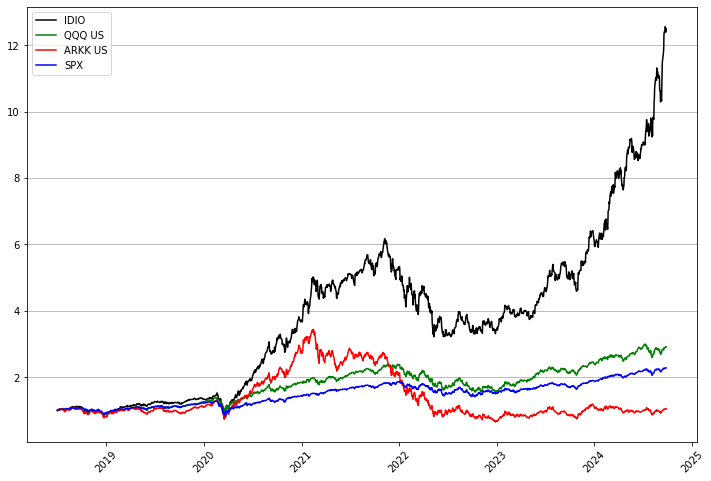

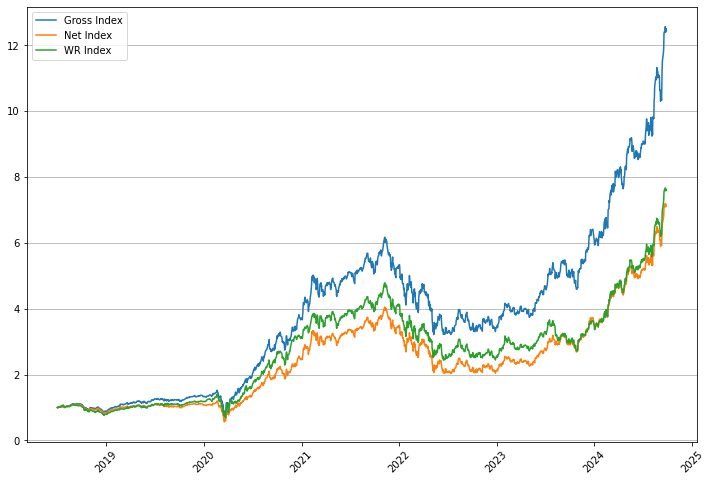


Average F Daily Turnover (%): 27.77
Total F Costs (%): 89.8
Average F Annual Costs (%): 13.99
Average WR Daily Turnover (%): 3.39
Total WR Costs (%): 10.98
Average WR Annual Costs (%): 1.71

DAILY TRADES - WR:
         Curr Port  Prev Port  Delta (%)
APP US       16.62      16.62        0.0
CVNA US      15.00      15.00        0.0
SG US        11.96      11.96        0.0
QTWO US       7.31       7.31        0.0
HIMS US       7.14       7.14        0.0
RUN US        6.34       6.34        0.0
GDDY US       5.89       5.89        0.0
SPOT US       5.75       5.75        0.0
SE US         5.47       5.47        0.0
TMDX US       4.58       4.58        0.0
RCL US        3.33       3.33        0.0
PLTR US       1.75       1.75        0.0
KMI US        1.54       1.54        0.0
OKE US        1.49       1.49        0.0
DASH US       1.35       1.35        0.0
SEMR US       1.31       1.31        0.0
META US       1.31       1.31        0.0
MGNI US       1.00       1.00        0.0
DOCS US   

In [100]:
# PORTFOLIO CONSTRUCTION W/ NAIVE INCREMENTAL MVO AND ESTIMATED ALPHAS, GENERAL AND X-SECTIONAL

import pandas as pd
import math
import numpy as np
import os
import csv
import yfinance as yf
import matplotlib.pyplot as plt
import psycopg2
import requests
import json
import tkinter as tk
import re
from datetime import datetime
from datetime import timedelta
from datetime import date
from sklearn.linear_model import Ridge
from sqlalchemy import create_engine
from sklearn.linear_model import LinearRegression
from statsmodels.tsa.arima.model import ARIMA
from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import PolynomialFeatures
from sklearn.metrics import r2_score
from scipy import optimize 
from scipy.optimize import linprog
import warnings


def annual_reports(SummaryP_df, anchor):
        
    SummaryP_df.index = SummaryP_df.index.map(lambda x: datetime(x.year, x.month, x.day))
    SummaryPY_df = SummaryP_df.resample('Y').last()
    SummaryPY_df.loc[SummaryP_df.index[0]] = 1
    SummaryPY_df = SummaryPY_df.sort_index()
    SummaryPY_df = round(100 * SummaryPY_df.pct_change(), 2).dropna()
    print('Performances:')
    print(SummaryPY_df)
    print('')

    SummaryV_df = round(100 * SummaryP_df.pct_change().ewm(halflife = 84).std() * np.sqrt(252), 2).dropna()
    SummaryVY_df = round(SummaryV_df.resample('Y').mean(), 2)
    print('')
    print('Volatilities:')
    print(SummaryVY_df)
    print('')

    SummaryD_df = round(100 * (SummaryP_df / SummaryP_df.rolling(252, min_periods = 21).max() - 1), 2).dropna()
    SummaryDY_df = SummaryD_df.resample('Y').min()
    print('')
    print('Drawdowns:')
    print(SummaryDY_df)
    print('')

    SummaryC_df = round(100 * ((SummaryP_df[1: ].T ** (252 / SummaryP_df[1:].index.map(lambda x: (x - SummaryP_df.index[0]).days).values)).T - 1), 2)
    SummaryCY_df = SummaryC_df.resample('Y').last()
    print('')
    print('CAGR:')
    print(SummaryCY_df)
    print('')

    SummaryCDY_df = round(SummaryCY_df / abs(SummaryDY_df), 2)
    print('')
    print('CAGR/DD:')
    print(SummaryCDY_df)
    print('')

    SummarySY_df = round(SummaryPY_df / abs(SummaryVY_df), 2)
    print('')
    print('Sharpe:')
    print(SummarySY_df)
    print('')

    SummaryCorr_df = SummaryP_df.rolling(252).corr(SummaryP_df[anchor].rolling(252))
    SummaryCorrY_df = SummaryCorr_df.resample('Y').mean()
    SummaryBY_df = round(SummaryCorrY_df * (SummaryVY_df.T / SummaryVY_df[anchor]).T, 2)
    print('')
    print('Betas ' + anchor + ':')
    print(SummaryBY_df)
    print('')

    SummaryAY_df = round(SummaryPY_df - (SummaryBY_df.T * SummaryPY_df[anchor]).T, 2)
    print('')
    print('Alphas ' + anchor + ':')
    print(SummaryAY_df)    
                
    return

def predictors_to_Cfeatures(pred_df, sector_s):
    exp_g = 3
    std_p = 4    
    m_omd = 3
    value_p = 5            
        
    sector_l = pd.unique(sector_s).tolist()
    pred_df['P/Ee'][pred_df['P/Ee'] < 0] = abs(pred_df['P/Ee'][pred_df['P/Ee'] < 0]) * 100
    pred_df['P/Eo'][pred_df['P/Eo'] < 0] = abs(pred_df['P/Eo'][pred_df['P/Eo'] < 0]) * 100
    pred_df['P/GP'][pred_df['P/GP'] < 0] = abs(pred_df['P/GP'][pred_df['P/GP'] < 0]) * 100
    pred_df['P/S'][pred_df['P/S'] < 0] = abs(pred_df['P/S'][pred_df['P/S'] < 0]) * 100
    pred_df['sP/E'][pred_df['sP/E'] < 0] = abs(pred_df['sP/E'][pred_df['sP/E'] < 0]) * 100
    pred_df['sP/S'][pred_df['sP/S'] < 0] = abs(pred_df['sP/S'][pred_df['sP/S'] < 0]) * 100
    pred_df['sP/GP'][pred_df['sP/GP'] < 0] = abs(pred_df['sP/GP'][pred_df['sP/GP'] < 0]) * 100
    pred_df = fix_na(pred_df, 'r2 S', 'r2 GP')
    pred_df = fix_na(pred_df, 'GS', 'GGP')
    aux_df = pred_df[['sP/S', 'sP/GP']]
    ratio = aux_df.median()['sP/GP'] / aux_df.median()['sP/S']
    aux_df['sP/S'] *= ratio
    aux_df = aux_df.T.fillna(method = 'ffill').T
    pred_df['sP/GP'] = aux_df['sP/GP']    
    
    
    featuresC_df = pd.DataFrame(np.nan, index = pred_df.index, columns = c_features_l)
    featuresC_df['Size'] = np.log(pred_df['Size'])
    
    qual_df = pd.DataFrame(np.nan, index = pred_df.index, columns = ['GS', 'GE', 'GGP'])
    qual_df['GS'] = round(pred_df['GS'] * (pred_df['r2 S'] ** exp_g), 2)
    qual_df['GE'] = round(pred_df['GE'] * (pred_df['r2 E'] ** exp_g), 2)
    qual_df['GGP'] = round(pred_df['GGP'] * (pred_df['r2 GP'] ** exp_g), 2)
    qual_df['Score'] = round(qual_df.min(axis = 1) + qual_df.fillna(0).mean(axis = 1) - std_p * qual_df.fillna(0).std(axis = 1), 2)
    qualF_df = pd.DataFrame(qual_df['Score'])
    qualF_df['Extra Q'] = pd.qcut(pred_df['OM-t0'] + m_omd * (pred_df['OM-t0'] + pred_df['ROId'].fillna(0)), 
                                  q = q_quant, labels = False, duplicates = 'drop')        
    featuresC_df['Quality'] = qualF_df.sum(axis = 1)
    
    growth_df = pd.DataFrame(np.nan, index = pred_df.index, columns = ['GS', 'GE', 'GGP'])
    growth_df['GS'] = round(pred_df['GS'] * (pred_df['r2 S'] ** exp_g), 2)
    growth_df['GE'] = round(pred_df['GE'] * (pred_df['r2 E'] ** exp_g), 2)
    growth_df['GGP'] = round(pred_df['GGP'] * (pred_df['r2 GP'] ** exp_g), 2)
    growth_df['Score'] = round((growth_df.max(axis = 1) + growth_df.fillna(0).mean(axis = 1)) / 2, 2)  
    
    featuresC_df['Growth'] = (((pred_df['OM-t0'] / pred_df[['GS', 'GE', 'GGP']].std(axis = 1)) * pred_df['GS'] * 
                               (pred_df['r2 S'] ** 10) + pred_df['GE'] * (pred_df['r2 E'] ** 10) + 1 * pred_df['GGP'] * 
                               (pred_df['r2 GP'] ** 10) + pred_df['OM-t0'] * np.sqrt(pred_df['OMd'])) * 
                              (pred_df[['r2 S', 'r2 GP', 'r2 E']].sum(axis = 1) ** 3) / (pred_df[['S Vol', 'GP Vol', 'E Vol']].min(axis = 1) ** (1 / 5)))
    
    featuresC_df['Value S'] = (3 * pred_df['sP/E'] + pred_df['sP/GP']) / 4
        
    value_df = pd.DataFrame(np.nan, index = pred_df.index, columns = ['P/S', 'P/E'])
    value_df['P/S'] = pd.qcut(pred_df['P/S'], q = q_quant, labels = False, duplicates = 'drop')
    value_df['P/E'] = pd.qcut(pred_df['P/Ee'] + pred_df['P/Eo'] + value_p * abs(pred_df['P/Ee'] - pred_df['P/Eo']), 
                              q = q_quant, labels = False, duplicates = 'drop')
    value_df['Score'] = round((value_df['P/S'] / pred_df['r2 S'].fillna(0) + value_df['P/E'] / pred_df['r2 E'].fillna(0)) / 
                              (1 / pred_df['r2 S'].fillna(0) + 1 / pred_df['r2 E'].fillna(0)), 2)
    featuresC_df['Value F'] = value_df['Score']

    featuresC_df['Reliability'] = ((pred_df[['S Vol', 'E Vol', 'GP Vol']].median(axis = 1) * 2 + 
                                    pred_df[['S Vol', 'E Vol', 'GP Vol']].mean(axis = 1)) / 3)
    featuresC_df['Reliability'] /= pred_df[['r2 S', 'r2 E', 'r2 GP']].sum(axis = 1)
    
    for c_feat in c_features_l:
        mult = 1
        if (c_feat == 'Size') | (c_feat == 'Value S') | (c_feat == 'Value F') | (c_feat == 'Reliability'):
            mult = -1    
        if (XSection_adj):
            for c_sec in sector_l:
                MSec_l = [t for t in featuresC_df.index if t in sector_s[sector_s == c_sec].index]
                featuresC_df.loc[MSec_l, c_feat] += featuresC_df.loc[MSec_l, c_feat].min()
                featuresC_df.loc[MSec_l, c_feat] = winsorize(featuresC_df.loc[MSec_l, c_feat] * mult, winsor_L, 
                                                             winsor_H).values     
                featuresC_df.loc[MSec_l, c_feat] = pd.qcut(featuresC_df.loc[MSec_l, c_feat] * mult, q = q_quant, 
                                                           labels = False, duplicates = 'drop')                
        else:
            featuresC_df[c_feat] = winsorize(featuresC_df[c_feat] * mult, winsor_L, winsor_H).values
            featuresC_df[c_feat] = pd.qcut(featuresC_df[c_feat] * mult, q = q_quant, labels = False, duplicates = 'drop')            

    featuresC_df = featuresC_df.fillna(0)
    featuresC_df -= featuresC_df.mean()
    featuresC_df /= featuresC_df.std()
    
    return featuresC_df

def predictors_to_Mfeatures(MacroPxs_df, sPxs_df, m_features_l, sector_s):
        
    sector_l = pd.unique(sector_s).tolist()
    MacroPxs_df['US10YR RR'] = MacroPxs_df['USGG10YR'] - MacroPxs_df['T10YIE']
    MacroPxs_df['YC'] = MacroPxs_df['USGG10YR'] - MacroPxs_df['USGG2YR']
    MacroPxs_df['2Y IR Vol'] = MacroPxs_df['USGG2YR'].ewm(halflife = hl).std() * np.sqrt(252)
    MacroPxs_df = MacroPxs_df.loc[sPxs_df.index]
    MacroPxs_df = (MacroPxs_df - MacroPxs_df.ewm(halflife = hl).mean())
    MacroPxs_df = MacroPxs_df.pct_change()

    MacroFactor_df = pd.DataFrame(np.nan, index = sPxs_df.columns, columns = m_features_l)
    for c_mf in m_features_l:
        c_mf_s = sPxs_df.pct_change().join(MacroPxs_df[c_mf])[-hl:].cov()[c_mf].drop(c_mf)    
        featVar_s = MacroPxs_df[c_mf].ewm(halflife = hl).var().iloc[-1]
        MacroFactor_df[c_mf] = c_mf_s / featVar_s
        
    for c_sec in sector_l:
        MSec_l = [t for t in MacroFactor_df.index if t in sector_s[sector_s == c_sec].index]
        for c_mf in m_features_l:            
            MacroFactor_df.loc[MSec_l, c_mf] += MacroFactor_df.loc[MSec_l, c_mf].min()             
    for c_feat in m_features_l:  
        if (XSection_adj):
            for c_sec in sector_l:
                MSec_l = [t for t in MacroFactor_df.index if t in sector_s[sector_s == c_sec].index]
                MacroFactor_df.loc[MSec_l, c_feat] += MacroFactor_df.loc[MSec_l, c_feat].min()
                MacroFactor_df.loc[MSec_l, c_feat] = winsorize(MacroFactor_df.loc[MSec_l, c_feat], winsor_L, winsor_H).values              
        else:
            MacroFactor_df[c_feat] = winsorize(MacroFactor_df[c_feat], winsor_L, winsor_H).values              
    naT_l = MacroFactor_df.isna().sum(axis = 1)[MacroFactor_df.isna().sum(axis = 1) > 0].index
    naF_l = MacroFactor_df.loc[naT_l].T[MacroFactor_df.loc[naT_l].T.isna()].index.tolist()  
    MacroFactor_df.loc[naT_l, naF_l] = MacroFactor_df.median().values
    MacroFactor_df -= MacroFactor_df.mean()
    MacroFactor_df /= MacroFactor_df.std()

    return MacroFactor_df, MacroPxs_df[m_features_l]

def predictors_to_Pfeatures(sPxs_df, p_features_l, sector_s):

    lag_M1 = -250
    lag_M2 = -125
    lag_M3 = -20
    beta_adj = True
    
    featuresP_df = pd.DataFrame(np.nan, index = sPxs_df.columns, columns = p_features_l)
    sRetPxs_df = sPxs_df.pct_change().dropna()
    sRetMkt_s = sMkt_s.pct_change().dropna()    
    sCovPxs_s = sRetPxs_df.ewm(halflife = hl).cov(sRetMkt_s.ewm(halflife = hl)).iloc[-1]
    sVarMkt = sRetMkt_s.ewm(halflife = hl).cov(sRetMkt_s.ewm(halflife = hl)).iloc[-1]
    featuresP_df['Beta'] = sCovPxs_s / sVarMkt
    featuresP_df['Vol'] = sRetPxs_df.ewm(halflife = hl).std().iloc[-1]
    for c_sec in pd.unique(sector_s):
        MSec_l = [t for t in featuresP_df.index if t in sector_s[sector_s == c_sec].index]
        featuresP_df.loc[MSec_l, 'Momentum'] = (featuresP_df.loc[MSec_l].index.map(lambda x: sPxs_df[x].iloc[lag_M3]) / 
                                                featuresP_df.loc[MSec_l].index.map(lambda x: sPxs_df[x].iloc[lag_M1]))
        featuresP_df.loc[MSec_l, 'Momentum'] /= featuresP_df.loc[MSec_l, 'Momentum'].min()     
    for c_feat in featuresP_df.columns:
        featuresP_df[c_feat] = winsorize(featuresP_df[c_feat], winsor_L, winsor_H).values
    
    return featuresP_df

def factor_shrink(style_df):

    reliab_f = 2
    qualit_f = 15
    growth_f = 25
    value_f = 5  
    ac_factor = 0.5

    qualityBasedS_s = (style_df['Reliability'] * reliab_f + style_df['Quality'] * qualit_f + 
                    style_df['Growth'] * growth_f + style_df['Value F'] * value_f)
    valueBasedS_s = style_df['Value S']   
    momBasedS_s = style_df['Momentum']
    volBasedS_s = style_df['Vol']     
    qualityBasedS_s.name = 'Quality'
    valueBasedS_s.name = 'Value'
    momBasedS_s.name = 'Momentum'
    volBasedS_s.name = 'Vol'
    processedF_df = pd.DataFrame(qualityBasedS_s).join(valueBasedS_s).join(momBasedS_s).join(volBasedS_s)
    processedF_df -= processedF_df.mean()
    processedF_df /= processedF_df.std()
    processedF_df = processedF_df.drop_duplicates()
    processedF_df = processedF_df.dropna(axis = 1, how = 'all')
    
    return processedF_df

def round_down(n, decimals = 0): 
    multiplier = 10 ** decimals 
    return int(math.floor(n * multiplier) / multiplier)

def Set_DF(dframe):
    
    dframe.index = dframe[dframe.columns.values.tolist()[0]]
    dframe.index.name = dframe.columns.values.tolist()[0]
    New_df = dframe.drop(dframe.columns.values.tolist()[0], axis=1)
    
    return New_df

def DD_Index(dframe):
    
    dframe['dummy'] = dframe.index
    dframe.drop_duplicates(['dummy'], inplace=True)
    dframe.drop('dummy', axis=1, inplace=True)
    New_df = dframe
    
    return New_df 

def open_df(*args):
    open_str = args[0]
    
    query_open = 'SELECT * FROM ' + open_str
    opened_df = pd.read_sql_query(query_open, engine)
    opened_df = Set_DF(opened_df)
    opened_df = DD_Index(opened_df)
    opened_df = opened_df.sort_index()
    
    return opened_df

def fix_na(base_df, col_b, col_t):

    aux = base_df[[col_b, col_t]]
    aux = aux.T.fillna(method = 'ffill').T
    base_df[col_t] = aux[col_t]
    
    return base_df

def winsorize(Rt_s, floor, cap):
    
    w_up = np.quantile(Rt_s.dropna().values, q = cap)
    w_down = np.quantile(Rt_s.dropna().values, q = floor)    
    w_s = Rt_s.clip(w_down, w_up)
    
    return w_s

def get_predictors(c_date, exclusion_l):
    
    rel_found = False
    count = 0
    attempts_cap = 30
    while (not rel_found) & (count < attempts_cap):
        try:
            pred_df = open_df('valuation_' + c_date.strftime('%Y%m%d') + selection_scope)
            rel_found = True            
        except:
            c_date = c_date - timedelta(1)
            c_date = c_date - timedelta((c_date.weekday() % 4) * (c_date.weekday() // 4))
            count += 1
    
    pred_df = pred_df.dropna(thresh = pred_df.shape[1] // 2)
    pred_df['P/Ee'][pred_df['P/Ee'] <= 0] = 100
    pred_df['P/Eo'][pred_df['P/Eo'] <= 0] = 100
    pred_df['P/S'][pred_df['P/S'] <= 0] = 100  
    exclusion_l = [t for t in exclusion_l if t in pred_df.index]
    pred_df = pred_df.drop(exclusion_l)
    
    return pred_df, c_date

def loadings(ret_s, res_s):
    
    Pbeta = 0
    PZ = 0      
    if (res_s.std() != 0):
        Pbeta = round(res_s.cov(ret_s) / (res_s.std() ** 2), 3)
        if (ret_s.std() != 0):        
            PZ = round(abs(Pbeta) / ((ret_s.std() ** 2) / (res_s.std() ** 2)), 3)
    
    return Pbeta, PZ

def mlr(ALLfeatures_df):
    
    model = LinearRegression()
    lr_mod = model.fit(ALLfeatures_df[all_features_l].values, ALLfeatures_df['Rt'].values)
    lr_values = lr_mod.predict(ALLfeatures_df[all_features_l].values)
    fRet_s = round(pd.Series(lr_mod.coef_, index = all_features_l), 3)
    fRet_s.name = 'MLR Factor Rets'
    fcast_s = pd.Series(lr_values, index = ALLfeatures_df.index)
    fcast_s.name = 'Ret Fcast'   
    y0 = lr_mod.intercept_
    mlr_r2 = round(100 * lr_mod.score(ALLfeatures_df[all_features_l].values, ALLfeatures_df['Rt'].values), 2)
    
    return fcast_s, fRet_s, y0, mlr_r2

def w_mlr(x_m, y_a, w_a, idx_l, c_l, itcp):
    
    model = LinearRegression(fit_intercept = itcp)
    lr_mod = model.fit(x_m, y_a, w_a)
    lr_values = lr_mod.predict(x_m)
    fRet_s = pd.Series(lr_mod.coef_, index = c_l)    
    fcast_s = pd.Series(lr_values, index = idx_l)
    fRet_s.name = 'wMLR Factor Rets'
    fcast_s.name = 'wMLR Ret Fcast'   
    y0 = lr_mod.intercept_
    mlr_r2 = round(100 * lr_mod.score(x_m, y_a, w_a), 2)
    
    return fcast_s, fRet_s, y0, mlr_r2

def ridge(x_m, y_a, idx_l, c_l):
    
    xv_n = 10
    ridge_n = 30
    step = 3  
    lambda_penalty = 10
    
    lambda_array = np.arange(ridge_n)
    lambda_array = lambda_array[::step]
    x_df = pd.DataFrame(x_m.T)
    y_df = pd.DataFrame(y_a.T)

    cv_mse_df = pd.DataFrame(np.nan, index = lambda_array, columns = ['Train', 'Val'])
    beta_df = pd.DataFrame(np.nan, index = lambda_array, columns = np.arange(x_df.shape[1]).tolist() + ['df'])
    val_r2 = np.inf
    shift_lambda = False
    for c_lambda in lambda_array:
        if (shift_lambda):
            c_lambda += lambda_penalty
        try:        
            Rmodel = Ridge(alpha = c_lambda, normalize = False, tol = 0.001, solver = 'auto', random_state = 42)
            valRMSE_tot = 0
            trainRMSE_tot = 0
            for c in np.arange(xv_n):
                init_v = xv_n * c
                end_v = init_v + xv_n
                valX_df = x_df.iloc[init_v: end_v]
                valY_df = y_df.iloc[init_v: end_v]
                trainX_df = x_df.drop(valX_df.index)
                trainY_df = y_df.drop(valX_df.index)

                I_m = np.identity(trainX_df.shape[1])
                lambda_matrix = I_m * np.array([c_lambda] * trainX_df.shape[1])
                beta_array = np.linalg.inv((trainX_df.T.values.dot(trainX_df.values)) + lambda_matrix).dot(trainX_df.T.values.dot(trainY_df.values))
                hat_matrix = (trainX_df.values).dot(np.linalg.inv((trainX_df.T.values.dot(trainX_df.values)) + lambda_matrix)).dot(trainX_df.T.values)        

                if (c == 0):
                    edf = np.trace(hat_matrix)
                    beta_df.loc[c_lambda] = pd.DataFrame(beta_array)[0].tolist() + [edf]

                ridge_mod = Rmodel.fit(trainX_df.values, trainY_df.values)
                trainRidge_f = ridge_mod.predict(trainX_df.values)
                valRidge_f = ridge_mod.predict(valX_df.values)
                trainRidge_mse = np.sum((trainY_df.values - trainRidge_f) ** 2)
                valRidge_mse = np.sum((valY_df.values - valRidge_f) ** 2)
                trainRMSE_tot += trainRidge_mse 
                valRMSE_tot += valRidge_mse 
            cv_mse_df.loc[c_lambda, 'Train'] = 100 * trainRMSE_tot / xv_n
            cv_mse_df.loc[c_lambda, 'Val'] = 100 * valRMSE_tot / xv_n
            if (valRMSE_tot < val_r2):
                bestRidge_f = ridge_mod.predict(x_df.values)
                bestRidge_fr = pd.DataFrame(beta_array)[0].values
                bestLambda = c_lambda
                Rintercept = ridge_mod.intercept_
                val_r2 = valRMSE_tot
                best_edf = edf
        except:
            val_r2 = np.inf
            shift_lambda = True
            print('Ridge lambda' + str(c_lambda) + ' singular!!')            

    bestRidgeRt_s = pd.Series(pd.DataFrame(bestRidge_f)[0].values, index = idx_l)
    bestRidgeFS_s = round(pd.Series(bestRidge_fr, index = c_l), 3)
    bestRidgeFS_s.name = 'Ridge Factor Rets'
    beta_df.index = beta_df['df']
    beta_df = beta_df.drop(['df'], axis = 1)
    beta_df.sort_index().plot(figsize = (12, 8))
    plt.show()
    cv_mse_df['Val'].plot(figsize = (12, 8), c = 'r')
    plt.title('Ridge, df = ' + str(round(best_edf, 2)) + ' out of ' + str(x_m.shape[0]))
    plt.show()
    Ridge_r2 = round(100 * (pd.DataFrame(bestRidge_f).join(y_df, rsuffix = '_label').corr().iloc[0, 1] ** 2), 3)

    return bestRidgeRt_s, bestRidgeFS_s, Rintercept, Ridge_r2, bestLambda

def interest_pxs(port_s, Pxs_df):

    add_l = [t for t in port_s.index if t not in Pxs_df.columns]       
    compPx_df = pd.DataFrame(np.nan, index = Pxs_df.index[-long_w: ], columns = ['dummy'])
    for missing_t in add_l:
        try:
            ticker_s = yf.download([t_dikt[missing_t]], period = str(long_w + 200) + 'd')['Close']
            ticker_s.index = ticker_s.index.map(lambda x: x.date())
            ticker_s.name = missing_t
            compPx_df = compPx_df.join(ticker_s)
        except:
            print(missing_t + ' FAILED')
    
    compPx_df = compPx_df.fillna(method = 'bfill').fillna(method = 'ffill')
    IntPxs_df = Pxs_df.join(compPx_df)[port_s.index][-long_w:]
    IntPxs_df = IntPxs_df.fillna(method = 'bfill').fillna(method = 'ffill')
    
    return IntPxs_df

def calc_cov(port_s, cPort_s, IntPxs_df):

    missingA_l = [t for t in LJJPort_lastA_s.index if t not in cPort_s.index]
    mPort_s = pd.Series(cPort_s.median(), index = missingA_l)
    cPort_s = pd.concat([cPort_s, mPort_s]).sort_values()
    cov_df = IntPxs_df.pct_change()[-252:].ewm(halflife = hl).cov().loc[IntPxs_df.index[-1]]
    
    return cov_df, cPort_s

def MaximizeReturns(MeanReturns, PortfolioSize):
    
    c = (np.multiply(-1, MeanReturns))
    A = np.ones([PortfolioSize,1]).T
    b=[1]
    res = linprog(c, A_ub = A, b_ub = b, bounds = (0,1), method = 'highs') 
    
    return res

def MinimizeRisk(CovarReturns, PortfolioSize):
    
    def  f(x, CovarReturns):
        func = np.matmul(np.matmul(x, CovarReturns), x.T) 
        return func

    def constraintEq(x):
        A=np.ones(x.shape)
        b=1
        constraintVal = np.matmul(A,x.T)-b 
        return constraintVal
    
    xinit=np.repeat(0.1, PortfolioSize)
    cons = ({'type': 'eq', 'fun':constraintEq})
    lb = 0
    ub = 1
    bnds = tuple([(lb,ub) for x in xinit])

    opt = optimize.minimize (f, x0 = xinit, args = (CovarReturns),  bounds = bnds, \
                             constraints = cons, tol = 10**-3)
    
    return opt

def MinimizeRiskConstr(MeanReturns, CovarReturns, PortfolioSize, R):
    
    def  f(x,CovarReturns):
         
        func = np.matmul(np.matmul(x,CovarReturns ), x.T)
        return func

    def constraintEq(x):
        AEq=np.ones(x.shape)
        bEq=1
        EqconstraintVal = np.matmul(AEq,x.T)-bEq 
        return EqconstraintVal
    
    def constraintIneq(x, MeanReturns, R):
        AIneq = np.array(MeanReturns)
        bIneq = R
        IneqconstraintVal = np.matmul(AIneq,x.T) - bIneq
        return IneqconstraintVal
    

    xinit=np.repeat(0.1, PortfolioSize)
    cons = ({'type': 'eq', 'fun':constraintEq},
            {'type':'ineq', 'fun':constraintIneq, 'args':(MeanReturns,R) })
    lb = 0
    ub = 1
    bnds = tuple([(lb,ub) for x in xinit])

    opt = optimize.minimize (f, args = (CovarReturns), method ='trust-constr',  \
                        x0 = xinit,   bounds = bnds, constraints = cons, tol = 10**-3)
    
    return  opt

def MaximizeSharpeRatioOptmzn(MeanReturns, CovarReturns, RiskFreeRate, PortfolioSize):
    
    # define maximization of Sharpe Ratio using principle of duality
    def  f(x, MeanReturns, CovarReturns, RiskFreeRate, PortfolioSize):
        funcDenomr = np.sqrt(np.matmul(np.matmul(x, CovarReturns), x.T) )
        funcNumer = np.matmul(np.array(MeanReturns),x.T)-RiskFreeRate
        func = -(funcNumer / funcDenomr)
        return func

    #define equality constraint representing fully invested portfolio
    def constraintEq(x):
        A=np.ones(x.shape)
        b=1
        constraintVal = np.matmul(A,x.T)-b 
        return constraintVal
    
    
    #define bounds and other parameters
    xinit=np.repeat(0.33, PortfolioSize)
    cons = ({'type': 'eq', 'fun':constraintEq})
    lb = 0
    ub = 1
    bnds = tuple([(lb,ub) for x in xinit])
    
    #invoke minimize solver
    opt = optimize.minimize (f, x0 = xinit, args = (MeanReturns, CovarReturns,\
                             RiskFreeRate, PortfolioSize), method = 'SLSQP',  \
                             bounds = bnds, constraints = cons, tol = 10**-3)
    
    return opt

def BiCriterionFunctionOptmzn(MeanReturns, CovarReturns, RiskAversParam, PortfolioSize, AllocCap, AllocFloor):
       
    def  f(x, MeanReturns, CovarReturns, RiskAversParam, PortfolioSize):
        PortfolioVariance = np.matmul(np.matmul(x, CovarReturns), x.T) 
        PortfolioExpReturn = np.matmul(np.array(MeanReturns),x.T)
        func = RiskAversParam * PortfolioVariance - (1-RiskAversParam)*PortfolioExpReturn
        return func

    def ConstraintEq(x):
        A = np.ones(x.shape)
        b = 1
        constraintVal = np.matmul(A, x.T) - b 
        return constraintVal
    
    xinit=np.repeat(0.01, PortfolioSize)
    cons = ({'type': 'eq', 'fun':ConstraintEq})
    bnds = [(AllocFloor, AllocCap)] * PortfolioSize

    opt = optimize.minimize (f, x0 = xinit, args = ( MeanReturns, CovarReturns,\
                                                    RiskAversParam, PortfolioSize), \
                             method = 'SLSQP',  bounds = bnds, constraints = cons, \
                             tol = 10**-3)
    return opt

def mvo(alphas_s, cov_m, r0, select_universe, port_size, AllocCap):
    
    alphas_a = alphas_s.values
    # MARKOWITZ, OPTIMAL EX-ANTE SHARPE
    maxSharpeRatio = 0
    result = MaximizeSharpeRatioOptmzn(alphas_a / 100, cov_m / 10000, r0 / 100, select_universe)
    markS_a = result.x
    Risk = markS_a.dot(cov_m).dot(markS_a.T) ** (1 / 2) * 100
    expReturn = alphas_a.dot(markS_a.T) * 100
    maxSharpeRatio = (np.array(expReturn) - r0) / Risk   
    markS_s = round(pd.Series(markS_a, index = alphas_s.index), 4).sort_values(ascending = False)

    # MARKOWITZ, CAPPED EX-ANTE PORTFOLIO VOL, ALLOCATION BOUNDS
    xOptimal =[]
    minRiskPoint = []
    expPortfolioReturnPoint =[]
    for points in range(0, ra_scenarios):
        ra_p = points / ra_scenarios
        result = BiCriterionFunctionOptmzn(alphas_a / 100, cov_m / 10000, ra_p, select_universe, AllocCap, AllocFloor)
        xOptimal.append(result.x)
    xOptimalArray = np.array(xOptimal)
    riskPoint = (np.diagonal(xOptimalArray.dot(cov_m).dot(xOptimalArray.T)) ** (1 / 2)) * 100
    retPoint= xOptimalArray.dot(alphas_a) * 100
    riskRet_s = pd.Series(retPoint, index = riskPoint)
    C_volP_cap = max(volP_cap, riskRet_s.index.min())
    sharpe_s = pd.Series(riskRet_s[riskRet_s.index <= C_volP_cap].values / riskRet_s[riskRet_s.index <= C_volP_cap].index.values)
    best_c = sharpe_s.argmax()
    markSC_a = xOptimalArray[best_c]  
    markSC_s = round(pd.Series(markSC_a, index = alphas_s.index), 4).sort_values(ascending = False)

    alloc_s = (((markSC_s + markS_s) / 2).sort_values()[-port_size:] / ((markSC_s + markS_s) / 2).sort_values()[-port_size:].sum()).fillna(0)
        
    return alloc_s

def cap_sn(alloc_s):

    alloc_x = alloc_s[alloc_s > AllocCap]
    while (alloc_x.shape[0] > 0):
        alloc1_s = alloc_s[alloc_s < AllocCap]
        alloc2_s = alloc_x - AllocCap
        excess = alloc2_s.sum()
        alloc1_s += (alloc1_s * excess) / alloc1_s.sum()
        alloc_x -= alloc2_s
        alloc_s = pd.concat([alloc1_s, alloc_x]).sort_values()    
        alloc_x = alloc_s[alloc_s > AllocCap]
        
    return alloc_s.sort_values(ascending = False)

def devAdj_size(SPxs_df, alloc_s):

    MAV_w = 63
    zs_cap = 3
    zs_floor = -2.0
    penalty_r = 2
    boost_r = 2

    allocPerf_s = (SPxs_df[alloc_s.index].iloc[-1] / SPxs_df[alloc_s.index][-MAV_w:].mean() - 1)
    vol_S = (SPxs_df[alloc_s.index].pct_change().ewm(halflife = MAV_w).std() * np.sqrt(10)).iloc[-1]
    MAVDev_S = round(allocPerf_s / vol_S, 3)
    penalty_s = (MAVDev_S - zs_cap).clip(0, 100)
    boost_s = (zs_floor - MAVDev_S).clip(0, 100)
    Fpenalty_s = pd.Series(np.exp(penalty_s.values / penalty_r), index = penalty_s.index)
    Fboost_s = pd.Series(np.exp(boost_s.values / boost_r), index = boost_s.index)
    Falloc_s = alloc_s / Fpenalty_s
    Falloc_s *= Fboost_s
    leaveOUT_l = Fpenalty_s[Fpenalty_s > 1].index.tolist() + Fboost_s[Fboost_s > 1].index.tolist() + Falloc_s[Falloc_s == AllocCap].index.tolist()
    adj_l = [t for t in Falloc_s.index if t not in leaveOUT_l]
    adj_size = 1 - Falloc_s.sum()
    Falloc_s.loc[adj_l] = Falloc_s.loc[adj_l] * (1 + adj_size / Falloc_s.loc[adj_l].sum())
    diff_s = round(Falloc_s - alloc_s, 2)
    Falloc_s.name = 'Alloc'
    if (abs(diff_s).sum() > 1):
        print('RELEVANT ADJUSTMENTS:')
        print(diff_s)
        print('')  
    
    return Falloc_s

def proportional_port(ALLfeatures_df, select_universe, xv_list, FactRets_df, Idio_df, dt):

    int_features_l = ['Momentum', 'Quality']
    scope_features_l = int_features_l + m_features_l + ['Beta', 'Vol', 'Value']
    concentration_f = 5
    idio_w = 5
    momentum_r = [1, 2, 4]
    quality_r = [2, 3, 4]
    hl_idio = 252

    FactRets_df = FactRets_df.dropna(how = 'all')
    Idio_df = Idio_df.dropna(how = 'all')

    best_sharpe = -np.inf
    cv_df = pd.DataFrame(np.nan, index = np.arange(len(momentum_r) + len(quality_r)) + 1, columns = xv_list)
    c = 1
    beta_adj = True
    diverse_adj = True
    for momentum_w in momentum_r:
        for quality_w in quality_r:
            QualMLRfExp_s = round(100 * (ALLfeatures_df['Quality'].clip(0, ALLfeatures_df['Quality'].max()) * 
                                         FactRets_df['Quality'].dropna(how = 'all').ewm(halflife = hl).mean().iloc[-1] / 
                                         FactRets_df['Quality'].dropna(how = 'all').ewm(halflife = hl).std().iloc[-1]), 2)
            MomMLRfExp_s = round(100 * (ALLfeatures_df['Momentum'].clip(0, ALLfeatures_df['Momentum'].max()) * 
                                        FactRets_df['Momentum'].dropna(how = 'all').ewm(halflife = hl).mean().iloc[-1] / 
                                        FactRets_df['Momentum'].dropna(how = 'all').ewm(halflife = hl).std().iloc[-1]), 2)
            IdioMLRfExp_s = round(100 * Idio_df.dropna(how = 'all')[-hl_idio:].ewm(halflife = hl_idio // 2).mean().iloc[-1].dropna() / Idio_df.dropna(how = 'all')[-hl_idio:].ewm(halflife = hl_idio // 4).std().iloc[-1].dropna(), 2)
            MomMLRfExp_s.name = 'Momentum'
            QualMLRfExp_s.name = 'Quality'
            IdioMLRfExp_s.name = 'Idio'

            expAlpha_df = pd.DataFrame(MomMLRfExp_s).join(QualMLRfExp_s).join(IdioMLRfExp_s)
            expAlpha_df /= expAlpha_df.std()
            expAlpha_df['Alloc'] = round((expAlpha_df['Momentum'] * momentum_w + expAlpha_df['Quality'] * quality_w + 
                                          expAlpha_df['Idio'] * idio_w) / (momentum_w + quality_w + idio_w), 2)

            cfLport_s = expAlpha_df.sort_values(by = ['Alloc'], ascending = False)['Alloc'].dropna()
            cLport_s = (cfLport_s[:port_size] * 100) ** concentration_f
            cLport_s /= abs(cLport_s.sum())
            cLport_s = round(100 * cLport_s, 3)                       

            cLport_df = pd.DataFrame(cLport_s)
            cLport_df['Naive NMV'] = round(init_cap * cLport_s / 100, 0)
            cLport_df[scope_features_l] = round((ALLfeatures_df.loc[cLport_df.index, scope_features_l].T * cLport_df['Naive NMV']).T, 1)
            beta = 1
            diverse_adj 
            if (beta_adj):        
                beta = round((cLport_s / 100 * ALLfeatures_df['Beta'].loc[cLport_s.index]).sum(), 4)
            diverse_idx = 1
            if (diverse_adj):  
                diverse_s = cLport_df.index.map(lambda x: sector_s.loc[x]).value_counts() / cLport_s.index.map(lambda x: sector_s.loc[x]).value_counts().sum()
                diverse_idx = 1 / (diverse_s ** 2).sum()
            Lcov_m = Pxs_df[cLport_df.index][-5 * hl:].pct_change().dropna().ewm(halflife = hl).cov().loc[Pxs_df.index[-1]]
            cLport_vol = round(100 * ((cLport_df['Naive NMV'] / cLport_df['Naive NMV'].sum()).values.dot(Lcov_m).dot((cLport_df['Naive NMV'] / cLport_df['Naive NMV'].sum()).values) * (252)).sum() ** (1 / 2), 2)
            expA = ((expAlpha_df.loc[cLport_s.index]['Alloc'] ** 2) / expAlpha_df.loc[cLport_s.index]['Alloc'].sum()).sum() * 252
            cexpS =  expA / (np.exp(beta) * cLport_vol) * (diverse_idx ** (1 / 2))

            if (cexpS > best_sharpe):
                best_sharpe = cexpS
                fLport_s = cfLport_s.copy()
                Lport_s = cLport_s.copy()
                Lport_df = cLport_df.copy()
                Lport_vol = cLport_vol
            cv_df.loc[c, 'M W'] = momentum_w
            cv_df.loc[c, 'Q W'] = quality_w
            cv_df.loc[c, 'Vol'] = cLport_vol
            cv_df.loc[c, 'Sharpe'] = round(cexpS, 3)
            cv_df.loc[c, 'Beta'] = round(beta, 3)
            cv_df.loc[c, 'Diverse Idx'] = round(diverse_idx, 3)
            c += 1

    return fLport_s, Lport_s, cv_df

def on_selection_models(value):
    global target_model
    target_model = value
    root.destroy()
    
def clean_dates(dt_range, exclusionDates_l):
    
    auxDt_s = pd.Series(dt_range)
    auxDt_s.index = pd.Series(dt_range).map(lambda x: x.strftime('%m%d')).tolist()
    validDT_l = [d for d in auxDt_s.index.tolist() if d not in exclusionDates_l]
    dt_range = sorted(pd.unique(auxDt_s.loc[validDT_l].tolist()).tolist())
    
    return dt_range    
    
def start_models(dt_range, Sectors_df, Pxs_df, FactorRets_df, IdioRets_df):
        
    sector_s = Sectors_df[Sectors_df['Custom Sector 1'].isna() == False]['Custom Sector 1']
    for idx, c_dt in enumerate(dt_range):    
        p_dt = Pxs_df.index[Pxs_df.index.tolist().index(c_dt) - 1]
        valid_start = False 
        pred_dt = c_dt
        while (not valid_start):
            pred_df, c_date = get_predictors(pred_dt, exclusion_l)
            exc_ffields = [f for f in all_fundamentals_l if f not in pred_df.columns]
            exc_tickers = [t for t in pred_df.index if t not in sector_s.index]
            if (len(exc_ffields) == 0):
                pred_df = pred_df.drop(exc_tickers)
                valid_start = True
                print('Fundamentals date: ' + c_date.strftime('%d-%b-%Y'))
            else:
                pred_dt = Pxs_df[Pxs_df.index < pred_dt].index[-1]
        Check_s = round(100 * Pxs_df[-long_w:][pred_df.index].pct_change().rolling(volCheck_w).std().iloc[-1], 4)
        SBweights_s = np.log(pred_df['Size'])
        sizeExc_l = SBweights_s[SBweights_s.replace({np.inf: np.nan, -np.inf: np.nan}).isna()].index.tolist()
        zeroVol_l = Check_s[Check_s == 0].index.tolist()
        excall_l = pd.unique(sizeExc_l + zeroVol_l).tolist()
        pred_df = pred_df.drop(excall_l)
        asset_l = pred_df.index.tolist()
        
        FlatWeights_s = pd.Series(1, index = pred_df.index)       
        sIdioRets_df = IdioRets_df[IdioRets_df.index < c_dt].dropna(how = 'all')
        if (sIdioRets_df.shape[0] >= (2 * hl)):
            var_s = sIdioRets_df[-252:][asset_l].ewm(halflife = hl).var().iloc[-1]
            mean_var = var_s.mean()
            VBWeights_s = var_s.fillna(mean_var) ** (-1)
            VBWeights_s /= VBWeights_s.std()
            Weights_s = VBWeights_s[asset_l].copy()
            print('idio var weights')
        else:
            Weights_s = SBweights_s[asset_l].copy()
            print('size weights')
                
        FactorLoadings_df = pd.DataFrame(np.nan, index = asset_l, columns = SLICEall_features_l)
        MacroPxs_df = Pxs_df[Pxs_df.index < c_dt][macroFeatures_l][-long_w: ]
        sPxs_df = Pxs_df[Pxs_df.index < c_dt][-long_w: ][asset_l]
        sMkt_s = Pxs_df[Pxs_df.index < c_dt][-long_w: ][anchor_asset]

        ## LOADINGS ENGINEERING, TIME SERIES

        featuresP_df = predictors_to_Pfeatures(sPxs_df, p_features_l, sector_s)
        featuresC_df = predictors_to_Cfeatures(pred_df, sector_s)
        featuresM_df, MacroFeatures_df = predictors_to_Mfeatures(MacroPxs_df, sPxs_df, m_features_l, sector_s)
        style_df = featuresP_df.join(featuresC_df)
        XSStyleLoadings_df = factor_shrink(style_df)

        ## INTERCEPT, BETA RETURNS AND RESIDUALS, CROSS SECTION: SIMPLE LINEAR MODEL (LN(MKT CAP) AS WEIGHTS) - 1
        
        sBetas_s = featuresP_df['Beta']
        XSMktRet = Pxs_df[anchor_asset].loc[c_dt] / Pxs_df[anchor_asset].loc[p_dt] - 1
        RawAssetRets_s = Pxs_df[asset_l].loc[c_dt] / Pxs_df[asset_l].loc[p_dt] - 1
        XSAssetRets = winsorize(RawAssetRets_s, winsor_L, winsor_H)
        XSBetaRet = sBetas_s.cov(XSAssetRets) / sBetas_s.var()
        XSBetaRet_s = sBetas_s * XSBetaRet
        XSBetaRes_s = XSAssetRets - XSBetaRet_s        

        WXSBStockRet_s, WXSBetaRet, WBy0, WBmlr_r2 = w_mlr(sBetas_s.values.reshape(-1, 1), XSAssetRets.values, Weights_s.values, 
                                                           sBetas_s.index, [sBetas_s.name], True)
        FactorRets_df.loc[c_dt, 'Market'] = WBy0
        FactorRets_df.loc[c_dt, sBetas_s.name] = WXSBetaRet.values[0]
        WXSBetaRes_s = XSAssetRets - WXSBStockRet_s
        FactorLoadings_df['Market'] = 1
        FactorLoadings_df[sBetas_s.name] = sBetas_s

        ## CROSS SECTION SECTOR RETURNS: REGRESS BETA RESIDUALS ON SECTOR FACTORS (W/ WEIGHTS) - 11

        sectorCAP = 1000
        XSSectorLoadings_df = pd.DataFrame(0, index = asset_l, columns = sector_l)
        for c_sector in sector_l:
            stock_l = [t for t in asset_l if t in sector_s[sector_s == c_sector].index]
            XSSectorLoadings_df.loc[stock_l, c_sector] = 1   
        XSSectorLoadings_df = (XSSectorLoadings_df - XSSectorLoadings_df.mean())   
        WXSSStockRet_s, WXSSectorRet_s, WSy0, WSmlr_r2 = w_mlr(XSSectorLoadings_df.values, WXSBetaRes_s.values, Weights_s.values, 
                                                               asset_l, sector_l, True) 
        if (abs(WXSSectorRet_s).sum() > sectorCAP):
            print('SECTOR REGULARIZATION - BETA, SIZE')
            XSSectorLoadings_df = XSSectorLoadings_df.join(sBetas_s).join(featuresC_df['Size'])     
            WXSSStockRet_s, WXSSectorRet_s, WSy0, WSmlr_r2 = w_mlr(XSSectorLoadings_df.values, WXSBetaRes_s.values, 
                                                                   Weights_s.values, asset_l, ['Beta', 'Size'] + sector_l, False)            
        WXSSectorRet_s += WSy0
        FactorRets_df.loc[c_dt, sector_l] = WXSSectorRet_s.loc[sector_l]  
        FactorLoadings_df[sector_l] = XSSectorLoadings_df[sector_l]
        WXSSectorRes_s = WXSBetaRes_s - WXSSStockRet_s    

        ## CROSS SECTION SIZE RETURNS: REGRESS SECTOR RESIDUALS ON SIZE (NO WEIGHTS) - 1

        sSize_s = featuresC_df['Size']
        WXSSiStockRet_s, WXSSizeRet, WSiy0, WSimlr_r2 = w_mlr(sSize_s.values.reshape(-1, 1), WXSSectorRes_s.values, FlatWeights_s.values, 
                                                              sSize_s.index, [sSize_s.name], False)
        FactorRets_df.loc[c_dt, sSize_s.name] = WXSSizeRet.values[0]
        FactorLoadings_df[sSize_s.name] = sSize_s
        WXSSizeRes_s = WXSSectorRes_s - WXSSiStockRet_s

        ## CROSS SECTION STYLE RETURNS: REGRESS SIZE RESIDUALS ON STYLE BETAS (W/ WEIGHTS) - 4
        ## STYLE FACTORS: MOMENTUM, VALUE, QUALITY, VOL

        INDFeatures_l = ['Quality', 'Vol', 'Value', 'Momentum'] # ORDER SENSITIVE
        currSResiduals_s = WXSSizeRes_s
        for c_Sfeat in INDFeatures_l:
            XSStyle_s = XSStyleLoadings_df[c_Sfeat]
            WXSStStockRet_s, WXSStRet_s, WSy0, WSmlr_r2 = w_mlr(XSStyle_s.values.reshape(-1, 1), currSResiduals_s.values, Weights_s.values, 
                                                                asset_l, [XSStyle_s.name], False)   
            FactorRets_df.loc[c_dt, XSStyle_s.name] = WXSStRet_s.values[0]   
            FactorLoadings_df[XSStyle_s.name] = XSStyle_s
            currSResiduals_s -= WXSStStockRet_s 

        ## CROSS SECTION MACRO RETURNS: REGRESS STYLE RESIDUALS ON MACRO BETAS (W/ WEIGHTS) - 6
        ## MACRO FACTORS: 'M2MP Velocity', 'USGG2YR', 'VIX', 'US10YR RR', 'Brent USD/Bbl', '2Y IR Vol'
        
        ridge_b = False
        if (ridge_b):
            XSMacroLoadings_df = featuresM_df.copy() 
            WXSMStockRet_s, WXSMacroRet_s, WMy0, WMmlr_r2, WSLambda = ridge(XSMacroLoadings_df.values.T, currSResiduals_s.values, 
                                                                            asset_l, XSMacroLoadings_df.columns)

            FactorRets_df.loc[c_dt, XSMacroLoadings_df.columns] = WXSMacroRet_s   
            FactorLoadings_df[XSMacroLoadings_df.columns] = XSMacroLoadings_df[XSMacroLoadings_df.columns]
            WXSFinalRes_s = currSResiduals_s - WXSMStockRet_s 
        else:
            for c_Mfeat in m_features_l:
                XSMacro_s = featuresM_df[c_Mfeat]
                WXSMStockRet_s, WXSMacroRet_s, WMy0, WMmlr_r2 = w_mlr(XSMacro_s.values.reshape(-1, 1), currSResiduals_s.values, 
                                                                      Weights_s.values, asset_l, [XSMacro_s.name], False)   
                FactorRets_df.loc[c_dt, XSMacro_s.name] = WXSMacroRet_s.values[0]   
                FactorLoadings_df[XSMacro_s.name] = XSMacro_s
                currSResiduals_s -= WXSMStockRet_s 
            WXSFinalRes_s = currSResiduals_s.copy()

        IdioRets_df.loc[c_dt, asset_l] = RawAssetRets_s - (FactorLoadings_df * FactorRets_df.loc[c_dt]).sum(axis = 1)
        modelR2 = round(100 * (FactorLoadings_df * FactorRets_df.loc[c_dt]).sum(axis = 1).corr(RawAssetRets_s) ** 2, 2)

        if (len(dt_range) == 1):
            print('r2: ' + str(modelR2))
            print('')
            RawAssetRets_s.hist(bins = 30)
            plt.title('Dist of Returns')
            plt.show()
            WXSFinalRes_s.hist(bins = 30)
            plt.title('Dist of Residuals')
            plt.show()        
        print('Sum of sectors: ' + str(round(100 * FactorRets_df[sector_l].iloc[-1].sum(), 2)) + '%')
        print(c_dt.strftime('%d-%b-%y') + ' r2: ' + str(modelR2))
        ETFRets_s = pd.Series(100 * (FactorRets_df[sector_l].columns.map(lambda x: Pxs_df.loc[c_dt, sector_ETF_map[x]]) / 
                          FactorRets_df[sector_l].columns.map(lambda x: Pxs_df.loc[p_dt, sector_ETF_map[x]]) - 1).values, 
                          index = sector_l)
        ETFRets_s.name = 'ETFs'
        dSummary_df = pd.DataFrame(round(100 * FactorRets_df.loc[c_dt], 2))
        dSummary_df['ETF Rets'] = np.nan
        dSummary_df.loc[sector_l, 'ETF Rets'] = round(ETFRets_s, 2)
        print('Daily Factor Rets:')
        print(dSummary_df)
        print('')
        
    if (len(dt_range) > 0): 
        FactorRets_df.sort_index().to_sql('factor_returns', engine, index = True, if_exists = 'replace')
        IdioRets_df.sort_index().to_sql('idio_returns', engine, index = True, if_exists = 'replace')    
                    
    return FactRets_df.sort_index(), IdioRets_df.sort_index() 

def trading_costs(a_port, p_port):
    
    trade_cost = 0.20
    
    incl_l = [t for t in p_port.index if t not in a_port.index]
    incl_s = pd.Series(0, index = incl_l)
    a_port = pd.concat([a_port, incl_s])
    a_port.name = 'Curr Port'
    p_port.name = 'Prev Port'
    trade_df = pd.DataFrame(a_port).join(p_port).fillna(0).sort_values(by = ['Curr Port'], ascending = False)
    trade_df['Delta (%)'] = trade_df['Curr Port'] - trade_df['Prev Port']    
    trade_df = round(100 * trade_df, 2)
    turnover = abs(trade_df['Delta (%)']).sum()
    t_cost = turnover * trade_cost / 100
    
    return trade_df, t_cost, turnover

def rebalancing(selectionN_df, selectionA_df):

    rebFrequency_d = 20
    averaging_period = 10
    averaging_p = True

    selectionN_df = selectionN_df.dropna(how = 'all')
    selectionA_df = selectionA_df.dropna(how = 'all')
    dt_l = selectionN_df.index[1:].tolist()
    reb_dt_l = dt_l[:: rebFrequency_d]
    perfSummary_df = pd.DataFrame(0, index = selectionN_df.index, columns = ['Gross Index', 'Net Index', 'WR Index', 'Port Turnover (%)', 'TCost (%)', 'WR PT (%)', 'WR TC (%)'])
    perfSummary_df.iloc[0]['Gross Index'] = 1
    perfSummary_df.iloc[0]['Net Index'] = 1
    perfSummary_df.iloc[0]['WR Index'] = 1
    p_dt = selectionN_df.index[0]
    wra_dt = dt_l[0]
    wrp_pt = wra_dt
    for a_dt in dt_l:    
        a_port = pd.Series(selectionA_df.loc[a_dt].dropna().values, index = selectionN_df.loc[a_dt].dropna().values)
        p_port = pd.Series(selectionA_df.loc[p_dt].dropna().values, index = selectionN_df.loc[p_dt].dropna().values)
        g_index = (((p_port.index.map(lambda x: Pxs_df.loc[a_dt, x]) / p_port.index.map(lambda x: Pxs_df.loc[p_dt, x]) - 1) * 
                   p_port).sum() + 1) * perfSummary_df.loc[p_dt, 'Gross Index']      
        DRtrade_df, t_cost, turnover = trading_costs(a_port, p_port)
        perfSummary_df.loc[a_dt, 'Port Turnover (%)'] = turnover
        perfSummary_df.loc[a_dt, 'TCost (%)'] = t_cost    
        perfSummary_df.loc[a_dt, 'Gross Index'] = g_index
        perfSummary_df.loc[a_dt, 'Net Index'] = (g_index * (perfSummary_df.loc[p_dt, 'Net Index'] / 
                                                            perfSummary_df.loc[p_dt, 'Gross Index']) - t_cost / 100) 

        wra_port = pd.Series(selectionA_df.loc[wra_dt].dropna().values, index = selectionN_df.loc[wra_dt].dropna().values)
        if (a_dt in reb_dt_l):        
            wra_dt = a_dt
            if (averaging_p):            
                for i in np.arange(averaging_period)[1:]:
                    pAvg_dt = selectionN_df.index[selectionN_df.index.tolist().index(wra_dt) - i]
                    pAvg_port = pd.Series(selectionA_df.loc[pAvg_dt].dropna().values, index = selectionN_df.loc[pAvg_dt].dropna().values)

                    incl_l = [t for t in pAvg_port.index if t not in wra_port.index]
                    incl_s = pd.Series(0, index = incl_l)
                    wra_port = pd.concat([wra_port, incl_s])
                    incl_l = [t for t in wra_port.index if t not in pAvg_port.index]
                    incl_s = pd.Series(0, index = incl_l)
                    pAvg_port = pd.concat([pAvg_port, incl_s])    
                    wra_port += pAvg_port

                wra_port = wra_port.sort_values(ascending = False)[:port_size] / wra_port.sort_values(ascending = False)[:port_size].sum()
                wra_port = cap_sn(wra_port)            
        wrp_port = pd.Series(selectionA_df.loc[wrp_pt].dropna().values, index = selectionN_df.loc[wrp_pt].dropna().values)
        wr_index = (((wrp_port.index.map(lambda x: Pxs_df.loc[a_dt, x]) / wrp_port.index.map(lambda x: Pxs_df.loc[p_dt, x]) - 1) * 
                    wrp_port).sum() + 1) * perfSummary_df.loc[p_dt, 'WR Index']      
        WRtrade_df, wrt_cost, wr_turnover = trading_costs(wra_port, wrp_port)
        perfSummary_df.loc[a_dt, 'WR PT (%)'] = wr_turnover
        perfSummary_df.loc[a_dt, 'WR TC (%)'] = wrt_cost    
        perfSummary_df.loc[a_dt, 'WR Index'] = wr_index - wrt_cost / 100    

        p_dt = a_dt
        wrp_pt = wra_dt
        
    return perfSummary_df, DRtrade_df, WRtrade_df

warnings.filterwarnings('ignore')
dbase = "visiblealpha_laptop"
conn = psycopg2.connect(host="localhost", user="postgres", password="akf7a7j5", dbname=dbase, port=5432)
cursor = conn.cursor()
cursor.execute("select relname from pg_class where relkind='r' and relname !~ '^(pg_|sql_)';")
tables_list = cursor.fetchall()
new_tables_list = list(pd.DataFrame(tables_list, columns=['Old'])['Old'])

cnxn_string = ("postgresql+psycopg2://{username}:{pswd}"
              "@{host}:{port}/{database}")

engine = create_engine(cnxn_string.format(
    username="postgres",
    pswd="akf7a7j5",
    host="localhost",
    port=5432,
    database=dbase))

today = date.today()
stocks = pd.read_csv(r"C:\Users\Utilizador\OneDrive\Documentos\Malta\Systematic\Tickers_VA.csv")
all_tickers_l = stocks['tickers'].tolist()
selection_scope = ''
init_cap = 1000000
beta_w = 126
cov_lag = 252
long_w = 1000
q_quant = 30
hl = 42
volCheck_w = 10
port_size = 20
select_universe = 75
alloc_delta = 5
AllocCap = 0.150
AllocFloor = 0.015
volP_cap = 25
ra_scenarios = 50
pastAlpha_floor = -10
mlr_w = 1
wmlr_w = 2
ridge_w = 1
winsor_L = 0.010
winsor_H = 0.990
XSection_adj = True
mvo_b = False
proportional_b = True
sizeSTD_adj = True
cap_allocations = True
anchor_asset = 'SPX'
riskFree_asset = 'USGG2YR'
t_dikt = {'CAPA US': 'QSI', 'MTTR US': 'MTTR', 'SIVB US': 'SIVB', 'ARKG US': 'ARKG', 'VKTX US': 'VKTX', 
          'CPRI US': 'CPRI', 'CLSK US': 'CLSK'}
exclusion_l = ['BABA US', 'XPEV US', 'NIO US', 'TME US', 'JD US', 'PDD US', 'VNET US', 'ZLAB US', 'WB US', 
               'OCFT US', 'BGNE US', 'MOMO US']
macroFeatures_l = ['CRB Index Index Points', 'Brent USD/Bbl', 'M2CP Velocity', 'M2MP Velocity', 'T5YIFR', 'T10YIE', 'USGG2YR', 
                   'USGG10YR', 'VIX']
all_fundamentals_l = ['sP/S', 'sP/E', 'sP/GP', 'P/S', 'P/Ee', 'P/GP', 'P/Eo', 'OM-t0', 'OM', 'OMd', 'GS', 'GE', 'r2 S', 'r2 E', 
                      'GGP', 'r2 GP', 'Size', 'ROI-P', 'ROI', 'ROId','ROE-P', 'ROE', 'ROEd', 'S Vol', 'E Vol', 'GP Vol']
xv_list = ['M W', 'Q W', 'Vol', 'Sharpe', 'Beta', 'Diverse Idx']
model_l = ['MLR', 'wMLR', 'Ridge', 'Mix']
exclusionDates_l = ['0704', '1225', '0101']

sector_ETF_map = {'Software': 'IGV US',
                 'Industrials': 'XLI US',
                 'Health Care': 'XLV US',
                 'Consumer Goods': 'XLP US',
                 'Hardware': 'SOXX US',
                 'Financials': 'XLF US',
                 'Consumer Services': 'XLY US',
                 'Energy': 'XLE US',
                 'Utilities': 'XLU US',
                 'Telecommunications': 'XLC US',
                 'Materials': 'XLB US'}

sectors = pd.read_csv(r"C:\Users\Utilizador\OneDrive\Documentos\Malta\Systematic\Custom_Segmentation.csv")
Sectors_df = pd.DataFrame(sectors)
Sectors_df = Set_DF(Sectors_df)
Sectors_df = DD_Index(Sectors_df)
sector_l = pd.unique(Sectors_df.dropna(subset = ['Custom Sector 1'])['Custom Sector 1']).tolist()
sector_s = Sectors_df[Sectors_df['Custom Sector 1'].isna() == False]['Custom Sector 1']
Pxs_df = open_df('prices_relation')

m_features_l = ['T10YIE', 'VIX', '2Y IR Vol', 'USGG2YR', 'US10YR RR', 'Brent USD/Bbl', 'M2MP Velocity']
c_features_l = ['Size', 'Value S', 'Value F', 'Reliability', 'Quality', 'Growth']
p_features_l = ['Beta', 'Momentum', 'Vol'] 
ce_features_l = ['Size', 'Quality', 'Value']
INDFeatures_l = ['Quality', 'Vol', 'Value', 'Momentum']
SLICEall_features_l = ['Market'] + p_features_l + sector_l + ce_features_l + m_features_l
all_features_l = SLICEall_features_l.copy()

STdt_str = input('Enter Start Date (empty for 23/07/01 or YY/MM/DD): ')
try:
    st_date = datetime.strptime(STdt_str, "%y/%m/%d").date()
except:
    st_date = datetime(2023, 7, 1).date()
    
ENdt_str = input('Enter End Date (empty for last or YY/MM/DD): ')
try:
    end_date = datetime.strptime(ENdt_str, "%y/%m/%d").date()
except:
    end_date = Pxs_df.index[-1]  

st_date = Pxs_df[Pxs_df.index >= st_date].index[0]
far_st_date = Pxs_df.index[Pxs_df.index.tolist().index(st_date) - (hl * 2)]
dt_range = Pxs_df[Pxs_df.index >= st_date][Pxs_df[Pxs_df.index >= st_date].index <= end_date].index.tolist() 
dt_range = clean_dates(dt_range, exclusionDates_l)
try:
    selectionN_df = open_df('idio_stock_selection')
    selectionA_df = open_df('idio_stock_allocations')
    oss = input('Override portfolio (Y/y or empty)? ').upper()
    if (oss == 'Y'):
        selectionN_df = pd.DataFrame(np.nan, index = dt_range, columns = np.arange(port_size) + 1)
        selectionA_df = pd.DataFrame(np.nan, index = dt_range, columns = np.arange(port_size) + 1)        
except:
    selectionN_df = pd.DataFrame(np.nan, index = dt_range, columns = np.arange(port_size) + 1)
    selectionA_df = pd.DataFrame(np.nan, index = dt_range, columns = np.arange(port_size) + 1)
dt_range = Pxs_df[Pxs_df.index >= far_st_date][Pxs_df[Pxs_df.index >= far_st_date].index <= end_date].index.tolist() 
dt_range = clean_dates(dt_range, exclusionDates_l)    

xVal_df = pd.DataFrame(np.nan, index = dt_range, columns = xv_list)

try:
    FactRets_df = open_df('factor_returns')    
    Idio_df = open_df('idio_returns')
    missingDates_l = [d for d in dt_range if d not in FactRets_df.index]
except:
    missingDates_l = dt_range.copy()
    FactRets_df = pd.DataFrame(np.nan, index = pd.unique(dt_range).tolist(), columns = all_features_l)    
    Idio_df = pd.DataFrame(np.nan, index = pd.unique(dt_range).tolist(), columns = all_tickers_l) 

if (len(missingDates_l) > 0):
    missingDates_l = sorted(missingDates_l)
    FactRets_df, Idio_df = start_models(missingDates_l, Sectors_df, Pxs_df, FactRets_df, Idio_df)

FactRets_df = FactRets_df.sort_index()
Idio_df = Idio_df.sort_index()

stock_dt_range = [d for d in dt_range if d not in selectionN_df.dropna(how = 'all').index]
stock_dt_range = sorted(pd.Series(stock_dt_range)[pd.Series(stock_dt_range) >= st_date].tolist())
PnLBreakdown_df = pd.DataFrame(0, index = stock_dt_range, columns = SLICEall_features_l + ['Idio'])
p_dt = Pxs_df[Pxs_df.index < stock_dt_range[0]].index[-1]
for idx, c_dt in enumerate(stock_dt_range):    
    print(c_dt.strftime('%d-%b-%y'))
    valid_start = False 
    pred_dt = c_dt
    while (not valid_start):
        pred_df, c_date = get_predictors(pred_dt, exclusion_l)
        exc_ffields = [f for f in all_fundamentals_l if f not in pred_df.columns]
        exc_tickers = [t for t in pred_df.index if t not in sector_s.index]
        if (len(exc_ffields) == 0):
            pred_df = pred_df.drop(exc_tickers)
            valid_start = True
            print('Fundamentals date: ' + c_date.strftime('%d-%b-%Y'))
        else:
            pred_dt = Pxs_df[Pxs_df.index < pred_dt].index[-1]
    Check_s = round(100 * Pxs_df[-long_w:][pred_df.index].pct_change().rolling(volCheck_w).std().iloc[-1], 4)
    SBweights_s = np.log(pred_df['Size'])
    sizeExc_l = SBweights_s[SBweights_s.replace({np.inf: np.nan, -np.inf: np.nan}).isna()].index.tolist()
    zeroVol_l = Check_s[Check_s == 0].index.tolist()
    excall_l = pd.unique(sizeExc_l + zeroVol_l).tolist()
    pred_df = pred_df.drop(excall_l)
    asset_l = pred_df.index.tolist()
    FlatWeights_s = pd.Series(1, index = pred_df.index)
    FactorLoadings_df = pd.DataFrame(np.nan, index = asset_l, columns = SLICEall_features_l)

    MacroPxs_df = Pxs_df[Pxs_df.index < c_dt][macroFeatures_l][-long_w: ]
    sPxs_df = Pxs_df[Pxs_df.index < c_dt][-long_w: ][asset_l]
    sMkt_s = Pxs_df[Pxs_df.index < c_dt][-long_w: ][anchor_asset]

    XSMktRet = Pxs_df[anchor_asset].loc[c_dt] / Pxs_df[anchor_asset].loc[p_dt] - 1    
    RawAssetRets_s = Pxs_df[asset_l].loc[c_dt] / Pxs_df[asset_l].loc[p_dt] - 1    
    XSAssetRets = winsorize(RawAssetRets_s, winsor_L, winsor_H)
    XSAssetRets.name = 'Rt'

    XSSectorLoadings_df = pd.DataFrame(0, index = asset_l, columns = sector_l)
    for c_sector in sector_l:
        stock_l = [t for t in asset_l if t in sector_s[sector_s == c_sector].index]
        XSSectorLoadings_df.loc[stock_l, c_sector] = 1   
    XSSectorLoadings_df = (XSSectorLoadings_df - XSSectorLoadings_df.mean())
    
    featuresP_df = predictors_to_Pfeatures(sPxs_df, p_features_l, sector_s)
    featuresC_df = predictors_to_Cfeatures(pred_df, sector_s)
    featuresM_df, MacroFeatures_df = predictors_to_Mfeatures(MacroPxs_df, sPxs_df, m_features_l, sector_s)
    style_df = featuresP_df.join(featuresC_df)
    XSStyleLoadings_df = factor_shrink(style_df)

    FactorLoadings_df['Market'] = 1
    FactorLoadings_df['Beta'] = featuresP_df['Beta']
    FactorLoadings_df[sector_l] = XSSectorLoadings_df[sector_l] 
    FactorLoadings_df['Size'] = featuresC_df['Size']
    FactorLoadings_df[INDFeatures_l] = XSStyleLoadings_df[INDFeatures_l]
    FactorLoadings_df[m_features_l] = featuresM_df[m_features_l]  
    ALLfeatures_df = FactorLoadings_df.join(XSAssetRets)
    if (RawAssetRets_s.sum() != 0):          
        cPort_s, alphas_s, c_xVal_df = proportional_port(ALLfeatures_df, select_universe, xv_list, 
                                                         FactRets_df, Idio_df, c_dt)
        iPort_s = alphas_s.copy()
        IntPxs_df = interest_pxs(iPort_s, sPxs_df)
        cov_df = IntPxs_df.pct_change()[-cov_lag:].ewm(halflife = hl).cov().loc[IntPxs_df.index[-1]]
        cov_m = (cov_df * 252 * 10000).values     

        if (mvo_b):
            try:
                alloc_s = mvo(alphas_s, cov_m, r0, select_universe, port_size, AllocCap)
                if (cap_allocations):
                    alloc_s = cap_sn(alloc_s)  
                if (sizeSTD_adj):
                    alloc_s = devAdj_size(sPxs_df, alloc_s)                         
                selectionN_df.loc[c_dt] = alloc_s.index.tolist() + [np.nan] * (selectionN_df.shape[1] - alloc_s.shape[0])
                selectionA_df.loc[c_dt] = alloc_s.tolist() + [np.nan] * (selectionA_df.shape[1] - alloc_s.shape[0]) 
            except:
                selectionN_df.loc[c_dt] = selectionN_df.loc[p_dt]
                selectionA_df.loc[c_dt] = selectionA_df.loc[p_dt]
                print('REPEAT PREVIOUS!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!')
        elif (proportional_b):
            try:
                xVal_df.loc[c_dt] = c_xVal_df.loc[c_xVal_df.idxmax().loc['Sharpe']].values
                alloc_s = alphas_s[:port_size] / alphas_s[:port_size].sum()                                        
                if (cap_allocations):
                    alloc_s = cap_sn(alloc_s)   
                if (sizeSTD_adj):
                    alloc_s = devAdj_size(sPxs_df, alloc_s) 
                selectionN_df.loc[c_dt] = alloc_s.index.tolist() + [np.nan] * (selectionN_df.shape[1] - alloc_s.shape[0])
                selectionA_df.loc[c_dt] = alloc_s.tolist() + [np.nan] * (selectionA_df.shape[1] - alloc_s.shape[0]) 
                print(c_xVal_df)
                print('')
            except:
                selectionN_df.loc[c_dt] = selectionN_df.loc[p_dt]
                selectionA_df.loc[c_dt] = selectionA_df.loc[p_dt]
                print('REPEAT PREVIOUS!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!')                            
        else:
            print('Select a method')
        fwd21_s = round(pd.Series(100 * (alloc_s.index.map(lambda x: Pxs_df.loc[Pxs_df.index[Pxs_df.index.tolist().index(c_dt) + min(Pxs_df[Pxs_df.index > c_dt].shape[0], 21)], x])
                                         / alloc_s.index.map(lambda x: Pxs_df.loc[c_dt, x]) - 1), index = alloc_s.index), 2)
        fwd21_s.name = '1M Fwd Ret'
        pPort_df = pd.DataFrame(round(100 * alloc_s, 3)).join(fwd21_s)
        pPort_df['Sector'] = pPort_df.index.map(lambda x: Sectors_df.loc[x, 'Custom Sector 1'])
        print(pPort_df.sort_values(by = ['Alloc'], ascending = False))
        print('Check: ' + str(round(alloc_s.sum(), 0)))
        print('')
    else:
        if (idx > 0):
            selectionN_df.loc[c_dt] = selectionN_df.loc[p_dt]
            selectionA_df.loc[c_dt] = selectionA_df.loc[p_dt]
            print('REPEAT PREVIOUS!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!') 
        else:
            print('Skip ' + c_dt.strftime('%d-%b-%Y'))
    if (idx > 0):
        pPort_s = pd.Series(selectionA_df.loc[p_dt].values, index = selectionN_df.loc[p_dt]).dropna()
        DailyRet_s = 100 * FactRets_df.loc[c_dt]
        FactorExp_s = (pALLfeatures_df[DailyRet_s.index].loc[pPort_s.index].T * pPort_s).sum(axis = 1)
        FactorRet_s = (DailyRet_s * FactorExp_s)
        DailyPnL_s = round(((pPort_s.index.map(lambda x: Pxs_df.loc[c_dt, x]) / 
                             pPort_s.index.map(lambda x: Pxs_df.loc[p_dt, x]) - 1) * pPort_s) * 100, 2)
        idioDaily = round(DailyPnL_s.sum() - FactorRet_s.sum(), 2)  
        PnLBreakdown_df.loc[c_dt, SLICEall_features_l] = round(FactorRet_s, 2)
        PnLBreakdown_df.loc[c_dt, 'Idio'] = idioDaily
        cumulative_s = PnLBreakdown_df[:c_dt].sum()
        cumulative_s.name = 'Cumulative'
        PnLBreakdownSum_df = pd.DataFrame(PnLBreakdown_df.loc[c_dt].fillna(0)).join(cumulative_s)
        PnLBreakdownSum_df.loc['Total'] = PnLBreakdownSum_df.sum()
        print(round(PnLBreakdownSum_df, 2)) 
        print('')            

    pALLfeatures_df = ALLfeatures_df.copy()
    p_dt = c_dt        
                
if (len(stock_dt_range) > 0):
    selectionN_df.sort_index().to_sql('idio_stock_selection', engine, index = True, if_exists = 'replace')
    selectionA_df.sort_index().to_sql('idio_stock_allocations', engine, index = True, if_exists = 'replace')    

pnl_s = pd.Series(np.nan, index = stock_dt_range)
pnl_s.iloc[0] = 1
pnl_s.name = 'IDIO'
for idx, c_dt in enumerate(stock_dt_range[1:]):
    p_dt = stock_dt_range[idx]
    pnl_s.loc[c_dt] = (((selectionN_df.loc[p_dt].dropna().map(lambda x: Pxs_df.loc[c_dt, x]) / 
                         selectionN_df.loc[p_dt].dropna().map(lambda x: Pxs_df.loc[p_dt, x]) - 1) * 
                        selectionA_df.loc[p_dt].dropna()).sum() + 1) * pnl_s.loc[p_dt]
    
pnl_s.plot(figsize = (12, 8), c = 'k')
(Pxs_df['QQQ US'].loc[pnl_s.index] / Pxs_df['QQQ US'].loc[pnl_s.index].iloc[0]).plot(c = 'g')
(Pxs_df['ARKK US'].loc[pnl_s.index] / Pxs_df['ARKK US'].loc[pnl_s.index].iloc[0]).plot(c = 'r')
(Pxs_df['SPX'].loc[pnl_s.index] / Pxs_df['SPX'].loc[pnl_s.index].iloc[0]).plot(c = 'b').legend(loc = 'best')
plt.grid(axis = 'y')
plt.xticks(rotation = 45)
plt.show()    

#TRANSACTION COSTS & REBALANCING STRATEGY

perfSummary_df, DRtrade_df, WRtrade_df = rebalancing(selectionN_df, selectionA_df)
perfSummary_df[['Gross Index', 'Net Index', 'WR Index']].plot(figsize = (12, 8))
plt.grid(axis = 'y')
plt.xticks(rotation = 45)
plt.show()
avg_turnover = round(perfSummary_df['Port Turnover (%)'].mean(), 2)
ttl_costs = round(perfSummary_df['TCost (%)'].sum(), 2)
wr_avg_turnover = round(perfSummary_df['WR PT (%)'].mean(), 2)
wr_ttl_costs = round(perfSummary_df['WR TC (%)'].sum(), 2)
print('')
print('Average F Daily Turnover (%): ' + str(avg_turnover))
print('Total F Costs (%): ' + str(ttl_costs))
print('Average F Annual Costs (%): ' + str(round(252 * ttl_costs / perfSummary_df.shape[0], 2)))
print('Average WR Daily Turnover (%): ' + str(wr_avg_turnover))
print('Total WR Costs (%): ' + str(wr_ttl_costs))
print('Average WR Annual Costs (%): ' + str(round(252 * wr_ttl_costs / perfSummary_df.shape[0], 2)))
print('')
print('DAILY TRADES - WR:')
print(round(WRtrade_df, 2))
print('')
print('DAILY TRADES - DR:')
print(round(DRtrade_df, 2))
print('')
print('')

print('MOST FREQUENT NAMES:')
print(selectionN_df.stack().value_counts()[:50])
print('')
print('CUMULATIVE P&L BREAKDOWN:')
print(PnLBreakdown_df.sum())
print('')
print('LAST DAY P&L BREAKDOWN:')
print(PnLBreakdown_df.iloc[-1])
print('')

qqq_s = Pxs_df[Pxs_df.index >= pnl_s.index[0]]['QQQ US']
qqq_s /= qqq_s.iloc[0]
spx_s = Pxs_df[Pxs_df.index >= pnl_s.index[0]]['SPX']
spx_s /= spx_s.iloc[0]
arkk_s = Pxs_df[Pxs_df.index >= pnl_s.index[0]]['ARKK US']
arkk_s /= arkk_s.iloc[0]
SummaryP_df = pd.DataFrame(pnl_s).join(qqq_s).join(spx_s).join(arkk_s)
annual_reports(SummaryP_df, 'SPX')


MAX DD Raw: -53.12
MAX DD Stop Loss: -28.2
DD Interv Freq: 25.48



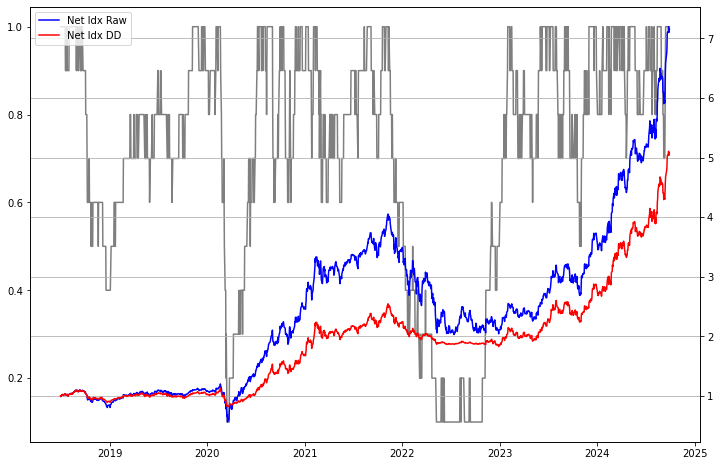

Performances:
            Net Idx Raw  Net Idx DD  QQQ US    SPX  ARKK US
2018-12-31       -15.05       -8.79  -10.31  -7.11   -18.44
2019-12-31        26.94       12.32   38.96  31.22    34.58
2020-12-31       131.04       65.70   48.41  18.33   148.73
2021-12-31        39.89       32.11   27.42  28.73   -24.02
2022-12-31       -39.38      -17.09  -32.58 -18.18   -66.97
2023-12-31        74.15       52.46   54.03  24.76    67.64
2024-12-31        94.45       79.08   18.86  20.22    -8.57


Volatilities:
            Net Idx Raw  Net Idx DD  QQQ US    SPX  ARKK US
2018-12-31        18.16       15.34   17.81  11.19    26.76
2019-12-31        21.28       14.20   20.86  15.50    30.77
2020-12-31        47.22       22.20   30.82  28.65    42.30
2021-12-31        36.44       26.26   22.49  18.05    40.32
2022-12-31        38.73       16.54   27.29  20.43    57.76
2023-12-31        29.37       17.09   23.55  17.73    49.32
2024-12-31        28.24       23.65   17.68  12.78    37.92


Drawdown

In [208]:
# DRAWDOWN MODULE

maxDD = 30
round_factor = 10
alloc_reval = 50
pullback_l = 10
DD_w = 252
pullback_boost = False


netDD_df = pd.DataFrame(0, index = perfSummary_df.index, columns = ['Net Idx Raw', 'Alloc', 'Cash', 'Net Idx DD'])
netDD_df['Net Idx Raw'] = perfSummary_df['Net Index']
netDD_df.loc[netDD_df.index[0], 'Alloc'] = 1
netDD_df.loc[netDD_df.index[0], 'Cash'] = 0
netDD_df.loc[netDD_df.index[0], 'Net Idx DD'] = 1
reval_DD = False
for c_dt in netDD_df.index[1:]:    
    p_dt = netDD_df.index[netDD_df.index.tolist().index(c_dt) - 1]
    port_alloc = netDD_df.loc[p_dt, 'Alloc']
    cash_alloc = netDD_df.loc[p_dt, 'Cash']
    cash_ret = Pxs_df.loc[p_dt, riskFree_asset] / 36000
    netDD_df.loc[c_dt, 'Net Idx DD'] = ((netDD_df.loc[c_dt, 'Net Idx Raw'] / netDD_df.loc[p_dt, 'Net Idx Raw'] - 1) * 
                                        port_alloc + cash_ret * cash_alloc + 1) * netDD_df.loc[p_dt, 'Net Idx DD']
    netDD_df.loc[c_dt, 'Alloc'] = 1 - (abs(100 * (netDD_df.loc[c_dt, 'Net Idx DD'] / netDD_df[:c_dt][-DD_w:]['Net Idx DD'].max() - 
                                                  1)) / maxDD)
    netDD_df.loc[c_dt, 'Alloc'] = round(round(netDD_df.loc[c_dt, 'Alloc'] / round_factor, 2) * round_factor, 2)
    if (netDD_df.loc[c_dt, 'Alloc'] == 0):
        reval_DD = True
        index_DDlevel = netDD_df.loc[c_dt, 'Net Idx Raw']    
    if (reval_DD) & (netDD_df.loc[c_dt, 'Alloc'] < alloc_reval / 100) & (pullback_boost):
        c_pb = 100 * (netDD_df.loc[c_dt, 'Net Idx Raw'] / index_DDlevel - 1)
        if (c_pb > pullback_l):
            netDD_df.loc[c_dt, 'Alloc'] = max(netDD_df.loc[c_dt, 'Alloc'], alloc_reval / 100) 
            reval_DD = False
    netDD_df.loc[c_dt, 'Cash'] = 1 - netDD_df.loc[c_dt, 'Alloc']
    
maxDD_sl = round(100 * (netDD_df['Net Idx DD'] / netDD_df['Net Idx DD'].expanding().max() - 1), 2).min()
maxDD_raw = round(100 * (netDD_df['Net Idx Raw'] / netDD_df['Net Idx Raw'].expanding().max() - 1), 2).min()
reb_freq = round(100 * (netDD_df['Alloc'] != netDD_df['Alloc'].shift(1).fillna(1)).sum() / netDD_df.shape[0], 2)
print('')
print('MAX DD Raw: ' + str(maxDD_raw))
print('MAX DD Stop Loss: ' + str(maxDD_sl))   
print('DD Interv Freq: ' + str(reb_freq))
print('')
    
netDD_df['Alloc'].plot(figsize = (12, 8), c = 'k', alpha = 0.5).twinx()
netDD_df['Net Idx Raw'].plot(c = 'b')
netDD_df['Net Idx DD'].plot(c = 'r').legend(loc = 'best')
plt.grid(axis = 'y')
plt.xticks(rotation = 45)
plt.show()

SummaryP_df = pd.DataFrame(netDD_df['Net Idx Raw']).join(netDD_df['Net Idx DD']).join(qqq_s).join(spx_s).join(arkk_s)
annual_reports(SummaryP_df, 'SPX')

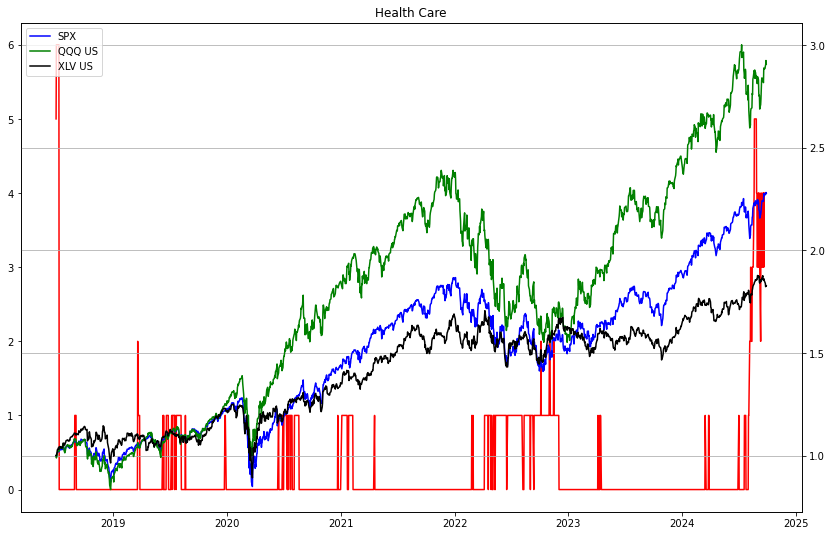

In [136]:
# SECTOR VISUALIZATION

def on_selection_sectors(value):
    global sector_option
    sector_option = value
    root.destroy() 

sectorCount_df = pd.DataFrame(np.nan, index = selectionN_df.index, columns = sector_l)
for c_dt in selectionN_df.index:
    sectorC_s = selectionN_df.loc[c_dt].dropna().map(lambda x: sector_s.loc[x]).value_counts()
    add_l = [s for s in sector_l if s not in sectorC_s.index]
    add_s = pd.Series(0, index = add_l)
    sectorC_s = pd.concat([sectorC_s, add_s])
    sectorCount_df.loc[c_dt] = sectorC_s
    
root = tk.Tk()
tkvar = tk.StringVar(root)
popupMenu = tk.OptionMenu(root, tkvar, *sector_l, command = on_selection_sectors)
tk.Label(root, text = "Choose Sector: ").grid(row = 0, column = 0)
popupMenu.grid(row = 1, column = 0)
root.mainloop()        
    
sectorCount_df[sector_option].plot(figsize = (14, 9), c = 'r').twinx()
(Pxs_df.loc[sectorCount_df.index]['SPX'] / Pxs_df.loc[sectorCount_df.index]['SPX'].iloc[0]).plot(c = 'b')
(Pxs_df.loc[sectorCount_df.index]['QQQ US'] / Pxs_df.loc[sectorCount_df.index]['QQQ US'].iloc[0]).plot(c = 'g')
(Pxs_df.loc[sectorCount_df.index][sector_ETF_map[sector_option]] / 
 Pxs_df.loc[sectorCount_df.index][sector_ETF_map[sector_option]].iloc[0]).plot(c = 'k').legend(loc = 'best')
sector_ETF_map
plt.title(sector_option)
plt.grid(axis = 'y')
plt.xticks(rotation = 45)
plt.show() 

In [980]:
#PORTFOLIO LAB

def cap_sn(alloc_s):

    alloc_x = alloc_s[alloc_s > AllocCap]
    while (alloc_x.shape[0] > 0):
        alloc1_s = alloc_s[alloc_s < AllocCap]
        alloc2_s = alloc_x - AllocCap
        excess = alloc2_s.sum()
        alloc1_s += (alloc1_s * excess) / alloc1_s.sum()
        alloc_x -= alloc2_s
        alloc_s = pd.concat([alloc1_s, alloc_x]).sort_values()    
        alloc_x = alloc_s[alloc_s > AllocCap]
        
    return alloc_s

dt = c_dt
select_universe = 75
init_cap = 1000000
AllocCap = 0.150


int_features_l = ['Momentum', 'Quality']
scope_features_l = int_features_l + m_features_l + ['Beta', 'Vol', 'Value']
concentration_f = 5
idio_w = 5
momentum_r = [1, 2, 4]
quality_r = [1, 2, 4]
hl_idio = 252

FactRets_df = FactRets_df.dropna(how = 'all')
Idio_df = Idio_df.dropna(how = 'all')

FactorLoadings_df['Market'] = 1
FactorLoadings_df['Beta'] = featuresP_df['Beta']
FactorLoadings_df[sector_l] = XSSectorLoadings_df[sector_l] 
FactorLoadings_df['Size'] = featuresC_df['Size']
FactorLoadings_df[INDFeatures_l] = XSStyleLoadings_df[INDFeatures_l]
FactorLoadings_df[m_features_l] = featuresM_df[m_features_l]  
ALLfeatures_df = FactorLoadings_df.join(XSAssetRets)

best_sharpe = -np.inf
cv_df = pd.DataFrame(np.nan, index = np.arange(len(momentum_r) + len(quality_r)) + 1, columns = xv_list)
c = 1
beta_adj = True
for momentum_w in momentum_r:
    for quality_w in quality_r:
        QualMLRfExp_s = round(100 * (ALLfeatures_df['Quality'].clip(0, ALLfeatures_df['Quality'].max()) * 
                                     FactRets_df['Quality'].dropna(how = 'all').ewm(halflife = hl).mean().iloc[-1] / 
                                     FactRets_df['Quality'].dropna(how = 'all').ewm(halflife = hl).std().iloc[-1]), 2)
        MomMLRfExp_s = round(100 * (ALLfeatures_df['Momentum'].clip(0, ALLfeatures_df['Momentum'].max()) * 
                                    FactRets_df['Momentum'].dropna(how = 'all').ewm(halflife = hl).mean().iloc[-1] / 
                                    FactRets_df['Momentum'].dropna(how = 'all').ewm(halflife = hl).std().iloc[-1]), 2)
        IdioMLRfExp_s = round(100 * Idio_df.dropna(how = 'all')[-hl_idio:].ewm(halflife = hl_idio // 2).mean().iloc[-1].dropna() / Idio_df.dropna(how = 'all')[-hl_idio:].ewm(halflife = hl_idio // 4).std().iloc[-1].dropna(), 2)
        MomMLRfExp_s.name = 'Momentum'
        QualMLRfExp_s.name = 'Quality'
        IdioMLRfExp_s.name = 'Idio'

        expAlpha_df = pd.DataFrame(MomMLRfExp_s).join(QualMLRfExp_s).join(IdioMLRfExp_s)
        expAlpha_df /= expAlpha_df.std()
        expAlpha_df['Alloc'] = round((expAlpha_df['Momentum'] * momentum_w + expAlpha_df['Quality'] * quality_w + 
                                      expAlpha_df['Idio'] * idio_w) / (momentum_w + quality_w + idio_w), 2)

        cfLport_s = expAlpha_df.sort_values(by = ['Alloc'], ascending = False)['Alloc'].dropna()
        cLport_s = (cfLport_s[:select_universe] * 100) ** concentration_f
        cLport_s /= abs(cLport_s.sum())
        cLport_s = round(100 * cLport_s, 3)

        cLport_df = pd.DataFrame(cLport_s)
        cLport_df['Naive NMV'] = round(init_cap * cLport_s / 100, 0)
        cLport_df[scope_features_l] = round((ALLfeatures_df.loc[cLport_df.index, scope_features_l].T * cLport_df['Naive NMV']).T, 1)
        beta = 1
        if (beta_adj):        
            beta = round((cLport_s / 100 * ALLfeatures_df['Beta'].loc[cLport_s.index]).sum(), 4)
        Lcov_m = Pxs_df[cLport_df.index][-5 * hl:].pct_change().dropna().ewm(halflife = hl).cov().loc[Pxs_df.index[-1]]
        cLport_vol = round(100 * ((cLport_df['Naive NMV'] / cLport_df['Naive NMV'].sum()).values.dot(Lcov_m).dot((cLport_df['Naive NMV'] / cLport_df['Naive NMV'].sum()).values) * (252)).sum() ** (1 / 2), 2)
        expA = ((expAlpha_df.loc[cLport_s.index]['Alloc'] ** 2) / expAlpha_df.loc[cLport_s.index]['Alloc'].sum()).sum() * 252
        cexpS = expA / (np.exp(beta) * cLport_vol)
        if (cexpS > best_sharpe):
            best_sharpe = cexpS
            fLport_s = cfLport_s.copy()
            Lport_s = cLport_s.copy()
            Lport_df = cLport_df.copy()
            Lport_vol = cLport_vol
        cv_df.loc[c, 'M W'] = momentum_w
        cv_df.loc[c, 'Q W'] = quality_w
        cv_df.loc[c, 'Vol'] = cLport_vol
        cv_df.loc[c, 'Sharpe'] = round(cexpS, 3)
        cv_df.loc[c, 'Beta'] = round(beta, 3)
        c += 1
            
port_s = cLport_s[: port_size] / cLport_s[: port_size].sum()
port_s = cap_sn(port_s)
port_s = round(100 * port_s, 2)
p21_s = round(pd.Series(100 * (port_s.index.map(lambda x: Pxs_df.loc[c_dt, x]) / 
                               port_s.index.map(lambda x: Pxs_df.loc[Pxs_df.index[Pxs_df.index.tolist().index(c_dt) - 21], x]) - 1), index = port_s.index), 2)        
p21_s.name = '1M Perf'
port_df = pd.DataFrame(port_s).join(p21_s)      
print(cv_df)
print('')
fExp_s = (init_cap * (port_s / 100) * ALLfeatures_df[SLICEall_features_l].loc[port_s.index].T).T.sum().astype(int).sort_values(ascending = False)
sectorPort_l = [s for s in sector_l if s in fExp_s.index]
sectorPort_s = round(100 * fExp_s.loc[sectorPort_l].sort_values(ascending = False) / fExp_s.loc[sectorPort_l].sum(), 2)
print('Quality/Beta Ratio: ' + str(round(fExp_s.loc['Quality'] / fExp_s.loc['Beta'], 2)))
print('Momentum/Beta Ratio: ' + str(round(fExp_s.loc['Momentum'] / fExp_s.loc['Beta'], 2)))
print('')
print('Sector Exposure:')
print(sectorPort_s)
print('')
print('Factor Exposure:')
print(fExp_s)
print('')
port_df['Sector'] = port_df.index.map(lambda x: Sectors_df.loc[x, 'Custom Sector 1'])
port_df['Industry'] = port_df.index.map(lambda x: Sectors_df.loc[x, 'VA Industry'])
port_df['Last d P&L'] = (100 * (port_df.index.map(lambda x: Pxs_df.iloc[-1][x]) / 
                                port_df.index.map(lambda x: Pxs_df.iloc[-2][x]) - 1)).map(lambda x: round(x, 3))
port_df['Last Px'] = port_df.index.map(lambda x: Pxs_df.iloc[-1][x])
port_df = port_df.sort_values(by = ['Alloc'], ascending = False)
Tport_df = port_df.copy()
Tport_df.loc['Totals'] = ''
Tport_df.loc['Totals', 'Alloc'] = port_df['Alloc'].sum()
Tport_df.loc['Totals', '1M Perf'] = round((port_df[['Alloc', '1M Perf']].apply(np.prod, axis = 1) / 100).sum(), 2)
Tport_df.loc['Totals', 'Last d P&L'] = round((port_df[['Alloc', 'Last d P&L']].apply(np.prod, axis = 1) / 100).sum(), 2)
Tport_df

   M W  Q W    Vol  Sharpe   Beta
1  1.0  1.0  22.37   4.938  1.314
2  1.0  2.0  21.09   4.980  1.339
3  1.0  4.0  19.70   5.463  1.349
4  2.0  1.0  36.18   2.107  1.744
5  2.0  2.0  32.40   2.406  1.679
6  2.0  4.0  24.63   3.719  1.516
7  4.0  1.0  52.35   1.088  2.165
8  4.0  2.0  50.18   1.124  2.120
9  4.0  4.0  43.02   1.441  1.969

Quality/Beta Ratio: 0.32
Momentum/Beta Ratio: 2.4

Sector Exposure:
Consumer Services     8337700.00
Health Care           4048100.00
Energy                2984233.33
Software               -88766.67
Telecommunications    -166100.00
Materials            -1439633.33
Hardware             -1549266.67
Utilities            -1550366.67
Consumer Goods       -2768533.33
Financials           -3654466.67
Industrials          -4152800.00
dtype: float64

Factor Exposure:
Momentum              4000324
Beta                  1668019
Market                1000000
Value                  931976
Quality                539807
Consumer Services      250131
Vol            

,Alloc,1M Perf,Sector,Industry,Last d P&L,Last Px
TMDX US,15.0,-14.6,Health Care,Health Care Equipment,-2.509,144.56
CVNA US,15.0,10.75,Consumer Services,Automotive Retailers,0.967,171.21
SG US,9.0,8.17,Consumer Services,Restaurants & Bars,-2.21,34.95
NFLX US,8.16,4.3,Consumer Services,Movies and Entertainment,-1.404,711.43
ZETA US,6.96,17.33,Software,Application Software,0.456,29.75
QTWO US,6.96,5.32,Software,Internet Software & Services,-0.958,77.56
WMB US,4.98,-0.16,Energy,Oil & Gas Storage & Transportation,-1.714,44.74
FSLR US,4.08,11.52,Energy,Renewable Energy Equipment,5.767,255.66
NVDA US,3.99,-1.54,Hardware,Broadline Semiconductors,0.429,124.04
CMG US,3.73,4.77,Consumer Services,Restaurants & Bars,-0.591,58.05


In [990]:
#LONG ONLY VS LONG/SHORT PORTFOLIOS

port_size = 20
init_cap = 1000000
LS_exclusion_l = ['SPWR US', 'TWOU US']
LS_exclusion_l = [t for t in LS_exclusion_l if t in ALLfeatures_df.index]

int_features_l = ['Momentum', 'Quality']
scope_features_l = int_features_l + m_features_l + ['Beta', 'Vol', 'Value', 'Size']
concentration_f = 5
idio_w = 5
momentum_r = [1, 2, 4]
quality_r = [1, 2, 4]
hl_idio = 252

FactRets_df = FactRets_df.dropna(how = 'all')
Idio_df = Idio_df.dropna(how = 'all')

FactorLoadings_df['Market'] = 1
FactorLoadings_df['Beta'] = featuresP_df['Beta']
FactorLoadings_df[sector_l] = XSSectorLoadings_df[sector_l] 
FactorLoadings_df['Size'] = featuresC_df['Size']
FactorLoadings_df[INDFeatures_l] = XSStyleLoadings_df[INDFeatures_l]
FactorLoadings_df[m_features_l] = featuresM_df[m_features_l]  
ALLfeatures_df = FactorLoadings_df.join(XSAssetRets)
MALLfeatures_df = ALLfeatures_df.drop(LS_exclusion_l)

best_sharpe = -np.inf
cv_df = pd.DataFrame(np.nan, index = np.arange(len(momentum_r) + len(quality_r)) + 1, columns = xv_list)
c = 1
beta_adj = True
for momentum_w in momentum_r:
    for quality_w in quality_r:
        QualMLRfExp_s = round(100 * (ALLfeatures_df['Quality'].clip(0, ALLfeatures_df['Quality'].max()) * 
                                     FactRets_df['Quality'].dropna(how = 'all').ewm(halflife = hl).mean().iloc[-1] / 
                                     FactRets_df['Quality'].dropna(how = 'all').ewm(halflife = hl).std().iloc[-1]), 2)
        MomMLRfExp_s = round(100 * (ALLfeatures_df['Momentum'].clip(0, ALLfeatures_df['Momentum'].max()) * 
                                    FactRets_df['Momentum'].dropna(how = 'all').ewm(halflife = hl).mean().iloc[-1] / 
                                    FactRets_df['Momentum'].dropna(how = 'all').ewm(halflife = hl).std().iloc[-1]), 2)
        IdioMLRfExp_s = round(100 * Idio_df.dropna(how = 'all')[-hl_idio:].ewm(halflife = hl_idio // 2).mean().iloc[-1].dropna() / Idio_df.dropna(how = 'all')[-hl_idio:].ewm(halflife = hl_idio // 4).std().iloc[-1].dropna(), 2)
        MomMLRfExp_s.name = 'Momentum'
        QualMLRfExp_s.name = 'Quality'
        IdioMLRfExp_s.name = 'Idio'

        expAlpha_df = pd.DataFrame(MomMLRfExp_s).join(QualMLRfExp_s).join(IdioMLRfExp_s)
        expAlpha_df /= expAlpha_df.std()
        expAlpha_df['Alloc'] = round((expAlpha_df['Momentum'] * momentum_w + expAlpha_df['Quality'] * quality_w + 
                                      expAlpha_df['Idio'] * idio_w) / (momentum_w + quality_w + idio_w), 2)

        cfLport_s = expAlpha_df.sort_values(by = ['Alloc'], ascending = False)['Alloc'].dropna()
        cLport_s = (cfLport_s[:port_size] * 100) ** concentration_f
        cLport_s /= abs(cLport_s.sum())
        cLport_s = round(100 * cLport_s, 3)

        cSport_s = expAlpha_df.sort_values(by = ['Alloc'], ascending = False)['Alloc'][-port_size:]
        cSport_s /= abs(cSport_s.sum())
        cSport_s = round(100 * cSport_s, 3)        
        
        cLport_df = pd.DataFrame(cLport_s)
        cLport_df['Naive NMV'] = round(init_cap * cLport_s / 100, 0)
        cLport_df[scope_features_l] = round((ALLfeatures_df.loc[cLport_df.index, scope_features_l].T * cLport_df['Naive NMV']).T, 1)
        beta = 1
        if (beta_adj):        
            beta = round((cLport_s / 100 * ALLfeatures_df['Beta'].loc[cLport_s.index]).sum(), 4)
        Lcov_m = Pxs_df[cLport_df.index][-5 * hl:].pct_change().dropna().ewm(halflife = hl).cov().loc[Pxs_df.index[-1]]
        cLport_vol = round(100 * ((cLport_df['Naive NMV'] / cLport_df['Naive NMV'].sum()).values.dot(Lcov_m).dot((cLport_df['Naive NMV'] / cLport_df['Naive NMV'].sum()).values) * (252)).sum() ** (1 / 2), 2)
        expA = ((expAlpha_df.loc[cLport_s.index]['Alloc'] ** 2) / expAlpha_df.loc[cLport_s.index]['Alloc'].sum()).sum() * 252
        cexpS = expA / (np.exp(beta) * cLport_vol)
        if (cexpS > best_sharpe):
            best_sharpe = cexpS
            fLport_s = cfLport_s.copy()
            Lport_s = cLport_s.copy()
            Sport_s = cSport_s.copy()
            Lport_df = cLport_df.copy()
            Lport_vol = cLport_vol
        cv_df.loc[c, 'M W'] = momentum_w
        cv_df.loc[c, 'Q W'] = quality_w
        cv_df.loc[c, 'Vol'] = cLport_vol
        cv_df.loc[c, 'Sharpe'] = round(cexpS, 3)
        cv_df.loc[c, 'Beta'] = round(beta, 3)
        c += 1

print('')
print('Cross Validation:')
print(cv_df)
print('')
#CUSTOMIZED RULES#

LS = True
if (LS):
    flatFRisk_l = []
    if (Lport_df.sum().loc['2Y IR Vol'] != 0):
        flatFRisk_l.append('2Y IR Vol')
    if (Lport_df.sum().loc['T10YIE'] != 0):
        flatFRisk_l.append('T10YIE')
    if (Lport_df.sum().loc['USGG2YR'] != 0):
        flatFRisk_l.append('USGG2YR')  
    if (Lport_df.sum().loc['VIX'] != 0):
        flatFRisk_l.append('VIX')  
    if (Lport_df.sum().loc['Brent USD/Bbl'] != 0):
        flatFRisk_l.append('Brent USD/Bbl') 
    if (Lport_df.sum().loc['M2MP Velocity'] != 0):
        flatFRisk_l.append('M2MP Velocity') 
    if (Lport_df.sum().loc['US10YR RR'] != 0):
        flatFRisk_l.append('US10YR RR')     
    if (Lport_df.sum().loc['Beta'] != 0):
        flatFRisk_l.append('Beta')  
    if (Lport_df.sum().loc['Size'] != 0):
        flatFRisk_l.append('Size') 
    if (Lport_df.sum().loc['Value'] != 0):
        flatFRisk_l.append('Value')  
    if (Lport_df.sum().loc['Vol'] != 0):
        flatFRisk_l.append('Vol')          
    
    Sport_df = pd.DataFrame(Sport_s)
    Sport_df['Naive NMV'] = round(init_cap * Sport_s / 100, 0)
    Sport_df[scope_features_l] = round((MALLfeatures_df.loc[Sport_df.index, scope_features_l].T * Sport_df['Naive NMV']).T, 1)  
    
    LSport_df = pd.concat([Lport_df, Sport_df])    
    x_a = MALLfeatures_df.loc[LSport_df.index][flatFRisk_l].values
    y_a = np.array(((Lport_s.values * abs(Lport_s.sum() / 100)).tolist() + (Sport_s.values * abs(Sport_s.sum() / 100)).tolist()))
    LR_mod = LinearRegression()
    LRHedge_mod = LR_mod.fit(x_a, y_a)
    unwantedR_a = LRHedge_mod.predict(x_a)
    wantedR_s = pd.Series(y_a - unwantedR_a, index = LSport_df.index)
    wantedR_s /= abs(wantedR_s).sum()
    wantedR_s.name = 'Alloc'

    CleanPort_df = round(pd.DataFrame(wantedR_s * init_cap), 1)
    CleanPort_df[scope_features_l] = round((MALLfeatures_df.loc[LSport_df.index, scope_features_l].T * CleanPort_df['Alloc']).T, 1)
    CleanPort_df['Alloc'] = round(100 * CleanPort_df['Alloc'] / init_cap, 3)
    CleanPort_df = CleanPort_df.sort_values(by = ['Alloc'], ascending = False)    
      
    LScov_m = Pxs_df[CleanPort_df.index][-5 * hl:].pct_change().dropna().ewm(halflife = hl).cov().loc[Pxs_df.index[-1]]
    LSport_vol = round(100 * ((CleanPort_df['Alloc'] / 100).values.dot(LScov_m).dot((CleanPort_df['Alloc'] / 100).values) * (252)).sum() ** (1 / 2), 2)  
    CleanPort_df.loc['Total'] = round(CleanPort_df.sum(), 0)      
    print(CleanPort_df)

Lport_df['VOL'] = round(100 * Pxs_df[-5 * hl:][Lport_df.index].pct_change().dropna().ewm(halflife = hl).std().iloc[-1] * np.sqrt(252), 2)
Lport_df['1d P'] = round(100 * (Pxs_df[Lport_df.index].iloc[-1] / Pxs_df[Lport_df.index].iloc[-2] - 1), 2)
Lport_df['1w P'] = round(100 * (Pxs_df[Lport_df.index].iloc[-1] / Pxs_df[Lport_df.index].iloc[-5] - 1), 2)
Lport_df['1M P'] = round(100 * (Pxs_df[Lport_df.index].iloc[-1] / Pxs_df[Lport_df.index].iloc[-21] - 1), 2)
Lport_df['3M P'] = round(100 * (Pxs_df[Lport_df.index].iloc[-1] / Pxs_df[Lport_df.index].iloc[-63] - 1), 2)
Lport_df['(12 - 1)P'] = round(100 * (Pxs_df[Lport_df.index].iloc[-21] / Pxs_df[Lport_df.index].iloc[-252] - 1), 2)

y = yf.download(Lport_df.index.map(lambda x: x.split(' ')[0]).tolist(), period = '1d')
Lrt_df = y['Adj Close'].T
Lrt_df.index = Lrt_df.index.map(lambda x: x + ' US')
Lport_df['Real Time'] = ''
Lport_df.loc[Lport_df.index, 'Real Time'] = round(100 * (Lrt_df.T / Pxs_df[Lport_df.index].iloc[-1] - 1), 2).T.values

if (LS):
    z = yf.download(Sport_df.index.map(lambda x: x.split(' ')[0]).tolist(), period = '1d')
    Srt_df = z['Adj Close'].T
    Srt_df.index = Srt_df.index.map(lambda x: x + ' US')
    LSrt_df = pd.concat([Lrt_df, Srt_df])
    CleanPort_df['Real Time'] = ''
    CleanPort_df['1d P'] = round(100 * (Pxs_df[CleanPort_df.drop('Total').index].iloc[-1] / 
                                        Pxs_df[CleanPort_df.drop('Total').index].iloc[-2] - 1), 2)
    CleanPort_df['1w P'] = round(100 * (Pxs_df[CleanPort_df.drop('Total').index].iloc[-1] / 
                                        Pxs_df[CleanPort_df.drop('Total').index].iloc[-5] - 1), 2)
    CleanPort_df['1M P'] = round(100 * (Pxs_df[CleanPort_df.drop('Total').index].iloc[-1] / 
                                        Pxs_df[CleanPort_df.drop('Total').index].iloc[-21] - 1), 2)
    CleanPort_df['3M P'] = round(100 * (Pxs_df[CleanPort_df.drop('Total').index].iloc[-1] / 
                                        Pxs_df[CleanPort_df.drop('Total').index].iloc[-63] - 1), 2)    
    
    CleanPort_df.loc[CleanPort_df.drop('Total').index, 'Real Time'] = round(100 * (LSrt_df.loc[CleanPort_df.drop('Total').index].T / 
                                                                                   Pxs_df[CleanPort_df.drop('Total').index].iloc[-1] - 1), 2).T.values 
    LSlast_d = round((CleanPort_df.drop('Total')['1d P'] * CleanPort_df.drop('Total')['Alloc'] / 100).sum(), 2)
    LSlast_w = round((CleanPort_df.drop('Total')['1w P'] * CleanPort_df.drop('Total')['Alloc'] / 100).sum(), 2)
    LSlast_m = round((CleanPort_df.drop('Total')['1M P'] * CleanPort_df.drop('Total')['Alloc'] / 100).sum(), 2)
    LSlast_3m = round((CleanPort_df.drop('Total')['3M P'] * CleanPort_df.drop('Total')['Alloc'] / 100).sum(), 2)
    LSrt = round((CleanPort_df.drop('Total')['Real Time'] * CleanPort_df.drop('Total')['Alloc'] / 100).sum(), 2)

Llast_d = round((Lport_df['1d P'] * Lport_df['Alloc'] / 100).sum(), 2)
Llast_w = round((Lport_df['1w P'] * Lport_df['Alloc'] / 100).sum(), 2)
Llast_m = round((Lport_df['1M P'] * Lport_df['Alloc'] / 100).sum(), 2)
Llast_3m = round((Lport_df['3M P'] * Lport_df['Alloc'] / 100).sum(), 2)
Lrt = round((Lport_df['Real Time'] * Lport_df['Alloc'] / 100).sum(), 2)
Lport_df.loc['Total'] = np.nan
Lport_df.loc['Total', ['Alloc', 'Naive NMV', 'Momentum', 'Quality', 'Beta']] = Lport_df[['Alloc', 'Naive NMV', 'Momentum', 
                                                                                         'Quality', 'Beta']].sum()
Lport_df = Lport_df.fillna('')

print('Long Only Port vol: ' + str(Lport_vol))
print('RT Long Only: ' + str(Lrt) + '%')
print('d-1 Long Only: ' + str(Llast_d) + '%')
print('d-1w Long Only: ' + str(Llast_w) + '%')
print('d-1M Long Only: ' + str(Llast_m) + '%')
print('d-3M Long Only: ' + str(Llast_3m) + '%')
if (LS):
    print('')
    print('Long Short Port vol: ' + str(LSport_vol))
    print('RT Long Short: ' + str(LSrt) + '%')
    print('d-1 Long Short: ' + str(LSlast_d) + '%')
    print('d-1w Long Short: ' + str(LSlast_w) + '%')
    print('d-1M Long Short: ' + str(LSlast_m) + '%')
    print('d-3M Long Short: ' + str(LSlast_3m) + '%')
print('')
ttlFactorExp_s = (MALLfeatures_df[all_features_l].loc[Lport_df.drop('Total').index].T * Lport_df.drop('Total')['Naive NMV']).T.sum().astype(int)
print('Ttl Factor Exposures:')
print(ttlFactorExp_s.sort_values(ascending = False))
print('')
Lport_df[['Alloc', 'Naive NMV', 'Momentum', 'Quality', 'Beta', 'VOL', '1d P', '1w P', '1M P', '3M P', '(12 - 1)P', 'Real Time']]


Cross Validation:
   M W  Q W    Vol  Sharpe   Beta
1  1.0  1.0  24.12   5.808  1.356
2  1.0  2.0  23.12   5.422  1.416
3  1.0  4.0  22.70   4.983  1.512
4  2.0  1.0  39.01   2.494  1.818
5  2.0  2.0  36.03   2.594  1.791
6  2.0  4.0  28.45   3.538  1.671
7  4.0  1.0  54.06   1.455  2.204
8  4.0  2.0  52.26   1.452  2.173
9  4.0  4.0  46.37   1.677  2.057

          Alloc   Momentum   Quality  M2MP Velocity    T10YIE   USGG2YR  \
WMB US   11.794   264347.9 -178287.3        21947.9   63552.7   62098.4   
ZETA US   8.769   277100.2  -59225.3        13420.1 -128162.3   38102.8   
IPGP US   5.206   -57560.1  -59563.3        50848.5 -116242.9    6855.6   
CVNA US   4.362   398773.4  -36708.2      -121241.0  -18576.0 -100361.9   
UHS US    4.303    75081.1  -49208.2        12000.5   53525.4   14734.2   
UTHR US   3.297    34579.8   -7077.7         7998.9   61733.9   15697.0   
TDOC US   2.695   -33977.7  -28588.6        11071.1   22211.8    -866.0   
NFLX US   1.803    50659.8   33173.2    

,Alloc,Naive NMV,Momentum,Quality,Beta,VOL,1d P,1w P,1M P,3M P,(12 - 1)P,Real Time
WMB US,22.430,224300.0,502737.3,-339067.0,130990.3,19.62,-1.71,-1.41,-1.65,5.98,31.19,-0.27
ZETA US,15.095,150950.0,477022.9,-101955.2,262277.7,51.28,0.46,2.8,14.64,70.24,196.57,-1.41
CVNA US,14.300,143000.0,1307330.9,-120343.5,355565.2,69.25,0.97,-1.52,14.08,35.63,295.83,-0.84
OKE US,7.259,72590.0,166560.0,26409.8,44020.1,22.79,-5.9,-5.13,-1.11,8.83,33.59,-0.81
QTWO US,5.501,55010.0,100909.3,104610.4,90759.1,37.55,-0.96,-4.89,5.11,27.25,121.59,0.71
APP US,3.915,39150.0,78233.6,21211.2,98257.2,58.83,-1.97,1.62,39.86,52.72,127.43,0.18
GDDY US,3.734,37340.0,66730.3,44762.2,32845.7,24.77,-1.98,-3.06,-5.67,8.96,115.98,0.14
UHS US,3.394,33940.0,59213.9,-38808.8,19268.1,26.13,-0.62,0.69,1.69,30.51,86.67,-0.43
HCA US,3.155,31550.0,40578.6,31712.4,14991.0,21.31,-0.3,-0.2,2.82,26.08,62.01,-3.03
SE US,3.078,30780.0,29412.0,-25401.1,45043.0,39.46,0.97,10.64,22.33,35.07,74.87,1.1


In [ ]:
# PORTFOLIO CONSTRUCTION W/ NAIVE INCREMENTAL MVO AND ESTIMATED ALPHAS, GENERAL AND X-SECTIONAL - OLD

import pandas as pd
import math
import numpy as np
import os
import csv
import yfinance as yf
import matplotlib.pyplot as plt
import psycopg2
import requests
import json
import tkinter as tk
import re
from datetime import datetime
from datetime import timedelta
from datetime import date
from sklearn.linear_model import Ridge
from sqlalchemy import create_engine
from sklearn.linear_model import LinearRegression
from statsmodels.tsa.arima.model import ARIMA
from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import PolynomialFeatures
from sklearn.metrics import r2_score
from scipy import optimize 
from scipy.optimize import linprog
import warnings


def annual_reports(SummaryP_df, anchor):
        
    SummaryP_df.index = SummaryP_df.index.map(lambda x: datetime(x.year, x.month, x.day))
    SummaryPY_df = SummaryP_df.resample('Y').last()
    SummaryPY_df.loc[SummaryP_df.index[0]] = 1
    SummaryPY_df = SummaryPY_df.sort_index()
    SummaryPY_df = round(100 * SummaryPY_df.pct_change(), 2).dropna()
    print('Performances:')
    print(SummaryPY_df)
    print('')

    SummaryV_df = round(100 * SummaryP_df.pct_change().ewm(halflife = 84).std() * np.sqrt(252), 2).dropna()
    SummaryVY_df = round(SummaryV_df.resample('Y').mean(), 2)
    print('')
    print('Volatilities:')
    print(SummaryVY_df)
    print('')

    SummaryD_df = round(100 * (SummaryP_df / SummaryP_df.rolling(252, min_periods = 21).max() - 1), 2).dropna()
    SummaryDY_df = SummaryD_df.resample('Y').min()
    print('')
    print('Drawdowns:')
    print(SummaryDY_df)
    print('')

    SummaryC_df = round(100 * ((SummaryP_df[1: ].T ** (252 / SummaryP_df[1:].index.map(lambda x: (x - SummaryP_df.index[0]).days).values)).T - 1), 2)
    SummaryCY_df = SummaryC_df.resample('Y').last()
    print('')
    print('CAGR:')
    print(SummaryCY_df)
    print('')

    SummaryCDY_df = round(SummaryCY_df / abs(SummaryDY_df), 2)
    print('')
    print('CAGR/DD:')
    print(SummaryCDY_df)
    print('')

    SummarySY_df = round(SummaryPY_df / abs(SummaryVY_df), 2)
    print('')
    print('Sharpe:')
    print(SummarySY_df)
    print('')

    SummaryCorr_df = SummaryP_df.rolling(252).corr(SummaryP_df[anchor].rolling(252))
    SummaryCorrY_df = SummaryCorr_df.resample('Y').mean()
    SummaryBY_df = round(SummaryCorrY_df * (SummaryVY_df.T / SummaryVY_df[anchor]).T, 2)
    print('')
    print('Betas ' + anchor + ':')
    print(SummaryBY_df)
    print('')

    SummaryAY_df = round(SummaryPY_df - (SummaryBY_df.T * SummaryPY_df[anchor]).T, 2)
    print('')
    print('Alphas ' + anchor + ':')
    print(SummaryAY_df)    
                
    return

def predictors_to_Cfeatures(pred_df, c_features_l, sector_s):
    
    exp_g = 10
    m_omd = 5
    IDwinsor_L = 0.025
    IDwinsor_H = 0.990
    winsor_L = 0.01
    Vwinsor_H = 0.90
    IQuant = 10
    field_l = ['GS', 'GGP', 'GE', 'G', 'G Vol', 'G r2', 'E Vol', 'S Vol', 'OM', 'OMp', 'ROIp', 'ROIdp', 'Alloc']    
    sc_df = pd.DataFrame(np.nan, index = pred_df.index, columns = field_l)

    pred_df['P/Ee'][pred_df['P/Ee'] < 0] = abs(pred_df['P/Ee'][pred_df['P/Ee'] < 0]) * 100
    pred_df['P/Eo'][pred_df['P/Eo'] < 0] = abs(pred_df['P/Eo'][pred_df['P/Eo'] < 0]) * 100
    pred_df['P/GP'][pred_df['P/GP'] < 0] = abs(pred_df['P/GP'][pred_df['P/GP'] < 0]) * 100
    pred_df['P/S'][pred_df['P/S'] < 0] = abs(pred_df['P/S'][pred_df['P/S'] < 0]) * 100
    pred_df['sP/E'][pred_df['sP/E'] < 0] = abs(pred_df['sP/E'][pred_df['sP/E'] < 0]) * 100
    pred_df['sP/S'][pred_df['sP/S'] < 0] = abs(pred_df['sP/S'][pred_df['sP/S'] < 0]) * 100
    pred_df['sP/GP'][pred_df['sP/GP'] < 0] = abs(pred_df['sP/GP'][pred_df['sP/GP'] < 0]) * 100
    pred_df = fix_na(pred_df, 'r2 S', 'r2 GP')
    pred_df = fix_na(pred_df, 'GS', 'GGP')
    aux_df = pred_df[['sP/S', 'sP/GP']]
    ratio = aux_df.median()['sP/GP'] / aux_df.median()['sP/S']
    aux_df['sP/S'] *= ratio
    aux_df = aux_df.T.fillna(method = 'ffill').T
    pred_df['sP/GP'] = aux_df['sP/GP']

    featuresC_df = pd.DataFrame(np.nan, index = pred_df.index, columns = c_features_l)

    sc_df['GS'] = pred_df['GS']
    sc_df['GGP'] = pred_df['GGP']
    sc_df['GE'] = pred_df['GE']
    sc_df['G'] = pred_df[['GE','GGP', 'GS']].min(axis = 1)
    sc_df['G Vol'] = pred_df[['GE','GGP', 'GS']].std(axis = 1)
    sc_df['G r2'] = pred_df[['r2 S', 'r2 GP', 'r2 E']].mean(axis = 1)
    sc_df['E Vol'] = pred_df['E Vol'].map(lambda x: max(1, x / 100))
    sc_df['S Vol'] = pred_df['S Vol'].map(lambda x: max(1, x / 100))
    sc_df['OM'] = pred_df['OM-t0'].map(lambda x: min(x, 60))
    sc_df['OMp'] = pred_df['OMd'].map(lambda x: min(x, 0))
    sc_df['ROIp'] = pred_df['ROI-P'].map(lambda x: min(x, 0))
    sc_df['ROIdp'] = pred_df['ROId'].map(lambda x: min(x, 0))
    sc_df['G r2'] = sc_df['G r2'].replace({-np.inf: 1})
    sc_df['Alloc'] = (25 * sc_df['G'] * (sc_df['G r2'] ** 5) / sc_df['E Vol'] / sc_df['S Vol'] + 
                      5 * sc_df['OM'] + 50 * sc_df['OMp'] + 50 * sc_df['ROIp'] + 50 * sc_df['ROIdp'])
    
    featuresC_df['Ideal'] = winsorize(sc_df['Alloc'], IDwinsor_L, IDwinsor_H)

    Value_s = (3 * pred_df['sP/E'] + pred_df['sP/GP']) / 4
    featuresC_df['Value'] = -winsorize(Value_s, winsor_L, Vwinsor_H) 
    featuresC_df['Size'] = -pd.Series(np.log(pred_df['Size']), index = pred_df.index)

    featuresC_df -= featuresC_df.mean()
    featuresC_df /= featuresC_df.std()
    featuresC_df = featuresC_df.fillna(0)
    
    return featuresC_df

def predictors_to_Mfeatures(MacroPxs_df, sPxs_df, m_features_l, sector_s):
        
    MacroPxs_df['US10YR RR'] = MacroPxs_df['USGG10YR'] - MacroPxs_df['T10YIE']
    MacroPxs_df['YC'] = MacroPxs_df['USGG10YR'] - MacroPxs_df['USGG2YR']
    MacroPxs_df['2Y IR Vol'] = MacroPxs_df['USGG2YR'].ewm(halflife = hl).std() * np.sqrt(252)
    MacroPxs_df = MacroPxs_df.loc[sPxs_df.index]
    MacroPxs_df = (MacroPxs_df - MacroPxs_df.ewm(halflife = hl).mean())
    MacroPxs_df = MacroPxs_df.pct_change()

    MacroFactor_df = pd.DataFrame(np.nan, index = sPxs_df.columns, columns = m_features_l)
    for c_mf in m_features_l:
        c_mf_s = sPxs_df.pct_change().join(MacroPxs_df[c_mf])[-hl:].cov()[c_mf].drop(c_mf)    
        featVar_s = MacroPxs_df[c_mf].ewm(halflife = hl).var().iloc[-1]
        MacroFactor_df[c_mf] = c_mf_s / featVar_s

    for c_feat in m_features_l:
        MacroFactor_df[c_feat] = winsorize(MacroFactor_df[c_feat], winsor_L, winsor_H).values

    naT_l = MacroFactor_df.isna().sum(axis = 1)[MacroFactor_df.isna().sum(axis = 1) > 0].index
    naF_l = MacroFactor_df.loc[naT_l].T[MacroFactor_df.loc[naT_l].T.isna()].index.tolist()  
    MacroFactor_df.loc[naT_l, naF_l] = MacroFactor_df.median().values
    MacroFactor_df -= MacroFactor_df.mean()
    MacroFactor_df /= MacroFactor_df.std()

    return MacroFactor_df, MacroPxs_df[m_features_l]

def predictors_to_Pfeatures(sPxs_df, p_features_l, sector_s):

    lag_M1 = -252
    lag_M3 = -21
    beta_adj = True

    featuresP_df = pd.DataFrame(np.nan, index = sPxs_df.columns, columns = p_features_l)
    sRetPxs_df = sPxs_df.pct_change().dropna()
    sRetMkt_s = sMkt_s.pct_change().dropna()    
    sCovPxs_s = sRetPxs_df.ewm(halflife = hl).cov(sRetMkt_s.ewm(halflife = hl)).iloc[-1]
    sVarMkt = sRetMkt_s.ewm(halflife = hl).cov(sRetMkt_s.ewm(halflife = hl)).iloc[-1]
    featuresP_df['Beta'] = winsorize(sCovPxs_s / sVarMkt, 0, winsor_H)
    featuresP_df['Vol'] = -winsorize(sRetPxs_df.ewm(halflife = hl).std().iloc[-1], 0, winsor_H)
    Mom_s = pd.Series((featuresP_df.index.map(lambda x: sPxs_df[x].iloc[lag_M3]) / 
                       featuresP_df.index.map(lambda x: sPxs_df[x].iloc[lag_M1])), index = featuresP_df.index)
    featuresP_df['Momentum'] = winsorize(Mom_s, winsor_L, winsor_H)

    featuresP_df -= featuresP_df.mean()
    featuresP_df /= featuresP_df.std()
    
    return featuresP_df

def round_down(n, decimals = 0): 
    multiplier = 10 ** decimals 
    return int(math.floor(n * multiplier) / multiplier)

def Set_DF(dframe):
    
    dframe.index = dframe[dframe.columns.values.tolist()[0]]
    dframe.index.name = dframe.columns.values.tolist()[0]
    New_df = dframe.drop(dframe.columns.values.tolist()[0], axis=1)
    
    return New_df

def DD_Index(dframe):
    
    dframe['dummy'] = dframe.index
    dframe.drop_duplicates(['dummy'], inplace=True)
    dframe.drop('dummy', axis=1, inplace=True)
    New_df = dframe
    
    return New_df 

def open_df(*args):
    open_str = args[0]
    
    query_open = 'SELECT * FROM ' + open_str
    opened_df = pd.read_sql_query(query_open, engine)
    opened_df = Set_DF(opened_df)
    opened_df = DD_Index(opened_df)
    opened_df = opened_df.sort_index()
    
    return opened_df

def fix_na(base_df, col_b, col_t):

    aux = base_df[[col_b, col_t]]
    aux = aux.T.fillna(method = 'ffill').T
    base_df[col_t] = aux[col_t]
    
    return base_df

def winsorize(Rt_s, floor, cap):
    
    w_up = np.quantile(Rt_s.dropna().values, q = cap)
    w_down = np.quantile(Rt_s.dropna().values, q = floor)    
    w_s = Rt_s.clip(w_down, w_up)
    
    return w_s

def get_predictors(c_date, exclusion_l):
    
    rel_found = False
    count = 0
    attempts_cap = 30
    while (not rel_found) & (count < attempts_cap):
        try:
            pred_df = open_df('valuation_' + c_date.strftime('%Y%m%d') + selection_scope)
            rel_found = True            
        except:
            c_date = c_date - timedelta(1)
            c_date = c_date - timedelta((c_date.weekday() % 4) * (c_date.weekday() // 4))
            count += 1
    
    pred_df = pred_df.dropna(thresh = pred_df.shape[1] // 2)
    pred_df['P/Ee'][pred_df['P/Ee'] <= 0] = 100
    pred_df['P/Eo'][pred_df['P/Eo'] <= 0] = 100
    pred_df['P/S'][pred_df['P/S'] <= 0] = 100  
    exclusion_l = [t for t in exclusion_l if t in pred_df.index]
    pred_df = pred_df.drop(exclusion_l)
    
    return pred_df, c_date

def loadings(ret_s, res_s):
    
    Pbeta = 0
    PZ = 0      
    if (res_s.std() != 0):
        Pbeta = round(res_s.cov(ret_s) / (res_s.std() ** 2), 3)
        if (ret_s.std() != 0):        
            PZ = round(abs(Pbeta) / ((ret_s.std() ** 2) / (res_s.std() ** 2)), 3)
    
    return Pbeta, PZ

def mlr(ALLfeatures_df):
    
    model = LinearRegression()
    lr_mod = model.fit(ALLfeatures_df[all_features_l].values, ALLfeatures_df['Rt'].values)
    lr_values = lr_mod.predict(ALLfeatures_df[all_features_l].values)
    fRet_s = round(pd.Series(lr_mod.coef_, index = all_features_l), 3)
    fRet_s.name = 'MLR Factor Rets'
    fcast_s = pd.Series(lr_values, index = ALLfeatures_df.index)
    fcast_s.name = 'Ret Fcast'   
    y0 = lr_mod.intercept_
    mlr_r2 = round(100 * lr_mod.score(ALLfeatures_df[all_features_l].values, ALLfeatures_df['Rt'].values), 2)
    
    return fcast_s, fRet_s, y0, mlr_r2

def w_mlr(x_m, y_a, w_a, idx_l, c_l, itcp):
    
    model = LinearRegression(fit_intercept = itcp)
    lr_mod = model.fit(x_m, y_a, w_a)
    lr_values = lr_mod.predict(x_m)
    fRet_s = pd.Series(lr_mod.coef_, index = c_l)    
    fcast_s = pd.Series(lr_values, index = idx_l)
    fRet_s.name = 'wMLR Factor Rets'
    fcast_s.name = 'wMLR Ret Fcast'   
    y0 = lr_mod.intercept_
    mlr_r2 = round(100 * lr_mod.score(x_m, y_a, w_a), 2)
    
    return fcast_s, fRet_s, y0, mlr_r2

def ridge(x_m, y_a, idx_l, c_l):
    
    xv_n = 10
    ridge_n = 30
    step = 3  
    lambda_penalty = 10
    
    lambda_array = np.arange(ridge_n)
    lambda_array = lambda_array[::step]
    x_df = pd.DataFrame(x_m.T)
    y_df = pd.DataFrame(y_a.T)

    cv_mse_df = pd.DataFrame(np.nan, index = lambda_array, columns = ['Train', 'Val'])
    beta_df = pd.DataFrame(np.nan, index = lambda_array, columns = np.arange(x_df.shape[1]).tolist() + ['df'])
    val_r2 = np.inf
    shift_lambda = False
    for c_lambda in lambda_array:
        if (shift_lambda):
            c_lambda += lambda_penalty
        try:        
            Rmodel = Ridge(alpha = c_lambda, normalize = False, tol = 0.001, solver = 'auto', random_state = 42)
            valRMSE_tot = 0
            trainRMSE_tot = 0
            for c in np.arange(xv_n):
                init_v = xv_n * c
                end_v = init_v + xv_n
                valX_df = x_df.iloc[init_v: end_v]
                valY_df = y_df.iloc[init_v: end_v]
                trainX_df = x_df.drop(valX_df.index)
                trainY_df = y_df.drop(valX_df.index)

                I_m = np.identity(trainX_df.shape[1])
                lambda_matrix = I_m * np.array([c_lambda] * trainX_df.shape[1])
                beta_array = np.linalg.inv((trainX_df.T.values.dot(trainX_df.values)) + lambda_matrix).dot(trainX_df.T.values.dot(trainY_df.values))
                hat_matrix = (trainX_df.values).dot(np.linalg.inv((trainX_df.T.values.dot(trainX_df.values)) + lambda_matrix)).dot(trainX_df.T.values)        

                if (c == 0):
                    edf = np.trace(hat_matrix)
                    beta_df.loc[c_lambda] = pd.DataFrame(beta_array)[0].tolist() + [edf]

                ridge_mod = Rmodel.fit(trainX_df.values, trainY_df.values)
                trainRidge_f = ridge_mod.predict(trainX_df.values)
                valRidge_f = ridge_mod.predict(valX_df.values)
                trainRidge_mse = np.sum((trainY_df.values - trainRidge_f) ** 2)
                valRidge_mse = np.sum((valY_df.values - valRidge_f) ** 2)
                trainRMSE_tot += trainRidge_mse 
                valRMSE_tot += valRidge_mse 
            cv_mse_df.loc[c_lambda, 'Train'] = 100 * trainRMSE_tot / xv_n
            cv_mse_df.loc[c_lambda, 'Val'] = 100 * valRMSE_tot / xv_n
            if (valRMSE_tot < val_r2):
                bestRidge_f = ridge_mod.predict(x_df.values)
                bestRidge_fr = pd.DataFrame(beta_array)[0].values
                bestLambda = c_lambda
                Rintercept = ridge_mod.intercept_
                val_r2 = valRMSE_tot
                best_edf = edf
        except:
            val_r2 = np.inf
            shift_lambda = True
            print('Ridge lambda' + str(c_lambda) + ' singular!!')            

    bestRidgeRt_s = pd.Series(pd.DataFrame(bestRidge_f)[0].values, index = idx_l)
    bestRidgeFS_s = pd.Series(bestRidge_fr, index = c_l)
    bestRidgeFS_s.name = 'Ridge Factor Rets'
    beta_df.index = beta_df['df']
    beta_df = beta_df.drop(['df'], axis = 1)
    beta_df.sort_index().plot(figsize = (12, 8))
    plt.show()
    cv_mse_df['Val'].plot(figsize = (12, 8), c = 'r')
    plt.title('Ridge, df = ' + str(round(best_edf, 2)) + ' out of ' + str(x_m.shape[0]))
    plt.show()
    Ridge_r2 = round(100 * (pd.DataFrame(bestRidge_f).join(y_df, rsuffix = '_label').corr().iloc[0, 1] ** 2), 3)

    return bestRidgeRt_s, bestRidgeFS_s, Rintercept, Ridge_r2, bestLambda

def interest_pxs(port_s, Pxs_df):

    add_l = [t for t in port_s.index if t not in Pxs_df.columns]       
    compPx_df = pd.DataFrame(np.nan, index = Pxs_df.index[-long_w: ], columns = ['dummy'])
    for missing_t in add_l:
        try:
            ticker_s = yf.download([t_dikt[missing_t]], period = str(long_w + 200) + 'd')['Close']
            ticker_s.index = ticker_s.index.map(lambda x: x.date())
            ticker_s.name = missing_t
            compPx_df = compPx_df.join(ticker_s)
        except:
            print(missing_t + ' FAILED')
    
    compPx_df = compPx_df.fillna(method = 'bfill').fillna(method = 'ffill')
    IntPxs_df = Pxs_df.join(compPx_df)[port_s.index][-long_w:]
    IntPxs_df = IntPxs_df.fillna(method = 'bfill').fillna(method = 'ffill')
    
    return IntPxs_df

def calc_cov(port_s, cPort_s, IntPxs_df):

    missingA_l = [t for t in LJJPort_lastA_s.index if t not in cPort_s.index]
    mPort_s = pd.Series(cPort_s.median(), index = missingA_l)
    cPort_s = pd.concat([cPort_s, mPort_s]).sort_values()
    cov_df = IntPxs_df.pct_change()[-252:].ewm(halflife = hl).cov().loc[IntPxs_df.index[-1]]
    
    return cov_df, cPort_s

def MaximizeReturns(MeanReturns, PortfolioSize):
    
    c = (np.multiply(-1, MeanReturns))
    A = np.ones([PortfolioSize,1]).T
    b=[1]
    res = linprog(c, A_ub = A, b_ub = b, bounds = (0,1), method = 'highs') 
    
    return res

def MinimizeRisk(CovarReturns, PortfolioSize):
    
    def  f(x, CovarReturns):
        func = np.matmul(np.matmul(x, CovarReturns), x.T) 
        return func

    def constraintEq(x):
        A=np.ones(x.shape)
        b=1
        constraintVal = np.matmul(A,x.T)-b 
        return constraintVal
    
    xinit=np.repeat(0.1, PortfolioSize)
    cons = ({'type': 'eq', 'fun':constraintEq})
    lb = 0
    ub = 1
    bnds = tuple([(lb,ub) for x in xinit])

    opt = optimize.minimize (f, x0 = xinit, args = (CovarReturns),  bounds = bnds, \
                             constraints = cons, tol = 10**-3)
    
    return opt

def MinimizeRiskConstr(MeanReturns, CovarReturns, PortfolioSize, R):
    
    def  f(x,CovarReturns):
         
        func = np.matmul(np.matmul(x,CovarReturns ), x.T)
        return func

    def constraintEq(x):
        AEq=np.ones(x.shape)
        bEq=1
        EqconstraintVal = np.matmul(AEq,x.T)-bEq 
        return EqconstraintVal
    
    def constraintIneq(x, MeanReturns, R):
        AIneq = np.array(MeanReturns)
        bIneq = R
        IneqconstraintVal = np.matmul(AIneq,x.T) - bIneq
        return IneqconstraintVal
    

    xinit=np.repeat(0.1, PortfolioSize)
    cons = ({'type': 'eq', 'fun':constraintEq},
            {'type':'ineq', 'fun':constraintIneq, 'args':(MeanReturns,R) })
    lb = 0
    ub = 1
    bnds = tuple([(lb,ub) for x in xinit])

    opt = optimize.minimize (f, args = (CovarReturns), method ='trust-constr',  \
                        x0 = xinit,   bounds = bnds, constraints = cons, tol = 10**-3)
    
    return  opt

def MaximizeSharpeRatioOptmzn(MeanReturns, CovarReturns, RiskFreeRate, PortfolioSize):
    
    # define maximization of Sharpe Ratio using principle of duality
    def  f(x, MeanReturns, CovarReturns, RiskFreeRate, PortfolioSize):
        funcDenomr = np.sqrt(np.matmul(np.matmul(x, CovarReturns), x.T) )
        funcNumer = np.matmul(np.array(MeanReturns),x.T)-RiskFreeRate
        func = -(funcNumer / funcDenomr)
        return func

    #define equality constraint representing fully invested portfolio
    def constraintEq(x):
        A=np.ones(x.shape)
        b=1
        constraintVal = np.matmul(A,x.T)-b 
        return constraintVal
    
    
    #define bounds and other parameters
    xinit=np.repeat(0.33, PortfolioSize)
    cons = ({'type': 'eq', 'fun':constraintEq})
    lb = 0
    ub = 1
    bnds = tuple([(lb,ub) for x in xinit])
    
    #invoke minimize solver
    opt = optimize.minimize (f, x0 = xinit, args = (MeanReturns, CovarReturns,\
                             RiskFreeRate, PortfolioSize), method = 'SLSQP',  \
                             bounds = bnds, constraints = cons, tol = 10**-3)
    
    return opt

def BiCriterionFunctionOptmzn(MeanReturns, CovarReturns, RiskAversParam, PortfolioSize, AllocCap, AllocFloor):
       
    def  f(x, MeanReturns, CovarReturns, RiskAversParam, PortfolioSize):
        PortfolioVariance = np.matmul(np.matmul(x, CovarReturns), x.T) 
        PortfolioExpReturn = np.matmul(np.array(MeanReturns),x.T)
        func = RiskAversParam * PortfolioVariance - (1-RiskAversParam)*PortfolioExpReturn
        return func

    def ConstraintEq(x):
        A = np.ones(x.shape)
        b = 1
        constraintVal = np.matmul(A, x.T) - b 
        return constraintVal
    
    xinit=np.repeat(0.01, PortfolioSize)
    cons = ({'type': 'eq', 'fun':ConstraintEq})
    bnds = [(AllocFloor, AllocCap)] * PortfolioSize

    opt = optimize.minimize (f, x0 = xinit, args = ( MeanReturns, CovarReturns,\
                                                    RiskAversParam, PortfolioSize), \
                             method = 'SLSQP',  bounds = bnds, constraints = cons, \
                             tol = 10**-3)
    return opt

def mvo(alphas_s, Scov_m, LWcov_m, Fcov_m, PCAcov_m, r0, select_universe, port_size, AllocCap):
     
    cov_l = [Scov_m, LWcov_m, Fcov_m, PCAcov_m]
    sharpeMVO = True
    alloc_df = pd.DataFrame(np.nan, index = alphas_s.index, columns = ['Sample', 'LW', 'Fac', 'PCA'])
    
    for idx, cov_m in enumerate(cov_l):  
        
        alphas_a = alphas_s.values
        # MARKOWITZ, OPTIMAL EX-ANTE SHARPE
        if (sharpeMVO):            
            maxSharpeRatio = 0
            result = MaximizeSharpeRatioOptmzn(alphas_a, cov_m, r0 / 100, port_size)
            markS_a = result.x
            Risk = markS_a.dot(cov_m).dot(markS_a.T) ** (1 / 2)
            expReturn = alphas_a.dot(markS_a.T)
            maxSharpeRatio = (np.array(expReturn) - r0) / Risk   
            markS_s = round(pd.Series(markS_a, index = alphas_s.index), 4).sort_values(ascending = False)

        # MARKOWITZ, CAPPED EX-ANTE PORTFOLIO VOL, ALLOCATION BOUNDS            
        xOptimal =[]
        minRiskPoint = []
        expPortfolioReturnPoint =[]
        for points in range(0, ra_scenarios):
            ra_p = points / ra_scenarios
            result = BiCriterionFunctionOptmzn(alphas_a, cov_m, ra_p, port_size, AllocCap, AllocFloor)
            xOptimal.append(result.x)
        xOptimalArray = np.array(xOptimal)
        riskPoint = (np.diagonal(xOptimalArray.dot(cov_m).dot(xOptimalArray.T)) ** (1 / 2))
        retPoint= xOptimalArray.dot(alphas_a)
        riskRet_s = pd.Series(retPoint, index = riskPoint)
        C_volP_cap = max(volP_cap, riskRet_s.index.min())
        sharpe_s = pd.Series(riskRet_s[riskRet_s.index <= C_volP_cap].values / riskRet_s[riskRet_s.index <= C_volP_cap].index.values)
        best_c = sharpe_s.argmax()
        markSC_a = xOptimalArray[best_c]  
        markSC_s = round(pd.Series(markSC_a, index = alphas_s.index), 4).sort_values(ascending = False)

        if (sharpeMVO):
            alloc_s = (((9 * markSC_s + markS_s) / 10).sort_values()[-port_size:] / 
                       ((9 * markSC_s + markS_s) / 10).sort_values()[-port_size:].sum()).fillna(0)
        else:
            alloc_s = (markSC_s.sort_values()[-port_size:] / markSC_s.sort_values()[-port_size:].sum()).fillna(0)              
        alloc_df.loc[alloc_s.index, alloc_df.columns[idx]] = alloc_s
    
    alloc_df['Avg'] = alloc_df.mean(axis = 1)
    alloc_df = alloc_df.sort_values(by = ['Avg'], ascending = False)
    alloc_s = alloc_df['Avg']
        
    return alloc_s

def cap_sn(alloc_s):

    alloc_x = alloc_s[alloc_s > AllocCap]
    while (alloc_x.shape[0] > 0):
        alloc1_s = alloc_s[alloc_s <= AllocCap]
        alloc2_s = alloc_x - AllocCap
        excess = alloc2_s.sum()
        alloc1_s += (alloc1_s * excess) / alloc1_s.sum()
        alloc_x -= alloc2_s
        alloc_s = pd.concat([alloc1_s, alloc_x]).sort_values()    
        alloc_x = alloc_s[alloc_s > AllocCap]
        
    return alloc_s.sort_values(ascending = False)

def devAdj_size(SPxs_df, alloc_s):

    MAV_w = 63
    zs_cap = 3
    zs_floor = -2.0
    penalty_r = 2
    boost_r = 2

    allocPerf_s = (SPxs_df[alloc_s.index].iloc[-1] / SPxs_df[alloc_s.index][-MAV_w:].mean() - 1)
    vol_S = (SPxs_df[alloc_s.index].pct_change().ewm(halflife = MAV_w).std() * np.sqrt(10)).iloc[-1]
    MAVDev_S = round(allocPerf_s / vol_S, 3)
    penalty_s = (MAVDev_S - zs_cap).clip(0, 100)
    boost_s = (zs_floor - MAVDev_S).clip(0, 100)
    Fpenalty_s = pd.Series(np.exp(penalty_s.values / penalty_r), index = penalty_s.index)
    Fboost_s = pd.Series(np.exp(boost_s.values / boost_r), index = boost_s.index)
    Falloc_s = alloc_s / Fpenalty_s
    Falloc_s *= Fboost_s
    leaveOUT_l = Fpenalty_s[Fpenalty_s > 1].index.tolist() + Fboost_s[Fboost_s > 1].index.tolist() + Falloc_s[Falloc_s == AllocCap].index.tolist()
    adj_l = [t for t in Falloc_s.index if t not in leaveOUT_l]
    adj_size = 1 - Falloc_s.sum()
    Falloc_s.loc[adj_l] = Falloc_s.loc[adj_l] * (1 + adj_size / Falloc_s.loc[adj_l].sum())
    diff_s = round(Falloc_s - alloc_s, 2)
    Falloc_s.name = 'Alloc'
    if (abs(diff_s).sum() > 1):
        print('RELEVANT ADJUSTMENTS:')
        print(diff_s)
        print('')  
    
    return Falloc_s

def utilityF(ALLfeatures_df, select_universe, FactRets_df, Idio_df, PCAIdio_df, PCALoadings_df, 
             PCAFactorRets_df, dt, sector_s, port_size):
    
    FactRets_df = sFactRets_df    
    Idio_df = sIdio_df
    PCAIdio_df = sPCAIdioRets_df
    PCAFactorRets_df = sPCAFactorRets_df
    dt = c_dt

    FactorCov = True
    xv_list = ['IdM w', 'IdP w', 'Alpha', 'Vol', 'BetaP', 'MomP', 'uS', 'uF', 'uP', 'uLW', 'UA']
    int_features_l = ['Momentum', 'Ideal']
    scope_features_l = int_features_l + m_features_l + ['Beta', 'Vol', 'Value']
    hl_idio = 126
    concentration_f = 3
    ideal_w = 10
    momentum_w = 5
    idioMLR_r = [1, 3, 5]
    idioPCA_r = [1, 3, 5]
    bp_m = 2
    mp_m = 1
    Awinsor_H = 0.995

    FactRets_df = FactRets_df.dropna(how = 'all')
    Idio_df = Idio_df.dropna(how = 'all')

    best_sharpe = -np.inf
    cv_df = pd.DataFrame(np.nan, index = np.arange(len(idioMLR_r) + len(idioPCA_r)) + 1, columns = xv_list)
    c = 1
    u_best = -np.inf
    for idioMLR_w in idioMLR_r:
        for idioPCA_w in idioPCA_r:
            IdealMLRfExp_s = round(100 * (ALLfeatures_df['Ideal'].clip(0, ALLfeatures_df['Ideal'].max()) * FactRets_df['Ideal'].ewm(halflife = hl_idio // 3).mean().iloc[-1] / 
                                          FactRets_df['Ideal'][-hl_idio:].ewm(halflife = hl_idio // 6).std().iloc[-1]).map(lambda x: max(0, x)), 2)
            MomMLRfExp_s = round(100 * (ALLfeatures_df['Momentum'].clip(0, ALLfeatures_df['Momentum'].max()) * FactRets_df['Momentum'].ewm(halflife = hl_idio // 3).mean().iloc[-1] / 
                                        FactRets_df['Momentum'][-hl_idio:].ewm(halflife = hl_idio // 6).std().iloc[-1]).map(lambda x: max(0, x)), 2)
            IdioMLR_s = round(100 * Idio_df.dropna(how = 'all')[-hl_idio:].ewm(halflife = hl_idio // 3).mean().iloc[-1].dropna() / 
                              Idio_df.dropna(how = 'all')[-hl_idio:].ewm(halflife = hl_idio // 6).std().iloc[-1].dropna(), 2)
            IdioPCA_s = round(100 * PCAIdio_df.dropna(how = 'all')[-hl_idio:].ewm(halflife = hl_idio // 3).mean().iloc[-1].dropna() / 
                              PCAIdio_df.dropna(how = 'all')[-hl_idio:].ewm(halflife = hl_idio // 6).std().iloc[-1].dropna(), 2)        

            IdealMLRfExp_s.name = 'Ideal'
            MomMLRfExp_s.name = 'Mom'
            IdioMLR_s.name = 'IdMLR'
            IdioPCA_s.name = 'IdPCA'

            IexpAlpha_df = pd.DataFrame(IdealMLRfExp_s).join(MomMLRfExp_s).join(IdioMLR_s).join(IdioPCA_s)
            expAlpha_df = IexpAlpha_df.sort_values(by = ['Ideal'], ascending = False)[:3 * select_universe]

            expAlpha_df['Ideal'] *= ideal_w / (ideal_w + momentum_w + idioMLR_w + idioPCA_w)
            expAlpha_df['Mom'] *= momentum_w / (ideal_w + momentum_w + idioMLR_w + idioPCA_w)
            expAlpha_df['IdMLR'] *= idioMLR_w / (ideal_w + momentum_w + idioMLR_w + idioPCA_w)        
            expAlpha_df['IdPCA'] *= idioPCA_w / (ideal_w + momentum_w + idioMLR_w + idioPCA_w)
            expAlpha_df['Sum'] = expAlpha_df.sum(axis = 1)  
            expAlpha_df['Sum'] = winsorize(expAlpha_df['Sum'], 0, Awinsor_H)

            cSport_s = expAlpha_df['Sum'].sort_values(ascending = False)[: port_size] ** concentration_f
            cSport_s /= cSport_s.sum()
            cLport_s = expAlpha_df['Sum'].sort_values(ascending = False)[: 2 * port_size] ** concentration_f
            cLport_s /= cLport_s.sum()

            FactorLoadings_df = ALLfeatures_df.loc[cSport_s.index, FactRets_df.columns]
            FactorRet_df = pd.DataFrame(FactRets_df[-cov_lag:].values.dot(FactorLoadings_df.T.values), 
                                        index = FactRets_df[-cov_lag:].index, columns = FactorLoadings_df.index)  
            FBcov_df = FactorRet_df.ewm(halflife = hl).cov().loc[FactorRet_df.index[-1]] 

            PCARet_df = pd.DataFrame(PCALoadings_df.loc[cSport_s.index].values.dot(PCAFactorRets_df[-cov_lag:][PCAFactorRets_df.columns[:PCALoadings_df.shape[1]]].T), 
                                     index = cSport_s.index, columns = PCAFactorRets_df[-cov_lag:].index).T
            PCACov_df = PCARet_df.ewm(halflife = hl).cov().loc[PCARet_df.index[-1]]        

            SBcorr_m = np.triu(Pxs_df[cSport_s.index].pct_change()[-cov_lag:].ewm(halflife = hl).corr().loc[Pxs_df.index[-1]])
            avg_corr = (np.sum(SBcorr_m) - SBcorr_m.shape[0]) / ((SBcorr_m.shape[0] * (SBcorr_m.shape[0] - 1)) / 2)
            corr_df = pd.DataFrame(np.identity(cSport_s.shape[0]), index = cSport_s.index, columns = cSport_s.index).replace({0: avg_corr})
            std_s = Pxs_df[cSport_s.index].pct_change()[-cov_lag:].ewm(halflife = hl).std().iloc[-1]
            LWCov_df = (std_s.values.T * corr_df).T * std_s

            SBcov_df = Pxs_df[cSport_s.index].pct_change()[-cov_lag:].ewm(halflife = hl).cov().loc[Pxs_df.index[-1]]

            beta_p = (cSport_s * (ALLfeatures_df['Beta'].loc[cSport_s.index] ** 2)).sum() * bp_m
            mom_p = (cSport_s * (ALLfeatures_df['Momentum'].loc[cSport_s.index] ** 2)).sum() * mp_m
            Alpha_p = (cSport_s * expAlpha_df['Sum'].loc[cSport_s.index]).sum()
            volS_p = (cSport_s.values.dot(SBcov_df.values).dot(cSport_s.values) * 252) ** (1 / 2) * 100
            volF_p = (cSport_s.values.dot(FBcov_df.values).dot(cSport_s.values) * 252) ** (1 / 2) * 100
            volP_p = (cSport_s.values.dot(PCACov_df.values).dot(cSport_s.values) * 252) ** (1 / 2) * 100
            us_p = Alpha_p * (1 - cSport_s.values.dot(SBcov_df.values).dot(cSport_s.values) * 21 * 100 * (1 / 2)) - beta_p - mom_p
            uf_p = Alpha_p * (1 - cSport_s.values.dot(FBcov_df.values).dot(cSport_s.values) * 21 * 100 * (1 / 2)) - beta_p - mom_p
            up_p = Alpha_p * (1 - cSport_s.values.dot(PCACov_df.values).dot(cSport_s.values) * 21 * 100 * (1 / 2)) - beta_p - mom_p
            ulw_p = Alpha_p * (1 - cSport_s.values.dot(LWCov_df.values).dot(cSport_s.values) * 21 * 100 * (1 / 2)) - beta_p - mom_p
            uA_p = (us_p + uf_p + up_p + ulw_p) / 3 + abs(min(us_p, uf_p, up_p, ulw_p))

            cv_df.loc[c, 'IdM w'] = idioMLR_w
            cv_df.loc[c, 'IdP w'] = idioPCA_w
            cv_df.loc[c, 'Alpha'] = round(Alpha_p, 2)
            cv_df.loc[c, 'Vol'] = round((volS_p + volF_p + volP_p) / 3, 2)
            cv_df.loc[c, 'BetaP'] = round(beta_p, 2)
            cv_df.loc[c, 'MomP'] = round(mom_p, 2)
            cv_df.loc[c, 'uS'] = round(us_p, 2)
            cv_df.loc[c, 'uF'] = round(uf_p, 2)
            cv_df.loc[c, 'uP'] = round(up_p, 2)
            cv_df.loc[c, 'uLW'] = round(ulw_p, 2)        
            cv_df.loc[c, 'UA'] = round(uA_p, 2)
            if (uA_p > u_best):
                FexpAlpha_df = expAlpha_df.loc[cLport_s.index]
                Lport_s = cLport_s.copy()            

            c += 1

    return FexpAlpha_df, Lport_s, cv_df

def on_selection_models(value):
    global target_model
    target_model = value
    root.destroy()
    
def clean_dates(dt_range, exclusionDates_l):
    
    auxDt_s = pd.Series(dt_range)
    auxDt_s.index = pd.Series(dt_range).map(lambda x: x.strftime('%m%d')).tolist()
    validDT_l = [d for d in auxDt_s.index.tolist() if d not in exclusionDates_l]
    dt_range = sorted(pd.unique(auxDt_s.loc[validDT_l].tolist()).tolist())
    
    return dt_range    
    
def start_models(dt_range, Sectors_df, Pxs_df, FactorRets_df, IdioRets_df):      
        
    sector_s = Sectors_df[Sectors_df[target_class].isna() == False][target_class]
    for idx, c_dt in enumerate(dt_range):  
        p_dt = Pxs_df.index[Pxs_df.index.tolist().index(c_dt) - 1]
        valid_start = False 
        pred_dt = c_dt
        while (not valid_start):
            pred_df, c_date = get_predictors(pred_dt, exclusion_l)
            exc_ffields = [f for f in all_fundamentals_l if f not in pred_df.columns]
            exc_tickers = [t for t in pred_df.index if t not in sector_s.index]
            if (len(exc_ffields) == 0):
                pred_df = pred_df.drop(exc_tickers)
                valid_start = True
                print('Fundamentals date: ' + c_date.strftime('%d-%b-%Y'))
            else:
                pred_dt = Pxs_df[Pxs_df.index < pred_dt].index[-1]
        Check_s = round(100 * Pxs_df[-long_w:][pred_df.index].pct_change().rolling(volCheck_w).std().iloc[-1], 4)
        SBweights_s = np.log(pred_df['Size'])
        sizeExc_l = SBweights_s[SBweights_s.replace({np.inf: np.nan, -np.inf: np.nan}).isna()].index.tolist()
        zeroVol_l = Check_s[Check_s == 0].index.tolist()
        excall_l = pd.unique(sizeExc_l + zeroVol_l).tolist()
        pred_df = pred_df.drop(excall_l)
        asset_l = pred_df.index.tolist()

        FlatWeights_s = pd.Series(1, index = pred_df.index)       
        sIdioRets_df = IdioRets_df[IdioRets_df.index < c_dt].dropna(how = 'all')
        if (sIdioRets_df.shape[0] >= (2 * hl)):
            print('idio var weights')
            var_s = sIdioRets_df[-252:][asset_l].ewm(halflife = hl).var().iloc[-1]
            mean_var = var_s.mean()
            VBWeights_s = var_s.fillna(mean_var) ** (-1)
            VBWeights_s /= VBWeights_s.std()
            Weights_s = VBWeights_s[asset_l]        
        else:
            print('size weights')
            Weights_s = SBweights_s[asset_l].copy()
        w_s = Weights_s ** (1 / 2)

        MacroPxs_df = Pxs_df[Pxs_df.index < c_dt][macroFeatures_l][-long_w: ]
        sPxs_df = Pxs_df[Pxs_df.index < c_dt][-long_w: ][asset_l]
        sMkt_s = Pxs_df[Pxs_df.index < c_dt][-long_w: ][anchor_asset]

        ## LOADINGS ENGINEERING, TIME SERIES

        featuresP_df = predictors_to_Pfeatures(sPxs_df, p_features_l, sector_s)
        featuresC_df = predictors_to_Cfeatures(pred_df, c_features_l, sector_s)
        featuresM_df, MacroFeatures_df = predictors_to_Mfeatures(MacroPxs_df, sPxs_df, m_features_l, sector_s)
        XSStyleLoadings_df = featuresP_df.join(featuresC_df)

        ## INTERCEPT, BETA RETURNS AND RESIDUALS, CROSS SECTION: SIMPLE LINEAR MODEL (LN(MKT CAP) AS WEIGHTS) - 1

        XSMktRet = Pxs_df[anchor_asset].loc[c_dt] / Pxs_df[anchor_asset].loc[p_dt] - 1    
        RawAssetRets_s = Pxs_df[asset_l].loc[c_dt] / Pxs_df[asset_l].loc[p_dt] - 1    
        XSAssetRets = winsorize(RawAssetRets_s, winsor_L, winsor_H)
        XSAssetRets.name = 'Rt'

        # FACTOR ORTHOGONALIZATION

        sBetas_s = featuresP_df['Beta']
        FactorLoadings_df = pd.DataFrame(sBetas_s)

        sIdeal_s = featuresC_df['Ideal']
        FactorLoadings_df[sIdeal_s.name] = othogonalize(FactorLoadings_df, sIdeal_s)    

        XSSectorLoadings_df = pd.DataFrame(0, index = asset_l, columns = sector_l)
        for c_sector in sector_l:
            stock_l = [t for t in asset_l if t in sector_s[sector_s == c_sector].index]
            XSSectorLoadings_df.loc[stock_l, c_sector] = 1   
        XSSectorLoadings_df = (XSSectorLoadings_df - XSSectorLoadings_df.mean())
        sectorR_l = sector_l.copy()
        sectorR_l.remove(sacr_sector)
        for c_sector in sectorR_l:
            FactorLoadings_df[c_sector] = othogonalize(FactorLoadings_df, XSSectorLoadings_df[c_sector]).values        

        sSize_s = featuresC_df['Size']
        FactorLoadings_df[sSize_s.name] = othogonalize(FactorLoadings_df, sSize_s)

        for c_Sfeat in XSStyleLoadings_df.columns:
            if (c_Sfeat not in FactorLoadings_df.columns):
                FactorLoadings_df[c_Sfeat] = othogonalize(FactorLoadings_df, XSStyleLoadings_df[c_Sfeat]).values

        for c_Mfeat in m_features_l:
            FactorLoadings_df[c_Mfeat] = othogonalize(FactorLoadings_df, featuresM_df[c_Mfeat]).values

        FactorLoadings_df['Market'] = 1
        x = FactorLoadings_df.copy()

        # MULTI-VARIATE REGRESSION, ORTHOGONAL BASIS, NO INTERCEPT

        if (ridge_b):
            aXSOStockRet_s, aXSOFacRet_s, aXSOy0, aXSOmlr_r2, aXSOLambda = ridge2(FactorLoadings_df, XSAssetRets, w_s, 
                                                                                  asset_l, FactorLoadings_df.columns.tolist())    
        else:
            aXSOStockRet_s, aXSOFacRet_s, aXSOy0, aXSOmlr_r2 = w_mlr2(FactorLoadings_df.values, XSAssetRets.values, w_s.values, 
                                                                      asset_l, FactorLoadings_df.columns.tolist(), False)
        aXSOFacRet_s.loc[sacr_sector] = 0    
        FactorLoadings_df[sacr_sector] = XSSectorLoadings_df[sacr_sector]
        FactorRets_df.loc[c_dt] = aXSOFacRet_s

        IdioRets_df.loc[c_dt, asset_l] = RawAssetRets_s - (FactorLoadings_df * FactorRets_df.loc[c_dt]).sum(axis = 1)
        modelR2 = round(100 * (FactorLoadings_df * FactorRets_df.loc[c_dt]).sum(axis = 1).corr(RawAssetRets_s) ** 2, 2)

        if (len(dt_range) == 1):
            print('r2: ' + str(modelR2))
            print('')
            RawAssetRets_s.hist(bins = 30)
            plt.title('Dist of Returns')
            plt.show()
            IdioRets_df.iloc[-1].hist(bins = 30)
            plt.title('Dist of Residuals')
            plt.show()        
        else:
            print(c_dt.strftime('%d-%b-%y') + ' r2: ' + str(modelR2))
        print('Sum of sectors: ' + str(round(100 * FactorRets_df[sector_l].iloc[-1].sum(), 2)) + '%') 
        dSummary_df = pd.DataFrame(round(100 * FactorRets_df.loc[c_dt], 2))
        if (target_class == 'Custom Sector 1'):
            ETFRets_s = pd.Series(100 * (FactorRets_df[sector_l].columns.map(lambda x: Pxs_df.loc[c_dt, sector_ETF_map[x]]) / 
                              FactorRets_df[sector_l].columns.map(lambda x: Pxs_df.loc[p_dt, sector_ETF_map[x]]) - 1).values, 
                              index = sector_l)
            ETFRets_s.name = 'ETFs'
            dSummary_df = pd.DataFrame(round(100 * FactorRets_df.loc[c_dt], 2))
            dSummary_df['ETF Rets'] = np.nan
            dSummary_df.loc[sector_l, 'ETF Rets'] = round(ETFRets_s, 2)
        print('Daily Factor Rets:')
        print(dSummary_df)
        print('')

    FactorRets_df = FactorRets_df.sort_index()
    IdioRets_df = IdioRets_df.sort_index()
    if (len(dt_range) > 0): 
        FactorRets_df.to_sql('factor_returns' + factExt + secExt, engine, index = True, if_exists = 'replace')
        IdioRets_df.to_sql('idio_returns' + factExt + secExt, engine, index = True, if_exists = 'replace')
                    
    return FactorRets_df, IdioRets_df

def trading_costs(a_port, p_port):
    
    trade_cost = 0.20
    
    incl_l = [t for t in p_port.index if t not in a_port.index]
    incl_s = pd.Series(0, index = incl_l)
    a_port = pd.concat([a_port, incl_s])
    a_port.name = 'CPort'
    p_port.name = 'PPort'
    trade_df = pd.DataFrame(a_port).join(p_port).fillna(0).sort_values(by = ['CPort'], ascending = False)
    trade_df = round(100 * trade_df, 2)
    trade_df['Trade'] = trade_df['CPort'] - trade_df['PPort']
    turnover = abs(trade_df['Trade']).sum()
    t_cost = turnover * trade_cost / 100
    
    return trade_df, t_cost, turnover

def othogonalize(cbasis_df, newF_s):
    
    ortF_model = LinearRegression(fit_intercept = True)
    residualF_a = newF_s.values
    for c_basis in cbasis_df.columns:
        x_a = cbasis_df[c_basis].values.reshape(-1, 1)
        y_a = residualF_a
        ortF_m = ortF_model.fit(x_a, residualF_a)
        spanned_a = ortF_m.predict(x_a)
        residualF_a -= spanned_a
    orthogonal_s = pd.Series(residualF_a, index = newF_s.index)

    return orthogonal_s 

def rebalancing(selectionN_df, selectionA_df):

    rebFrequency_d = 5
    averaging_period = 1
    averaging_p = True

    selectionN_df = selectionN_df.dropna(how = 'all')
    selectionA_df = selectionA_df.dropna(how = 'all')
    dt_l = selectionN_df.index[1:].tolist()
    reb_dt_l = dt_l[:: rebFrequency_d]
    perfSummary_df = pd.DataFrame(0, index = selectionN_df.index, columns = ['Gross Index', 'Net Index', 'WR Index', 'Port Turnover (%)', 'TCost (%)', 'WR PT (%)', 'WR TC (%)'])
    perfSummary_df.iloc[0]['Gross Index'] = 1
    perfSummary_df.iloc[0]['Net Index'] = 1
    perfSummary_df.iloc[0]['WR Index'] = 1
    p_dt = selectionN_df.index[0]
    wra_dt = selectionN_df.index[0]
    wrp_dt = wra_dt
    wrp_port = pd.Series(selectionA_df.loc[wrp_dt].dropna().values, index = selectionN_df.loc[wrp_dt].dropna().values)
    wra_port = pd.Series(selectionA_df.loc[wra_dt].dropna().values, index = selectionN_df.loc[wra_dt].dropna().values)
    for a_dt in dt_l:    
        a_port = pd.Series(selectionA_df.loc[a_dt].dropna().values, index = selectionN_df.loc[a_dt].dropna().values)
        p_port = pd.Series(selectionA_df.loc[p_dt].dropna().values, index = selectionN_df.loc[p_dt].dropna().values)        
        g_index = (((p_port.index.map(lambda x: Pxs_df.loc[a_dt, x]) / p_port.index.map(lambda x: Pxs_df.loc[p_dt, x]) - 1) * 
                   p_port).sum() + 1) * perfSummary_df.loc[p_dt, 'Gross Index']      
        Ap_port = p_port * (p_port.index.map(lambda x: Pxs_df.loc[a_dt, x]) / p_port.index.map(lambda x: Pxs_df.loc[p_dt, x]))
        Ap_port /= Ap_port.sum()
        DRtrade_df, t_cost, turnover = trading_costs(a_port, Ap_port)
        perfSummary_df.loc[a_dt, 'Port Turnover (%)'] = turnover
        perfSummary_df.loc[a_dt, 'TCost (%)'] = t_cost    
        perfSummary_df.loc[a_dt, 'Gross Index'] = g_index
        perfSummary_df.loc[a_dt, 'Net Index'] = (g_index * (perfSummary_df.loc[p_dt, 'Net Index'] / 
                                                            perfSummary_df.loc[p_dt, 'Gross Index']) - t_cost / 100)         
        if (a_dt in reb_dt_l):        
            wra_dt = a_dt
            wra_port = pd.Series(selectionA_df.loc[wra_dt].dropna().values, index = selectionN_df.loc[wra_dt].dropna().values)
            if (averaging_p):            
                for i in np.arange(min(averaging_period, selectionN_df[selectionN_df.index < a_dt].shape[0]))[1:]:
                    pAvg_dt = selectionN_df.index[selectionN_df.index.tolist().index(wra_dt) - i]
                    pAvg_port = pd.Series(selectionA_df.loc[pAvg_dt].dropna().values, index = selectionN_df.loc[pAvg_dt].dropna().values)

                    incl_l = [t for t in pAvg_port.index if t not in wra_port.index]
                    incl_s = pd.Series(0, index = incl_l)
                    wra_port = pd.concat([wra_port, incl_s])
                    incl_l = [t for t in wra_port.index if t not in pAvg_port.index]
                    incl_s = pd.Series(0, index = incl_l)
                    pAvg_port = pd.concat([pAvg_port, incl_s])    
                    wra_port += pAvg_port

                wra_port = wra_port.sort_values(ascending = False)[:port_size] / wra_port.sort_values(ascending = False)[:port_size].sum()
                wra_port = cap_sn(wra_port)               

        wr_index = (((wrp_port.index.map(lambda x: Pxs_df.loc[a_dt, x]) / wrp_port.index.map(lambda x: Pxs_df.loc[wrp_dt, x]) - 1) * 
                     wrp_port).sum() + 1) * perfSummary_df.loc[wrp_dt, 'WR Index']     
        if (a_dt in reb_dt_l):
            Awrp_port = wrp_port * (wrp_port.index.map(lambda x: Pxs_df.loc[a_dt, x]) / wrp_port.index.map(lambda x: Pxs_df.loc[wrp_dt, x]))    
            Awrp_port /= Awrp_port.sum()
            WRtrade_df, wrt_cost, wr_turnover = trading_costs(wra_port, Awrp_port)
        else:
            WRtrade_df, wrt_cost, wr_turnover = trading_costs(wra_port, wrp_port)
        perfSummary_df.loc[a_dt, 'WR PT (%)'] = wr_turnover
        perfSummary_df.loc[a_dt, 'WR TC (%)'] = wrt_cost    
        perfSummary_df.loc[a_dt, 'WR Index'] = wr_index - wrt_cost / 100    

        if (a_dt == dt_l[-1]):
            allLPTickers_s = pd.Series(pd.unique(DRtrade_df.index.tolist() + 
                                                 WRtrade_df.index.tolist())).map(lambda x: x.split(' ')[0]).tolist()
            LPTickersPxs_s = yf.download(allLPTickers_s, period = '1d')['Adj Close'].T

            last_DRport_df = pd.DataFrame(round(100 * p_port, 2).values, index = p_port.index, columns = ['P Al'])
            last_DRres_s = p_port * (p_port.index.map(lambda x: Pxs_df.loc[a_dt, x]) / 
                                     p_port.index.map(lambda x: Pxs_df.loc[p_dt, x]) - 1)
            lastDailyDR_df = pd.DataFrame(round(pd.Series(100 * (DRtrade_df.index.map(lambda x: Pxs_df.loc[a_dt, x]) / DRtrade_df.index.map(lambda x: Pxs_df.loc[p_dt, x]) - 1)), 2).values, 
                                          index = DRtrade_df.index, columns = ['Daily'])      
            last_DRres_df = pd.DataFrame(round(100 * last_DRres_s, 2), columns = ['LD Ct'])
            DRSummary_df = DRtrade_df.join(last_DRport_df).join(lastDailyDR_df).join(last_DRres_df).fillna(0)
            DRSummary_df['LC Pxs'] = DRSummary_df.index.map(lambda x: round(Pxs_df.loc[a_dt, x], 2))
            DRSummary_df['RT Pxs'] = DRSummary_df.index.map(lambda x: round(LPTickersPxs_s.loc[x.split(' ')[0]][0], 2))
            DRSummary_df['RT'] = pd.Series(round(pd.Series(100 * (DRtrade_df.index.map(lambda x: LPTickersPxs_s.loc[x.split(' ')[0]][0]) / 
                                                                  DRtrade_df.index.map(lambda x: Pxs_df.loc[a_dt, x]) - 1)), 2).values, index = DRtrade_df.index)                
            DRSummary_df['RT Ct'] = (p_port * DRSummary_df['RT']).fillna(0).map(lambda x: round(x, 2))
            DRSummary_df.loc['Total'] = '' 
            DRSummary_df.loc['Total', 'LD Ct'] = round(100 * last_DRres_s.sum(), 2)
            DRSummary_df.loc['Total', 'RT Ct'] = (p_port * DRSummary_df['RT']).fillna(0).map(lambda x: round(x, 2)).sum()

            last_WRport = wra_port * (wra_port.index.map(lambda x: Pxs_df.loc[a_dt, x]) / 
                                      wra_port.index.map(lambda x: Pxs_df.loc[wra_dt, x]))
            last_WRport = round(100 * (last_WRport / last_WRport.sum()).sort_values(ascending = False), 2)
            last_WRport_df = pd.DataFrame(last_WRport, columns = ['P Al'])
            lastInd_s = wrp_port * wrp_port.index.map(lambda x: Pxs_df.loc[a_dt, x]) / wrp_port.index.map(lambda x: Pxs_df.loc[wra_dt, x])
            prevInd_s = wrp_port * wrp_port.index.map(lambda x: Pxs_df.loc[p_dt, x]) / wrp_port.index.map(lambda x: Pxs_df.loc[wra_dt, x])        
            RTInd_s = wrp_port * wrp_port.index.map(lambda x: LPTickersPxs_s.loc[x.split(' ')[0]][0]) / wrp_port.index.map(lambda x: Pxs_df.loc[wra_dt, x])        
            lastDailyWR_df = pd.DataFrame(round(pd.Series(100 * (wrp_port.index.map(lambda x: Pxs_df.loc[a_dt, x]) / wrp_port.index.map(lambda x: Pxs_df.loc[p_dt, x]) - 1)), 2).values, 
                                          index = wrp_port.index, columns = ['Daily'])        
            last_WRres_df = pd.DataFrame(round(100 * (lastInd_s - prevInd_s), 2), columns = ['LD Ct'])
            WRSummary_df = WRtrade_df.join(last_WRport_df).join(lastDailyWR_df).join(last_WRres_df)
            WRSummary_df['LC Pxs'] = WRSummary_df.index.map(lambda x: round(Pxs_df.loc[a_dt, x], 2))
            WRSummary_df['RT Pxs'] = WRSummary_df.index.map(lambda x: round(LPTickersPxs_s.loc[x.split(' ')[0]][0], 2))        
            WRSummary_df['RT'] = pd.Series(round(pd.Series(100 * (wrp_port.index.map(lambda x: LPTickersPxs_s.loc[x.split(' ')[0]][0]) / 
                                                                  wrp_port.index.map(lambda x: Pxs_df.loc[a_dt, x]) - 1)), 2).values, index = wrp_port.index)         
            WRSummary_df['RT Ct'] = round(100 * (RTInd_s - lastInd_s), 2)
            WRSummary_df.loc['Total'] = ''
            WRSummary_df.loc['Total', 'LD Ct'] = round(100 * (lastInd_s - prevInd_s).sum(), 2)
            WRSummary_df.loc['Total', 'RT Ct'] = round(100 * (RTInd_s - lastInd_s).sum(), 2)

        p_dt = a_dt
        wrp_dt = wra_dt
        wrp_port = wra_port.copy()
        
    return perfSummary_df, DRSummary_df.fillna(0), WRSummary_df.fillna(0)

def w_mlr2(x_m, y_a, w_a, idx_l, c_l, itcp):
    
    model = LinearRegression(fit_intercept = itcp)
    x_m = (x_m.T * w_a).T
    y_a = y_a * w_a
    lr_mod = model.fit(x_m, y_a)
    lr_values = lr_mod.predict(x_m) / w_a
    fRet_s = pd.Series(lr_mod.coef_, index = c_l)    
    fcast_s = pd.Series(lr_values, index = idx_l)
    fRet_s.name = 'wMLR Factor Rets'
    fcast_s.name = 'wMLR Ret Fcast'   
    y0 = lr_mod.intercept_
    mlr_r2 = round(100 * lr_mod.score(x_m, y_a), 2)
    
    return fcast_s, fRet_s, y0, mlr_r2

def ridge2(x_df, y_s, w_s, idx_l, c_l):
    
    xv_n = 10
    ridge_n = 30
    step = 3  
    lambda_penalty = 10
    
    lambda_array = np.arange(ridge_n)
    lambda_array = lambda_array[::step]
    x_df = (x_df.T * w_s).T
    y_s = y_s * w_s 
    y_s.name = 'Labels'

    cv_mse_df = pd.DataFrame(np.nan, index = lambda_array, columns = ['Train', 'Val'])
    beta_df = pd.DataFrame(np.nan, index = lambda_array, columns = np.arange(x_df.shape[1]).tolist() + ['df'])
    val_r2 = np.inf
    shift_lambda = False
    for c_lambda in lambda_array:
        if (shift_lambda):
            c_lambda += lambda_penalty
        try:        
            Rmodel = Ridge(alpha = c_lambda, normalize = False, tol = 0.001, solver = 'auto', random_state = 42)
            valRMSE_tot = 0
            trainRMSE_tot = 0
            for c in np.arange(xv_n):
                init_v = xv_n * c
                end_v = init_v + xv_n
                valX_df = x_df.iloc[init_v: end_v]
                valY_df = y_s.iloc[init_v: end_v]
                valW_s = w_s.iloc[init_v: end_v]
                trainX_df = x_df.drop(valX_df.index)
                trainY_df = y_s.drop(valY_df.index)
                trainW_s = w_s.drop(valW_s.index)

                I_m = np.identity(trainX_df.shape[1])
                lambda_matrix = I_m * np.array([c_lambda] * trainX_df.shape[1])
                beta_array = np.linalg.inv((trainX_df.T.values.dot(trainX_df.values)) + lambda_matrix).dot(trainX_df.T.values.dot(trainY_df.values))
                hat_matrix = (trainX_df.values).dot(np.linalg.inv((trainX_df.T.values.dot(trainX_df.values)) + lambda_matrix)).dot(trainX_df.T.values)        

                if (c == 0):
                    edf = np.trace(hat_matrix)
                    beta_df.loc[c_lambda] = pd.DataFrame(beta_array)[0].tolist() + [edf]

                ridge_mod = Rmodel.fit(trainX_df.values, trainY_df.values)
                trainRidge_f = ridge_mod.predict(trainX_df.values) / trainW_s.values
                valRidge_f = ridge_mod.predict(valX_df.values) / valW_s.values
                trainRidge_mse = np.sum((trainY_df.values - trainRidge_f) ** 2)
                valRidge_mse = np.sum((valY_df.values - valRidge_f) ** 2)
                trainRMSE_tot += trainRidge_mse 
                valRMSE_tot += valRidge_mse 
            cv_mse_df.loc[c_lambda, 'Train'] = 100 * trainRMSE_tot / xv_n
            cv_mse_df.loc[c_lambda, 'Val'] = 100 * valRMSE_tot / xv_n
            if (valRMSE_tot < val_r2):
                bestRidge_f = ridge_mod.predict(x_df.values) / w_s.values
                bestRidge_fr = pd.DataFrame(beta_array)[0].values
                bestLambda = c_lambda
                Rintercept = ridge_mod.intercept_
                val_r2 = valRMSE_tot
                best_edf = edf
        except:
            val_r2 = np.inf
            shift_lambda = True
            print('Ridge lambda' + str(c_lambda) + ' singular!!')            

    bestRidgeRt_s = pd.Series(pd.DataFrame(bestRidge_f)[0].values, index = idx_l)
    bestRidgeFS_s = pd.Series(bestRidge_fr, index = c_l)
    bestRidgeFS_s.name = 'Ridge Factor Rets'
    beta_df.index = beta_df['df']
    beta_df = beta_df.drop(['df'], axis = 1)
    beta_df.sort_index().plot(figsize = (12, 8))
    plt.legend().remove()
    plt.show()
    cv_mse_df['Val'].plot(figsize = (12, 8), c = 'r')
    plt.title('Ridge, df = ' + str(round(best_edf, 2)) + ' out of ' + str(x_df.shape[1]))
    plt.show()
    Ridge_r2 = round(100 * (pd.DataFrame(bestRidgeRt_s).join(y_s).corr().iloc[0, 1] ** 2), 3)

    return bestRidgeRt_s, bestRidgeFS_s, Rintercept, Ridge_r2, bestLambda

def on_selection_class(value):
    global target_class
    target_class = value
    root.destroy()

warnings.filterwarnings('ignore')
dbase = "visiblealpha_laptop"
conn = psycopg2.connect(host="localhost", user="postgres", password="akf7a7j5", dbname=dbase, port=5432)
cursor = conn.cursor()
cursor.execute("select relname from pg_class where relkind='r' and relname !~ '^(pg_|sql_)';")
tables_list = cursor.fetchall()
new_tables_list = list(pd.DataFrame(tables_list, columns=['Old'])['Old'])

cnxn_string = ("postgresql+psycopg2://{username}:{pswd}"
              "@{host}:{port}/{database}")

engine = create_engine(cnxn_string.format(
    username="postgres",
    pswd="akf7a7j5",
    host="localhost",
    port=5432,
    database=dbase))

today = date.today()
stocks = pd.read_csv(r"C:\Users\Utilizador\OneDrive\Documentos\Malta\Systematic\Tickers_VA.csv")
all_tickers_l = stocks['tickers'].tolist()
selection_scope = ''
init_cap = 1000000
beta_w = 126
cov_lag = 252
long_w = 1000
q_quant = 30
hl = 42
volCheck_w = 10
port_size = 20
select_universe = 75
alloc_delta = 5
AllocCap = 0.100 #0.150
AllocFloor = 0.015
volP_cap = 25
ra_scenarios = 50
pastAlpha_floor = -10
mlr_w = 1
wmlr_w = 2
ridge_w = 1
winsor_L = 0.010
winsor_H = 0.990
factor_MIX = .75

mvo_b = False
proportional_b = True
mix = True
fundamentalMix = True

sizeSTD_adj = True
cap_allocations = True
anchor_asset = 'SPX'
sacr_sector = 'Health Care'
ridge_b = True
factExt = ''
if (ridge_b):
    factExt = '_ridge'

riskFree_asset = 'USGG2YR'
t_dikt = {'CAPA US': 'QSI', 'MTTR US': 'MTTR', 'SIVB US': 'SIVB', 'ARKG US': 'ARKG', 'VKTX US': 'VKTX', 
          'CPRI US': 'CPRI', 'CLSK US': 'CLSK'}
exclusion_l = ['BABA US', 'XPEV US', 'NIO US', 'TME US', 'JD US', 'PDD US', 'VNET US', 'ZLAB US', 'WB US', 
               'OCFT US', 'BGNE US', 'MOMO US', 'ZTO US', 'NTES US']
macroFeatures_l = ['CRB Index Index Points', 'Brent USD/Bbl', 'M2CP Velocity', 'M2MP Velocity', 'T5YIFR', 'T10YIE', 'USGG2YR', 
                   'USGG10YR', 'VIX']
all_fundamentals_l = ['sP/S', 'sP/E', 'sP/GP', 'P/S', 'P/Ee', 'P/GP', 'P/Eo', 'OM-t0', 'OM', 'OMd', 'GS', 'GE', 'r2 S', 'r2 E', 
                      'GGP', 'r2 GP', 'Size', 'ROI-P', 'ROI', 'ROId','ROE-P', 'ROE', 'ROEd', 'S Vol', 'E Vol', 'GP Vol', 'r&d']
model_l = ['MLR', 'wMLR', 'Ridge', 'Mix']
exclusionDates_l = ['0704', '1225', '0101']

sector_ETF_map = {'Software': 'IGV US',
                 'Industrials': 'XLI US',
                 'Health Care': 'XLV US',
                 'Consumer Goods': 'XLP US',
                 'Hardware': 'SOXX US',
                 'Financials': 'XLF US',
                 'Consumer Services': 'XLY US',
                 'Energy': 'XLE US',
                 'Utilities': 'XLU US',
                 'Telecommunications': 'XLC US',
                 'Materials': 'XLB US'}


sectors = pd.read_csv(r"C:\Users\Utilizador\OneDrive\Documentos\Malta\Systematic\Custom_Segmentation.csv")
Sectors_df = pd.DataFrame(sectors)
Sectors_df = Set_DF(Sectors_df)
Sectors_df = DD_Index(Sectors_df)
class_list = Sectors_df.columns.tolist()

root = tk.Tk()
tkvar = tk.StringVar(root)
popupMenu = tk.OptionMenu(root, tkvar, *class_list, command = on_selection_class)
tk.Label(root, text = "Choose a classification: ").grid(row = 0, column = 0)
popupMenu.grid(row = 1, column = 0)
root.mainloop()

print(target_class)
print('')
secExt = '_cs' + target_class[-1]
sector_l = pd.unique(Sectors_df.dropna(subset = [target_class])[target_class]).tolist()
sector_s = Sectors_df[Sectors_df[target_class].isna() == False][target_class]
Pxs_df = open_df('prices_relation')


m_features_l = ['T10YIE', 'VIX', '2Y IR Vol', 'USGG2YR', 'US10YR RR', 'Brent USD/Bbl', 'M2MP Velocity']
c_features_l = ['Ideal', 'Size', 'Value']
p_features_l = ['Beta', 'Momentum', 'Vol'] 
SLICEall_features_l = ['Market'] + p_features_l + sector_l + c_features_l + m_features_l 
all_features_l = SLICEall_features_l.copy()

STdt_str = input('Enter Start Date (empty for 1st available or YY/MM/DD): ')
firstS_dt = False
try:
    st_date = datetime.strptime(STdt_str, "%y/%m/%d").date()
except:
    st_date = Pxs_df.index[-1]
    firstS_dt = True
    
ENdt_str = input('Enter End Date (empty for last or YY/MM/DD): ')
try:
    end_date = datetime.strptime(ENdt_str, "%y/%m/%d").date()
except:
    end_date = Pxs_df.index[-1]  

st_date = Pxs_df[Pxs_df.index >= st_date].index[0]
far_st_date = Pxs_df.index[Pxs_df.index.tolist().index(st_date) - (hl * 2)]
dt_range = Pxs_df[Pxs_df.index >= st_date][Pxs_df[Pxs_df.index >= st_date].index <= end_date].index.tolist() 
dt_range = clean_dates(dt_range, exclusionDates_l)
try:
    selectionN_df = open_df('idio_stock_selection' + factExt + secExt)
    selectionA_df = open_df('idio_stock_allocations' + factExt + secExt)
    if (firstS_dt):
        st_date = selectionN_df.index[0]
    oss = input('Override portfolio (Y/y or empty)? ').upper()
    if (oss == 'Y'):
        selectionN_df = pd.DataFrame(np.nan, index = dt_range, columns = np.arange(port_size) + 1)
        selectionA_df = pd.DataFrame(np.nan, index = dt_range, columns = np.arange(port_size) + 1)        
except:
    selectionN_df = pd.DataFrame(np.nan, index = dt_range, columns = np.arange(port_size) + 1)
    selectionA_df = pd.DataFrame(np.nan, index = dt_range, columns = np.arange(port_size) + 1)
dt_range = Pxs_df[Pxs_df.index >= far_st_date][Pxs_df[Pxs_df.index >= far_st_date].index <= end_date].index.tolist() 
dt_range = clean_dates(dt_range, exclusionDates_l)  
FselectionN_df = open_df('ideal_stock_selection')
FselectionA_df = open_df('ideal_stock_allocations')

try:
    FactRets_df = open_df('factor_returns' + factExt + secExt)    
    Idio_df = open_df('idio_returns' + factExt + secExt)
    missingDates_l = [d for d in dt_range if d not in FactRets_df.index]
except:
    missingDates_l = dt_range.copy()
    FactRets_df = pd.DataFrame(np.nan, index = pd.unique(dt_range).tolist(), columns = all_features_l)    
    Idio_df = pd.DataFrame(np.nan, index = pd.unique(dt_range).tolist(), columns = all_tickers_l) 

statistical_b = True
statistical_w = 0.5
if (statistical_b):
    try:
        PCAIdioRets_df = open_df('pca_idio_returns')
        PCAFactorRets_df = open_df('pca_factor_returns')
    except:
        statistical_b = False
else:
    PCAIdioRets_df = Idio_df.copy()
    PCAFactorRets_df = FactRets_df.copy()

if (len(missingDates_l) > 0):
    missingDates_l = sorted(missingDates_l)
    FactRets_df, Idio_df = start_models(missingDates_l, Sectors_df, Pxs_df, FactRets_df, Idio_df)

FactRets_df = FactRets_df.sort_index()
Idio_df = Idio_df.sort_index()

stock_dt_range = [d for d in dt_range if d not in selectionN_df.dropna(how = 'all').index]
stock_dt_range = sorted(pd.Series(stock_dt_range)[pd.Series(stock_dt_range) >= st_date].tolist())
PnLBreakdown_df = pd.DataFrame(0, index = stock_dt_range, columns = SLICEall_features_l + ['Idio'])
skip_dets = False
if (end_date not in stock_dt_range):
    stock_dt_range.append(end_date)
    skip_dets = True

p_dt = Pxs_df[Pxs_df.index < stock_dt_range[0]].index[-1]
for idx, c_dt in enumerate(stock_dt_range):    
    print(c_dt.strftime('%d-%b-%y'))
    valid_start = False 
    mvo_good = False
    prop_good = False
    pred_dt = c_dt
    while (not valid_start):
        pred_df, c_date = get_predictors(pred_dt, exclusion_l)
        exc_ffields = [f for f in all_fundamentals_l if f not in pred_df.columns]
        exc_tickers = [t for t in pred_df.index if t not in sector_s.index]
        if (len(exc_ffields) == 0):
            pred_df = pred_df.drop(exc_tickers)
            valid_start = True
            print('Fundamentals date: ' + c_date.strftime('%d-%b-%Y'))
        else:
            pred_dt = Pxs_df[Pxs_df.index < pred_dt].index[-1]
            
    pca_dt = c_dt
    pca_found = False
    pca_c = 0
    while (not pca_found):
        try:
            PCALoadings_df = open_df('pca_loadings_' + pca_dt.strftime('%y%m%d'))
            pca_found = True
            print('PCA dt: ' + pca_dt.strftime('%d-%b-%Y'))
        except:
            pca_dt = Pxs_df[Pxs_df.index < pca_dt].index[-1]
            if (pca_c > 20):
                break
            pca_c += 1            
            
    Check_s = round(100 * Pxs_df[-long_w:][pred_df.index].pct_change().rolling(volCheck_w).std().iloc[-1], 4)
    SBweights_s = np.log(pred_df['Size'])
    sizeExc_l = SBweights_s[SBweights_s.replace({np.inf: np.nan, -np.inf: np.nan}).isna()].index.tolist()
    zeroVol_l = Check_s[Check_s == 0].index.tolist()
    excall_l = pd.unique(sizeExc_l + zeroVol_l).tolist()
    pred_df = pred_df.drop(excall_l)
    asset_l = pred_df.index.tolist()
    FlatWeights_s = pd.Series(1, index = pred_df.index)

    MacroPxs_df = Pxs_df[Pxs_df.index < c_dt][macroFeatures_l][-long_w: ]
    sPxs_df = Pxs_df[Pxs_df.index < c_dt][-long_w: ][asset_l]
    sMkt_s = Pxs_df[Pxs_df.index < c_dt][-long_w: ][anchor_asset]
    
    featuresP_df = predictors_to_Pfeatures(sPxs_df, p_features_l, sector_s)
    featuresC_df = predictors_to_Cfeatures(pred_df, c_features_l, sector_s)
    featuresM_df, MacroFeatures_df = predictors_to_Mfeatures(MacroPxs_df, sPxs_df, m_features_l, sector_s)
    XSStyleLoadings_df = featuresP_df.join(featuresC_df)

    ## INTERCEPT, BETA RETURNS AND RESIDUALS, CROSS SECTION: SIMPLE LINEAR MODEL (LN(MKT CAP) AS WEIGHTS) - 1

    XSMktRet = Pxs_df[anchor_asset].loc[c_dt] / Pxs_df[anchor_asset].loc[p_dt] - 1    
    RawAssetRets_s = Pxs_df[asset_l].loc[c_dt] / Pxs_df[asset_l].loc[p_dt] - 1    
    XSAssetRets = winsorize(RawAssetRets_s, winsor_L, winsor_H)
    XSAssetRets.name = 'Rt'
    
    # FACTOR ORTHOGONALIZATION
    
    sBetas_s = featuresP_df['Beta']
    FactorLoadings_df = pd.DataFrame(sBetas_s)
    
    sIdeal_s = featuresC_df['Ideal']
    FactorLoadings_df[sIdeal_s.name] = othogonalize(FactorLoadings_df, sIdeal_s)    

    XSSectorLoadings_df = pd.DataFrame(0, index = asset_l, columns = sector_l)
    for c_sector in sector_l:
        stock_l = [t for t in asset_l if t in sector_s[sector_s == c_sector].index]
        XSSectorLoadings_df.loc[stock_l, c_sector] = 1   
    XSSectorLoadings_df = (XSSectorLoadings_df - XSSectorLoadings_df.mean())
    sectorR_l = sector_l.copy()
    sectorR_l.remove(sacr_sector)
    for c_sector in sectorR_l:
        FactorLoadings_df[c_sector] = othogonalize(FactorLoadings_df, XSSectorLoadings_df[c_sector]).values        

    sSize_s = featuresC_df['Size']
    FactorLoadings_df[sSize_s.name] = othogonalize(FactorLoadings_df, sSize_s)

    for c_Sfeat in XSStyleLoadings_df.columns:
        if (c_Sfeat not in FactorLoadings_df.columns):
            FactorLoadings_df[c_Sfeat] = othogonalize(FactorLoadings_df, XSStyleLoadings_df[c_Sfeat]).values

    for c_Mfeat in m_features_l:
        FactorLoadings_df[c_Mfeat] = othogonalize(FactorLoadings_df, featuresM_df[c_Mfeat]).values
        
    FactorLoadings_df['Market'] = 1
    FactorLoadings_df[sacr_sector] = XSSectorLoadings_df[sacr_sector]
    
    ALLfeatures_df = FactorLoadings_df.join(XSAssetRets)
    sFactRets_df = FactRets_df[FactRets_df.index < c_dt]
    sIdio_df = Idio_df[Idio_df.index < c_dt]
    sPCAIdioRets_df = PCAIdioRets_df[PCAIdioRets_df.index < c_dt]
    sPCAFactorRets_df = PCAFactorRets_df[PCAFactorRets_df.index < c_dt]
    if (RawAssetRets_s.sum() != 0):   
        Fport_s = pd.Series(FselectionA_df.loc[c_dt].dropna().values, index = FselectionN_df.loc[c_dt].dropna().values)
        Fport_s.name = 'F Alloc'
        dropF = [t for t in Fport_s.index if t not in asset_l]
        Fport_s = Fport_s.drop(dropF)        
        r0 = Pxs_df.loc[c_dt, riskFree_asset]
        Weights_df, alphas_s, c_xVal_df = utilityF(ALLfeatures_df, select_universe, sFactRets_df, sIdio_df, 
                                                   sPCAIdioRets_df, PCALoadings_df, sPCAFactorRets_df, c_dt, 
                                                   sector_s, port_size)
        iPort_s = alphas_s.copy()
        IntPxs_df = interest_pxs(iPort_s, sPxs_df)     

        if (mvo_b) | (mix):            
            try:
                cov_df = IntPxs_df.pct_change()[-cov_lag:].ewm(halflife = hl).cov().loc[IntPxs_df.index[-1]]
                Scov_m = cov_df.values * 21                

                avg_corr = pd.DataFrame(np.triu(IntPxs_df.pct_change()[-cov_lag:].ewm(halflife = hl).corr().loc[IntPxs_df.index[-1]].values), 
                                        index = IntPxs_df.columns, columns = IntPxs_df.columns).sum().sum() / ((IntPxs_df.shape[1] - 1) * 
                                                                                                               (1 + 1 * (IntPxs_df.shape[1] - 2) / 2))
                Std_a = IntPxs_df.pct_change()[-cov_lag:].ewm(halflife = hl).std().loc[IntPxs_df.index[-1]]
                MCorr_df = pd.DataFrame(np.identity(IntPxs_df.shape[1]), index = IntPxs_df.columns, columns = IntPxs_df.columns).replace({0: avg_corr})
                LWCov_df = (Std_a.T * MCorr_df).T * Std_a
                LW_coef = 0.5
                LWcov_m = (LW_coef * LWCov_df + (1 - LW_coef) * cov_df).values * 21 

                sFactorLoadings_df = FactorLoadings_df.loc[IntPxs_df.columns]
                FactorCov_df = pd.DataFrame(sFactRets_df[-cov_lag:].values.dot(sFactorLoadings_df.T.values), 
                                            index = sFactRets_df[-cov_lag:].index, columns = sFactorLoadings_df.index)  
                FactorCov_df = FactorCov_df.ewm(halflife = hl).cov().loc[FactorCov_df.index[-1]]
                Fcov_m = FactorCov_df.values * 21 
                
                PCARets_df = pd.DataFrame(PCALoadings_df.loc[alphas_s.index].values.dot(sPCAFactorRets_df[-cov_lag:][PCALoadings_df.columns].values.T).T, 
                                          index = sPCAFactorRets_df[-cov_lag:].index, columns = alphas_s.index)
                PCACov_df = PCARets_df.ewm(halflife = hl).cov().loc[PCARets_df.index[-1]]  
                PCAcov_m = PCACov_df.values * 21 
                    
                alloc_s = mvo(alphas_s, Scov_m, LWcov_m, Fcov_m, PCAcov_m, r0, select_universe, 2 * port_size, AllocCap)
                alloc_s = alloc_s[:port_size] / alloc_s[:port_size].sum()
                if (cap_allocations):
                    alloc_s = cap_sn(alloc_s)  
                if (sizeSTD_adj):
                    alloc_s = devAdj_size(sPxs_df, alloc_s)   
                mvo_good = True
            except:
                print('Continuous MVO failed')
        if (proportional_b) | (mix):
            try:
                if (mvo_good):
                    alloc_s = pd.DataFrame(alphas_s).join(alloc_s, rsuffix = '_MVO').fillna(0).sum(axis = 1).sort_values(ascending = False)[:port_size]
                    alloc_s /= alloc_s.sum()
                else:
                    alloc_s = alphas_s[:port_size] / alphas_s[:port_size].sum() 
                prop_good = True
                print(c_xVal_df)
                print('')
            except:
                print('Discrete MVO failed')
        if (fundamentalMix):
            try:
                mm = max(factor_MIX * (mvo_good + prop_good), 1)
                alloc_s = pd.DataFrame(mm * alloc_s).join(Fport_s, how = 'outer').fillna(0).sum(axis = 1).sort_values(ascending = False)
                alloc_s = alloc_s[:port_size] / alloc_s[:port_size].sum()            
            except:
                print('Fundamentals failed')
        if (mvo_good) | (prop_good):
            if (cap_allocations):
                alloc_s = cap_sn(alloc_s)   
            if (sizeSTD_adj):
                alloc_s = devAdj_size(sPxs_df, alloc_s) 
                alloc_s = cap_sn(alloc_s)                
            selectionN_df.loc[c_dt] = alloc_s.index.tolist() + [np.nan] * (selectionN_df.shape[1] - alloc_s.shape[0])
            selectionA_df.loc[c_dt] = alloc_s.tolist() + [np.nan] * (selectionA_df.shape[1] - alloc_s.shape[0]) 
        else:
            selectionN_df.loc[c_dt] = selectionN_df.loc[p_dt]
            selectionA_df.loc[c_dt] = selectionA_df.loc[p_dt]
            print('REPEAT PREVIOUS!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!')             
        fwd21_s = round(pd.Series(100 * (alloc_s.index.map(lambda x: Pxs_df.loc[Pxs_df.index[Pxs_df.index.tolist().index(c_dt) + min(Pxs_df[Pxs_df.index > c_dt].shape[0], 21)], x])
                                         / alloc_s.index.map(lambda x: Pxs_df.loc[c_dt, x]) - 1), index = alloc_s.index), 2)
        fwd21_s.name = '1M Fwd'
        pPort_df = round(pd.DataFrame(round(100 * alloc_s, 3)).join(fwd21_s).join(Weights_df), 2)
        pPort_df['Sector'] = pPort_df.index.map(lambda x: Sectors_df.loc[x, target_class][:15])
        print(pPort_df.sort_values(by = ['Alloc'], ascending = False))
        print('Check: ' + str(round(alloc_s.sum(), 0)))
        print('')
    else:
        if (idx > 0):
            selectionN_df.loc[c_dt] = selectionN_df.loc[p_dt]
            selectionA_df.loc[c_dt] = selectionA_df.loc[p_dt]
            print('REPEAT PREVIOUS!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!') 
        else:
            print('Skip ' + c_dt.strftime('%d-%b-%Y'))
    if (idx > 0):
        pPort_s = pd.Series(selectionA_df.loc[p_dt].values, index = selectionN_df.loc[p_dt]).dropna()
        DailyRet_s = 100 * FactRets_df.loc[c_dt]
        FactorExp_s = (pALLfeatures_df[DailyRet_s.index].loc[pPort_s.index].T * pPort_s).sum(axis = 1)
        FactorRet_s = (DailyRet_s * FactorExp_s)
        DailyPnL_s = round(((pPort_s.index.map(lambda x: Pxs_df.loc[c_dt, x]) / 
                             pPort_s.index.map(lambda x: Pxs_df.loc[p_dt, x]) - 1) * pPort_s) * 100, 2)
        idioDaily = round(DailyPnL_s.sum() - FactorRet_s.sum(), 2)  
        PnLBreakdown_df.loc[c_dt, SLICEall_features_l] = round(FactorRet_s, 2)
        PnLBreakdown_df.loc[c_dt, 'Idio'] = idioDaily
        cumulative_s = PnLBreakdown_df[:c_dt].sum()
        cumulative_s.name = 'Cumulative'
        PnLBreakdownSum_df = pd.DataFrame(PnLBreakdown_df.loc[c_dt].fillna(0)).join(cumulative_s)
        PnLBreakdownSum_df.loc['Total'] = PnLBreakdownSum_df.sum()
        print(round(PnLBreakdownSum_df, 2)) 
        print('')            

    pALLfeatures_df = ALLfeatures_df.copy()
    p_dt = c_dt        
                
selectionN_df = selectionN_df.sort_index() 
selectionA_df = selectionA_df.sort_index()
if (len(stock_dt_range) > 0):
    save_p = input('Save portfolio files? (Y/y or empty) ').upper()
    if (save_p == 'Y'):
        selectionN_df.to_sql('idio_stock_selection' + factExt + secExt, engine, index = True, if_exists = 'replace')
        selectionA_df.to_sql('idio_stock_allocations' + factExt + secExt, engine, index = True, if_exists = 'replace')    

pnl_s = pd.Series(np.nan, index = selectionN_df.index)
pnl_s.iloc[0] = 1
pnl_s.name = 'IDIO'
for idx, c_dt in enumerate(pnl_s.index[1:]):
    p_dt = pnl_s.index[idx]
    pnl_s.loc[c_dt] = (((selectionN_df.loc[p_dt].dropna().map(lambda x: Pxs_df.loc[c_dt, x]) / 
                         selectionN_df.loc[p_dt].dropna().map(lambda x: Pxs_df.loc[p_dt, x]) - 1) * 
                        selectionA_df.loc[p_dt].dropna()).sum() + 1) * pnl_s.loc[p_dt]
    
qqq_s = Pxs_df[Pxs_df.index >= pnl_s.index[0]]['QQQ US']
qqq_s /= qqq_s.iloc[0]
spx_s = Pxs_df[Pxs_df.index >= pnl_s.index[0]]['SPX']
spx_s /= spx_s.iloc[0]
arkk_s = Pxs_df[Pxs_df.index >= pnl_s.index[0]]['ARKK US']
arkk_s /= arkk_s.iloc[0]    

#TRANSACTION COSTS & REBALANCING STRATEGY

perfSummary_df, DRtrade_df, WRtrade_df = rebalancing(selectionN_df, selectionA_df)
avg_turnover = round(perfSummary_df['Port Turnover (%)'].mean(), 2)
ttl_costs = round(perfSummary_df['TCost (%)'].sum(), 2)
wr_avg_turnover = round(perfSummary_df['WR PT (%)'].mean(), 2)
wr_ttl_costs = round(perfSummary_df['WR TC (%)'].sum(), 2)
print('')
print('Average F Daily Turnover (%): ' + str(avg_turnover))
print('Total F Costs (%): ' + str(ttl_costs))
print('Average F Annual Costs (%): ' + str(round(252 * ttl_costs / perfSummary_df.shape[0], 2)))
print('Average WR Daily Turnover (%): ' + str(wr_avg_turnover))
print('Total WR Costs (%): ' + str(wr_ttl_costs))
print('Average WR Annual Costs (%): ' + str(round(252 * wr_ttl_costs / perfSummary_df.shape[0], 2)))
print('')
print(c_dt.strftime('%d-%b-%Y') + ' DAILY Summary - WR:')
print(WRtrade_df)
print('')
print(c_dt.strftime('%d-%b-%Y') + ' DAILY Summary - DR:')
print(DRtrade_df)
print('')

print(c_dt.strftime('%d-%b-%Y') + ' DRG Daily P&L: ' + 
      str(round(100 * (perfSummary_df['Gross Index'].iloc[-1] / perfSummary_df['Gross Index'].iloc[-2] - 1), 2)))
print(c_dt.strftime('%d-%b-%Y') + ' DRN Daily P&L: ' + 
      str(round(100 * (perfSummary_df['Net Index'].iloc[-1] / perfSummary_df['Net Index'].iloc[-2] - 1), 2)))
print(c_dt.strftime('%d-%b-%Y') + ' WR Daily P&L: ' + 
      str(round(100 * (perfSummary_df['WR Index'].iloc[-1] / perfSummary_df['WR Index'].iloc[-2] - 1), 2)))
print(c_dt.strftime('%d-%b-%Y') + ' SPX Daily P&L: ' + str(round(100 * (spx_s.iloc[-1] / spx_s.iloc[-2] - 1), 2)))
print(c_dt.strftime('%d-%b-%Y') + ' QQQ Daily P&L: ' + str(round(100 * (qqq_s.iloc[-1] / qqq_s.iloc[-2] - 1), 2)))
print(c_dt.strftime('%d-%b-%Y') + ' ARKK Daily P&L: ' + str(round(100 * (arkk_s.iloc[-1] / arkk_s.iloc[-2] - 1), 2)))
print('')

print('MOST FREQUENT NAMES:')
print(selectionN_df.stack().value_counts()[:50])
print('')
if (len(stock_dt_range) > 0) & (not skip_dets):
    print('CUMULATIVE P&L BREAKDOWN:')
    print(round(PnLBreakdown_df.sum(), 2))
    print('')
    print('LAST DAY P&L BREAKDOWN:')
    print(round(PnLBreakdown_df.iloc[-1], 2))
    print('')
    
indexes_df = perfSummary_df.T[perfSummary_df.columns.map(lambda x: x.find('Index')) != -1].T    
indexes_df['Gross Index'].plot(figsize = (12, 8), c = 'k')
indexes_df['Net Index'].plot(c = 'y')
indexes_df['WR Index'].plot(c = 'm')
(Pxs_df['QQQ US'].loc[indexes_df.index] / Pxs_df['QQQ US'].loc[indexes_df.index].iloc[0]).plot(c = 'g')
(Pxs_df['ARKK US'].loc[indexes_df.index] / Pxs_df['ARKK US'].loc[indexes_df.index].iloc[0]).plot(c = 'r')
(Pxs_df['SPX'].loc[indexes_df.index] / Pxs_df['SPX'].loc[indexes_df.index].iloc[0]).plot(c = 'b').legend(loc = 'best')
plt.grid(axis = 'y')
plt.xticks(rotation = 45)
plt.show()        

SummaryP_df = indexes_df.join(qqq_s).join(spx_s).join(arkk_s)
annual_reports(SummaryP_df, 'SPX')

DRbetas_s = (ALLfeatures_df.drop(['Rt'], axis = 1).loc[DRtrade_df[DRtrade_df.index.map(lambda x: x.find('Total')) == -1].index].T * 
             DRtrade_df[DRtrade_df.index.map(lambda x: x.find('Total')) == -1]['CPort'] / 
             DRtrade_df[DRtrade_df.index.map(lambda x: x.find('Total')) == -1]['CPort'].sum()).T.sum().sort_values(ascending = False).map(lambda x: round(x, 2))

WRbetas_s = (ALLfeatures_df.drop(['Rt'], axis = 1).loc[WRtrade_df[WRtrade_df.index.map(lambda x: x.find('Total')) == -1].index].T * 
             WRtrade_df[WRtrade_df.index.map(lambda x: x.find('Total')) == -1]['CPort'] / 
             WRtrade_df[WRtrade_df.index.map(lambda x: x.find('Total')) == -1]['CPort'].sum()).T.sum().sort_values(ascending = False).map(lambda x: round(x, 2))

All_df = pd.DataFrame(WRbetas_s.values, index = WRbetas_s.index, columns = ['WR Betas'])
All_df['DR Betas'] = DRbetas_s
All_df['DR-D0 P&L (bps)'] = round(10000 * DRbetas_s * FactRets_df.iloc[-1], 2)
All_df['WR-D0 P&L (bps)'] = round(10000 * WRbetas_s * FactRets_df.iloc[-1], 2)
All_df.loc['Total'] = ''
All_df.loc['Total', 'DR-D0 P&L (bps)'] = round(10000 * (DRbetas_s * FactRets_df.iloc[-1]).sum(), 2)
All_df.loc['Total', 'WR-D0 P&L (bps)'] = round(10000 * (WRbetas_s * FactRets_df.iloc[-1]).sum(), 2)

DRIdio = round(DRtrade_df.loc['Total', 'LD Ct'] * 100 - All_df.loc['Total', 'DR-D0 P&L (bps)'], 2)
WRIdio = round(WRtrade_df.loc['Total', 'LD Ct'] * 100 - All_df.loc['Total', 'WR-D0 P&L (bps)'], 2)
print('')
print('DR Idio ' + c_dt.strftime('%d-%b-%y') + ': ' + str(DRIdio))
print('WR Idio ' + c_dt.strftime('%d-%b-%y') + ': ' + str(WRIdio))
print('')
All_df

In [ ]:
## STAGE-WISE ORTHOGONALIZATION, MULTI-FACTOR REGRESSION

import pandas as pd
import math
import numpy as np
import os
import csv
import yfinance as yf
import matplotlib.pyplot as plt
import psycopg2
import requests
import json
import tkinter as tk
import re
from datetime import datetime
from datetime import timedelta
from datetime import date
from sklearn.linear_model import Ridge
from sqlalchemy import create_engine
from sklearn.linear_model import LinearRegression
from statsmodels.tsa.arima.model import ARIMA
from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import PolynomialFeatures
from sklearn.metrics import r2_score
from scipy import optimize 
from scipy.optimize import linprog
import warnings

def predictors_to_Cfeatures(pred_df, sector_s):
    exp_g = 3
    std_p = 4    
    m_omd = 3
    value_p = 5            
        
    sector_l = pd.unique(sector_s).tolist()
    pred_df['P/Ee'][pred_df['P/Ee'] < 0] = abs(pred_df['P/Ee'][pred_df['P/Ee'] < 0]) * 100
    pred_df['P/Eo'][pred_df['P/Eo'] < 0] = abs(pred_df['P/Eo'][pred_df['P/Eo'] < 0]) * 100
    pred_df['P/GP'][pred_df['P/GP'] < 0] = abs(pred_df['P/GP'][pred_df['P/GP'] < 0]) * 100
    pred_df['P/S'][pred_df['P/S'] < 0] = abs(pred_df['P/S'][pred_df['P/S'] < 0]) * 100
    pred_df['sP/E'][pred_df['sP/E'] < 0] = abs(pred_df['sP/E'][pred_df['sP/E'] < 0]) * 100
    pred_df['sP/S'][pred_df['sP/S'] < 0] = abs(pred_df['sP/S'][pred_df['sP/S'] < 0]) * 100
    pred_df['sP/GP'][pred_df['sP/GP'] < 0] = abs(pred_df['sP/GP'][pred_df['sP/GP'] < 0]) * 100
    pred_df = fix_na(pred_df, 'r2 S', 'r2 GP')
    pred_df = fix_na(pred_df, 'GS', 'GGP')
    aux_df = pred_df[['sP/S', 'sP/GP']]
    ratio = aux_df.median()['sP/GP'] / aux_df.median()['sP/S']
    aux_df['sP/S'] *= ratio
    aux_df = aux_df.T.fillna(method = 'ffill').T
    pred_df['sP/GP'] = aux_df['sP/GP']    
    
    
    featuresC_df = pd.DataFrame(np.nan, index = pred_df.index, columns = c_features_l)
    featuresC_df['Size'] = np.log(pred_df['Size'])
    
    qual_df = pd.DataFrame(np.nan, index = pred_df.index, columns = ['GS', 'GE', 'GGP'])
    qual_df['GS'] = round(pred_df['GS'] * (pred_df['r2 S'] ** exp_g), 2)
    qual_df['GE'] = round(pred_df['GE'] * (pred_df['r2 E'] ** exp_g), 2)
    qual_df['GGP'] = round(pred_df['GGP'] * (pred_df['r2 GP'] ** exp_g), 2)
    qual_df['Score'] = round(qual_df.min(axis = 1) + qual_df.fillna(0).mean(axis = 1) - std_p * qual_df.fillna(0).std(axis = 1), 2)
    qualF_df = pd.DataFrame(qual_df['Score'])
    qualF_df['Extra Q'] = pd.qcut(pred_df['OM-t0'] + m_omd * (pred_df['OM-t0'] + pred_df['ROId'].fillna(0)), 
                                  q = q_quant, labels = False, duplicates = 'drop')        
    featuresC_df['Quality'] = qualF_df.sum(axis = 1)
    
    growth_df = pd.DataFrame(np.nan, index = pred_df.index, columns = ['GS', 'GE', 'GGP'])
    growth_df['GS'] = round(pred_df['GS'] * (pred_df['r2 S'] ** exp_g), 2)
    growth_df['GE'] = round(pred_df['GE'] * (pred_df['r2 E'] ** exp_g), 2)
    growth_df['GGP'] = round(pred_df['GGP'] * (pred_df['r2 GP'] ** exp_g), 2)
    growth_df['Score'] = round((growth_df.max(axis = 1) + growth_df.fillna(0).mean(axis = 1)) / 2, 2)  
    
    featuresC_df['Growth'] = (((pred_df['OM-t0'] / pred_df[['GS', 'GE', 'GGP']].std(axis = 1)) * pred_df['GS'] * 
                               (pred_df['r2 S'] ** 10) + pred_df['GE'] * (pred_df['r2 E'] ** 10) + 1 * pred_df['GGP'] * 
                               (pred_df['r2 GP'] ** 10) + pred_df['OM-t0'] * np.sqrt(pred_df['OMd'])) * 
                              (pred_df[['r2 S', 'r2 GP', 'r2 E']].sum(axis = 1) ** 3) / (pred_df[['S Vol', 'GP Vol', 'E Vol']].min(axis = 1) ** (1 / 5)))
    
    featuresC_df['Value S'] = (3 * pred_df['sP/E'] + pred_df['sP/GP']) / 4
        
    value_df = pd.DataFrame(np.nan, index = pred_df.index, columns = ['P/S', 'P/E'])
    value_df['P/S'] = pd.qcut(pred_df['P/S'], q = q_quant, labels = False, duplicates = 'drop')
    value_df['P/E'] = pd.qcut(pred_df['P/Ee'] + pred_df['P/Eo'] + value_p * abs(pred_df['P/Ee'] - pred_df['P/Eo']), 
                              q = q_quant, labels = False, duplicates = 'drop')
    value_df['Score'] = round((value_df['P/S'] / pred_df['r2 S'].fillna(0) + value_df['P/E'] / pred_df['r2 E'].fillna(0)) / 
                              (1 / pred_df['r2 S'].fillna(0) + 1 / pred_df['r2 E'].fillna(0)), 2)
    featuresC_df['Value F'] = value_df['Score']

    featuresC_df['Reliability'] = ((pred_df[['S Vol', 'E Vol', 'GP Vol']].median(axis = 1) * 2 + 
                                    pred_df[['S Vol', 'E Vol', 'GP Vol']].mean(axis = 1)) / 3)
    featuresC_df['Reliability'] /= pred_df[['r2 S', 'r2 E', 'r2 GP']].sum(axis = 1)
    featuresC_df['Inv'] = pred_df['r&d']
    
    for c_feat in c_features_l:
        mult = 1
        if (c_feat == 'Size') | (c_feat == 'Value S') | (c_feat == 'Value F') | (c_feat == 'Reliability'):
            mult = -1    
        if (XSection_adj):
            for c_sec in sector_l:
                MSec_l = [t for t in featuresC_df.index if t in sector_s[sector_s == c_sec].index]
                featuresC_df.loc[MSec_l, c_feat] += featuresC_df.loc[MSec_l, c_feat].min()
                featuresC_df.loc[MSec_l, c_feat] = winsorize(featuresC_df.loc[MSec_l, c_feat] * mult, winsor_L, 
                                                             winsor_H).values     
                featuresC_df.loc[MSec_l, c_feat] = pd.qcut(featuresC_df.loc[MSec_l, c_feat], q = q_quant, 
                                                           labels = False, duplicates = 'drop')                
        else:
            featuresC_df[c_feat] = winsorize(featuresC_df[c_feat] * mult, winsor_L, winsor_H).values
            featuresC_df[c_feat] = pd.qcut(featuresC_df[c_feat] * mult, q = q_quant, labels = False, duplicates = 'drop')            

    featuresC_df = featuresC_df.fillna(0)
    featuresC_df -= featuresC_df.mean()
    featuresC_df /= featuresC_df.std()
    
    return featuresC_df

def predictors_to_Mfeatures(MacroPxs_df, sPxs_df, m_features_l, sector_s):
        
    sector_l = pd.unique(sector_s).tolist()
    MacroPxs_df['US10YR RR'] = MacroPxs_df['USGG10YR'] - MacroPxs_df['T10YIE']
    MacroPxs_df['YC'] = MacroPxs_df['USGG10YR'] - MacroPxs_df['USGG2YR']
    MacroPxs_df['2Y IR Vol'] = MacroPxs_df['USGG2YR'].ewm(halflife = hl).std() * np.sqrt(252)
    MacroPxs_df = MacroPxs_df.loc[sPxs_df.index]
    MacroPxs_df = (MacroPxs_df - MacroPxs_df.ewm(halflife = hl).mean())
    MacroPxs_df = MacroPxs_df.pct_change()

    MacroFactor_df = pd.DataFrame(np.nan, index = sPxs_df.columns, columns = m_features_l)
    for c_mf in m_features_l:
        c_mf_s = sPxs_df.pct_change().join(MacroPxs_df[c_mf])[-hl:].cov()[c_mf].drop(c_mf)    
        featVar_s = MacroPxs_df[c_mf].ewm(halflife = hl).var().iloc[-1]
        MacroFactor_df[c_mf] = c_mf_s / featVar_s
        
    for c_sec in sector_l:
        MSec_l = [t for t in MacroFactor_df.index if t in sector_s[sector_s == c_sec].index]
        for c_mf in m_features_l:            
            MacroFactor_df.loc[MSec_l, c_mf] += MacroFactor_df.loc[MSec_l, c_mf].min()             
    for c_feat in m_features_l:  
        if (XSection_adj):
            for c_sec in sector_l:
                MSec_l = [t for t in MacroFactor_df.index if t in sector_s[sector_s == c_sec].index]
                MacroFactor_df.loc[MSec_l, c_feat] += MacroFactor_df.loc[MSec_l, c_feat].min()
                MacroFactor_df.loc[MSec_l, c_feat] = winsorize(MacroFactor_df.loc[MSec_l, c_feat], winsor_L, winsor_H).values              
        else:
            MacroFactor_df[c_feat] = winsorize(MacroFactor_df[c_feat], winsor_L, winsor_H).values              
    naT_l = MacroFactor_df.isna().sum(axis = 1)[MacroFactor_df.isna().sum(axis = 1) > 0].index
    naF_l = MacroFactor_df.loc[naT_l].T[MacroFactor_df.loc[naT_l].T.isna()].index.tolist()  
    MacroFactor_df.loc[naT_l, naF_l] = MacroFactor_df.median().values
    MacroFactor_df -= MacroFactor_df.mean()
    MacroFactor_df /= MacroFactor_df.std()

    return MacroFactor_df, MacroPxs_df[m_features_l]

def predictors_to_Pfeatures(sPxs_df, p_features_l, sector_s):

    lag_M1 = -250
    lag_M2 = -125
    lag_M3 = -20
    beta_adj = True
    
    featuresP_df = pd.DataFrame(np.nan, index = sPxs_df.columns, columns = p_features_l)
    sRetPxs_df = sPxs_df.pct_change().dropna()
    sRetMkt_s = sMkt_s.pct_change().dropna()    
    sCovPxs_s = sRetPxs_df.ewm(halflife = hl).cov(sRetMkt_s.ewm(halflife = hl)).iloc[-1]
    sVarMkt = sRetMkt_s.ewm(halflife = hl).cov(sRetMkt_s.ewm(halflife = hl)).iloc[-1]
    featuresP_df['Beta'] = sCovPxs_s / sVarMkt
    featuresP_df['Vol'] = sRetPxs_df.ewm(halflife = hl).std().iloc[-1]
    for c_sec in pd.unique(sector_s):
        MSec_l = [t for t in featuresP_df.index if t in sector_s[sector_s == c_sec].index]
        featuresP_df.loc[MSec_l, 'Momentum'] = (featuresP_df.loc[MSec_l].index.map(lambda x: sPxs_df[x].iloc[lag_M3]) / 
                                                featuresP_df.loc[MSec_l].index.map(lambda x: sPxs_df[x].iloc[lag_M1]))
        featuresP_df.loc[MSec_l, 'Momentum'] /= featuresP_df.loc[MSec_l, 'Momentum'].min()     
    for c_feat in featuresP_df.columns:
        featuresP_df[c_feat] = winsorize(featuresP_df[c_feat], winsor_L, winsor_H).values
    
    return featuresP_df

def factor_shrink(style_df):

    reliab_f = 2
    qualit_f = 15
    growth_f = 25
    value_f = 5  
    ac_factor = 0.5

    qualityBasedS_s = (style_df['Reliability'] * reliab_f + style_df['Quality'] * qualit_f + 
                    style_df['Growth'] * growth_f + style_df['Value F'] * value_f)
    valueBasedS_s = style_df['Value S']   
    momBasedS_s = style_df['Momentum']
    volBasedS_s = style_df['Vol']
    qualityBasedS_s.name = 'Quality'
    valueBasedS_s.name = 'Value'
    momBasedS_s.name = 'Momentum'
    volBasedS_s.name = 'Vol'
    processedF_df = pd.DataFrame(qualityBasedS_s).join(valueBasedS_s).join(momBasedS_s).join(volBasedS_s)
    processedF_df -= processedF_df.mean()
    processedF_df /= processedF_df.std()
    processedF_df = processedF_df.drop_duplicates()
    processedF_df = processedF_df.dropna(axis = 1, how = 'all')
    
    return processedF_df

def round_down(n, decimals = 0): 
    multiplier = 10 ** decimals 
    return int(math.floor(n * multiplier) / multiplier)

def Set_DF(dframe):
    
    dframe.index = dframe[dframe.columns.values.tolist()[0]]
    dframe.index.name = dframe.columns.values.tolist()[0]
    New_df = dframe.drop(dframe.columns.values.tolist()[0], axis=1)
    
    return New_df

def DD_Index(dframe):
    
    dframe['dummy'] = dframe.index
    dframe.drop_duplicates(['dummy'], inplace=True)
    dframe.drop('dummy', axis=1, inplace=True)
    New_df = dframe
    
    return New_df 

def open_df(*args):
    open_str = args[0]
    
    query_open = 'SELECT * FROM ' + open_str
    opened_df = pd.read_sql_query(query_open, engine)
    opened_df = Set_DF(opened_df)
    opened_df = DD_Index(opened_df)
    opened_df = opened_df.sort_index()
    
    return opened_df

def fix_na(base_df, col_b, col_t):

    aux = base_df[[col_b, col_t]]
    aux = aux.T.fillna(method = 'ffill').T
    base_df[col_t] = aux[col_t]
    
    return base_df

def clean_dates(dt_range, exclusionDates_l):
    
    auxDt_s = pd.Series(dt_range)
    auxDt_s.index = pd.Series(dt_range).map(lambda x: x.strftime('%m%d')).tolist()
    validDT_l = [d for d in auxDt_s.index.tolist() if d not in exclusionDates_l]
    dt_range = sorted(pd.unique(auxDt_s.loc[validDT_l].tolist()).tolist())
    
    return dt_range    

def winsorize(Rt_s, floor, cap):
    
    w_up = np.quantile(Rt_s.dropna().values, q = cap)
    w_down = np.quantile(Rt_s.dropna().values, q = floor)    
    w_s = Rt_s.clip(w_down, w_up)
    
    return w_s

def get_predictors(c_date, exclusion_l):
    
    rel_found = False
    count = 0
    attempts_cap = 30
    while (not rel_found) & (count < attempts_cap):
        try:
            pred_df = open_df('valuation_' + c_date.strftime('%Y%m%d') + selection_scope)
            rel_found = True            
        except:
            c_date = c_date - timedelta(1)
            c_date = c_date - timedelta((c_date.weekday() % 4) * (c_date.weekday() // 4))
            count += 1
    
    pred_df = pred_df.dropna(thresh = pred_df.shape[1] // 2)
    pred_df['P/Ee'][pred_df['P/Ee'] <= 0] = 100
    pred_df['P/Eo'][pred_df['P/Eo'] <= 0] = 100
    pred_df['P/S'][pred_df['P/S'] <= 0] = 100  
    exclusion_l = [t for t in exclusion_l if t in pred_df.index]
    pred_df = pred_df.drop(exclusion_l)
    
    return pred_df, c_date

def w_mlr(x_m, y_a, w_a, idx_l, c_l, itcp):
    
    model = LinearRegression(fit_intercept = itcp)
    lr_mod = model.fit(x_m, y_a, w_a)
    lr_values = lr_mod.predict(x_m)
    fRet_s = pd.Series(lr_mod.coef_, index = c_l)    
    fcast_s = pd.Series(lr_values, index = idx_l)
    fRet_s.name = 'wMLR Factor Rets'
    fcast_s.name = 'wMLR Ret Fcast'   
    y0 = lr_mod.intercept_
    mlr_r2 = round(100 * lr_mod.score(x_m, y_a, w_a), 2)
    
    return fcast_s, fRet_s, y0, mlr_r2

def ridge(x_m, y_a, idx_l, c_l):
    
    xv_n = 10
    ridge_n = 30
    step = 3  
    lambda_penalty = 10
    
    lambda_array = np.arange(ridge_n)
    lambda_array = lambda_array[::step]
    x_df = pd.DataFrame(x_m.T)
    y_df = pd.DataFrame(y_a.T)

    cv_mse_df = pd.DataFrame(np.nan, index = lambda_array, columns = ['Train', 'Val'])
    beta_df = pd.DataFrame(np.nan, index = lambda_array, columns = np.arange(x_df.shape[1]).tolist() + ['df'])
    val_r2 = np.inf
    shift_lambda = False
    for c_lambda in lambda_array:
        if (shift_lambda):
            c_lambda += lambda_penalty
        try:        
            Rmodel = Ridge(alpha = c_lambda, normalize = False, tol = 0.001, solver = 'auto', random_state = 42)
            valRMSE_tot = 0
            trainRMSE_tot = 0
            for c in np.arange(xv_n):
                init_v = xv_n * c
                end_v = init_v + xv_n
                valX_df = x_df.iloc[init_v: end_v]
                valY_df = y_df.iloc[init_v: end_v]
                trainX_df = x_df.drop(valX_df.index)
                trainY_df = y_df.drop(valX_df.index)

                I_m = np.identity(trainX_df.shape[1])
                lambda_matrix = I_m * np.array([c_lambda] * trainX_df.shape[1])
                beta_array = np.linalg.inv((trainX_df.T.values.dot(trainX_df.values)) + lambda_matrix).dot(trainX_df.T.values.dot(trainY_df.values))
                hat_matrix = (trainX_df.values).dot(np.linalg.inv((trainX_df.T.values.dot(trainX_df.values)) + lambda_matrix)).dot(trainX_df.T.values)        

                if (c == 0):
                    edf = np.trace(hat_matrix)
                    beta_df.loc[c_lambda] = pd.DataFrame(beta_array)[0].tolist() + [edf]

                ridge_mod = Rmodel.fit(trainX_df.values, trainY_df.values)
                trainRidge_f = ridge_mod.predict(trainX_df.values)
                valRidge_f = ridge_mod.predict(valX_df.values)
                trainRidge_mse = np.sum((trainY_df.values - trainRidge_f) ** 2)
                valRidge_mse = np.sum((valY_df.values - valRidge_f) ** 2)
                trainRMSE_tot += trainRidge_mse 
                valRMSE_tot += valRidge_mse 
            cv_mse_df.loc[c_lambda, 'Train'] = 100 * trainRMSE_tot / xv_n
            cv_mse_df.loc[c_lambda, 'Val'] = 100 * valRMSE_tot / xv_n
            if (valRMSE_tot < val_r2):
                bestRidge_f = ridge_mod.predict(x_df.values)
                bestRidge_fr = pd.DataFrame(beta_array)[0].values
                bestLambda = c_lambda
                Rintercept = ridge_mod.intercept_
                val_r2 = valRMSE_tot
                best_edf = edf
        except:
            val_r2 = np.inf
            shift_lambda = True
            print('Ridge lambda' + str(c_lambda) + ' singular!!')            

    bestRidgeRt_s = pd.Series(pd.DataFrame(bestRidge_f)[0].values, index = idx_l)
    bestRidgeFS_s = pd.Series(bestRidge_fr, index = c_l)
    bestRidgeFS_s.name = 'Ridge Factor Rets'
    beta_df.index = beta_df['df']
    beta_df = beta_df.drop(['df'], axis = 1)
    beta_df.sort_index().plot(figsize = (12, 8))
    plt.legend().remove()
    plt.show()
    cv_mse_df['Val'].plot(figsize = (12, 8), c = 'r')
    plt.title('Ridge, df = ' + str(round(best_edf, 2)) + ' out of ' + str(x_m.shape[0]))
    plt.show()
    Ridge_r2 = round(100 * (pd.DataFrame(bestRidge_f).join(y_df, rsuffix = '_label').corr().iloc[0, 1] ** 2), 3)

    return bestRidgeRt_s, bestRidgeFS_s, Rintercept, Ridge_r2, bestLambda

def othogonalize(cbasis_df, newF_s):
    
    ortF_model = LinearRegression(fit_intercept = True)
    residualF_a = newF_s.values
    for c_basis in cbasis_df.columns:
        x_a = cbasis_df[c_basis].values.reshape(-1, 1)
        y_a = residualF_a
        ortF_m = ortF_model.fit(x_a, residualF_a)
        spanned_a = ortF_m.predict(x_a)
        residualF_a -= spanned_a
    orthogonal_s = pd.Series(residualF_a, index = newF_s.index)

    return orthogonal_s  

def w_mlr2(x_m, y_a, w_a, idx_l, c_l, itcp):
    
    model = LinearRegression(fit_intercept = itcp)
    x_m = (x_m.T * w_a).T
    y_a = y_a * w_a
    lr_mod = model.fit(x_m, y_a)
    lr_values = lr_mod.predict(x_m) / w_a
    fRet_s = pd.Series(lr_mod.coef_, index = c_l)    
    fcast_s = pd.Series(lr_values, index = idx_l)
    fRet_s.name = 'wMLR Factor Rets'
    fcast_s.name = 'wMLR Ret Fcast'   
    y0 = lr_mod.intercept_
    mlr_r2 = round(100 * lr_mod.score(x_m, y_a), 2)
    
    return fcast_s, fRet_s, y0, mlr_r2

def ridge2(x_df, y_s, w_s, idx_l, c_l):
    
    xv_n = 10
    ridge_n = 30
    step = 3  
    lambda_penalty = 10
    
    lambda_array = np.arange(ridge_n)
    lambda_array = lambda_array[::step]
    x_df = (x_df.T * w_s).T
    y_s = y_s * w_s 
    y_s.name = 'Labels'

    cv_mse_df = pd.DataFrame(np.nan, index = lambda_array, columns = ['Train', 'Val'])
    beta_df = pd.DataFrame(np.nan, index = lambda_array, columns = np.arange(x_df.shape[1]).tolist() + ['df'])
    val_r2 = np.inf
    shift_lambda = False
    for c_lambda in lambda_array:
        if (shift_lambda):
            c_lambda += lambda_penalty
        try:        
            Rmodel = Ridge(alpha = c_lambda, normalize = False, tol = 0.001, solver = 'auto', random_state = 42)
            valRMSE_tot = 0
            trainRMSE_tot = 0
            for c in np.arange(xv_n):
                init_v = xv_n * c
                end_v = init_v + xv_n
                valX_df = x_df.iloc[init_v: end_v]
                valY_df = y_s.iloc[init_v: end_v]
                valW_s = w_s.iloc[init_v: end_v]
                trainX_df = x_df.drop(valX_df.index)
                trainY_df = y_s.drop(valY_df.index)
                trainW_s = w_s.drop(valW_s.index)

                I_m = np.identity(trainX_df.shape[1])
                lambda_matrix = I_m * np.array([c_lambda] * trainX_df.shape[1])
                beta_array = np.linalg.inv((trainX_df.T.values.dot(trainX_df.values)) + lambda_matrix).dot(trainX_df.T.values.dot(trainY_df.values))
                hat_matrix = (trainX_df.values).dot(np.linalg.inv((trainX_df.T.values.dot(trainX_df.values)) + lambda_matrix)).dot(trainX_df.T.values)        

                if (c == 0):
                    edf = np.trace(hat_matrix)
                    beta_df.loc[c_lambda] = pd.DataFrame(beta_array)[0].tolist() + [edf]

                ridge_mod = Rmodel.fit(trainX_df.values, trainY_df.values)
                trainRidge_f = ridge_mod.predict(trainX_df.values) / trainW_s.values
                valRidge_f = ridge_mod.predict(valX_df.values) / valW_s.values
                trainRidge_mse = np.sum((trainY_df.values - trainRidge_f) ** 2)
                valRidge_mse = np.sum((valY_df.values - valRidge_f) ** 2)
                trainRMSE_tot += trainRidge_mse 
                valRMSE_tot += valRidge_mse 
            cv_mse_df.loc[c_lambda, 'Train'] = 100 * trainRMSE_tot / xv_n
            cv_mse_df.loc[c_lambda, 'Val'] = 100 * valRMSE_tot / xv_n
            if (valRMSE_tot < val_r2):
                bestRidge_f = ridge_mod.predict(x_df.values) / w_s.values
                bestRidge_fr = pd.DataFrame(beta_array)[0].values
                bestLambda = c_lambda
                Rintercept = ridge_mod.intercept_
                val_r2 = valRMSE_tot
                best_edf = edf
        except:
            val_r2 = np.inf
            shift_lambda = True
            print('Ridge lambda' + str(c_lambda) + ' singular!!')            

    bestRidgeRt_s = pd.Series(pd.DataFrame(bestRidge_f)[0].values, index = idx_l)
    bestRidgeFS_s = pd.Series(bestRidge_fr, index = c_l)
    bestRidgeFS_s.name = 'Ridge Factor Rets'
    beta_df.index = beta_df['df']
    beta_df = beta_df.drop(['df'], axis = 1)
    beta_df.sort_index().plot(figsize = (12, 8))
    plt.legend().remove()
    plt.show()
    cv_mse_df['Val'].plot(figsize = (12, 8), c = 'r')
    plt.title('Ridge, df = ' + str(round(best_edf, 2)) + ' out of ' + str(x_df.shape[1]))
    plt.show()
    Ridge_r2 = round(100 * (pd.DataFrame(bestRidgeRt_s).join(y_s).corr().iloc[0, 1] ** 2), 3)

    return bestRidgeRt_s, bestRidgeFS_s, Rintercept, Ridge_r2, bestLambda

def on_selection_class(value):
    global target_class
    target_class = value
    root.destroy()

warnings.filterwarnings('ignore')
dbase = "visiblealpha_laptop"
conn = psycopg2.connect(host="localhost", user="postgres", password="akf7a7j5", dbname=dbase, port=5432)
cursor = conn.cursor()
cursor.execute("select relname from pg_class where relkind='r' and relname !~ '^(pg_|sql_)';")
tables_list = cursor.fetchall()
new_tables_list = list(pd.DataFrame(tables_list, columns=['Old'])['Old'])

cnxn_string = ("postgresql+psycopg2://{username}:{pswd}"
              "@{host}:{port}/{database}")

engine = create_engine(cnxn_string.format(
    username="postgres",
    pswd="akf7a7j5",
    host="localhost",
    port=5432,
    database=dbase))

selection_scope = ''
all_fundamentals_l = ['sP/S', 'sP/E', 'sP/GP', 'P/S', 'P/Ee', 'P/GP', 'P/Eo', 'OM-t0', 'OM', 'OMd', 'GS', 'GE', 'r2 S', 'r2 E', 
                      'GGP', 'r2 GP', 'Size', 'ROI-P', 'ROI', 'ROId','ROE-P', 'ROE', 'ROEd', 'S Vol', 'E Vol', 'GP Vol', 'r&d']
exclusion_l = ['BABA US', 'XPEV US', 'NIO US', 'TME US', 'JD US', 'PDD US', 'VNET US', 'ZLAB US', 'WB US', 
               'OCFT US', 'BGNE US', 'MOMO US', 'ZTO US', 'NTES US']
macroFeatures_l = ['CRB Index Index Points', 'Brent USD/Bbl', 'M2CP Velocity', 'M2MP Velocity', 'T5YIFR', 'T10YIE', 'USGG2YR', 
                   'USGG10YR', 'VIX']
sector_ETF_map = {'Software': 'IGV US',
                 'Industrials': 'XLI US',
                 'Health Care': 'XLV US',
                 'Consumer Goods': 'XLP US',
                 'Hardware': 'SOXX US',
                 'Financials': 'XLF US',
                 'Consumer Services': 'XLY US',
                 'Energy': 'XLE US',
                 'Utilities': 'XLU US',
                 'Telecommunications': 'XLC US',
                 'Materials': 'XLB US'}

hl = 42
q_quant = 100
long_w = 1000
volCheck_w = 10
winsor_L = 0.010
winsor_H = 0.990
XSection_adj = False
ridge_b = True
anchor_asset = 'SPX'
sacr_sector = 'Health Care'
Pxs_df = open_df('prices_relation')

sectors = pd.read_csv(r"C:\Users\Utilizador\OneDrive\Documentos\Malta\Systematic\Custom_Segmentation.csv")
Sectors_df = pd.DataFrame(sectors)
Sectors_df = Set_DF(Sectors_df)
Sectors_df = DD_Index(Sectors_df)
class_list = Sectors_df.columns.tolist()

root = tk.Tk()
tkvar = tk.StringVar(root)
popupMenu = tk.OptionMenu(root, tkvar, *class_list, command = on_selection_class)
tk.Label(root, text = "Choose a classification: ").grid(row = 0, column = 0)
popupMenu.grid(row = 1, column = 0)
root.mainloop()

print(target_class)
print('')
secExt = '_cs' + target_class[-1]
factExt = ''
if (ridge_b):
    factExt = '_ridge'

stocks = pd.read_csv(r"C:\Users\Utilizador\OneDrive\Documentos\Malta\Systematic\Tickers_VA.csv")
all_tickers_l = stocks['tickers'].tolist()

sector_l = pd.unique(Sectors_df.dropna(subset = [target_class])[target_class]).tolist()
sector_s = Sectors_df[Sectors_df[target_class].isna() == False][target_class]
Industry_s = Sectors_df.loc[sector_s.index, 'VA Industry']
Industry_l = pd.unique(Industry_s).tolist()

m_features_l = ['T10YIE', 'VIX', '2Y IR Vol', 'USGG2YR', 'US10YR RR', 'Brent USD/Bbl', 'M2MP Velocity']
c_features_l = ['Size', 'Value S', 'Value F', 'Reliability', 'Quality', 'Growth', 'Inv']
p_features_l = ['Beta', 'Momentum', 'Vol'] 
ce_features_l = ['Size', 'Quality', 'Value', 'Inv']
SLICEall_features_l = ['Market'] + p_features_l + sector_l + ce_features_l + m_features_l 
all_features_l = SLICEall_features_l.copy()

STdt_str = input('Enter Start Date (empty for update or YY/MM/DD): ')
try:
    st_date = datetime.strptime(STdt_str, "%y/%m/%d").date()
except:
    st_date = Pxs_df.index[-1] 
    
ENdt_str = input('Enter End Date (empty for last or YY/MM/DD): ')
try:
    end_date = datetime.strptime(ENdt_str, "%y/%m/%d").date()
except:
    end_date = Pxs_df.index[-1]  

st_date = Pxs_df[Pxs_df.index >= st_date].index[0]
ovr = False
oride = input('Override (Y/y or empty)? ').upper()
if (oride == 'Y'):
    ovr = True
        
dt_range = Pxs_df[Pxs_df.index >= st_date][Pxs_df[Pxs_df.index >= st_date].index <= end_date].index.tolist() 
dt_range = pd.Series(dt_range)[pd.Series(dt_range).map(lambda x: x.strftime('%d%m').find('0101')) == -1].tolist()
dt_range = pd.Series(dt_range)[pd.Series(dt_range).map(lambda x: x.strftime('%d%m').find('2512')) == -1].tolist()
dt_range = pd.Series(dt_range)[pd.Series(dt_range).map(lambda x: x.strftime('%d%m').find('0407')) == -1].tolist()
if (ovr):
    FactorRets_df = pd.DataFrame(np.nan, index = dt_range, columns = all_features_l)
    IdioRets_df = pd.DataFrame(np.nan, index = dt_range, columns = all_tickers_l)
else:
    try:
        FactorRets_df = open_df('factor_returns' + factExt + secExt)    
        IdioRets_df = open_df('idio_returns' + factExt + secExt)
    except:
        FactorRets_df = pd.DataFrame(np.nan, index = dt_range, columns = all_features_l)
        IdioRets_df = pd.DataFrame(np.nan, index = dt_range, columns = all_tickers_l)    

save_file = True
dt_range = [dt for dt in dt_range if dt not in FactorRets_df.dropna(how = 'all').index.tolist()] 
if (len(dt_range) == 0):
    save_file = False
    SPdt_str = input('Specific date (empty for last or YY/MM/DD): ')
    try:
        sp_date = datetime.strptime(SPdt_str, "%y/%m/%d").date()
    except:
        sp_date = Pxs_df.index[-1]         
    dt_range.append(sp_date)
    
for c_dt in dt_range:
    p_dt = Pxs_df.index[Pxs_df.index.tolist().index(c_dt) - 1]
    valid_start = False 
    pred_dt = c_dt
    while (not valid_start):
        pred_df, c_date = get_predictors(pred_dt, exclusion_l)
        exc_ffields = [f for f in all_fundamentals_l if f not in pred_df.columns]
        exc_tickers = [t for t in pred_df.index if t not in sector_s.index]
        if (len(exc_ffields) == 0):
            pred_df = pred_df.drop(exc_tickers)
            valid_start = True
            print('Fundamentals date: ' + c_date.strftime('%d-%b-%Y'))
        else:
            pred_dt = Pxs_df[Pxs_df.index < pred_dt].index[-1]
    Check_s = round(100 * Pxs_df[-long_w:][pred_df.index].pct_change().rolling(volCheck_w).std().iloc[-1], 4)
    SBweights_s = np.log(pred_df['Size'])     
    sizeExc_l = SBweights_s[SBweights_s.replace({np.inf: np.nan, -np.inf: np.nan}).isna()].index.tolist()
    zeroVol_l = Check_s[Check_s == 0].index.tolist()
    excall_l = pd.unique(sizeExc_l + zeroVol_l).tolist()
    pred_df = pred_df.drop(excall_l)
    asset_l = pred_df.index.tolist()
    
    FlatWeights_s = pd.Series(1, index = pred_df.index)       
    sIdioRets_df = IdioRets_df[IdioRets_df.index < c_dt].dropna(how = 'all')
    if (sIdioRets_df.shape[0] >= (2 * hl)):
        print('idio var weights')
        var_s = sIdioRets_df[-252:][asset_l].ewm(halflife = hl).var().iloc[-1]
        mean_var = var_s.mean()
        VBWeights_s = var_s.fillna(mean_var) ** (-1)
        VBWeights_s /= VBWeights_s.std()
        Weights_s = VBWeights_s[asset_l]        
    else:
        print('size weights')
        Weights_s = SBweights_s[asset_l].copy()
    w_s = Weights_s ** (1 / 2)
        
    MacroPxs_df = Pxs_df[Pxs_df.index < c_dt][macroFeatures_l][-long_w: ]
    sPxs_df = Pxs_df[Pxs_df.index < c_dt][-long_w: ][asset_l]
    sMkt_s = Pxs_df[Pxs_df.index < c_dt][-long_w: ][anchor_asset]

    ## LOADINGS ENGINEERING, TIME SERIES

    featuresP_df = predictors_to_Pfeatures(sPxs_df, p_features_l, sector_s)
    featuresC_df = predictors_to_Cfeatures(pred_df, sector_s)
    featuresM_df, MacroFeatures_df = predictors_to_Mfeatures(MacroPxs_df, sPxs_df, m_features_l, sector_s)
    style_df = featuresP_df.join(featuresC_df)
    XSStyleLoadings_df = factor_shrink(style_df)

    ## INTERCEPT, BETA RETURNS AND RESIDUALS, CROSS SECTION: SIMPLE LINEAR MODEL (LN(MKT CAP) AS WEIGHTS) - 1

    XSMktRet = Pxs_df[anchor_asset].loc[c_dt] / Pxs_df[anchor_asset].loc[p_dt] - 1    
    RawAssetRets_s = Pxs_df[asset_l].loc[c_dt] / Pxs_df[asset_l].loc[p_dt] - 1    
    XSAssetRets = winsorize(RawAssetRets_s, winsor_L, winsor_H)
    XSAssetRets.name = 'Rt'
    
    # FACTOR ORTHOGONALIZATION
    
    sBetas_s = featuresP_df['Beta']
    FactorLoadings_df = pd.DataFrame(sBetas_s)

    XSSectorLoadings_df = pd.DataFrame(0, index = asset_l, columns = sector_l)
    for c_sector in sector_l:
        stock_l = [t for t in asset_l if t in sector_s[sector_s == c_sector].index]
        XSSectorLoadings_df.loc[stock_l, c_sector] = 1   
    XSSectorLoadings_df = (XSSectorLoadings_df - XSSectorLoadings_df.mean())
    sectorR_l = sector_l.copy()
    sectorR_l.remove(sacr_sector)
    for c_sector in sectorR_l:
        FactorLoadings_df[c_sector] = othogonalize(FactorLoadings_df, XSSectorLoadings_df[c_sector]).values
        
    sInv_s = featuresC_df['Inv']
    FactorLoadings_df[sInv_s.name] = othogonalize(FactorLoadings_df, sInv_s)

    sSize_s = featuresC_df['Size']
    FactorLoadings_df[sSize_s.name] = othogonalize(FactorLoadings_df, sSize_s)

    INDFeatures_l = ['Quality', 'Vol', 'Value', 'Momentum'] # ORDER SENSITIVE  
    for c_Sfeat in INDFeatures_l:
        FactorLoadings_df[c_Sfeat] = othogonalize(FactorLoadings_df, XSStyleLoadings_df[c_Sfeat]).values

    for c_Mfeat in m_features_l:
        FactorLoadings_df[c_Mfeat] = othogonalize(FactorLoadings_df, featuresM_df[c_Mfeat]).values
        
    FactorLoadings_df['Market'] = 1
    x = FactorLoadings_df.copy()

    # MULTI-VARIATE REGRESSION, ORTHOGONAL BASIS, NO INTERCEPT
            
    if (ridge_b):
        aXSOStockRet_s, aXSOFacRet_s, aXSOy0, aXSOmlr_r2, aXSOLambda = ridge2(FactorLoadings_df, XSAssetRets, w_s, 
                                                                              asset_l, FactorLoadings_df.columns.tolist())    
    else:
        aXSOStockRet_s, aXSOFacRet_s, aXSOy0, aXSOmlr_r2 = w_mlr2(FactorLoadings_df.values, XSAssetRets.values, w_s.values, 
                                                                  asset_l, FactorLoadings_df.columns.tolist(), False)
    aXSOFacRet_s.loc[sacr_sector] = 0    
    FactorLoadings_df[sacr_sector] = XSSectorLoadings_df[sacr_sector]
    FactorRets_df.loc[c_dt] = aXSOFacRet_s
        
    IdioRets_df.loc[c_dt, asset_l] = RawAssetRets_s - (FactorLoadings_df * FactorRets_df.loc[c_dt]).sum(axis = 1)
    modelR2 = round(100 * (FactorLoadings_df * FactorRets_df.loc[c_dt]).sum(axis = 1).corr(RawAssetRets_s) ** 2, 2)
    
    if (len(dt_range) == 1):
        print(c_dt.strftime('%d-%b-%Y') + ' r2: ' + str(modelR2))
        print('')
        RawAssetRets_s.hist(bins = 30)
        plt.title('Dist of Returns')
        plt.show()
        IdioRets_df.loc[c_dt].hist(bins = 30)
        plt.title('Dist of Residuals')
        plt.show()  
    else:
        print(c_dt.strftime('%d-%b-%y') + ' r2: ' + str(modelR2))
    print('Sum of sectors: ' + str(round(100 * FactorRets_df[sector_l].iloc[-1].sum(), 2)) + '%') 
    dSummary_df = pd.DataFrame(round(100 * FactorRets_df.loc[c_dt], 2))
    if (target_class == 'Custom Sector 1'):
        ETFRets_s = pd.Series(100 * (FactorRets_df[sector_l].columns.map(lambda x: Pxs_df.loc[c_dt, sector_ETF_map[x]]) / 
                          FactorRets_df[sector_l].columns.map(lambda x: Pxs_df.loc[p_dt, sector_ETF_map[x]]) - 1).values, 
                          index = sector_l)
        ETFRets_s.name = 'ETFs'    
        dSummary_df['ETF Rets'] = np.nan
        dSummary_df.loc[sector_l, 'ETF Rets'] = round(ETFRets_s, 2)
    print('Daily Factor Rets:')
    print(dSummary_df)
    print('')
    
if (len(dt_range) > 0) & (save_file):
    if (len(dt_range) == 1) & (ovr):
        print('Not saving....')
    else:
        FactorRets_df.sort_index().to_sql('factor_returns' + factExt + secExt, engine, index = True, if_exists = 'replace')
        IdioRets_df.sort_index().to_sql('idio_returns' + factExt + secExt, engine, index = True, if_exists = 'replace')   
        factorSharpe_s = (round(((1 + FactorRets_df).expanding().apply(np.prod).iloc[-1] - 1) / 
                               (FactorRets_df.std() * np.sqrt(FactorRets_df.shape[0])), 2)).sort_values(ascending = False)   

        sIdioRets_df = IdioRets_df[-252:]
        idioSharpe_s = (round(((1 + sIdioRets_df).expanding().apply(np.prod).iloc[-1] - 1) / 
                              (sIdioRets_df.std() * np.sqrt(sIdioRets_df.shape[0])), 2)).sort_values(ascending = False)    
        print('Factor Sharpe:')
        print(factorSharpe_s)
        print('')
        print('Idio Sharpe:')
        print(idioSharpe_s[:50])